
... ***CURRENTLY UNDER DEVELOPMENT*** ...


## Obtain daily SLP predictor (KMA guided with nearshore runup) and associated offshore wave conditions. 
### Based on Camus et al. (2014), Hegermiller et al. (2017) and Rueda et al. (2017)


inputs required: 
  * ESTELA fields for the site location
  * SLP fields from CFSR reanalysis   
  * Offshore historical wave families (for plotting)
  * Historical TCs inside radio 14 
  * Historical runup at 3 locations
  
in this notebook:
  * Construct daily SLP predictor
  * Obtain Daily Weather Types (DWT) and probabilities of occurrence (KMA regression guidded with runup)
  * Obtain intradaily hydrographs for the 3 locations based on runup as proxy for TWL
  * Associate offshore wave conditions to each DWT


### Workflow:

<div>
<img src="resources/nb01_10.png" width="600px">
</div>


## Daily SLP predictor
Weather is represented by sea level pressure (SLP) fields and the squared gradients (SLPG) of those fields obtained from the Climate Forecast System Reanalysis (CFSR) (Saha, et al., 2011). SLP fields effectively capture high- and low-pressure systems while SLPG are related to the strength of the wind stress generating waves and wind induced storm surge. Only the SLPs and SLPGs in a region considered to influence the site study are included in the analysis, however the size of the region extends to include distant weather systems due to the generation of swell which propagates across the ocean and affects the local wave runup.  **The region of influence was defined using the ESTELA**(Evaluation of Source and Travel-time of wave Energy reaching a Local Area) method (Perez et al., 2014), which identifies the relevant amount of energy directed along great circle arcs toward the study site using full directional wave spectra in the global IFREMER wave hindcast (Rascle & Ardhuin, 2013).
The SLP and SLPG fields were further modified to consider the travel time of swell waves, which arrive to the study site on the order of days to weeks after generation by a distant weather system. An atmospheric predictor,  $P_t$ , was created dependent on the isochrones of average wave travel time identified by ESTELA:
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;$P_t = \{...,{SLP}_{t-i+1,\Omega i},{SLPG}_{t-i+1,\Omega i}...\}$ for $i =1,...,p$;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;
where $\Omega_i$ represents the spatial domain between the daily isochrones $i - 1$ and $\textit{i}$, and $\textit{p}$ is the number of days of the last isochrone predicted by ESTELA, which represents the longest possible wave propagation time from generation until arrival at the target location. 

Weather-typing of the PCs of P_(t,x,y) was performed at a daily time scale to create a daily weather type (DWT) as a proxy for synoptic SLP patterns (Camus et al., 2014a, Camus et al. 2016). The number of clusters in this analysis was set at 36, and the regression guided K-means was performed iteratively until every cluster contained at least *50* days. Remapping the centroids of each cluster from PC space to SLP space results in the original DWT (figures below). Six additional DWTs were created to represent tropical depressions and tropical cyclone (TC) categories 1 through 5 by removing days with TC generation from the K-means clusters (*ESTELA Predictor - Add Historical TCs*) (TC generation defined in *notebook 05*). Separating the TCs as explicit categorical variables ensured that the probabilities of occurrence and conditional dependencies of the rare events were persevered in the framework rather than being clustered into extra-tropical synoptic circulation patterns as the most distance points from a prescribed centroid.

The 42 DWTs are presented in the figures below *(ESTELA Predictor - KMeans Classification)* as a matrix analogous to a self-organized map (Sheridan & Lee, 2011) to ensure that DWTs with similar spatial patterns are graphically presented adjacent to each other. *Plot DWTs Probabilities* and *DWTs probabilities conditioned to IWT and AWT* demonstrate how DWTs have historically exhibited conditional dependencies on the state of large-scale climate phenomena. The most readily discernable conditional dependencies are on seasonal scales where most DWTs exhibit a high probability of occurrence during a particular season and zero chance of occurring at other times. Although DWT dependencies on IWTs and AWTs are not as stark, probabilities of daily weather are still clearly affected, most notably with difference between the extremes of El Nino/La Nina and when the MJO is located on opposite sides of the globe.

## Daily predictand 

The DWT’s associated sea-state parameter distributions is provided at the end of the notebook to confirm how the automated identification of atmospheric variability also delineated variability within the local TWL components.  The distributions of the three wave systems identified in *notebook 09* conditioned to each DWT are shown. 

## Intradaily Hydrographs

Associating each synthetic iteration of climate with hypothetical local environmental parameters is a multi-step process which emphasizes preservation of joint probabilities across multiple variables while maintaining flexibility for high dimensionality. The methodology is based on the concept of that sequences of consecutive daily weather typically contain the same synoptic weather system, and that the potential for flooding is maximized as some point during that weather system. In the automated classification of DWTs, this spatial correlation results in several days in a row often being assigned the same representative cluster.  Consecutive days of the same DWT are considered in this study to be a single weather system approaching and passing over the study site, with associated ramp-up and ramp down of sea-state parameters conditioned to a TWLproxy (figure below).
All sea-state parameters at the time of maximum TWLproxy during each hydrograph were used to create distributions unique to each DWT. The idealized sketch in the figure below demonstrates that this approach does not always identify the maximum value of each parameter (which often occur at different times, e.g., Serafin and Ruggiero, 2014). Instead the goal here is to preserve physically realistic joint dependence of sea-state parameters, while reducing the problem to a parameter independent of the deterministic tides. 

<div>
<img src="resources/nb01_10_intradaily.png" width="400px">
</div>



In [1]:
#!/usr/bin/env python
# -*- coding: utf-8 -*-

# common
import os
import os.path as op

# pip
import numpy as np
import xarray as xr

import matplotlib.pyplot as plt

# DEV: override installed teslakit
import sys
sys.path.insert(0, op.join(os.path.abspath(''), '..', '..', '..'))

# teslakit 
from teslakit.database import Database
from teslakit.estela import spatial_gradient, Predictor
from teslakit.util.time_operations import xds_common_dates_daily

from teslakit.plotting.estela import Plot_ESTELA
from teslakit.plotting.wts import Plot_Probs_WT_WT, Plot_Probs_WT_WT_anomaly
from teslakit.plotting.waves import Plot_Waves_DWTs



## Database and Site parameters

In [2]:
# --------------------------------------
# Teslakit database

p_data = r'/Users/albacid/Projects/TeslaKit_projects'
db = Database(p_data)

# set site
db.SetSite('KWAJALEIN_emulator')


In [3]:
# --------------------------------------
# load data and set parameters

ESTELA = db.Load_ESTELA_data()            # ESTELA D data
SLP = db.Load_ESTELA_SLP()                # ESTELA Sea Level Pressure

WAVES = db.Load_WAVES_hist()              # Historical csiro waves point (for plotting)

_, TCs_r1_params = db.Load_TCs_r1_hist()  # TCs historical parameters inside 14º radius 

# KMA REGRESSION GUIDED parameters
kma_date_ini = '1979-01-22'
kma_date_end = '2020-01-01'
num_clusters = 36
kmarg_alpha = 0.4


# --------------------------------------
# Load hourly runup (for hydrographs)
WAVES_runup_N = xr.open_dataset('/Users/albacid/Projects/TeslaKit_projects/sites/KWAJALEIN_emulator/HYCREWW/hist_runup_N.nc')
WAVES_runup_S = xr.open_dataset('/Users/albacid/Projects/TeslaKit_projects/sites/KWAJALEIN_emulator/HYCREWW/hist_runup_S.nc')
WAVES_runup_E = xr.open_dataset('/Users/albacid/Projects/TeslaKit_projects/sites/KWAJALEIN_emulator/HYCREWW/hist_runup_E.nc')



## ESTELA Predictor - Sea Level Pressure and Gradient

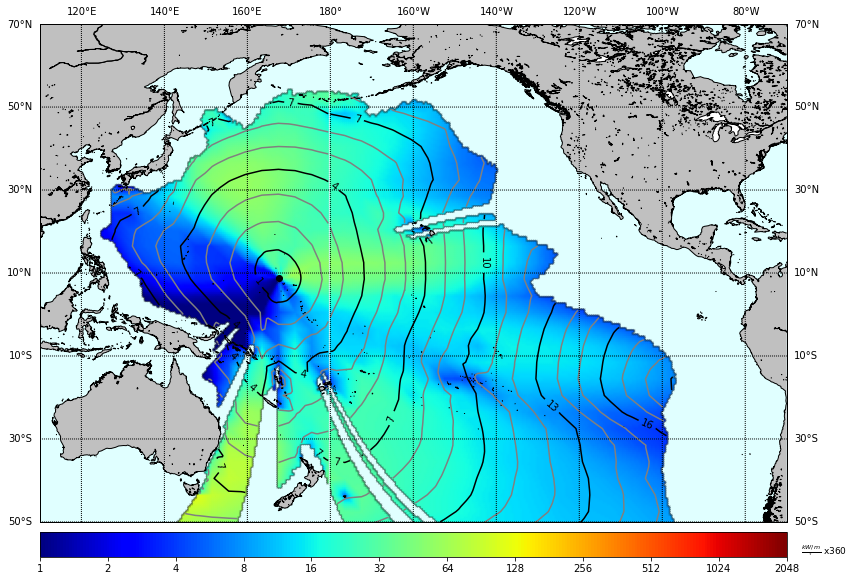

In [5]:
# --------------------------------------
# Plot ESTELA and wave point coordinates

mask_plot = ESTELA.mask_e95

Plot_ESTELA(
    ESTELA.pnt_longitude, ESTELA.pnt_latitude,
    ESTELA.F_y1993to2012 * mask_plot, 
    ESTELA.D_y1993to2012 * mask_plot,
    lon1 = 110, lon2 = 290, lat1 = -50, lat2 = 70,
);


In [9]:
# --------------------------------------
# ESTELA waves data: resample to daily

# select time window and calculate daily mean
WAVES_d = WAVES.sel(time = slice(kma_date_ini, kma_date_end)).resample(time='1D').mean()
    
print(WAVES_d)
print()


# --------------------------------------
# calculate mean runup from 3 locations, resample to daily 

# mean runup from 3 points
WAVES_RUNUP = (WAVES_runup_N.runup + WAVES_runup_S.runup + WAVES_runup_E.runup)/3.0
WAVES_RUNUP = WAVES_RUNUP.to_dataset()  

WAVES_runup_d = WAVES_RUNUP.sel(time = slice(kma_date_ini, kma_date_end)).resample(time='1D').mean()
print(WAVES_runup_d)
print()


<xarray.Dataset>
Dimensions:      (time: 14955)
Coordinates:
  * time         (time) datetime64[ns] 1979-01-22 1979-01-23 ... 2020-01-01
Data variables:
    sea_Hs       (time) float64 2.798 2.464 2.525 1.941 ... 1.935 2.229 2.726
    sea_Tp       (time) float64 8.517 10.1 10.25 10.35 ... 10.98 12.29 15.91
    sea_Dir      (time) float64 66.89 75.43 74.23 75.45 ... 197.5 267.6 353.8
    swell_1_Hs   (time) float64 0.1362 nan nan nan nan ... 0.4933 nan 0.4047 nan
    swell_1_Tp   (time) float64 14.6 nan nan nan nan ... 9.791 nan 9.965 nan
    swell_1_Dir  (time) float64 52.5 nan nan nan nan ... 78.66 nan 76.45 nan
    swell_2_Hs   (time) float64 0.2542 0.2657 0.1928 ... 0.4162 0.3915 0.3897
    swell_2_Tp   (time) float64 10.18 9.227 8.542 8.111 ... 10.41 10.4 11.9
    swell_2_Dir  (time) float64 173.4 177.1 178.3 176.6 ... 178.2 171.0 168.8
    Hs           (time) float64 2.833 2.517 2.563 1.974 ... 2.171 2.458 2.754
    Tp           (time) float64 8.572 10.19 10.41 10.36 ... 16.43 14.

(725372.0, 726103.0)

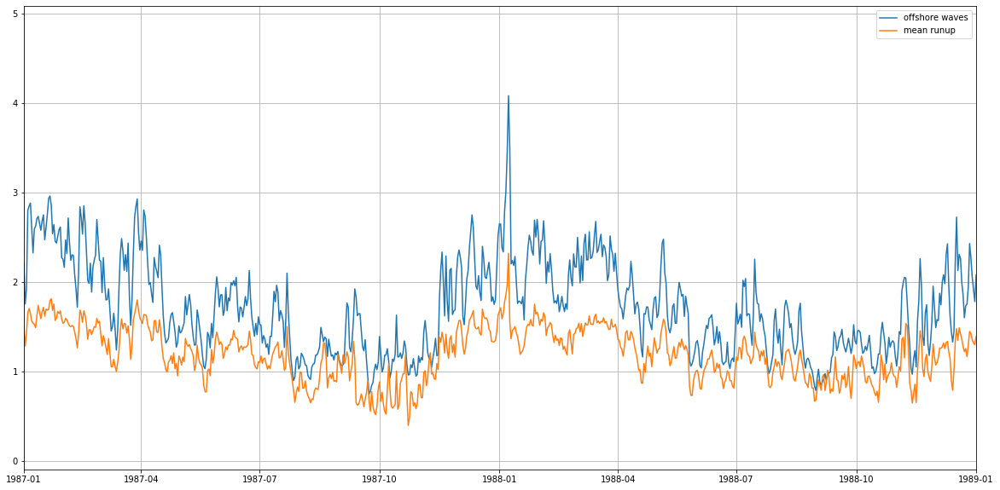

In [7]:
# plot offshore waves and mean nearshore runup from the 3 locations

from datetime import datetime

plt.figure(figsize=(20,10))
plt.plot(WAVES_d.time, WAVES_d.Hs, label='offshore waves')
plt.plot(WAVES_runup_d.time, WAVES_runup_d.runup, label='mean runup')
plt.legend()
plt.grid()
plt.xlim(datetime(1987,1,1), datetime(1989,1,1))

In [8]:
# --------------------------------------
# Calculate site SLP & SLP_gradient (daily)

# select time window and do data daily mean
SLP_d = SLP.sel(time = slice(kma_date_ini, kma_date_end)).resample(time='1D').mean()

# calculate daily gradients
SLP_d = spatial_gradient(SLP_d, 'SLP')

print(SLP_d)
    

<xarray.Dataset>
Dimensions:       (latitude: 80, longitude: 96, time: 14955)
Coordinates:
  * time          (time) datetime64[ns] 1979-01-22 1979-01-23 ... 2020-01-01
  * latitude      (latitude) float32 80.0 78.0 76.0 74.0 ... -74.0 -76.0 -78.0
  * longitude     (longitude) float32 100.0 102.0 104.0 ... 286.0 288.0 290.0
Data variables:
    SLP           (time, latitude, longitude) float64 1.03e+05 ... 9.986e+04
    SLP_gradient  (time, latitude, longitude) float64 0.0 0.0 0.0 ... 0.0 0.0



## ESTELA Predictor - Principal Component Analysis

In [9]:
# --------------------------------------
# remove sectors from which waves do not arrive to site
# W=0º, N=-90º, W=180º, S=90º

def cart2pol(a, b):
    '''Output in degrees'''
    # convert to geographic convention
    module = np.sqrt(a**2 + b**2)
    direction = np.arctan2(b, a)
    direction = np.degrees(direction)

    return module, direction


[lon, lat] = np.meshgrid(SLP_d.longitude, SLP_d.latitude)

[mod,dire] = cart2pol(167.735-lon, 8.705-lat)

mask1 = np.where((dire>=65), 1, -1) # keep from SW to E
mask2 = np.where((dire<=-135), 1, -1) # keep from NE to E

mask = - (mask1*mask2)
mask = np.where(mask==1, 1, np.nan)

SLP_d['SLP'] = SLP_d.SLP * mask
SLP_d['SLP_gradient'] = SLP_d.SLP_gradient * mask


In [10]:
# --------------------------------------
# Calculate ESTELA PCA

# select ESTELA at site grid
ESTELA_site = ESTELA.sel(longitude = SLP.longitude, latitude = SLP.latitude)
estela_D = ESTELA_site.D_y1993to2012

# estela masks: data mask (95% energy) and land mask (plots)
estela_mask = ESTELA_site.mask_e95  
estela_land = ESTELA_site.mask_land

# apply ESTELA mask to SLP data
SLP_d['SLP'] = SLP_d.SLP * estela_mask
SLP_d['SLP_gradient'] = SLP_d.SLP_gradient * estela_mask
SLP_d['mask_land'] = estela_land


# Use our custom ESTELA Predictor 
pred = Predictor(db.paths.site.ESTELA.pred_slp)
pred.data = SLP_d

# PCA (dynamic estela predictor)
pred.Calc_PCA_EstelaPred('SLP', estela_D)

# Load predictor PCA, KMA
#pred.Load()

print(pred.PCA)


<xarray.Dataset>
Dimensions:        (n_components: 3626, n_features: 3626, n_lat: 80, n_lon: 96, n_points: 15360, time: 14933)
Dimensions without coordinates: n_components, n_features, n_lat, n_lon, n_points, time
Data variables:
    PCs            (time, n_components) float64 17.53 11.09 ... -1.757e-05
    EOFs           (n_components, n_features) float64 0.001852 ... -0.0001548
    variance       (n_components) float64 432.0 206.0 ... 6.958e-09 4.133e-09
    pred_mean      (n_features) float64 9.925e+04 9.967e+04 ... 2.837e+05
    pred_std       (n_features) float64 1.211e+03 1.21e+03 ... 2.088e+05
    pred_lon       (n_lon) float64 100.0 102.0 104.0 106.0 ... 286.0 288.0 290.0
    pred_lat       (n_lat) float64 80.0 78.0 76.0 74.0 ... -74.0 -76.0 -78.0
    pred_time      (time) datetime64[ns] 1979-02-13 1979-02-14 ... 2020-01-01
    pred_data_pos  (n_points) bool False False False False ... False False False
Attributes:
    method:     gradient + estela
    pred_name:  SLP


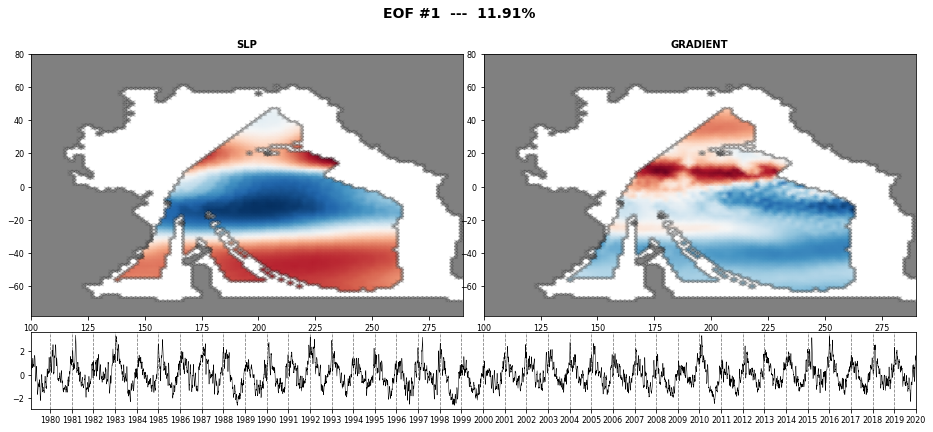

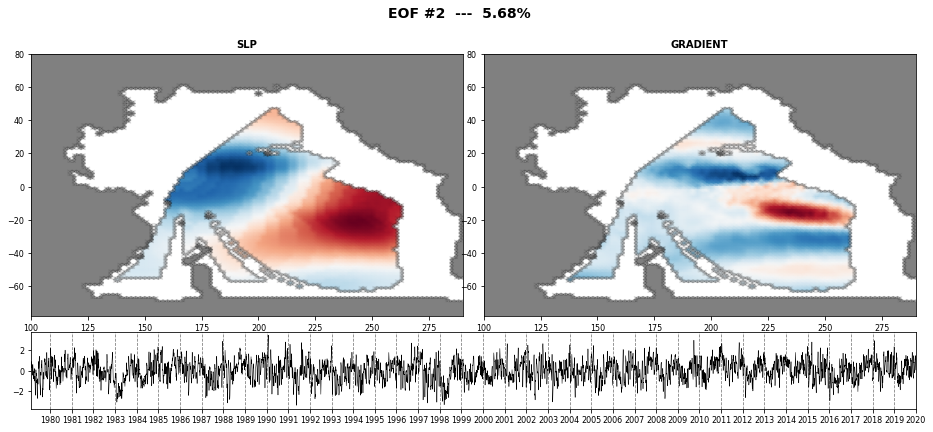

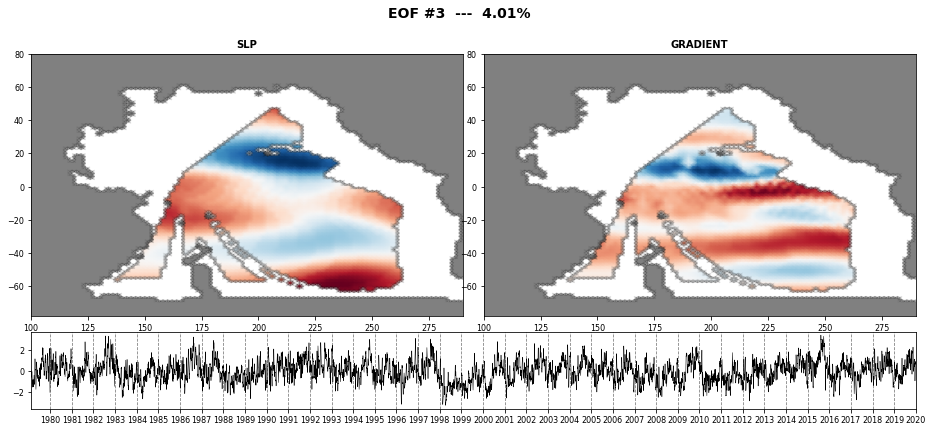

In [11]:
# plot PCA EOFs
n_EOFs = 3

pred.Plot_EOFs_EstelaPred(n_EOFs, show=True);



## ESTELA Predictor - KMeans Classification

In [24]:
# Calculate KMA (regression guided with RUNUP data)
pred.Calc_KMA_regressionguided(
    num_clusters,
    WAVES_runup_d, ['runup'],
    kmarg_alpha, min_group_size=50, repres=0.85
)

print(pred.KMA)

  c: 3 - s: 27
  c: 15 - s: 4
  c: 16 - s: 3
  c: 25 - s: 4
  c: 34 - s: 3
  c: 35 - s: 36
total attemps:  1

  c: 0 - s: 4
  c: 5 - s: 17
  c: 7 - s: 7
  c: 8 - s: 39
  c: 11 - s: 41
  c: 18 - s: 4
  c: 19 - s: 12
  c: 22 - s: 18
  c: 24 - s: 3
  c: 35 - s: 3
total attemps:  2

  c: 0 - s: 3
  c: 9 - s: 5
  c: 16 - s: 26
  c: 17 - s: 13
  c: 19 - s: 35
  c: 20 - s: 3
  c: 21 - s: 3
  c: 25 - s: 3
  c: 27 - s: 22
  c: 35 - s: 5
total attemps:  3

  c: 0 - s: 22
  c: 2 - s: 9
  c: 8 - s: 48
  c: 12 - s: 3
  c: 13 - s: 26
  c: 16 - s: 4
  c: 29 - s: 5
total attemps:  4

  c: 1 - s: 6
  c: 13 - s: 5
  c: 20 - s: 7
  c: 21 - s: 4
  c: 24 - s: 11
  c: 25 - s: 12
total attemps:  5

  c: 5 - s: 15
  c: 11 - s: 4
  c: 12 - s: 15
  c: 20 - s: 20
  c: 23 - s: 25
  c: 24 - s: 21
  c: 26 - s: 26
total attemps:  6

  c: 0 - s: 9
  c: 6 - s: 3
  c: 12 - s: 9
  c: 13 - s: 19
  c: 15 - s: 12
  c: 19 - s: 12
  c: 23 - s: 3
  c: 29 - s: 6
  c: 32 - s: 25
  c: 35 - s: 35
total attemps:  7

  c: 18 - s: 7

  c: 1 - s: 7
  c: 6 - s: 6
  c: 7 - s: 4
  c: 12 - s: 11
  c: 15 - s: 4
  c: 16 - s: 8
  c: 19 - s: 23
  c: 21 - s: 17
  c: 24 - s: 5
  c: 28 - s: 42
  c: 29 - s: 9
  c: 30 - s: 11
  c: 32 - s: 3
total attemps:  56

  c: 2 - s: 7
  c: 5 - s: 22
  c: 20 - s: 4
  c: 23 - s: 12
  c: 24 - s: 20
  c: 25 - s: 7
  c: 28 - s: 10
  c: 30 - s: 14
  c: 33 - s: 17
  c: 35 - s: 29
total attemps:  57

  c: 0 - s: 10
  c: 4 - s: 34
  c: 6 - s: 3
  c: 23 - s: 5
  c: 26 - s: 15
  c: 28 - s: 9
  c: 29 - s: 7
total attemps:  58

  c: 5 - s: 42
  c: 6 - s: 22
  c: 13 - s: 16
  c: 24 - s: 13
  c: 27 - s: 5
  c: 31 - s: 10
total attemps:  59

  c: 4 - s: 32
  c: 8 - s: 10
  c: 12 - s: 21
  c: 20 - s: 17
  c: 27 - s: 12
  c: 29 - s: 5
  c: 31 - s: 4
total attemps:  60

  c: 10 - s: 6
  c: 15 - s: 4
  c: 17 - s: 18
  c: 19 - s: 4
  c: 20 - s: 29
  c: 27 - s: 8
  c: 32 - s: 5
  c: 33 - s: 5
  c: 34 - s: 12
total attemps:  61

  c: 4 - s: 10
  c: 6 - s: 5
  c: 8 - s: 48
  c: 14 - s: 18
  c: 21 - s: 9
  c: 25 -

  c: 14 - s: 3
  c: 17 - s: 22
  c: 22 - s: 20
  c: 28 - s: 7
  c: 30 - s: 4
  c: 32 - s: 4
total attemps:  112

  c: 1 - s: 11
  c: 3 - s: 11
  c: 4 - s: 4
  c: 15 - s: 4
  c: 16 - s: 18
  c: 24 - s: 4
  c: 25 - s: 4
  c: 33 - s: 31
total attemps:  113

  c: 7 - s: 17
  c: 11 - s: 12
  c: 12 - s: 3
  c: 14 - s: 18
  c: 15 - s: 8
  c: 18 - s: 21
  c: 19 - s: 8
  c: 23 - s: 4
  c: 25 - s: 27
  c: 34 - s: 6
total attemps:  114

  c: 0 - s: 34
  c: 18 - s: 35
  c: 20 - s: 29
  c: 22 - s: 12
  c: 32 - s: 7
  c: 35 - s: 4
total attemps:  115

  c: 4 - s: 4
  c: 9 - s: 42
  c: 14 - s: 18
  c: 16 - s: 18
  c: 17 - s: 28
  c: 22 - s: 14
  c: 29 - s: 42
  c: 34 - s: 10
total attemps:  116

  c: 8 - s: 17
  c: 13 - s: 3
  c: 15 - s: 7
  c: 25 - s: 35
  c: 26 - s: 16
  c: 28 - s: 4
  c: 31 - s: 7
  c: 32 - s: 20
total attemps:  117

  c: 10 - s: 10
  c: 18 - s: 5
  c: 20 - s: 29
  c: 29 - s: 43
total attemps:  118

  c: 10 - s: 14
  c: 14 - s: 3
  c: 19 - s: 4
  c: 21 - s: 3
  c: 28 - s: 23
  c: 

  c: 3 - s: 41
  c: 8 - s: 6
  c: 9 - s: 3
  c: 13 - s: 3
  c: 21 - s: 8
  c: 33 - s: 1
  c: 34 - s: 3
  c: 35 - s: 13
total attemps:  167

  c: 3 - s: 36
  c: 15 - s: 3
  c: 19 - s: 39
  c: 21 - s: 25
  c: 25 - s: 38
  c: 30 - s: 6
total attemps:  168

  c: 8 - s: 12
  c: 20 - s: 12
  c: 28 - s: 10
  c: 31 - s: 35
  c: 32 - s: 25
  c: 33 - s: 10
total attemps:  169

  c: 4 - s: 7
  c: 10 - s: 31
  c: 11 - s: 4
  c: 19 - s: 4
  c: 26 - s: 7
  c: 27 - s: 2
  c: 30 - s: 7
  c: 31 - s: 10
  c: 32 - s: 17
  c: 33 - s: 3
total attemps:  170

  c: 4 - s: 3
  c: 9 - s: 5
  c: 14 - s: 4
  c: 15 - s: 7
  c: 17 - s: 9
  c: 21 - s: 28
  c: 31 - s: 3
  c: 33 - s: 3
total attemps:  171

  c: 3 - s: 4
  c: 4 - s: 2
  c: 8 - s: 10
  c: 9 - s: 16
  c: 16 - s: 5
  c: 33 - s: 2
  c: 35 - s: 16
total attemps:  172

  c: 6 - s: 4
  c: 11 - s: 5
  c: 13 - s: 5
  c: 15 - s: 14
  c: 20 - s: 28
  c: 22 - s: 49
  c: 25 - s: 4
  c: 26 - s: 12
  c: 35 - s: 5
total attemps:  173

  c: 7 - s: 11
  c: 12 - s: 3
  c

  c: 12 - s: 3
  c: 19 - s: 10
  c: 21 - s: 48
  c: 24 - s: 15
  c: 28 - s: 17
  c: 29 - s: 3
  c: 30 - s: 5
  c: 31 - s: 17
  c: 35 - s: 25
total attemps:  220

  c: 9 - s: 16
  c: 11 - s: 12
  c: 18 - s: 3
  c: 21 - s: 7
  c: 22 - s: 8
  c: 24 - s: 36
  c: 25 - s: 3
  c: 26 - s: 18
  c: 27 - s: 3
  c: 29 - s: 7
  c: 34 - s: 22
total attemps:  221

  c: 17 - s: 6
  c: 19 - s: 22
  c: 22 - s: 9
  c: 24 - s: 6
  c: 28 - s: 11
  c: 30 - s: 3
  c: 33 - s: 3
  c: 35 - s: 13
total attemps:  222

  c: 11 - s: 30
  c: 12 - s: 13
  c: 16 - s: 20
  c: 17 - s: 38
  c: 25 - s: 14
  c: 27 - s: 40
  c: 33 - s: 5
total attemps:  223

  c: 0 - s: 38
  c: 6 - s: 4
  c: 13 - s: 9
  c: 19 - s: 33
  c: 20 - s: 6
  c: 21 - s: 6
  c: 25 - s: 12
  c: 26 - s: 10
  c: 27 - s: 20
  c: 29 - s: 5
  c: 34 - s: 4
total attemps:  224

  c: 3 - s: 13
  c: 8 - s: 23
  c: 18 - s: 6
  c: 19 - s: 15
  c: 23 - s: 47
  c: 28 - s: 18
total attemps:  225

  c: 4 - s: 6
  c: 9 - s: 28
  c: 10 - s: 4
  c: 18 - s: 5
  c: 19 - 

  c: 0 - s: 19
  c: 11 - s: 10
  c: 15 - s: 49
  c: 18 - s: 15
total attemps:  272

  c: 1 - s: 3
  c: 5 - s: 8
  c: 7 - s: 6
  c: 8 - s: 5
  c: 14 - s: 44
  c: 20 - s: 14
  c: 21 - s: 9
  c: 29 - s: 22
  c: 30 - s: 2
  c: 32 - s: 6
  c: 33 - s: 13
  c: 35 - s: 6
total attemps:  273

  c: 0 - s: 2
  c: 2 - s: 4
  c: 3 - s: 28
  c: 7 - s: 3
  c: 12 - s: 6
  c: 15 - s: 22
  c: 16 - s: 2
  c: 17 - s: 7
  c: 19 - s: 40
  c: 21 - s: 8
  c: 24 - s: 4
  c: 29 - s: 7
  c: 32 - s: 23
  c: 35 - s: 7
total attemps:  274

  c: 9 - s: 3
  c: 18 - s: 6
  c: 21 - s: 9
  c: 24 - s: 8
  c: 28 - s: 18
  c: 30 - s: 4
  c: 31 - s: 4
  c: 35 - s: 8
total attemps:  275

  c: 6 - s: 8
  c: 9 - s: 12
  c: 18 - s: 23
  c: 24 - s: 16
  c: 26 - s: 42
  c: 30 - s: 4
  c: 31 - s: 3
  c: 32 - s: 45
  c: 33 - s: 23
  c: 34 - s: 38
total attemps:  276

  c: 11 - s: 3
  c: 13 - s: 6
  c: 19 - s: 5
  c: 26 - s: 3
  c: 27 - s: 12
  c: 28 - s: 21
  c: 30 - s: 4
  c: 32 - s: 5
  c: 35 - s: 4
total attemps:  277

  c: 18 -

  c: 2 - s: 35
  c: 8 - s: 6
  c: 12 - s: 14
  c: 16 - s: 3
  c: 17 - s: 7
  c: 21 - s: 7
  c: 22 - s: 42
  c: 26 - s: 13
  c: 34 - s: 39
  c: 35 - s: 6
total attemps:  326

  c: 1 - s: 9
  c: 8 - s: 25
  c: 14 - s: 21
  c: 15 - s: 4
  c: 16 - s: 5
  c: 17 - s: 18
  c: 23 - s: 41
  c: 32 - s: 3
total attemps:  327

  c: 1 - s: 7
  c: 15 - s: 7
  c: 16 - s: 17
  c: 21 - s: 5
  c: 28 - s: 26
  c: 31 - s: 3
  c: 32 - s: 7
  c: 34 - s: 13
total attemps:  328

  c: 4 - s: 7
  c: 10 - s: 5
  c: 13 - s: 36
  c: 14 - s: 17
  c: 18 - s: 6
  c: 22 - s: 11
total attemps:  329

  c: 5 - s: 42
  c: 10 - s: 4
  c: 23 - s: 3
  c: 33 - s: 10
total attemps:  330

  c: 6 - s: 6
  c: 14 - s: 15
  c: 15 - s: 5
  c: 16 - s: 16
  c: 17 - s: 3
  c: 22 - s: 5
  c: 26 - s: 7
  c: 29 - s: 8
  c: 32 - s: 8
  c: 33 - s: 7
total attemps:  331

  c: 3 - s: 8
  c: 6 - s: 4
  c: 9 - s: 3
  c: 10 - s: 33
  c: 21 - s: 4
  c: 25 - s: 8
  c: 26 - s: 4
  c: 33 - s: 12
total attemps:  332

  c: 0 - s: 6
  c: 6 - s: 14
  c:

  c: 0 - s: 14
  c: 1 - s: 4
  c: 6 - s: 41
  c: 9 - s: 5
  c: 14 - s: 5
  c: 15 - s: 12
  c: 18 - s: 8
  c: 28 - s: 3
  c: 29 - s: 49
total attemps:  378

  c: 4 - s: 5
  c: 7 - s: 4
  c: 14 - s: 14
  c: 16 - s: 11
  c: 17 - s: 14
  c: 19 - s: 7
  c: 20 - s: 8
  c: 24 - s: 3
  c: 29 - s: 5
  c: 31 - s: 8
  c: 32 - s: 27
  c: 34 - s: 43
total attemps:  379

  c: 0 - s: 20
  c: 3 - s: 19
  c: 13 - s: 13
  c: 15 - s: 4
  c: 17 - s: 21
  c: 18 - s: 32
  c: 27 - s: 6
  c: 30 - s: 21
  c: 32 - s: 3
  c: 35 - s: 16
total attemps:  380

  c: 4 - s: 7
  c: 12 - s: 6
  c: 14 - s: 7
  c: 17 - s: 4
  c: 18 - s: 3
  c: 20 - s: 25
  c: 23 - s: 11
  c: 31 - s: 5
  c: 35 - s: 6
total attemps:  381

  c: 8 - s: 14
  c: 15 - s: 3
  c: 17 - s: 4
  c: 21 - s: 15
  c: 22 - s: 5
  c: 25 - s: 10
  c: 26 - s: 13
  c: 29 - s: 3
  c: 32 - s: 3
  c: 33 - s: 3
  c: 35 - s: 8
total attemps:  382

  c: 10 - s: 9
  c: 13 - s: 3
  c: 16 - s: 9
  c: 18 - s: 7
  c: 28 - s: 3
  c: 29 - s: 16
  c: 30 - s: 4
  c: 32 - s:

  c: 11 - s: 6
  c: 13 - s: 43
  c: 16 - s: 6
  c: 21 - s: 10
  c: 23 - s: 10
  c: 24 - s: 8
  c: 25 - s: 19
  c: 28 - s: 6
  c: 32 - s: 3
  c: 33 - s: 5
  c: 35 - s: 7
total attemps:  429

  c: 1 - s: 6
  c: 5 - s: 32
  c: 14 - s: 12
  c: 21 - s: 3
  c: 23 - s: 4
  c: 24 - s: 3
  c: 28 - s: 4
  c: 29 - s: 44
  c: 33 - s: 6
total attemps:  430

  c: 6 - s: 4
  c: 17 - s: 20
  c: 26 - s: 5
  c: 27 - s: 14
  c: 31 - s: 11
  c: 34 - s: 4
total attemps:  431

  c: 8 - s: 5
  c: 10 - s: 6
  c: 11 - s: 23
  c: 16 - s: 10
  c: 18 - s: 15
  c: 21 - s: 12
  c: 22 - s: 4
  c: 24 - s: 6
  c: 27 - s: 3
total attemps:  432

  c: 6 - s: 48
  c: 9 - s: 4
  c: 10 - s: 4
  c: 11 - s: 3
  c: 12 - s: 4
  c: 20 - s: 32
  c: 22 - s: 3
  c: 24 - s: 17
  c: 28 - s: 10
  c: 30 - s: 3
  c: 32 - s: 14
total attemps:  433

  c: 17 - s: 5
  c: 20 - s: 3
  c: 25 - s: 21
  c: 26 - s: 3
total attemps:  434

  c: 2 - s: 8
  c: 6 - s: 39
  c: 8 - s: 32
  c: 10 - s: 10
  c: 14 - s: 3
  c: 18 - s: 45
  c: 26 - s: 9
  c:

  c: 11 - s: 12
  c: 14 - s: 3
  c: 15 - s: 9
  c: 17 - s: 5
  c: 20 - s: 12
  c: 22 - s: 21
  c: 24 - s: 12
  c: 25 - s: 3
  c: 26 - s: 11
  c: 30 - s: 3
  c: 31 - s: 11
  c: 33 - s: 8
  c: 34 - s: 3
  c: 35 - s: 17
total attemps:  483

  c: 10 - s: 6
  c: 27 - s: 22
  c: 29 - s: 18
  c: 32 - s: 17
  c: 34 - s: 21
total attemps:  484

  c: 0 - s: 8
  c: 10 - s: 42
  c: 18 - s: 3
  c: 26 - s: 5
  c: 28 - s: 4
  c: 30 - s: 9
  c: 31 - s: 4
  c: 35 - s: 4
total attemps:  485

  c: 4 - s: 6
  c: 13 - s: 4
  c: 17 - s: 19
  c: 18 - s: 3
  c: 21 - s: 38
  c: 22 - s: 9
  c: 25 - s: 4
  c: 28 - s: 5
  c: 30 - s: 6
  c: 32 - s: 10
  c: 33 - s: 6
  c: 34 - s: 28
total attemps:  486

  c: 14 - s: 5
  c: 18 - s: 20
  c: 21 - s: 6
  c: 24 - s: 14
  c: 29 - s: 15
  c: 33 - s: 28
total attemps:  487

  c: 0 - s: 21
  c: 4 - s: 4
  c: 18 - s: 24
  c: 23 - s: 8
  c: 24 - s: 18
  c: 27 - s: 4
  c: 28 - s: 4
  c: 29 - s: 3
  c: 30 - s: 4
  c: 31 - s: 15
  c: 34 - s: 3
total attemps:  488

  c: 22 - s: 1

  c: 0 - s: 5
  c: 11 - s: 5
  c: 12 - s: 6
  c: 18 - s: 5
  c: 20 - s: 3
  c: 23 - s: 40
  c: 24 - s: 5
  c: 25 - s: 5
  c: 29 - s: 10
  c: 33 - s: 4
total attemps:  536

  c: 3 - s: 8
  c: 9 - s: 4
  c: 10 - s: 4
  c: 12 - s: 10
  c: 15 - s: 5
  c: 18 - s: 11
  c: 22 - s: 4
  c: 25 - s: 10
  c: 27 - s: 5
  c: 29 - s: 5
  c: 33 - s: 8
total attemps:  537

  c: 0 - s: 11
  c: 1 - s: 6
  c: 5 - s: 4
  c: 9 - s: 5
  c: 10 - s: 3
  c: 18 - s: 30
  c: 22 - s: 5
  c: 23 - s: 3
  c: 24 - s: 9
  c: 31 - s: 7
total attemps:  538

  c: 1 - s: 16
  c: 3 - s: 25
  c: 11 - s: 41
  c: 14 - s: 3
  c: 18 - s: 49
  c: 27 - s: 10
  c: 28 - s: 9
  c: 29 - s: 4
  c: 31 - s: 7
  c: 34 - s: 6
total attemps:  539

  c: 10 - s: 3
  c: 14 - s: 4
  c: 20 - s: 9
  c: 28 - s: 3
  c: 33 - s: 20
  c: 34 - s: 4
total attemps:  540

  c: 0 - s: 27
  c: 6 - s: 29
  c: 10 - s: 7
  c: 12 - s: 24
  c: 26 - s: 3
  c: 28 - s: 6
  c: 29 - s: 5
  c: 30 - s: 20
  c: 31 - s: 29
  c: 32 - s: 23
total attemps:  541

  c: 20 - s

  c: 14 - s: 16
  c: 21 - s: 6
  c: 23 - s: 7
  c: 27 - s: 10
total attemps:  593

  c: 0 - s: 20
  c: 1 - s: 3
  c: 10 - s: 19
  c: 12 - s: 6
  c: 14 - s: 3
  c: 15 - s: 29
  c: 16 - s: 3
  c: 17 - s: 5
  c: 20 - s: 3
  c: 22 - s: 8
  c: 24 - s: 18
  c: 25 - s: 5
  c: 26 - s: 5
  c: 27 - s: 8
  c: 31 - s: 10
total attemps:  594

  c: 7 - s: 25
  c: 8 - s: 5
  c: 9 - s: 22
  c: 11 - s: 21
  c: 19 - s: 7
  c: 20 - s: 12
  c: 27 - s: 21
  c: 33 - s: 36
total attemps:  595

  c: 5 - s: 7
  c: 7 - s: 3
  c: 11 - s: 15
  c: 20 - s: 3
  c: 24 - s: 17
  c: 25 - s: 4
  c: 33 - s: 20
  c: 34 - s: 5
total attemps:  596

  c: 0 - s: 4
  c: 7 - s: 6
  c: 18 - s: 5
  c: 19 - s: 7
  c: 21 - s: 4
  c: 22 - s: 8
  c: 23 - s: 11
  c: 24 - s: 8
  c: 25 - s: 3
  c: 29 - s: 34
  c: 30 - s: 15
  c: 31 - s: 6
total attemps:  597

  c: 10 - s: 14
  c: 13 - s: 6
  c: 17 - s: 4
  c: 20 - s: 6
  c: 24 - s: 17
  c: 25 - s: 14
total attemps:  598

  c: 13 - s: 14
  c: 14 - s: 14
  c: 23 - s: 38
  c: 28 - s: 17
  

  c: 0 - s: 24
  c: 10 - s: 27
  c: 19 - s: 6
  c: 21 - s: 22
  c: 23 - s: 4
  c: 25 - s: 10
  c: 26 - s: 3
  c: 27 - s: 4
  c: 35 - s: 13
total attemps:  647

  c: 10 - s: 5
  c: 13 - s: 9
  c: 16 - s: 5
  c: 18 - s: 18
  c: 24 - s: 5
  c: 25 - s: 6
  c: 27 - s: 3
  c: 34 - s: 3
total attemps:  648

  c: 0 - s: 12
  c: 2 - s: 14
  c: 3 - s: 3
  c: 5 - s: 10
  c: 6 - s: 4
  c: 8 - s: 3
  c: 10 - s: 34
  c: 15 - s: 4
  c: 16 - s: 4
  c: 19 - s: 24
  c: 21 - s: 7
  c: 22 - s: 28
  c: 23 - s: 9
  c: 24 - s: 6
  c: 30 - s: 3
  c: 31 - s: 6
  c: 33 - s: 15
  c: 34 - s: 7
total attemps:  649

  c: 2 - s: 5
  c: 5 - s: 16
  c: 11 - s: 4
  c: 12 - s: 4
  c: 14 - s: 11
  c: 15 - s: 8
  c: 18 - s: 36
  c: 19 - s: 15
  c: 22 - s: 3
  c: 27 - s: 4
  c: 33 - s: 7
  c: 34 - s: 3
  c: 35 - s: 6
total attemps:  650

  c: 8 - s: 31
  c: 12 - s: 12
  c: 13 - s: 5
  c: 17 - s: 3
  c: 19 - s: 29
  c: 22 - s: 7
  c: 31 - s: 6
  c: 34 - s: 4
total attemps:  651

  c: 1 - s: 5
  c: 7 - s: 12
  c: 10 - s: 2
 

  c: 1 - s: 28
  c: 10 - s: 4
  c: 14 - s: 3
  c: 25 - s: 11
  c: 29 - s: 15
total attemps:  701

  c: 0 - s: 9
  c: 13 - s: 7
  c: 14 - s: 10
  c: 16 - s: 29
  c: 19 - s: 26
  c: 20 - s: 14
  c: 21 - s: 26
  c: 22 - s: 4
  c: 33 - s: 7
total attemps:  702

  c: 0 - s: 6
  c: 12 - s: 4
  c: 13 - s: 21
  c: 18 - s: 8
  c: 20 - s: 7
  c: 21 - s: 39
  c: 26 - s: 9
  c: 30 - s: 8
  c: 31 - s: 17
  c: 34 - s: 7
  c: 35 - s: 6
total attemps:  703

  c: 0 - s: 17
  c: 3 - s: 13
  c: 7 - s: 4
  c: 15 - s: 4
  c: 18 - s: 7
  c: 20 - s: 11
  c: 24 - s: 28
  c: 27 - s: 6
  c: 29 - s: 3
  c: 31 - s: 5
  c: 34 - s: 4
total attemps:  704

  c: 0 - s: 31
  c: 1 - s: 7
  c: 6 - s: 10
  c: 10 - s: 14
  c: 13 - s: 31
  c: 25 - s: 30
  c: 34 - s: 20
  c: 35 - s: 31
total attemps:  705

  c: 16 - s: 12
  c: 19 - s: 18
  c: 21 - s: 33
  c: 27 - s: 13
  c: 29 - s: 7
  c: 32 - s: 8
total attemps:  706

  c: 9 - s: 39
  c: 11 - s: 36
  c: 14 - s: 4
  c: 16 - s: 29
  c: 18 - s: 3
  c: 20 - s: 8
  c: 27 - s: 4


  c: 0 - s: 3
  c: 1 - s: 3
  c: 6 - s: 22
  c: 7 - s: 8
  c: 18 - s: 9
  c: 19 - s: 39
  c: 23 - s: 9
  c: 30 - s: 9
  c: 33 - s: 6
total attemps:  754

  c: 0 - s: 6
  c: 2 - s: 6
  c: 5 - s: 4
  c: 6 - s: 4
  c: 16 - s: 4
  c: 22 - s: 33
  c: 23 - s: 6
  c: 24 - s: 5
  c: 25 - s: 7
  c: 29 - s: 26
  c: 31 - s: 22
  c: 35 - s: 3
total attemps:  755

  c: 2 - s: 4
  c: 7 - s: 3
  c: 15 - s: 14
  c: 16 - s: 17
  c: 20 - s: 7
  c: 24 - s: 17
  c: 28 - s: 4
  c: 29 - s: 4
  c: 30 - s: 10
  c: 32 - s: 3
  c: 33 - s: 5
  c: 35 - s: 4
total attemps:  756

  c: 3 - s: 5
  c: 5 - s: 3
  c: 6 - s: 5
  c: 11 - s: 9
  c: 13 - s: 3
  c: 14 - s: 5
  c: 15 - s: 12
  c: 19 - s: 2
  c: 25 - s: 11
  c: 28 - s: 11
  c: 31 - s: 8
  c: 34 - s: 9
  c: 35 - s: 39
total attemps:  757

  c: 11 - s: 5
  c: 17 - s: 8
  c: 24 - s: 14
  c: 25 - s: 6
  c: 31 - s: 4
  c: 33 - s: 21
  c: 35 - s: 13
total attemps:  758

  c: 16 - s: 3
  c: 22 - s: 8
  c: 24 - s: 21
  c: 28 - s: 15
total attemps:  759

  c: 2 - s: 5


  c: 10 - s: 22
  c: 12 - s: 7
  c: 14 - s: 7
  c: 15 - s: 6
  c: 16 - s: 22
  c: 21 - s: 5
  c: 33 - s: 14
total attemps:  805

  c: 5 - s: 5
  c: 9 - s: 19
  c: 11 - s: 4
  c: 13 - s: 3
  c: 16 - s: 48
  c: 19 - s: 21
  c: 27 - s: 5
  c: 31 - s: 3
  c: 33 - s: 14
total attemps:  806

  c: 0 - s: 5
  c: 6 - s: 3
  c: 14 - s: 11
  c: 16 - s: 10
  c: 20 - s: 12
  c: 26 - s: 18
  c: 29 - s: 18
  c: 30 - s: 16
  c: 34 - s: 24
total attemps:  807

  c: 12 - s: 6
  c: 16 - s: 3
  c: 18 - s: 26
  c: 21 - s: 30
  c: 27 - s: 17
  c: 28 - s: 10
  c: 29 - s: 6
  c: 33 - s: 21
total attemps:  808

  c: 10 - s: 9
  c: 20 - s: 18
  c: 23 - s: 10
  c: 26 - s: 13
  c: 29 - s: 9
  c: 35 - s: 8
total attemps:  809

  c: 8 - s: 47
  c: 9 - s: 8
  c: 15 - s: 16
  c: 19 - s: 8
  c: 22 - s: 7
  c: 26 - s: 8
  c: 28 - s: 4
  c: 29 - s: 13
  c: 30 - s: 19
  c: 34 - s: 7
  c: 35 - s: 22
total attemps:  810

  c: 1 - s: 17
  c: 16 - s: 42
  c: 17 - s: 41
  c: 19 - s: 22
  c: 22 - s: 35
  c: 29 - s: 6
  c: 30 -

  c: 1 - s: 5
  c: 12 - s: 6
  c: 20 - s: 6
  c: 25 - s: 9
  c: 31 - s: 12
  c: 32 - s: 4
  c: 33 - s: 5
  c: 34 - s: 7
total attemps:  860

  c: 1 - s: 43
  c: 20 - s: 36
  c: 22 - s: 17
  c: 24 - s: 4
  c: 27 - s: 23
  c: 28 - s: 5
  c: 29 - s: 5
  c: 30 - s: 7
  c: 33 - s: 7
  c: 34 - s: 13
total attemps:  861

  c: 0 - s: 4
  c: 1 - s: 4
  c: 4 - s: 4
  c: 16 - s: 16
  c: 19 - s: 26
  c: 25 - s: 7
  c: 33 - s: 7
  c: 34 - s: 7
total attemps:  862

  c: 5 - s: 37
  c: 9 - s: 6
  c: 10 - s: 21
  c: 14 - s: 20
  c: 16 - s: 4
  c: 20 - s: 30
  c: 23 - s: 18
  c: 25 - s: 4
  c: 27 - s: 14
  c: 34 - s: 3
  c: 35 - s: 38
total attemps:  863

  c: 0 - s: 37
  c: 1 - s: 3
  c: 5 - s: 3
  c: 13 - s: 32
  c: 17 - s: 11
  c: 33 - s: 49
  c: 34 - s: 9
total attemps:  864

  c: 7 - s: 7
  c: 9 - s: 5
  c: 10 - s: 5
  c: 11 - s: 5
  c: 12 - s: 5
  c: 22 - s: 3
  c: 24 - s: 43
  c: 28 - s: 3
  c: 33 - s: 9
total attemps:  865

  c: 0 - s: 6
  c: 1 - s: 10
  c: 7 - s: 25
  c: 12 - s: 3
  c: 15 - s:

  c: 10 - s: 3
  c: 11 - s: 14
  c: 15 - s: 6
  c: 16 - s: 11
  c: 17 - s: 6
  c: 18 - s: 7
  c: 22 - s: 14
  c: 27 - s: 16
  c: 30 - s: 6
total attemps:  912

  c: 12 - s: 25
  c: 13 - s: 11
  c: 19 - s: 3
  c: 22 - s: 12
  c: 27 - s: 5
total attemps:  913

  c: 10 - s: 6
  c: 21 - s: 3
  c: 25 - s: 16
  c: 27 - s: 16
  c: 31 - s: 3
  c: 32 - s: 5
  c: 33 - s: 12
total attemps:  914

  c: 2 - s: 17
  c: 19 - s: 6
  c: 24 - s: 31
  c: 29 - s: 21
  c: 30 - s: 14
  c: 35 - s: 6
total attemps:  915

  c: 3 - s: 19
  c: 25 - s: 21
  c: 27 - s: 4
  c: 32 - s: 29
  c: 35 - s: 5
total attemps:  916

  c: 5 - s: 8
  c: 9 - s: 4
  c: 17 - s: 45
  c: 23 - s: 13
  c: 25 - s: 8
  c: 30 - s: 26
  c: 31 - s: 3
  c: 35 - s: 7
total attemps:  917

  c: 6 - s: 23
  c: 9 - s: 23
  c: 13 - s: 3
  c: 16 - s: 3
  c: 24 - s: 21
  c: 25 - s: 7
  c: 27 - s: 27
  c: 31 - s: 4
  c: 33 - s: 28
  c: 34 - s: 6
total attemps:  918

  c: 3 - s: 5
  c: 11 - s: 6
  c: 12 - s: 3
  c: 13 - s: 26
  c: 15 - s: 19
  c: 16 

  c: 2 - s: 22
  c: 13 - s: 5
  c: 14 - s: 14
  c: 15 - s: 26
  c: 16 - s: 4
  c: 19 - s: 18
  c: 22 - s: 3
  c: 24 - s: 3
  c: 25 - s: 3
  c: 26 - s: 33
  c: 29 - s: 5
  c: 34 - s: 8
  c: 35 - s: 11
total attemps:  967

  c: 0 - s: 11
  c: 11 - s: 3
  c: 13 - s: 9
  c: 21 - s: 5
  c: 24 - s: 10
  c: 26 - s: 31
  c: 27 - s: 35
  c: 28 - s: 21
total attemps:  968

  c: 12 - s: 22
  c: 18 - s: 7
  c: 19 - s: 26
  c: 24 - s: 6
  c: 32 - s: 37
  c: 34 - s: 21
total attemps:  969

  c: 5 - s: 15
  c: 6 - s: 5
  c: 8 - s: 9
  c: 14 - s: 13
  c: 16 - s: 3
  c: 19 - s: 9
  c: 20 - s: 27
  c: 29 - s: 14
  c: 31 - s: 3
total attemps:  970

  c: 0 - s: 6
  c: 3 - s: 31
  c: 6 - s: 7
  c: 7 - s: 9
  c: 14 - s: 4
  c: 15 - s: 3
  c: 26 - s: 30
  c: 29 - s: 11
  c: 30 - s: 4
  c: 32 - s: 12
total attemps:  971

  c: 11 - s: 7
  c: 12 - s: 16
  c: 14 - s: 8
  c: 15 - s: 3
  c: 16 - s: 4
  c: 17 - s: 4
  c: 31 - s: 8
  c: 32 - s: 5
total attemps:  972

  c: 0 - s: 6
  c: 6 - s: 31
  c: 14 - s: 34
  c:

  c: 2 - s: 3
  c: 7 - s: 49
  c: 16 - s: 10
  c: 17 - s: 20
  c: 21 - s: 19
  c: 25 - s: 10
  c: 29 - s: 9
  c: 33 - s: 24
total attemps:  1022

  c: 13 - s: 24
  c: 18 - s: 17
  c: 24 - s: 18
  c: 25 - s: 3
  c: 26 - s: 35
  c: 35 - s: 3
total attemps:  1023

  c: 5 - s: 21
  c: 10 - s: 9
  c: 12 - s: 6
  c: 14 - s: 8
  c: 15 - s: 3
  c: 18 - s: 38
  c: 24 - s: 3
  c: 29 - s: 3
total attemps:  1024

  c: 4 - s: 6
  c: 11 - s: 7
  c: 13 - s: 5
  c: 18 - s: 20
  c: 19 - s: 5
  c: 20 - s: 16
  c: 25 - s: 31
  c: 28 - s: 9
  c: 32 - s: 3
  c: 33 - s: 7
total attemps:  1025

  c: 1 - s: 6
  c: 4 - s: 7
  c: 13 - s: 4
  c: 17 - s: 3
  c: 22 - s: 9
  c: 23 - s: 25
  c: 28 - s: 23
total attemps:  1026

  c: 9 - s: 4
  c: 23 - s: 10
  c: 28 - s: 22
  c: 33 - s: 10
  c: 34 - s: 8
total attemps:  1027

  c: 0 - s: 31
  c: 8 - s: 18
  c: 13 - s: 9
  c: 19 - s: 4
  c: 23 - s: 5
  c: 25 - s: 15
  c: 27 - s: 3
  c: 28 - s: 42
  c: 32 - s: 3
  c: 33 - s: 42
  c: 35 - s: 4
total attemps:  1028

  c: 

  c: 9 - s: 26
  c: 18 - s: 10
  c: 23 - s: 12
  c: 24 - s: 3
  c: 28 - s: 4
  c: 33 - s: 40
total attemps:  1074

  c: 6 - s: 4
  c: 7 - s: 36
  c: 9 - s: 18
  c: 14 - s: 35
  c: 16 - s: 5
  c: 18 - s: 6
  c: 20 - s: 6
  c: 21 - s: 18
  c: 24 - s: 4
  c: 33 - s: 4
  c: 34 - s: 3
total attemps:  1075

  c: 10 - s: 9
  c: 13 - s: 11
  c: 14 - s: 13
  c: 16 - s: 3
  c: 19 - s: 6
  c: 20 - s: 46
  c: 28 - s: 24
  c: 32 - s: 4
  c: 33 - s: 3
  c: 34 - s: 19
total attemps:  1076

  c: 14 - s: 3
  c: 16 - s: 25
  c: 17 - s: 10
  c: 20 - s: 23
  c: 28 - s: 3
  c: 29 - s: 6
  c: 32 - s: 14
total attemps:  1077

  c: 11 - s: 3
  c: 12 - s: 25
  c: 13 - s: 29
  c: 14 - s: 7
  c: 15 - s: 12
  c: 18 - s: 7
  c: 27 - s: 3
  c: 28 - s: 14
  c: 29 - s: 9
  c: 31 - s: 4
  c: 33 - s: 5
  c: 34 - s: 28
  c: 35 - s: 10
total attemps:  1078

  c: 0 - s: 22
  c: 18 - s: 34
  c: 23 - s: 49
  c: 25 - s: 10
  c: 31 - s: 13
  c: 32 - s: 9
  c: 33 - s: 22
total attemps:  1079

  c: 1 - s: 19
  c: 2 - s: 14
  c:

  c: 3 - s: 2
  c: 4 - s: 5
  c: 15 - s: 11
  c: 22 - s: 3
  c: 32 - s: 7
  c: 33 - s: 6
  c: 34 - s: 4
total attemps:  1129

  c: 0 - s: 3
  c: 6 - s: 9
  c: 12 - s: 4
  c: 13 - s: 7
  c: 14 - s: 29
  c: 20 - s: 40
  c: 22 - s: 13
  c: 24 - s: 4
  c: 25 - s: 46
  c: 28 - s: 8
total attemps:  1130

  c: 4 - s: 5
  c: 9 - s: 10
  c: 17 - s: 7
  c: 18 - s: 3
  c: 21 - s: 6
  c: 24 - s: 47
  c: 25 - s: 23
  c: 29 - s: 6
  c: 30 - s: 7
  c: 34 - s: 20
  c: 35 - s: 3
total attemps:  1131

  c: 1 - s: 36
  c: 4 - s: 8
  c: 10 - s: 48
  c: 11 - s: 4
  c: 12 - s: 5
  c: 13 - s: 3
  c: 18 - s: 47
  c: 21 - s: 4
  c: 27 - s: 17
  c: 31 - s: 5
total attemps:  1132

  c: 6 - s: 8
  c: 7 - s: 9
  c: 10 - s: 11
  c: 14 - s: 11
  c: 15 - s: 3
  c: 20 - s: 5
  c: 23 - s: 7
  c: 24 - s: 4
  c: 30 - s: 5
  c: 32 - s: 6
total attemps:  1133

  c: 0 - s: 21
  c: 4 - s: 4
  c: 6 - s: 9
  c: 11 - s: 4
  c: 19 - s: 3
  c: 22 - s: 14
  c: 23 - s: 8
  c: 24 - s: 6
  c: 27 - s: 17
  c: 29 - s: 21
  c: 32 - s: 1

  c: 0 - s: 5
  c: 9 - s: 5
  c: 10 - s: 4
  c: 19 - s: 13
  c: 20 - s: 25
  c: 25 - s: 6
  c: 31 - s: 6
  c: 32 - s: 4
  c: 34 - s: 3
total attemps:  1182

  c: 8 - s: 3
  c: 11 - s: 5
  c: 14 - s: 3
  c: 17 - s: 42
  c: 23 - s: 10
  c: 27 - s: 4
  c: 28 - s: 16
  c: 31 - s: 5
total attemps:  1183

  c: 7 - s: 8
  c: 22 - s: 12
  c: 24 - s: 16
  c: 26 - s: 3
  c: 29 - s: 31
  c: 31 - s: 27
  c: 33 - s: 3
total attemps:  1184

  c: 4 - s: 3
  c: 7 - s: 19
  c: 20 - s: 3
  c: 34 - s: 48
total attemps:  1185

  c: 0 - s: 7
  c: 15 - s: 29
  c: 26 - s: 5
  c: 32 - s: 5
total attemps:  1186

  c: 8 - s: 6
  c: 12 - s: 15
  c: 14 - s: 6
  c: 19 - s: 10
  c: 23 - s: 20
  c: 25 - s: 11
  c: 26 - s: 5
  c: 27 - s: 7
  c: 32 - s: 3
  c: 35 - s: 20
total attemps:  1187

  c: 0 - s: 34
  c: 7 - s: 7
  c: 11 - s: 3
  c: 13 - s: 21
  c: 16 - s: 40
  c: 18 - s: 5
  c: 26 - s: 6
  c: 27 - s: 6
  c: 28 - s: 14
  c: 31 - s: 4
  c: 34 - s: 5
total attemps:  1188

  c: 10 - s: 6
  c: 11 - s: 14
  c: 12 -

  c: 0 - s: 4
  c: 6 - s: 2
  c: 10 - s: 8
  c: 13 - s: 6
  c: 25 - s: 4
  c: 29 - s: 7
  c: 31 - s: 4
  c: 32 - s: 5
  c: 34 - s: 6
total attemps:  1237

  c: 0 - s: 28
  c: 11 - s: 6
  c: 14 - s: 8
  c: 16 - s: 5
  c: 18 - s: 3
  c: 27 - s: 14
  c: 35 - s: 18
total attemps:  1238

  c: 0 - s: 7
  c: 9 - s: 15
  c: 13 - s: 10
  c: 19 - s: 5
  c: 20 - s: 4
  c: 22 - s: 4
  c: 27 - s: 3
  c: 31 - s: 3
  c: 33 - s: 15
  c: 34 - s: 4
total attemps:  1239

  c: 1 - s: 6
  c: 2 - s: 7
  c: 12 - s: 12
  c: 13 - s: 3
  c: 15 - s: 5
  c: 24 - s: 15
  c: 26 - s: 3
  c: 32 - s: 5
  c: 34 - s: 44
  c: 35 - s: 22
total attemps:  1240

  c: 3 - s: 13
  c: 12 - s: 4
  c: 15 - s: 25
  c: 22 - s: 3
  c: 23 - s: 5
  c: 31 - s: 5
  c: 32 - s: 3
total attemps:  1241

  c: 4 - s: 4
  c: 5 - s: 6
  c: 14 - s: 16
  c: 16 - s: 5
  c: 22 - s: 4
  c: 25 - s: 28
  c: 29 - s: 3
  c: 30 - s: 6
total attemps:  1242

  c: 4 - s: 10
  c: 5 - s: 11
  c: 7 - s: 8
  c: 9 - s: 5
  c: 14 - s: 4
  c: 16 - s: 25
  c: 17 - 

  c: 13 - s: 41
  c: 17 - s: 22
  c: 18 - s: 3
  c: 19 - s: 12
  c: 20 - s: 28
  c: 22 - s: 6
  c: 23 - s: 29
  c: 26 - s: 9
  c: 27 - s: 4
  c: 29 - s: 11
  c: 31 - s: 9
  c: 32 - s: 16
  c: 35 - s: 15
total attemps:  1292

  c: 0 - s: 4
  c: 2 - s: 6
  c: 6 - s: 25
  c: 8 - s: 7
  c: 21 - s: 7
  c: 23 - s: 26
  c: 26 - s: 14
  c: 28 - s: 31
  c: 31 - s: 3
  c: 32 - s: 6
  c: 33 - s: 6
  c: 34 - s: 3
total attemps:  1293

  c: 3 - s: 5
  c: 14 - s: 3
  c: 16 - s: 8
  c: 18 - s: 13
  c: 23 - s: 38
  c: 24 - s: 17
  c: 29 - s: 3
  c: 32 - s: 13
  c: 35 - s: 13
total attemps:  1294

  c: 0 - s: 6
  c: 5 - s: 5
  c: 15 - s: 29
  c: 23 - s: 5
  c: 35 - s: 8
total attemps:  1295

  c: 2 - s: 11
  c: 5 - s: 32
  c: 12 - s: 3
  c: 15 - s: 4
  c: 20 - s: 3
  c: 31 - s: 8
  c: 32 - s: 8
  c: 33 - s: 5
total attemps:  1296

  c: 10 - s: 4
  c: 14 - s: 7
  c: 16 - s: 6
  c: 18 - s: 34
  c: 21 - s: 17
  c: 24 - s: 5
  c: 26 - s: 37
  c: 28 - s: 11
  c: 30 - s: 38
  c: 31 - s: 8
total attemps:  129

  c: 0 - s: 16
  c: 5 - s: 8
  c: 22 - s: 19
  c: 23 - s: 6
  c: 26 - s: 5
  c: 34 - s: 19
  c: 35 - s: 20
total attemps:  1345

  c: 4 - s: 34
  c: 5 - s: 3
  c: 15 - s: 31
  c: 19 - s: 3
  c: 28 - s: 27
  c: 30 - s: 5
  c: 34 - s: 25
total attemps:  1346

  c: 0 - s: 3
  c: 8 - s: 6
  c: 14 - s: 5
  c: 18 - s: 14
  c: 21 - s: 4
  c: 25 - s: 6
  c: 26 - s: 9
  c: 30 - s: 8
  c: 31 - s: 3
  c: 34 - s: 7
  c: 35 - s: 7
total attemps:  1347

  c: 2 - s: 3
  c: 4 - s: 29
  c: 6 - s: 17
  c: 12 - s: 37
  c: 15 - s: 6
  c: 17 - s: 5
  c: 19 - s: 19
  c: 21 - s: 3
  c: 23 - s: 15
  c: 28 - s: 5
  c: 29 - s: 24
  c: 30 - s: 4
  c: 32 - s: 3
total attemps:  1348

  c: 9 - s: 24
  c: 11 - s: 34
  c: 13 - s: 46
  c: 23 - s: 13
  c: 24 - s: 35
  c: 26 - s: 4
  c: 33 - s: 36
total attemps:  1349

  c: 10 - s: 2
  c: 16 - s: 6
  c: 19 - s: 4
  c: 21 - s: 6
  c: 24 - s: 4
  c: 25 - s: 13
  c: 28 - s: 3
  c: 30 - s: 8
  c: 32 - s: 3
  c: 33 - s: 10
  c: 34 - s: 4
total attemps:  1350

  c: 3 - s: 29


  c: 1 - s: 15
  c: 11 - s: 30
  c: 12 - s: 4
  c: 16 - s: 5
  c: 20 - s: 48
  c: 26 - s: 10
  c: 27 - s: 4
  c: 31 - s: 8
  c: 33 - s: 6
  c: 34 - s: 2
  c: 35 - s: 26
total attemps:  1398

  c: 3 - s: 5
  c: 4 - s: 10
  c: 5 - s: 4
  c: 7 - s: 11
  c: 8 - s: 25
  c: 12 - s: 34
  c: 29 - s: 11
  c: 34 - s: 14
total attemps:  1399

  c: 5 - s: 26
  c: 18 - s: 3
total attemps:  1400

  c: 11 - s: 7
  c: 23 - s: 30
  c: 26 - s: 16
  c: 28 - s: 49
total attemps:  1401

  c: 13 - s: 48
  c: 15 - s: 10
  c: 26 - s: 8
  c: 29 - s: 2
  c: 34 - s: 3
  c: 35 - s: 7
total attemps:  1402

  c: 3 - s: 7
  c: 10 - s: 19
  c: 12 - s: 23
  c: 13 - s: 35
  c: 19 - s: 6
  c: 28 - s: 40
  c: 34 - s: 23
  c: 35 - s: 6
total attemps:  1403

  c: 6 - s: 5
  c: 15 - s: 12
  c: 19 - s: 5
  c: 21 - s: 22
  c: 22 - s: 9
  c: 23 - s: 6
  c: 25 - s: 6
  c: 29 - s: 13
  c: 33 - s: 8
  c: 34 - s: 12
total attemps:  1404

  c: 7 - s: 3
  c: 13 - s: 3
  c: 18 - s: 7
  c: 19 - s: 17
  c: 20 - s: 25
  c: 21 - s: 7
  c

  c: 0 - s: 6
  c: 5 - s: 5
  c: 12 - s: 5
  c: 21 - s: 47
  c: 24 - s: 3
  c: 25 - s: 3
  c: 31 - s: 3
  c: 35 - s: 3
total attemps:  1453

  c: 0 - s: 11
  c: 1 - s: 3
  c: 6 - s: 12
  c: 12 - s: 10
  c: 19 - s: 5
  c: 23 - s: 17
  c: 28 - s: 12
  c: 34 - s: 3
total attemps:  1454

  c: 0 - s: 14
  c: 2 - s: 5
  c: 6 - s: 25
  c: 15 - s: 2
  c: 16 - s: 11
  c: 18 - s: 13
  c: 26 - s: 5
  c: 28 - s: 10
  c: 29 - s: 4
  c: 31 - s: 13
  c: 33 - s: 5
  c: 35 - s: 3
total attemps:  1455

  c: 1 - s: 17
  c: 7 - s: 8
  c: 11 - s: 3
  c: 12 - s: 4
  c: 13 - s: 5
  c: 17 - s: 3
  c: 25 - s: 10
  c: 27 - s: 9
  c: 34 - s: 3
  c: 35 - s: 32
total attemps:  1456

  c: 9 - s: 10
  c: 12 - s: 3
  c: 14 - s: 40
  c: 17 - s: 3
  c: 18 - s: 15
  c: 19 - s: 5
  c: 21 - s: 5
  c: 24 - s: 4
  c: 27 - s: 7
  c: 29 - s: 39
  c: 31 - s: 3
total attemps:  1457

  c: 6 - s: 5
  c: 7 - s: 7
  c: 20 - s: 38
  c: 28 - s: 12
total attemps:  1458

  c: 2 - s: 27
  c: 7 - s: 8
  c: 9 - s: 4
  c: 12 - s: 5
  c: 18

  c: 2 - s: 3
  c: 8 - s: 3
  c: 14 - s: 3
  c: 19 - s: 11
  c: 20 - s: 6
  c: 21 - s: 30
  c: 25 - s: 7
  c: 27 - s: 32
  c: 29 - s: 7
  c: 35 - s: 10
total attemps:  1503

  c: 9 - s: 24
  c: 14 - s: 13
  c: 17 - s: 25
  c: 20 - s: 4
  c: 21 - s: 3
  c: 23 - s: 4
  c: 25 - s: 3
  c: 29 - s: 18
  c: 30 - s: 4
  c: 31 - s: 11
  c: 33 - s: 8
  c: 35 - s: 35
total attemps:  1504

  c: 7 - s: 5
  c: 9 - s: 42
  c: 14 - s: 5
  c: 24 - s: 4
  c: 27 - s: 7
  c: 28 - s: 4
total attemps:  1505

  c: 4 - s: 6
  c: 10 - s: 19
  c: 12 - s: 7
  c: 16 - s: 32
  c: 26 - s: 30
  c: 27 - s: 22
  c: 32 - s: 19
  c: 34 - s: 3
  c: 35 - s: 10
total attemps:  1506

  c: 2 - s: 4
  c: 8 - s: 10
  c: 10 - s: 23
  c: 13 - s: 4
  c: 19 - s: 4
  c: 25 - s: 5
  c: 28 - s: 4
  c: 30 - s: 4
  c: 32 - s: 9
  c: 35 - s: 4
total attemps:  1507

  c: 0 - s: 11
  c: 10 - s: 15
  c: 11 - s: 4
  c: 12 - s: 31
  c: 26 - s: 6
  c: 27 - s: 5
  c: 31 - s: 31
  c: 34 - s: 3
  c: 35 - s: 8
total attemps:  1508

  c: 2 - s: 23

  c: 0 - s: 4
  c: 2 - s: 13
  c: 4 - s: 29
  c: 6 - s: 5
  c: 10 - s: 15
  c: 16 - s: 33
  c: 19 - s: 3
  c: 20 - s: 16
  c: 22 - s: 7
  c: 29 - s: 9
  c: 33 - s: 4
total attemps:  1557

  c: 0 - s: 9
  c: 6 - s: 15
  c: 16 - s: 4
  c: 24 - s: 6
  c: 26 - s: 14
  c: 29 - s: 3
total attemps:  1558

  c: 6 - s: 7
  c: 9 - s: 31
  c: 19 - s: 5
  c: 21 - s: 4
  c: 24 - s: 3
  c: 29 - s: 4
  c: 31 - s: 5
total attemps:  1559

  c: 0 - s: 4
  c: 6 - s: 7
  c: 9 - s: 4
  c: 10 - s: 11
  c: 14 - s: 4
  c: 20 - s: 5
  c: 21 - s: 19
  c: 22 - s: 14
  c: 24 - s: 4
  c: 25 - s: 3
  c: 26 - s: 7
  c: 30 - s: 9
  c: 31 - s: 8
  c: 34 - s: 9
total attemps:  1560

  c: 0 - s: 3
  c: 2 - s: 13
  c: 4 - s: 6
  c: 11 - s: 35
  c: 18 - s: 14
  c: 31 - s: 43
  c: 33 - s: 26
  c: 35 - s: 6
total attemps:  1561

  c: 2 - s: 7
  c: 5 - s: 6
  c: 18 - s: 4
  c: 22 - s: 4
  c: 27 - s: 12
  c: 29 - s: 11
  c: 31 - s: 16
  c: 32 - s: 28
total attemps:  1562

  c: 3 - s: 8
  c: 10 - s: 8
  c: 21 - s: 6
  c: 24 - 

  c: 12 - s: 5
  c: 17 - s: 9
  c: 19 - s: 9
  c: 23 - s: 16
  c: 29 - s: 48
  c: 32 - s: 3
  c: 34 - s: 7
total attemps:  1611

  c: 15 - s: 47
  c: 19 - s: 6
  c: 20 - s: 29
  c: 24 - s: 11
  c: 35 - s: 18
total attemps:  1612

  c: 2 - s: 32
  c: 14 - s: 17
  c: 15 - s: 4
  c: 16 - s: 18
  c: 19 - s: 4
  c: 23 - s: 35
  c: 24 - s: 3
  c: 30 - s: 29
  c: 34 - s: 12
total attemps:  1613

  c: 0 - s: 12
  c: 10 - s: 8
  c: 12 - s: 3
  c: 13 - s: 7
  c: 15 - s: 5
  c: 17 - s: 4
  c: 19 - s: 49
  c: 20 - s: 23
  c: 23 - s: 22
  c: 25 - s: 19
  c: 26 - s: 23
  c: 29 - s: 6
  c: 32 - s: 3
  c: 33 - s: 14
  c: 34 - s: 2
total attemps:  1614

  c: 6 - s: 5
  c: 8 - s: 6
  c: 9 - s: 6
  c: 11 - s: 6
  c: 12 - s: 3
  c: 17 - s: 4
  c: 18 - s: 21
  c: 24 - s: 6
  c: 28 - s: 20
  c: 33 - s: 5
  c: 34 - s: 8
total attemps:  1615

  c: 10 - s: 14
  c: 18 - s: 26
  c: 22 - s: 25
  c: 24 - s: 17
  c: 26 - s: 26
  c: 31 - s: 5
  c: 34 - s: 32
total attemps:  1616

  c: 8 - s: 11
  c: 9 - s: 1
  c: 18

  c: 0 - s: 32
  c: 4 - s: 3
  c: 11 - s: 5
  c: 14 - s: 7
  c: 17 - s: 14
  c: 22 - s: 17
  c: 27 - s: 5
  c: 31 - s: 13
  c: 34 - s: 6
total attemps:  1664

  c: 20 - s: 13
  c: 22 - s: 35
  c: 26 - s: 38
  c: 31 - s: 4
total attemps:  1665

  c: 13 - s: 4
  c: 18 - s: 8
  c: 19 - s: 9
  c: 23 - s: 38
  c: 33 - s: 5
  c: 34 - s: 26
total attemps:  1666

  c: 6 - s: 32
  c: 7 - s: 4
  c: 10 - s: 6
  c: 14 - s: 40
  c: 16 - s: 6
  c: 18 - s: 8
  c: 22 - s: 16
  c: 24 - s: 10
  c: 25 - s: 4
  c: 27 - s: 6
  c: 31 - s: 5
  c: 32 - s: 23
total attemps:  1667

  c: 0 - s: 5
  c: 2 - s: 19
  c: 7 - s: 25
  c: 18 - s: 15
  c: 19 - s: 7
  c: 21 - s: 3
  c: 29 - s: 3
total attemps:  1668

  c: 5 - s: 3
  c: 12 - s: 3
  c: 16 - s: 14
  c: 22 - s: 10
  c: 25 - s: 33
  c: 27 - s: 17
  c: 32 - s: 3
total attemps:  1669

  c: 6 - s: 3
  c: 14 - s: 7
  c: 17 - s: 6
  c: 22 - s: 48
  c: 23 - s: 4
  c: 29 - s: 15
  c: 30 - s: 4
total attemps:  1670

  c: 0 - s: 5
  c: 5 - s: 10
  c: 15 - s: 5
  c: 23 

  c: 9 - s: 42
  c: 17 - s: 5
  c: 18 - s: 13
  c: 23 - s: 27
  c: 30 - s: 25
  c: 34 - s: 24
total attemps:  1719

  c: 5 - s: 47
  c: 19 - s: 18
  c: 20 - s: 13
  c: 23 - s: 27
  c: 25 - s: 4
  c: 26 - s: 9
  c: 34 - s: 15
total attemps:  1720

  c: 4 - s: 3
  c: 10 - s: 19
  c: 12 - s: 29
  c: 19 - s: 10
  c: 28 - s: 3
  c: 30 - s: 6
  c: 32 - s: 17
  c: 35 - s: 21
total attemps:  1721

  c: 7 - s: 16
  c: 9 - s: 13
  c: 11 - s: 4
total attemps:  1722

  c: 1 - s: 9
  c: 9 - s: 7
  c: 10 - s: 4
  c: 14 - s: 31
  c: 15 - s: 3
  c: 22 - s: 46
  c: 29 - s: 4
  c: 32 - s: 5
total attemps:  1723

  c: 0 - s: 33
  c: 14 - s: 14
  c: 32 - s: 3
  c: 35 - s: 20
total attemps:  1724

  c: 0 - s: 18
  c: 9 - s: 10
  c: 14 - s: 21
  c: 22 - s: 8
  c: 30 - s: 4
  c: 35 - s: 15
total attemps:  1725

  c: 0 - s: 4
  c: 11 - s: 5
  c: 13 - s: 31
  c: 16 - s: 5
  c: 21 - s: 23
  c: 23 - s: 3
  c: 24 - s: 7
  c: 27 - s: 17
  c: 28 - s: 20
  c: 30 - s: 4
total attemps:  1726

  c: 7 - s: 46
  c: 12 - 

  c: 1 - s: 4
  c: 3 - s: 3
  c: 9 - s: 5
  c: 10 - s: 2
  c: 19 - s: 20
  c: 22 - s: 4
  c: 24 - s: 4
  c: 28 - s: 10
  c: 33 - s: 3
  c: 35 - s: 41
total attemps:  1775

  c: 0 - s: 3
  c: 6 - s: 3
  c: 13 - s: 15
  c: 14 - s: 29
  c: 18 - s: 4
  c: 19 - s: 27
  c: 24 - s: 4
  c: 25 - s: 30
  c: 28 - s: 7
  c: 31 - s: 22
  c: 32 - s: 3
  c: 33 - s: 6
  c: 34 - s: 19
  c: 35 - s: 2
total attemps:  1776

  c: 7 - s: 7
  c: 16 - s: 12
  c: 21 - s: 11
  c: 22 - s: 7
  c: 24 - s: 3
  c: 29 - s: 13
  c: 31 - s: 4
  c: 33 - s: 3
  c: 34 - s: 9
total attemps:  1777

  c: 4 - s: 4
  c: 8 - s: 5
  c: 10 - s: 11
  c: 16 - s: 3
  c: 18 - s: 14
  c: 22 - s: 3
  c: 26 - s: 4
  c: 29 - s: 20
  c: 31 - s: 10
  c: 34 - s: 3
total attemps:  1778

  c: 14 - s: 46
  c: 15 - s: 4
  c: 20 - s: 3
  c: 21 - s: 2
  c: 25 - s: 4
  c: 26 - s: 5
  c: 29 - s: 13
total attemps:  1779

  c: 7 - s: 40
  c: 16 - s: 14
  c: 22 - s: 47
  c: 23 - s: 9
  c: 27 - s: 17
  c: 28 - s: 4
  c: 30 - s: 15
  c: 32 - s: 4
  c: 3

  c: 3 - s: 9
  c: 9 - s: 15
  c: 14 - s: 7
  c: 17 - s: 3
  c: 19 - s: 7
  c: 24 - s: 2
  c: 29 - s: 38
  c: 31 - s: 5
  c: 32 - s: 9
  c: 34 - s: 5
total attemps:  1826

  c: 5 - s: 8
  c: 11 - s: 24
  c: 13 - s: 3
  c: 16 - s: 6
  c: 19 - s: 3
  c: 25 - s: 26
  c: 28 - s: 3
  c: 29 - s: 5
  c: 31 - s: 3
  c: 33 - s: 4
  c: 34 - s: 4
total attemps:  1827

  c: 21 - s: 6
  c: 22 - s: 15
  c: 23 - s: 7
  c: 26 - s: 38
  c: 28 - s: 8
  c: 31 - s: 23
total attemps:  1828

  c: 0 - s: 47
  c: 5 - s: 8
  c: 9 - s: 48
  c: 10 - s: 6
  c: 16 - s: 8
  c: 18 - s: 4
  c: 21 - s: 6
  c: 23 - s: 47
  c: 24 - s: 13
  c: 30 - s: 12
  c: 31 - s: 7
  c: 33 - s: 6
  c: 35 - s: 6
total attemps:  1829

  c: 0 - s: 3
  c: 6 - s: 4
  c: 13 - s: 4
  c: 16 - s: 4
  c: 17 - s: 10
  c: 18 - s: 4
  c: 20 - s: 6
  c: 21 - s: 9
  c: 22 - s: 6
  c: 24 - s: 3
  c: 25 - s: 10
  c: 27 - s: 14
  c: 28 - s: 6
  c: 29 - s: 10
  c: 30 - s: 3
  c: 31 - s: 19
  c: 35 - s: 23
total attemps:  1830

  c: 1 - s: 26
  c: 8 - s

  c: 6 - s: 5
  c: 11 - s: 26
  c: 12 - s: 48
  c: 23 - s: 45
  c: 26 - s: 4
  c: 32 - s: 5
total attemps:  1877

  c: 0 - s: 8
  c: 5 - s: 3
  c: 6 - s: 10
  c: 8 - s: 3
  c: 15 - s: 8
  c: 16 - s: 37
  c: 18 - s: 7
  c: 22 - s: 10
  c: 28 - s: 3
  c: 32 - s: 4
total attemps:  1878

  c: 0 - s: 3
  c: 7 - s: 4
  c: 10 - s: 9
  c: 15 - s: 6
  c: 19 - s: 6
  c: 23 - s: 8
  c: 25 - s: 49
  c: 34 - s: 40
total attemps:  1879

  c: 3 - s: 4
  c: 7 - s: 32
  c: 9 - s: 3
  c: 14 - s: 17
  c: 15 - s: 3
  c: 22 - s: 35
  c: 25 - s: 9
  c: 28 - s: 11
  c: 31 - s: 5
  c: 35 - s: 5
total attemps:  1880

  c: 0 - s: 3
  c: 17 - s: 23
  c: 18 - s: 24
  c: 20 - s: 28
  c: 22 - s: 3
  c: 23 - s: 49
  c: 26 - s: 10
  c: 28 - s: 22
  c: 30 - s: 15
total attemps:  1881

  c: 1 - s: 5
  c: 4 - s: 5
  c: 14 - s: 3
  c: 18 - s: 5
  c: 28 - s: 6
  c: 31 - s: 3
  c: 35 - s: 24
total attemps:  1882

  c: 13 - s: 26
  c: 15 - s: 8
  c: 21 - s: 5
  c: 22 - s: 13
  c: 28 - s: 38
  c: 30 - s: 3
  c: 31 - s: 29
  

  c: 0 - s: 16
  c: 17 - s: 5
  c: 20 - s: 4
  c: 21 - s: 7
  c: 22 - s: 3
  c: 24 - s: 22
  c: 26 - s: 4
  c: 30 - s: 47
  c: 35 - s: 18
total attemps:  1927

  c: 9 - s: 9
  c: 11 - s: 12
  c: 13 - s: 3
  c: 19 - s: 35
  c: 21 - s: 4
  c: 26 - s: 36
  c: 29 - s: 29
  c: 30 - s: 4
  c: 31 - s: 13
  c: 33 - s: 22
total attemps:  1928

  c: 1 - s: 8
  c: 14 - s: 5
  c: 15 - s: 5
  c: 17 - s: 23
  c: 19 - s: 11
  c: 22 - s: 29
  c: 23 - s: 5
  c: 30 - s: 24
  c: 31 - s: 4
  c: 34 - s: 5
total attemps:  1929

  c: 9 - s: 4
  c: 14 - s: 45
  c: 16 - s: 9
  c: 18 - s: 3
  c: 20 - s: 5
  c: 23 - s: 3
  c: 28 - s: 4
  c: 32 - s: 5
total attemps:  1930

  c: 5 - s: 3
  c: 8 - s: 19
  c: 11 - s: 6
  c: 14 - s: 4
  c: 17 - s: 17
  c: 18 - s: 21
  c: 28 - s: 4
  c: 29 - s: 9
  c: 30 - s: 6
  c: 32 - s: 6
  c: 35 - s: 3
total attemps:  1931

  c: 3 - s: 7
  c: 14 - s: 3
  c: 19 - s: 4
  c: 23 - s: 10
  c: 25 - s: 9
  c: 26 - s: 29
  c: 27 - s: 30
  c: 28 - s: 3
  c: 32 - s: 43
  c: 33 - s: 14
  c:

  c: 9 - s: 26
  c: 11 - s: 6
  c: 13 - s: 3
  c: 15 - s: 5
  c: 21 - s: 4
  c: 27 - s: 8
  c: 31 - s: 4
  c: 33 - s: 11
  c: 34 - s: 11
total attemps:  1979

  c: 13 - s: 10
  c: 14 - s: 10
  c: 18 - s: 44
  c: 19 - s: 20
  c: 22 - s: 5
  c: 27 - s: 5
  c: 29 - s: 26
  c: 33 - s: 3
total attemps:  1980

  c: 2 - s: 3
  c: 9 - s: 9
  c: 17 - s: 25
  c: 22 - s: 4
  c: 23 - s: 4
  c: 26 - s: 6
  c: 28 - s: 3
  c: 32 - s: 29
  c: 34 - s: 5
total attemps:  1981

  c: 8 - s: 7
  c: 9 - s: 18
  c: 26 - s: 7
  c: 27 - s: 15
  c: 28 - s: 5
  c: 29 - s: 43
  c: 31 - s: 10
  c: 33 - s: 4
  c: 34 - s: 5
  c: 35 - s: 4
total attemps:  1982

  c: 1 - s: 11
  c: 3 - s: 4
  c: 5 - s: 4
  c: 14 - s: 5
  c: 19 - s: 19
  c: 24 - s: 5
  c: 25 - s: 8
  c: 31 - s: 5
  c: 32 - s: 27
  c: 35 - s: 3
total attemps:  1983

  c: 2 - s: 7
  c: 6 - s: 6
  c: 12 - s: 3
  c: 19 - s: 5
  c: 20 - s: 29
  c: 21 - s: 14
  c: 23 - s: 3
  c: 24 - s: 5
  c: 25 - s: 4
  c: 28 - s: 15
  c: 31 - s: 8
  c: 32 - s: 13
  c: 33 -

  c: 2 - s: 12
  c: 16 - s: 40
  c: 19 - s: 16
  c: 21 - s: 11
  c: 26 - s: 12
  c: 27 - s: 12
  c: 31 - s: 16
  c: 33 - s: 18
  c: 35 - s: 3
total attemps:  2033

  c: 0 - s: 8
  c: 2 - s: 48
  c: 9 - s: 4
  c: 15 - s: 6
  c: 17 - s: 25
  c: 21 - s: 22
  c: 23 - s: 4
  c: 24 - s: 9
  c: 25 - s: 5
  c: 34 - s: 8
  c: 35 - s: 23
total attemps:  2034

  c: 0 - s: 19
  c: 6 - s: 6
  c: 11 - s: 6
  c: 14 - s: 19
  c: 18 - s: 10
  c: 20 - s: 15
  c: 23 - s: 5
  c: 24 - s: 11
  c: 32 - s: 27
  c: 33 - s: 5
total attemps:  2035

  c: 0 - s: 3
  c: 12 - s: 25
  c: 15 - s: 7
  c: 29 - s: 19
total attemps:  2036

  c: 1 - s: 44
  c: 3 - s: 6
  c: 15 - s: 24
  c: 18 - s: 21
  c: 19 - s: 3
  c: 20 - s: 15
  c: 21 - s: 5
  c: 22 - s: 4
  c: 23 - s: 4
  c: 25 - s: 17
  c: 26 - s: 20
  c: 28 - s: 4
  c: 29 - s: 3
total attemps:  2037

  c: 5 - s: 8
  c: 15 - s: 12
  c: 17 - s: 16
  c: 21 - s: 7
  c: 22 - s: 5
  c: 23 - s: 33
  c: 26 - s: 3
  c: 28 - s: 27
  c: 30 - s: 5
total attemps:  2038

  c: 5 -

  c: 10 - s: 21
  c: 13 - s: 3
  c: 24 - s: 5
  c: 25 - s: 5
  c: 31 - s: 5
  c: 33 - s: 24
total attemps:  2085

  c: 2 - s: 4
  c: 7 - s: 6
  c: 10 - s: 9
  c: 21 - s: 10
  c: 25 - s: 4
  c: 26 - s: 7
  c: 31 - s: 4
  c: 34 - s: 45
  c: 35 - s: 39
total attemps:  2086

  c: 4 - s: 5
  c: 11 - s: 8
  c: 15 - s: 26
  c: 16 - s: 16
  c: 17 - s: 4
  c: 20 - s: 20
  c: 22 - s: 4
  c: 26 - s: 10
  c: 28 - s: 48
  c: 29 - s: 6
  c: 32 - s: 15
  c: 33 - s: 17
total attemps:  2087

  c: 14 - s: 3
  c: 18 - s: 19
  c: 19 - s: 6
  c: 20 - s: 4
  c: 24 - s: 14
  c: 25 - s: 16
  c: 28 - s: 15
  c: 32 - s: 17
  c: 33 - s: 4
  c: 35 - s: 6
total attemps:  2088

  c: 0 - s: 11
  c: 4 - s: 4
  c: 6 - s: 4
  c: 8 - s: 11
  c: 14 - s: 24
  c: 17 - s: 7
  c: 19 - s: 44
  c: 22 - s: 3
  c: 27 - s: 19
  c: 32 - s: 4
  c: 33 - s: 7
total attemps:  2089

  c: 4 - s: 4
  c: 7 - s: 18
  c: 13 - s: 3
  c: 18 - s: 5
  c: 23 - s: 3
  c: 34 - s: 14
total attemps:  2090

  c: 9 - s: 23
  c: 12 - s: 6
  c: 13 - s: 

  c: 3 - s: 4
  c: 9 - s: 7
  c: 16 - s: 4
  c: 18 - s: 8
  c: 22 - s: 24
  c: 24 - s: 4
  c: 25 - s: 5
  c: 30 - s: 8
  c: 31 - s: 46
  c: 32 - s: 11
  c: 34 - s: 10
  c: 35 - s: 31
total attemps:  2139

  c: 14 - s: 4
  c: 15 - s: 13
  c: 16 - s: 23
  c: 23 - s: 6
  c: 24 - s: 13
  c: 27 - s: 20
  c: 28 - s: 6
  c: 30 - s: 3
  c: 31 - s: 7
  c: 32 - s: 7
  c: 34 - s: 4
  c: 35 - s: 4
total attemps:  2140

  c: 15 - s: 46
  c: 21 - s: 4
  c: 25 - s: 14
  c: 27 - s: 8
  c: 35 - s: 22
total attemps:  2141

  c: 0 - s: 3
  c: 8 - s: 39
  c: 10 - s: 31
  c: 11 - s: 3
  c: 19 - s: 11
  c: 20 - s: 3
  c: 26 - s: 41
  c: 28 - s: 3
  c: 30 - s: 7
  c: 32 - s: 5
  c: 34 - s: 9
total attemps:  2142

  c: 5 - s: 14
  c: 6 - s: 6
  c: 16 - s: 5
  c: 21 - s: 22
  c: 23 - s: 3
  c: 24 - s: 3
  c: 28 - s: 4
  c: 32 - s: 35
  c: 33 - s: 4
  c: 34 - s: 5
total attemps:  2143

  c: 6 - s: 3
  c: 14 - s: 19
  c: 15 - s: 4
  c: 18 - s: 4
  c: 21 - s: 3
  c: 24 - s: 2
  c: 29 - s: 27
  c: 33 - s: 38
  c: 

  c: 0 - s: 9
  c: 2 - s: 7
  c: 4 - s: 22
  c: 6 - s: 6
  c: 9 - s: 5
  c: 13 - s: 7
  c: 20 - s: 6
  c: 25 - s: 4
  c: 33 - s: 5
  c: 35 - s: 8
total attemps:  2192

  c: 6 - s: 9
  c: 9 - s: 15
  c: 11 - s: 3
  c: 34 - s: 4
total attemps:  2193

  c: 4 - s: 23
  c: 8 - s: 18
  c: 17 - s: 4
  c: 20 - s: 3
  c: 22 - s: 6
  c: 24 - s: 4
  c: 31 - s: 5
total attemps:  2194

  c: 2 - s: 5
  c: 5 - s: 17
  c: 11 - s: 17
  c: 27 - s: 29
  c: 31 - s: 25
  c: 33 - s: 11
total attemps:  2195

  c: 0 - s: 9
  c: 7 - s: 3
  c: 12 - s: 9
  c: 18 - s: 5
  c: 19 - s: 34
  c: 26 - s: 6
  c: 27 - s: 19
  c: 29 - s: 10
  c: 30 - s: 5
  c: 32 - s: 32
  c: 35 - s: 8
total attemps:  2196

  c: 14 - s: 15
  c: 19 - s: 4
  c: 20 - s: 34
  c: 22 - s: 3
  c: 23 - s: 9
  c: 24 - s: 16
  c: 25 - s: 11
total attemps:  2197

  c: 0 - s: 7
  c: 9 - s: 8
  c: 17 - s: 9
  c: 23 - s: 3
  c: 26 - s: 17
  c: 32 - s: 3
  c: 34 - s: 29
  c: 35 - s: 18
total attemps:  2198

  c: 3 - s: 25
  c: 11 - s: 3
  c: 15 - s: 8
 

  c: 2 - s: 25
  c: 13 - s: 9
  c: 17 - s: 10
  c: 20 - s: 13
  c: 26 - s: 10
  c: 29 - s: 3
  c: 31 - s: 3
  c: 34 - s: 30
total attemps:  2246

  c: 0 - s: 42
  c: 4 - s: 44
  c: 15 - s: 20
  c: 17 - s: 35
  c: 20 - s: 3
  c: 21 - s: 38
  c: 22 - s: 5
  c: 31 - s: 5
total attemps:  2247

  c: 7 - s: 13
  c: 8 - s: 6
  c: 9 - s: 6
  c: 11 - s: 7
  c: 12 - s: 3
  c: 13 - s: 3
  c: 14 - s: 10
  c: 18 - s: 5
  c: 20 - s: 11
  c: 23 - s: 6
  c: 25 - s: 49
  c: 32 - s: 18
  c: 33 - s: 6
  c: 34 - s: 8
total attemps:  2248

  c: 0 - s: 6
  c: 5 - s: 7
  c: 27 - s: 9
  c: 28 - s: 18
  c: 31 - s: 36
total attemps:  2249

  c: 17 - s: 13
  c: 18 - s: 17
  c: 25 - s: 5
  c: 27 - s: 3
  c: 31 - s: 7
  c: 35 - s: 3
total attemps:  2250

  c: 2 - s: 10
  c: 5 - s: 36
  c: 9 - s: 3
  c: 13 - s: 17
  c: 18 - s: 9
  c: 31 - s: 41
total attemps:  2251

  c: 3 - s: 10
  c: 5 - s: 7
  c: 9 - s: 18
  c: 12 - s: 10
  c: 16 - s: 5
  c: 18 - s: 37
  c: 19 - s: 39
  c: 21 - s: 34
  c: 22 - s: 6
  c: 25 - s: 

  c: 9 - s: 3
  c: 14 - s: 49
  c: 15 - s: 16
  c: 17 - s: 12
  c: 19 - s: 15
  c: 21 - s: 16
  c: 22 - s: 6
  c: 23 - s: 12
total attemps:  2301

  c: 9 - s: 22
  c: 11 - s: 8
  c: 22 - s: 4
  c: 25 - s: 21
  c: 30 - s: 20
  c: 34 - s: 16
total attemps:  2302

  c: 11 - s: 46
  c: 17 - s: 10
  c: 20 - s: 6
  c: 34 - s: 6
total attemps:  2303

  c: 0 - s: 3
  c: 3 - s: 33
  c: 12 - s: 26
  c: 14 - s: 4
  c: 17 - s: 7
  c: 18 - s: 5
  c: 19 - s: 27
  c: 27 - s: 46
  c: 28 - s: 3
  c: 29 - s: 10
  c: 30 - s: 6
  c: 32 - s: 2
  c: 34 - s: 5
  c: 35 - s: 5
total attemps:  2304

  c: 1 - s: 6
  c: 3 - s: 9
  c: 9 - s: 3
  c: 12 - s: 6
  c: 17 - s: 4
  c: 18 - s: 3
  c: 22 - s: 6
  c: 23 - s: 10
  c: 27 - s: 3
  c: 31 - s: 11
total attemps:  2305

  c: 12 - s: 6
  c: 15 - s: 3
  c: 26 - s: 4
  c: 28 - s: 3
  c: 30 - s: 4
  c: 32 - s: 9
  c: 34 - s: 5
total attemps:  2306

  c: 10 - s: 5
  c: 11 - s: 9
  c: 19 - s: 36
  c: 22 - s: 17
  c: 25 - s: 11
  c: 26 - s: 33
  c: 30 - s: 2
  c: 31 - s:

  c: 6 - s: 15
  c: 24 - s: 3
  c: 25 - s: 7
  c: 26 - s: 4
  c: 27 - s: 7
  c: 28 - s: 11
  c: 31 - s: 4
  c: 35 - s: 15
total attemps:  2357

  c: 1 - s: 11
  c: 13 - s: 42
  c: 28 - s: 3
  c: 29 - s: 8
  c: 33 - s: 26
total attemps:  2358

  c: 0 - s: 3
  c: 1 - s: 44
  c: 5 - s: 36
  c: 21 - s: 4
  c: 25 - s: 5
  c: 27 - s: 4
total attemps:  2359

  c: 10 - s: 4
  c: 16 - s: 9
  c: 18 - s: 4
  c: 21 - s: 16
  c: 23 - s: 3
  c: 29 - s: 3
  c: 31 - s: 6
  c: 32 - s: 3
total attemps:  2360

  c: 8 - s: 22
  c: 11 - s: 27
  c: 12 - s: 3
  c: 19 - s: 18
  c: 20 - s: 15
  c: 21 - s: 4
  c: 30 - s: 21
  c: 34 - s: 25
total attemps:  2361

  c: 7 - s: 5
  c: 8 - s: 23
  c: 10 - s: 6
  c: 11 - s: 3
  c: 14 - s: 4
  c: 15 - s: 6
  c: 18 - s: 5
  c: 23 - s: 3
  c: 28 - s: 11
  c: 32 - s: 3
  c: 33 - s: 12
total attemps:  2362

  c: 14 - s: 3
  c: 16 - s: 49
  c: 21 - s: 34
  c: 25 - s: 3
  c: 35 - s: 20
total attemps:  2363

  c: 2 - s: 30
  c: 7 - s: 17
  c: 21 - s: 4
  c: 23 - s: 15
  c: 25

  c: 0 - s: 6
  c: 5 - s: 5
  c: 8 - s: 11
  c: 10 - s: 6
  c: 11 - s: 3
  c: 17 - s: 3
  c: 20 - s: 3
  c: 24 - s: 28
  c: 28 - s: 5
total attemps:  2414

  c: 10 - s: 2
  c: 13 - s: 5
  c: 17 - s: 13
  c: 26 - s: 11
  c: 30 - s: 16
  c: 31 - s: 4
total attemps:  2415

  c: 0 - s: 15
  c: 4 - s: 5
  c: 10 - s: 10
  c: 13 - s: 3
  c: 18 - s: 6
  c: 22 - s: 4
  c: 29 - s: 10
  c: 35 - s: 14
total attemps:  2416

  c: 3 - s: 4
  c: 16 - s: 22
  c: 18 - s: 3
  c: 28 - s: 15
  c: 34 - s: 11
total attemps:  2417

  c: 5 - s: 30
  c: 10 - s: 3
  c: 14 - s: 17
  c: 15 - s: 10
  c: 26 - s: 3
  c: 29 - s: 4
  c: 34 - s: 4
total attemps:  2418

  c: 1 - s: 22
  c: 4 - s: 7
  c: 7 - s: 13
  c: 17 - s: 19
  c: 18 - s: 30
  c: 21 - s: 24
  c: 26 - s: 22
  c: 32 - s: 15
  c: 33 - s: 4
  c: 35 - s: 16
total attemps:  2419

  c: 5 - s: 3
  c: 15 - s: 24
  c: 21 - s: 6
  c: 24 - s: 27
  c: 25 - s: 5
  c: 28 - s: 5
  c: 29 - s: 9
  c: 31 - s: 9
  c: 34 - s: 10
total attemps:  2420

  c: 12 - s: 7
  c: 1

  c: 0 - s: 3
  c: 4 - s: 9
  c: 14 - s: 33
  c: 16 - s: 3
  c: 17 - s: 27
  c: 24 - s: 19
  c: 27 - s: 5
total attemps:  2468

  c: 6 - s: 14
  c: 7 - s: 42
  c: 19 - s: 13
  c: 21 - s: 14
  c: 27 - s: 35
  c: 31 - s: 5
  c: 34 - s: 12
total attemps:  2469

  c: 2 - s: 7
  c: 6 - s: 13
  c: 9 - s: 3
  c: 16 - s: 6
  c: 22 - s: 4
  c: 27 - s: 8
  c: 29 - s: 5
  c: 30 - s: 4
  c: 32 - s: 14
total attemps:  2470

  c: 6 - s: 5
  c: 14 - s: 12
  c: 15 - s: 3
  c: 24 - s: 3
  c: 26 - s: 5
  c: 28 - s: 5
  c: 30 - s: 41
  c: 31 - s: 6
  c: 33 - s: 9
total attemps:  2471

  c: 6 - s: 15
  c: 7 - s: 35
  c: 11 - s: 42
  c: 12 - s: 3
  c: 13 - s: 11
  c: 16 - s: 32
  c: 17 - s: 4
  c: 24 - s: 4
  c: 26 - s: 8
  c: 27 - s: 6
  c: 28 - s: 25
  c: 30 - s: 16
  c: 34 - s: 8
total attemps:  2472

  c: 0 - s: 25
  c: 5 - s: 44
  c: 15 - s: 4
  c: 19 - s: 4
  c: 21 - s: 3
  c: 29 - s: 11
  c: 30 - s: 7
  c: 31 - s: 10
total attemps:  2473

  c: 6 - s: 12
  c: 7 - s: 22
  c: 12 - s: 10
  c: 18 - s: 19

  c: 4 - s: 4
  c: 9 - s: 4
  c: 11 - s: 7
  c: 13 - s: 8
  c: 19 - s: 7
  c: 20 - s: 5
  c: 24 - s: 20
  c: 26 - s: 9
  c: 27 - s: 18
  c: 28 - s: 3
  c: 30 - s: 8
  c: 31 - s: 6
  c: 34 - s: 5
  c: 35 - s: 35
total attemps:  2525

  c: 8 - s: 16
  c: 17 - s: 5
  c: 19 - s: 9
  c: 29 - s: 5
  c: 30 - s: 21
  c: 34 - s: 3
  c: 35 - s: 20
total attemps:  2526

  c: 2 - s: 9
  c: 3 - s: 4
  c: 7 - s: 4
  c: 8 - s: 9
  c: 18 - s: 8
  c: 21 - s: 7
  c: 23 - s: 4
  c: 26 - s: 9
  c: 28 - s: 10
  c: 31 - s: 22
  c: 34 - s: 17
total attemps:  2527

  c: 7 - s: 8
  c: 9 - s: 3
  c: 20 - s: 5
  c: 23 - s: 11
  c: 24 - s: 3
  c: 27 - s: 5
  c: 28 - s: 26
  c: 30 - s: 14
  c: 32 - s: 4
  c: 33 - s: 4
  c: 35 - s: 49
total attemps:  2528

  c: 1 - s: 40
  c: 10 - s: 22
  c: 13 - s: 13
  c: 21 - s: 9
  c: 25 - s: 31
  c: 26 - s: 9
  c: 28 - s: 8
  c: 31 - s: 3
  c: 33 - s: 5
total attemps:  2529

  c: 8 - s: 47
  c: 10 - s: 32
  c: 12 - s: 7
  c: 21 - s: 30
  c: 24 - s: 17
  c: 28 - s: 40
  c: 33 -

  c: 0 - s: 5
  c: 4 - s: 5
  c: 9 - s: 22
  c: 27 - s: 15
  c: 31 - s: 3
  c: 34 - s: 17
total attemps:  2583

  c: 4 - s: 18
  c: 10 - s: 4
  c: 15 - s: 13
  c: 20 - s: 9
  c: 21 - s: 8
  c: 22 - s: 3
  c: 24 - s: 4
  c: 33 - s: 14
  c: 34 - s: 16
  c: 35 - s: 3
total attemps:  2584

  c: 0 - s: 5
  c: 6 - s: 4
  c: 10 - s: 5
  c: 11 - s: 2
  c: 20 - s: 5
  c: 21 - s: 3
  c: 23 - s: 3
  c: 27 - s: 8
  c: 28 - s: 8
  c: 30 - s: 22
total attemps:  2585

  c: 7 - s: 2
  c: 10 - s: 3
  c: 12 - s: 4
  c: 27 - s: 5
  c: 30 - s: 3
  c: 31 - s: 4
  c: 32 - s: 3
total attemps:  2586

  c: 0 - s: 32
  c: 7 - s: 28
  c: 14 - s: 9
  c: 18 - s: 3
  c: 27 - s: 6
  c: 29 - s: 14
  c: 30 - s: 37
  c: 31 - s: 5
  c: 32 - s: 5
  c: 34 - s: 13
total attemps:  2587

  c: 0 - s: 8
  c: 6 - s: 3
  c: 9 - s: 40
  c: 11 - s: 9
  c: 14 - s: 4
  c: 17 - s: 9
  c: 18 - s: 3
  c: 20 - s: 26
  c: 24 - s: 3
  c: 35 - s: 18
total attemps:  2588

  c: 1 - s: 15
  c: 5 - s: 9
  c: 6 - s: 5
  c: 9 - s: 4
  c: 12 - s:

  c: 0 - s: 5
  c: 11 - s: 5
  c: 14 - s: 4
  c: 16 - s: 7
  c: 18 - s: 3
  c: 19 - s: 4
  c: 21 - s: 6
  c: 25 - s: 5
  c: 27 - s: 3
  c: 28 - s: 17
  c: 30 - s: 15
  c: 31 - s: 3
total attemps:  2634

  c: 4 - s: 8
  c: 14 - s: 18
  c: 16 - s: 3
  c: 21 - s: 38
  c: 23 - s: 4
  c: 26 - s: 15
  c: 32 - s: 20
  c: 35 - s: 7
total attemps:  2635

  c: 0 - s: 4
  c: 4 - s: 7
  c: 11 - s: 11
  c: 13 - s: 3
  c: 21 - s: 9
  c: 25 - s: 11
  c: 29 - s: 31
  c: 30 - s: 4
  c: 31 - s: 15
  c: 33 - s: 2
  c: 34 - s: 2
  c: 35 - s: 8
total attemps:  2636

  c: 0 - s: 3
  c: 9 - s: 36
  c: 10 - s: 13
  c: 16 - s: 3
  c: 17 - s: 4
  c: 18 - s: 3
  c: 23 - s: 4
  c: 25 - s: 4
  c: 26 - s: 4
  c: 29 - s: 6
  c: 30 - s: 30
  c: 33 - s: 6
total attemps:  2637

  c: 22 - s: 5
  c: 23 - s: 6
  c: 24 - s: 21
  c: 25 - s: 14
  c: 28 - s: 5
  c: 30 - s: 5
  c: 32 - s: 4
total attemps:  2638

  c: 0 - s: 19
  c: 2 - s: 26
  c: 8 - s: 3
  c: 9 - s: 15
  c: 11 - s: 18
  c: 14 - s: 15
  c: 19 - s: 12
  c: 26 -

  c: 3 - s: 26
  c: 14 - s: 3
  c: 15 - s: 8
  c: 25 - s: 3
  c: 31 - s: 16
  c: 32 - s: 28
  c: 33 - s: 33
total attemps:  2685

  c: 0 - s: 24
  c: 5 - s: 3
  c: 8 - s: 10
  c: 11 - s: 35
  c: 15 - s: 28
  c: 17 - s: 9
  c: 28 - s: 29
total attemps:  2686

  c: 0 - s: 6
  c: 3 - s: 8
  c: 8 - s: 4
  c: 11 - s: 9
  c: 14 - s: 12
  c: 17 - s: 4
  c: 21 - s: 6
  c: 23 - s: 6
  c: 26 - s: 20
  c: 28 - s: 5
  c: 29 - s: 22
  c: 34 - s: 34
total attemps:  2687

  c: 9 - s: 45
  c: 10 - s: 4
  c: 18 - s: 11
  c: 20 - s: 16
  c: 22 - s: 18
  c: 25 - s: 19
  c: 26 - s: 4
  c: 30 - s: 11
  c: 31 - s: 49
  c: 33 - s: 3
  c: 34 - s: 4
total attemps:  2688

  c: 4 - s: 4
  c: 9 - s: 4
  c: 11 - s: 6
  c: 13 - s: 7
  c: 15 - s: 4
  c: 16 - s: 43
  c: 21 - s: 7
  c: 24 - s: 5
  c: 27 - s: 8
  c: 30 - s: 6
  c: 31 - s: 3
  c: 32 - s: 15
  c: 34 - s: 7
total attemps:  2689

  c: 1 - s: 7
  c: 7 - s: 4
  c: 10 - s: 25
  c: 22 - s: 17
  c: 24 - s: 4
  c: 26 - s: 32
  c: 27 - s: 8
  c: 32 - s: 4
total a

  c: 4 - s: 47
  c: 11 - s: 4
  c: 18 - s: 5
  c: 20 - s: 4
  c: 24 - s: 4
  c: 27 - s: 3
  c: 30 - s: 14
  c: 31 - s: 11
  c: 32 - s: 10
  c: 34 - s: 17
total attemps:  2736

  c: 13 - s: 12
  c: 14 - s: 7
  c: 16 - s: 3
  c: 18 - s: 23
  c: 21 - s: 9
  c: 26 - s: 4
  c: 30 - s: 14
  c: 32 - s: 11
  c: 33 - s: 24
total attemps:  2737

  c: 0 - s: 14
  c: 8 - s: 4
  c: 11 - s: 9
  c: 16 - s: 4
  c: 22 - s: 3
  c: 31 - s: 5
  c: 34 - s: 5
  c: 35 - s: 13
total attemps:  2738

  c: 0 - s: 8
  c: 8 - s: 4
  c: 13 - s: 23
  c: 14 - s: 4
  c: 15 - s: 10
  c: 20 - s: 20
  c: 21 - s: 4
  c: 22 - s: 6
  c: 35 - s: 5
total attemps:  2739

  c: 0 - s: 4
  c: 19 - s: 3
  c: 20 - s: 7
  c: 26 - s: 5
  c: 29 - s: 3
  c: 30 - s: 7
  c: 33 - s: 3
  c: 34 - s: 6
total attemps:  2740

  c: 0 - s: 7
  c: 7 - s: 14
  c: 14 - s: 19
  c: 18 - s: 5
  c: 21 - s: 3
  c: 27 - s: 24
  c: 28 - s: 7
  c: 31 - s: 15
  c: 32 - s: 9
total attemps:  2741

  c: 0 - s: 33
  c: 4 - s: 15
  c: 6 - s: 4
  c: 11 - s: 16
  

  c: 6 - s: 30
  c: 24 - s: 10
  c: 27 - s: 3
  c: 29 - s: 9
  c: 31 - s: 26
  c: 32 - s: 7
  c: 34 - s: 37
total attemps:  2791

  c: 2 - s: 6
  c: 6 - s: 10
  c: 16 - s: 5
  c: 17 - s: 5
  c: 28 - s: 4
  c: 29 - s: 12
  c: 32 - s: 3
total attemps:  2792

  c: 11 - s: 22
  c: 16 - s: 3
  c: 18 - s: 25
  c: 24 - s: 19
  c: 27 - s: 11
  c: 28 - s: 3
  c: 33 - s: 44
total attemps:  2793

  c: 15 - s: 4
  c: 17 - s: 6
  c: 21 - s: 4
  c: 25 - s: 5
  c: 26 - s: 39
  c: 30 - s: 24
  c: 31 - s: 5
  c: 35 - s: 5
total attemps:  2794

  c: 17 - s: 3
  c: 18 - s: 4
  c: 22 - s: 45
  c: 23 - s: 3
  c: 28 - s: 17
  c: 30 - s: 24
  c: 31 - s: 43
total attemps:  2795

  c: 6 - s: 4
  c: 12 - s: 4
  c: 20 - s: 3
  c: 24 - s: 9
  c: 25 - s: 6
total attemps:  2796

  c: 0 - s: 36
  c: 1 - s: 15
  c: 11 - s: 46
  c: 14 - s: 5
  c: 16 - s: 8
  c: 17 - s: 3
  c: 18 - s: 36
  c: 19 - s: 20
  c: 21 - s: 16
  c: 26 - s: 4
  c: 30 - s: 6
  c: 32 - s: 5
total attemps:  2797

  c: 0 - s: 49
  c: 4 - s: 20
  c:

  c: 3 - s: 11
  c: 4 - s: 3
  c: 12 - s: 8
  c: 15 - s: 43
  c: 17 - s: 41
  c: 22 - s: 4
  c: 26 - s: 4
  c: 27 - s: 2
  c: 30 - s: 11
  c: 31 - s: 10
  c: 34 - s: 9
total attemps:  2848

  c: 0 - s: 6
  c: 1 - s: 33
  c: 12 - s: 7
  c: 27 - s: 4
  c: 31 - s: 17
  c: 32 - s: 15
total attemps:  2849

  c: 0 - s: 15
  c: 3 - s: 10
  c: 13 - s: 8
  c: 14 - s: 23
  c: 15 - s: 13
  c: 21 - s: 24
  c: 27 - s: 6
  c: 33 - s: 24
total attemps:  2850

  c: 3 - s: 3
  c: 26 - s: 6
  c: 29 - s: 25
  c: 32 - s: 49
total attemps:  2851

  c: 10 - s: 7
  c: 16 - s: 9
  c: 17 - s: 4
  c: 18 - s: 22
  c: 25 - s: 8
  c: 26 - s: 8
  c: 30 - s: 8
total attemps:  2852

  c: 4 - s: 14
  c: 14 - s: 7
  c: 15 - s: 6
  c: 17 - s: 3
  c: 18 - s: 3
  c: 19 - s: 3
  c: 21 - s: 5
  c: 27 - s: 4
  c: 29 - s: 11
total attemps:  2853

  c: 0 - s: 3
  c: 6 - s: 3
  c: 8 - s: 5
  c: 16 - s: 28
  c: 26 - s: 25
  c: 28 - s: 6
  c: 33 - s: 15
total attemps:  2854

  c: 0 - s: 22
  c: 1 - s: 8
  c: 6 - s: 8
  c: 7 - s: 

  c: 7 - s: 5
  c: 17 - s: 5
  c: 19 - s: 3
  c: 26 - s: 47
  c: 30 - s: 28
total attemps:  2901

  c: 3 - s: 29
  c: 6 - s: 33
  c: 11 - s: 8
  c: 13 - s: 17
  c: 16 - s: 5
  c: 19 - s: 4
  c: 24 - s: 6
  c: 26 - s: 3
  c: 30 - s: 13
  c: 33 - s: 3
  c: 34 - s: 42
  c: 35 - s: 13
total attemps:  2902

  c: 1 - s: 18
  c: 2 - s: 3
  c: 5 - s: 8
  c: 11 - s: 4
  c: 23 - s: 12
  c: 24 - s: 3
  c: 29 - s: 5
  c: 30 - s: 7
  c: 31 - s: 18
  c: 33 - s: 3
total attemps:  2903

  c: 0 - s: 9
  c: 22 - s: 4
  c: 24 - s: 12
  c: 26 - s: 3
  c: 33 - s: 35
total attemps:  2904

  c: 6 - s: 8
  c: 12 - s: 4
  c: 17 - s: 6
  c: 22 - s: 4
  c: 24 - s: 13
  c: 25 - s: 4
  c: 30 - s: 10
  c: 32 - s: 5
  c: 33 - s: 7
  c: 35 - s: 5
total attemps:  2905

  c: 0 - s: 19
  c: 15 - s: 11
  c: 17 - s: 3
  c: 20 - s: 31
  c: 21 - s: 7
  c: 25 - s: 7
  c: 27 - s: 3
total attemps:  2906

  c: 9 - s: 9
  c: 13 - s: 3
  c: 17 - s: 4
  c: 18 - s: 4
  c: 19 - s: 3
  c: 21 - s: 4
  c: 22 - s: 7
  c: 23 - s: 4
  c: 

  c: 9 - s: 12
  c: 15 - s: 10
  c: 17 - s: 12
  c: 24 - s: 4
  c: 25 - s: 9
  c: 32 - s: 17
total attemps:  2954

  c: 4 - s: 4
  c: 8 - s: 3
  c: 10 - s: 12
  c: 17 - s: 6
  c: 18 - s: 22
  c: 24 - s: 32
  c: 26 - s: 11
  c: 29 - s: 17
  c: 34 - s: 3
  c: 35 - s: 4
total attemps:  2955

  c: 9 - s: 27
  c: 11 - s: 9
  c: 15 - s: 4
  c: 16 - s: 9
  c: 17 - s: 3
  c: 20 - s: 3
  c: 21 - s: 26
  c: 24 - s: 30
  c: 25 - s: 4
  c: 31 - s: 5
  c: 34 - s: 5
total attemps:  2956

  c: 10 - s: 6
  c: 18 - s: 4
  c: 23 - s: 16
  c: 26 - s: 8
  c: 27 - s: 15
  c: 30 - s: 11
  c: 31 - s: 3
  c: 34 - s: 4
  c: 35 - s: 4
total attemps:  2957

  c: 8 - s: 3
  c: 12 - s: 40
  c: 13 - s: 15
  c: 14 - s: 10
  c: 15 - s: 3
  c: 20 - s: 5
  c: 22 - s: 4
  c: 26 - s: 6
  c: 29 - s: 23
  c: 30 - s: 4
total attemps:  2958

  c: 6 - s: 40
  c: 8 - s: 6
  c: 11 - s: 5
  c: 15 - s: 4
  c: 19 - s: 4
  c: 30 - s: 5
  c: 31 - s: 15
  c: 33 - s: 22
  c: 35 - s: 5
total attemps:  2959

  c: 5 - s: 5
  c: 11 - s: 5

  c: 6 - s: 3
  c: 10 - s: 15
  c: 11 - s: 5
  c: 13 - s: 5
  c: 15 - s: 8
  c: 22 - s: 7
  c: 24 - s: 7
  c: 34 - s: 4
total attemps:  3008

  c: 0 - s: 3
  c: 4 - s: 41
  c: 5 - s: 4
  c: 9 - s: 4
  c: 17 - s: 26
  c: 29 - s: 5
  c: 30 - s: 7
  c: 32 - s: 7
total attemps:  3009

  c: 2 - s: 5
  c: 6 - s: 5
  c: 10 - s: 19
  c: 11 - s: 40
  c: 22 - s: 12
  c: 23 - s: 3
  c: 24 - s: 4
  c: 25 - s: 4
  c: 31 - s: 5
  c: 32 - s: 5
  c: 34 - s: 4
total attemps:  3010

  c: 4 - s: 4
  c: 5 - s: 22
  c: 8 - s: 35
  c: 26 - s: 28
  c: 31 - s: 9
  c: 33 - s: 33
total attemps:  3011

  c: 0 - s: 11
  c: 2 - s: 13
  c: 3 - s: 4
  c: 10 - s: 13
  c: 11 - s: 41
  c: 12 - s: 9
  c: 15 - s: 8
  c: 25 - s: 6
  c: 27 - s: 5
  c: 28 - s: 26
  c: 29 - s: 5
  c: 31 - s: 24
  c: 32 - s: 4
  c: 35 - s: 4
total attemps:  3012

  c: 0 - s: 8
  c: 13 - s: 6
  c: 17 - s: 3
  c: 25 - s: 24
  c: 28 - s: 4
  c: 29 - s: 4
  c: 34 - s: 5
  c: 35 - s: 35
total attemps:  3013

  c: 4 - s: 5
  c: 6 - s: 5
  c: 7 - s:

  c: 9 - s: 3
  c: 11 - s: 4
  c: 13 - s: 20
  c: 14 - s: 8
  c: 18 - s: 4
  c: 24 - s: 4
  c: 26 - s: 3
  c: 27 - s: 13
  c: 30 - s: 5
  c: 32 - s: 3
total attemps:  3062

  c: 0 - s: 4
  c: 3 - s: 48
  c: 6 - s: 46
  c: 14 - s: 17
  c: 15 - s: 15
  c: 17 - s: 14
  c: 20 - s: 4
  c: 25 - s: 7
  c: 32 - s: 7
  c: 33 - s: 18
total attemps:  3063

  c: 0 - s: 13
  c: 9 - s: 12
  c: 14 - s: 3
  c: 16 - s: 31
  c: 27 - s: 10
  c: 29 - s: 38
  c: 31 - s: 14
total attemps:  3064

  c: 9 - s: 3
  c: 18 - s: 30
  c: 20 - s: 3
  c: 25 - s: 8
  c: 30 - s: 7
  c: 33 - s: 3
total attemps:  3065

  c: 5 - s: 4
  c: 22 - s: 5
  c: 25 - s: 6
  c: 28 - s: 13
  c: 29 - s: 19
  c: 35 - s: 34
total attemps:  3066

  c: 2 - s: 16
  c: 6 - s: 3
  c: 12 - s: 49
  c: 16 - s: 3
  c: 26 - s: 12
  c: 32 - s: 13
  c: 35 - s: 46
total attemps:  3067

  c: 2 - s: 34
  c: 11 - s: 12
  c: 14 - s: 22
  c: 19 - s: 4
  c: 20 - s: 14
  c: 22 - s: 15
  c: 27 - s: 8
  c: 30 - s: 7
  c: 33 - s: 6
  c: 34 - s: 5
total attem

  c: 0 - s: 32
  c: 1 - s: 3
  c: 6 - s: 5
  c: 12 - s: 4
  c: 14 - s: 5
  c: 17 - s: 8
  c: 18 - s: 5
  c: 20 - s: 6
  c: 26 - s: 15
  c: 27 - s: 13
  c: 30 - s: 3
  c: 34 - s: 18
total attemps:  3120

  c: 10 - s: 45
  c: 20 - s: 4
  c: 29 - s: 3
total attemps:  3121

  c: 0 - s: 5
  c: 1 - s: 44
  c: 11 - s: 22
  c: 20 - s: 47
  c: 30 - s: 4
total attemps:  3122

  c: 7 - s: 29
  c: 10 - s: 3
  c: 18 - s: 4
  c: 23 - s: 10
  c: 24 - s: 35
  c: 26 - s: 9
  c: 27 - s: 4
  c: 28 - s: 4
  c: 29 - s: 19
  c: 33 - s: 19
  c: 34 - s: 6
total attemps:  3123

  c: 7 - s: 5
  c: 15 - s: 3
  c: 16 - s: 4
  c: 27 - s: 41
  c: 32 - s: 5
total attemps:  3124

  c: 11 - s: 27
  c: 17 - s: 8
  c: 18 - s: 22
  c: 20 - s: 19
  c: 23 - s: 3
  c: 26 - s: 3
  c: 29 - s: 34
total attemps:  3125

  c: 6 - s: 21
  c: 9 - s: 13
  c: 10 - s: 3
  c: 26 - s: 10
  c: 28 - s: 3
  c: 33 - s: 3
  c: 35 - s: 3
total attemps:  3126

  c: 1 - s: 3
  c: 7 - s: 7
  c: 11 - s: 4
  c: 14 - s: 20
  c: 16 - s: 17
  c: 21 -

  c: 0 - s: 5
  c: 8 - s: 9
  c: 11 - s: 6
  c: 14 - s: 7
  c: 16 - s: 3
  c: 22 - s: 3
  c: 26 - s: 31
  c: 28 - s: 5
  c: 30 - s: 19
  c: 31 - s: 5
  c: 32 - s: 3
total attemps:  3174

  c: 7 - s: 4
  c: 13 - s: 5
  c: 16 - s: 14
  c: 17 - s: 3
  c: 18 - s: 42
  c: 21 - s: 4
  c: 22 - s: 4
  c: 28 - s: 3
  c: 31 - s: 3
  c: 33 - s: 6
  c: 34 - s: 13
total attemps:  3175

  c: 5 - s: 14
  c: 11 - s: 13
  c: 17 - s: 19
  c: 22 - s: 41
  c: 30 - s: 8
  c: 34 - s: 4
total attemps:  3176

  c: 5 - s: 5
  c: 14 - s: 3
  c: 16 - s: 11
  c: 23 - s: 9
  c: 25 - s: 5
  c: 27 - s: 49
  c: 29 - s: 20
  c: 33 - s: 6
total attemps:  3177

  c: 14 - s: 9
  c: 19 - s: 7
  c: 26 - s: 6
  c: 27 - s: 2
  c: 29 - s: 3
  c: 31 - s: 12
  c: 32 - s: 5
  c: 34 - s: 36
total attemps:  3178

  c: 5 - s: 12
  c: 11 - s: 49
  c: 18 - s: 26
  c: 22 - s: 6
  c: 31 - s: 14
total attemps:  3179

  c: 4 - s: 32
  c: 10 - s: 13
  c: 24 - s: 3
  c: 27 - s: 3
  c: 29 - s: 7
  c: 30 - s: 4
  c: 31 - s: 7
total attemps: 

  c: 9 - s: 18
  c: 13 - s: 11
  c: 16 - s: 6
  c: 19 - s: 4
  c: 22 - s: 15
  c: 27 - s: 34
  c: 28 - s: 7
  c: 30 - s: 29
  c: 33 - s: 4
  c: 34 - s: 4
total attemps:  3228

  c: 2 - s: 5
  c: 5 - s: 6
  c: 10 - s: 38
  c: 11 - s: 4
  c: 12 - s: 3
  c: 19 - s: 8
  c: 22 - s: 6
  c: 23 - s: 8
  c: 26 - s: 7
  c: 29 - s: 42
  c: 31 - s: 5
  c: 34 - s: 3
total attemps:  3229

  c: 6 - s: 3
  c: 12 - s: 13
  c: 13 - s: 5
  c: 14 - s: 4
  c: 15 - s: 5
  c: 21 - s: 21
  c: 26 - s: 12
  c: 27 - s: 28
  c: 32 - s: 5
total attemps:  3230

  c: 7 - s: 9
  c: 18 - s: 37
  c: 19 - s: 5
  c: 22 - s: 15
  c: 25 - s: 5
  c: 26 - s: 39
  c: 32 - s: 13
  c: 35 - s: 25
total attemps:  3231

  c: 6 - s: 1
  c: 12 - s: 8
  c: 15 - s: 7
  c: 19 - s: 32
  c: 21 - s: 5
  c: 34 - s: 29
  c: 35 - s: 20
total attemps:  3232

  c: 9 - s: 28
  c: 11 - s: 8
  c: 13 - s: 2
  c: 24 - s: 12
  c: 32 - s: 40
  c: 34 - s: 39
total attemps:  3233

  c: 11 - s: 6
  c: 12 - s: 3
  c: 13 - s: 3
  c: 23 - s: 4
  c: 28 - s:

  c: 4 - s: 15
  c: 9 - s: 16
  c: 16 - s: 27
  c: 19 - s: 5
  c: 22 - s: 5
  c: 27 - s: 5
  c: 28 - s: 4
  c: 29 - s: 7
  c: 32 - s: 17
  c: 34 - s: 6
total attemps:  3284

  c: 0 - s: 3
  c: 18 - s: 7
  c: 30 - s: 15
  c: 31 - s: 17
  c: 33 - s: 28
  c: 34 - s: 22
total attemps:  3285

  c: 2 - s: 4
  c: 11 - s: 32
  c: 28 - s: 17
  c: 29 - s: 3
total attemps:  3286

  c: 1 - s: 15
  c: 10 - s: 27
  c: 22 - s: 25
  c: 24 - s: 3
  c: 26 - s: 15
  c: 31 - s: 6
  c: 33 - s: 6
  c: 35 - s: 4
total attemps:  3287

  c: 13 - s: 6
  c: 21 - s: 5
  c: 24 - s: 27
  c: 25 - s: 12
  c: 27 - s: 29
  c: 35 - s: 48
total attemps:  3288

  c: 13 - s: 3
  c: 19 - s: 5
  c: 23 - s: 4
  c: 24 - s: 48
  c: 33 - s: 16
total attemps:  3289

  c: 0 - s: 13
  c: 21 - s: 24
  c: 28 - s: 6
  c: 29 - s: 5
  c: 33 - s: 22
  c: 34 - s: 7
total attemps:  3290

  c: 19 - s: 5
  c: 21 - s: 6
  c: 23 - s: 3
  c: 24 - s: 3
  c: 28 - s: 6
  c: 29 - s: 3
  c: 30 - s: 26
  c: 32 - s: 3
total attemps:  3291

  c: 10 - s

  c: 22 - s: 22
  c: 26 - s: 7
  c: 29 - s: 15
  c: 33 - s: 46
  c: 35 - s: 18
total attemps:  3340

  c: 17 - s: 15
  c: 21 - s: 4
  c: 23 - s: 4
  c: 26 - s: 6
  c: 27 - s: 22
  c: 32 - s: 14
  c: 35 - s: 7
total attemps:  3341

  c: 4 - s: 30
  c: 7 - s: 5
  c: 14 - s: 4
  c: 15 - s: 6
  c: 17 - s: 3
  c: 18 - s: 6
  c: 20 - s: 3
  c: 22 - s: 19
  c: 23 - s: 31
  c: 28 - s: 11
  c: 29 - s: 26
  c: 31 - s: 17
  c: 34 - s: 6
total attemps:  3342

  c: 0 - s: 11
  c: 4 - s: 12
  c: 9 - s: 10
  c: 10 - s: 9
  c: 13 - s: 5
  c: 14 - s: 3
  c: 18 - s: 8
  c: 20 - s: 5
  c: 24 - s: 43
  c: 26 - s: 19
  c: 27 - s: 4
  c: 29 - s: 44
  c: 30 - s: 39
  c: 35 - s: 4
total attemps:  3343

  c: 14 - s: 35
  c: 23 - s: 15
  c: 29 - s: 11
  c: 30 - s: 15
  c: 31 - s: 5
  c: 33 - s: 19
  c: 34 - s: 5
total attemps:  3344

  c: 5 - s: 4
  c: 6 - s: 3
  c: 7 - s: 43
  c: 10 - s: 12
  c: 21 - s: 5
  c: 23 - s: 5
  c: 28 - s: 3
  c: 33 - s: 5
  c: 34 - s: 17
total attemps:  3345

  c: 0 - s: 5
  c: 20 -

  c: 0 - s: 5
  c: 1 - s: 4
  c: 8 - s: 23
  c: 17 - s: 3
  c: 23 - s: 6
  c: 27 - s: 16
total attemps:  3395

  c: 3 - s: 4
  c: 24 - s: 18
  c: 25 - s: 3
  c: 31 - s: 4
  c: 34 - s: 33
total attemps:  3396

  c: 6 - s: 25
  c: 10 - s: 3
  c: 16 - s: 3
  c: 25 - s: 5
  c: 28 - s: 10
  c: 29 - s: 22
  c: 30 - s: 24
  c: 32 - s: 27
  c: 33 - s: 8
  c: 34 - s: 4
  c: 35 - s: 4
total attemps:  3397

  c: 15 - s: 25
  c: 17 - s: 31
  c: 19 - s: 7
  c: 20 - s: 3
  c: 27 - s: 5
  c: 35 - s: 6
total attemps:  3398

  c: 4 - s: 5
  c: 10 - s: 23
  c: 14 - s: 47
  c: 15 - s: 5
  c: 29 - s: 5
  c: 30 - s: 4
  c: 31 - s: 3
total attemps:  3399

  c: 0 - s: 7
  c: 11 - s: 20
  c: 17 - s: 4
  c: 20 - s: 29
  c: 22 - s: 41
  c: 23 - s: 11
  c: 25 - s: 7
  c: 34 - s: 24
total attemps:  3400

  c: 0 - s: 10
  c: 14 - s: 25
  c: 17 - s: 5
  c: 25 - s: 13
  c: 27 - s: 23
  c: 28 - s: 32
  c: 29 - s: 27
  c: 31 - s: 15
  c: 35 - s: 3
total attemps:  3401

  c: 4 - s: 8
  c: 17 - s: 4
  c: 24 - s: 9
  c: 

  c: 7 - s: 13
  c: 13 - s: 28
  c: 15 - s: 4
  c: 16 - s: 31
  c: 23 - s: 17
  c: 24 - s: 11
  c: 27 - s: 3
  c: 28 - s: 34
  c: 32 - s: 14
  c: 33 - s: 22
total attemps:  3451

  c: 0 - s: 20
  c: 5 - s: 8
  c: 10 - s: 13
  c: 13 - s: 3
  c: 18 - s: 9
  c: 20 - s: 26
  c: 22 - s: 16
  c: 23 - s: 37
  c: 34 - s: 45
total attemps:  3452

  c: 0 - s: 18
  c: 6 - s: 4
  c: 10 - s: 19
  c: 18 - s: 14
  c: 19 - s: 8
  c: 21 - s: 3
  c: 24 - s: 8
  c: 25 - s: 4
  c: 26 - s: 6
  c: 28 - s: 4
  c: 29 - s: 4
  c: 32 - s: 5
  c: 33 - s: 17
  c: 35 - s: 7
total attemps:  3453

  c: 0 - s: 17
  c: 4 - s: 25
  c: 5 - s: 3
  c: 18 - s: 4
  c: 21 - s: 23
  c: 29 - s: 34
  c: 30 - s: 43
  c: 34 - s: 4
total attemps:  3454

  c: 13 - s: 3
  c: 14 - s: 32
  c: 24 - s: 8
  c: 25 - s: 11
  c: 31 - s: 3
total attemps:  3455

  c: 5 - s: 4
  c: 11 - s: 11
  c: 18 - s: 3
  c: 21 - s: 30
  c: 25 - s: 28
  c: 30 - s: 27
  c: 34 - s: 6
total attemps:  3456

  c: 3 - s: 8
  c: 11 - s: 25
  c: 16 - s: 13
  c: 17

  c: 3 - s: 17
  c: 14 - s: 23
  c: 18 - s: 33
  c: 24 - s: 14
  c: 29 - s: 13
  c: 30 - s: 3
  c: 31 - s: 10
  c: 32 - s: 3
  c: 33 - s: 8
total attemps:  3507

  c: 7 - s: 8
  c: 8 - s: 18
  c: 14 - s: 17
  c: 21 - s: 28
  c: 25 - s: 49
  c: 26 - s: 5
  c: 28 - s: 9
  c: 32 - s: 4
  c: 34 - s: 5
total attemps:  3508

  c: 11 - s: 44
  c: 16 - s: 10
  c: 20 - s: 5
  c: 21 - s: 5
  c: 24 - s: 3
  c: 26 - s: 44
  c: 27 - s: 5
  c: 28 - s: 34
  c: 32 - s: 21
  c: 34 - s: 4
total attemps:  3509

  c: 4 - s: 6
  c: 5 - s: 12
  c: 6 - s: 20
  c: 16 - s: 4
  c: 17 - s: 4
  c: 22 - s: 4
  c: 26 - s: 3
total attemps:  3510

  c: 12 - s: 3
  c: 20 - s: 4
  c: 21 - s: 3
  c: 23 - s: 3
  c: 25 - s: 22
  c: 27 - s: 7
  c: 28 - s: 5
  c: 30 - s: 46
  c: 31 - s: 5
  c: 32 - s: 4
  c: 34 - s: 4
total attemps:  3511

  c: 7 - s: 4
  c: 8 - s: 43
  c: 16 - s: 3
  c: 26 - s: 20
  c: 28 - s: 28
  c: 30 - s: 7
  c: 35 - s: 3
total attemps:  3512

  c: 0 - s: 12
  c: 6 - s: 3
  c: 9 - s: 4
  c: 15 - s: 5
 

  c: 3 - s: 5
  c: 18 - s: 4
  c: 20 - s: 9
  c: 23 - s: 12
total attemps:  3563

  c: 14 - s: 4
  c: 18 - s: 34
  c: 19 - s: 17
  c: 21 - s: 3
  c: 23 - s: 5
  c: 25 - s: 40
  c: 35 - s: 11
total attemps:  3564

  c: 4 - s: 9
  c: 13 - s: 16
  c: 22 - s: 35
  c: 24 - s: 48
  c: 28 - s: 27
  c: 29 - s: 19
  c: 30 - s: 20
  c: 33 - s: 3
  c: 35 - s: 9
total attemps:  3565

  c: 0 - s: 24
  c: 12 - s: 3
  c: 16 - s: 20
  c: 18 - s: 45
  c: 28 - s: 24
  c: 31 - s: 6
  c: 35 - s: 20
total attemps:  3566

  c: 3 - s: 4
  c: 4 - s: 7
  c: 8 - s: 9
  c: 9 - s: 10
  c: 10 - s: 11
  c: 15 - s: 38
  c: 18 - s: 9
  c: 21 - s: 5
  c: 22 - s: 3
  c: 26 - s: 4
  c: 30 - s: 8
  c: 32 - s: 8
  c: 35 - s: 4
total attemps:  3567

  c: 7 - s: 4
  c: 10 - s: 17
  c: 11 - s: 4
  c: 14 - s: 3
  c: 16 - s: 8
  c: 18 - s: 28
  c: 19 - s: 3
  c: 20 - s: 12
  c: 21 - s: 3
  c: 22 - s: 3
  c: 28 - s: 4
total attemps:  3568

  c: 6 - s: 4
  c: 11 - s: 24
  c: 14 - s: 17
  c: 16 - s: 9
  c: 19 - s: 8
  c: 27 - s: 

  c: 10 - s: 9
  c: 15 - s: 4
  c: 22 - s: 8
  c: 24 - s: 6
  c: 27 - s: 24
  c: 28 - s: 4
  c: 29 - s: 19
  c: 30 - s: 16
total attemps:  3617

  c: 7 - s: 34
  c: 10 - s: 12
  c: 19 - s: 4
  c: 20 - s: 11
  c: 22 - s: 6
  c: 25 - s: 28
total attemps:  3618

  c: 0 - s: 36
  c: 6 - s: 26
  c: 7 - s: 4
  c: 12 - s: 26
  c: 17 - s: 7
  c: 19 - s: 3
  c: 20 - s: 10
  c: 22 - s: 21
  c: 24 - s: 14
  c: 31 - s: 4
  c: 33 - s: 5
  c: 35 - s: 7
total attemps:  3619

  c: 16 - s: 11
  c: 22 - s: 11
  c: 26 - s: 4
  c: 33 - s: 28
total attemps:  3620

  c: 6 - s: 17
  c: 18 - s: 5
  c: 23 - s: 17
  c: 24 - s: 12
  c: 28 - s: 7
  c: 31 - s: 27
total attemps:  3621

  c: 0 - s: 11
  c: 5 - s: 3
  c: 7 - s: 20
  c: 11 - s: 17
  c: 14 - s: 5
  c: 18 - s: 12
  c: 24 - s: 14
  c: 27 - s: 3
  c: 31 - s: 8
total attemps:  3622

  c: 0 - s: 3
  c: 8 - s: 11
  c: 12 - s: 6
  c: 13 - s: 13
  c: 16 - s: 7
  c: 18 - s: 30
  c: 22 - s: 3
  c: 24 - s: 9
  c: 27 - s: 6
  c: 28 - s: 17
  c: 29 - s: 6
  c: 33 -

  c: 5 - s: 8
  c: 8 - s: 14
  c: 10 - s: 18
  c: 11 - s: 40
  c: 14 - s: 4
  c: 15 - s: 11
  c: 27 - s: 3
  c: 31 - s: 9
total attemps:  3672

  c: 2 - s: 31
  c: 16 - s: 7
  c: 21 - s: 20
  c: 24 - s: 16
  c: 27 - s: 6
  c: 29 - s: 5
  c: 30 - s: 10
total attemps:  3673

  c: 3 - s: 12
  c: 9 - s: 3
  c: 15 - s: 11
  c: 18 - s: 46
  c: 21 - s: 7
  c: 27 - s: 9
  c: 30 - s: 3
  c: 31 - s: 4
  c: 34 - s: 15
total attemps:  3674

  c: 4 - s: 4
  c: 7 - s: 42
  c: 8 - s: 3
  c: 9 - s: 5
  c: 13 - s: 3
  c: 17 - s: 32
  c: 21 - s: 13
  c: 23 - s: 6
  c: 24 - s: 13
  c: 30 - s: 12
  c: 31 - s: 20
total attemps:  3675

  c: 10 - s: 3
  c: 17 - s: 3
  c: 19 - s: 29
  c: 22 - s: 14
  c: 24 - s: 20
  c: 25 - s: 5
  c: 27 - s: 3
  c: 31 - s: 5
  c: 34 - s: 5
  c: 35 - s: 3
total attemps:  3676

  c: 0 - s: 3
  c: 5 - s: 13
  c: 9 - s: 5
  c: 12 - s: 39
  c: 15 - s: 12
  c: 19 - s: 27
  c: 21 - s: 14
  c: 25 - s: 41
  c: 33 - s: 3
  c: 35 - s: 4
total attemps:  3677

  c: 2 - s: 19
  c: 4 - s: 6

  c: 7 - s: 4
  c: 10 - s: 13
  c: 12 - s: 6
  c: 16 - s: 7
  c: 19 - s: 11
  c: 20 - s: 15
  c: 22 - s: 3
  c: 23 - s: 20
  c: 29 - s: 3
  c: 31 - s: 5
  c: 34 - s: 7
total attemps:  3723

  c: 7 - s: 4
  c: 9 - s: 8
  c: 14 - s: 18
  c: 16 - s: 6
  c: 19 - s: 12
  c: 20 - s: 5
  c: 21 - s: 10
  c: 23 - s: 7
  c: 26 - s: 45
  c: 28 - s: 16
total attemps:  3724

  c: 13 - s: 3
  c: 18 - s: 8
  c: 22 - s: 17
  c: 23 - s: 6
  c: 24 - s: 49
  c: 26 - s: 6
  c: 28 - s: 21
  c: 32 - s: 8
  c: 33 - s: 6
total attemps:  3725

  c: 9 - s: 4
  c: 11 - s: 5
  c: 14 - s: 16
  c: 19 - s: 11
  c: 20 - s: 3
  c: 27 - s: 3
  c: 29 - s: 9
  c: 32 - s: 3
  c: 33 - s: 3
  c: 35 - s: 48
total attemps:  3726

  c: 0 - s: 5
  c: 8 - s: 4
  c: 18 - s: 11
  c: 20 - s: 5
  c: 22 - s: 9
  c: 23 - s: 3
  c: 24 - s: 4
  c: 35 - s: 22
total attemps:  3727

  c: 0 - s: 7
  c: 11 - s: 23
  c: 17 - s: 3
  c: 22 - s: 10
  c: 23 - s: 3
  c: 25 - s: 15
  c: 28 - s: 3
  c: 32 - s: 8
  c: 33 - s: 3
  c: 34 - s: 4
total a

  c: 8 - s: 3
  c: 17 - s: 13
  c: 18 - s: 5
  c: 22 - s: 4
  c: 25 - s: 5
  c: 28 - s: 3
  c: 31 - s: 6
total attemps:  3777

  c: 8 - s: 10
  c: 11 - s: 9
  c: 12 - s: 16
  c: 14 - s: 37
  c: 15 - s: 7
  c: 16 - s: 5
  c: 19 - s: 32
  c: 22 - s: 7
  c: 23 - s: 3
  c: 24 - s: 10
  c: 25 - s: 8
  c: 26 - s: 16
  c: 30 - s: 7
total attemps:  3778

  c: 11 - s: 24
  c: 18 - s: 19
  c: 19 - s: 22
  c: 21 - s: 6
  c: 35 - s: 3
total attemps:  3779

  c: 8 - s: 6
  c: 12 - s: 9
  c: 14 - s: 7
  c: 15 - s: 6
  c: 16 - s: 18
  c: 18 - s: 6
  c: 19 - s: 9
  c: 23 - s: 10
  c: 26 - s: 14
  c: 27 - s: 5
  c: 30 - s: 6
total attemps:  3780

  c: 4 - s: 38
  c: 16 - s: 4
  c: 19 - s: 3
  c: 26 - s: 15
  c: 33 - s: 16
  c: 35 - s: 41
total attemps:  3781

  c: 7 - s: 7
  c: 11 - s: 3
  c: 12 - s: 15
  c: 17 - s: 5
  c: 18 - s: 5
  c: 23 - s: 13
  c: 24 - s: 4
  c: 26 - s: 4
  c: 27 - s: 8
  c: 28 - s: 8
total attemps:  3782

  c: 3 - s: 10
  c: 6 - s: 4
  c: 15 - s: 15
  c: 18 - s: 3
  c: 26 - s: 4

  c: 1 - s: 41
  c: 6 - s: 27
  c: 14 - s: 5
  c: 18 - s: 22
  c: 19 - s: 41
  c: 21 - s: 27
  c: 24 - s: 3
total attemps:  3832

  c: 4 - s: 9
  c: 5 - s: 8
  c: 10 - s: 21
  c: 16 - s: 7
  c: 19 - s: 6
  c: 21 - s: 20
  c: 22 - s: 4
  c: 25 - s: 7
total attemps:  3833

  c: 21 - s: 3
  c: 26 - s: 47
  c: 27 - s: 31
  c: 33 - s: 9
  c: 35 - s: 7
total attemps:  3834

  c: 5 - s: 3
  c: 9 - s: 8
  c: 10 - s: 6
  c: 15 - s: 15
  c: 16 - s: 4
  c: 24 - s: 21
  c: 25 - s: 16
  c: 26 - s: 5
  c: 28 - s: 6
  c: 32 - s: 14
total attemps:  3835

  c: 7 - s: 3
  c: 11 - s: 7
  c: 19 - s: 12
  c: 22 - s: 6
  c: 35 - s: 5
total attemps:  3836

  c: 11 - s: 39
  c: 15 - s: 5
  c: 16 - s: 21
  c: 21 - s: 10
  c: 23 - s: 41
  c: 24 - s: 46
  c: 25 - s: 4
  c: 26 - s: 6
  c: 32 - s: 23
total attemps:  3837

  c: 5 - s: 7
  c: 9 - s: 5
  c: 10 - s: 7
  c: 12 - s: 4
  c: 14 - s: 5
  c: 18 - s: 20
  c: 22 - s: 5
  c: 23 - s: 8
  c: 24 - s: 20
  c: 29 - s: 16
  c: 30 - s: 32
  c: 35 - s: 9
total attemps

  c: 6 - s: 22
  c: 7 - s: 10
  c: 11 - s: 7
  c: 13 - s: 3
  c: 15 - s: 14
  c: 16 - s: 21
  c: 18 - s: 7
  c: 21 - s: 6
  c: 22 - s: 40
  c: 23 - s: 6
  c: 25 - s: 2
  c: 26 - s: 23
  c: 33 - s: 21
  c: 35 - s: 3
total attemps:  3883

  c: 1 - s: 3
  c: 10 - s: 4
  c: 22 - s: 9
  c: 23 - s: 30
  c: 27 - s: 8
  c: 29 - s: 24
total attemps:  3884

  c: 0 - s: 14
  c: 12 - s: 14
  c: 16 - s: 10
  c: 21 - s: 12
  c: 27 - s: 34
  c: 30 - s: 12
  c: 32 - s: 17
  c: 33 - s: 19
  c: 34 - s: 21
  c: 35 - s: 22
total attemps:  3885

  c: 3 - s: 4
  c: 15 - s: 14
  c: 18 - s: 8
  c: 22 - s: 3
  c: 23 - s: 7
  c: 25 - s: 4
  c: 26 - s: 9
  c: 29 - s: 43
  c: 31 - s: 23
total attemps:  3886

  c: 10 - s: 16
  c: 15 - s: 4
  c: 20 - s: 25
  c: 22 - s: 5
  c: 26 - s: 4
  c: 29 - s: 4
  c: 31 - s: 4
  c: 35 - s: 3
total attemps:  3887

  c: 3 - s: 16
  c: 15 - s: 10
  c: 24 - s: 17
  c: 25 - s: 4
  c: 30 - s: 35
  c: 32 - s: 37
  c: 35 - s: 21
total attemps:  3888

  c: 0 - s: 12
  c: 10 - s: 20
  c

  c: 6 - s: 9
  c: 10 - s: 3
  c: 13 - s: 4
  c: 17 - s: 21
  c: 18 - s: 24
  c: 22 - s: 20
  c: 26 - s: 16
  c: 29 - s: 13
total attemps:  3936

  c: 4 - s: 7
  c: 24 - s: 5
  c: 26 - s: 32
  c: 28 - s: 15
  c: 31 - s: 7
  c: 34 - s: 5
  c: 35 - s: 11
total attemps:  3937

  c: 8 - s: 3
  c: 9 - s: 3
  c: 10 - s: 4
  c: 13 - s: 4
  c: 18 - s: 7
  c: 22 - s: 10
  c: 26 - s: 5
  c: 27 - s: 3
  c: 29 - s: 8
  c: 32 - s: 4
  c: 34 - s: 3
total attemps:  3938

  c: 0 - s: 6
  c: 2 - s: 29
  c: 9 - s: 3
  c: 14 - s: 3
  c: 18 - s: 11
  c: 19 - s: 17
  c: 24 - s: 4
  c: 27 - s: 3
  c: 29 - s: 8
  c: 32 - s: 5
  c: 33 - s: 3
  c: 34 - s: 9
total attemps:  3939

  c: 7 - s: 3
  c: 8 - s: 43
  c: 9 - s: 4
  c: 12 - s: 3
  c: 17 - s: 4
  c: 24 - s: 16
  c: 25 - s: 4
  c: 32 - s: 14
  c: 34 - s: 6
total attemps:  3940

  c: 10 - s: 3
  c: 11 - s: 28
  c: 14 - s: 18
  c: 23 - s: 4
  c: 31 - s: 18
total attemps:  3941

  c: 3 - s: 14
  c: 4 - s: 40
  c: 8 - s: 4
  c: 16 - s: 8
  c: 17 - s: 4
  c: 1

  c: 5 - s: 5
  c: 9 - s: 8
  c: 10 - s: 8
  c: 12 - s: 9
  c: 16 - s: 11
  c: 21 - s: 7
  c: 22 - s: 6
  c: 24 - s: 7
  c: 28 - s: 38
  c: 32 - s: 7
  c: 33 - s: 12
total attemps:  3990

  c: 5 - s: 10
  c: 10 - s: 11
  c: 16 - s: 3
  c: 20 - s: 21
  c: 23 - s: 3
  c: 26 - s: 4
  c: 27 - s: 32
  c: 29 - s: 14
  c: 32 - s: 13
  c: 34 - s: 3
total attemps:  3991

  c: 7 - s: 35
  c: 11 - s: 7
  c: 13 - s: 9
  c: 16 - s: 8
  c: 28 - s: 4
  c: 31 - s: 34
  c: 32 - s: 18
  c: 33 - s: 6
total attemps:  3992

  c: 0 - s: 33
  c: 2 - s: 7
  c: 4 - s: 3
  c: 6 - s: 20
  c: 16 - s: 3
  c: 20 - s: 26
  c: 22 - s: 8
  c: 23 - s: 6
  c: 24 - s: 10
  c: 30 - s: 31
  c: 31 - s: 10
  c: 32 - s: 49
total attemps:  3993

  c: 8 - s: 19
  c: 13 - s: 3
  c: 19 - s: 3
  c: 26 - s: 6
  c: 27 - s: 3
  c: 30 - s: 5
  c: 31 - s: 7
total attemps:  3994

  c: 16 - s: 7
  c: 18 - s: 4
  c: 22 - s: 3
  c: 24 - s: 6
  c: 27 - s: 28
  c: 33 - s: 33
  c: 34 - s: 7
  c: 35 - s: 4
total attemps:  3995

  c: 9 - s: 5
 

  c: 18 - s: 7
  c: 19 - s: 6
  c: 20 - s: 4
  c: 24 - s: 33
  c: 28 - s: 16
  c: 29 - s: 3
  c: 32 - s: 17
  c: 35 - s: 3
total attemps:  4041

  c: 2 - s: 3
  c: 15 - s: 37
  c: 19 - s: 3
  c: 21 - s: 4
  c: 25 - s: 4
  c: 26 - s: 6
  c: 28 - s: 5
  c: 34 - s: 5
total attemps:  4042

  c: 10 - s: 8
  c: 18 - s: 9
  c: 20 - s: 11
  c: 21 - s: 4
  c: 24 - s: 5
  c: 25 - s: 8
  c: 26 - s: 10
  c: 28 - s: 5
  c: 29 - s: 8
  c: 30 - s: 6
  c: 33 - s: 5
  c: 35 - s: 5
total attemps:  4043

  c: 18 - s: 6
  c: 19 - s: 9
  c: 24 - s: 10
  c: 29 - s: 21
total attemps:  4044

  c: 12 - s: 22
  c: 16 - s: 2
  c: 20 - s: 8
  c: 21 - s: 9
  c: 22 - s: 14
  c: 27 - s: 4
  c: 30 - s: 9
  c: 33 - s: 12
  c: 34 - s: 6
  c: 35 - s: 7
total attemps:  4045

  c: 0 - s: 3
  c: 16 - s: 3
  c: 19 - s: 19
  c: 22 - s: 17
  c: 23 - s: 20
  c: 25 - s: 4
  c: 27 - s: 27
  c: 29 - s: 6
  c: 31 - s: 4
  c: 32 - s: 7
  c: 33 - s: 36
  c: 34 - s: 7
  c: 35 - s: 8
total attemps:  4046

  c: 4 - s: 38
  c: 7 - s: 5


  c: 8 - s: 27
  c: 20 - s: 6
  c: 23 - s: 4
  c: 24 - s: 12
  c: 30 - s: 33
total attemps:  4095

  c: 13 - s: 15
  c: 24 - s: 22
  c: 25 - s: 3
  c: 27 - s: 4
total attemps:  4096

  c: 0 - s: 11
  c: 10 - s: 10
  c: 15 - s: 15
  c: 24 - s: 34
  c: 25 - s: 27
  c: 26 - s: 3
  c: 28 - s: 6
  c: 34 - s: 5
total attemps:  4097

  c: 9 - s: 6
  c: 11 - s: 14
  c: 13 - s: 19
  c: 18 - s: 29
  c: 21 - s: 21
  c: 22 - s: 17
  c: 23 - s: 6
  c: 24 - s: 10
  c: 26 - s: 13
  c: 31 - s: 4
  c: 33 - s: 5
total attemps:  4098

  c: 18 - s: 5
  c: 26 - s: 5
  c: 27 - s: 5
  c: 28 - s: 3
  c: 30 - s: 8
  c: 32 - s: 8
  c: 35 - s: 7
total attemps:  4099

  c: 6 - s: 40
  c: 9 - s: 10
  c: 12 - s: 10
  c: 29 - s: 6
  c: 32 - s: 23
  c: 34 - s: 3
  c: 35 - s: 36
total attemps:  4100

  c: 0 - s: 9
  c: 7 - s: 28
  c: 9 - s: 6
  c: 10 - s: 3
  c: 11 - s: 3
  c: 21 - s: 25
  c: 23 - s: 12
  c: 28 - s: 4
  c: 29 - s: 8
  c: 32 - s: 5
  c: 33 - s: 12
  c: 34 - s: 38
total attemps:  4101

  c: 1 - s: 7
  c

  c: 5 - s: 32
  c: 15 - s: 6
  c: 16 - s: 14
  c: 23 - s: 4
  c: 31 - s: 4
  c: 32 - s: 21
total attemps:  4150

  c: 0 - s: 6
  c: 1 - s: 4
  c: 3 - s: 2
  c: 22 - s: 15
  c: 25 - s: 6
  c: 27 - s: 4
  c: 28 - s: 15
  c: 30 - s: 4
  c: 34 - s: 9
total attemps:  4151

  c: 0 - s: 7
  c: 17 - s: 6
  c: 18 - s: 6
  c: 19 - s: 11
  c: 21 - s: 5
  c: 22 - s: 6
  c: 29 - s: 3
  c: 31 - s: 19
  c: 32 - s: 9
  c: 34 - s: 3
total attemps:  4152

  c: 3 - s: 36
  c: 12 - s: 3
  c: 13 - s: 3
  c: 15 - s: 17
  c: 24 - s: 9
  c: 27 - s: 9
  c: 28 - s: 3
  c: 29 - s: 8
  c: 30 - s: 4
  c: 34 - s: 5
total attemps:  4153

  c: 0 - s: 5
  c: 3 - s: 5
  c: 10 - s: 5
  c: 11 - s: 8
  c: 14 - s: 3
  c: 18 - s: 3
  c: 20 - s: 5
  c: 22 - s: 16
  c: 24 - s: 9
  c: 26 - s: 5
  c: 27 - s: 24
  c: 28 - s: 9
  c: 29 - s: 6
  c: 31 - s: 3
total attemps:  4154

  c: 5 - s: 4
  c: 6 - s: 8
  c: 11 - s: 5
  c: 13 - s: 3
  c: 17 - s: 8
  c: 19 - s: 3
  c: 20 - s: 7
  c: 23 - s: 5
  c: 24 - s: 10
  c: 29 - s: 3
  c

  c: 0 - s: 3
  c: 12 - s: 10
  c: 19 - s: 8
  c: 29 - s: 21
  c: 33 - s: 11
  c: 34 - s: 3
total attemps:  4202

  c: 11 - s: 6
  c: 21 - s: 30
  c: 28 - s: 48
  c: 31 - s: 10
  c: 33 - s: 7
  c: 35 - s: 20
total attemps:  4203

  c: 2 - s: 9
  c: 24 - s: 12
  c: 29 - s: 22
  c: 34 - s: 6
total attemps:  4204

  c: 10 - s: 3
  c: 13 - s: 5
  c: 15 - s: 12
  c: 18 - s: 20
  c: 22 - s: 9
  c: 28 - s: 49
  c: 30 - s: 4
total attemps:  4205

  c: 2 - s: 38
  c: 10 - s: 35
  c: 15 - s: 10
  c: 20 - s: 5
  c: 22 - s: 14
  c: 26 - s: 8
  c: 31 - s: 3
total attemps:  4206

  c: 3 - s: 5
  c: 5 - s: 9
  c: 8 - s: 7
  c: 9 - s: 8
  c: 21 - s: 23
  c: 26 - s: 4
  c: 28 - s: 4
  c: 30 - s: 11
  c: 32 - s: 3
total attemps:  4207

  c: 5 - s: 4
  c: 15 - s: 13
  c: 18 - s: 3
  c: 21 - s: 11
  c: 25 - s: 3
  c: 26 - s: 10
  c: 27 - s: 12
  c: 31 - s: 21
  c: 32 - s: 3
  c: 35 - s: 1
total attemps:  4208

  c: 8 - s: 5
  c: 9 - s: 3
  c: 10 - s: 8
  c: 15 - s: 7
  c: 19 - s: 18
  c: 21 - s: 47
  c: 2

  c: 0 - s: 3
  c: 4 - s: 5
  c: 15 - s: 6
  c: 17 - s: 5
  c: 26 - s: 29
total attemps:  4257

  c: 0 - s: 16
  c: 3 - s: 4
  c: 8 - s: 8
  c: 10 - s: 9
  c: 12 - s: 11
  c: 18 - s: 25
  c: 23 - s: 10
  c: 24 - s: 14
  c: 26 - s: 3
  c: 30 - s: 2
  c: 34 - s: 5
  c: 35 - s: 8
total attemps:  4258

  c: 3 - s: 5
  c: 10 - s: 14
  c: 16 - s: 3
  c: 18 - s: 2
  c: 19 - s: 2
  c: 20 - s: 10
  c: 22 - s: 12
  c: 24 - s: 11
  c: 33 - s: 4
  c: 34 - s: 4
total attemps:  4259

  c: 0 - s: 6
  c: 3 - s: 21
  c: 10 - s: 11
  c: 11 - s: 4
  c: 25 - s: 5
  c: 28 - s: 3
total attemps:  4260

  c: 12 - s: 17
  c: 21 - s: 38
  c: 33 - s: 3
  c: 34 - s: 28
total attemps:  4261

  c: 0 - s: 4
  c: 16 - s: 47
  c: 25 - s: 3
  c: 27 - s: 7
  c: 29 - s: 6
  c: 30 - s: 20
  c: 31 - s: 12
  c: 32 - s: 7
  c: 33 - s: 14
total attemps:  4262

  c: 1 - s: 26
  c: 3 - s: 11
  c: 4 - s: 31
  c: 9 - s: 8
  c: 21 - s: 5
  c: 22 - s: 5
  c: 28 - s: 7
  c: 31 - s: 3
  c: 32 - s: 4
  c: 34 - s: 10
  c: 35 - s: 3
tot

  c: 0 - s: 19
  c: 11 - s: 11
  c: 12 - s: 6
  c: 13 - s: 3
  c: 15 - s: 8
  c: 16 - s: 3
  c: 19 - s: 8
  c: 29 - s: 4
  c: 30 - s: 6
  c: 31 - s: 17
total attemps:  4311

  c: 2 - s: 5
  c: 5 - s: 46
  c: 13 - s: 5
  c: 15 - s: 9
  c: 22 - s: 3
  c: 25 - s: 3
  c: 26 - s: 17
total attemps:  4312

  c: 0 - s: 5
  c: 5 - s: 27
  c: 15 - s: 20
  c: 23 - s: 23
  c: 24 - s: 2
  c: 25 - s: 3
  c: 27 - s: 5
  c: 30 - s: 27
  c: 33 - s: 15
  c: 35 - s: 4
total attemps:  4313

  c: 12 - s: 5
  c: 17 - s: 10
  c: 24 - s: 4
  c: 25 - s: 36
  c: 26 - s: 4
  c: 30 - s: 5
  c: 31 - s: 18
  c: 32 - s: 18
total attemps:  4314

  c: 0 - s: 9
  c: 11 - s: 4
  c: 18 - s: 6
  c: 20 - s: 28
  c: 31 - s: 31
  c: 33 - s: 2
total attemps:  4315

  c: 10 - s: 4
  c: 11 - s: 25
  c: 21 - s: 14
  c: 22 - s: 9
  c: 28 - s: 34
  c: 32 - s: 24
  c: 35 - s: 8
total attemps:  4316

  c: 0 - s: 5
  c: 11 - s: 9
  c: 12 - s: 43
  c: 19 - s: 39
  c: 25 - s: 19
  c: 35 - s: 48
total attemps:  4317

  c: 4 - s: 9
  c: 

  c: 7 - s: 5
  c: 12 - s: 15
  c: 14 - s: 3
  c: 20 - s: 9
  c: 27 - s: 17
  c: 28 - s: 15
  c: 30 - s: 23
  c: 31 - s: 11
  c: 33 - s: 14
total attemps:  4363

  c: 0 - s: 13
  c: 7 - s: 9
  c: 10 - s: 8
  c: 18 - s: 15
  c: 23 - s: 6
  c: 25 - s: 3
  c: 28 - s: 3
  c: 31 - s: 4
total attemps:  4364

  c: 4 - s: 5
  c: 8 - s: 31
  c: 13 - s: 3
  c: 17 - s: 4
  c: 24 - s: 17
  c: 25 - s: 13
  c: 35 - s: 34
total attemps:  4365

  c: 9 - s: 3
  c: 13 - s: 12
  c: 15 - s: 9
  c: 17 - s: 23
  c: 24 - s: 3
  c: 25 - s: 29
  c: 32 - s: 7
  c: 33 - s: 10
total attemps:  4366

  c: 2 - s: 37
  c: 6 - s: 11
  c: 8 - s: 3
  c: 15 - s: 15
  c: 21 - s: 16
  c: 28 - s: 7
  c: 32 - s: 4
  c: 33 - s: 5
total attemps:  4367

  c: 3 - s: 11
  c: 4 - s: 3
  c: 9 - s: 41
  c: 19 - s: 48
  c: 20 - s: 7
  c: 22 - s: 10
  c: 24 - s: 46
  c: 30 - s: 5
  c: 34 - s: 11
total attemps:  4368

  c: 5 - s: 16
  c: 10 - s: 3
  c: 12 - s: 17
  c: 21 - s: 3
  c: 23 - s: 5
  c: 34 - s: 3
total attemps:  4369

  c: 2

  c: 0 - s: 3
  c: 6 - s: 4
  c: 8 - s: 35
  c: 12 - s: 3
  c: 22 - s: 8
  c: 26 - s: 12
  c: 27 - s: 3
  c: 30 - s: 5
  c: 31 - s: 20
  c: 35 - s: 37
total attemps:  4413

  c: 1 - s: 28
  c: 12 - s: 4
  c: 21 - s: 31
  c: 22 - s: 6
  c: 24 - s: 8
  c: 29 - s: 4
  c: 30 - s: 11
  c: 31 - s: 41
  c: 34 - s: 4
total attemps:  4414

  c: 10 - s: 3
  c: 19 - s: 12
  c: 21 - s: 3
  c: 22 - s: 4
  c: 26 - s: 3
  c: 34 - s: 14
total attemps:  4415

  c: 14 - s: 14
  c: 17 - s: 4
  c: 18 - s: 49
  c: 19 - s: 7
  c: 25 - s: 16
  c: 27 - s: 17
  c: 31 - s: 3
  c: 32 - s: 3
total attemps:  4416

  c: 7 - s: 16
  c: 8 - s: 47
  c: 9 - s: 8
  c: 15 - s: 7
  c: 23 - s: 6
  c: 24 - s: 34
  c: 25 - s: 36
  c: 26 - s: 4
  c: 34 - s: 5
  c: 35 - s: 9
total attemps:  4417

  c: 0 - s: 3
  c: 8 - s: 14
  c: 11 - s: 4
  c: 19 - s: 23
  c: 34 - s: 7
total attemps:  4418

  c: 13 - s: 11
  c: 21 - s: 12
  c: 25 - s: 3
  c: 28 - s: 5
  c: 31 - s: 22
  c: 32 - s: 19
total attemps:  4419

  c: 0 - s: 17
  c: 7

  c: 12 - s: 4
  c: 18 - s: 15
  c: 31 - s: 34
  c: 35 - s: 6
total attemps:  4468

  c: 0 - s: 27
  c: 15 - s: 9
  c: 19 - s: 29
  c: 21 - s: 43
  c: 27 - s: 3
  c: 28 - s: 25
  c: 29 - s: 5
  c: 33 - s: 8
  c: 34 - s: 13
total attemps:  4469

  c: 0 - s: 8
  c: 12 - s: 9
  c: 14 - s: 16
  c: 21 - s: 6
  c: 22 - s: 5
  c: 24 - s: 4
  c: 26 - s: 30
  c: 28 - s: 2
  c: 29 - s: 15
  c: 30 - s: 4
  c: 32 - s: 24
total attemps:  4470

  c: 1 - s: 5
  c: 12 - s: 4
  c: 18 - s: 4
  c: 21 - s: 2
  c: 22 - s: 3
  c: 23 - s: 11
  c: 24 - s: 3
  c: 28 - s: 21
  c: 29 - s: 8
  c: 31 - s: 7
  c: 32 - s: 5
  c: 34 - s: 6
  c: 35 - s: 3
total attemps:  4471

  c: 10 - s: 9
  c: 12 - s: 5
  c: 15 - s: 5
  c: 17 - s: 7
  c: 21 - s: 4
  c: 22 - s: 3
  c: 26 - s: 5
  c: 27 - s: 22
  c: 30 - s: 9
  c: 32 - s: 11
  c: 35 - s: 7
total attemps:  4472

  c: 0 - s: 26
  c: 4 - s: 23
  c: 7 - s: 3
  c: 12 - s: 9
  c: 18 - s: 6
  c: 19 - s: 11
  c: 24 - s: 11
  c: 32 - s: 8
  c: 33 - s: 6
total attemps:  4473



  c: 6 - s: 4
  c: 14 - s: 6
  c: 20 - s: 3
  c: 21 - s: 35
  c: 23 - s: 9
  c: 24 - s: 17
  c: 26 - s: 7
  c: 27 - s: 5
  c: 28 - s: 10
  c: 30 - s: 32
total attemps:  4521

  c: 6 - s: 49
  c: 27 - s: 4
  c: 30 - s: 10
  c: 32 - s: 7
  c: 33 - s: 17
  c: 34 - s: 6
total attemps:  4522

  c: 0 - s: 8
  c: 13 - s: 5
  c: 18 - s: 19
  c: 19 - s: 14
  c: 24 - s: 13
  c: 26 - s: 7
  c: 28 - s: 4
  c: 31 - s: 35
  c: 34 - s: 3
total attemps:  4523

  c: 1 - s: 18
  c: 5 - s: 37
  c: 19 - s: 21
  c: 20 - s: 3
  c: 22 - s: 13
  c: 24 - s: 4
  c: 27 - s: 5
  c: 32 - s: 11
  c: 35 - s: 47
total attemps:  4524

  c: 0 - s: 3
  c: 13 - s: 4
  c: 14 - s: 12
  c: 24 - s: 7
  c: 26 - s: 3
  c: 27 - s: 9
  c: 29 - s: 12
  c: 34 - s: 20
total attemps:  4525

  c: 4 - s: 29
  c: 9 - s: 5
  c: 10 - s: 3
  c: 16 - s: 3
  c: 18 - s: 3
  c: 19 - s: 9
  c: 20 - s: 3
  c: 21 - s: 3
  c: 23 - s: 17
  c: 25 - s: 9
  c: 27 - s: 3
  c: 28 - s: 9
  c: 32 - s: 7
  c: 33 - s: 12
  c: 34 - s: 2
total attemps:  4526

  c: 4 - s: 6
  c: 8 - s: 24
  c: 10 - s: 16
  c: 13 - s: 16
  c: 17 - s: 16
  c: 21 - s: 16
  c: 22 - s: 34
  c: 24 - s: 10
  c: 25 - s: 18
  c: 27 - s: 3
  c: 30 - s: 30
total attemps:  4576

  c: 18 - s: 11
  c: 19 - s: 3
  c: 25 - s: 34
  c: 26 - s: 23
  c: 27 - s: 10
  c: 30 - s: 14
  c: 31 - s: 19
  c: 33 - s: 4
total attemps:  4577

  c: 6 - s: 8
  c: 14 - s: 20
  c: 17 - s: 13
  c: 20 - s: 7
  c: 25 - s: 11
  c: 26 - s: 8
  c: 28 - s: 38
  c: 29 - s: 4
total attemps:  4578

  c: 13 - s: 49
  c: 14 - s: 4
  c: 16 - s: 7
  c: 17 - s: 10
  c: 18 - s: 14
  c: 20 - s: 3
  c: 21 - s: 3
  c: 29 - s: 3
total attemps:  4579

  c: 0 - s: 8
  c: 3 - s: 29
  c: 15 - s: 4
  c: 16 - s: 6
  c: 17 - s: 34
  c: 20 - s: 12
  c: 25 - s: 6
  c: 26 - s: 19
  c: 31 - s: 38
  c: 32 - s: 3
  c: 33 - s: 18
total attemps:  4580

  c: 0 - s: 4
  c: 3 - s: 3
  c: 5 - s: 5
  c: 14 - s: 12
  c: 15 - s: 5
  c: 18 - s: 6
  c: 20 - s: 7
  c: 23 - s: 5
  c: 30 - s: 9
  c: 35 - s: 14
total attemps:  4581

  c: 1

  c: 0 - s: 18
  c: 2 - s: 25
  c: 13 - s: 3
  c: 19 - s: 8
  c: 21 - s: 14
  c: 25 - s: 32
  c: 29 - s: 6
  c: 31 - s: 16
total attemps:  4630

  c: 0 - s: 3
  c: 5 - s: 5
  c: 11 - s: 30
  c: 12 - s: 4
  c: 19 - s: 9
  c: 21 - s: 5
  c: 22 - s: 7
  c: 35 - s: 10
total attemps:  4631

  c: 9 - s: 3
  c: 13 - s: 47
  c: 18 - s: 6
  c: 21 - s: 27
  c: 27 - s: 25
  c: 31 - s: 19
  c: 35 - s: 37
total attemps:  4632

  c: 0 - s: 4
  c: 7 - s: 6
  c: 12 - s: 17
  c: 20 - s: 5
  c: 21 - s: 20
  c: 23 - s: 4
  c: 29 - s: 5
total attemps:  4633

  c: 1 - s: 5
  c: 7 - s: 26
  c: 12 - s: 8
  c: 20 - s: 4
  c: 26 - s: 11
  c: 28 - s: 5
  c: 31 - s: 3
  c: 33 - s: 4
  c: 35 - s: 3
total attemps:  4634

  c: 1 - s: 23
  c: 8 - s: 6
  c: 15 - s: 19
  c: 18 - s: 40
  c: 24 - s: 20
total attemps:  4635

  c: 7 - s: 9
  c: 13 - s: 5
  c: 14 - s: 25
  c: 19 - s: 5
  c: 24 - s: 4
  c: 27 - s: 35
  c: 33 - s: 5
  c: 34 - s: 7
  c: 35 - s: 11
total attemps:  4636

  c: 10 - s: 4
  c: 15 - s: 8
  c: 16 - 

  c: 0 - s: 21
  c: 5 - s: 47
  c: 15 - s: 13
  c: 18 - s: 11
  c: 19 - s: 32
  c: 24 - s: 10
  c: 26 - s: 7
  c: 30 - s: 6
total attemps:  4683

  c: 0 - s: 3
  c: 10 - s: 3
  c: 13 - s: 34
  c: 14 - s: 49
  c: 15 - s: 4
  c: 18 - s: 9
  c: 25 - s: 5
  c: 28 - s: 8
  c: 29 - s: 8
  c: 33 - s: 3
  c: 34 - s: 39
total attemps:  4684

  c: 4 - s: 9
  c: 9 - s: 3
  c: 20 - s: 16
  c: 22 - s: 15
  c: 23 - s: 17
  c: 25 - s: 3
  c: 27 - s: 22
  c: 28 - s: 3
total attemps:  4685

  c: 0 - s: 42
  c: 3 - s: 5
  c: 17 - s: 5
  c: 25 - s: 28
  c: 27 - s: 13
  c: 31 - s: 15
  c: 33 - s: 41
  c: 34 - s: 6
  c: 35 - s: 7
total attemps:  4686

  c: 2 - s: 8
  c: 6 - s: 6
  c: 9 - s: 23
  c: 12 - s: 10
  c: 16 - s: 29
  c: 20 - s: 14
  c: 23 - s: 24
  c: 27 - s: 5
total attemps:  4687

  c: 17 - s: 16
  c: 21 - s: 36
  c: 29 - s: 13
  c: 32 - s: 20
  c: 33 - s: 9
total attemps:  4688

  c: 0 - s: 17
  c: 3 - s: 38
  c: 7 - s: 5
  c: 9 - s: 11
  c: 12 - s: 49
  c: 13 - s: 3
  c: 15 - s: 6
  c: 19 - s

  c: 1 - s: 5
  c: 2 - s: 30
  c: 6 - s: 3
  c: 7 - s: 11
  c: 16 - s: 30
  c: 18 - s: 12
  c: 22 - s: 10
  c: 23 - s: 34
  c: 24 - s: 3
  c: 26 - s: 25
  c: 29 - s: 38
  c: 34 - s: 5
  c: 35 - s: 3
total attemps:  4735

  c: 1 - s: 42
  c: 9 - s: 3
  c: 13 - s: 6
  c: 14 - s: 4
  c: 16 - s: 3
  c: 20 - s: 4
  c: 22 - s: 39
  c: 25 - s: 12
  c: 27 - s: 15
  c: 30 - s: 4
  c: 31 - s: 16
  c: 35 - s: 5
total attemps:  4736

  c: 13 - s: 13
  c: 16 - s: 3
  c: 17 - s: 7
  c: 32 - s: 30
  c: 33 - s: 45
  c: 34 - s: 4
total attemps:  4737

  c: 0 - s: 3
  c: 3 - s: 9
  c: 4 - s: 3
  c: 8 - s: 17
  c: 9 - s: 3
  c: 10 - s: 11
  c: 13 - s: 10
  c: 18 - s: 10
  c: 22 - s: 3
  c: 26 - s: 25
  c: 30 - s: 13
  c: 32 - s: 6
total attemps:  4738

  c: 22 - s: 3
  c: 27 - s: 3
  c: 28 - s: 6
  c: 32 - s: 22
  c: 34 - s: 30
total attemps:  4739

  c: 1 - s: 36
  c: 15 - s: 3
  c: 21 - s: 24
  c: 24 - s: 29
  c: 26 - s: 5
  c: 28 - s: 25
  c: 32 - s: 46
total attemps:  4740

  c: 0 - s: 26
  c: 4 - s:

  c: 6 - s: 5
  c: 13 - s: 3
  c: 20 - s: 7
  c: 21 - s: 4
  c: 24 - s: 33
  c: 25 - s: 4
  c: 27 - s: 21
  c: 30 - s: 5
  c: 32 - s: 18
  c: 33 - s: 21
  c: 35 - s: 4
total attemps:  4787

  c: 14 - s: 20
  c: 18 - s: 30
  c: 33 - s: 17
total attemps:  4788

  c: 5 - s: 3
  c: 7 - s: 10
  c: 14 - s: 14
  c: 19 - s: 7
  c: 21 - s: 3
  c: 22 - s: 42
  c: 23 - s: 31
  c: 26 - s: 14
  c: 28 - s: 19
  c: 29 - s: 3
  c: 31 - s: 6
  c: 35 - s: 6
total attemps:  4789

  c: 1 - s: 34
  c: 9 - s: 36
  c: 14 - s: 42
  c: 20 - s: 5
  c: 24 - s: 6
  c: 30 - s: 3
  c: 32 - s: 14
  c: 34 - s: 5
  c: 35 - s: 5
total attemps:  4790

  c: 5 - s: 3
  c: 7 - s: 22
  c: 9 - s: 35
  c: 10 - s: 5
  c: 12 - s: 4
  c: 17 - s: 9
  c: 19 - s: 5
  c: 22 - s: 25
  c: 24 - s: 5
  c: 25 - s: 15
  c: 26 - s: 45
  c: 27 - s: 6
  c: 29 - s: 5
  c: 34 - s: 18
total attemps:  4791

  c: 4 - s: 4
  c: 6 - s: 14
  c: 12 - s: 5
  c: 13 - s: 8
  c: 15 - s: 21
  c: 17 - s: 3
  c: 18 - s: 31
  c: 21 - s: 3
  c: 22 - s: 8
  c:

  c: 16 - s: 48
  c: 17 - s: 30
  c: 18 - s: 4
  c: 22 - s: 10
  c: 24 - s: 14
  c: 25 - s: 9
  c: 27 - s: 9
  c: 31 - s: 12
  c: 33 - s: 6
  c: 34 - s: 9
total attemps:  4840

  c: 8 - s: 8
  c: 12 - s: 2
  c: 14 - s: 6
  c: 22 - s: 26
  c: 23 - s: 8
  c: 27 - s: 33
  c: 29 - s: 5
  c: 30 - s: 6
  c: 31 - s: 4
  c: 32 - s: 9
  c: 34 - s: 4
total attemps:  4841

  c: 0 - s: 3
  c: 4 - s: 3
  c: 7 - s: 6
  c: 18 - s: 5
  c: 24 - s: 7
  c: 25 - s: 5
  c: 31 - s: 14
  c: 35 - s: 40
total attemps:  4842

  c: 0 - s: 3
  c: 13 - s: 5
  c: 18 - s: 12
  c: 20 - s: 39
  c: 21 - s: 32
  c: 24 - s: 8
  c: 25 - s: 14
  c: 31 - s: 4
total attemps:  4843

  c: 0 - s: 5
  c: 1 - s: 6
  c: 10 - s: 4
  c: 11 - s: 11
  c: 16 - s: 27
  c: 17 - s: 8
  c: 22 - s: 5
  c: 23 - s: 35
  c: 24 - s: 9
  c: 28 - s: 37
  c: 35 - s: 3
total attemps:  4844

  c: 17 - s: 15
  c: 18 - s: 24
  c: 19 - s: 5
  c: 21 - s: 6
  c: 30 - s: 32
  c: 33 - s: 16
  c: 35 - s: 3
total attemps:  4845

  c: 9 - s: 19
  c: 14 - s: 4

  c: 9 - s: 4
  c: 16 - s: 3
  c: 23 - s: 4
  c: 25 - s: 3
  c: 31 - s: 3
total attemps:  4893

  c: 0 - s: 3
  c: 2 - s: 15
  c: 12 - s: 10
  c: 15 - s: 9
  c: 17 - s: 8
  c: 20 - s: 13
  c: 26 - s: 10
  c: 28 - s: 7
  c: 31 - s: 26
  c: 32 - s: 5
  c: 33 - s: 4
  c: 35 - s: 9
total attemps:  4894

  c: 4 - s: 10
  c: 15 - s: 9
  c: 25 - s: 5
  c: 30 - s: 4
  c: 33 - s: 5
  c: 34 - s: 10
total attemps:  4895

  c: 0 - s: 8
  c: 5 - s: 6
  c: 7 - s: 7
  c: 20 - s: 3
  c: 27 - s: 16
  c: 28 - s: 27
  c: 30 - s: 9
  c: 32 - s: 4
  c: 33 - s: 12
total attemps:  4896

  c: 6 - s: 5
  c: 13 - s: 29
  c: 20 - s: 5
  c: 25 - s: 32
  c: 28 - s: 9
  c: 31 - s: 7
  c: 33 - s: 37
total attemps:  4897

  c: 2 - s: 48
  c: 5 - s: 6
  c: 15 - s: 7
  c: 19 - s: 4
  c: 21 - s: 14
  c: 29 - s: 9
  c: 32 - s: 14
  c: 34 - s: 6
total attemps:  4898

  c: 9 - s: 16
  c: 13 - s: 4
  c: 22 - s: 39
  c: 28 - s: 3
  c: 32 - s: 24
  c: 34 - s: 3
total attemps:  4899

  c: 0 - s: 3
  c: 4 - s: 3
  c: 5 - s: 4
 

  c: 0 - s: 14
  c: 8 - s: 24
  c: 14 - s: 3
  c: 16 - s: 10
  c: 19 - s: 4
  c: 20 - s: 30
  c: 24 - s: 18
  c: 28 - s: 5
  c: 33 - s: 3
  c: 34 - s: 21
  c: 35 - s: 10
total attemps:  4945

  c: 4 - s: 17
  c: 5 - s: 47
  c: 15 - s: 12
  c: 17 - s: 4
  c: 28 - s: 12
  c: 29 - s: 8
  c: 30 - s: 7
  c: 33 - s: 19
  c: 35 - s: 34
total attemps:  4946

  c: 10 - s: 46
  c: 20 - s: 8
  c: 23 - s: 12
  c: 25 - s: 25
  c: 26 - s: 9
  c: 27 - s: 23
  c: 28 - s: 8
  c: 29 - s: 5
  c: 30 - s: 7
  c: 32 - s: 4
  c: 33 - s: 5
total attemps:  4947

  c: 5 - s: 27
  c: 6 - s: 5
  c: 9 - s: 5
  c: 14 - s: 10
  c: 22 - s: 5
  c: 28 - s: 27
  c: 35 - s: 4
total attemps:  4948

  c: 0 - s: 19
  c: 6 - s: 21
  c: 8 - s: 3
  c: 10 - s: 12
  c: 14 - s: 4
  c: 15 - s: 5
  c: 17 - s: 5
  c: 34 - s: 4
  c: 35 - s: 16
total attemps:  4949

  c: 0 - s: 4
  c: 5 - s: 21
  c: 11 - s: 4
  c: 13 - s: 24
  c: 23 - s: 4
  c: 24 - s: 4
  c: 27 - s: 3
  c: 33 - s: 33
  c: 34 - s: 26
  c: 35 - s: 14
total attemps:  49

  c: 0 - s: 41
  c: 7 - s: 5
  c: 9 - s: 32
  c: 13 - s: 3
  c: 19 - s: 27
  c: 22 - s: 7
  c: 23 - s: 14
  c: 26 - s: 15
  c: 27 - s: 5
  c: 28 - s: 28
  c: 29 - s: 11
  c: 31 - s: 6
  c: 32 - s: 4
total attemps:  5002

  c: 0 - s: 9
  c: 1 - s: 3
  c: 5 - s: 4
  c: 8 - s: 16
  c: 10 - s: 6
  c: 16 - s: 15
  c: 17 - s: 5
  c: 27 - s: 6
  c: 28 - s: 9
  c: 31 - s: 30
total attemps:  5003

  c: 21 - s: 19
  c: 23 - s: 4
  c: 26 - s: 22
  c: 29 - s: 22
  c: 31 - s: 5
  c: 32 - s: 6
  c: 33 - s: 10
  c: 34 - s: 3
total attemps:  5004

  c: 4 - s: 3
  c: 8 - s: 5
  c: 9 - s: 29
  c: 10 - s: 5
  c: 16 - s: 23
  c: 25 - s: 12
  c: 26 - s: 5
  c: 30 - s: 3
  c: 31 - s: 16
  c: 32 - s: 3
  c: 33 - s: 20
  c: 34 - s: 12
total attemps:  5005

  c: 0 - s: 7
  c: 6 - s: 3
  c: 12 - s: 12
  c: 13 - s: 10
  c: 18 - s: 26
  c: 20 - s: 8
  c: 23 - s: 10
  c: 25 - s: 10
  c: 26 - s: 7
  c: 31 - s: 7
total attemps:  5006

  c: 4 - s: 8
  c: 13 - s: 10
  c: 17 - s: 6
  c: 24 - s: 3
  c: 33 - s: 19
  c: 3

  c: 7 - s: 26
  c: 9 - s: 7
  c: 14 - s: 13
  c: 17 - s: 19
  c: 28 - s: 3
  c: 33 - s: 13
  c: 34 - s: 3
total attemps:  5055

  c: 1 - s: 39
  c: 13 - s: 7
  c: 22 - s: 19
  c: 23 - s: 29
  c: 24 - s: 31
total attemps:  5056

  c: 0 - s: 24
  c: 16 - s: 11
  c: 18 - s: 11
  c: 25 - s: 46
  c: 28 - s: 15
  c: 29 - s: 15
total attemps:  5057

  c: 5 - s: 3
  c: 8 - s: 4
  c: 16 - s: 3
  c: 21 - s: 3
  c: 22 - s: 34
  c: 27 - s: 11
  c: 29 - s: 2
  c: 31 - s: 4
  c: 32 - s: 2
  c: 33 - s: 4
total attemps:  5058

  c: 3 - s: 24
  c: 16 - s: 4
  c: 21 - s: 5
  c: 22 - s: 12
  c: 28 - s: 10
  c: 31 - s: 19
total attemps:  5059

  c: 1 - s: 4
  c: 9 - s: 3
  c: 17 - s: 2
  c: 20 - s: 20
  c: 24 - s: 42
  c: 25 - s: 20
  c: 27 - s: 4
total attemps:  5060

  c: 16 - s: 34
  c: 28 - s: 14
  c: 32 - s: 3
total attemps:  5061

  c: 4 - s: 5
  c: 8 - s: 7
  c: 9 - s: 6
  c: 10 - s: 3
  c: 13 - s: 20
  c: 18 - s: 3
  c: 26 - s: 3
  c: 28 - s: 26
  c: 30 - s: 13
  c: 31 - s: 10
  c: 35 - s: 21
tot

  c: 5 - s: 18
  c: 8 - s: 6
  c: 13 - s: 29
  c: 18 - s: 3
  c: 22 - s: 26
  c: 23 - s: 11
  c: 27 - s: 35
  c: 28 - s: 13
  c: 31 - s: 9
  c: 34 - s: 6
  c: 35 - s: 16
total attemps:  5110

  c: 0 - s: 5
  c: 2 - s: 4
  c: 9 - s: 3
  c: 12 - s: 3
  c: 16 - s: 26
  c: 17 - s: 7
  c: 20 - s: 19
  c: 25 - s: 23
total attemps:  5111

  c: 5 - s: 22
  c: 11 - s: 33
  c: 14 - s: 5
  c: 22 - s: 17
  c: 23 - s: 5
  c: 25 - s: 8
  c: 28 - s: 47
total attemps:  5112

  c: 4 - s: 3
  c: 15 - s: 4
  c: 23 - s: 9
  c: 29 - s: 4
  c: 30 - s: 17
total attemps:  5113

  c: 7 - s: 9
  c: 9 - s: 25
  c: 10 - s: 9
  c: 14 - s: 5
  c: 15 - s: 22
  c: 23 - s: 8
  c: 25 - s: 33
  c: 26 - s: 5
  c: 29 - s: 4
  c: 31 - s: 6
total attemps:  5114

  c: 0 - s: 8
  c: 2 - s: 4
  c: 5 - s: 4
  c: 8 - s: 19
  c: 17 - s: 6
  c: 19 - s: 9
  c: 20 - s: 7
  c: 21 - s: 10
  c: 22 - s: 4
  c: 25 - s: 8
  c: 27 - s: 3
  c: 30 - s: 7
  c: 33 - s: 8
  c: 34 - s: 4
total attemps:  5115

  c: 7 - s: 5
  c: 9 - s: 10
  c: 17

  c: 0 - s: 11
  c: 7 - s: 4
  c: 9 - s: 3
  c: 23 - s: 4
  c: 24 - s: 10
  c: 26 - s: 9
  c: 29 - s: 3
  c: 31 - s: 4
  c: 33 - s: 4
total attemps:  5162

  c: 4 - s: 23
  c: 10 - s: 24
  c: 20 - s: 7
  c: 21 - s: 5
  c: 25 - s: 26
  c: 31 - s: 4
  c: 32 - s: 7
  c: 34 - s: 5
total attemps:  5163

  c: 7 - s: 6
  c: 10 - s: 4
  c: 18 - s: 20
  c: 24 - s: 36
  c: 29 - s: 26
  c: 33 - s: 3
total attemps:  5164

  c: 0 - s: 30
  c: 4 - s: 31
  c: 7 - s: 19
  c: 10 - s: 4
  c: 11 - s: 16
  c: 20 - s: 7
  c: 25 - s: 5
  c: 28 - s: 3
  c: 30 - s: 6
  c: 31 - s: 15
  c: 32 - s: 10
  c: 34 - s: 11
total attemps:  5165

  c: 4 - s: 13
  c: 8 - s: 18
  c: 12 - s: 7
  c: 28 - s: 20
  c: 29 - s: 20
  c: 31 - s: 5
  c: 33 - s: 4
  c: 34 - s: 25
total attemps:  5166

  c: 8 - s: 5
  c: 17 - s: 17
  c: 21 - s: 19
  c: 22 - s: 10
  c: 26 - s: 49
  c: 29 - s: 4
  c: 32 - s: 13
  c: 33 - s: 9
total attemps:  5167

  c: 9 - s: 3
  c: 14 - s: 3
  c: 18 - s: 18
  c: 23 - s: 17
  c: 27 - s: 12
  c: 28 - s:

  c: 5 - s: 30
  c: 22 - s: 6
  c: 24 - s: 13
  c: 27 - s: 3
  c: 29 - s: 3
  c: 32 - s: 8
  c: 33 - s: 8
total attemps:  5216

  c: 0 - s: 42
  c: 8 - s: 4
  c: 13 - s: 5
  c: 16 - s: 8
  c: 28 - s: 4
  c: 31 - s: 7
  c: 35 - s: 17
total attemps:  5217

  c: 12 - s: 22
  c: 13 - s: 32
  c: 24 - s: 13
  c: 26 - s: 11
  c: 27 - s: 7
  c: 29 - s: 7
  c: 34 - s: 15
total attemps:  5218

  c: 0 - s: 36
  c: 19 - s: 26
  c: 20 - s: 17
  c: 22 - s: 16
  c: 30 - s: 44
  c: 31 - s: 4
  c: 33 - s: 37
total attemps:  5219

  c: 3 - s: 3
  c: 6 - s: 46
  c: 7 - s: 4
  c: 8 - s: 8
  c: 9 - s: 3
  c: 10 - s: 24
  c: 21 - s: 32
  c: 23 - s: 9
  c: 24 - s: 48
  c: 29 - s: 3
  c: 31 - s: 8
total attemps:  5220

  c: 6 - s: 3
  c: 7 - s: 3
  c: 19 - s: 6
  c: 20 - s: 4
  c: 22 - s: 43
  c: 24 - s: 4
  c: 27 - s: 5
  c: 31 - s: 4
  c: 32 - s: 3
  c: 33 - s: 4
total attemps:  5221

  c: 0 - s: 11
  c: 6 - s: 4
  c: 7 - s: 3
  c: 13 - s: 8
  c: 24 - s: 3
  c: 27 - s: 12
  c: 29 - s: 9
  c: 33 - s: 4
total

  c: 9 - s: 26
  c: 24 - s: 13
  c: 25 - s: 4
  c: 26 - s: 4
  c: 27 - s: 34
  c: 28 - s: 3
  c: 29 - s: 3
  c: 31 - s: 4
total attemps:  5269

  c: 6 - s: 16
  c: 17 - s: 3
  c: 20 - s: 9
  c: 24 - s: 3
  c: 27 - s: 12
  c: 33 - s: 13
  c: 34 - s: 6
  c: 35 - s: 26
total attemps:  5270

  c: 19 - s: 27
  c: 25 - s: 21
  c: 30 - s: 8
  c: 31 - s: 30
  c: 35 - s: 8
total attemps:  5271

  c: 0 - s: 12
  c: 11 - s: 3
  c: 16 - s: 3
  c: 18 - s: 3
  c: 19 - s: 10
  c: 21 - s: 7
  c: 25 - s: 3
  c: 27 - s: 6
  c: 28 - s: 6
  c: 34 - s: 24
  c: 35 - s: 10
total attemps:  5272

  c: 0 - s: 4
  c: 12 - s: 8
  c: 17 - s: 5
  c: 24 - s: 6
  c: 25 - s: 14
  c: 26 - s: 19
  c: 28 - s: 3
  c: 29 - s: 3
  c: 30 - s: 37
total attemps:  5273

  c: 3 - s: 6
  c: 10 - s: 5
  c: 16 - s: 19
  c: 17 - s: 34
  c: 22 - s: 5
  c: 24 - s: 21
  c: 26 - s: 34
  c: 30 - s: 15
  c: 31 - s: 5
total attemps:  5274

  c: 9 - s: 9
  c: 22 - s: 34
  c: 29 - s: 34
  c: 31 - s: 5
  c: 32 - s: 33
  c: 35 - s: 6
total att

  c: 0 - s: 44
  c: 3 - s: 4
  c: 7 - s: 3
  c: 13 - s: 16
  c: 15 - s: 4
  c: 21 - s: 8
  c: 28 - s: 10
  c: 29 - s: 8
  c: 30 - s: 8
  c: 31 - s: 12
  c: 34 - s: 8
total attemps:  5325

  c: 14 - s: 4
  c: 15 - s: 7
  c: 16 - s: 3
  c: 17 - s: 3
  c: 21 - s: 27
  c: 23 - s: 43
  c: 25 - s: 5
  c: 31 - s: 3
  c: 33 - s: 17
total attemps:  5326

  c: 5 - s: 20
  c: 6 - s: 32
  c: 22 - s: 16
  c: 24 - s: 26
  c: 28 - s: 7
  c: 30 - s: 6
  c: 33 - s: 36
total attemps:  5327

  c: 15 - s: 12
  c: 16 - s: 22
  c: 19 - s: 14
  c: 20 - s: 34
  c: 21 - s: 27
  c: 28 - s: 3
  c: 32 - s: 9
  c: 33 - s: 34
total attemps:  5328

  c: 9 - s: 3
  c: 15 - s: 8
  c: 19 - s: 12
  c: 23 - s: 12
  c: 30 - s: 12
  c: 32 - s: 5
  c: 34 - s: 16
total attemps:  5329

  c: 10 - s: 6
  c: 11 - s: 9
  c: 12 - s: 10
  c: 15 - s: 14
  c: 20 - s: 8
  c: 22 - s: 11
  c: 24 - s: 3
  c: 29 - s: 3
  c: 32 - s: 34
  c: 35 - s: 15
total attemps:  5330

  c: 3 - s: 21
  c: 12 - s: 10
  c: 24 - s: 22
  c: 29 - s: 16
  c:

  c: 0 - s: 4
  c: 6 - s: 19
  c: 9 - s: 5
  c: 16 - s: 8
  c: 17 - s: 4
  c: 25 - s: 20
  c: 33 - s: 27
  c: 34 - s: 16
total attemps:  5379

  c: 4 - s: 11
  c: 11 - s: 5
  c: 19 - s: 14
  c: 26 - s: 6
  c: 30 - s: 15
  c: 31 - s: 28
  c: 32 - s: 4
total attemps:  5380

  c: 3 - s: 4
  c: 5 - s: 5
  c: 12 - s: 7
  c: 17 - s: 3
  c: 19 - s: 7
  c: 20 - s: 3
  c: 23 - s: 3
  c: 25 - s: 11
  c: 29 - s: 24
  c: 32 - s: 6
  c: 33 - s: 5
  c: 34 - s: 41
  c: 35 - s: 3
total attemps:  5381

  c: 9 - s: 5
  c: 13 - s: 4
  c: 16 - s: 17
  c: 19 - s: 8
  c: 20 - s: 19
  c: 25 - s: 8
  c: 30 - s: 5
  c: 32 - s: 5
  c: 34 - s: 13
  c: 35 - s: 5
total attemps:  5382

  c: 4 - s: 42
  c: 14 - s: 6
  c: 16 - s: 2
  c: 22 - s: 3
  c: 23 - s: 4
  c: 27 - s: 20
  c: 30 - s: 13
  c: 34 - s: 3
total attemps:  5383

  c: 0 - s: 5
  c: 1 - s: 12
  c: 3 - s: 20
  c: 7 - s: 6
  c: 8 - s: 3
  c: 14 - s: 26
  c: 18 - s: 39
  c: 19 - s: 12
  c: 22 - s: 3
  c: 29 - s: 3
  c: 31 - s: 33
  c: 32 - s: 4
  c: 33 - 

  c: 0 - s: 6
  c: 12 - s: 3
  c: 17 - s: 4
  c: 19 - s: 5
  c: 21 - s: 4
  c: 25 - s: 24
  c: 34 - s: 6
  c: 35 - s: 35
total attemps:  5432

  c: 4 - s: 2
  c: 5 - s: 39
  c: 7 - s: 8
  c: 13 - s: 9
  c: 24 - s: 4
  c: 28 - s: 6
  c: 30 - s: 6
  c: 31 - s: 7
  c: 34 - s: 6
total attemps:  5433

  c: 3 - s: 4
  c: 5 - s: 8
  c: 7 - s: 3
  c: 12 - s: 7
  c: 22 - s: 5
  c: 24 - s: 4
  c: 25 - s: 3
  c: 26 - s: 4
  c: 29 - s: 6
  c: 31 - s: 14
  c: 34 - s: 15
  c: 35 - s: 32
total attemps:  5434

  c: 1 - s: 20
  c: 18 - s: 17
  c: 20 - s: 10
  c: 27 - s: 12
  c: 29 - s: 4
total attemps:  5435

  c: 7 - s: 13
  c: 11 - s: 14
  c: 13 - s: 3
  c: 20 - s: 32
  c: 23 - s: 16
  c: 26 - s: 18
  c: 32 - s: 28
total attemps:  5436

  c: 0 - s: 7
  c: 14 - s: 3
  c: 15 - s: 5
  c: 18 - s: 10
  c: 25 - s: 17
  c: 30 - s: 7
  c: 33 - s: 3
total attemps:  5437

  c: 0 - s: 31
  c: 5 - s: 12
  c: 12 - s: 4
  c: 24 - s: 4
  c: 28 - s: 3
  c: 31 - s: 6
  c: 33 - s: 7
  c: 34 - s: 8
  c: 35 - s: 3
total

  c: 9 - s: 3
  c: 13 - s: 41
  c: 18 - s: 10
  c: 19 - s: 3
  c: 25 - s: 7
  c: 26 - s: 9
  c: 28 - s: 14
  c: 32 - s: 3
  c: 33 - s: 22
  c: 34 - s: 11
total attemps:  5486

  c: 6 - s: 10
  c: 10 - s: 15
  c: 12 - s: 8
  c: 15 - s: 3
  c: 21 - s: 6
  c: 23 - s: 3
  c: 27 - s: 19
  c: 28 - s: 6
  c: 29 - s: 11
  c: 30 - s: 41
  c: 33 - s: 9
total attemps:  5487

  c: 0 - s: 13
  c: 5 - s: 8
  c: 10 - s: 17
  c: 15 - s: 3
  c: 17 - s: 12
  c: 18 - s: 5
  c: 23 - s: 4
  c: 28 - s: 4
  c: 30 - s: 25
  c: 33 - s: 26
  c: 34 - s: 3
total attemps:  5488

  c: 7 - s: 15
  c: 8 - s: 2
  c: 11 - s: 28
  c: 14 - s: 13
  c: 15 - s: 14
  c: 16 - s: 19
  c: 18 - s: 7
  c: 22 - s: 5
  c: 27 - s: 12
  c: 30 - s: 6
total attemps:  5489

  c: 5 - s: 7
  c: 6 - s: 20
  c: 8 - s: 5
  c: 10 - s: 8
  c: 12 - s: 7
  c: 14 - s: 4
  c: 19 - s: 7
  c: 20 - s: 3
  c: 24 - s: 9
  c: 25 - s: 16
  c: 26 - s: 5
  c: 27 - s: 10
  c: 32 - s: 4
total attemps:  5490

  c: 6 - s: 7
  c: 13 - s: 5
  c: 20 - s: 8
  c: 2

  c: 2 - s: 7
  c: 4 - s: 11
  c: 10 - s: 3
  c: 15 - s: 8
  c: 16 - s: 30
  c: 17 - s: 8
  c: 19 - s: 10
  c: 20 - s: 3
  c: 28 - s: 26
  c: 29 - s: 5
total attemps:  5538

  c: 0 - s: 3
  c: 11 - s: 9
  c: 14 - s: 5
  c: 23 - s: 6
  c: 24 - s: 15
  c: 27 - s: 8
  c: 35 - s: 6
total attemps:  5539

  c: 0 - s: 7
  c: 11 - s: 3
  c: 27 - s: 3
  c: 30 - s: 16
  c: 31 - s: 3
  c: 34 - s: 33
total attemps:  5540

  c: 0 - s: 4
  c: 1 - s: 3
  c: 9 - s: 9
  c: 10 - s: 33
  c: 19 - s: 20
  c: 24 - s: 7
total attemps:  5541

  c: 0 - s: 10
  c: 11 - s: 21
  c: 12 - s: 12
  c: 15 - s: 9
  c: 18 - s: 4
  c: 21 - s: 19
  c: 23 - s: 4
  c: 25 - s: 6
  c: 26 - s: 30
  c: 28 - s: 36
  c: 32 - s: 34
  c: 34 - s: 10
total attemps:  5542

  c: 7 - s: 15
  c: 23 - s: 23
  c: 24 - s: 3
  c: 29 - s: 14
  c: 30 - s: 24
  c: 31 - s: 43
  c: 35 - s: 4
total attemps:  5543

  c: 9 - s: 16
  c: 13 - s: 12
  c: 17 - s: 5
  c: 18 - s: 12
  c: 21 - s: 5
  c: 22 - s: 7
  c: 25 - s: 49
  c: 30 - s: 3
  c: 32 - s:

  c: 5 - s: 24
  c: 11 - s: 15
  c: 16 - s: 6
  c: 19 - s: 3
  c: 24 - s: 5
  c: 27 - s: 6
  c: 30 - s: 4
  c: 32 - s: 45
  c: 33 - s: 14
total attemps:  5593

  c: 4 - s: 8
  c: 7 - s: 3
  c: 11 - s: 11
  c: 12 - s: 4
  c: 14 - s: 6
  c: 17 - s: 5
  c: 21 - s: 6
  c: 25 - s: 6
  c: 28 - s: 5
  c: 33 - s: 6
total attemps:  5594

  c: 10 - s: 3
  c: 11 - s: 5
  c: 15 - s: 6
  c: 19 - s: 48
  c: 24 - s: 5
  c: 25 - s: 5
  c: 28 - s: 5
  c: 29 - s: 7
  c: 32 - s: 7
  c: 33 - s: 4
total attemps:  5595

  c: 11 - s: 3
  c: 12 - s: 3
  c: 13 - s: 4
  c: 27 - s: 4
  c: 30 - s: 8
  c: 33 - s: 10
  c: 34 - s: 8
total attemps:  5596

  c: 6 - s: 7
  c: 9 - s: 25
  c: 22 - s: 23
  c: 26 - s: 8
  c: 29 - s: 4
  c: 30 - s: 6
  c: 31 - s: 14
  c: 32 - s: 26
  c: 33 - s: 20
  c: 34 - s: 9
total attemps:  5597

  c: 0 - s: 13
  c: 7 - s: 11
  c: 9 - s: 3
  c: 11 - s: 4
  c: 17 - s: 6
  c: 18 - s: 9
  c: 20 - s: 12
  c: 26 - s: 6
  c: 28 - s: 6
  c: 29 - s: 4
  c: 31 - s: 15
total attemps:  5598

  c: 

  c: 13 - s: 2
  c: 14 - s: 34
  c: 22 - s: 7
  c: 25 - s: 8
  c: 26 - s: 4
  c: 27 - s: 9
  c: 29 - s: 20
  c: 30 - s: 10
  c: 31 - s: 13
  c: 35 - s: 18
total attemps:  5646

  c: 7 - s: 20
  c: 17 - s: 6
  c: 19 - s: 3
  c: 22 - s: 6
  c: 26 - s: 27
  c: 29 - s: 4
  c: 34 - s: 16
total attemps:  5647

  c: 2 - s: 37
  c: 16 - s: 3
  c: 21 - s: 32
  c: 26 - s: 29
  c: 29 - s: 6
total attemps:  5648

  c: 3 - s: 3
  c: 9 - s: 6
  c: 14 - s: 10
  c: 17 - s: 3
  c: 18 - s: 4
  c: 34 - s: 8
  c: 35 - s: 38
total attemps:  5649

  c: 7 - s: 13
  c: 8 - s: 3
  c: 9 - s: 5
  c: 20 - s: 24
  c: 21 - s: 23
  c: 27 - s: 24
  c: 31 - s: 13
total attemps:  5650

  c: 0 - s: 6
  c: 3 - s: 5
  c: 9 - s: 4
  c: 10 - s: 5
  c: 15 - s: 13
  c: 16 - s: 29
  c: 22 - s: 36
  c: 24 - s: 8
  c: 33 - s: 6
  c: 34 - s: 47
total attemps:  5651

  c: 0 - s: 3
  c: 6 - s: 47
  c: 10 - s: 5
  c: 19 - s: 27
  c: 29 - s: 30
total attemps:  5652

  c: 4 - s: 8
  c: 6 - s: 17
  c: 15 - s: 3
  c: 23 - s: 4
  c: 26 -

  c: 19 - s: 14
  c: 21 - s: 12
  c: 22 - s: 4
  c: 24 - s: 9
  c: 25 - s: 3
  c: 30 - s: 38
  c: 35 - s: 4
total attemps:  5698

  c: 7 - s: 16
  c: 12 - s: 18
  c: 17 - s: 20
  c: 19 - s: 5
  c: 22 - s: 5
  c: 23 - s: 30
  c: 34 - s: 4
total attemps:  5699

  c: 10 - s: 8
  c: 18 - s: 27
  c: 19 - s: 15
  c: 20 - s: 16
  c: 27 - s: 6
  c: 32 - s: 23
  c: 33 - s: 11
  c: 35 - s: 3
total attemps:  5700

  c: 1 - s: 8
  c: 7 - s: 5
  c: 14 - s: 7
  c: 15 - s: 27
  c: 16 - s: 3
  c: 18 - s: 6
  c: 20 - s: 21
  c: 23 - s: 15
  c: 29 - s: 15
  c: 30 - s: 4
  c: 31 - s: 47
total attemps:  5701

  c: 2 - s: 45
  c: 8 - s: 7
  c: 9 - s: 4
  c: 11 - s: 46
  c: 13 - s: 15
  c: 25 - s: 20
  c: 32 - s: 3
  c: 35 - s: 24
total attemps:  5702

  c: 4 - s: 8
  c: 8 - s: 5
  c: 21 - s: 12
  c: 29 - s: 15
  c: 32 - s: 8
  c: 33 - s: 3
total attemps:  5703

  c: 0 - s: 7
  c: 7 - s: 10
  c: 9 - s: 13
  c: 10 - s: 2
  c: 17 - s: 24
  c: 27 - s: 13
  c: 29 - s: 3
  c: 32 - s: 4
  c: 33 - s: 3
  c: 34 - s

  c: 4 - s: 16
  c: 11 - s: 26
  c: 15 - s: 5
  c: 20 - s: 6
  c: 22 - s: 24
  c: 25 - s: 16
  c: 28 - s: 5
  c: 32 - s: 4
total attemps:  5751

  c: 9 - s: 3
  c: 15 - s: 45
  c: 20 - s: 8
  c: 31 - s: 3
total attemps:  5752

  c: 6 - s: 9
  c: 16 - s: 11
  c: 20 - s: 6
  c: 23 - s: 14
  c: 28 - s: 3
  c: 29 - s: 12
  c: 32 - s: 3
total attemps:  5753

  c: 0 - s: 4
  c: 8 - s: 5
  c: 26 - s: 6
total attemps:  5754

  c: 2 - s: 6
  c: 5 - s: 9
  c: 8 - s: 11
  c: 12 - s: 12
  c: 21 - s: 33
  c: 22 - s: 13
  c: 23 - s: 29
  c: 26 - s: 28
  c: 30 - s: 4
  c: 31 - s: 7
  c: 32 - s: 18
  c: 33 - s: 9
total attemps:  5755

  c: 6 - s: 20
  c: 21 - s: 42
  c: 22 - s: 19
  c: 24 - s: 24
  c: 34 - s: 5
total attemps:  5756

  c: 0 - s: 5
  c: 4 - s: 34
  c: 8 - s: 32
  c: 12 - s: 11
  c: 18 - s: 15
  c: 19 - s: 4
  c: 21 - s: 18
  c: 23 - s: 9
  c: 25 - s: 14
  c: 32 - s: 4
  c: 33 - s: 3
  c: 34 - s: 7
  c: 35 - s: 8
total attemps:  5757

  c: 0 - s: 8
  c: 6 - s: 9
  c: 8 - s: 8
  c: 13 - s

  c: 4 - s: 4
  c: 9 - s: 10
  c: 13 - s: 9
  c: 15 - s: 3
  c: 21 - s: 6
  c: 22 - s: 6
  c: 23 - s: 3
  c: 25 - s: 17
  c: 26 - s: 5
  c: 31 - s: 3
  c: 34 - s: 7
total attemps:  5806

  c: 0 - s: 12
  c: 3 - s: 4
  c: 16 - s: 43
  c: 23 - s: 24
  c: 25 - s: 3
  c: 27 - s: 4
  c: 28 - s: 9
total attemps:  5807

  c: 0 - s: 7
  c: 1 - s: 16
  c: 3 - s: 30
  c: 6 - s: 5
  c: 17 - s: 4
  c: 18 - s: 19
  c: 20 - s: 5
  c: 21 - s: 16
  c: 25 - s: 8
total attemps:  5808

  c: 2 - s: 8
  c: 6 - s: 27
  c: 8 - s: 7
  c: 11 - s: 5
  c: 14 - s: 3
  c: 15 - s: 3
  c: 16 - s: 46
  c: 24 - s: 4
total attemps:  5809

  c: 6 - s: 7
  c: 15 - s: 12
  c: 17 - s: 4
  c: 21 - s: 11
  c: 25 - s: 6
  c: 26 - s: 35
  c: 27 - s: 11
  c: 29 - s: 32
  c: 30 - s: 7
  c: 33 - s: 3
  c: 35 - s: 6
total attemps:  5810

  c: 7 - s: 10
  c: 9 - s: 8
  c: 11 - s: 3
  c: 15 - s: 15
  c: 18 - s: 3
  c: 32 - s: 5
total attemps:  5811

  c: 0 - s: 4
  c: 9 - s: 4
  c: 12 - s: 7
  c: 16 - s: 5
  c: 17 - s: 15
  c: 19 - 

  c: 7 - s: 6
  c: 11 - s: 20
  c: 14 - s: 4
  c: 19 - s: 47
  c: 20 - s: 5
  c: 21 - s: 7
  c: 22 - s: 3
  c: 23 - s: 17
  c: 25 - s: 4
  c: 26 - s: 3
  c: 27 - s: 22
  c: 31 - s: 17
  c: 32 - s: 3
  c: 33 - s: 7
  c: 34 - s: 30
  c: 35 - s: 22
total attemps:  5857

  c: 2 - s: 12
  c: 14 - s: 5
  c: 17 - s: 30
  c: 18 - s: 19
  c: 19 - s: 4
  c: 23 - s: 16
  c: 25 - s: 11
  c: 31 - s: 42
  c: 32 - s: 49
total attemps:  5858

  c: 13 - s: 3
  c: 14 - s: 18
  c: 17 - s: 10
  c: 19 - s: 3
  c: 20 - s: 3
  c: 24 - s: 5
  c: 29 - s: 12
total attemps:  5859

  c: 15 - s: 7
  c: 18 - s: 5
  c: 19 - s: 21
  c: 24 - s: 16
  c: 30 - s: 6
  c: 31 - s: 3
  c: 33 - s: 29
total attemps:  5860

  c: 14 - s: 6
  c: 15 - s: 6
  c: 17 - s: 35
  c: 24 - s: 16
  c: 26 - s: 19
total attemps:  5861

  c: 4 - s: 39
  c: 13 - s: 12
  c: 14 - s: 10
  c: 16 - s: 4
  c: 18 - s: 7
  c: 21 - s: 33
  c: 24 - s: 17
  c: 29 - s: 20
  c: 32 - s: 4
total attemps:  5862

  c: 7 - s: 5
  c: 10 - s: 3
  c: 12 - s: 24
  

  c: 1 - s: 40
  c: 10 - s: 4
  c: 15 - s: 13
  c: 20 - s: 20
  c: 22 - s: 4
  c: 23 - s: 3
  c: 24 - s: 4
  c: 26 - s: 6
  c: 31 - s: 7
  c: 32 - s: 15
  c: 33 - s: 16
total attemps:  5910

  c: 5 - s: 22
  c: 12 - s: 18
  c: 23 - s: 14
  c: 27 - s: 28
  c: 29 - s: 24
  c: 30 - s: 5
  c: 32 - s: 3
  c: 33 - s: 13
total attemps:  5911

  c: 7 - s: 15
  c: 9 - s: 4
  c: 12 - s: 5
  c: 13 - s: 15
  c: 21 - s: 7
  c: 23 - s: 3
  c: 24 - s: 8
  c: 28 - s: 3
  c: 30 - s: 21
  c: 33 - s: 11
total attemps:  5912

  c: 6 - s: 20
  c: 10 - s: 3
  c: 15 - s: 4
  c: 22 - s: 18
  c: 23 - s: 28
  c: 28 - s: 6
  c: 33 - s: 7
  c: 34 - s: 18
total attemps:  5913

  c: 1 - s: 5
  c: 8 - s: 4
  c: 10 - s: 24
  c: 13 - s: 17
  c: 14 - s: 3
  c: 20 - s: 10
  c: 24 - s: 3
  c: 25 - s: 5
  c: 29 - s: 6
  c: 31 - s: 44
  c: 35 - s: 14
total attemps:  5914

  c: 1 - s: 25
  c: 9 - s: 22
  c: 15 - s: 23
  c: 19 - s: 29
  c: 20 - s: 3
  c: 24 - s: 31
  c: 27 - s: 10
  c: 28 - s: 14
  c: 29 - s: 11
  c: 30 - s:

  c: 0 - s: 6
  c: 9 - s: 21
  c: 11 - s: 4
  c: 16 - s: 5
  c: 20 - s: 4
  c: 23 - s: 20
  c: 25 - s: 27
  c: 28 - s: 3
  c: 30 - s: 5
  c: 32 - s: 5
  c: 35 - s: 19
total attemps:  5962

  c: 8 - s: 5
  c: 9 - s: 10
  c: 23 - s: 11
  c: 29 - s: 3
  c: 30 - s: 3
  c: 32 - s: 44
total attemps:  5963

  c: 3 - s: 8
  c: 7 - s: 5
  c: 8 - s: 7
  c: 14 - s: 42
  c: 15 - s: 33
  c: 20 - s: 18
  c: 27 - s: 9
  c: 28 - s: 11
  c: 30 - s: 13
  c: 32 - s: 7
  c: 33 - s: 8
total attemps:  5964

  c: 2 - s: 6
  c: 3 - s: 17
  c: 6 - s: 5
  c: 15 - s: 6
  c: 16 - s: 14
  c: 22 - s: 11
  c: 30 - s: 7
  c: 32 - s: 16
  c: 34 - s: 24
total attemps:  5965

  c: 4 - s: 32
  c: 8 - s: 4
  c: 13 - s: 3
  c: 15 - s: 3
  c: 18 - s: 22
  c: 21 - s: 5
  c: 26 - s: 10
  c: 31 - s: 4
  c: 33 - s: 7
  c: 34 - s: 5
total attemps:  5966

  c: 0 - s: 9
  c: 3 - s: 3
  c: 13 - s: 5
  c: 19 - s: 1
  c: 23 - s: 4
  c: 26 - s: 27
  c: 32 - s: 7
  c: 35 - s: 22
total attemps:  5967

  c: 0 - s: 9
  c: 1 - s: 25
  c: 9

  c: 1 - s: 42
  c: 7 - s: 23
  c: 8 - s: 23
  c: 9 - s: 3
  c: 17 - s: 23
  c: 19 - s: 3
  c: 21 - s: 48
  c: 29 - s: 10
  c: 31 - s: 27
  c: 32 - s: 12
  c: 33 - s: 8
  c: 34 - s: 4
total attemps:  6013

  c: 0 - s: 14
  c: 2 - s: 26
  c: 13 - s: 10
  c: 19 - s: 36
  c: 21 - s: 5
  c: 28 - s: 5
  c: 29 - s: 7
total attemps:  6014

  c: 6 - s: 3
  c: 10 - s: 3
  c: 11 - s: 6
  c: 16 - s: 3
  c: 17 - s: 8
  c: 21 - s: 8
  c: 22 - s: 4
  c: 27 - s: 5
  c: 29 - s: 6
  c: 30 - s: 5
  c: 33 - s: 20
  c: 34 - s: 4
total attemps:  6015

  c: 1 - s: 19
  c: 6 - s: 31
  c: 12 - s: 3
  c: 15 - s: 16
  c: 19 - s: 9
  c: 21 - s: 10
  c: 22 - s: 5
  c: 27 - s: 12
  c: 30 - s: 15
  c: 32 - s: 30
  c: 34 - s: 3
  c: 35 - s: 5
total attemps:  6016

  c: 3 - s: 5
  c: 5 - s: 15
  c: 12 - s: 3
  c: 13 - s: 5
  c: 23 - s: 4
  c: 24 - s: 5
  c: 31 - s: 3
  c: 32 - s: 8
  c: 33 - s: 29
total attemps:  6017

  c: 1 - s: 4
  c: 4 - s: 9
  c: 14 - s: 16
  c: 17 - s: 6
  c: 18 - s: 7
  c: 26 - s: 6
  c: 27 - 

  c: 0 - s: 37
  c: 10 - s: 4
  c: 16 - s: 15
  c: 21 - s: 3
  c: 22 - s: 3
  c: 25 - s: 8
  c: 27 - s: 4
  c: 28 - s: 10
  c: 29 - s: 3
  c: 32 - s: 17
total attemps:  6066

  c: 0 - s: 7
  c: 2 - s: 12
  c: 3 - s: 7
  c: 5 - s: 9
  c: 10 - s: 3
  c: 11 - s: 6
  c: 20 - s: 12
  c: 21 - s: 14
  c: 24 - s: 16
  c: 25 - s: 8
  c: 30 - s: 7
  c: 32 - s: 16
  c: 33 - s: 3
total attemps:  6067

  c: 14 - s: 9
  c: 19 - s: 4
  c: 29 - s: 23
  c: 35 - s: 8
total attemps:  6068

  c: 7 - s: 16
  c: 9 - s: 16
  c: 10 - s: 30
  c: 13 - s: 18
  c: 14 - s: 38
  c: 15 - s: 42
  c: 24 - s: 20
  c: 26 - s: 3
  c: 32 - s: 3
total attemps:  6069

  c: 0 - s: 17
  c: 5 - s: 3
  c: 6 - s: 6
  c: 12 - s: 11
  c: 13 - s: 7
  c: 17 - s: 4
  c: 26 - s: 33
  c: 27 - s: 3
  c: 31 - s: 15
  c: 32 - s: 3
  c: 33 - s: 14
total attemps:  6070

  c: 0 - s: 14
  c: 1 - s: 10
  c: 10 - s: 8
  c: 11 - s: 2
  c: 14 - s: 23
  c: 15 - s: 15
  c: 18 - s: 10
  c: 22 - s: 7
  c: 24 - s: 10
total attemps:  6071

  c: 3 - s: 

  c: 0 - s: 15
  c: 12 - s: 7
  c: 16 - s: 13
  c: 19 - s: 4
  c: 20 - s: 24
  c: 25 - s: 17
  c: 28 - s: 16
total attemps:  6119

  c: 0 - s: 10
  c: 2 - s: 5
  c: 4 - s: 18
  c: 6 - s: 10
  c: 19 - s: 11
  c: 20 - s: 32
  c: 21 - s: 4
  c: 23 - s: 9
  c: 29 - s: 25
  c: 30 - s: 45
total attemps:  6120

  c: 14 - s: 14
  c: 21 - s: 14
  c: 25 - s: 6
  c: 26 - s: 3
  c: 27 - s: 3
  c: 29 - s: 21
  c: 30 - s: 4
  c: 32 - s: 18
total attemps:  6121

  c: 1 - s: 5
  c: 7 - s: 10
  c: 16 - s: 22
  c: 17 - s: 5
  c: 20 - s: 47
  c: 26 - s: 3
  c: 33 - s: 4
total attemps:  6122

  c: 0 - s: 5
  c: 3 - s: 6
  c: 15 - s: 5
  c: 18 - s: 3
  c: 22 - s: 12
  c: 23 - s: 17
  c: 24 - s: 18
  c: 26 - s: 6
  c: 29 - s: 4
  c: 31 - s: 3
  c: 34 - s: 34
total attemps:  6123

  c: 0 - s: 3
  c: 14 - s: 7
  c: 17 - s: 7
  c: 20 - s: 3
  c: 26 - s: 3
  c: 29 - s: 4
  c: 34 - s: 12
total attemps:  6124

  c: 5 - s: 23
  c: 10 - s: 27
  c: 12 - s: 6
  c: 18 - s: 5
  c: 20 - s: 7
  c: 23 - s: 11
  c: 28 - s:

  c: 9 - s: 3
  c: 17 - s: 3
  c: 19 - s: 9
  c: 23 - s: 16
  c: 24 - s: 6
total attemps:  6174

  c: 10 - s: 6
  c: 11 - s: 4
  c: 17 - s: 18
  c: 19 - s: 26
  c: 20 - s: 3
  c: 21 - s: 3
  c: 23 - s: 9
  c: 26 - s: 20
  c: 28 - s: 5
  c: 33 - s: 3
  c: 35 - s: 4
total attemps:  6175

  c: 4 - s: 41
  c: 8 - s: 36
  c: 10 - s: 10
  c: 11 - s: 3
  c: 12 - s: 32
  c: 16 - s: 3
  c: 18 - s: 6
  c: 20 - s: 5
  c: 26 - s: 20
  c: 31 - s: 6
total attemps:  6176

  c: 1 - s: 38
  c: 3 - s: 21
  c: 7 - s: 15
  c: 10 - s: 3
  c: 14 - s: 7
  c: 21 - s: 13
  c: 23 - s: 2
  c: 24 - s: 15
  c: 29 - s: 17
total attemps:  6177

  c: 11 - s: 16
  c: 16 - s: 6
  c: 24 - s: 4
  c: 33 - s: 45
  c: 35 - s: 12
total attemps:  6178

  c: 0 - s: 4
  c: 6 - s: 8
  c: 7 - s: 11
  c: 9 - s: 19
  c: 12 - s: 5
  c: 17 - s: 4
  c: 19 - s: 9
  c: 20 - s: 18
  c: 25 - s: 13
  c: 26 - s: 30
  c: 29 - s: 3
  c: 32 - s: 19
  c: 34 - s: 4
total attemps:  6179

  c: 9 - s: 5
  c: 11 - s: 41
  c: 14 - s: 25
  c: 15 - s: 

  c: 0 - s: 27
  c: 13 - s: 13
  c: 17 - s: 5
  c: 20 - s: 3
  c: 22 - s: 29
  c: 24 - s: 5
  c: 29 - s: 7
  c: 32 - s: 6
  c: 35 - s: 3
total attemps:  6224

  c: 7 - s: 37
  c: 10 - s: 11
  c: 14 - s: 5
  c: 22 - s: 14
  c: 23 - s: 13
  c: 26 - s: 24
  c: 31 - s: 28
  c: 33 - s: 45
total attemps:  6225

  c: 12 - s: 3
  c: 16 - s: 4
  c: 20 - s: 13
  c: 21 - s: 16
  c: 25 - s: 12
  c: 27 - s: 10
  c: 28 - s: 8
  c: 29 - s: 3
  c: 32 - s: 3
  c: 33 - s: 3
  c: 34 - s: 12
total attemps:  6226

  c: 5 - s: 36
  c: 15 - s: 4
  c: 19 - s: 29
  c: 22 - s: 3
  c: 23 - s: 3
  c: 26 - s: 4
  c: 32 - s: 8
  c: 33 - s: 20
total attemps:  6227

  c: 5 - s: 5
  c: 11 - s: 4
  c: 14 - s: 11
  c: 18 - s: 9
  c: 22 - s: 19
  c: 23 - s: 32
  c: 29 - s: 11
  c: 30 - s: 11
  c: 31 - s: 20
  c: 34 - s: 27
  c: 35 - s: 6
total attemps:  6228

  c: 5 - s: 3
  c: 9 - s: 4
  c: 16 - s: 3
  c: 20 - s: 10
  c: 28 - s: 40
  c: 30 - s: 4
  c: 35 - s: 10
total attemps:  6229

  c: 0 - s: 27
  c: 11 - s: 23
  c: 

  c: 12 - s: 3
  c: 18 - s: 4
  c: 25 - s: 3
  c: 27 - s: 9
  c: 31 - s: 6
  c: 33 - s: 5
  c: 34 - s: 3
  c: 35 - s: 7
total attemps:  6278

  c: 0 - s: 5
  c: 7 - s: 3
  c: 8 - s: 12
  c: 13 - s: 14
  c: 17 - s: 3
  c: 22 - s: 3
  c: 26 - s: 6
  c: 32 - s: 6
  c: 34 - s: 28
total attemps:  6279

  c: 1 - s: 5
  c: 14 - s: 8
  c: 19 - s: 7
  c: 22 - s: 4
  c: 29 - s: 3
  c: 31 - s: 25
  c: 32 - s: 19
  c: 34 - s: 3
total attemps:  6280

  c: 0 - s: 14
  c: 14 - s: 15
  c: 16 - s: 16
  c: 18 - s: 3
  c: 24 - s: 3
  c: 25 - s: 7
  c: 32 - s: 10
total attemps:  6281

  c: 1 - s: 45
  c: 4 - s: 16
  c: 8 - s: 3
  c: 9 - s: 6
  c: 12 - s: 7
  c: 15 - s: 4
  c: 18 - s: 6
  c: 19 - s: 13
  c: 22 - s: 5
  c: 23 - s: 2
  c: 26 - s: 12
  c: 29 - s: 8
  c: 33 - s: 4
total attemps:  6282

  c: 0 - s: 4
  c: 6 - s: 46
  c: 10 - s: 35
  c: 15 - s: 17
  c: 20 - s: 5
  c: 27 - s: 23
  c: 28 - s: 31
total attemps:  6283

  c: 4 - s: 15
  c: 10 - s: 4
  c: 17 - s: 22
  c: 20 - s: 28
  c: 21 - s: 5
  c:

  c: 0 - s: 5
  c: 6 - s: 16
  c: 7 - s: 4
  c: 11 - s: 4
  c: 12 - s: 5
  c: 13 - s: 3
  c: 15 - s: 11
  c: 18 - s: 5
  c: 28 - s: 16
  c: 31 - s: 31
  c: 34 - s: 9
total attemps:  6334

  c: 2 - s: 5
  c: 12 - s: 7
  c: 14 - s: 3
  c: 15 - s: 3
  c: 18 - s: 3
  c: 22 - s: 9
  c: 31 - s: 5
  c: 35 - s: 16
total attemps:  6335

  c: 1 - s: 26
  c: 3 - s: 41
  c: 14 - s: 8
  c: 19 - s: 19
  c: 22 - s: 34
  c: 25 - s: 41
  c: 30 - s: 4
  c: 33 - s: 3
total attemps:  6336

  c: 3 - s: 4
  c: 6 - s: 46
  c: 10 - s: 5
  c: 14 - s: 3
  c: 20 - s: 42
  c: 24 - s: 44
  c: 35 - s: 27
total attemps:  6337

  c: 2 - s: 3
  c: 3 - s: 6
  c: 7 - s: 44
  c: 13 - s: 20
  c: 16 - s: 8
  c: 20 - s: 14
  c: 24 - s: 3
  c: 27 - s: 6
  c: 33 - s: 3
total attemps:  6338

  c: 8 - s: 25
  c: 16 - s: 5
  c: 17 - s: 9
  c: 22 - s: 17
  c: 25 - s: 5
  c: 27 - s: 4
  c: 35 - s: 13
total attemps:  6339

  c: 0 - s: 5
  c: 2 - s: 3
  c: 3 - s: 3
  c: 7 - s: 5
  c: 11 - s: 19
  c: 17 - s: 7
  c: 18 - s: 11
  c: 19

  c: 12 - s: 9
  c: 16 - s: 18
  c: 19 - s: 3
  c: 23 - s: 5
  c: 25 - s: 9
  c: 27 - s: 46
  c: 29 - s: 2
  c: 30 - s: 4
  c: 33 - s: 3
total attemps:  6389

  c: 8 - s: 11
  c: 12 - s: 47
  c: 13 - s: 22
  c: 25 - s: 30
total attemps:  6390

  c: 2 - s: 23
  c: 3 - s: 7
  c: 7 - s: 14
  c: 11 - s: 6
  c: 12 - s: 7
  c: 14 - s: 20
  c: 21 - s: 18
  c: 23 - s: 3
  c: 24 - s: 6
  c: 26 - s: 7
  c: 27 - s: 2
  c: 31 - s: 14
  c: 33 - s: 5
total attemps:  6391

  c: 0 - s: 45
  c: 9 - s: 35
  c: 14 - s: 4
  c: 15 - s: 3
  c: 23 - s: 5
  c: 28 - s: 11
  c: 29 - s: 23
  c: 34 - s: 8
total attemps:  6392

  c: 0 - s: 3
  c: 8 - s: 3
  c: 13 - s: 8
  c: 15 - s: 9
  c: 16 - s: 3
  c: 18 - s: 6
  c: 19 - s: 3
  c: 20 - s: 19
  c: 22 - s: 18
  c: 24 - s: 13
  c: 27 - s: 11
  c: 28 - s: 26
  c: 32 - s: 19
  c: 35 - s: 10
total attemps:  6393

  c: 12 - s: 14
  c: 14 - s: 27
  c: 15 - s: 25
  c: 18 - s: 43
  c: 21 - s: 40
  c: 22 - s: 15
  c: 25 - s: 7
  c: 28 - s: 19
  c: 31 - s: 4
  c: 33 - s: 3

  c: 7 - s: 3
  c: 18 - s: 16
  c: 20 - s: 8
  c: 21 - s: 8
  c: 25 - s: 5
  c: 27 - s: 12
  c: 28 - s: 3
  c: 31 - s: 3
  c: 32 - s: 27
  c: 33 - s: 3
  c: 35 - s: 3
total attemps:  6439

  c: 4 - s: 2
  c: 5 - s: 7
  c: 10 - s: 5
  c: 11 - s: 4
  c: 16 - s: 4
  c: 19 - s: 3
  c: 20 - s: 3
  c: 27 - s: 3
  c: 30 - s: 5
  c: 31 - s: 4
total attemps:  6440

  c: 0 - s: 4
  c: 8 - s: 15
  c: 14 - s: 19
  c: 17 - s: 30
  c: 21 - s: 43
  c: 24 - s: 4
  c: 27 - s: 20
  c: 35 - s: 11
total attemps:  6441

  c: 0 - s: 27
  c: 7 - s: 4
  c: 13 - s: 46
  c: 15 - s: 17
  c: 19 - s: 3
  c: 24 - s: 3
  c: 25 - s: 25
  c: 29 - s: 28
  c: 30 - s: 48
  c: 35 - s: 5
total attemps:  6442

  c: 10 - s: 28
  c: 19 - s: 9
  c: 22 - s: 4
  c: 30 - s: 15
  c: 34 - s: 43
total attemps:  6443

  c: 0 - s: 26
  c: 4 - s: 4
  c: 6 - s: 3
  c: 9 - s: 30
  c: 11 - s: 8
  c: 14 - s: 8
  c: 17 - s: 3
  c: 20 - s: 15
  c: 23 - s: 5
  c: 26 - s: 28
  c: 29 - s: 14
  c: 30 - s: 3
total attemps:  6444

  c: 0 - s: 40
 

  c: 19 - s: 4
  c: 26 - s: 10
  c: 29 - s: 10
  c: 33 - s: 12
  c: 34 - s: 18
total attemps:  6492

  c: 4 - s: 10
  c: 7 - s: 25
  c: 8 - s: 5
  c: 14 - s: 23
  c: 17 - s: 14
  c: 22 - s: 31
  c: 23 - s: 4
  c: 25 - s: 4
  c: 29 - s: 14
total attemps:  6493

  c: 0 - s: 43
  c: 6 - s: 5
  c: 8 - s: 16
  c: 16 - s: 22
  c: 19 - s: 4
  c: 20 - s: 5
  c: 26 - s: 9
  c: 30 - s: 10
  c: 31 - s: 5
total attemps:  6494

  c: 3 - s: 5
  c: 11 - s: 5
  c: 21 - s: 3
  c: 22 - s: 11
  c: 24 - s: 13
  c: 29 - s: 5
  c: 30 - s: 20
  c: 32 - s: 6
  c: 33 - s: 10
  c: 35 - s: 42
total attemps:  6495

  c: 3 - s: 8
  c: 11 - s: 13
  c: 15 - s: 2
  c: 16 - s: 11
  c: 17 - s: 15
  c: 21 - s: 9
  c: 29 - s: 6
  c: 30 - s: 4
  c: 31 - s: 4
  c: 32 - s: 4
  c: 33 - s: 21
  c: 35 - s: 3
total attemps:  6496

  c: 1 - s: 21
  c: 3 - s: 18
  c: 8 - s: 6
  c: 9 - s: 5
  c: 11 - s: 4
  c: 17 - s: 11
  c: 18 - s: 3
  c: 19 - s: 16
  c: 20 - s: 3
  c: 26 - s: 15
  c: 27 - s: 32
  c: 29 - s: 5
  c: 35 - s: 41
to

  c: 5 - s: 3
  c: 11 - s: 30
  c: 14 - s: 41
  c: 19 - s: 3
  c: 22 - s: 7
  c: 23 - s: 30
  c: 25 - s: 4
  c: 29 - s: 8
  c: 30 - s: 13
  c: 32 - s: 7
total attemps:  6544

  c: 1 - s: 5
  c: 8 - s: 42
  c: 11 - s: 20
  c: 19 - s: 16
  c: 22 - s: 30
  c: 28 - s: 5
  c: 30 - s: 22
  c: 34 - s: 4
total attemps:  6545

  c: 9 - s: 43
  c: 14 - s: 12
  c: 15 - s: 6
  c: 26 - s: 7
  c: 31 - s: 19
  c: 35 - s: 2
total attemps:  6546

  c: 5 - s: 4
  c: 21 - s: 6
  c: 25 - s: 7
  c: 30 - s: 3
  c: 31 - s: 15
  c: 34 - s: 4
total attemps:  6547

  c: 0 - s: 6
  c: 10 - s: 6
  c: 13 - s: 6
  c: 16 - s: 3
  c: 17 - s: 8
  c: 19 - s: 13
  c: 25 - s: 34
  c: 30 - s: 5
  c: 31 - s: 22
  c: 34 - s: 3
total attemps:  6548

  c: 5 - s: 4
  c: 7 - s: 11
  c: 8 - s: 10
  c: 11 - s: 5
  c: 13 - s: 6
  c: 24 - s: 14
  c: 27 - s: 5
  c: 28 - s: 3
  c: 30 - s: 5
  c: 35 - s: 8
total attemps:  6549

  c: 0 - s: 28
  c: 5 - s: 11
  c: 10 - s: 5
  c: 12 - s: 26
  c: 19 - s: 24
  c: 23 - s: 5
  c: 28 - s: 4
 

  c: 5 - s: 4
  c: 9 - s: 3
  c: 12 - s: 5
  c: 13 - s: 3
  c: 25 - s: 7
  c: 27 - s: 11
  c: 30 - s: 4
  c: 31 - s: 7
total attemps:  6597

  c: 6 - s: 5
  c: 10 - s: 6
  c: 11 - s: 15
  c: 18 - s: 5
  c: 20 - s: 3
  c: 21 - s: 5
  c: 28 - s: 4
  c: 29 - s: 8
total attemps:  6598

  c: 3 - s: 10
  c: 8 - s: 22
  c: 9 - s: 9
  c: 10 - s: 16
  c: 11 - s: 7
  c: 13 - s: 6
  c: 15 - s: 5
  c: 20 - s: 31
  c: 24 - s: 6
total attemps:  6599

  c: 14 - s: 6
  c: 21 - s: 4
  c: 24 - s: 16
  c: 29 - s: 36
  c: 33 - s: 4
  c: 34 - s: 8
total attemps:  6600

  c: 0 - s: 15
  c: 3 - s: 19
  c: 11 - s: 10
  c: 13 - s: 3
  c: 19 - s: 6
  c: 21 - s: 4
  c: 24 - s: 5
  c: 30 - s: 5
  c: 32 - s: 12
  c: 34 - s: 11
total attemps:  6601

  c: 0 - s: 3
  c: 7 - s: 5
  c: 10 - s: 4
  c: 12 - s: 25
  c: 13 - s: 28
  c: 19 - s: 4
  c: 21 - s: 15
  c: 26 - s: 10
  c: 27 - s: 21
  c: 29 - s: 20
  c: 32 - s: 3
total attemps:  6602

  c: 7 - s: 5
  c: 17 - s: 17
  c: 22 - s: 14
  c: 26 - s: 9
  c: 32 - s: 3
  c

  c: 6 - s: 24
  c: 17 - s: 49
  c: 19 - s: 2
  c: 24 - s: 6
  c: 31 - s: 23
  c: 34 - s: 4
  c: 35 - s: 37
total attemps:  6651

  c: 0 - s: 18
  c: 14 - s: 30
  c: 21 - s: 16
  c: 26 - s: 47
  c: 28 - s: 13
  c: 30 - s: 4
  c: 31 - s: 11
  c: 34 - s: 38
total attemps:  6652

  c: 10 - s: 5
  c: 15 - s: 12
  c: 21 - s: 27
  c: 22 - s: 4
  c: 26 - s: 4
  c: 28 - s: 6
  c: 34 - s: 18
total attemps:  6653

  c: 4 - s: 16
  c: 11 - s: 12
  c: 20 - s: 32
  c: 23 - s: 35
  c: 25 - s: 5
  c: 26 - s: 3
total attemps:  6654

  c: 1 - s: 10
  c: 10 - s: 4
  c: 16 - s: 10
  c: 19 - s: 6
  c: 23 - s: 4
  c: 24 - s: 3
  c: 26 - s: 3
  c: 28 - s: 7
  c: 30 - s: 12
  c: 33 - s: 6
total attemps:  6655

  c: 4 - s: 10
  c: 10 - s: 6
  c: 11 - s: 23
  c: 21 - s: 23
  c: 22 - s: 21
  c: 23 - s: 4
  c: 24 - s: 3
  c: 26 - s: 5
  c: 27 - s: 5
  c: 31 - s: 3
  c: 32 - s: 31
total attemps:  6656

  c: 7 - s: 29
  c: 21 - s: 8
  c: 22 - s: 18
  c: 27 - s: 38
  c: 29 - s: 27
  c: 35 - s: 24
total attemps:  66

  c: 18 - s: 6
  c: 28 - s: 6
  c: 29 - s: 8
  c: 30 - s: 6
  c: 32 - s: 12
  c: 34 - s: 7
total attemps:  6705

  c: 0 - s: 4
  c: 13 - s: 21
  c: 17 - s: 9
  c: 18 - s: 16
  c: 20 - s: 11
  c: 21 - s: 8
  c: 22 - s: 4
  c: 25 - s: 6
  c: 26 - s: 8
  c: 30 - s: 7
total attemps:  6706

  c: 0 - s: 9
  c: 1 - s: 27
  c: 5 - s: 13
  c: 6 - s: 29
  c: 9 - s: 6
  c: 11 - s: 14
  c: 14 - s: 46
  c: 20 - s: 4
  c: 21 - s: 14
  c: 23 - s: 3
  c: 27 - s: 7
  c: 29 - s: 16
  c: 32 - s: 24
  c: 35 - s: 10
total attemps:  6707

  c: 7 - s: 11
  c: 9 - s: 4
  c: 11 - s: 4
  c: 14 - s: 7
  c: 15 - s: 49
  c: 23 - s: 3
  c: 30 - s: 8
  c: 33 - s: 17
total attemps:  6708

  c: 0 - s: 8
  c: 16 - s: 4
  c: 20 - s: 21
  c: 22 - s: 4
  c: 25 - s: 42
  c: 28 - s: 8
  c: 32 - s: 5
total attemps:  6709

  c: 1 - s: 8
  c: 5 - s: 10
  c: 8 - s: 20
  c: 14 - s: 4
  c: 16 - s: 3
  c: 17 - s: 29
  c: 19 - s: 3
  c: 22 - s: 7
  c: 35 - s: 9
total attemps:  6710

  c: 11 - s: 3
  c: 12 - s: 45
  c: 16 - s: 5
  c

  c: 1 - s: 10
  c: 14 - s: 5
  c: 24 - s: 2
  c: 27 - s: 4
  c: 32 - s: 10
  c: 33 - s: 35
  c: 34 - s: 11
total attemps:  6758

  c: 5 - s: 7
  c: 16 - s: 11
  c: 17 - s: 9
  c: 22 - s: 26
  c: 23 - s: 10
  c: 27 - s: 3
  c: 28 - s: 15
  c: 31 - s: 10
total attemps:  6759

  c: 18 - s: 19
  c: 20 - s: 15
  c: 24 - s: 3
  c: 28 - s: 15
  c: 31 - s: 4
total attemps:  6760

  c: 2 - s: 10
  c: 3 - s: 12
  c: 7 - s: 5
  c: 17 - s: 4
  c: 20 - s: 3
  c: 25 - s: 16
  c: 26 - s: 6
  c: 28 - s: 4
  c: 31 - s: 4
  c: 33 - s: 10
  c: 35 - s: 11
total attemps:  6761

  c: 8 - s: 4
  c: 9 - s: 22
  c: 13 - s: 5
  c: 21 - s: 6
  c: 26 - s: 8
  c: 27 - s: 4
  c: 28 - s: 9
  c: 29 - s: 36
  c: 33 - s: 20
  c: 35 - s: 7
total attemps:  6762

  c: 9 - s: 29
  c: 13 - s: 12
  c: 17 - s: 3
  c: 19 - s: 6
  c: 24 - s: 17
  c: 30 - s: 21
  c: 33 - s: 4
  c: 34 - s: 29
total attemps:  6763

  c: 0 - s: 6
  c: 7 - s: 3
  c: 18 - s: 13
  c: 28 - s: 6
  c: 30 - s: 25
  c: 32 - s: 13
  c: 35 - s: 35
total att

  c: 13 - s: 10
  c: 27 - s: 5
  c: 28 - s: 25
  c: 33 - s: 14
  c: 35 - s: 3
total attemps:  6809

  c: 6 - s: 10
  c: 13 - s: 3
  c: 21 - s: 6
  c: 28 - s: 22
  c: 30 - s: 6
  c: 31 - s: 20
  c: 35 - s: 19
total attemps:  6810

  c: 10 - s: 26
  c: 13 - s: 20
  c: 23 - s: 30
  c: 24 - s: 22
  c: 25 - s: 43
  c: 32 - s: 4
  c: 34 - s: 15
total attemps:  6811

  c: 12 - s: 1
  c: 14 - s: 3
  c: 21 - s: 6
  c: 25 - s: 3
total attemps:  6812

  c: 11 - s: 4
  c: 16 - s: 14
  c: 20 - s: 6
  c: 22 - s: 21
  c: 25 - s: 46
  c: 29 - s: 5
  c: 31 - s: 6
total attemps:  6813

  c: 4 - s: 5
  c: 12 - s: 21
  c: 13 - s: 31
  c: 22 - s: 6
  c: 23 - s: 4
  c: 26 - s: 3
  c: 27 - s: 3
  c: 28 - s: 7
  c: 32 - s: 6
total attemps:  6814

  c: 11 - s: 6
  c: 12 - s: 8
  c: 13 - s: 12
  c: 15 - s: 19
  c: 20 - s: 4
  c: 27 - s: 3
  c: 28 - s: 11
  c: 29 - s: 5
  c: 31 - s: 23
  c: 35 - s: 17
total attemps:  6815

  c: 0 - s: 19
  c: 7 - s: 17
  c: 12 - s: 12
  c: 14 - s: 21
  c: 15 - s: 29
  c: 16 - s:

  c: 7 - s: 3
  c: 9 - s: 26
  c: 10 - s: 7
  c: 13 - s: 5
  c: 27 - s: 7
  c: 31 - s: 21
  c: 35 - s: 7
total attemps:  6866

  c: 0 - s: 3
  c: 17 - s: 4
  c: 18 - s: 5
  c: 19 - s: 30
  c: 21 - s: 38
  c: 27 - s: 3
  c: 32 - s: 13
total attemps:  6867

  c: 9 - s: 11
  c: 15 - s: 11
  c: 21 - s: 7
  c: 30 - s: 28
  c: 32 - s: 5
  c: 34 - s: 14
total attemps:  6868

  c: 6 - s: 3
  c: 10 - s: 18
  c: 18 - s: 3
  c: 19 - s: 27
  c: 27 - s: 14
  c: 30 - s: 4
  c: 33 - s: 48
total attemps:  6869

  c: 9 - s: 6
  c: 13 - s: 5
  c: 15 - s: 10
  c: 19 - s: 15
  c: 25 - s: 9
  c: 26 - s: 7
  c: 27 - s: 13
  c: 29 - s: 9
  c: 31 - s: 16
  c: 32 - s: 4
  c: 33 - s: 7
  c: 34 - s: 3
total attemps:  6870

  c: 7 - s: 11
  c: 12 - s: 4
  c: 15 - s: 12
  c: 18 - s: 5
  c: 20 - s: 12
  c: 23 - s: 10
  c: 29 - s: 13
  c: 30 - s: 5
  c: 31 - s: 3
  c: 35 - s: 7
total attemps:  6871

  c: 5 - s: 38
  c: 8 - s: 8
  c: 14 - s: 19
  c: 22 - s: 13
  c: 23 - s: 25
  c: 26 - s: 40
  c: 28 - s: 5
  c: 33 - 

  c: 0 - s: 15
  c: 13 - s: 5
  c: 17 - s: 3
  c: 20 - s: 3
  c: 25 - s: 5
  c: 26 - s: 3
  c: 28 - s: 17
  c: 29 - s: 3
  c: 32 - s: 14
total attemps:  6919

  c: 27 - s: 43
total attemps:  6920

  c: 3 - s: 7
  c: 6 - s: 4
  c: 8 - s: 42
  c: 11 - s: 10
  c: 14 - s: 20
  c: 15 - s: 3
  c: 28 - s: 3
  c: 29 - s: 9
  c: 30 - s: 5
  c: 32 - s: 7
total attemps:  6921

  c: 0 - s: 9
  c: 4 - s: 5
  c: 12 - s: 12
  c: 16 - s: 9
  c: 20 - s: 16
  c: 21 - s: 16
  c: 23 - s: 3
  c: 24 - s: 3
  c: 30 - s: 14
  c: 32 - s: 10
  c: 35 - s: 46
total attemps:  6922

  c: 0 - s: 31
  c: 8 - s: 3
  c: 14 - s: 11
  c: 21 - s: 20
  c: 28 - s: 23
  c: 30 - s: 27
total attemps:  6923

  c: 0 - s: 3
  c: 6 - s: 3
  c: 8 - s: 10
  c: 13 - s: 4
  c: 16 - s: 8
  c: 20 - s: 18
  c: 21 - s: 7
  c: 30 - s: 37
  c: 31 - s: 12
  c: 32 - s: 8
  c: 34 - s: 7
total attemps:  6924

  c: 11 - s: 6
  c: 13 - s: 30
  c: 15 - s: 12
  c: 18 - s: 12
  c: 24 - s: 8
  c: 25 - s: 4
  c: 28 - s: 5
  c: 31 - s: 5
  c: 33 - s: 5

  c: 0 - s: 21
  c: 3 - s: 3
  c: 13 - s: 7
  c: 14 - s: 11
  c: 16 - s: 16
  c: 20 - s: 8
  c: 22 - s: 33
  c: 23 - s: 18
  c: 24 - s: 8
  c: 25 - s: 9
  c: 26 - s: 11
  c: 33 - s: 19
  c: 34 - s: 10
  c: 35 - s: 6
total attemps:  6973

  c: 2 - s: 9
  c: 7 - s: 6
  c: 10 - s: 18
  c: 13 - s: 9
  c: 17 - s: 6
  c: 18 - s: 6
  c: 19 - s: 5
  c: 25 - s: 3
  c: 28 - s: 8
  c: 30 - s: 3
  c: 33 - s: 3
total attemps:  6974

  c: 0 - s: 12
  c: 8 - s: 8
  c: 11 - s: 13
  c: 12 - s: 4
  c: 14 - s: 5
  c: 17 - s: 4
  c: 22 - s: 5
  c: 24 - s: 47
  c: 27 - s: 11
  c: 28 - s: 4
  c: 31 - s: 20
  c: 34 - s: 7
total attemps:  6975

  c: 13 - s: 11
  c: 20 - s: 3
  c: 21 - s: 47
  c: 28 - s: 25
  c: 30 - s: 19
  c: 33 - s: 27
  c: 34 - s: 18
total attemps:  6976

  c: 1 - s: 18
  c: 7 - s: 6
  c: 8 - s: 3
  c: 10 - s: 4
  c: 11 - s: 5
  c: 18 - s: 5
  c: 21 - s: 35
  c: 22 - s: 5
  c: 27 - s: 6
  c: 29 - s: 5
  c: 34 - s: 4
total attemps:  6977

  c: 6 - s: 3
  c: 13 - s: 6
  c: 15 - s: 11
  c: 16

  c: 0 - s: 11
  c: 1 - s: 6
  c: 7 - s: 17
  c: 8 - s: 5
  c: 9 - s: 7
  c: 13 - s: 4
  c: 19 - s: 6
  c: 22 - s: 36
  c: 27 - s: 10
  c: 28 - s: 27
  c: 31 - s: 6
  c: 33 - s: 22
  c: 35 - s: 11
total attemps:  7022

  c: 3 - s: 7
  c: 14 - s: 6
  c: 15 - s: 9
  c: 20 - s: 6
  c: 24 - s: 3
  c: 27 - s: 5
  c: 28 - s: 9
  c: 29 - s: 23
  c: 31 - s: 27
  c: 32 - s: 3
total attemps:  7023

  c: 6 - s: 8
  c: 12 - s: 15
  c: 13 - s: 10
  c: 14 - s: 7
  c: 16 - s: 6
  c: 17 - s: 5
  c: 18 - s: 4
  c: 19 - s: 9
  c: 22 - s: 16
  c: 23 - s: 3
  c: 25 - s: 3
  c: 26 - s: 10
  c: 29 - s: 4
  c: 30 - s: 19
  c: 33 - s: 3
total attemps:  7024

  c: 2 - s: 39
  c: 11 - s: 17
  c: 12 - s: 5
  c: 13 - s: 34
  c: 20 - s: 3
  c: 23 - s: 11
  c: 24 - s: 1
  c: 26 - s: 4
  c: 27 - s: 11
total attemps:  7025

  c: 3 - s: 5
  c: 4 - s: 49
  c: 14 - s: 9
  c: 17 - s: 14
  c: 19 - s: 6
  c: 25 - s: 30
  c: 31 - s: 5
total attemps:  7026

  c: 9 - s: 8
  c: 10 - s: 3
  c: 11 - s: 9
  c: 19 - s: 7
  c: 23 -

  c: 0 - s: 6
  c: 3 - s: 39
  c: 8 - s: 6
  c: 12 - s: 7
  c: 14 - s: 7
  c: 21 - s: 36
  c: 29 - s: 21
  c: 31 - s: 30
total attemps:  7075

  c: 1 - s: 5
  c: 10 - s: 4
  c: 14 - s: 7
  c: 15 - s: 6
  c: 16 - s: 7
  c: 24 - s: 3
  c: 27 - s: 32
  c: 31 - s: 5
  c: 32 - s: 2
  c: 33 - s: 8
  c: 34 - s: 35
total attemps:  7076

  c: 2 - s: 18
  c: 6 - s: 5
  c: 7 - s: 4
  c: 8 - s: 19
  c: 12 - s: 4
  c: 17 - s: 47
  c: 23 - s: 9
  c: 27 - s: 7
  c: 29 - s: 6
  c: 32 - s: 4
total attemps:  7077

  c: 1 - s: 33
  c: 9 - s: 14
  c: 12 - s: 5
  c: 20 - s: 32
  c: 22 - s: 5
  c: 25 - s: 5
  c: 26 - s: 3
  c: 27 - s: 27
  c: 29 - s: 3
  c: 31 - s: 5
  c: 34 - s: 12
total attemps:  7078

  c: 12 - s: 3
  c: 13 - s: 8
  c: 14 - s: 15
  c: 17 - s: 4
  c: 19 - s: 7
  c: 26 - s: 8
  c: 27 - s: 4
  c: 28 - s: 17
  c: 30 - s: 11
  c: 31 - s: 5
  c: 32 - s: 8
  c: 33 - s: 5
  c: 34 - s: 23
total attemps:  7079

  c: 1 - s: 4
  c: 7 - s: 3
  c: 16 - s: 3
  c: 18 - s: 3
  c: 20 - s: 4
  c: 24 - s: 3

  c: 3 - s: 16
  c: 7 - s: 15
  c: 11 - s: 12
  c: 17 - s: 4
  c: 21 - s: 19
  c: 22 - s: 3
  c: 25 - s: 7
  c: 27 - s: 6
  c: 28 - s: 16
  c: 30 - s: 3
  c: 31 - s: 3
total attemps:  7128

  c: 18 - s: 5
  c: 20 - s: 12
  c: 22 - s: 6
  c: 27 - s: 20
  c: 30 - s: 16
  c: 32 - s: 14
  c: 33 - s: 5
  c: 35 - s: 20
total attemps:  7129

  c: 13 - s: 9
  c: 19 - s: 22
  c: 22 - s: 32
  c: 24 - s: 3
  c: 31 - s: 16
total attemps:  7130

  c: 6 - s: 20
  c: 18 - s: 4
  c: 26 - s: 39
  c: 28 - s: 49
  c: 29 - s: 13
  c: 34 - s: 20
total attemps:  7131

  c: 14 - s: 6
  c: 17 - s: 4
  c: 19 - s: 48
  c: 26 - s: 17
  c: 33 - s: 14
total attemps:  7132

  c: 0 - s: 44
  c: 2 - s: 49
  c: 7 - s: 6
  c: 14 - s: 39
  c: 17 - s: 4
  c: 22 - s: 5
  c: 23 - s: 6
  c: 26 - s: 3
  c: 28 - s: 12
  c: 30 - s: 38
  c: 33 - s: 3
total attemps:  7133

  c: 9 - s: 30
  c: 13 - s: 28
  c: 19 - s: 8
  c: 22 - s: 37
  c: 25 - s: 38
  c: 30 - s: 3
total attemps:  7134

  c: 0 - s: 3
  c: 3 - s: 3
  c: 12 - s: 6


  c: 1 - s: 17
  c: 7 - s: 11
  c: 14 - s: 31
  c: 23 - s: 35
  c: 28 - s: 8
  c: 35 - s: 6
total attemps:  7179

  c: 3 - s: 21
  c: 8 - s: 24
  c: 20 - s: 43
  c: 31 - s: 4
  c: 33 - s: 7
  c: 35 - s: 19
total attemps:  7180

  c: 7 - s: 42
  c: 20 - s: 6
  c: 21 - s: 29
  c: 22 - s: 7
  c: 25 - s: 22
  c: 26 - s: 21
  c: 28 - s: 1
  c: 35 - s: 3
total attemps:  7181

  c: 3 - s: 15
  c: 6 - s: 8
  c: 9 - s: 29
  c: 22 - s: 6
  c: 26 - s: 44
  c: 31 - s: 3
  c: 34 - s: 3
total attemps:  7182

  c: 0 - s: 49
  c: 6 - s: 3
  c: 14 - s: 3
  c: 16 - s: 6
  c: 18 - s: 3
  c: 28 - s: 34
  c: 34 - s: 6
  c: 35 - s: 7
total attemps:  7183

  c: 1 - s: 14
  c: 2 - s: 31
  c: 3 - s: 3
  c: 7 - s: 4
  c: 12 - s: 7
  c: 17 - s: 3
  c: 21 - s: 5
  c: 22 - s: 16
  c: 29 - s: 41
  c: 32 - s: 5
  c: 35 - s: 5
total attemps:  7184

  c: 11 - s: 12
  c: 14 - s: 4
  c: 16 - s: 1
  c: 17 - s: 7
  c: 22 - s: 4
  c: 31 - s: 3
  c: 32 - s: 5
  c: 34 - s: 3
  c: 35 - s: 4
total attemps:  7185

  c: 0 - s: 9

  c: 3 - s: 15
  c: 13 - s: 4
  c: 19 - s: 5
  c: 21 - s: 5
  c: 24 - s: 3
  c: 25 - s: 3
  c: 26 - s: 4
  c: 28 - s: 12
  c: 32 - s: 5
total attemps:  7231

  c: 0 - s: 31
  c: 11 - s: 25
  c: 15 - s: 3
  c: 17 - s: 3
  c: 29 - s: 43
  c: 31 - s: 4
total attemps:  7232

  c: 0 - s: 16
  c: 10 - s: 3
  c: 13 - s: 5
  c: 16 - s: 6
  c: 17 - s: 4
  c: 21 - s: 11
  c: 29 - s: 6
  c: 31 - s: 9
total attemps:  7233

  c: 9 - s: 3
  c: 11 - s: 9
  c: 12 - s: 33
  c: 13 - s: 8
  c: 14 - s: 7
  c: 15 - s: 3
  c: 19 - s: 4
total attemps:  7234

  c: 0 - s: 15
  c: 3 - s: 5
  c: 19 - s: 26
  c: 31 - s: 5
  c: 33 - s: 19
  c: 34 - s: 28
total attemps:  7235

  c: 8 - s: 18
  c: 12 - s: 4
  c: 14 - s: 5
  c: 18 - s: 4
  c: 28 - s: 4
  c: 29 - s: 4
  c: 32 - s: 4
  c: 34 - s: 18
  c: 35 - s: 4
total attemps:  7236

  c: 4 - s: 5
  c: 10 - s: 47
  c: 18 - s: 12
  c: 23 - s: 11
total attemps:  7237

  c: 6 - s: 6
  c: 9 - s: 16
  c: 16 - s: 9
  c: 23 - s: 4
  c: 24 - s: 8
  c: 25 - s: 5
  c: 28 - s: 

  c: 7 - s: 10
  c: 14 - s: 26
  c: 19 - s: 29
  c: 24 - s: 5
  c: 28 - s: 23
  c: 31 - s: 48
  c: 34 - s: 7
  c: 35 - s: 29
total attemps:  7285

  c: 11 - s: 9
  c: 16 - s: 47
  c: 23 - s: 4
  c: 27 - s: 17
  c: 29 - s: 30
  c: 31 - s: 4
  c: 32 - s: 6
  c: 35 - s: 4
total attemps:  7286

  c: 5 - s: 4
  c: 12 - s: 9
  c: 16 - s: 20
  c: 24 - s: 5
  c: 26 - s: 4
  c: 34 - s: 9
total attemps:  7287

  c: 0 - s: 22
  c: 3 - s: 29
  c: 9 - s: 10
  c: 10 - s: 26
  c: 15 - s: 14
  c: 19 - s: 15
  c: 28 - s: 21
  c: 32 - s: 4
  c: 33 - s: 9
  c: 35 - s: 7
total attemps:  7288

  c: 0 - s: 22
  c: 7 - s: 4
  c: 11 - s: 8
  c: 14 - s: 3
  c: 16 - s: 21
  c: 18 - s: 3
  c: 19 - s: 22
  c: 25 - s: 16
  c: 27 - s: 5
  c: 31 - s: 7
  c: 32 - s: 4
  c: 33 - s: 3
  c: 34 - s: 15
total attemps:  7289

  c: 0 - s: 4
  c: 9 - s: 5
  c: 10 - s: 18
  c: 12 - s: 5
  c: 16 - s: 4
  c: 22 - s: 5
  c: 26 - s: 27
  c: 27 - s: 5
  c: 31 - s: 13
  c: 33 - s: 34
  c: 34 - s: 8
  c: 35 - s: 4
total attemps:  72

  c: 7 - s: 8
  c: 14 - s: 8
  c: 15 - s: 6
  c: 21 - s: 19
  c: 24 - s: 9
  c: 25 - s: 18
  c: 26 - s: 8
  c: 30 - s: 6
  c: 32 - s: 26
total attemps:  7341

  c: 1 - s: 12
  c: 9 - s: 13
  c: 13 - s: 4
  c: 19 - s: 5
  c: 25 - s: 11
  c: 26 - s: 5
  c: 31 - s: 7
  c: 32 - s: 9
  c: 33 - s: 6
total attemps:  7342

  c: 6 - s: 3
  c: 16 - s: 18
  c: 20 - s: 6
  c: 23 - s: 3
  c: 24 - s: 25
  c: 26 - s: 5
  c: 30 - s: 6
  c: 35 - s: 3
total attemps:  7343

  c: 12 - s: 17
  c: 13 - s: 4
  c: 17 - s: 6
  c: 19 - s: 16
  c: 22 - s: 2
  c: 24 - s: 4
  c: 30 - s: 4
  c: 32 - s: 36
  c: 34 - s: 19
  c: 35 - s: 7
total attemps:  7344

  c: 8 - s: 4
  c: 10 - s: 9
  c: 11 - s: 11
  c: 15 - s: 4
  c: 17 - s: 13
  c: 19 - s: 5
  c: 20 - s: 9
  c: 25 - s: 2
  c: 28 - s: 4
total attemps:  7345

  c: 10 - s: 3
  c: 15 - s: 4
  c: 16 - s: 6
  c: 21 - s: 19
  c: 22 - s: 8
  c: 23 - s: 3
  c: 24 - s: 5
  c: 25 - s: 4
  c: 26 - s: 5
  c: 27 - s: 3
  c: 29 - s: 17
  c: 30 - s: 9
  c: 31 - s: 16
  c: 32 

  c: 3 - s: 7
  c: 18 - s: 6
  c: 22 - s: 4
  c: 25 - s: 27
  c: 35 - s: 6
total attemps:  7395

  c: 2 - s: 3
  c: 7 - s: 7
  c: 11 - s: 33
  c: 12 - s: 6
  c: 16 - s: 7
  c: 22 - s: 3
  c: 25 - s: 16
  c: 29 - s: 3
total attemps:  7396

  c: 22 - s: 8
  c: 32 - s: 8
  c: 34 - s: 10
  c: 35 - s: 5
total attemps:  7397

  c: 3 - s: 5
  c: 22 - s: 34
  c: 29 - s: 45
  c: 30 - s: 14
total attemps:  7398

  c: 8 - s: 28
  c: 14 - s: 5
  c: 16 - s: 22
  c: 20 - s: 8
  c: 22 - s: 26
  c: 24 - s: 10
  c: 30 - s: 7
  c: 32 - s: 5
  c: 33 - s: 8
total attemps:  7399

  c: 6 - s: 2
  c: 19 - s: 27
  c: 24 - s: 5
  c: 25 - s: 4
  c: 27 - s: 4
  c: 31 - s: 27
  c: 33 - s: 9
total attemps:  7400

  c: 8 - s: 13
  c: 11 - s: 12
  c: 13 - s: 44
  c: 18 - s: 25
  c: 23 - s: 10
  c: 30 - s: 27
  c: 34 - s: 4
total attemps:  7401

  c: 6 - s: 5
  c: 14 - s: 3
  c: 17 - s: 4
  c: 19 - s: 6
  c: 20 - s: 6
  c: 21 - s: 4
  c: 23 - s: 5
  c: 24 - s: 9
  c: 29 - s: 24
  c: 30 - s: 6
total attemps:  7402

  

  c: 0 - s: 24
  c: 4 - s: 32
  c: 13 - s: 5
  c: 15 - s: 10
  c: 17 - s: 13
  c: 31 - s: 5
  c: 32 - s: 3
total attemps:  7448

  c: 0 - s: 4
  c: 5 - s: 24
  c: 8 - s: 14
  c: 14 - s: 35
  c: 17 - s: 4
  c: 27 - s: 34
  c: 32 - s: 4
  c: 34 - s: 6
total attemps:  7449

  c: 6 - s: 22
  c: 9 - s: 20
  c: 10 - s: 19
  c: 12 - s: 20
  c: 14 - s: 3
  c: 17 - s: 24
  c: 19 - s: 44
  c: 22 - s: 33
  c: 30 - s: 13
  c: 33 - s: 9
  c: 35 - s: 16
total attemps:  7450

  c: 15 - s: 9
  c: 17 - s: 4
  c: 24 - s: 18
  c: 27 - s: 3
  c: 28 - s: 9
  c: 29 - s: 3
  c: 33 - s: 6
  c: 34 - s: 4
total attemps:  7451

  c: 3 - s: 6
  c: 6 - s: 27
  c: 7 - s: 43
  c: 10 - s: 16
  c: 15 - s: 17
  c: 23 - s: 13
  c: 26 - s: 20
  c: 30 - s: 4
  c: 32 - s: 3
total attemps:  7452

  c: 8 - s: 29
  c: 10 - s: 11
  c: 12 - s: 8
  c: 17 - s: 15
  c: 22 - s: 10
  c: 23 - s: 5
  c: 25 - s: 5
  c: 28 - s: 13
  c: 30 - s: 3
  c: 32 - s: 5
  c: 33 - s: 22
total attemps:  7453

  c: 0 - s: 22
  c: 5 - s: 20
  c: 6 - 

  c: 5 - s: 4
  c: 10 - s: 43
  c: 14 - s: 3
  c: 18 - s: 5
  c: 19 - s: 8
  c: 20 - s: 43
  c: 21 - s: 6
  c: 24 - s: 4
  c: 31 - s: 5
  c: 33 - s: 6
  c: 34 - s: 9
total attemps:  7502

  c: 0 - s: 5
  c: 2 - s: 12
  c: 3 - s: 40
  c: 4 - s: 17
  c: 7 - s: 16
  c: 11 - s: 9
  c: 15 - s: 3
  c: 16 - s: 5
  c: 19 - s: 3
  c: 21 - s: 10
  c: 23 - s: 39
  c: 25 - s: 13
  c: 26 - s: 5
  c: 30 - s: 5
  c: 31 - s: 12
  c: 35 - s: 8
total attemps:  7503

  c: 10 - s: 10
  c: 14 - s: 8
  c: 19 - s: 5
  c: 20 - s: 23
  c: 24 - s: 7
  c: 28 - s: 7
  c: 32 - s: 16
total attemps:  7504

  c: 0 - s: 23
  c: 10 - s: 24
  c: 12 - s: 10
  c: 17 - s: 3
  c: 22 - s: 23
  c: 26 - s: 3
  c: 32 - s: 6
  c: 33 - s: 45
total attemps:  7505

  c: 2 - s: 43
  c: 3 - s: 16
  c: 13 - s: 5
  c: 14 - s: 4
  c: 15 - s: 4
  c: 20 - s: 5
  c: 28 - s: 13
total attemps:  7506

  c: 0 - s: 40
  c: 21 - s: 6
  c: 28 - s: 19
  c: 29 - s: 3
total attemps:  7507

  c: 0 - s: 5
  c: 9 - s: 5
  c: 12 - s: 8
  c: 18 - s: 5
  

  c: 0 - s: 30
  c: 6 - s: 11
  c: 7 - s: 15
  c: 16 - s: 11
  c: 18 - s: 5
  c: 22 - s: 5
  c: 27 - s: 17
total attemps:  7555

  c: 19 - s: 18
  c: 21 - s: 36
  c: 22 - s: 9
  c: 23 - s: 3
  c: 24 - s: 18
  c: 32 - s: 9
  c: 34 - s: 4
  c: 35 - s: 42
total attemps:  7556

  c: 0 - s: 38
  c: 2 - s: 29
  c: 3 - s: 3
  c: 10 - s: 8
  c: 13 - s: 5
  c: 15 - s: 6
  c: 16 - s: 6
  c: 25 - s: 19
  c: 26 - s: 6
  c: 30 - s: 16
  c: 35 - s: 4
total attemps:  7557

  c: 0 - s: 4
  c: 1 - s: 48
  c: 6 - s: 5
  c: 11 - s: 5
  c: 13 - s: 4
  c: 17 - s: 5
  c: 22 - s: 49
  c: 23 - s: 17
  c: 24 - s: 3
  c: 26 - s: 3
  c: 27 - s: 8
  c: 28 - s: 4
  c: 30 - s: 9
  c: 31 - s: 12
total attemps:  7558

  c: 2 - s: 27
  c: 8 - s: 17
  c: 12 - s: 6
  c: 13 - s: 14
  c: 14 - s: 30
  c: 20 - s: 10
  c: 25 - s: 44
  c: 29 - s: 8
  c: 30 - s: 20
total attemps:  7559

  c: 7 - s: 3
  c: 16 - s: 15
  c: 18 - s: 19
  c: 27 - s: 29
  c: 32 - s: 15
  c: 33 - s: 34
  c: 34 - s: 22
total attemps:  7560

  c: 10 - 

  c: 2 - s: 3
  c: 6 - s: 36
  c: 20 - s: 4
  c: 21 - s: 43
  c: 22 - s: 47
  c: 23 - s: 3
  c: 24 - s: 34
  c: 29 - s: 30
  c: 30 - s: 8
  c: 32 - s: 26
  c: 34 - s: 6
total attemps:  7607

  c: 4 - s: 16
  c: 7 - s: 3
  c: 9 - s: 9
  c: 10 - s: 25
  c: 21 - s: 4
  c: 26 - s: 4
  c: 27 - s: 4
  c: 35 - s: 3
total attemps:  7608

  c: 1 - s: 12
  c: 3 - s: 8
  c: 15 - s: 6
  c: 16 - s: 4
  c: 17 - s: 10
  c: 19 - s: 11
  c: 21 - s: 18
  c: 29 - s: 3
  c: 30 - s: 16
  c: 33 - s: 4
total attemps:  7609

  c: 6 - s: 4
  c: 14 - s: 22
  c: 17 - s: 3
  c: 20 - s: 3
  c: 27 - s: 3
  c: 31 - s: 5
  c: 32 - s: 6
  c: 34 - s: 9
total attemps:  7610

  c: 10 - s: 10
  c: 11 - s: 14
  c: 14 - s: 32
  c: 17 - s: 5
  c: 20 - s: 3
  c: 21 - s: 8
  c: 23 - s: 10
  c: 30 - s: 8
  c: 34 - s: 16
total attemps:  7611

  c: 10 - s: 4
  c: 15 - s: 4
  c: 16 - s: 8
  c: 18 - s: 3
  c: 31 - s: 39
  c: 35 - s: 9
total attemps:  7612

  c: 4 - s: 3
  c: 13 - s: 5
  c: 20 - s: 8
  c: 21 - s: 5
  c: 22 - s: 13
 

  c: 1 - s: 3
  c: 4 - s: 9
  c: 16 - s: 9
  c: 18 - s: 3
  c: 20 - s: 14
  c: 26 - s: 27
  c: 30 - s: 3
  c: 31 - s: 35
  c: 35 - s: 9
total attemps:  7660

  c: 0 - s: 5
  c: 11 - s: 5
  c: 14 - s: 3
  c: 16 - s: 10
  c: 26 - s: 18
  c: 27 - s: 2
  c: 28 - s: 20
  c: 30 - s: 17
  c: 31 - s: 7
total attemps:  7661

  c: 6 - s: 4
  c: 13 - s: 7
  c: 16 - s: 5
  c: 17 - s: 11
  c: 18 - s: 35
  c: 19 - s: 5
  c: 21 - s: 23
  c: 29 - s: 3
  c: 31 - s: 5
  c: 32 - s: 3
total attemps:  7662

  c: 1 - s: 15
  c: 5 - s: 9
  c: 8 - s: 3
  c: 11 - s: 7
  c: 17 - s: 6
  c: 18 - s: 16
  c: 20 - s: 5
  c: 22 - s: 11
  c: 28 - s: 27
  c: 30 - s: 4
  c: 31 - s: 18
  c: 32 - s: 5
total attemps:  7663

  c: 6 - s: 45
  c: 11 - s: 6
  c: 16 - s: 36
  c: 20 - s: 9
  c: 24 - s: 5
  c: 25 - s: 5
  c: 28 - s: 15
  c: 32 - s: 4
  c: 33 - s: 8
total attemps:  7664

  c: 7 - s: 6
  c: 15 - s: 35
  c: 22 - s: 6
  c: 25 - s: 3
  c: 26 - s: 9
  c: 28 - s: 12
total attemps:  7665

  c: 4 - s: 33
  c: 13 - s: 4
  

  c: 0 - s: 10
  c: 4 - s: 30
  c: 11 - s: 3
  c: 23 - s: 22
  c: 29 - s: 13
total attemps:  7715

  c: 2 - s: 31
  c: 7 - s: 14
  c: 10 - s: 6
  c: 13 - s: 38
  c: 14 - s: 10
  c: 15 - s: 7
  c: 16 - s: 16
total attemps:  7716

  c: 3 - s: 3
  c: 9 - s: 8
  c: 11 - s: 16
  c: 12 - s: 8
  c: 13 - s: 46
  c: 20 - s: 10
  c: 23 - s: 10
  c: 24 - s: 19
  c: 25 - s: 5
  c: 27 - s: 10
  c: 28 - s: 5
  c: 29 - s: 12
  c: 31 - s: 4
total attemps:  7717

  c: 0 - s: 13
  c: 10 - s: 18
  c: 11 - s: 12
  c: 23 - s: 28
  c: 24 - s: 9
  c: 27 - s: 10
  c: 28 - s: 9
  c: 31 - s: 42
  c: 32 - s: 5
total attemps:  7718

  c: 18 - s: 18
  c: 25 - s: 4
  c: 28 - s: 3
  c: 31 - s: 19
  c: 34 - s: 20
total attemps:  7719

  c: 9 - s: 4
  c: 16 - s: 10
  c: 17 - s: 6
  c: 19 - s: 47
  c: 21 - s: 25
  c: 35 - s: 6
total attemps:  7720

  c: 2 - s: 16
  c: 3 - s: 21
  c: 7 - s: 15
  c: 11 - s: 3
  c: 26 - s: 7
  c: 32 - s: 31
total attemps:  7721

  c: 0 - s: 7
  c: 11 - s: 3
  c: 18 - s: 22
  c: 19 - s: 8


  c: 10 - s: 43
  c: 17 - s: 10
  c: 26 - s: 8
  c: 27 - s: 21
  c: 29 - s: 33
  c: 32 - s: 4
  c: 35 - s: 14
total attemps:  7773

  c: 15 - s: 9
  c: 20 - s: 3
  c: 30 - s: 5
  c: 31 - s: 6
  c: 32 - s: 10
  c: 34 - s: 4
total attemps:  7774

  c: 0 - s: 14
  c: 4 - s: 5
  c: 11 - s: 3
  c: 15 - s: 2
  c: 16 - s: 27
  c: 19 - s: 5
  c: 25 - s: 7
  c: 26 - s: 3
  c: 27 - s: 20
  c: 30 - s: 8
  c: 31 - s: 8
  c: 33 - s: 3
total attemps:  7775

  c: 9 - s: 4
  c: 18 - s: 3
  c: 22 - s: 3
  c: 23 - s: 6
  c: 24 - s: 6
  c: 26 - s: 6
  c: 28 - s: 21
  c: 33 - s: 13
  c: 35 - s: 6
total attemps:  7776

  c: 6 - s: 16
  c: 10 - s: 3
  c: 20 - s: 36
  c: 24 - s: 16
  c: 25 - s: 31
  c: 26 - s: 3
  c: 27 - s: 30
  c: 28 - s: 30
  c: 31 - s: 5
  c: 32 - s: 6
total attemps:  7777

  c: 9 - s: 9
  c: 11 - s: 4
  c: 12 - s: 6
  c: 13 - s: 4
  c: 17 - s: 19
  c: 19 - s: 8
  c: 24 - s: 5
  c: 27 - s: 9
  c: 30 - s: 15
  c: 33 - s: 4
  c: 34 - s: 12
  c: 35 - s: 22
total attemps:  7778

  c: 12 - s:

  c: 10 - s: 4
  c: 20 - s: 11
  c: 25 - s: 9
  c: 27 - s: 5
  c: 28 - s: 4
  c: 34 - s: 3
  c: 35 - s: 4
total attemps:  7825

  c: 0 - s: 5
  c: 4 - s: 34
  c: 7 - s: 5
  c: 20 - s: 14
  c: 22 - s: 3
  c: 23 - s: 9
  c: 24 - s: 6
  c: 29 - s: 4
  c: 32 - s: 6
  c: 33 - s: 29
  c: 34 - s: 13
  c: 35 - s: 26
total attemps:  7826

  c: 1 - s: 33
  c: 5 - s: 3
  c: 9 - s: 28
  c: 24 - s: 44
  c: 25 - s: 4
  c: 26 - s: 3
  c: 32 - s: 18
total attemps:  7827

  c: 0 - s: 17
  c: 13 - s: 12
  c: 19 - s: 6
  c: 23 - s: 5
  c: 24 - s: 14
  c: 27 - s: 9
  c: 30 - s: 7
  c: 33 - s: 3
total attemps:  7828

  c: 2 - s: 4
  c: 4 - s: 47
  c: 6 - s: 14
  c: 11 - s: 35
  c: 12 - s: 3
  c: 14 - s: 7
  c: 18 - s: 3
  c: 22 - s: 9
  c: 24 - s: 11
  c: 26 - s: 10
  c: 27 - s: 19
  c: 29 - s: 9
  c: 32 - s: 5
  c: 33 - s: 47
  c: 34 - s: 20
total attemps:  7829

  c: 9 - s: 4
  c: 11 - s: 10
  c: 15 - s: 6
  c: 24 - s: 11
  c: 28 - s: 37
  c: 29 - s: 34
  c: 34 - s: 9
total attemps:  7830

  c: 0 - s: 3


  c: 2 - s: 5
  c: 6 - s: 18
  c: 16 - s: 30
  c: 18 - s: 4
  c: 23 - s: 4
  c: 27 - s: 9
  c: 28 - s: 3
  c: 29 - s: 3
  c: 31 - s: 13
  c: 35 - s: 16
total attemps:  7879

  c: 4 - s: 3
  c: 6 - s: 5
  c: 12 - s: 45
  c: 16 - s: 23
  c: 17 - s: 9
  c: 21 - s: 20
  c: 24 - s: 3
  c: 28 - s: 37
total attemps:  7880

  c: 7 - s: 5
  c: 12 - s: 4
  c: 13 - s: 19
  c: 17 - s: 7
  c: 24 - s: 8
  c: 28 - s: 17
  c: 34 - s: 4
  c: 35 - s: 4
total attemps:  7881

  c: 4 - s: 47
  c: 8 - s: 20
  c: 11 - s: 3
  c: 15 - s: 6
  c: 17 - s: 3
  c: 21 - s: 15
  c: 27 - s: 26
total attemps:  7882

  c: 7 - s: 7
  c: 8 - s: 10
  c: 13 - s: 3
  c: 14 - s: 4
  c: 20 - s: 10
  c: 26 - s: 5
  c: 35 - s: 45
total attemps:  7883

  c: 6 - s: 30
  c: 16 - s: 4
  c: 19 - s: 37
  c: 21 - s: 9
  c: 29 - s: 2
  c: 34 - s: 37
total attemps:  7884

  c: 0 - s: 3
  c: 21 - s: 6
  c: 25 - s: 20
  c: 26 - s: 25
  c: 28 - s: 30
  c: 29 - s: 16
  c: 32 - s: 3
  c: 33 - s: 9
  c: 34 - s: 28
  c: 35 - s: 4
total attemps:

  c: 10 - s: 3
  c: 15 - s: 20
  c: 16 - s: 7
  c: 23 - s: 10
  c: 34 - s: 8
total attemps:  7933

  c: 0 - s: 3
  c: 2 - s: 7
  c: 5 - s: 22
  c: 6 - s: 21
  c: 11 - s: 4
  c: 12 - s: 30
  c: 14 - s: 4
  c: 28 - s: 5
  c: 30 - s: 10
  c: 31 - s: 8
total attemps:  7934

  c: 0 - s: 5
  c: 4 - s: 9
  c: 9 - s: 10
  c: 12 - s: 5
  c: 19 - s: 7
  c: 20 - s: 24
  c: 24 - s: 7
  c: 31 - s: 5
  c: 34 - s: 5
  c: 35 - s: 7
total attemps:  7935

  c: 0 - s: 4
  c: 6 - s: 40
  c: 7 - s: 23
  c: 14 - s: 29
  c: 28 - s: 3
  c: 30 - s: 3
  c: 31 - s: 8
  c: 34 - s: 4
total attemps:  7936

  c: 5 - s: 11
  c: 7 - s: 23
  c: 10 - s: 3
  c: 15 - s: 40
  c: 18 - s: 10
  c: 20 - s: 9
  c: 24 - s: 9
  c: 27 - s: 7
  c: 30 - s: 27
total attemps:  7937

  c: 0 - s: 5
  c: 3 - s: 23
  c: 8 - s: 31
  c: 13 - s: 35
  c: 18 - s: 8
  c: 23 - s: 4
  c: 24 - s: 7
  c: 25 - s: 4
  c: 32 - s: 4
  c: 33 - s: 3
total attemps:  7938

  c: 7 - s: 4
  c: 11 - s: 5
  c: 18 - s: 7
  c: 20 - s: 24
  c: 22 - s: 3
  c: 26 -

  c: 0 - s: 6
  c: 6 - s: 4
  c: 11 - s: 3
  c: 14 - s: 14
  c: 16 - s: 7
  c: 20 - s: 3
  c: 22 - s: 12
  c: 23 - s: 37
  c: 25 - s: 2
  c: 26 - s: 43
  c: 28 - s: 4
  c: 29 - s: 3
  c: 30 - s: 4
  c: 31 - s: 5
  c: 35 - s: 5
total attemps:  7988

  c: 9 - s: 25
  c: 13 - s: 17
  c: 14 - s: 7
  c: 15 - s: 5
  c: 17 - s: 3
  c: 24 - s: 2
  c: 28 - s: 4
  c: 29 - s: 31
  c: 34 - s: 7
total attemps:  7989

  c: 13 - s: 9
  c: 18 - s: 31
  c: 24 - s: 18
  c: 29 - s: 5
  c: 32 - s: 11
  c: 35 - s: 24
total attemps:  7990

  c: 8 - s: 23
  c: 14 - s: 5
  c: 18 - s: 9
  c: 19 - s: 8
  c: 27 - s: 36
  c: 29 - s: 24
  c: 30 - s: 11
  c: 33 - s: 4
  c: 34 - s: 17
  c: 35 - s: 15
total attemps:  7991

  c: 2 - s: 25
  c: 5 - s: 17
  c: 14 - s: 17
  c: 16 - s: 15
  c: 21 - s: 18
  c: 28 - s: 7
  c: 33 - s: 44
  c: 35 - s: 6
total attemps:  7992

  c: 0 - s: 3
  c: 5 - s: 3
  c: 12 - s: 13
  c: 14 - s: 14
  c: 25 - s: 16
  c: 29 - s: 3
  c: 35 - s: 27
total attemps:  7993

  c: 7 - s: 7
  c: 10 - 

  c: 0 - s: 2
  c: 6 - s: 3
  c: 28 - s: 5
  c: 29 - s: 3
  c: 30 - s: 32
  c: 34 - s: 23
  c: 35 - s: 35
total attemps:  8043

  c: 7 - s: 7
  c: 8 - s: 4
  c: 17 - s: 4
  c: 25 - s: 4
  c: 32 - s: 21
  c: 33 - s: 6
  c: 35 - s: 9
total attemps:  8044

  c: 9 - s: 25
  c: 16 - s: 4
  c: 17 - s: 3
  c: 29 - s: 9
  c: 33 - s: 3
total attemps:  8045

  c: 9 - s: 6
  c: 26 - s: 11
  c: 28 - s: 13
  c: 32 - s: 26
  c: 34 - s: 7
  c: 35 - s: 14
total attemps:  8046

  c: 1 - s: 4
  c: 13 - s: 3
  c: 15 - s: 4
  c: 20 - s: 10
  c: 24 - s: 4
  c: 25 - s: 4
  c: 29 - s: 41
  c: 31 - s: 6
  c: 34 - s: 10
  c: 35 - s: 4
total attemps:  8047

  c: 0 - s: 17
  c: 4 - s: 8
  c: 6 - s: 16
  c: 8 - s: 27
  c: 11 - s: 42
  c: 18 - s: 5
  c: 20 - s: 5
  c: 25 - s: 5
  c: 27 - s: 5
  c: 33 - s: 4
  c: 34 - s: 7
total attemps:  8048

  c: 0 - s: 3
  c: 5 - s: 8
  c: 7 - s: 3
  c: 11 - s: 8
  c: 13 - s: 38
  c: 15 - s: 8
  c: 18 - s: 6
  c: 20 - s: 19
  c: 23 - s: 14
  c: 24 - s: 18
  c: 25 - s: 15
  c: 2

  c: 3 - s: 3
  c: 8 - s: 5
  c: 9 - s: 3
  c: 17 - s: 3
  c: 26 - s: 6
  c: 32 - s: 14
  c: 33 - s: 5
  c: 34 - s: 6
total attemps:  8095

  c: 2 - s: 10
  c: 10 - s: 12
  c: 13 - s: 3
  c: 14 - s: 4
  c: 23 - s: 9
  c: 25 - s: 7
  c: 28 - s: 3
  c: 29 - s: 18
  c: 31 - s: 10
  c: 33 - s: 3
  c: 35 - s: 6
total attemps:  8096

  c: 11 - s: 4
  c: 13 - s: 4
  c: 18 - s: 14
  c: 35 - s: 33
total attemps:  8097

  c: 4 - s: 34
  c: 10 - s: 6
  c: 16 - s: 3
  c: 20 - s: 5
  c: 23 - s: 45
  c: 24 - s: 3
  c: 25 - s: 10
total attemps:  8098

  c: 1 - s: 26
  c: 3 - s: 3
  c: 9 - s: 8
  c: 10 - s: 6
  c: 13 - s: 4
  c: 21 - s: 3
  c: 25 - s: 9
  c: 31 - s: 22
  c: 33 - s: 27
  c: 35 - s: 11
total attemps:  8099

  c: 3 - s: 3
  c: 10 - s: 6
  c: 26 - s: 4
  c: 28 - s: 23
  c: 29 - s: 4
  c: 35 - s: 33
total attemps:  8100

  c: 10 - s: 44
  c: 17 - s: 4
  c: 21 - s: 9
  c: 22 - s: 15
  c: 23 - s: 5
  c: 24 - s: 3
  c: 26 - s: 7
  c: 28 - s: 9
total attemps:  8101

  c: 10 - s: 49
  c: 12 - s

  c: 7 - s: 3
  c: 9 - s: 3
  c: 19 - s: 26
  c: 22 - s: 34
  c: 27 - s: 34
  c: 31 - s: 11
  c: 32 - s: 3
total attemps:  8151

  c: 0 - s: 3
  c: 6 - s: 3
  c: 14 - s: 6
  c: 18 - s: 29
  c: 19 - s: 4
  c: 23 - s: 3
  c: 27 - s: 4
  c: 28 - s: 4
  c: 33 - s: 39
  c: 34 - s: 25
total attemps:  8152

  c: 17 - s: 4
  c: 19 - s: 15
  c: 28 - s: 40
  c: 31 - s: 3
  c: 32 - s: 5
  c: 33 - s: 5
  c: 34 - s: 7
total attemps:  8153

  c: 0 - s: 28
  c: 11 - s: 21
  c: 22 - s: 26
  c: 24 - s: 3
  c: 26 - s: 32
  c: 27 - s: 27
  c: 31 - s: 17
  c: 32 - s: 5
  c: 35 - s: 24
total attemps:  8154

  c: 0 - s: 10
  c: 5 - s: 19
  c: 10 - s: 15
  c: 13 - s: 35
  c: 14 - s: 14
  c: 19 - s: 7
  c: 23 - s: 4
  c: 26 - s: 10
  c: 27 - s: 13
  c: 30 - s: 22
  c: 31 - s: 9
  c: 33 - s: 10
  c: 34 - s: 10
  c: 35 - s: 10
total attemps:  8155

  c: 0 - s: 8
  c: 3 - s: 20
  c: 9 - s: 4
  c: 16 - s: 20
  c: 22 - s: 47
  c: 27 - s: 13
  c: 28 - s: 49
  c: 31 - s: 14
  c: 33 - s: 15
  c: 34 - s: 4
  c: 35 - s

  c: 0 - s: 39
  c: 11 - s: 11
  c: 20 - s: 6
  c: 23 - s: 3
  c: 27 - s: 21
  c: 28 - s: 16
  c: 30 - s: 9
  c: 31 - s: 3
  c: 32 - s: 2
  c: 33 - s: 4
  c: 35 - s: 3
total attemps:  8203

  c: 11 - s: 25
  c: 17 - s: 36
  c: 19 - s: 5
  c: 27 - s: 8
  c: 32 - s: 4
  c: 34 - s: 5
total attemps:  8204

  c: 0 - s: 11
  c: 6 - s: 5
  c: 12 - s: 33
  c: 13 - s: 3
  c: 16 - s: 16
  c: 21 - s: 4
  c: 23 - s: 16
  c: 26 - s: 20
  c: 30 - s: 4
  c: 31 - s: 13
  c: 35 - s: 7
total attemps:  8205

  c: 14 - s: 7
  c: 15 - s: 3
  c: 18 - s: 24
  c: 19 - s: 37
  c: 27 - s: 3
  c: 28 - s: 17
  c: 34 - s: 4
  c: 35 - s: 6
total attemps:  8206

  c: 13 - s: 4
  c: 14 - s: 22
  c: 21 - s: 27
  c: 22 - s: 8
  c: 24 - s: 5
  c: 29 - s: 3
  c: 31 - s: 4
  c: 32 - s: 26
  c: 35 - s: 4
total attemps:  8207

  c: 0 - s: 6
  c: 1 - s: 28
  c: 20 - s: 28
  c: 23 - s: 3
  c: 27 - s: 17
  c: 32 - s: 6
  c: 34 - s: 6
total attemps:  8208

  c: 4 - s: 47
  c: 7 - s: 3
  c: 13 - s: 4
  c: 20 - s: 15
  c: 27 - s:

  c: 7 - s: 7
  c: 11 - s: 11
  c: 13 - s: 8
  c: 16 - s: 5
  c: 18 - s: 3
  c: 20 - s: 8
  c: 22 - s: 3
  c: 23 - s: 12
  c: 25 - s: 33
  c: 27 - s: 7
  c: 32 - s: 2
  c: 34 - s: 4
total attemps:  8254

  c: 16 - s: 4
  c: 19 - s: 5
  c: 20 - s: 8
  c: 22 - s: 20
  c: 23 - s: 3
  c: 25 - s: 4
  c: 27 - s: 17
  c: 32 - s: 25
  c: 33 - s: 4
  c: 34 - s: 42
  c: 35 - s: 13
total attemps:  8255

  c: 3 - s: 6
  c: 7 - s: 7
  c: 10 - s: 5
  c: 18 - s: 19
  c: 23 - s: 4
  c: 24 - s: 12
  c: 25 - s: 10
  c: 28 - s: 15
  c: 31 - s: 10
total attemps:  8256

  c: 5 - s: 3
  c: 12 - s: 14
  c: 16 - s: 5
  c: 17 - s: 7
  c: 21 - s: 18
  c: 29 - s: 4
  c: 30 - s: 30
  c: 34 - s: 26
total attemps:  8257

  c: 4 - s: 3
  c: 5 - s: 30
  c: 11 - s: 42
  c: 23 - s: 4
  c: 24 - s: 4
  c: 27 - s: 9
  c: 30 - s: 3
  c: 33 - s: 10
  c: 34 - s: 4
  c: 35 - s: 7
total attemps:  8258

  c: 14 - s: 13
  c: 16 - s: 17
  c: 21 - s: 4
  c: 22 - s: 4
  c: 28 - s: 26
  c: 35 - s: 23
total attemps:  8259

  c: 3 - s

  c: 0 - s: 12
  c: 2 - s: 9
  c: 15 - s: 14
  c: 18 - s: 31
  c: 28 - s: 39
  c: 29 - s: 7
  c: 35 - s: 31
total attemps:  8306

  c: 1 - s: 18
  c: 4 - s: 4
  c: 9 - s: 10
  c: 12 - s: 6
  c: 21 - s: 4
  c: 22 - s: 29
  c: 24 - s: 7
  c: 29 - s: 3
total attemps:  8307

  c: 1 - s: 9
  c: 7 - s: 29
  c: 9 - s: 3
  c: 16 - s: 23
  c: 21 - s: 6
  c: 22 - s: 37
  c: 28 - s: 9
  c: 30 - s: 7
  c: 33 - s: 7
  c: 34 - s: 30
total attemps:  8308

  c: 0 - s: 7
  c: 2 - s: 11
  c: 9 - s: 3
  c: 15 - s: 3
  c: 16 - s: 13
  c: 24 - s: 5
  c: 27 - s: 20
total attemps:  8309

  c: 19 - s: 16
  c: 20 - s: 19
  c: 23 - s: 24
  c: 24 - s: 11
  c: 29 - s: 6
  c: 31 - s: 7
  c: 33 - s: 7
  c: 34 - s: 34
total attemps:  8310

  c: 0 - s: 14
  c: 3 - s: 13
  c: 7 - s: 4
  c: 9 - s: 14
  c: 10 - s: 4
  c: 17 - s: 13
  c: 19 - s: 12
  c: 21 - s: 41
  c: 25 - s: 48
  c: 29 - s: 8
  c: 30 - s: 18
  c: 32 - s: 4
total attemps:  8311

  c: 0 - s: 6
  c: 20 - s: 14
  c: 24 - s: 22
  c: 27 - s: 7
  c: 30 - s: 6

  c: 0 - s: 5
  c: 17 - s: 32
  c: 30 - s: 5
total attemps:  8361

  c: 0 - s: 5
  c: 6 - s: 14
  c: 10 - s: 8
  c: 21 - s: 14
  c: 22 - s: 14
  c: 34 - s: 5
total attemps:  8362

  c: 0 - s: 8
  c: 2 - s: 3
  c: 3 - s: 43
  c: 10 - s: 3
  c: 15 - s: 31
  c: 17 - s: 21
  c: 23 - s: 15
  c: 24 - s: 4
  c: 25 - s: 1
  c: 28 - s: 8
  c: 31 - s: 4
  c: 32 - s: 12
total attemps:  8363

  c: 5 - s: 2
  c: 17 - s: 4
  c: 19 - s: 26
  c: 20 - s: 3
  c: 24 - s: 8
  c: 27 - s: 15
  c: 31 - s: 3
total attemps:  8364

  c: 0 - s: 9
  c: 7 - s: 48
  c: 10 - s: 9
  c: 15 - s: 28
  c: 19 - s: 12
  c: 21 - s: 13
  c: 28 - s: 21
  c: 30 - s: 6
  c: 32 - s: 3
  c: 33 - s: 4
  c: 35 - s: 19
total attemps:  8365

  c: 1 - s: 6
  c: 2 - s: 4
  c: 8 - s: 4
  c: 11 - s: 3
  c: 13 - s: 3
  c: 21 - s: 16
  c: 23 - s: 3
  c: 27 - s: 22
  c: 28 - s: 10
  c: 29 - s: 3
  c: 30 - s: 6
total attemps:  8366

  c: 2 - s: 16
  c: 13 - s: 7
  c: 18 - s: 6
  c: 26 - s: 4
  c: 28 - s: 7
  c: 29 - s: 7
total attemps:  8367

  c: 2 - s: 7
  c: 8 - s: 10
  c: 11 - s: 24
  c: 14 - s: 3
  c: 15 - s: 4
  c: 16 - s: 5
  c: 17 - s: 7
  c: 19 - s: 14
  c: 21 - s: 9
  c: 25 - s: 13
  c: 26 - s: 4
total attemps:  8417

  c: 4 - s: 8
  c: 6 - s: 9
  c: 9 - s: 4
  c: 10 - s: 3
  c: 14 - s: 5
  c: 22 - s: 15
  c: 23 - s: 12
  c: 28 - s: 37
  c: 29 - s: 29
  c: 34 - s: 14
total attemps:  8418

  c: 1 - s: 31
  c: 10 - s: 10
  c: 18 - s: 4
  c: 19 - s: 4
  c: 21 - s: 16
  c: 22 - s: 13
  c: 23 - s: 45
  c: 25 - s: 10
  c: 26 - s: 42
  c: 30 - s: 28
  c: 33 - s: 7
  c: 35 - s: 33
total attemps:  8419

  c: 7 - s: 21
  c: 9 - s: 3
  c: 10 - s: 2
  c: 11 - s: 2
  c: 14 - s: 30
  c: 16 - s: 2
  c: 19 - s: 5
  c: 21 - s: 3
  c: 24 - s: 5
  c: 34 - s: 31
total attemps:  8420

  c: 1 - s: 18
  c: 3 - s: 17
  c: 6 - s: 24
  c: 11 - s: 7
  c: 23 - s: 6
  c: 30 - s: 19
  c: 32 - s: 4
  c: 33 - s: 5
total attemps:  8421

  c: 25 - s: 18
  c: 31 - s: 6
  c: 32 - s: 23
total attemps:  8422

  c: 4 - s: 4
  c: 7 - s: 4
  c: 14 - s: 1

  c: 4 - s: 4
  c: 8 - s: 44
  c: 10 - s: 3
  c: 13 - s: 27
  c: 14 - s: 20
  c: 16 - s: 4
  c: 23 - s: 8
  c: 24 - s: 8
  c: 26 - s: 7
  c: 27 - s: 10
  c: 28 - s: 17
  c: 29 - s: 3
  c: 33 - s: 3
  c: 35 - s: 4
total attemps:  8469

  c: 11 - s: 15
  c: 12 - s: 8
  c: 13 - s: 4
  c: 19 - s: 9
  c: 22 - s: 4
  c: 29 - s: 3
  c: 30 - s: 3
  c: 31 - s: 3
  c: 33 - s: 9
total attemps:  8470

  c: 0 - s: 23
  c: 4 - s: 3
  c: 8 - s: 3
  c: 9 - s: 30
  c: 17 - s: 12
  c: 22 - s: 5
  c: 23 - s: 13
  c: 27 - s: 29
  c: 32 - s: 20
  c: 33 - s: 22
  c: 34 - s: 3
total attemps:  8471

  c: 0 - s: 4
  c: 4 - s: 4
  c: 10 - s: 39
  c: 16 - s: 10
  c: 19 - s: 3
  c: 21 - s: 7
  c: 22 - s: 30
  c: 29 - s: 5
  c: 34 - s: 3
total attemps:  8472

  c: 10 - s: 6
  c: 17 - s: 6
  c: 28 - s: 9
  c: 30 - s: 6
total attemps:  8473

  c: 2 - s: 3
  c: 6 - s: 19
  c: 9 - s: 4
  c: 15 - s: 3
  c: 18 - s: 5
  c: 22 - s: 19
  c: 25 - s: 4
  c: 30 - s: 12
  c: 31 - s: 11
  c: 33 - s: 2
  c: 35 - s: 11
total atte

  c: 10 - s: 8
  c: 17 - s: 9
  c: 21 - s: 15
  c: 22 - s: 19
  c: 23 - s: 6
  c: 29 - s: 8
  c: 30 - s: 5
  c: 32 - s: 6
  c: 34 - s: 19
  c: 35 - s: 24
total attemps:  8524

  c: 7 - s: 6
  c: 9 - s: 5
  c: 16 - s: 23
  c: 17 - s: 5
  c: 18 - s: 14
  c: 23 - s: 44
  c: 26 - s: 33
  c: 28 - s: 7
total attemps:  8525

  c: 12 - s: 14
  c: 20 - s: 5
  c: 21 - s: 4
  c: 22 - s: 4
  c: 30 - s: 10
  c: 31 - s: 3
  c: 32 - s: 3
total attemps:  8526

  c: 1 - s: 3
  c: 4 - s: 3
  c: 6 - s: 8
  c: 7 - s: 31
  c: 12 - s: 9
  c: 15 - s: 10
  c: 19 - s: 4
  c: 21 - s: 8
  c: 24 - s: 5
  c: 25 - s: 2
  c: 31 - s: 11
  c: 32 - s: 42
  c: 35 - s: 4
total attemps:  8527

  c: 3 - s: 30
  c: 9 - s: 47
  c: 10 - s: 3
  c: 11 - s: 3
  c: 14 - s: 6
  c: 15 - s: 10
  c: 18 - s: 9
  c: 29 - s: 6
  c: 30 - s: 3
total attemps:  8528

  c: 0 - s: 12
  c: 7 - s: 11
  c: 16 - s: 3
  c: 17 - s: 31
  c: 18 - s: 14
  c: 28 - s: 28
  c: 29 - s: 13
  c: 30 - s: 9
  c: 32 - s: 17
  c: 35 - s: 10
total attemps:  8529

  c: 9 - s: 29
  c: 21 - s: 8
  c: 22 - s: 6
  c: 28 - s: 14
  c: 29 - s: 24
  c: 30 - s: 6
  c: 31 - s: 15
  c: 34 - s: 4
total attemps:  8575

  c: 0 - s: 5
  c: 12 - s: 9
  c: 14 - s: 14
  c: 15 - s: 9
  c: 25 - s: 18
  c: 26 - s: 5
  c: 27 - s: 13
  c: 30 - s: 12
  c: 32 - s: 6
total attemps:  8576

  c: 7 - s: 17
  c: 9 - s: 6
  c: 12 - s: 11
  c: 14 - s: 3
  c: 23 - s: 28
  c: 27 - s: 22
  c: 33 - s: 12
total attemps:  8577

  c: 2 - s: 26
  c: 6 - s: 3
  c: 8 - s: 9
  c: 21 - s: 34
  c: 23 - s: 18
  c: 32 - s: 33
  c: 33 - s: 44
total attemps:  8578

  c: 2 - s: 15
  c: 3 - s: 13
  c: 6 - s: 47
  c: 8 - s: 7
  c: 9 - s: 10
  c: 10 - s: 3
  c: 12 - s: 5
  c: 14 - s: 10
  c: 18 - s: 3
  c: 19 - s: 11
  c: 20 - s: 8
  c: 21 - s: 5
  c: 23 - s: 22
  c: 29 - s: 4
total attemps:  8579

  c: 0 - s: 40
  c: 2 - s: 3
  c: 22 - s: 9
  c: 24 - s: 18
  c: 25 - s: 11
  c: 26 - s: 11
  c: 28 - s: 5
  c: 30 - s: 7
  c: 33 - s: 29
total attemps:  8580

  c: 3 - s: 18
  c: 6 - s: 5
  c: 7 - s: 4

  c: 0 - s: 3
  c: 13 - s: 3
  c: 17 - s: 4
  c: 22 - s: 14
  c: 27 - s: 18
  c: 31 - s: 35
total attemps:  8629

  c: 1 - s: 22
  c: 18 - s: 40
  c: 21 - s: 28
  c: 22 - s: 12
  c: 24 - s: 26
total attemps:  8630

  c: 0 - s: 3
  c: 11 - s: 9
  c: 16 - s: 7
  c: 18 - s: 5
  c: 25 - s: 10
  c: 30 - s: 4
  c: 33 - s: 36
total attemps:  8631

  c: 4 - s: 19
  c: 5 - s: 9
  c: 12 - s: 4
  c: 13 - s: 5
  c: 15 - s: 5
  c: 16 - s: 5
  c: 18 - s: 7
  c: 29 - s: 28
  c: 31 - s: 3
  c: 33 - s: 8
  c: 34 - s: 18
  c: 35 - s: 2
total attemps:  8632

  c: 1 - s: 33
  c: 7 - s: 30
  c: 14 - s: 4
  c: 17 - s: 5
  c: 19 - s: 17
  c: 24 - s: 2
  c: 29 - s: 4
total attemps:  8633

  c: 2 - s: 14
  c: 8 - s: 17
  c: 13 - s: 18
  c: 16 - s: 7
  c: 20 - s: 4
  c: 25 - s: 15
  c: 31 - s: 14
  c: 32 - s: 3
  c: 34 - s: 3
  c: 35 - s: 7
total attemps:  8634

  c: 0 - s: 16
  c: 1 - s: 32
  c: 9 - s: 19
  c: 26 - s: 3
total attemps:  8635

  c: 13 - s: 5
  c: 15 - s: 4
  c: 19 - s: 5
  c: 20 - s: 16
  c: 22 

  c: 10 - s: 4
  c: 18 - s: 15
  c: 22 - s: 29
  c: 26 - s: 4
  c: 28 - s: 14
  c: 29 - s: 3
  c: 30 - s: 18
total attemps:  8685

  c: 5 - s: 43
  c: 6 - s: 7
  c: 13 - s: 9
  c: 14 - s: 2
  c: 18 - s: 10
  c: 19 - s: 5
  c: 20 - s: 12
  c: 21 - s: 5
  c: 23 - s: 6
  c: 26 - s: 39
  c: 32 - s: 3
  c: 33 - s: 7
  c: 35 - s: 18
total attemps:  8686

  c: 7 - s: 7
  c: 10 - s: 3
  c: 13 - s: 24
  c: 15 - s: 4
  c: 17 - s: 9
  c: 19 - s: 3
  c: 22 - s: 6
  c: 26 - s: 12
  c: 33 - s: 6
  c: 35 - s: 8
total attemps:  8687

  c: 1 - s: 30
  c: 2 - s: 10
  c: 4 - s: 11
  c: 6 - s: 11
  c: 16 - s: 4
  c: 21 - s: 7
  c: 24 - s: 5
  c: 27 - s: 7
  c: 33 - s: 3
total attemps:  8688

  c: 6 - s: 9
  c: 11 - s: 43
  c: 22 - s: 21
  c: 24 - s: 17
  c: 27 - s: 7
  c: 33 - s: 15
total attemps:  8689

  c: 4 - s: 9
  c: 14 - s: 9
  c: 20 - s: 25
  c: 25 - s: 4
  c: 26 - s: 8
  c: 33 - s: 3
total attemps:  8690

  c: 8 - s: 16
  c: 11 - s: 4
  c: 12 - s: 11
  c: 21 - s: 5
  c: 22 - s: 3
  c: 23 - s: 15


  c: 4 - s: 18
  c: 7 - s: 16
  c: 9 - s: 8
  c: 13 - s: 4
  c: 17 - s: 7
  c: 18 - s: 15
  c: 28 - s: 12
  c: 31 - s: 12
  c: 32 - s: 5
  c: 33 - s: 4
  c: 35 - s: 4
total attemps:  8740

  c: 0 - s: 5
  c: 12 - s: 17
  c: 16 - s: 9
  c: 17 - s: 11
  c: 22 - s: 38
  c: 23 - s: 21
  c: 25 - s: 16
  c: 26 - s: 44
  c: 30 - s: 7
  c: 34 - s: 9
total attemps:  8741

  c: 0 - s: 13
  c: 4 - s: 7
  c: 6 - s: 8
  c: 12 - s: 20
  c: 16 - s: 3
  c: 17 - s: 4
  c: 23 - s: 7
  c: 25 - s: 18
  c: 26 - s: 8
  c: 27 - s: 44
  c: 31 - s: 3
  c: 32 - s: 17
  c: 34 - s: 11
total attemps:  8742

  c: 0 - s: 6
  c: 11 - s: 5
  c: 12 - s: 39
  c: 17 - s: 5
  c: 18 - s: 3
  c: 20 - s: 25
  c: 28 - s: 14
  c: 30 - s: 6
  c: 34 - s: 4
total attemps:  8743

  c: 5 - s: 3
  c: 8 - s: 26
  c: 13 - s: 15
  c: 18 - s: 9
  c: 21 - s: 8
  c: 22 - s: 5
  c: 23 - s: 4
  c: 28 - s: 3
  c: 33 - s: 32
  c: 34 - s: 11
total attemps:  8744

  c: 17 - s: 7
  c: 19 - s: 3
  c: 20 - s: 7
  c: 22 - s: 8
  c: 27 - s: 22
  c: 

  c: 7 - s: 5
  c: 15 - s: 3
  c: 21 - s: 9
  c: 25 - s: 44
  c: 27 - s: 10
  c: 29 - s: 16
  c: 32 - s: 5
  c: 34 - s: 4
  c: 35 - s: 3
total attemps:  8792

  c: 9 - s: 8
  c: 17 - s: 5
  c: 18 - s: 15
  c: 20 - s: 9
  c: 23 - s: 3
  c: 24 - s: 5
  c: 31 - s: 8
  c: 32 - s: 6
  c: 33 - s: 5
  c: 35 - s: 21
total attemps:  8793

  c: 7 - s: 35
  c: 12 - s: 10
  c: 18 - s: 12
  c: 24 - s: 10
  c: 25 - s: 40
  c: 26 - s: 8
  c: 28 - s: 21
  c: 32 - s: 33
total attemps:  8794

  c: 0 - s: 48
  c: 3 - s: 44
  c: 5 - s: 21
  c: 11 - s: 6
  c: 17 - s: 13
  c: 20 - s: 7
  c: 22 - s: 9
  c: 27 - s: 40
  c: 29 - s: 4
total attemps:  8795

  c: 9 - s: 17
  c: 13 - s: 23
  c: 15 - s: 5
  c: 17 - s: 12
total attemps:  8796

  c: 5 - s: 24
  c: 18 - s: 3
  c: 19 - s: 12
  c: 26 - s: 9
  c: 29 - s: 15
  c: 30 - s: 2
  c: 31 - s: 3
  c: 32 - s: 3
  c: 34 - s: 4
total attemps:  8797

  c: 0 - s: 36
  c: 8 - s: 7
  c: 9 - s: 7
  c: 12 - s: 6
  c: 16 - s: 5
  c: 19 - s: 4
  c: 21 - s: 5
  c: 22 - s: 4


  c: 3 - s: 7
  c: 5 - s: 15
  c: 11 - s: 18
  c: 13 - s: 9
  c: 16 - s: 33
  c: 17 - s: 3
  c: 18 - s: 4
  c: 21 - s: 3
  c: 26 - s: 3
  c: 28 - s: 5
  c: 30 - s: 8
  c: 31 - s: 32
total attemps:  8844

  c: 13 - s: 4
  c: 14 - s: 7
  c: 20 - s: 5
  c: 21 - s: 3
total attemps:  8845

  c: 0 - s: 5
  c: 4 - s: 3
  c: 7 - s: 36
  c: 11 - s: 6
  c: 12 - s: 5
  c: 14 - s: 28
  c: 16 - s: 4
  c: 20 - s: 8
  c: 26 - s: 16
  c: 28 - s: 39
  c: 31 - s: 5
  c: 32 - s: 22
  c: 34 - s: 3
total attemps:  8846

  c: 0 - s: 41
  c: 1 - s: 18
  c: 8 - s: 4
  c: 18 - s: 4
  c: 19 - s: 4
  c: 21 - s: 41
  c: 22 - s: 17
  c: 23 - s: 5
  c: 24 - s: 11
  c: 26 - s: 3
  c: 28 - s: 3
  c: 29 - s: 5
  c: 30 - s: 2
  c: 34 - s: 3
  c: 35 - s: 23
total attemps:  8847

  c: 4 - s: 5
  c: 6 - s: 8
  c: 7 - s: 15
  c: 23 - s: 30
  c: 29 - s: 16
total attemps:  8848

  c: 0 - s: 12
  c: 2 - s: 16
  c: 3 - s: 32
  c: 5 - s: 3
  c: 9 - s: 9
  c: 10 - s: 5
  c: 16 - s: 8
  c: 20 - s: 12
  c: 21 - s: 6
  c: 22 - s: 8

  c: 5 - s: 27
  c: 6 - s: 28
  c: 15 - s: 5
  c: 17 - s: 9
  c: 19 - s: 28
  c: 28 - s: 6
  c: 31 - s: 23
  c: 32 - s: 5
total attemps:  8898

  c: 9 - s: 16
  c: 22 - s: 19
  c: 24 - s: 18
  c: 29 - s: 17
  c: 31 - s: 20
  c: 32 - s: 15
  c: 34 - s: 7
total attemps:  8899

  c: 0 - s: 36
  c: 5 - s: 21
  c: 7 - s: 7
  c: 10 - s: 16
  c: 11 - s: 10
  c: 19 - s: 5
  c: 22 - s: 13
  c: 24 - s: 9
  c: 27 - s: 4
  c: 29 - s: 4
  c: 31 - s: 12
  c: 33 - s: 6
  c: 34 - s: 38
  c: 35 - s: 16
total attemps:  8900

  c: 0 - s: 7
  c: 2 - s: 25
  c: 3 - s: 39
  c: 12 - s: 21
  c: 19 - s: 5
  c: 20 - s: 4
  c: 22 - s: 14
  c: 25 - s: 6
  c: 26 - s: 6
  c: 28 - s: 12
  c: 29 - s: 9
total attemps:  8901

  c: 0 - s: 7
  c: 3 - s: 37
  c: 8 - s: 17
  c: 10 - s: 6
  c: 13 - s: 6
  c: 15 - s: 4
  c: 16 - s: 9
  c: 18 - s: 19
  c: 19 - s: 7
  c: 26 - s: 29
  c: 27 - s: 8
  c: 28 - s: 6
  c: 31 - s: 14
  c: 34 - s: 31
total attemps:  8902

  c: 0 - s: 6
  c: 8 - s: 2
  c: 15 - s: 4
  c: 17 - s: 4
  c: 

  c: 5 - s: 9
  c: 6 - s: 4
  c: 13 - s: 23
  c: 19 - s: 12
  c: 23 - s: 11
  c: 29 - s: 6
  c: 30 - s: 4
  c: 34 - s: 3
  c: 35 - s: 4
total attemps:  8951

  c: 16 - s: 24
  c: 20 - s: 34
  c: 30 - s: 4
  c: 33 - s: 9
  c: 35 - s: 4
total attemps:  8952

  c: 7 - s: 20
  c: 11 - s: 9
  c: 16 - s: 4
  c: 18 - s: 3
  c: 23 - s: 10
  c: 24 - s: 16
  c: 27 - s: 42
  c: 29 - s: 3
  c: 32 - s: 10
total attemps:  8953

  c: 11 - s: 12
  c: 13 - s: 6
  c: 14 - s: 13
  c: 15 - s: 23
  c: 17 - s: 8
  c: 22 - s: 2
  c: 24 - s: 13
  c: 27 - s: 5
  c: 30 - s: 14
total attemps:  8954

  c: 3 - s: 5
  c: 9 - s: 16
  c: 14 - s: 3
  c: 17 - s: 4
  c: 23 - s: 3
  c: 24 - s: 3
  c: 25 - s: 4
  c: 28 - s: 5
  c: 32 - s: 12
  c: 35 - s: 12
total attemps:  8955

  c: 0 - s: 21
  c: 8 - s: 12
  c: 11 - s: 14
  c: 12 - s: 7
  c: 20 - s: 4
  c: 25 - s: 43
  c: 27 - s: 14
  c: 31 - s: 4
  c: 34 - s: 17
  c: 35 - s: 5
total attemps:  8956

  c: 0 - s: 4
  c: 2 - s: 3
  c: 4 - s: 19
  c: 18 - s: 38
  c: 19 - s:

  c: 3 - s: 8
  c: 10 - s: 16
  c: 11 - s: 16
  c: 13 - s: 15
  c: 15 - s: 28
  c: 21 - s: 3
  c: 24 - s: 7
  c: 26 - s: 4
  c: 35 - s: 3
total attemps:  9003

  c: 0 - s: 23
  c: 3 - s: 3
  c: 4 - s: 21
  c: 7 - s: 4
  c: 9 - s: 6
  c: 13 - s: 12
  c: 17 - s: 6
  c: 23 - s: 6
  c: 25 - s: 4
  c: 30 - s: 15
  c: 32 - s: 11
  c: 33 - s: 6
total attemps:  9004

  c: 0 - s: 5
  c: 2 - s: 20
  c: 11 - s: 32
  c: 17 - s: 8
  c: 18 - s: 4
  c: 26 - s: 27
  c: 31 - s: 4
  c: 33 - s: 4
total attemps:  9005

  c: 14 - s: 5
  c: 18 - s: 9
  c: 20 - s: 29
  c: 22 - s: 33
  c: 24 - s: 7
  c: 25 - s: 38
  c: 26 - s: 18
  c: 27 - s: 3
  c: 30 - s: 9
  c: 32 - s: 12
total attemps:  9006

  c: 5 - s: 37
  c: 8 - s: 20
  c: 17 - s: 26
  c: 28 - s: 3
  c: 35 - s: 33
total attemps:  9007

  c: 13 - s: 9
  c: 14 - s: 9
  c: 15 - s: 10
  c: 19 - s: 6
  c: 27 - s: 6
  c: 34 - s: 5
total attemps:  9008

  c: 13 - s: 29
  c: 16 - s: 4
  c: 19 - s: 8
  c: 27 - s: 3
  c: 30 - s: 4
total attemps:  9009

  c: 0 -

  c: 0 - s: 17
  c: 2 - s: 8
  c: 17 - s: 4
  c: 28 - s: 5
  c: 30 - s: 16
  c: 32 - s: 48
total attemps:  9055

  c: 0 - s: 3
  c: 8 - s: 5
  c: 17 - s: 5
  c: 21 - s: 7
  c: 23 - s: 8
  c: 24 - s: 8
  c: 25 - s: 12
  c: 26 - s: 11
  c: 27 - s: 12
  c: 29 - s: 4
  c: 30 - s: 5
  c: 31 - s: 9
  c: 35 - s: 42
total attemps:  9056

  c: 8 - s: 8
  c: 9 - s: 3
  c: 11 - s: 3
  c: 12 - s: 13
  c: 13 - s: 3
  c: 14 - s: 5
  c: 17 - s: 7
  c: 19 - s: 48
  c: 25 - s: 11
  c: 26 - s: 4
  c: 30 - s: 4
  c: 31 - s: 3
  c: 32 - s: 7
  c: 33 - s: 8
  c: 35 - s: 10
total attemps:  9057

  c: 4 - s: 25
  c: 13 - s: 48
  c: 15 - s: 5
  c: 19 - s: 31
  c: 22 - s: 4
  c: 24 - s: 3
  c: 30 - s: 5
  c: 31 - s: 12
  c: 32 - s: 8
total attemps:  9058

  c: 4 - s: 34
  c: 18 - s: 5
  c: 22 - s: 14
  c: 25 - s: 21
  c: 29 - s: 24
  c: 31 - s: 6
  c: 32 - s: 6
  c: 35 - s: 7
total attemps:  9059

  c: 0 - s: 25
  c: 7 - s: 6
  c: 9 - s: 4
  c: 26 - s: 4
  c: 28 - s: 25
  c: 31 - s: 29
  c: 32 - s: 18
total at

  c: 2 - s: 20
  c: 3 - s: 15
  c: 5 - s: 13
  c: 14 - s: 5
  c: 15 - s: 3
  c: 29 - s: 17
  c: 30 - s: 24
total attemps:  9110

  c: 16 - s: 43
  c: 18 - s: 5
  c: 20 - s: 28
  c: 23 - s: 4
total attemps:  9111

  c: 0 - s: 8
  c: 16 - s: 3
  c: 18 - s: 14
  c: 19 - s: 18
  c: 23 - s: 6
  c: 25 - s: 9
  c: 26 - s: 3
  c: 27 - s: 28
  c: 32 - s: 4
  c: 33 - s: 16
  c: 35 - s: 3
total attemps:  9112

  c: 3 - s: 3
  c: 7 - s: 3
  c: 12 - s: 42
  c: 13 - s: 4
  c: 18 - s: 3
  c: 20 - s: 9
  c: 22 - s: 6
  c: 25 - s: 6
  c: 30 - s: 7
  c: 31 - s: 4
  c: 33 - s: 13
total attemps:  9113

  c: 2 - s: 6
  c: 7 - s: 8
  c: 8 - s: 19
  c: 12 - s: 25
  c: 16 - s: 8
  c: 23 - s: 5
  c: 34 - s: 22
total attemps:  9114

  c: 0 - s: 27
  c: 14 - s: 6
  c: 16 - s: 13
  c: 19 - s: 28
  c: 23 - s: 6
  c: 25 - s: 6
  c: 27 - s: 14
  c: 29 - s: 15
  c: 30 - s: 11
  c: 33 - s: 23
  c: 34 - s: 22
total attemps:  9115

  c: 0 - s: 3
  c: 4 - s: 6
  c: 12 - s: 8
  c: 20 - s: 8
  c: 22 - s: 33
  c: 25 - s: 4


  c: 2 - s: 2
  c: 3 - s: 5
  c: 7 - s: 3
  c: 12 - s: 4
  c: 15 - s: 14
  c: 17 - s: 9
  c: 19 - s: 28
  c: 24 - s: 10
  c: 26 - s: 12
  c: 27 - s: 6
  c: 28 - s: 4
  c: 35 - s: 5
total attemps:  9164

  c: 1 - s: 21
  c: 5 - s: 30
  c: 8 - s: 4
  c: 11 - s: 12
  c: 15 - s: 17
  c: 19 - s: 8
  c: 24 - s: 15
  c: 29 - s: 3
total attemps:  9165

  c: 5 - s: 3
  c: 17 - s: 15
  c: 19 - s: 32
  c: 24 - s: 13
  c: 27 - s: 3
  c: 28 - s: 20
  c: 30 - s: 7
total attemps:  9166

  c: 8 - s: 3
  c: 9 - s: 9
  c: 26 - s: 25
  c: 34 - s: 18
total attemps:  9167

  c: 10 - s: 9
  c: 23 - s: 12
  c: 24 - s: 3
  c: 26 - s: 16
total attemps:  9168

  c: 3 - s: 4
  c: 11 - s: 32
  c: 14 - s: 5
  c: 19 - s: 6
  c: 21 - s: 29
  c: 22 - s: 5
  c: 23 - s: 45
  c: 24 - s: 8
  c: 26 - s: 4
  c: 27 - s: 14
  c: 28 - s: 5
  c: 32 - s: 7
  c: 34 - s: 36
total attemps:  9169

  c: 0 - s: 4
  c: 2 - s: 29
  c: 8 - s: 37
  c: 11 - s: 3
  c: 16 - s: 6
  c: 18 - s: 14
  c: 20 - s: 9
  c: 23 - s: 12
  c: 26 - s: 5


  c: 0 - s: 16
  c: 2 - s: 3
  c: 5 - s: 4
  c: 17 - s: 6
  c: 19 - s: 5
  c: 20 - s: 5
  c: 23 - s: 7
  c: 26 - s: 25
  c: 28 - s: 15
  c: 29 - s: 40
  c: 31 - s: 4
  c: 33 - s: 11
total attemps:  9218

  c: 0 - s: 4
  c: 9 - s: 5
  c: 14 - s: 3
  c: 25 - s: 24
total attemps:  9219

  c: 0 - s: 7
  c: 7 - s: 45
  c: 18 - s: 28
  c: 21 - s: 46
  c: 23 - s: 3
  c: 27 - s: 9
  c: 28 - s: 13
total attemps:  9220

  c: 9 - s: 6
  c: 11 - s: 24
  c: 12 - s: 3
  c: 13 - s: 12
  c: 22 - s: 43
  c: 23 - s: 17
  c: 24 - s: 46
  c: 25 - s: 3
  c: 26 - s: 5
  c: 35 - s: 30
total attemps:  9221

  c: 7 - s: 17
  c: 9 - s: 3
  c: 13 - s: 12
  c: 22 - s: 3
total attemps:  9222

  c: 0 - s: 3
  c: 5 - s: 9
  c: 12 - s: 16
  c: 17 - s: 25
  c: 19 - s: 3
  c: 22 - s: 18
  c: 26 - s: 9
  c: 27 - s: 25
  c: 30 - s: 5
  c: 31 - s: 9
  c: 32 - s: 17
  c: 35 - s: 5
total attemps:  9223

  c: 4 - s: 26
  c: 5 - s: 21
  c: 6 - s: 5
  c: 12 - s: 4
  c: 16 - s: 18
  c: 18 - s: 4
  c: 19 - s: 30
  c: 23 - s: 16


  c: 14 - s: 17
  c: 15 - s: 4
  c: 23 - s: 7
  c: 24 - s: 42
  c: 26 - s: 32
  c: 31 - s: 10
  c: 33 - s: 19
total attemps:  9274

  c: 0 - s: 5
  c: 3 - s: 22
  c: 10 - s: 4
  c: 12 - s: 10
  c: 18 - s: 13
  c: 19 - s: 3
  c: 21 - s: 5
  c: 23 - s: 6
  c: 26 - s: 21
total attemps:  9275

  c: 1 - s: 6
  c: 4 - s: 3
  c: 15 - s: 3
  c: 17 - s: 13
  c: 18 - s: 19
  c: 21 - s: 3
  c: 23 - s: 3
  c: 24 - s: 18
  c: 27 - s: 37
  c: 30 - s: 17
  c: 34 - s: 7
total attemps:  9276

  c: 9 - s: 20
  c: 13 - s: 33
  c: 17 - s: 15
  c: 20 - s: 8
  c: 26 - s: 9
  c: 31 - s: 4
  c: 32 - s: 5
total attemps:  9277

  c: 2 - s: 3
  c: 3 - s: 2
  c: 13 - s: 5
  c: 19 - s: 19
  c: 24 - s: 4
  c: 26 - s: 6
  c: 28 - s: 7
  c: 29 - s: 8
  c: 31 - s: 4
  c: 33 - s: 13
  c: 35 - s: 6
total attemps:  9278

  c: 7 - s: 23
  c: 15 - s: 26
  c: 23 - s: 34
  c: 29 - s: 32
  c: 32 - s: 35
total attemps:  9279

  c: 0 - s: 11
  c: 23 - s: 6
  c: 24 - s: 43
  c: 25 - s: 5
  c: 27 - s: 8
  c: 29 - s: 13
total atte

  c: 3 - s: 6
  c: 7 - s: 4
  c: 11 - s: 24
  c: 16 - s: 14
  c: 18 - s: 4
  c: 21 - s: 11
total attemps:  9325

  c: 0 - s: 7
  c: 20 - s: 8
  c: 21 - s: 21
  c: 24 - s: 12
  c: 26 - s: 6
  c: 30 - s: 4
  c: 31 - s: 5
  c: 32 - s: 18
  c: 33 - s: 3
  c: 34 - s: 6
total attemps:  9326

  c: 0 - s: 7
  c: 5 - s: 46
  c: 9 - s: 4
  c: 15 - s: 23
  c: 16 - s: 9
  c: 18 - s: 17
  c: 20 - s: 5
  c: 21 - s: 6
  c: 23 - s: 2
  c: 30 - s: 3
total attemps:  9327

  c: 0 - s: 7
  c: 4 - s: 24
  c: 10 - s: 4
  c: 13 - s: 7
  c: 14 - s: 5
  c: 22 - s: 7
  c: 24 - s: 41
  c: 29 - s: 21
  c: 30 - s: 21
total attemps:  9328

  c: 0 - s: 4
  c: 10 - s: 10
  c: 20 - s: 10
  c: 22 - s: 8
  c: 23 - s: 7
  c: 25 - s: 5
  c: 28 - s: 13
  c: 29 - s: 23
  c: 30 - s: 14
  c: 31 - s: 5
  c: 32 - s: 6
  c: 33 - s: 2
  c: 34 - s: 20
  c: 35 - s: 13
total attemps:  9329

  c: 1 - s: 40
  c: 8 - s: 4
  c: 11 - s: 10
  c: 13 - s: 6
  c: 24 - s: 5
  c: 27 - s: 24
  c: 28 - s: 5
  c: 34 - s: 4
  c: 35 - s: 11
total a

  c: 4 - s: 3
  c: 6 - s: 5
  c: 12 - s: 4
  c: 14 - s: 14
  c: 15 - s: 3
  c: 18 - s: 3
  c: 20 - s: 6
  c: 21 - s: 5
  c: 30 - s: 17
  c: 31 - s: 4
  c: 32 - s: 11
total attemps:  9379

  c: 12 - s: 8
  c: 13 - s: 14
  c: 17 - s: 33
  c: 21 - s: 20
  c: 22 - s: 16
  c: 28 - s: 17
  c: 31 - s: 4
total attemps:  9380

  c: 2 - s: 14
  c: 6 - s: 33
  c: 17 - s: 25
  c: 18 - s: 7
  c: 20 - s: 4
  c: 24 - s: 28
  c: 28 - s: 16
  c: 29 - s: 38
  c: 33 - s: 33
total attemps:  9381

  c: 8 - s: 4
  c: 9 - s: 25
  c: 12 - s: 14
  c: 16 - s: 16
  c: 19 - s: 6
  c: 20 - s: 3
  c: 25 - s: 9
  c: 27 - s: 6
  c: 29 - s: 3
  c: 31 - s: 3
total attemps:  9382

  c: 1 - s: 3
  c: 16 - s: 35
  c: 21 - s: 3
  c: 23 - s: 3
  c: 26 - s: 9
  c: 29 - s: 4
  c: 32 - s: 6
total attemps:  9383

  c: 3 - s: 4
  c: 6 - s: 14
  c: 8 - s: 11
  c: 11 - s: 6
  c: 16 - s: 33
  c: 17 - s: 4
  c: 20 - s: 12
  c: 25 - s: 3
  c: 27 - s: 32
  c: 33 - s: 6
total attemps:  9384

  c: 12 - s: 5
  c: 20 - s: 8
  c: 25 - s: 1

  c: 0 - s: 13
  c: 9 - s: 6
  c: 19 - s: 7
  c: 21 - s: 3
  c: 23 - s: 9
  c: 24 - s: 4
  c: 29 - s: 20
  c: 32 - s: 7
total attemps:  9432

  c: 6 - s: 5
  c: 11 - s: 11
  c: 16 - s: 7
  c: 19 - s: 3
  c: 22 - s: 7
total attemps:  9433

  c: 0 - s: 7
  c: 5 - s: 20
  c: 6 - s: 3
  c: 7 - s: 34
  c: 14 - s: 7
  c: 17 - s: 5
  c: 24 - s: 5
  c: 25 - s: 37
  c: 26 - s: 2
  c: 27 - s: 6
  c: 30 - s: 9
  c: 31 - s: 3
total attemps:  9434

  c: 2 - s: 4
  c: 12 - s: 44
  c: 14 - s: 6
  c: 20 - s: 7
  c: 23 - s: 38
  c: 24 - s: 27
  c: 30 - s: 47
total attemps:  9435

  c: 0 - s: 3
  c: 5 - s: 14
  c: 14 - s: 4
  c: 16 - s: 5
  c: 17 - s: 4
  c: 18 - s: 11
  c: 21 - s: 4
  c: 23 - s: 39
  c: 28 - s: 9
  c: 29 - s: 5
  c: 32 - s: 4
  c: 34 - s: 3
total attemps:  9436

  c: 2 - s: 3
  c: 10 - s: 3
  c: 14 - s: 5
  c: 18 - s: 16
  c: 22 - s: 5
  c: 23 - s: 31
  c: 24 - s: 4
  c: 25 - s: 3
  c: 26 - s: 26
  c: 32 - s: 31
total attemps:  9437

  c: 0 - s: 14
  c: 4 - s: 3
  c: 23 - s: 4
  c: 24 

  c: 13 - s: 7
  c: 17 - s: 4
  c: 22 - s: 12
  c: 30 - s: 5
  c: 34 - s: 3
total attemps:  9486

  c: 0 - s: 7
  c: 7 - s: 38
  c: 12 - s: 31
  c: 13 - s: 39
  c: 19 - s: 13
  c: 20 - s: 10
  c: 30 - s: 13
  c: 32 - s: 5
  c: 35 - s: 23
total attemps:  9487

  c: 9 - s: 6
  c: 13 - s: 22
  c: 20 - s: 3
  c: 22 - s: 34
  c: 27 - s: 5
  c: 29 - s: 6
  c: 32 - s: 4
total attemps:  9488

  c: 12 - s: 13
  c: 13 - s: 6
  c: 21 - s: 13
  c: 26 - s: 9
  c: 27 - s: 3
  c: 28 - s: 7
  c: 29 - s: 13
  c: 32 - s: 6
  c: 33 - s: 3
total attemps:  9489

  c: 0 - s: 29
  c: 5 - s: 3
  c: 9 - s: 12
  c: 11 - s: 5
  c: 13 - s: 14
  c: 14 - s: 8
  c: 17 - s: 24
  c: 19 - s: 36
  c: 23 - s: 9
  c: 25 - s: 12
  c: 28 - s: 4
  c: 31 - s: 5
total attemps:  9490

  c: 8 - s: 6
  c: 11 - s: 5
  c: 20 - s: 6
  c: 25 - s: 35
  c: 28 - s: 19
  c: 34 - s: 3
  c: 35 - s: 17
total attemps:  9491

  c: 11 - s: 4
  c: 13 - s: 18
  c: 18 - s: 15
  c: 23 - s: 23
  c: 28 - s: 5
  c: 33 - s: 45
  c: 34 - s: 6
total att

  c: 6 - s: 16
  c: 9 - s: 9
  c: 17 - s: 19
  c: 18 - s: 19
  c: 22 - s: 8
  c: 27 - s: 10
  c: 28 - s: 32
  c: 29 - s: 10
total attemps:  9538

  c: 8 - s: 6
  c: 19 - s: 4
  c: 20 - s: 43
  c: 25 - s: 5
  c: 27 - s: 13
  c: 29 - s: 4
  c: 30 - s: 20
total attemps:  9539

  c: 11 - s: 5
  c: 15 - s: 18
  c: 20 - s: 15
  c: 23 - s: 9
  c: 25 - s: 4
  c: 28 - s: 17
  c: 32 - s: 17
  c: 34 - s: 6
total attemps:  9540

  c: 3 - s: 16
  c: 8 - s: 12
  c: 10 - s: 33
  c: 19 - s: 5
  c: 23 - s: 24
  c: 24 - s: 10
  c: 25 - s: 21
  c: 33 - s: 3
  c: 34 - s: 3
total attemps:  9541

  c: 5 - s: 7
  c: 8 - s: 18
  c: 34 - s: 10
total attemps:  9542

  c: 1 - s: 4
  c: 11 - s: 31
  c: 12 - s: 5
  c: 14 - s: 6
  c: 17 - s: 6
  c: 21 - s: 10
  c: 24 - s: 3
  c: 30 - s: 38
  c: 31 - s: 4
  c: 34 - s: 14
  c: 35 - s: 35
total attemps:  9543

  c: 8 - s: 28
  c: 9 - s: 18
  c: 13 - s: 19
  c: 17 - s: 3
  c: 24 - s: 18
total attemps:  9544

  c: 5 - s: 11
  c: 6 - s: 7
  c: 13 - s: 27
  c: 20 - s: 17


  c: 0 - s: 3
  c: 3 - s: 15
  c: 18 - s: 3
  c: 20 - s: 19
  c: 22 - s: 4
  c: 25 - s: 5
  c: 26 - s: 11
  c: 28 - s: 9
  c: 33 - s: 15
total attemps:  9594

  c: 3 - s: 14
  c: 6 - s: 12
  c: 24 - s: 21
  c: 32 - s: 17
total attemps:  9595

  c: 0 - s: 41
  c: 2 - s: 7
  c: 11 - s: 8
  c: 14 - s: 5
  c: 18 - s: 3
  c: 20 - s: 11
  c: 29 - s: 5
  c: 31 - s: 7
  c: 32 - s: 15
  c: 34 - s: 16
  c: 35 - s: 10
total attemps:  9596

  c: 0 - s: 8
  c: 6 - s: 3
  c: 8 - s: 15
  c: 9 - s: 11
  c: 16 - s: 26
  c: 23 - s: 4
  c: 24 - s: 22
  c: 25 - s: 9
  c: 27 - s: 19
  c: 28 - s: 18
total attemps:  9597

  c: 6 - s: 40
  c: 20 - s: 16
  c: 25 - s: 23
  c: 31 - s: 12
  c: 32 - s: 4
  c: 35 - s: 3
total attemps:  9598

  c: 1 - s: 17
  c: 6 - s: 15
  c: 7 - s: 13
  c: 11 - s: 16
  c: 13 - s: 5
  c: 18 - s: 8
  c: 20 - s: 3
  c: 24 - s: 4
  c: 27 - s: 7
  c: 29 - s: 3
  c: 31 - s: 6
  c: 34 - s: 13
total attemps:  9599

  c: 6 - s: 25
  c: 8 - s: 8
  c: 12 - s: 6
  c: 27 - s: 42
  c: 29 - s: 2

  c: 0 - s: 3
  c: 4 - s: 9
  c: 6 - s: 5
  c: 11 - s: 8
  c: 12 - s: 7
  c: 19 - s: 16
  c: 24 - s: 3
  c: 25 - s: 13
  c: 27 - s: 2
  c: 31 - s: 3
total attemps:  9648

  c: 5 - s: 25
  c: 20 - s: 15
  c: 21 - s: 4
  c: 24 - s: 4
  c: 26 - s: 3
  c: 32 - s: 39
  c: 33 - s: 30
  c: 34 - s: 3
total attemps:  9649

  c: 7 - s: 7
  c: 8 - s: 12
  c: 10 - s: 41
  c: 11 - s: 3
  c: 12 - s: 3
  c: 19 - s: 4
  c: 20 - s: 5
  c: 22 - s: 5
  c: 35 - s: 5
total attemps:  9650

  c: 0 - s: 44
  c: 14 - s: 21
  c: 26 - s: 3
  c: 29 - s: 27
  c: 33 - s: 11
total attemps:  9651

  c: 13 - s: 7
  c: 16 - s: 26
  c: 18 - s: 25
  c: 30 - s: 17
  c: 31 - s: 5
  c: 33 - s: 25
  c: 35 - s: 10
total attemps:  9652

  c: 3 - s: 3
  c: 19 - s: 4
  c: 20 - s: 12
  c: 27 - s: 3
  c: 31 - s: 4
  c: 35 - s: 5
total attemps:  9653

  c: 1 - s: 26
  c: 6 - s: 31
  c: 19 - s: 5
  c: 20 - s: 9
  c: 22 - s: 14
  c: 23 - s: 4
  c: 26 - s: 12
  c: 27 - s: 11
  c: 34 - s: 46
  c: 35 - s: 6
total attemps:  9654

  c: 6 

  c: 1 - s: 18
  c: 4 - s: 25
  c: 17 - s: 9
  c: 20 - s: 4
  c: 25 - s: 3
  c: 29 - s: 6
  c: 31 - s: 10
  c: 32 - s: 17
  c: 34 - s: 11
total attemps:  9701

  c: 0 - s: 46
  c: 13 - s: 5
  c: 17 - s: 10
  c: 21 - s: 5
  c: 22 - s: 5
  c: 23 - s: 4
  c: 25 - s: 9
  c: 26 - s: 7
  c: 34 - s: 3
  c: 35 - s: 6
total attemps:  9702

  c: 4 - s: 6
  c: 6 - s: 4
  c: 14 - s: 18
  c: 16 - s: 7
  c: 17 - s: 9
  c: 20 - s: 44
  c: 23 - s: 11
  c: 24 - s: 3
  c: 28 - s: 3
  c: 29 - s: 4
  c: 33 - s: 6
  c: 34 - s: 11
  c: 35 - s: 32
total attemps:  9703

  c: 0 - s: 4
  c: 10 - s: 6
  c: 11 - s: 9
  c: 18 - s: 34
  c: 24 - s: 4
  c: 28 - s: 3
  c: 29 - s: 28
  c: 31 - s: 8
  c: 32 - s: 3
  c: 33 - s: 18
total attemps:  9704

  c: 7 - s: 3
  c: 15 - s: 4
  c: 16 - s: 7
  c: 23 - s: 4
  c: 32 - s: 47
  c: 33 - s: 21
total attemps:  9705

  c: 0 - s: 8
  c: 17 - s: 5
  c: 21 - s: 39
  c: 22 - s: 8
  c: 29 - s: 4
  c: 30 - s: 3
  c: 32 - s: 17
total attemps:  9706

  c: 12 - s: 6
  c: 19 - s: 20
 

  c: 0 - s: 13
  c: 11 - s: 8
  c: 15 - s: 5
  c: 16 - s: 7
  c: 18 - s: 7
  c: 28 - s: 3
  c: 30 - s: 17
  c: 33 - s: 3
  c: 35 - s: 6
total attemps:  9755

  c: 0 - s: 8
  c: 9 - s: 4
  c: 12 - s: 7
  c: 13 - s: 22
  c: 18 - s: 11
  c: 21 - s: 3
  c: 24 - s: 14
  c: 25 - s: 7
  c: 27 - s: 30
  c: 28 - s: 7
  c: 29 - s: 9
  c: 31 - s: 24
total attemps:  9756

  c: 6 - s: 2
  c: 14 - s: 5
  c: 15 - s: 38
  c: 22 - s: 46
  c: 23 - s: 6
  c: 26 - s: 6
  c: 34 - s: 3
  c: 35 - s: 5
total attemps:  9757

  c: 3 - s: 14
  c: 7 - s: 2
  c: 12 - s: 6
  c: 16 - s: 9
  c: 18 - s: 21
  c: 23 - s: 9
  c: 30 - s: 4
  c: 31 - s: 40
  c: 33 - s: 10
  c: 35 - s: 6
total attemps:  9758

  c: 6 - s: 3
  c: 8 - s: 9
  c: 10 - s: 4
  c: 14 - s: 8
  c: 29 - s: 15
  c: 30 - s: 43
  c: 34 - s: 8
total attemps:  9759

  c: 0 - s: 23
  c: 3 - s: 5
  c: 11 - s: 3
  c: 12 - s: 14
  c: 15 - s: 9
  c: 20 - s: 15
  c: 25 - s: 3
  c: 29 - s: 14
  c: 35 - s: 7
total attemps:  9760

  c: 5 - s: 5
  c: 10 - s: 16
  c:

  c: 3 - s: 22
  c: 10 - s: 24
  c: 22 - s: 3
  c: 24 - s: 8
  c: 29 - s: 16
  c: 35 - s: 13
total attemps:  9808

  c: 3 - s: 3
  c: 5 - s: 14
  c: 13 - s: 5
  c: 20 - s: 38
  c: 21 - s: 4
  c: 22 - s: 4
  c: 25 - s: 11
  c: 26 - s: 18
  c: 31 - s: 4
  c: 32 - s: 34
total attemps:  9809

  c: 0 - s: 6
  c: 8 - s: 21
  c: 9 - s: 5
  c: 12 - s: 9
  c: 15 - s: 35
  c: 18 - s: 9
  c: 19 - s: 1
  c: 20 - s: 4
  c: 21 - s: 12
  c: 23 - s: 3
  c: 27 - s: 18
total attemps:  9810

  c: 0 - s: 12
  c: 12 - s: 11
  c: 18 - s: 49
  c: 19 - s: 4
  c: 30 - s: 5
  c: 35 - s: 10
total attemps:  9811

  c: 19 - s: 6
  c: 22 - s: 8
  c: 25 - s: 5
  c: 26 - s: 15
  c: 30 - s: 17
  c: 34 - s: 7
  c: 35 - s: 7
total attemps:  9812

  c: 0 - s: 4
  c: 8 - s: 8
  c: 11 - s: 10
  c: 20 - s: 5
  c: 21 - s: 14
  c: 23 - s: 8
  c: 27 - s: 4
  c: 32 - s: 8
  c: 33 - s: 32
  c: 34 - s: 3
total attemps:  9813

  c: 8 - s: 10
  c: 10 - s: 3
  c: 12 - s: 8
  c: 21 - s: 10
  c: 29 - s: 43
  c: 31 - s: 8
total attemps

  c: 5 - s: 19
  c: 9 - s: 37
  c: 10 - s: 4
  c: 21 - s: 5
  c: 27 - s: 20
total attemps:  9862

  c: 5 - s: 4
  c: 6 - s: 8
  c: 13 - s: 12
  c: 17 - s: 7
  c: 20 - s: 4
  c: 26 - s: 14
  c: 29 - s: 4
  c: 32 - s: 3
  c: 33 - s: 26
  c: 34 - s: 18
total attemps:  9863

  c: 6 - s: 8
  c: 15 - s: 8
  c: 16 - s: 7
  c: 19 - s: 4
  c: 24 - s: 3
  c: 26 - s: 5
  c: 27 - s: 3
total attemps:  9864

  c: 5 - s: 31
  c: 6 - s: 3
  c: 14 - s: 5
  c: 16 - s: 48
  c: 17 - s: 3
  c: 19 - s: 7
  c: 21 - s: 4
  c: 25 - s: 12
  c: 26 - s: 6
  c: 31 - s: 16
  c: 32 - s: 11
  c: 35 - s: 21
total attemps:  9865

  c: 0 - s: 13
  c: 8 - s: 18
  c: 9 - s: 24
  c: 13 - s: 4
  c: 19 - s: 15
  c: 22 - s: 6
  c: 24 - s: 3
  c: 26 - s: 3
  c: 31 - s: 3
  c: 34 - s: 3
  c: 35 - s: 19
total attemps:  9866

  c: 0 - s: 6
  c: 2 - s: 5
  c: 14 - s: 24
  c: 15 - s: 26
  c: 16 - s: 28
  c: 19 - s: 8
  c: 23 - s: 5
  c: 31 - s: 3
  c: 35 - s: 3
total attemps:  9867

  c: 0 - s: 5
  c: 11 - s: 4
  c: 12 - s: 3
  c: 

  c: 0 - s: 3
  c: 12 - s: 6
  c: 15 - s: 5
  c: 16 - s: 3
  c: 22 - s: 3
  c: 23 - s: 14
  c: 27 - s: 31
  c: 29 - s: 15
  c: 33 - s: 3
  c: 35 - s: 4
total attemps:  9915

  c: 5 - s: 21
  c: 6 - s: 15
  c: 22 - s: 4
  c: 27 - s: 3
  c: 33 - s: 10
  c: 34 - s: 29
  c: 35 - s: 5
total attemps:  9916

  c: 4 - s: 7
  c: 7 - s: 3
  c: 8 - s: 3
  c: 12 - s: 17
  c: 14 - s: 10
  c: 28 - s: 9
  c: 31 - s: 30
total attemps:  9917

  c: 0 - s: 3
  c: 2 - s: 29
  c: 10 - s: 10
  c: 18 - s: 15
  c: 23 - s: 5
  c: 28 - s: 4
  c: 29 - s: 4
  c: 30 - s: 8
  c: 33 - s: 4
  c: 35 - s: 8
total attemps:  9918

  c: 0 - s: 7
  c: 15 - s: 14
  c: 18 - s: 13
  c: 27 - s: 24
  c: 30 - s: 19
  c: 33 - s: 17
total attemps:  9919

  c: 2 - s: 32
  c: 8 - s: 7
  c: 19 - s: 18
  c: 25 - s: 14
  c: 29 - s: 13
  c: 30 - s: 13
total attemps:  9920

  c: 4 - s: 9
  c: 7 - s: 15
  c: 15 - s: 3
  c: 20 - s: 39
  c: 26 - s: 20
  c: 27 - s: 14
  c: 29 - s: 10
  c: 35 - s: 15
total attemps:  9921

  c: 17 - s: 5
  c: 

  c: 0 - s: 17
  c: 2 - s: 13
  c: 17 - s: 12
  c: 18 - s: 3
  c: 26 - s: 5
  c: 27 - s: 16
  c: 29 - s: 29
  c: 31 - s: 13
  c: 34 - s: 4
total attemps:  9970

  c: 16 - s: 19
  c: 19 - s: 29
  c: 22 - s: 18
  c: 27 - s: 5
  c: 35 - s: 3
total attemps:  9971

  c: 3 - s: 26
  c: 10 - s: 39
  c: 21 - s: 5
  c: 22 - s: 3
  c: 23 - s: 24
  c: 28 - s: 3
  c: 29 - s: 17
total attemps:  9972

  c: 1 - s: 23
  c: 8 - s: 4
  c: 12 - s: 7
  c: 17 - s: 4
  c: 24 - s: 22
  c: 26 - s: 25
  c: 27 - s: 12
  c: 28 - s: 3
  c: 29 - s: 6
  c: 31 - s: 4
  c: 33 - s: 9
  c: 35 - s: 5
total attemps:  9973

  c: 1 - s: 6
  c: 8 - s: 3
  c: 9 - s: 4
  c: 12 - s: 7
  c: 16 - s: 6
  c: 17 - s: 11
  c: 22 - s: 30
  c: 23 - s: 3
  c: 26 - s: 6
  c: 27 - s: 6
  c: 34 - s: 3
total attemps:  9974

  c: 7 - s: 5
  c: 14 - s: 19
  c: 15 - s: 7
  c: 18 - s: 6
  c: 19 - s: 25
  c: 20 - s: 5
  c: 21 - s: 6
  c: 26 - s: 7
  c: 29 - s: 12
  c: 30 - s: 3
  c: 33 - s: 8
  c: 35 - s: 6
total attemps:  9975

  c: 5 - s: 45


  c: 7 - s: 5
  c: 20 - s: 38
  c: 25 - s: 28
  c: 28 - s: 12
  c: 35 - s: 19
total attemps:  10023

  c: 9 - s: 25
  c: 15 - s: 4
  c: 19 - s: 31
  c: 26 - s: 7
  c: 29 - s: 4
  c: 30 - s: 5
  c: 32 - s: 34
  c: 35 - s: 12
total attemps:  10024

  c: 0 - s: 11
  c: 2 - s: 16
  c: 6 - s: 4
  c: 9 - s: 4
  c: 11 - s: 6
  c: 13 - s: 5
  c: 17 - s: 45
  c: 24 - s: 10
  c: 26 - s: 11
  c: 28 - s: 5
  c: 32 - s: 14
  c: 33 - s: 6
total attemps:  10025

  c: 7 - s: 21
  c: 12 - s: 8
  c: 14 - s: 5
  c: 15 - s: 9
  c: 18 - s: 7
  c: 20 - s: 3
  c: 21 - s: 13
  c: 23 - s: 43
  c: 25 - s: 3
  c: 28 - s: 7
  c: 30 - s: 5
  c: 33 - s: 8
total attemps:  10026

  c: 10 - s: 12
  c: 21 - s: 17
  c: 25 - s: 40
  c: 27 - s: 41
  c: 30 - s: 13
total attemps:  10027

  c: 5 - s: 32
  c: 14 - s: 6
  c: 16 - s: 6
  c: 17 - s: 18
  c: 20 - s: 29
  c: 21 - s: 5
  c: 35 - s: 29
total attemps:  10028

  c: 0 - s: 18
  c: 11 - s: 36
  c: 19 - s: 11
  c: 34 - s: 7
total attemps:  10029

  c: 18 - s: 4
  c: 19 -

  c: 5 - s: 5
  c: 14 - s: 16
  c: 15 - s: 5
  c: 22 - s: 4
  c: 28 - s: 13
  c: 33 - s: 5
total attemps:  10078

  c: 3 - s: 20
  c: 5 - s: 5
  c: 11 - s: 5
  c: 18 - s: 5
  c: 19 - s: 6
  c: 23 - s: 3
  c: 24 - s: 6
  c: 25 - s: 3
  c: 27 - s: 28
  c: 31 - s: 3
  c: 32 - s: 16
  c: 33 - s: 3
  c: 35 - s: 4
total attemps:  10079

  c: 7 - s: 24
  c: 17 - s: 9
  c: 21 - s: 4
  c: 23 - s: 10
  c: 29 - s: 3
total attemps:  10080

  c: 2 - s: 12
  c: 6 - s: 3
  c: 12 - s: 9
  c: 13 - s: 4
  c: 15 - s: 27
  c: 17 - s: 3
  c: 18 - s: 13
  c: 23 - s: 5
  c: 24 - s: 3
  c: 26 - s: 5
  c: 32 - s: 4
  c: 34 - s: 6
total attemps:  10081

  c: 11 - s: 11
  c: 13 - s: 3
  c: 15 - s: 42
  c: 17 - s: 21
  c: 19 - s: 25
  c: 31 - s: 5
  c: 34 - s: 4
  c: 35 - s: 4
total attemps:  10082

  c: 0 - s: 37
  c: 1 - s: 20
  c: 3 - s: 17
  c: 14 - s: 23
  c: 18 - s: 9
  c: 33 - s: 42
total attemps:  10083

  c: 6 - s: 23
  c: 13 - s: 1
  c: 14 - s: 5
  c: 30 - s: 12
total attemps:  10084

  c: 7 - s: 4
  c:

  c: 6 - s: 7
  c: 8 - s: 14
  c: 12 - s: 18
  c: 17 - s: 30
  c: 20 - s: 10
  c: 22 - s: 23
  c: 25 - s: 16
  c: 33 - s: 2
  c: 34 - s: 29
total attemps:  10131

  c: 13 - s: 16
  c: 21 - s: 3
  c: 25 - s: 28
  c: 28 - s: 7
  c: 30 - s: 3
total attemps:  10132

  c: 6 - s: 21
  c: 10 - s: 3
  c: 20 - s: 23
  c: 26 - s: 43
  c: 30 - s: 3
  c: 35 - s: 4
total attemps:  10133

  c: 17 - s: 3
  c: 29 - s: 18
  c: 34 - s: 4
total attemps:  10134

  c: 18 - s: 5
  c: 19 - s: 3
  c: 20 - s: 45
  c: 21 - s: 5
  c: 23 - s: 23
  c: 25 - s: 11
  c: 29 - s: 24
total attemps:  10135

  c: 7 - s: 23
  c: 9 - s: 13
  c: 11 - s: 9
  c: 18 - s: 10
  c: 24 - s: 10
  c: 26 - s: 4
  c: 30 - s: 4
total attemps:  10136

  c: 10 - s: 9
  c: 21 - s: 32
  c: 26 - s: 38
  c: 27 - s: 21
  c: 30 - s: 5
  c: 32 - s: 29
total attemps:  10137

  c: 3 - s: 14
  c: 22 - s: 6
  c: 32 - s: 46
total attemps:  10138

  c: 0 - s: 3
  c: 2 - s: 12
  c: 6 - s: 5
  c: 16 - s: 9
  c: 17 - s: 14
  c: 20 - s: 6
  c: 24 - s: 4
 

  c: 5 - s: 3
  c: 7 - s: 23
  c: 8 - s: 49
  c: 18 - s: 28
  c: 24 - s: 3
  c: 27 - s: 26
  c: 30 - s: 15
  c: 33 - s: 9
total attemps:  10187

  c: 6 - s: 3
  c: 14 - s: 9
  c: 16 - s: 20
  c: 22 - s: 6
  c: 28 - s: 3
  c: 29 - s: 20
  c: 30 - s: 11
  c: 31 - s: 29
  c: 33 - s: 3
total attemps:  10188

  c: 10 - s: 34
  c: 20 - s: 3
  c: 29 - s: 4
  c: 31 - s: 4
  c: 34 - s: 4
total attemps:  10189

  c: 2 - s: 3
  c: 8 - s: 10
  c: 10 - s: 7
  c: 15 - s: 6
  c: 16 - s: 14
  c: 22 - s: 5
  c: 24 - s: 7
  c: 25 - s: 3
  c: 27 - s: 34
  c: 28 - s: 2
  c: 29 - s: 7
  c: 35 - s: 17
total attemps:  10190

  c: 0 - s: 4
  c: 10 - s: 4
  c: 11 - s: 5
  c: 15 - s: 7
  c: 17 - s: 4
  c: 18 - s: 4
  c: 22 - s: 15
  c: 23 - s: 3
  c: 24 - s: 7
  c: 25 - s: 6
  c: 28 - s: 5
  c: 30 - s: 8
total attemps:  10191

  c: 4 - s: 8
  c: 5 - s: 6
  c: 6 - s: 39
  c: 9 - s: 7
  c: 10 - s: 3
  c: 13 - s: 22
  c: 15 - s: 12
  c: 16 - s: 12
  c: 17 - s: 4
  c: 35 - s: 7
total attemps:  10192

  c: 6 - s: 46

  c: 1 - s: 12
  c: 4 - s: 9
  c: 11 - s: 3
  c: 15 - s: 12
  c: 19 - s: 13
  c: 20 - s: 10
  c: 23 - s: 3
  c: 28 - s: 4
  c: 32 - s: 9
total attemps:  10240

  c: 0 - s: 38
  c: 11 - s: 38
  c: 17 - s: 7
  c: 19 - s: 15
  c: 20 - s: 4
  c: 25 - s: 7
  c: 31 - s: 19
  c: 32 - s: 3
  c: 33 - s: 5
total attemps:  10241

  c: 6 - s: 20
  c: 19 - s: 19
  c: 20 - s: 22
  c: 21 - s: 14
  c: 32 - s: 12
  c: 33 - s: 8
  c: 34 - s: 4
total attemps:  10242

  c: 9 - s: 3
  c: 13 - s: 9
  c: 15 - s: 20
  c: 16 - s: 14
  c: 19 - s: 3
  c: 20 - s: 3
  c: 28 - s: 12
  c: 29 - s: 22
  c: 32 - s: 6
  c: 34 - s: 13
  c: 35 - s: 12
total attemps:  10243

  c: 6 - s: 39
  c: 13 - s: 33
  c: 14 - s: 4
  c: 25 - s: 26
  c: 28 - s: 4
  c: 31 - s: 5
total attemps:  10244

  c: 10 - s: 23
  c: 12 - s: 6
  c: 13 - s: 12
  c: 17 - s: 29
  c: 21 - s: 6
  c: 26 - s: 4
  c: 27 - s: 8
  c: 33 - s: 48
total attemps:  10245

  c: 0 - s: 6
  c: 2 - s: 35
  c: 17 - s: 22
  c: 24 - s: 40
  c: 26 - s: 3
  c: 30 - s: 34


  c: 0 - s: 3
  c: 7 - s: 11
  c: 12 - s: 18
  c: 17 - s: 27
  c: 18 - s: 3
  c: 20 - s: 25
  c: 22 - s: 7
  c: 23 - s: 9
  c: 24 - s: 6
  c: 32 - s: 4
  c: 33 - s: 6
total attemps:  10294

  c: 6 - s: 5
  c: 9 - s: 5
  c: 13 - s: 4
  c: 15 - s: 34
  c: 16 - s: 16
  c: 29 - s: 3
  c: 32 - s: 38
total attemps:  10295

  c: 8 - s: 8
  c: 13 - s: 37
  c: 15 - s: 4
  c: 18 - s: 5
  c: 24 - s: 3
  c: 29 - s: 3
total attemps:  10296

  c: 6 - s: 19
  c: 8 - s: 36
  c: 14 - s: 3
  c: 17 - s: 3
  c: 21 - s: 6
  c: 26 - s: 18
  c: 29 - s: 32
  c: 30 - s: 5
  c: 32 - s: 33
  c: 34 - s: 10
total attemps:  10297

  c: 0 - s: 3
  c: 3 - s: 3
  c: 12 - s: 5
  c: 13 - s: 28
  c: 23 - s: 7
  c: 28 - s: 18
  c: 32 - s: 11
  c: 33 - s: 4
  c: 35 - s: 5
total attemps:  10298

  c: 0 - s: 40
  c: 6 - s: 4
  c: 8 - s: 19
  c: 9 - s: 3
  c: 28 - s: 21
  c: 29 - s: 13
total attemps:  10299

  c: 6 - s: 39
  c: 11 - s: 17
  c: 16 - s: 15
  c: 26 - s: 16
  c: 29 - s: 3
  c: 34 - s: 3
total attemps:  10300

  c

  c: 5 - s: 4
  c: 7 - s: 5
  c: 12 - s: 6
  c: 19 - s: 14
  c: 20 - s: 3
  c: 22 - s: 3
  c: 23 - s: 9
  c: 24 - s: 12
  c: 25 - s: 17
  c: 28 - s: 3
  c: 31 - s: 4
  c: 32 - s: 37
total attemps:  10348

  c: 0 - s: 26
  c: 13 - s: 31
  c: 17 - s: 25
  c: 20 - s: 13
  c: 22 - s: 33
  c: 24 - s: 17
  c: 28 - s: 37
  c: 32 - s: 4
  c: 33 - s: 28
total attemps:  10349

  c: 8 - s: 6
  c: 26 - s: 9
  c: 29 - s: 4
  c: 34 - s: 3
  c: 35 - s: 3
total attemps:  10350

  c: 9 - s: 3
  c: 12 - s: 3
  c: 17 - s: 8
  c: 20 - s: 5
  c: 21 - s: 36
  c: 23 - s: 3
  c: 25 - s: 15
  c: 26 - s: 13
  c: 27 - s: 4
  c: 32 - s: 6
  c: 33 - s: 28
  c: 34 - s: 7
  c: 35 - s: 10
total attemps:  10351

  c: 9 - s: 4
  c: 13 - s: 6
  c: 14 - s: 44
  c: 15 - s: 12
  c: 18 - s: 47
  c: 19 - s: 3
  c: 27 - s: 37
  c: 34 - s: 8
total attemps:  10352

  c: 1 - s: 45
  c: 13 - s: 7
  c: 14 - s: 11
  c: 16 - s: 4
  c: 22 - s: 4
  c: 24 - s: 5
  c: 26 - s: 9
  c: 28 - s: 5
  c: 29 - s: 6
  c: 31 - s: 24
total attemps

  c: 0 - s: 8
  c: 6 - s: 3
  c: 7 - s: 34
  c: 15 - s: 5
  c: 17 - s: 3
  c: 28 - s: 5
  c: 30 - s: 3
total attemps:  10400

  c: 0 - s: 20
  c: 11 - s: 5
  c: 14 - s: 3
  c: 15 - s: 9
  c: 19 - s: 5
  c: 25 - s: 10
  c: 26 - s: 3
  c: 28 - s: 19
  c: 31 - s: 40
  c: 32 - s: 34
total attemps:  10401

  c: 3 - s: 9
  c: 15 - s: 3
  c: 18 - s: 19
  c: 21 - s: 14
  c: 26 - s: 20
  c: 30 - s: 11
  c: 34 - s: 33
total attemps:  10402

  c: 0 - s: 7
  c: 8 - s: 6
  c: 10 - s: 9
  c: 29 - s: 8
total attemps:  10403

  c: 0 - s: 5
  c: 6 - s: 6
  c: 10 - s: 8
  c: 15 - s: 4
  c: 23 - s: 27
  c: 31 - s: 10
total attemps:  10404

  c: 8 - s: 4
  c: 16 - s: 33
  c: 23 - s: 3
  c: 26 - s: 36
  c: 29 - s: 4
  c: 33 - s: 3
  c: 35 - s: 3
total attemps:  10405

  c: 11 - s: 8
  c: 17 - s: 12
  c: 19 - s: 5
  c: 26 - s: 36
  c: 29 - s: 24
  c: 30 - s: 9
  c: 31 - s: 3
  c: 33 - s: 42
  c: 35 - s: 3
total attemps:  10406

  c: 17 - s: 3
  c: 28 - s: 48
total attemps:  10407

  c: 6 - s: 3
  c: 7 - s: 

  c: 6 - s: 15
  c: 7 - s: 14
  c: 8 - s: 14
  c: 10 - s: 3
  c: 24 - s: 11
  c: 26 - s: 27
  c: 29 - s: 3
  c: 32 - s: 4
  c: 34 - s: 11
  c: 35 - s: 47
total attemps:  10454

  c: 7 - s: 3
  c: 8 - s: 3
  c: 14 - s: 4
  c: 15 - s: 31
  c: 17 - s: 34
  c: 26 - s: 16
  c: 31 - s: 41
  c: 34 - s: 5
total attemps:  10455

  c: 4 - s: 9
  c: 5 - s: 16
  c: 9 - s: 6
  c: 14 - s: 6
  c: 16 - s: 14
  c: 19 - s: 11
  c: 25 - s: 4
  c: 26 - s: 47
  c: 28 - s: 4
  c: 29 - s: 10
  c: 33 - s: 6
total attemps:  10456

  c: 0 - s: 8
  c: 6 - s: 12
  c: 13 - s: 25
  c: 26 - s: 8
  c: 29 - s: 4
  c: 33 - s: 4
  c: 34 - s: 8
total attemps:  10457

  c: 0 - s: 11
  c: 3 - s: 17
  c: 4 - s: 8
  c: 7 - s: 18
  c: 12 - s: 18
  c: 14 - s: 7
  c: 15 - s: 4
  c: 20 - s: 7
  c: 21 - s: 6
  c: 25 - s: 41
  c: 31 - s: 7
  c: 34 - s: 6
total attemps:  10458

  c: 1 - s: 17
  c: 8 - s: 19
  c: 17 - s: 7
  c: 20 - s: 4
  c: 24 - s: 3
  c: 32 - s: 8
total attemps:  10459

  c: 5 - s: 4
  c: 8 - s: 36
  c: 16 - s: 6

  c: 0 - s: 15
  c: 2 - s: 49
  c: 4 - s: 4
  c: 13 - s: 23
  c: 16 - s: 17
  c: 17 - s: 8
  c: 21 - s: 17
  c: 29 - s: 6
  c: 31 - s: 7
  c: 33 - s: 4
  c: 34 - s: 12
  c: 35 - s: 11
total attemps:  10507

  c: 5 - s: 3
  c: 11 - s: 3
  c: 19 - s: 18
  c: 23 - s: 3
  c: 28 - s: 4
  c: 31 - s: 48
total attemps:  10508

  c: 0 - s: 36
  c: 6 - s: 8
  c: 19 - s: 14
  c: 30 - s: 5
  c: 33 - s: 5
  c: 34 - s: 20
total attemps:  10509

  c: 0 - s: 16
  c: 3 - s: 27
  c: 6 - s: 9
  c: 8 - s: 4
  c: 9 - s: 16
  c: 14 - s: 15
  c: 17 - s: 15
  c: 26 - s: 6
  c: 27 - s: 5
  c: 29 - s: 32
  c: 32 - s: 47
  c: 33 - s: 7
total attemps:  10510

  c: 0 - s: 3
  c: 9 - s: 18
  c: 15 - s: 17
  c: 32 - s: 14
  c: 34 - s: 36
total attemps:  10511

  c: 7 - s: 3
  c: 9 - s: 7
  c: 11 - s: 3
  c: 13 - s: 15
  c: 18 - s: 11
  c: 21 - s: 18
  c: 29 - s: 3
  c: 34 - s: 3
total attemps:  10512

  c: 7 - s: 15
  c: 10 - s: 4
  c: 13 - s: 30
  c: 15 - s: 24
  c: 16 - s: 7
  c: 20 - s: 5
  c: 24 - s: 16
total at

  c: 1 - s: 3
  c: 21 - s: 14
  c: 25 - s: 8
  c: 28 - s: 18
  c: 33 - s: 10
total attemps:  10560

  c: 0 - s: 10
  c: 8 - s: 3
  c: 10 - s: 5
  c: 18 - s: 32
  c: 21 - s: 4
  c: 22 - s: 4
  c: 29 - s: 4
  c: 30 - s: 13
total attemps:  10561

  c: 0 - s: 6
  c: 6 - s: 6
  c: 12 - s: 44
  c: 15 - s: 21
  c: 19 - s: 12
  c: 21 - s: 31
  c: 24 - s: 5
  c: 30 - s: 17
  c: 35 - s: 17
total attemps:  10562

  c: 9 - s: 22
  c: 13 - s: 14
  c: 14 - s: 24
  c: 19 - s: 5
  c: 20 - s: 5
  c: 30 - s: 36
  c: 31 - s: 3
  c: 33 - s: 15
  c: 34 - s: 5
total attemps:  10563

  c: 0 - s: 4
  c: 1 - s: 4
  c: 13 - s: 14
  c: 16 - s: 37
  c: 17 - s: 16
  c: 20 - s: 15
  c: 24 - s: 19
  c: 29 - s: 3
  c: 34 - s: 6
  c: 35 - s: 4
total attemps:  10564

  c: 0 - s: 11
  c: 12 - s: 6
  c: 16 - s: 6
  c: 19 - s: 4
  c: 21 - s: 8
  c: 22 - s: 22
  c: 24 - s: 49
  c: 25 - s: 10
  c: 26 - s: 4
  c: 27 - s: 20
  c: 28 - s: 7
  c: 29 - s: 14
  c: 30 - s: 3
total attemps:  10565

  c: 0 - s: 4
  c: 3 - s: 9
  c: 

  c: 3 - s: 5
  c: 7 - s: 7
  c: 12 - s: 49
  c: 17 - s: 13
  c: 31 - s: 14
  c: 33 - s: 28
  c: 35 - s: 42
total attemps:  10612

  c: 0 - s: 22
  c: 9 - s: 7
  c: 13 - s: 10
  c: 16 - s: 6
  c: 17 - s: 3
  c: 20 - s: 10
  c: 23 - s: 9
  c: 26 - s: 9
  c: 27 - s: 33
  c: 28 - s: 17
total attemps:  10613

  c: 17 - s: 3
  c: 21 - s: 4
  c: 24 - s: 3
  c: 27 - s: 6
  c: 29 - s: 4
  c: 33 - s: 6
total attemps:  10614

  c: 0 - s: 32
  c: 4 - s: 8
  c: 13 - s: 4
  c: 14 - s: 4
  c: 20 - s: 37
  c: 22 - s: 13
  c: 25 - s: 5
  c: 27 - s: 8
  c: 30 - s: 47
  c: 32 - s: 13
  c: 34 - s: 7
total attemps:  10615

  c: 2 - s: 5
  c: 6 - s: 5
  c: 8 - s: 21
  c: 12 - s: 7
  c: 26 - s: 5
  c: 34 - s: 31
total attemps:  10616

  c: 0 - s: 4
  c: 3 - s: 29
  c: 8 - s: 4
  c: 10 - s: 8
  c: 15 - s: 4
  c: 23 - s: 17
  c: 25 - s: 20
  c: 26 - s: 6
  c: 27 - s: 4
  c: 31 - s: 10
  c: 32 - s: 2
  c: 33 - s: 3
  c: 34 - s: 16
  c: 35 - s: 6
total attemps:  10617

  c: 3 - s: 3
  c: 11 - s: 3
  c: 12 - s: 

  c: 10 - s: 3
  c: 11 - s: 14
  c: 20 - s: 6
  c: 23 - s: 10
  c: 24 - s: 3
  c: 29 - s: 13
  c: 33 - s: 14
  c: 34 - s: 5
total attemps:  10666

  c: 2 - s: 16
  c: 7 - s: 12
  c: 8 - s: 3
  c: 14 - s: 4
  c: 34 - s: 12
total attemps:  10667

  c: 1 - s: 23
  c: 3 - s: 25
  c: 7 - s: 6
  c: 9 - s: 45
  c: 11 - s: 12
  c: 16 - s: 40
  c: 20 - s: 9
  c: 22 - s: 6
  c: 23 - s: 18
  c: 24 - s: 13
total attemps:  10668

  c: 1 - s: 39
  c: 3 - s: 39
  c: 10 - s: 6
  c: 16 - s: 9
  c: 22 - s: 5
  c: 23 - s: 7
  c: 27 - s: 3
  c: 29 - s: 5
  c: 33 - s: 7
total attemps:  10669

  c: 9 - s: 14
  c: 11 - s: 16
  c: 18 - s: 6
  c: 20 - s: 3
  c: 23 - s: 40
  c: 25 - s: 39
  c: 30 - s: 7
  c: 31 - s: 18
  c: 32 - s: 5
  c: 33 - s: 3
  c: 35 - s: 2
total attemps:  10670

  c: 2 - s: 5
  c: 10 - s: 6
  c: 14 - s: 3
  c: 15 - s: 3
  c: 17 - s: 14
  c: 19 - s: 7
  c: 29 - s: 4
  c: 33 - s: 15
  c: 34 - s: 11
total attemps:  10671

  c: 0 - s: 14
  c: 16 - s: 8
  c: 19 - s: 3
  c: 21 - s: 29
  c: 24 

  c: 1 - s: 9
  c: 4 - s: 3
  c: 13 - s: 5
  c: 15 - s: 4
  c: 19 - s: 15
  c: 22 - s: 4
  c: 23 - s: 9
  c: 25 - s: 4
  c: 26 - s: 18
  c: 27 - s: 4
  c: 28 - s: 7
  c: 29 - s: 6
  c: 32 - s: 4
total attemps:  10718

  c: 0 - s: 9
  c: 6 - s: 24
  c: 8 - s: 23
  c: 10 - s: 9
  c: 13 - s: 35
  c: 15 - s: 39
  c: 20 - s: 26
  c: 22 - s: 13
  c: 28 - s: 9
  c: 31 - s: 8
  c: 35 - s: 3
total attemps:  10719

  c: 6 - s: 39
  c: 11 - s: 7
  c: 15 - s: 6
  c: 20 - s: 4
  c: 25 - s: 7
  c: 28 - s: 12
  c: 33 - s: 20
  c: 34 - s: 15
total attemps:  10720

  c: 0 - s: 26
  c: 9 - s: 27
  c: 12 - s: 35
  c: 16 - s: 6
  c: 17 - s: 29
  c: 21 - s: 5
  c: 23 - s: 18
  c: 26 - s: 10
  c: 29 - s: 4
  c: 32 - s: 10
total attemps:  10721

  c: 0 - s: 8
  c: 8 - s: 4
  c: 16 - s: 3
  c: 17 - s: 15
  c: 20 - s: 23
  c: 24 - s: 4
  c: 25 - s: 3
  c: 28 - s: 5
  c: 29 - s: 6
  c: 33 - s: 11
  c: 35 - s: 21
total attemps:  10722

  c: 8 - s: 7
  c: 11 - s: 7
  c: 17 - s: 3
  c: 18 - s: 4
  c: 27 - s: 10
  

  c: 16 - s: 24
  c: 18 - s: 5
  c: 29 - s: 6
  c: 32 - s: 37
  c: 33 - s: 3
total attemps:  10771

  c: 3 - s: 37
  c: 5 - s: 34
  c: 21 - s: 4
  c: 23 - s: 1
  c: 32 - s: 8
  c: 35 - s: 6
total attemps:  10772

  c: 2 - s: 6
  c: 8 - s: 4
  c: 14 - s: 6
  c: 17 - s: 16
  c: 26 - s: 5
  c: 27 - s: 26
  c: 31 - s: 6
  c: 34 - s: 43
  c: 35 - s: 27
total attemps:  10773

  c: 0 - s: 27
  c: 8 - s: 19
  c: 11 - s: 12
  c: 18 - s: 8
  c: 21 - s: 10
  c: 23 - s: 6
  c: 25 - s: 5
  c: 31 - s: 4
  c: 32 - s: 3
  c: 34 - s: 6
total attemps:  10774

  c: 0 - s: 10
  c: 3 - s: 4
  c: 5 - s: 3
  c: 7 - s: 12
  c: 12 - s: 3
  c: 15 - s: 14
  c: 17 - s: 27
  c: 21 - s: 18
  c: 29 - s: 18
  c: 32 - s: 17
  c: 33 - s: 7
total attemps:  10775

  c: 9 - s: 4
  c: 10 - s: 10
  c: 15 - s: 11
  c: 16 - s: 5
  c: 21 - s: 14
  c: 22 - s: 4
  c: 23 - s: 3
  c: 24 - s: 5
  c: 25 - s: 28
  c: 26 - s: 45
  c: 28 - s: 12
  c: 29 - s: 6
  c: 35 - s: 5
total attemps:  10776

  c: 0 - s: 3
  c: 6 - s: 31
  c: 10 -

  c: 2 - s: 33
  c: 6 - s: 4
  c: 8 - s: 3
  c: 13 - s: 7
  c: 14 - s: 6
  c: 21 - s: 7
  c: 23 - s: 9
  c: 24 - s: 11
  c: 25 - s: 20
total attemps:  10824

  c: 0 - s: 30
  c: 3 - s: 7
  c: 10 - s: 3
  c: 11 - s: 13
  c: 12 - s: 8
  c: 15 - s: 2
  c: 20 - s: 5
  c: 22 - s: 10
  c: 23 - s: 4
  c: 26 - s: 45
  c: 28 - s: 3
  c: 33 - s: 29
  c: 35 - s: 4
total attemps:  10825

  c: 0 - s: 26
  c: 23 - s: 4
  c: 24 - s: 23
  c: 25 - s: 5
  c: 28 - s: 5
  c: 29 - s: 3
  c: 32 - s: 27
total attemps:  10826

  c: 6 - s: 22
  c: 11 - s: 8
  c: 12 - s: 16
  c: 13 - s: 40
  c: 14 - s: 3
  c: 15 - s: 5
  c: 19 - s: 4
  c: 20 - s: 7
  c: 28 - s: 11
  c: 31 - s: 3
  c: 33 - s: 4
  c: 34 - s: 11
  c: 35 - s: 13
total attemps:  10827

  c: 16 - s: 8
  c: 24 - s: 11
  c: 30 - s: 17
  c: 34 - s: 14
  c: 35 - s: 8
total attemps:  10828

  c: 1 - s: 5
  c: 2 - s: 4
  c: 10 - s: 5
  c: 14 - s: 4
  c: 18 - s: 5
  c: 21 - s: 7
  c: 23 - s: 46
  c: 27 - s: 3
  c: 28 - s: 4
  c: 29 - s: 14
  c: 30 - s: 3
  

  c: 6 - s: 5
  c: 10 - s: 8
  c: 28 - s: 6
  c: 30 - s: 10
  c: 33 - s: 16
total attemps:  10874

  c: 1 - s: 20
  c: 5 - s: 3
  c: 10 - s: 16
  c: 14 - s: 7
  c: 18 - s: 7
  c: 20 - s: 14
  c: 24 - s: 4
  c: 25 - s: 5
  c: 26 - s: 17
  c: 34 - s: 8
total attemps:  10875

  c: 5 - s: 5
  c: 9 - s: 19
  c: 11 - s: 10
  c: 16 - s: 14
  c: 19 - s: 30
  c: 24 - s: 3
  c: 31 - s: 31
  c: 33 - s: 33
  c: 34 - s: 8
  c: 35 - s: 9
total attemps:  10876

  c: 3 - s: 5
  c: 11 - s: 30
  c: 14 - s: 12
  c: 15 - s: 11
  c: 16 - s: 6
  c: 19 - s: 5
  c: 21 - s: 22
  c: 28 - s: 14
  c: 33 - s: 9
  c: 35 - s: 4
total attemps:  10877

  c: 0 - s: 16
  c: 5 - s: 10
  c: 7 - s: 6
  c: 12 - s: 4
  c: 14 - s: 3
  c: 17 - s: 14
  c: 18 - s: 7
  c: 21 - s: 39
  c: 28 - s: 16
  c: 29 - s: 14
  c: 31 - s: 4
  c: 35 - s: 7
total attemps:  10878

  c: 6 - s: 21
  c: 12 - s: 29
  c: 16 - s: 29
  c: 18 - s: 12
  c: 23 - s: 7
  c: 24 - s: 20
  c: 26 - s: 3
  c: 30 - s: 17
  c: 33 - s: 7
total attemps:  10879

  c

  c: 0 - s: 8
  c: 1 - s: 26
  c: 3 - s: 3
  c: 9 - s: 4
  c: 17 - s: 6
  c: 22 - s: 7
  c: 23 - s: 9
  c: 27 - s: 5
  c: 32 - s: 6
  c: 33 - s: 8
total attemps:  10925

  c: 4 - s: 15
  c: 8 - s: 4
  c: 10 - s: 15
  c: 12 - s: 16
  c: 16 - s: 13
  c: 23 - s: 4
  c: 30 - s: 18
  c: 34 - s: 43
  c: 35 - s: 19
total attemps:  10926

  c: 1 - s: 45
  c: 7 - s: 3
  c: 13 - s: 12
  c: 16 - s: 12
  c: 21 - s: 24
  c: 25 - s: 46
  c: 26 - s: 3
  c: 27 - s: 4
  c: 29 - s: 34
  c: 30 - s: 4
  c: 31 - s: 4
  c: 32 - s: 6
  c: 33 - s: 4
  c: 34 - s: 42
total attemps:  10927

  c: 8 - s: 29
  c: 11 - s: 26
  c: 13 - s: 5
  c: 14 - s: 7
  c: 19 - s: 5
  c: 20 - s: 32
  c: 25 - s: 5
  c: 27 - s: 9
  c: 28 - s: 18
  c: 32 - s: 28
  c: 35 - s: 5
total attemps:  10928

  c: 0 - s: 5
  c: 9 - s: 3
  c: 12 - s: 6
  c: 14 - s: 39
  c: 21 - s: 28
  c: 22 - s: 6
  c: 27 - s: 3
  c: 28 - s: 7
  c: 30 - s: 6
  c: 31 - s: 16
  c: 35 - s: 3
total attemps:  10929

  c: 0 - s: 3
  c: 1 - s: 7
  c: 2 - s: 3
  c: 7

  c: 4 - s: 6
  c: 5 - s: 7
  c: 10 - s: 34
  c: 20 - s: 3
  c: 24 - s: 49
  c: 27 - s: 28
  c: 28 - s: 9
  c: 33 - s: 9
  c: 34 - s: 31
total attemps:  10977

  c: 0 - s: 16
  c: 4 - s: 12
  c: 8 - s: 36
  c: 12 - s: 3
  c: 13 - s: 7
  c: 20 - s: 3
  c: 29 - s: 3
  c: 30 - s: 3
  c: 32 - s: 17
  c: 35 - s: 5
total attemps:  10978

  c: 1 - s: 3
  c: 9 - s: 20
  c: 11 - s: 12
  c: 21 - s: 10
  c: 24 - s: 19
  c: 25 - s: 20
  c: 29 - s: 6
  c: 30 - s: 3
  c: 31 - s: 40
total attemps:  10979

  c: 0 - s: 19
  c: 2 - s: 10
  c: 10 - s: 5
  c: 12 - s: 7
  c: 18 - s: 43
  c: 19 - s: 6
  c: 23 - s: 3
  c: 24 - s: 6
  c: 29 - s: 12
  c: 31 - s: 5
  c: 32 - s: 5
  c: 34 - s: 6
total attemps:  10980

  c: 7 - s: 20
  c: 8 - s: 17
  c: 24 - s: 7
  c: 25 - s: 3
  c: 26 - s: 28
total attemps:  10981

  c: 1 - s: 21
  c: 4 - s: 28
  c: 8 - s: 5
  c: 17 - s: 5
  c: 18 - s: 5
  c: 20 - s: 4
  c: 24 - s: 20
  c: 25 - s: 28
  c: 27 - s: 4
  c: 29 - s: 45
  c: 31 - s: 5
  c: 32 - s: 22
total attemps:  1

  c: 3 - s: 3
  c: 9 - s: 17
  c: 14 - s: 11
  c: 15 - s: 27
  c: 17 - s: 18
  c: 23 - s: 15
  c: 25 - s: 6
  c: 28 - s: 5
  c: 30 - s: 6
  c: 32 - s: 3
  c: 34 - s: 46
total attemps:  11031

  c: 3 - s: 15
  c: 25 - s: 13
  c: 26 - s: 12
  c: 28 - s: 11
total attemps:  11032

  c: 0 - s: 4
  c: 7 - s: 17
  c: 8 - s: 20
  c: 9 - s: 19
  c: 21 - s: 11
  c: 22 - s: 6
  c: 26 - s: 35
  c: 27 - s: 34
  c: 28 - s: 3
  c: 30 - s: 6
  c: 33 - s: 5
total attemps:  11033

  c: 6 - s: 12
  c: 7 - s: 40
  c: 10 - s: 5
  c: 16 - s: 7
  c: 18 - s: 27
  c: 23 - s: 26
  c: 24 - s: 8
  c: 26 - s: 3
  c: 34 - s: 8
total attemps:  11034

  c: 12 - s: 26
  c: 17 - s: 6
  c: 18 - s: 23
  c: 20 - s: 11
  c: 23 - s: 3
  c: 34 - s: 26
total attemps:  11035

  c: 0 - s: 5
  c: 3 - s: 4
  c: 5 - s: 3
  c: 8 - s: 5
  c: 17 - s: 20
  c: 24 - s: 3
  c: 26 - s: 5
  c: 28 - s: 9
  c: 31 - s: 40
  c: 32 - s: 27
  c: 35 - s: 4
total attemps:  11036

  c: 4 - s: 3
  c: 10 - s: 33
  c: 11 - s: 31
  c: 13 - s: 18
  c: 2

  c: 6 - s: 3
  c: 13 - s: 5
  c: 21 - s: 11
  c: 22 - s: 20
  c: 24 - s: 4
  c: 25 - s: 5
  c: 26 - s: 35
  c: 29 - s: 48
total attemps:  11083

  c: 0 - s: 12
  c: 2 - s: 9
  c: 8 - s: 12
  c: 9 - s: 14
  c: 13 - s: 23
  c: 17 - s: 28
  c: 23 - s: 25
  c: 26 - s: 3
  c: 28 - s: 20
  c: 29 - s: 9
  c: 35 - s: 22
total attemps:  11084

  c: 0 - s: 6
  c: 9 - s: 7
  c: 12 - s: 12
  c: 13 - s: 24
  c: 14 - s: 17
  c: 15 - s: 3
  c: 16 - s: 10
  c: 20 - s: 4
  c: 22 - s: 24
  c: 27 - s: 4
  c: 30 - s: 4
  c: 33 - s: 4
  c: 35 - s: 6
total attemps:  11085

  c: 5 - s: 8
  c: 6 - s: 12
  c: 15 - s: 26
  c: 16 - s: 3
  c: 19 - s: 3
  c: 22 - s: 15
  c: 28 - s: 28
total attemps:  11086

  c: 0 - s: 30
  c: 5 - s: 27
  c: 16 - s: 15
  c: 17 - s: 4
  c: 19 - s: 3
  c: 25 - s: 3
  c: 27 - s: 7
  c: 28 - s: 5
  c: 29 - s: 16
  c: 34 - s: 4
total attemps:  11087

  c: 1 - s: 20
  c: 4 - s: 14
  c: 8 - s: 4
  c: 13 - s: 3
  c: 20 - s: 3
  c: 21 - s: 11
  c: 26 - s: 38
  c: 29 - s: 31
  c: 32 - s: 3

  c: 0 - s: 11
  c: 1 - s: 7
  c: 2 - s: 8
  c: 6 - s: 36
  c: 8 - s: 10
  c: 11 - s: 9
  c: 12 - s: 7
  c: 14 - s: 6
  c: 18 - s: 11
  c: 25 - s: 32
  c: 34 - s: 10
  c: 35 - s: 25
total attemps:  11136

  c: 0 - s: 13
  c: 2 - s: 31
  c: 4 - s: 34
  c: 17 - s: 20
  c: 23 - s: 4
  c: 26 - s: 26
  c: 29 - s: 3
  c: 30 - s: 42
  c: 34 - s: 3
total attemps:  11137

  c: 7 - s: 5
  c: 12 - s: 42
  c: 13 - s: 24
  c: 15 - s: 49
  c: 17 - s: 4
  c: 23 - s: 31
total attemps:  11138

  c: 10 - s: 26
  c: 22 - s: 21
  c: 27 - s: 3
  c: 28 - s: 12
  c: 31 - s: 43
  c: 34 - s: 17
total attemps:  11139

  c: 14 - s: 35
  c: 15 - s: 3
  c: 25 - s: 22
  c: 27 - s: 46
  c: 32 - s: 4
  c: 34 - s: 6
  c: 35 - s: 6
total attemps:  11140

  c: 3 - s: 12
  c: 6 - s: 6
  c: 18 - s: 7
  c: 20 - s: 4
  c: 21 - s: 32
  c: 34 - s: 19
total attemps:  11141

  c: 5 - s: 6
  c: 12 - s: 6
  c: 14 - s: 9
  c: 15 - s: 6
  c: 18 - s: 13
  c: 20 - s: 10
  c: 28 - s: 8
  c: 32 - s: 6
  c: 33 - s: 25
  c: 35 - s: 5
tot

  c: 8 - s: 6
  c: 15 - s: 3
  c: 17 - s: 4
  c: 18 - s: 3
  c: 25 - s: 7
  c: 28 - s: 29
  c: 30 - s: 4
  c: 31 - s: 13
  c: 34 - s: 4
total attemps:  11188

  c: 10 - s: 10
  c: 23 - s: 30
total attemps:  11189

  c: 15 - s: 6
  c: 23 - s: 2
  c: 25 - s: 12
  c: 27 - s: 7
  c: 28 - s: 16
  c: 31 - s: 4
  c: 32 - s: 13
total attemps:  11190

  c: 0 - s: 41
  c: 9 - s: 18
  c: 10 - s: 25
  c: 21 - s: 20
  c: 23 - s: 12
  c: 24 - s: 3
  c: 25 - s: 27
  c: 26 - s: 7
  c: 27 - s: 9
  c: 30 - s: 4
  c: 32 - s: 9
  c: 33 - s: 18
total attemps:  11191

  c: 2 - s: 14
  c: 8 - s: 34
  c: 10 - s: 4
  c: 16 - s: 5
  c: 22 - s: 15
  c: 25 - s: 10
  c: 26 - s: 19
  c: 29 - s: 11
total attemps:  11192

  c: 4 - s: 49
  c: 13 - s: 36
  c: 15 - s: 14
  c: 26 - s: 3
  c: 30 - s: 14
  c: 31 - s: 46
  c: 32 - s: 5
  c: 34 - s: 7
total attemps:  11193

  c: 0 - s: 7
  c: 1 - s: 20
  c: 8 - s: 19
  c: 14 - s: 4
  c: 19 - s: 9
  c: 27 - s: 7
  c: 33 - s: 7
  c: 34 - s: 9
  c: 35 - s: 31
total attemps:  11

  c: 0 - s: 4
  c: 14 - s: 23
  c: 15 - s: 5
  c: 19 - s: 3
  c: 21 - s: 8
  c: 32 - s: 38
  c: 34 - s: 4
total attemps:  11241

  c: 5 - s: 3
  c: 7 - s: 4
  c: 16 - s: 6
  c: 25 - s: 3
  c: 33 - s: 6
  c: 34 - s: 21
total attemps:  11242

  c: 7 - s: 6
  c: 8 - s: 32
  c: 20 - s: 10
  c: 25 - s: 17
  c: 27 - s: 15
  c: 28 - s: 11
  c: 34 - s: 3
total attemps:  11243

  c: 0 - s: 9
  c: 2 - s: 23
  c: 6 - s: 36
  c: 12 - s: 17
  c: 16 - s: 3
  c: 17 - s: 16
  c: 25 - s: 4
  c: 30 - s: 31
  c: 35 - s: 3
total attemps:  11244

  c: 0 - s: 7
  c: 1 - s: 11
  c: 8 - s: 22
  c: 17 - s: 7
  c: 18 - s: 11
  c: 21 - s: 10
  c: 23 - s: 20
  c: 25 - s: 2
  c: 26 - s: 11
  c: 27 - s: 21
  c: 29 - s: 5
  c: 34 - s: 4
  c: 35 - s: 6
total attemps:  11245

  c: 0 - s: 9
  c: 1 - s: 10
  c: 2 - s: 12
  c: 6 - s: 7
  c: 14 - s: 39
  c: 19 - s: 5
  c: 24 - s: 10
  c: 28 - s: 3
  c: 31 - s: 3
  c: 32 - s: 10
total attemps:  11246

  c: 11 - s: 6
  c: 12 - s: 33
  c: 15 - s: 12
  c: 17 - s: 4
  c: 30 - 

  c: 0 - s: 13
  c: 5 - s: 21
  c: 6 - s: 11
  c: 10 - s: 3
  c: 17 - s: 5
  c: 24 - s: 29
  c: 31 - s: 17
  c: 33 - s: 18
total attemps:  11294

  c: 8 - s: 21
  c: 12 - s: 5
  c: 15 - s: 35
  c: 16 - s: 7
  c: 25 - s: 3
  c: 33 - s: 5
  c: 34 - s: 7
  c: 35 - s: 6
total attemps:  11295

  c: 0 - s: 14
  c: 4 - s: 40
  c: 5 - s: 21
  c: 6 - s: 27
  c: 15 - s: 5
  c: 16 - s: 39
  c: 17 - s: 11
  c: 20 - s: 3
  c: 23 - s: 3
  c: 24 - s: 16
  c: 27 - s: 10
  c: 28 - s: 3
  c: 30 - s: 6
  c: 32 - s: 15
  c: 34 - s: 2
total attemps:  11296

  c: 10 - s: 5
  c: 13 - s: 5
  c: 14 - s: 28
  c: 16 - s: 8
  c: 22 - s: 5
  c: 23 - s: 5
  c: 24 - s: 10
  c: 31 - s: 14
  c: 32 - s: 11
  c: 34 - s: 9
total attemps:  11297

  c: 8 - s: 5
  c: 13 - s: 16
  c: 20 - s: 4
  c: 21 - s: 5
  c: 25 - s: 10
  c: 26 - s: 3
  c: 27 - s: 5
  c: 29 - s: 5
  c: 30 - s: 5
  c: 31 - s: 3
  c: 32 - s: 16
  c: 35 - s: 9
total attemps:  11298

  c: 5 - s: 32
  c: 11 - s: 8
  c: 13 - s: 3
  c: 16 - s: 9
  c: 23 - s: 20

  c: 0 - s: 5
  c: 1 - s: 44
  c: 2 - s: 27
  c: 9 - s: 11
  c: 24 - s: 32
  c: 25 - s: 16
  c: 33 - s: 3
  c: 34 - s: 22
  c: 35 - s: 34
total attemps:  11346

  c: 4 - s: 7
  c: 12 - s: 3
  c: 14 - s: 5
  c: 16 - s: 4
  c: 17 - s: 3
  c: 20 - s: 4
  c: 23 - s: 13
  c: 24 - s: 5
  c: 32 - s: 11
  c: 35 - s: 12
total attemps:  11347

  c: 4 - s: 12
  c: 9 - s: 8
  c: 12 - s: 4
  c: 15 - s: 3
  c: 16 - s: 9
  c: 17 - s: 7
  c: 23 - s: 13
  c: 27 - s: 5
  c: 29 - s: 8
  c: 31 - s: 5
  c: 33 - s: 47
  c: 34 - s: 7
total attemps:  11348

  c: 5 - s: 6
  c: 6 - s: 5
  c: 11 - s: 30
  c: 16 - s: 15
  c: 17 - s: 6
  c: 18 - s: 7
  c: 19 - s: 25
  c: 22 - s: 22
  c: 24 - s: 3
  c: 29 - s: 4
  c: 30 - s: 13
  c: 34 - s: 4
total attemps:  11349

  c: 0 - s: 5
  c: 15 - s: 6
  c: 22 - s: 21
  c: 25 - s: 30
  c: 27 - s: 9
total attemps:  11350

  c: 1 - s: 18
  c: 5 - s: 9
  c: 11 - s: 26
  c: 14 - s: 9
  c: 15 - s: 3
  c: 22 - s: 4
  c: 23 - s: 42
  c: 30 - s: 3
  c: 32 - s: 7
  c: 33 - s: 15
  c

  c: 6 - s: 49
  c: 7 - s: 32
  c: 21 - s: 7
  c: 23 - s: 47
  c: 25 - s: 13
total attemps:  11398

  c: 3 - s: 39
  c: 6 - s: 24
  c: 18 - s: 4
  c: 21 - s: 8
  c: 24 - s: 6
  c: 28 - s: 5
  c: 33 - s: 4
total attemps:  11399

  c: 2 - s: 14
  c: 19 - s: 42
  c: 27 - s: 19
  c: 29 - s: 14
total attemps:  11400

  c: 4 - s: 8
  c: 10 - s: 46
  c: 14 - s: 37
  c: 21 - s: 16
  c: 22 - s: 6
  c: 23 - s: 3
  c: 26 - s: 6
  c: 27 - s: 17
  c: 32 - s: 16
total attemps:  11401

  c: 5 - s: 2
  c: 13 - s: 5
  c: 19 - s: 9
  c: 21 - s: 10
  c: 23 - s: 14
  c: 24 - s: 8
  c: 25 - s: 4
  c: 31 - s: 6
  c: 33 - s: 4
  c: 34 - s: 4
  c: 35 - s: 45
total attemps:  11402

  c: 0 - s: 6
  c: 18 - s: 19
  c: 19 - s: 20
  c: 23 - s: 33
  c: 29 - s: 27
  c: 30 - s: 3
  c: 32 - s: 4
  c: 34 - s: 14
total attemps:  11403

  c: 8 - s: 5
  c: 9 - s: 4
  c: 15 - s: 10
  c: 19 - s: 11
  c: 23 - s: 6
  c: 27 - s: 8
  c: 29 - s: 4
  c: 32 - s: 12
  c: 34 - s: 8
total attemps:  11404

  c: 9 - s: 39
  c: 17 - s: 

  c: 0 - s: 5
  c: 1 - s: 3
  c: 7 - s: 7
  c: 8 - s: 14
  c: 9 - s: 17
  c: 10 - s: 9
  c: 13 - s: 5
  c: 15 - s: 4
  c: 23 - s: 3
  c: 26 - s: 14
  c: 28 - s: 7
  c: 29 - s: 33
  c: 30 - s: 3
  c: 33 - s: 4
  c: 34 - s: 8
total attemps:  11451

  c: 0 - s: 12
  c: 6 - s: 10
  c: 11 - s: 7
  c: 12 - s: 22
  c: 13 - s: 20
  c: 18 - s: 5
  c: 21 - s: 25
  c: 25 - s: 7
  c: 26 - s: 11
  c: 33 - s: 15
  c: 35 - s: 7
total attemps:  11452

  c: 16 - s: 8
  c: 22 - s: 4
  c: 25 - s: 3
  c: 27 - s: 6
  c: 29 - s: 7
  c: 31 - s: 6
total attemps:  11453

  c: 0 - s: 7
  c: 6 - s: 9
  c: 7 - s: 29
  c: 8 - s: 6
  c: 14 - s: 4
  c: 17 - s: 7
  c: 18 - s: 28
  c: 20 - s: 8
  c: 22 - s: 4
  c: 24 - s: 12
  c: 25 - s: 10
  c: 27 - s: 44
  c: 28 - s: 17
  c: 31 - s: 22
  c: 34 - s: 43
total attemps:  11454

  c: 12 - s: 5
  c: 13 - s: 20
  c: 16 - s: 4
  c: 21 - s: 4
  c: 26 - s: 6
  c: 28 - s: 16
  c: 29 - s: 24
  c: 35 - s: 44
total attemps:  11455

  c: 17 - s: 37
  c: 21 - s: 4
  c: 22 - s: 3
  

  c: 4 - s: 23
  c: 11 - s: 3
  c: 19 - s: 5
  c: 21 - s: 22
  c: 22 - s: 5
  c: 24 - s: 28
  c: 30 - s: 10
  c: 33 - s: 40
total attemps:  11504

  c: 2 - s: 5
  c: 4 - s: 11
  c: 9 - s: 14
  c: 18 - s: 4
  c: 19 - s: 8
  c: 22 - s: 3
  c: 24 - s: 3
  c: 26 - s: 3
  c: 27 - s: 8
total attemps:  11505

  c: 9 - s: 4
  c: 10 - s: 14
  c: 13 - s: 12
  c: 24 - s: 10
  c: 25 - s: 5
  c: 27 - s: 3
  c: 28 - s: 4
  c: 31 - s: 18
  c: 34 - s: 3
total attemps:  11506

  c: 1 - s: 14
  c: 5 - s: 3
  c: 17 - s: 4
  c: 18 - s: 7
  c: 19 - s: 7
  c: 20 - s: 3
  c: 23 - s: 15
  c: 27 - s: 4
  c: 30 - s: 7
total attemps:  11507

  c: 5 - s: 3
  c: 9 - s: 11
  c: 10 - s: 24
  c: 17 - s: 2
  c: 24 - s: 2
  c: 25 - s: 13
  c: 27 - s: 6
  c: 28 - s: 20
  c: 30 - s: 4
  c: 31 - s: 3
  c: 32 - s: 4
total attemps:  11508

  c: 1 - s: 4
  c: 8 - s: 3
  c: 11 - s: 3
  c: 12 - s: 12
  c: 14 - s: 16
  c: 21 - s: 4
  c: 22 - s: 9
  c: 23 - s: 44
  c: 24 - s: 4
  c: 27 - s: 3
  c: 29 - s: 13
  c: 33 - s: 5
total

  c: 14 - s: 3
  c: 18 - s: 3
  c: 19 - s: 4
  c: 23 - s: 5
  c: 24 - s: 7
  c: 29 - s: 5
  c: 35 - s: 6
total attemps:  11556

  c: 8 - s: 8
  c: 21 - s: 6
  c: 24 - s: 17
  c: 27 - s: 5
  c: 28 - s: 5
total attemps:  11557

  c: 0 - s: 14
  c: 3 - s: 6
  c: 6 - s: 6
  c: 19 - s: 6
  c: 23 - s: 5
  c: 25 - s: 4
  c: 28 - s: 20
  c: 30 - s: 5
  c: 35 - s: 14
total attemps:  11558

  c: 10 - s: 3
  c: 13 - s: 5
  c: 14 - s: 2
  c: 16 - s: 7
  c: 17 - s: 3
  c: 19 - s: 20
  c: 22 - s: 7
  c: 25 - s: 5
  c: 26 - s: 32
  c: 28 - s: 4
  c: 31 - s: 16
  c: 33 - s: 37
  c: 34 - s: 5
total attemps:  11559

  c: 6 - s: 4
  c: 13 - s: 5
  c: 16 - s: 4
  c: 19 - s: 4
  c: 20 - s: 25
  c: 24 - s: 14
  c: 27 - s: 3
  c: 33 - s: 6
  c: 34 - s: 7
total attemps:  11560

  c: 13 - s: 5
  c: 25 - s: 4
  c: 28 - s: 21
  c: 30 - s: 6
total attemps:  11561

  c: 2 - s: 3
  c: 4 - s: 15
  c: 7 - s: 6
  c: 14 - s: 3
  c: 20 - s: 6
  c: 22 - s: 5
  c: 26 - s: 6
  c: 28 - s: 21
  c: 31 - s: 3
  c: 35 - s: 3
to

  c: 5 - s: 4
  c: 15 - s: 8
  c: 18 - s: 4
  c: 20 - s: 9
  c: 21 - s: 5
  c: 22 - s: 3
  c: 24 - s: 6
  c: 26 - s: 3
  c: 33 - s: 3
total attemps:  11610

  c: 7 - s: 13
  c: 8 - s: 3
  c: 11 - s: 4
  c: 17 - s: 16
  c: 18 - s: 41
  c: 21 - s: 13
  c: 26 - s: 6
  c: 27 - s: 4
  c: 31 - s: 37
  c: 32 - s: 3
total attemps:  11611

  c: 0 - s: 3
  c: 1 - s: 5
  c: 10 - s: 11
  c: 11 - s: 6
  c: 14 - s: 6
  c: 18 - s: 3
  c: 19 - s: 3
  c: 20 - s: 16
  c: 24 - s: 6
  c: 35 - s: 8
total attemps:  11612

  c: 6 - s: 5
  c: 15 - s: 16
  c: 20 - s: 3
  c: 21 - s: 8
  c: 22 - s: 48
  c: 27 - s: 3
  c: 30 - s: 9
  c: 31 - s: 4
  c: 32 - s: 7
  c: 33 - s: 3
  c: 35 - s: 3
total attemps:  11613

  c: 0 - s: 10
  c: 5 - s: 4
  c: 7 - s: 4
  c: 14 - s: 11
  c: 15 - s: 18
  c: 16 - s: 8
  c: 18 - s: 7
  c: 20 - s: 20
  c: 21 - s: 8
  c: 28 - s: 3
  c: 30 - s: 5
  c: 32 - s: 6
  c: 34 - s: 2
total attemps:  11614

  c: 3 - s: 3
  c: 4 - s: 3
  c: 13 - s: 9
  c: 15 - s: 6
  c: 17 - s: 4
  c: 22 - s: 

  c: 0 - s: 13
  c: 11 - s: 9
  c: 24 - s: 4
  c: 25 - s: 14
  c: 26 - s: 3
  c: 27 - s: 6
  c: 28 - s: 7
  c: 29 - s: 8
  c: 30 - s: 47
total attemps:  11661

  c: 0 - s: 5
  c: 1 - s: 45
  c: 5 - s: 7
  c: 9 - s: 3
  c: 10 - s: 4
  c: 20 - s: 5
  c: 22 - s: 3
  c: 24 - s: 3
  c: 25 - s: 4
  c: 32 - s: 9
  c: 34 - s: 5
  c: 35 - s: 16
total attemps:  11662

  c: 2 - s: 17
  c: 4 - s: 11
  c: 15 - s: 13
  c: 26 - s: 15
  c: 28 - s: 4
  c: 29 - s: 5
  c: 30 - s: 7
  c: 31 - s: 13
  c: 33 - s: 3
total attemps:  11663

  c: 6 - s: 14
  c: 7 - s: 49
  c: 15 - s: 10
  c: 16 - s: 42
  c: 24 - s: 15
  c: 26 - s: 31
  c: 27 - s: 25
total attemps:  11664

  c: 4 - s: 4
  c: 8 - s: 8
  c: 12 - s: 14
  c: 25 - s: 33
  c: 31 - s: 15
  c: 33 - s: 4
  c: 35 - s: 5
total attemps:  11665

  c: 3 - s: 6
  c: 8 - s: 18
  c: 11 - s: 3
  c: 16 - s: 12
  c: 21 - s: 32
  c: 22 - s: 5
  c: 23 - s: 3
  c: 30 - s: 6
total attemps:  11666

  c: 2 - s: 13
  c: 10 - s: 13
  c: 11 - s: 13
  c: 13 - s: 28
  c: 31 -

  c: 0 - s: 8
  c: 2 - s: 7
  c: 14 - s: 18
  c: 15 - s: 13
  c: 20 - s: 5
  c: 21 - s: 9
  c: 23 - s: 8
  c: 24 - s: 7
  c: 26 - s: 9
  c: 29 - s: 7
  c: 33 - s: 4
  c: 34 - s: 3
  c: 35 - s: 10
total attemps:  11717

  c: 7 - s: 6
  c: 12 - s: 14
  c: 18 - s: 24
  c: 21 - s: 5
  c: 25 - s: 4
  c: 28 - s: 4
  c: 30 - s: 3
  c: 31 - s: 9
total attemps:  11718

  c: 4 - s: 8
  c: 5 - s: 40
  c: 8 - s: 6
  c: 11 - s: 5
  c: 22 - s: 5
  c: 26 - s: 6
  c: 28 - s: 9
  c: 29 - s: 4
  c: 30 - s: 21
  c: 33 - s: 7
  c: 34 - s: 4
total attemps:  11719

  c: 10 - s: 6
  c: 28 - s: 47
  c: 32 - s: 23
  c: 34 - s: 7
total attemps:  11720

  c: 2 - s: 5
  c: 5 - s: 20
  c: 10 - s: 7
  c: 13 - s: 3
  c: 15 - s: 19
  c: 20 - s: 26
  c: 24 - s: 14
  c: 25 - s: 4
  c: 26 - s: 5
  c: 30 - s: 6
total attemps:  11721

  c: 0 - s: 5
  c: 2 - s: 19
  c: 18 - s: 3
  c: 25 - s: 29
  c: 26 - s: 12
  c: 29 - s: 7
  c: 33 - s: 25
  c: 35 - s: 3
total attemps:  11722

  c: 14 - s: 12
  c: 18 - s: 33
  c: 19 - s: 

  c: 15 - s: 4
  c: 16 - s: 33
  c: 21 - s: 26
  c: 23 - s: 4
  c: 24 - s: 9
  c: 30 - s: 16
  c: 34 - s: 7
total attemps:  11772

  c: 0 - s: 13
  c: 11 - s: 4
  c: 18 - s: 8
  c: 22 - s: 11
  c: 28 - s: 14
total attemps:  11773

  c: 0 - s: 10
  c: 10 - s: 3
  c: 14 - s: 5
  c: 16 - s: 10
  c: 22 - s: 7
  c: 24 - s: 16
  c: 25 - s: 34
total attemps:  11774

  c: 0 - s: 15
  c: 4 - s: 3
  c: 7 - s: 19
  c: 16 - s: 36
  c: 19 - s: 4
  c: 22 - s: 32
  c: 25 - s: 5
  c: 27 - s: 3
  c: 30 - s: 28
  c: 33 - s: 9
  c: 35 - s: 39
total attemps:  11775

  c: 0 - s: 15
  c: 12 - s: 4
  c: 23 - s: 14
  c: 28 - s: 20
  c: 29 - s: 5
total attemps:  11776

  c: 0 - s: 3
  c: 5 - s: 3
  c: 6 - s: 3
  c: 10 - s: 8
  c: 11 - s: 9
  c: 17 - s: 8
  c: 30 - s: 16
  c: 33 - s: 4
total attemps:  11777

  c: 3 - s: 7
  c: 7 - s: 8
  c: 10 - s: 5
  c: 16 - s: 42
  c: 25 - s: 4
  c: 32 - s: 4
  c: 35 - s: 9
total attemps:  11778

  c: 0 - s: 5
  c: 13 - s: 10
  c: 15 - s: 10
  c: 25 - s: 32
  c: 27 - s: 9
  

  c: 11 - s: 23
  c: 12 - s: 33
  c: 14 - s: 6
  c: 18 - s: 18
  c: 20 - s: 9
  c: 25 - s: 15
total attemps:  11827

  c: 0 - s: 13
  c: 16 - s: 23
  c: 21 - s: 33
  c: 25 - s: 3
  c: 30 - s: 5
total attemps:  11828

  c: 6 - s: 4
  c: 8 - s: 3
  c: 11 - s: 5
  c: 12 - s: 9
  c: 13 - s: 5
  c: 17 - s: 11
  c: 21 - s: 10
  c: 26 - s: 4
  c: 29 - s: 7
  c: 31 - s: 7
  c: 32 - s: 12
  c: 35 - s: 10
total attemps:  11829

  c: 8 - s: 3
  c: 17 - s: 9
  c: 23 - s: 26
  c: 29 - s: 5
  c: 32 - s: 8
  c: 33 - s: 37
  c: 35 - s: 7
total attemps:  11830

  c: 0 - s: 4
  c: 4 - s: 5
  c: 6 - s: 3
  c: 35 - s: 6
total attemps:  11831

  c: 7 - s: 3
  c: 10 - s: 16
  c: 11 - s: 17
  c: 13 - s: 3
  c: 17 - s: 24
  c: 27 - s: 7
  c: 28 - s: 4
  c: 33 - s: 3
total attemps:  11832

  c: 9 - s: 5
  c: 11 - s: 1
  c: 14 - s: 4
  c: 15 - s: 3
  c: 18 - s: 4
  c: 19 - s: 3
  c: 25 - s: 3
  c: 28 - s: 4
  c: 30 - s: 20
  c: 31 - s: 3
  c: 32 - s: 15
  c: 34 - s: 6
total attemps:  11833

  c: 7 - s: 14
  c: 

  c: 0 - s: 5
  c: 2 - s: 11
  c: 5 - s: 3
  c: 7 - s: 6
  c: 11 - s: 8
  c: 17 - s: 3
  c: 23 - s: 20
  c: 27 - s: 12
  c: 31 - s: 5
  c: 32 - s: 9
  c: 33 - s: 30
  c: 35 - s: 5
total attemps:  11880

  c: 4 - s: 28
  c: 7 - s: 13
  c: 9 - s: 26
  c: 24 - s: 28
  c: 27 - s: 5
  c: 28 - s: 4
  c: 29 - s: 48
  c: 30 - s: 11
  c: 31 - s: 6
  c: 35 - s: 5
total attemps:  11881

  c: 0 - s: 3
  c: 6 - s: 24
  c: 15 - s: 17
  c: 22 - s: 15
  c: 24 - s: 15
  c: 25 - s: 13
  c: 26 - s: 5
  c: 30 - s: 27
  c: 32 - s: 18
  c: 35 - s: 14
total attemps:  11882

  c: 6 - s: 22
  c: 7 - s: 14
  c: 16 - s: 29
  c: 18 - s: 8
  c: 26 - s: 3
  c: 30 - s: 21
  c: 33 - s: 5
  c: 34 - s: 15
  c: 35 - s: 5
total attemps:  11883

  c: 6 - s: 39
  c: 9 - s: 5
  c: 10 - s: 49
  c: 11 - s: 3
  c: 20 - s: 2
  c: 23 - s: 3
  c: 29 - s: 11
  c: 30 - s: 4
  c: 33 - s: 15
total attemps:  11884

  c: 12 - s: 46
  c: 13 - s: 8
  c: 18 - s: 3
  c: 22 - s: 18
  c: 23 - s: 21
  c: 29 - s: 18
total attemps:  11885

  c:

  c: 1 - s: 13
  c: 6 - s: 3
  c: 9 - s: 17
  c: 11 - s: 3
  c: 16 - s: 5
  c: 17 - s: 9
  c: 18 - s: 4
  c: 20 - s: 15
  c: 25 - s: 9
  c: 26 - s: 7
  c: 29 - s: 5
  c: 30 - s: 14
  c: 31 - s: 26
  c: 33 - s: 14
  c: 35 - s: 3
total attemps:  11932

  c: 1 - s: 3
  c: 3 - s: 5
  c: 15 - s: 7
  c: 19 - s: 5
  c: 20 - s: 33
  c: 26 - s: 5
  c: 27 - s: 4
  c: 29 - s: 44
  c: 31 - s: 4
  c: 32 - s: 10
  c: 33 - s: 4
  c: 34 - s: 10
total attemps:  11933

  c: 8 - s: 7
  c: 10 - s: 15
  c: 13 - s: 5
  c: 17 - s: 7
  c: 20 - s: 10
  c: 25 - s: 4
  c: 27 - s: 4
  c: 30 - s: 4
total attemps:  11934

  c: 5 - s: 7
  c: 6 - s: 39
  c: 9 - s: 14
  c: 15 - s: 3
  c: 16 - s: 29
  c: 17 - s: 3
  c: 20 - s: 7
  c: 21 - s: 7
  c: 29 - s: 25
  c: 31 - s: 17
  c: 32 - s: 29
total attemps:  11935

  c: 9 - s: 11
  c: 10 - s: 9
  c: 13 - s: 14
  c: 15 - s: 6
  c: 17 - s: 5
  c: 20 - s: 9
  c: 25 - s: 7
  c: 26 - s: 3
  c: 28 - s: 3
  c: 31 - s: 4
  c: 32 - s: 10
total attemps:  11936

  c: 9 - s: 45
  c:

  c: 2 - s: 5
  c: 15 - s: 17
  c: 16 - s: 25
  c: 18 - s: 7
  c: 19 - s: 9
  c: 22 - s: 6
  c: 28 - s: 10
  c: 33 - s: 24
  c: 35 - s: 4
total attemps:  11982

  c: 5 - s: 13
  c: 18 - s: 31
  c: 24 - s: 5
  c: 26 - s: 3
  c: 30 - s: 11
  c: 33 - s: 11
  c: 34 - s: 4
  c: 35 - s: 11
total attemps:  11983

  c: 3 - s: 37
  c: 7 - s: 7
  c: 10 - s: 25
  c: 19 - s: 22
  c: 28 - s: 37
  c: 32 - s: 19
  c: 35 - s: 17
total attemps:  11984

  c: 3 - s: 9
  c: 12 - s: 3
  c: 15 - s: 5
  c: 18 - s: 12
  c: 24 - s: 5
  c: 25 - s: 4
  c: 27 - s: 4
  c: 30 - s: 15
  c: 33 - s: 12
total attemps:  11985

  c: 1 - s: 28
  c: 3 - s: 28
  c: 8 - s: 6
  c: 14 - s: 3
  c: 15 - s: 6
  c: 16 - s: 7
  c: 19 - s: 25
  c: 25 - s: 4
  c: 27 - s: 14
  c: 30 - s: 25
total attemps:  11986

  c: 12 - s: 8
  c: 14 - s: 4
  c: 16 - s: 3
  c: 19 - s: 9
  c: 21 - s: 3
  c: 22 - s: 4
  c: 24 - s: 17
  c: 27 - s: 4
  c: 29 - s: 48
  c: 31 - s: 8
  c: 33 - s: 10
total attemps:  11987

  c: 3 - s: 8
  c: 5 - s: 4
  c: 6

  c: 13 - s: 9
  c: 15 - s: 14
  c: 25 - s: 5
  c: 26 - s: 20
  c: 27 - s: 14
  c: 29 - s: 10
  c: 33 - s: 4
total attemps:  12035

  c: 5 - s: 7
  c: 6 - s: 3
  c: 7 - s: 4
  c: 15 - s: 6
  c: 16 - s: 34
  c: 18 - s: 37
  c: 19 - s: 35
  c: 23 - s: 7
  c: 27 - s: 8
  c: 29 - s: 17
  c: 32 - s: 10
  c: 34 - s: 5
  c: 35 - s: 31
total attemps:  12036

  c: 5 - s: 5
  c: 17 - s: 8
  c: 20 - s: 7
  c: 23 - s: 46
  c: 25 - s: 3
  c: 31 - s: 6
total attemps:  12037

  c: 3 - s: 4
  c: 12 - s: 18
  c: 16 - s: 19
  c: 27 - s: 26
  c: 28 - s: 3
  c: 31 - s: 3
  c: 32 - s: 5
  c: 34 - s: 6
  c: 35 - s: 9
total attemps:  12038

  c: 0 - s: 21
  c: 7 - s: 3
  c: 10 - s: 4
  c: 11 - s: 4
  c: 19 - s: 44
  c: 20 - s: 13
  c: 26 - s: 15
  c: 29 - s: 17
  c: 30 - s: 10
  c: 33 - s: 19
  c: 35 - s: 2
total attemps:  12039

  c: 4 - s: 6
  c: 6 - s: 3
  c: 10 - s: 3
  c: 15 - s: 6
  c: 17 - s: 14
  c: 18 - s: 14
  c: 21 - s: 44
  c: 22 - s: 18
  c: 27 - s: 19
  c: 28 - s: 6
  c: 33 - s: 5
  c: 35 - s: 

  c: 6 - s: 6
  c: 8 - s: 7
  c: 14 - s: 3
  c: 20 - s: 6
  c: 21 - s: 19
  c: 24 - s: 22
  c: 28 - s: 14
  c: 30 - s: 9
  c: 34 - s: 20
total attemps:  12089

  c: 18 - s: 10
  c: 19 - s: 3
  c: 23 - s: 6
  c: 24 - s: 8
  c: 26 - s: 4
  c: 30 - s: 6
  c: 32 - s: 4
  c: 33 - s: 5
total attemps:  12090

  c: 0 - s: 45
  c: 4 - s: 7
  c: 10 - s: 3
  c: 15 - s: 30
  c: 16 - s: 3
  c: 19 - s: 24
  c: 25 - s: 6
  c: 27 - s: 3
  c: 29 - s: 27
  c: 32 - s: 4
  c: 35 - s: 28
total attemps:  12091

  c: 3 - s: 3
  c: 5 - s: 16
  c: 7 - s: 3
  c: 14 - s: 5
  c: 19 - s: 4
  c: 20 - s: 11
  c: 22 - s: 3
  c: 25 - s: 6
  c: 28 - s: 10
  c: 32 - s: 3
total attemps:  12092

  c: 4 - s: 3
  c: 7 - s: 23
  c: 13 - s: 5
  c: 15 - s: 5
  c: 18 - s: 5
  c: 19 - s: 8
  c: 23 - s: 3
  c: 25 - s: 48
  c: 29 - s: 2
  c: 31 - s: 5
  c: 32 - s: 5
  c: 34 - s: 17
total attemps:  12093

  c: 0 - s: 7
  c: 3 - s: 6
  c: 4 - s: 5
  c: 10 - s: 16
  c: 15 - s: 39
  c: 18 - s: 4
  c: 20 - s: 8
  c: 22 - s: 8
  c: 24 -

  c: 6 - s: 33
  c: 11 - s: 6
  c: 13 - s: 6
  c: 17 - s: 12
  c: 18 - s: 41
  c: 19 - s: 18
  c: 24 - s: 3
  c: 27 - s: 7
  c: 29 - s: 13
total attemps:  12140

  c: 0 - s: 7
  c: 3 - s: 10
  c: 7 - s: 19
  c: 11 - s: 21
  c: 14 - s: 4
  c: 16 - s: 3
  c: 19 - s: 9
  c: 22 - s: 31
  c: 23 - s: 16
  c: 26 - s: 5
  c: 28 - s: 41
  c: 33 - s: 3
  c: 35 - s: 10
total attemps:  12141

  c: 5 - s: 37
  c: 20 - s: 8
  c: 22 - s: 5
  c: 26 - s: 4
  c: 32 - s: 16
  c: 33 - s: 18
total attemps:  12142

  c: 2 - s: 34
  c: 4 - s: 4
  c: 6 - s: 12
  c: 7 - s: 7
  c: 15 - s: 23
  c: 17 - s: 29
  c: 28 - s: 8
total attemps:  12143

  c: 11 - s: 18
  c: 12 - s: 3
  c: 17 - s: 22
  c: 19 - s: 13
total attemps:  12144

  c: 4 - s: 9
  c: 8 - s: 6
  c: 10 - s: 3
  c: 11 - s: 12
  c: 16 - s: 11
  c: 20 - s: 16
  c: 21 - s: 12
  c: 30 - s: 5
  c: 31 - s: 7
  c: 34 - s: 3
total attemps:  12145

  c: 4 - s: 3
  c: 9 - s: 19
  c: 14 - s: 3
  c: 16 - s: 3
  c: 26 - s: 12
  c: 33 - s: 6
total attemps:  12146


  c: 2 - s: 12
  c: 9 - s: 3
  c: 12 - s: 24
  c: 24 - s: 3
  c: 25 - s: 6
  c: 26 - s: 5
  c: 27 - s: 12
  c: 30 - s: 3
total attemps:  12192

  c: 0 - s: 25
  c: 10 - s: 7
  c: 15 - s: 7
  c: 18 - s: 3
  c: 23 - s: 43
  c: 24 - s: 40
  c: 26 - s: 3
  c: 27 - s: 17
  c: 29 - s: 13
  c: 31 - s: 10
total attemps:  12193

  c: 4 - s: 34
  c: 10 - s: 4
  c: 16 - s: 5
  c: 19 - s: 3
  c: 22 - s: 4
  c: 27 - s: 4
  c: 28 - s: 42
  c: 31 - s: 8
  c: 32 - s: 12
  c: 35 - s: 16
total attemps:  12194

  c: 0 - s: 12
  c: 7 - s: 3
  c: 13 - s: 5
  c: 14 - s: 3
  c: 19 - s: 3
  c: 20 - s: 3
  c: 21 - s: 8
  c: 25 - s: 3
  c: 29 - s: 12
  c: 33 - s: 5
  c: 34 - s: 3
  c: 35 - s: 3
total attemps:  12195

  c: 5 - s: 8
  c: 15 - s: 39
  c: 20 - s: 15
  c: 21 - s: 4
  c: 22 - s: 24
  c: 24 - s: 7
  c: 31 - s: 7
  c: 33 - s: 43
total attemps:  12196

  c: 6 - s: 4
  c: 10 - s: 7
  c: 11 - s: 49
  c: 22 - s: 3
  c: 27 - s: 9
  c: 31 - s: 15
  c: 32 - s: 12
  c: 35 - s: 18
total attemps:  12197

  c: 15

  c: 0 - s: 6
  c: 5 - s: 3
  c: 6 - s: 3
  c: 10 - s: 6
  c: 13 - s: 7
  c: 14 - s: 4
  c: 18 - s: 5
  c: 23 - s: 7
  c: 27 - s: 49
  c: 32 - s: 22
  c: 34 - s: 3
  c: 35 - s: 13
total attemps:  12243

  c: 4 - s: 3
  c: 6 - s: 16
  c: 8 - s: 4
  c: 13 - s: 11
  c: 18 - s: 32
  c: 20 - s: 8
  c: 24 - s: 11
  c: 26 - s: 4
  c: 28 - s: 5
  c: 32 - s: 4
  c: 33 - s: 49
  c: 34 - s: 4
total attemps:  12244

  c: 0 - s: 8
  c: 12 - s: 7
  c: 18 - s: 6
  c: 19 - s: 15
  c: 20 - s: 30
  c: 21 - s: 7
  c: 22 - s: 3
  c: 25 - s: 4
  c: 26 - s: 6
  c: 30 - s: 6
  c: 34 - s: 26
total attemps:  12245

  c: 0 - s: 6
  c: 6 - s: 21
  c: 15 - s: 18
  c: 16 - s: 3
  c: 18 - s: 15
  c: 20 - s: 22
  c: 22 - s: 45
  c: 29 - s: 47
total attemps:  12246

  c: 1 - s: 4
  c: 5 - s: 7
  c: 7 - s: 3
  c: 18 - s: 42
  c: 28 - s: 7
  c: 29 - s: 3
  c: 30 - s: 10
  c: 31 - s: 21
  c: 35 - s: 45
total attemps:  12247

  c: 0 - s: 9
  c: 9 - s: 23
  c: 18 - s: 4
  c: 20 - s: 27
  c: 22 - s: 10
  c: 26 - s: 28
  c:

  c: 2 - s: 35
  c: 4 - s: 33
  c: 7 - s: 18
  c: 11 - s: 16
  c: 14 - s: 7
  c: 19 - s: 10
  c: 20 - s: 5
  c: 26 - s: 8
  c: 28 - s: 3
  c: 29 - s: 6
  c: 33 - s: 5
total attemps:  12295

  c: 4 - s: 8
  c: 20 - s: 28
  c: 22 - s: 5
  c: 25 - s: 15
  c: 26 - s: 3
  c: 27 - s: 18
  c: 28 - s: 18
  c: 35 - s: 4
total attemps:  12296

  c: 5 - s: 6
  c: 13 - s: 3
  c: 16 - s: 4
  c: 18 - s: 21
  c: 19 - s: 4
  c: 22 - s: 18
  c: 26 - s: 12
total attemps:  12297

  c: 0 - s: 15
  c: 16 - s: 3
  c: 27 - s: 9
  c: 28 - s: 22
  c: 34 - s: 22
total attemps:  12298

  c: 2 - s: 16
  c: 3 - s: 22
  c: 8 - s: 26
  c: 11 - s: 5
  c: 14 - s: 6
  c: 18 - s: 19
  c: 20 - s: 4
total attemps:  12299

  c: 0 - s: 26
  c: 3 - s: 6
  c: 8 - s: 9
  c: 9 - s: 18
  c: 11 - s: 14
  c: 12 - s: 30
  c: 20 - s: 23
  c: 29 - s: 4
  c: 30 - s: 3
  c: 31 - s: 34
  c: 33 - s: 8
  c: 35 - s: 8
total attemps:  12300

  c: 13 - s: 5
  c: 14 - s: 15
  c: 17 - s: 21
  c: 19 - s: 6
  c: 20 - s: 5
  c: 21 - s: 3
  c: 23 

  c: 8 - s: 22
  c: 23 - s: 7
  c: 28 - s: 14
  c: 29 - s: 13
  c: 30 - s: 45
  c: 33 - s: 10
total attemps:  12347

  c: 1 - s: 6
  c: 14 - s: 5
  c: 20 - s: 29
  c: 21 - s: 3
  c: 23 - s: 16
  c: 24 - s: 6
  c: 35 - s: 5
total attemps:  12348

  c: 0 - s: 3
  c: 12 - s: 4
  c: 18 - s: 3
  c: 22 - s: 5
  c: 25 - s: 3
  c: 28 - s: 7
  c: 33 - s: 26
total attemps:  12349

  c: 4 - s: 10
  c: 9 - s: 46
  c: 12 - s: 10
  c: 21 - s: 13
  c: 28 - s: 8
total attemps:  12350

  c: 2 - s: 35
  c: 5 - s: 34
  c: 27 - s: 8
total attemps:  12351

  c: 0 - s: 5
  c: 7 - s: 5
  c: 8 - s: 3
  c: 9 - s: 24
  c: 10 - s: 14
  c: 11 - s: 10
  c: 12 - s: 4
  c: 20 - s: 6
  c: 24 - s: 3
  c: 25 - s: 7
  c: 26 - s: 27
  c: 28 - s: 3
  c: 30 - s: 4
  c: 31 - s: 19
  c: 33 - s: 7
  c: 35 - s: 11
total attemps:  12352

  c: 0 - s: 4
  c: 2 - s: 3
  c: 5 - s: 6
  c: 13 - s: 21
  c: 17 - s: 8
  c: 21 - s: 9
  c: 22 - s: 15
  c: 28 - s: 30
  c: 31 - s: 6
total attemps:  12353

  c: 9 - s: 13
  c: 11 - s: 3
  c: 

  c: 6 - s: 7
  c: 14 - s: 4
  c: 21 - s: 4
  c: 25 - s: 19
  c: 26 - s: 6
  c: 28 - s: 14
  c: 31 - s: 5
  c: 32 - s: 4
  c: 34 - s: 5
  c: 35 - s: 14
total attemps:  12395

  c: 4 - s: 35
  c: 16 - s: 5
  c: 18 - s: 22
  c: 21 - s: 13
  c: 23 - s: 18
  c: 24 - s: 5
  c: 27 - s: 27
  c: 28 - s: 10
  c: 32 - s: 3
total attemps:  12396

  c: 6 - s: 9
  c: 12 - s: 12
  c: 16 - s: 6
  c: 18 - s: 13
  c: 19 - s: 27
  c: 21 - s: 6
  c: 22 - s: 23
  c: 23 - s: 3
  c: 27 - s: 3
  c: 35 - s: 4
total attemps:  12397

  c: 7 - s: 13
  c: 9 - s: 7
  c: 12 - s: 3
  c: 30 - s: 18
  c: 31 - s: 14
  c: 33 - s: 5
total attemps:  12398

  c: 9 - s: 9
  c: 14 - s: 3
  c: 19 - s: 8
  c: 20 - s: 37
  c: 25 - s: 6
total attemps:  12399

  c: 4 - s: 9
  c: 13 - s: 45
  c: 19 - s: 10
  c: 20 - s: 14
  c: 23 - s: 26
  c: 29 - s: 5
  c: 34 - s: 6
total attemps:  12400

  c: 0 - s: 6
  c: 20 - s: 39
  c: 26 - s: 3
  c: 29 - s: 5
  c: 32 - s: 47
  c: 35 - s: 5
total attemps:  12401

  c: 0 - s: 3
  c: 9 - s: 4
 

  c: 5 - s: 32
  c: 8 - s: 14
  c: 9 - s: 6
  c: 14 - s: 12
  c: 18 - s: 5
  c: 24 - s: 29
  c: 26 - s: 9
  c: 27 - s: 20
  c: 31 - s: 13
  c: 33 - s: 10
total attemps:  12449

  c: 2 - s: 8
  c: 8 - s: 13
  c: 11 - s: 4
  c: 15 - s: 12
  c: 27 - s: 4
  c: 33 - s: 5
  c: 35 - s: 7
total attemps:  12450

  c: 0 - s: 42
  c: 4 - s: 3
  c: 10 - s: 3
  c: 12 - s: 4
  c: 13 - s: 3
  c: 17 - s: 9
  c: 19 - s: 5
  c: 24 - s: 3
  c: 26 - s: 6
  c: 31 - s: 6
  c: 32 - s: 12
  c: 33 - s: 4
total attemps:  12451

  c: 0 - s: 11
  c: 9 - s: 15
  c: 10 - s: 3
  c: 14 - s: 9
  c: 15 - s: 17
  c: 16 - s: 14
  c: 17 - s: 14
  c: 18 - s: 5
  c: 27 - s: 13
  c: 29 - s: 4
  c: 32 - s: 15
  c: 35 - s: 4
total attemps:  12452

  c: 3 - s: 5
  c: 9 - s: 11
  c: 25 - s: 5
total attemps:  12453

  c: 0 - s: 25
  c: 9 - s: 4
  c: 13 - s: 3
  c: 16 - s: 3
  c: 17 - s: 5
  c: 21 - s: 12
  c: 23 - s: 4
  c: 27 - s: 26
  c: 28 - s: 6
  c: 30 - s: 9
  c: 33 - s: 4
  c: 34 - s: 19
total attemps:  12454

  c: 10 - s:

  c: 8 - s: 12
  c: 13 - s: 35
  c: 14 - s: 7
  c: 19 - s: 3
  c: 27 - s: 7
total attemps:  12503

  c: 4 - s: 6
  c: 11 - s: 6
  c: 12 - s: 2
  c: 18 - s: 8
  c: 25 - s: 7
  c: 26 - s: 4
  c: 28 - s: 25
  c: 30 - s: 3
  c: 31 - s: 6
  c: 32 - s: 12
  c: 35 - s: 14
total attemps:  12504

  c: 0 - s: 3
  c: 9 - s: 6
  c: 18 - s: 3
  c: 22 - s: 9
  c: 23 - s: 11
  c: 24 - s: 4
  c: 27 - s: 4
  c: 30 - s: 9
  c: 35 - s: 12
total attemps:  12505

  c: 0 - s: 3
  c: 2 - s: 5
  c: 4 - s: 19
  c: 5 - s: 8
  c: 6 - s: 14
  c: 9 - s: 16
  c: 20 - s: 6
  c: 21 - s: 34
  c: 22 - s: 13
  c: 28 - s: 11
total attemps:  12506

  c: 5 - s: 24
  c: 7 - s: 5
  c: 8 - s: 19
  c: 10 - s: 3
  c: 23 - s: 9
  c: 24 - s: 3
  c: 29 - s: 10
  c: 30 - s: 5
  c: 31 - s: 5
  c: 32 - s: 22
  c: 33 - s: 4
  c: 34 - s: 4
total attemps:  12507

  c: 3 - s: 7
  c: 15 - s: 3
  c: 25 - s: 19
  c: 29 - s: 8
  c: 31 - s: 24
  c: 32 - s: 14
total attemps:  12508

  c: 0 - s: 4
  c: 13 - s: 16
  c: 14 - s: 40
  c: 21 - s: 48

  c: 15 - s: 8
  c: 19 - s: 5
  c: 26 - s: 3
  c: 28 - s: 32
  c: 29 - s: 17
  c: 31 - s: 34
  c: 32 - s: 7
  c: 34 - s: 3
total attemps:  12556

  c: 15 - s: 5
  c: 17 - s: 5
  c: 19 - s: 27
  c: 21 - s: 40
  c: 25 - s: 4
  c: 26 - s: 42
  c: 27 - s: 22
  c: 28 - s: 4
  c: 30 - s: 4
  c: 32 - s: 3
total attemps:  12557

  c: 4 - s: 22
  c: 18 - s: 3
  c: 30 - s: 3
total attemps:  12558

  c: 0 - s: 44
  c: 5 - s: 31
  c: 10 - s: 11
  c: 12 - s: 3
  c: 18 - s: 18
  c: 21 - s: 39
  c: 23 - s: 4
  c: 26 - s: 3
  c: 30 - s: 41
  c: 31 - s: 28
total attemps:  12559

  c: 7 - s: 3
  c: 12 - s: 5
  c: 15 - s: 5
  c: 17 - s: 3
  c: 19 - s: 5
  c: 22 - s: 4
  c: 28 - s: 5
  c: 29 - s: 46
  c: 31 - s: 8
  c: 32 - s: 14
  c: 34 - s: 25
total attemps:  12560

  c: 9 - s: 17
  c: 10 - s: 20
  c: 12 - s: 4
  c: 21 - s: 35
  c: 22 - s: 5
  c: 25 - s: 16
  c: 32 - s: 15
total attemps:  12561

  c: 17 - s: 20
  c: 21 - s: 23
  c: 22 - s: 20
  c: 25 - s: 22
  c: 30 - s: 18
total attemps:  12562

  c: 0

  c: 0 - s: 21
  c: 10 - s: 9
  c: 14 - s: 22
  c: 22 - s: 16
  c: 25 - s: 14
  c: 29 - s: 7
  c: 31 - s: 3
  c: 34 - s: 7
  c: 35 - s: 12
total attemps:  12609

  c: 11 - s: 26
  c: 13 - s: 4
  c: 19 - s: 48
  c: 20 - s: 13
  c: 21 - s: 3
  c: 23 - s: 6
  c: 24 - s: 4
  c: 31 - s: 3
  c: 34 - s: 29
total attemps:  12610

  c: 0 - s: 3
  c: 10 - s: 3
  c: 23 - s: 10
  c: 25 - s: 10
  c: 29 - s: 14
  c: 30 - s: 3
total attemps:  12611

  c: 0 - s: 4
  c: 8 - s: 4
  c: 12 - s: 4
  c: 18 - s: 4
  c: 19 - s: 6
  c: 20 - s: 17
  c: 21 - s: 6
  c: 22 - s: 4
  c: 29 - s: 3
  c: 30 - s: 6
  c: 32 - s: 8
  c: 35 - s: 5
total attemps:  12612

  c: 4 - s: 31
  c: 19 - s: 16
  c: 23 - s: 8
  c: 24 - s: 15
  c: 31 - s: 11
total attemps:  12613

  c: 21 - s: 24
  c: 25 - s: 21
  c: 26 - s: 17
  c: 28 - s: 28
  c: 32 - s: 14
total attemps:  12614

  c: 6 - s: 38
  c: 9 - s: 6
  c: 18 - s: 4
  c: 19 - s: 4
  c: 20 - s: 24
  c: 23 - s: 3
  c: 27 - s: 20
  c: 30 - s: 22
  c: 34 - s: 9
total attemps:  12

  c: 1 - s: 7
  c: 5 - s: 4
  c: 7 - s: 4
  c: 11 - s: 24
  c: 17 - s: 33
  c: 18 - s: 7
  c: 20 - s: 21
  c: 28 - s: 5
  c: 29 - s: 3
  c: 30 - s: 9
  c: 31 - s: 5
  c: 33 - s: 21
  c: 34 - s: 15
  c: 35 - s: 4
total attemps:  12662

  c: 6 - s: 6
  c: 10 - s: 10
  c: 17 - s: 3
  c: 18 - s: 10
  c: 23 - s: 13
  c: 24 - s: 11
  c: 30 - s: 19
  c: 32 - s: 39
  c: 34 - s: 4
total attemps:  12663

  c: 13 - s: 14
  c: 14 - s: 5
  c: 18 - s: 47
  c: 21 - s: 6
  c: 26 - s: 3
  c: 29 - s: 15
total attemps:  12664

  c: 4 - s: 8
  c: 7 - s: 48
  c: 12 - s: 10
  c: 17 - s: 6
  c: 18 - s: 8
  c: 19 - s: 17
  c: 23 - s: 18
  c: 24 - s: 3
  c: 27 - s: 45
  c: 28 - s: 9
  c: 30 - s: 5
  c: 33 - s: 6
  c: 34 - s: 20
  c: 35 - s: 14
total attemps:  12665

  c: 2 - s: 42
  c: 17 - s: 18
  c: 23 - s: 16
  c: 26 - s: 36
  c: 27 - s: 12
total attemps:  12666

  c: 0 - s: 4
  c: 1 - s: 38
  c: 9 - s: 8
  c: 10 - s: 4
  c: 13 - s: 14
  c: 18 - s: 4
  c: 21 - s: 12
  c: 22 - s: 49
  c: 23 - s: 18
  c: 26 -

  c: 7 - s: 42
  c: 19 - s: 5
  c: 21 - s: 4
  c: 25 - s: 22
  c: 28 - s: 19
  c: 31 - s: 3
total attemps:  12712

  c: 3 - s: 13
  c: 14 - s: 28
  c: 15 - s: 36
  c: 21 - s: 8
  c: 23 - s: 3
  c: 25 - s: 3
  c: 29 - s: 34
  c: 32 - s: 5
total attemps:  12713

  c: 9 - s: 42
  c: 11 - s: 19
  c: 13 - s: 7
  c: 17 - s: 7
  c: 21 - s: 3
  c: 24 - s: 22
  c: 26 - s: 8
  c: 27 - s: 4
  c: 28 - s: 6
  c: 29 - s: 15
  c: 30 - s: 3
  c: 34 - s: 11
  c: 35 - s: 2
total attemps:  12714

  c: 4 - s: 5
  c: 11 - s: 8
  c: 13 - s: 10
  c: 15 - s: 20
  c: 20 - s: 18
  c: 22 - s: 6
  c: 29 - s: 4
  c: 30 - s: 20
  c: 31 - s: 3
  c: 32 - s: 6
  c: 34 - s: 15
total attemps:  12715

  c: 2 - s: 15
  c: 10 - s: 5
  c: 15 - s: 15
  c: 19 - s: 32
  c: 21 - s: 4
  c: 25 - s: 19
  c: 31 - s: 3
total attemps:  12716

  c: 4 - s: 19
  c: 8 - s: 17
  c: 11 - s: 11
  c: 16 - s: 33
  c: 17 - s: 29
  c: 20 - s: 26
  c: 30 - s: 6
  c: 35 - s: 13
total attemps:  12717

  c: 0 - s: 5
  c: 13 - s: 3
  c: 19 - s: 19
 

  c: 4 - s: 7
  c: 8 - s: 17
  c: 11 - s: 11
  c: 14 - s: 7
  c: 21 - s: 39
  c: 24 - s: 32
  c: 27 - s: 4
  c: 29 - s: 4
  c: 34 - s: 9
total attemps:  12768

  c: 7 - s: 3
  c: 8 - s: 45
  c: 11 - s: 4
  c: 12 - s: 4
  c: 22 - s: 10
  c: 25 - s: 12
  c: 29 - s: 18
  c: 31 - s: 27
  c: 34 - s: 19
  c: 35 - s: 24
total attemps:  12769

  c: 2 - s: 42
  c: 6 - s: 23
  c: 14 - s: 10
  c: 19 - s: 7
  c: 20 - s: 3
  c: 23 - s: 10
  c: 25 - s: 5
  c: 30 - s: 5
  c: 32 - s: 12
  c: 34 - s: 5
  c: 35 - s: 3
total attemps:  12770

  c: 2 - s: 46
  c: 5 - s: 2
  c: 11 - s: 3
  c: 13 - s: 5
  c: 14 - s: 5
  c: 19 - s: 8
  c: 20 - s: 2
  c: 21 - s: 7
  c: 22 - s: 17
  c: 27 - s: 2
  c: 28 - s: 3
  c: 31 - s: 16
total attemps:  12771

  c: 15 - s: 6
  c: 16 - s: 6
  c: 19 - s: 11
  c: 26 - s: 3
  c: 27 - s: 12
  c: 28 - s: 3
  c: 29 - s: 25
  c: 30 - s: 3
  c: 34 - s: 28
total attemps:  12772

  c: 0 - s: 12
  c: 2 - s: 3
  c: 11 - s: 27
  c: 18 - s: 5
  c: 19 - s: 39
  c: 26 - s: 10
  c: 28 - s: 

  c: 0 - s: 16
  c: 4 - s: 22
  c: 16 - s: 4
  c: 20 - s: 13
  c: 24 - s: 17
  c: 25 - s: 5
  c: 31 - s: 9
  c: 34 - s: 15
  c: 35 - s: 19
total attemps:  12820

  c: 1 - s: 27
  c: 4 - s: 3
  c: 5 - s: 11
  c: 12 - s: 11
  c: 14 - s: 2
  c: 17 - s: 24
  c: 31 - s: 12
  c: 33 - s: 4
  c: 34 - s: 20
  c: 35 - s: 4
total attemps:  12821

  c: 0 - s: 37
  c: 7 - s: 20
  c: 10 - s: 6
  c: 20 - s: 3
  c: 21 - s: 23
  c: 28 - s: 20
  c: 34 - s: 23
total attemps:  12822

  c: 6 - s: 6
  c: 8 - s: 5
  c: 13 - s: 26
  c: 15 - s: 11
  c: 18 - s: 20
  c: 19 - s: 2
  c: 21 - s: 4
  c: 23 - s: 7
  c: 25 - s: 38
  c: 27 - s: 24
  c: 28 - s: 6
  c: 30 - s: 5
  c: 31 - s: 11
  c: 33 - s: 3
  c: 35 - s: 11
total attemps:  12823

  c: 10 - s: 4
  c: 11 - s: 36
  c: 14 - s: 8
  c: 15 - s: 9
  c: 17 - s: 11
  c: 22 - s: 10
  c: 27 - s: 15
  c: 29 - s: 18
  c: 34 - s: 39
total attemps:  12824

  c: 5 - s: 13
  c: 14 - s: 15
  c: 17 - s: 10
  c: 23 - s: 7
  c: 25 - s: 4
  c: 27 - s: 29
  c: 32 - s: 17
  c: 

  c: 4 - s: 17
  c: 8 - s: 12
  c: 9 - s: 13
  c: 13 - s: 4
  c: 17 - s: 4
  c: 22 - s: 42
  c: 25 - s: 6
  c: 26 - s: 7
  c: 28 - s: 9
  c: 29 - s: 16
  c: 32 - s: 4
  c: 33 - s: 3
total attemps:  12871

  c: 0 - s: 8
  c: 11 - s: 4
total attemps:  12872

  c: 0 - s: 4
  c: 7 - s: 31
  c: 11 - s: 28
  c: 15 - s: 8
  c: 17 - s: 3
  c: 18 - s: 3
  c: 22 - s: 20
  c: 34 - s: 9
total attemps:  12873

  c: 6 - s: 5
  c: 9 - s: 4
  c: 12 - s: 12
  c: 17 - s: 24
  c: 19 - s: 12
  c: 20 - s: 7
  c: 22 - s: 3
  c: 23 - s: 7
  c: 26 - s: 4
  c: 28 - s: 5
  c: 31 - s: 5
total attemps:  12874

  c: 2 - s: 28
  c: 4 - s: 6
  c: 10 - s: 9
  c: 14 - s: 24
  c: 17 - s: 17
  c: 27 - s: 14
  c: 29 - s: 4
  c: 31 - s: 4
  c: 33 - s: 14
total attemps:  12875

  c: 0 - s: 18
  c: 6 - s: 20
  c: 7 - s: 35
  c: 11 - s: 4
  c: 16 - s: 3
  c: 18 - s: 13
  c: 19 - s: 4
  c: 22 - s: 5
  c: 23 - s: 19
  c: 28 - s: 4
  c: 30 - s: 7
  c: 35 - s: 8
total attemps:  12876

  c: 5 - s: 5
  c: 11 - s: 6
  c: 14 - s: 9


  c: 0 - s: 16
  c: 10 - s: 31
  c: 11 - s: 3
  c: 19 - s: 21
  c: 23 - s: 3
  c: 27 - s: 9
  c: 31 - s: 10
  c: 33 - s: 7
  c: 35 - s: 11
total attemps:  12922

  c: 3 - s: 12
  c: 10 - s: 7
  c: 13 - s: 5
  c: 19 - s: 9
  c: 20 - s: 26
  c: 25 - s: 17
  c: 27 - s: 6
  c: 30 - s: 15
  c: 31 - s: 46
  c: 33 - s: 38
total attemps:  12923

  c: 0 - s: 3
  c: 2 - s: 3
  c: 10 - s: 3
  c: 11 - s: 4
  c: 19 - s: 5
  c: 20 - s: 3
  c: 22 - s: 3
  c: 28 - s: 7
  c: 30 - s: 5
  c: 34 - s: 17
total attemps:  12924

  c: 0 - s: 39
  c: 5 - s: 5
  c: 8 - s: 5
  c: 12 - s: 5
  c: 14 - s: 28
  c: 20 - s: 6
  c: 21 - s: 14
  c: 24 - s: 15
  c: 32 - s: 23
total attemps:  12925

  c: 5 - s: 8
  c: 15 - s: 40
  c: 33 - s: 31
total attemps:  12926

  c: 3 - s: 21
  c: 12 - s: 40
  c: 16 - s: 4
  c: 21 - s: 25
  c: 30 - s: 37
  c: 35 - s: 5
total attemps:  12927

  c: 10 - s: 5
  c: 13 - s: 42
  c: 18 - s: 15
  c: 21 - s: 42
  c: 22 - s: 9
  c: 29 - s: 7
  c: 30 - s: 10
  c: 32 - s: 28
  c: 34 - s: 3
tot

  c: 9 - s: 11
  c: 14 - s: 3
  c: 16 - s: 8
  c: 27 - s: 11
  c: 28 - s: 6
  c: 31 - s: 7
  c: 33 - s: 8
total attemps:  12976

  c: 0 - s: 3
  c: 8 - s: 4
  c: 19 - s: 3
  c: 28 - s: 27
  c: 30 - s: 34
total attemps:  12977

  c: 2 - s: 49
  c: 3 - s: 7
  c: 13 - s: 20
  c: 15 - s: 5
  c: 16 - s: 3
  c: 19 - s: 4
  c: 20 - s: 3
  c: 26 - s: 3
  c: 29 - s: 9
  c: 30 - s: 4
  c: 33 - s: 6
total attemps:  12978

  c: 19 - s: 19
  c: 22 - s: 41
  c: 24 - s: 45
  c: 26 - s: 17
  c: 27 - s: 3
  c: 29 - s: 25
total attemps:  12979

  c: 2 - s: 8
  c: 7 - s: 45
  c: 18 - s: 23
  c: 19 - s: 8
  c: 21 - s: 16
  c: 22 - s: 20
  c: 24 - s: 20
  c: 30 - s: 13
  c: 34 - s: 14
total attemps:  12980

  c: 1 - s: 5
  c: 9 - s: 12
  c: 12 - s: 4
  c: 14 - s: 5
  c: 17 - s: 3
  c: 18 - s: 17
  c: 20 - s: 4
  c: 23 - s: 6
  c: 24 - s: 7
  c: 30 - s: 6
  c: 31 - s: 15
  c: 34 - s: 4
total attemps:  12981

  c: 6 - s: 43
  c: 15 - s: 4
  c: 16 - s: 11
  c: 18 - s: 6
  c: 21 - s: 31
  c: 24 - s: 18
  c: 25

  c: 5 - s: 36
  c: 21 - s: 4
  c: 22 - s: 5
  c: 23 - s: 28
  c: 35 - s: 8
total attemps:  13029

  c: 2 - s: 14
  c: 16 - s: 3
  c: 17 - s: 8
  c: 23 - s: 3
  c: 24 - s: 8
  c: 31 - s: 6
total attemps:  13030

  c: 2 - s: 6
  c: 5 - s: 18
  c: 9 - s: 39
  c: 18 - s: 5
  c: 21 - s: 5
  c: 26 - s: 6
  c: 27 - s: 8
  c: 28 - s: 17
  c: 33 - s: 15
  c: 34 - s: 42
total attemps:  13031

  c: 0 - s: 4
  c: 8 - s: 4
  c: 14 - s: 4
  c: 16 - s: 18
  c: 17 - s: 13
  c: 19 - s: 5
  c: 20 - s: 5
  c: 21 - s: 17
  c: 22 - s: 13
  c: 25 - s: 6
  c: 28 - s: 5
  c: 32 - s: 7
  c: 33 - s: 36
  c: 35 - s: 19
total attemps:  13032

  c: 6 - s: 17
  c: 12 - s: 4
  c: 13 - s: 8
  c: 14 - s: 6
  c: 20 - s: 4
  c: 21 - s: 8
  c: 23 - s: 3
  c: 26 - s: 17
  c: 30 - s: 4
total attemps:  13033

  c: 2 - s: 4
  c: 5 - s: 25
  c: 19 - s: 3
  c: 22 - s: 21
  c: 25 - s: 8
  c: 26 - s: 27
  c: 28 - s: 39
  c: 32 - s: 19
  c: 34 - s: 9
  c: 35 - s: 7
total attemps:  13034

  c: 4 - s: 4
  c: 12 - s: 5
  c: 13 - s:

  c: 5 - s: 8
  c: 16 - s: 3
  c: 28 - s: 32
  c: 33 - s: 11
  c: 34 - s: 4
total attemps:  13081

  c: 2 - s: 17
  c: 6 - s: 6
  c: 9 - s: 10
  c: 10 - s: 7
  c: 13 - s: 30
  c: 15 - s: 36
  c: 25 - s: 5
  c: 30 - s: 30
total attemps:  13082

  c: 4 - s: 2
  c: 5 - s: 3
  c: 8 - s: 4
  c: 17 - s: 13
  c: 19 - s: 16
  c: 22 - s: 10
  c: 25 - s: 16
  c: 27 - s: 10
  c: 29 - s: 23
  c: 30 - s: 5
  c: 33 - s: 8
  c: 35 - s: 7
total attemps:  13083

  c: 0 - s: 8
  c: 7 - s: 11
  c: 10 - s: 6
  c: 19 - s: 9
  c: 20 - s: 20
  c: 25 - s: 7
  c: 27 - s: 5
  c: 29 - s: 3
  c: 32 - s: 8
  c: 35 - s: 4
total attemps:  13084

  c: 6 - s: 25
  c: 16 - s: 4
  c: 18 - s: 10
  c: 22 - s: 13
  c: 23 - s: 7
  c: 24 - s: 30
  c: 28 - s: 9
  c: 30 - s: 18
total attemps:  13085

  c: 4 - s: 4
  c: 13 - s: 2
  c: 18 - s: 2
  c: 22 - s: 3
  c: 31 - s: 5
total attemps:  13086

  c: 7 - s: 4
  c: 11 - s: 3
  c: 17 - s: 5
  c: 18 - s: 3
  c: 22 - s: 45
  c: 28 - s: 32
  c: 30 - s: 3
  c: 35 - s: 3
total attemp

  c: 11 - s: 4
  c: 12 - s: 19
  c: 14 - s: 43
  c: 16 - s: 21
  c: 21 - s: 3
  c: 24 - s: 4
  c: 25 - s: 3
  c: 29 - s: 20
  c: 30 - s: 9
  c: 32 - s: 13
  c: 34 - s: 22
total attemps:  13136

  c: 21 - s: 17
  c: 33 - s: 8
  c: 35 - s: 34
total attemps:  13137

  c: 0 - s: 6
  c: 9 - s: 4
  c: 10 - s: 3
  c: 16 - s: 15
  c: 19 - s: 7
  c: 22 - s: 10
  c: 24 - s: 6
  c: 28 - s: 8
  c: 30 - s: 4
  c: 32 - s: 10
  c: 34 - s: 30
  c: 35 - s: 4
total attemps:  13138

  c: 3 - s: 7
  c: 5 - s: 45
  c: 15 - s: 11
  c: 16 - s: 3
  c: 21 - s: 4
  c: 24 - s: 11
  c: 25 - s: 3
  c: 32 - s: 30
  c: 34 - s: 8
total attemps:  13139

  c: 2 - s: 8
  c: 10 - s: 5
  c: 12 - s: 20
  c: 15 - s: 3
  c: 16 - s: 3
  c: 22 - s: 10
  c: 23 - s: 5
  c: 24 - s: 7
  c: 30 - s: 6
  c: 32 - s: 3
  c: 34 - s: 23
total attemps:  13140

  c: 13 - s: 3
  c: 15 - s: 3
  c: 16 - s: 5
  c: 17 - s: 5
  c: 18 - s: 45
  c: 19 - s: 3
  c: 24 - s: 2
  c: 34 - s: 4
  c: 35 - s: 12
total attemps:  13141

  c: 8 - s: 3
  c: 9 

  c: 2 - s: 19
  c: 5 - s: 35
  c: 8 - s: 28
  c: 12 - s: 19
  c: 18 - s: 4
  c: 25 - s: 7
  c: 28 - s: 23
  c: 34 - s: 26
total attemps:  13192

  c: 6 - s: 10
  c: 18 - s: 3
  c: 21 - s: 3
  c: 22 - s: 16
  c: 24 - s: 7
  c: 26 - s: 4
  c: 27 - s: 2
  c: 28 - s: 4
  c: 33 - s: 3
  c: 35 - s: 7
total attemps:  13193

  c: 5 - s: 5
  c: 13 - s: 20
  c: 19 - s: 28
  c: 20 - s: 3
  c: 22 - s: 24
  c: 24 - s: 9
  c: 26 - s: 2
  c: 31 - s: 36
  c: 33 - s: 11
total attemps:  13194

  c: 0 - s: 9
  c: 1 - s: 8
  c: 6 - s: 3
  c: 20 - s: 18
  c: 28 - s: 10
  c: 32 - s: 6
  c: 34 - s: 44
total attemps:  13195

  c: 2 - s: 5
  c: 14 - s: 16
  c: 19 - s: 25
  c: 24 - s: 5
  c: 32 - s: 4
  c: 33 - s: 5
  c: 34 - s: 22
  c: 35 - s: 25
total attemps:  13196

  c: 5 - s: 16
  c: 14 - s: 3
  c: 23 - s: 7
  c: 27 - s: 9
  c: 29 - s: 17
  c: 30 - s: 3
  c: 32 - s: 49
  c: 34 - s: 4
  c: 35 - s: 6
total attemps:  13197

  c: 1 - s: 44
  c: 8 - s: 9
  c: 12 - s: 3
  c: 24 - s: 14
  c: 30 - s: 12
  c: 33 

  c: 0 - s: 35
  c: 5 - s: 10
  c: 6 - s: 6
  c: 7 - s: 2
  c: 12 - s: 3
  c: 15 - s: 14
  c: 19 - s: 17
  c: 22 - s: 13
  c: 26 - s: 7
  c: 29 - s: 17
  c: 35 - s: 28
total attemps:  13242

  c: 3 - s: 46
  c: 7 - s: 19
  c: 16 - s: 24
  c: 22 - s: 8
  c: 24 - s: 12
  c: 25 - s: 7
  c: 32 - s: 8
total attemps:  13243

  c: 13 - s: 16
  c: 19 - s: 12
  c: 22 - s: 18
  c: 23 - s: 13
  c: 26 - s: 4
  c: 27 - s: 47
  c: 28 - s: 16
  c: 31 - s: 6
  c: 33 - s: 4
total attemps:  13244

  c: 6 - s: 18
  c: 8 - s: 3
  c: 10 - s: 4
  c: 19 - s: 21
  c: 20 - s: 7
  c: 21 - s: 20
  c: 27 - s: 8
  c: 29 - s: 18
  c: 34 - s: 4
total attemps:  13245

  c: 8 - s: 7
  c: 14 - s: 7
  c: 15 - s: 4
  c: 19 - s: 6
  c: 29 - s: 48
  c: 30 - s: 28
total attemps:  13246

  c: 11 - s: 7
  c: 13 - s: 26
  c: 15 - s: 12
  c: 18 - s: 9
  c: 19 - s: 11
  c: 27 - s: 35
  c: 32 - s: 39
  c: 33 - s: 6
  c: 34 - s: 3
total attemps:  13247

  c: 7 - s: 16
  c: 8 - s: 5
  c: 11 - s: 4
  c: 18 - s: 7
  c: 21 - s: 3
  c:

  c: 0 - s: 3
  c: 13 - s: 48
  c: 17 - s: 5
  c: 24 - s: 5
  c: 27 - s: 19
  c: 29 - s: 12
  c: 32 - s: 15
total attemps:  13293

  c: 0 - s: 3
  c: 7 - s: 6
  c: 19 - s: 6
  c: 20 - s: 5
  c: 24 - s: 11
  c: 26 - s: 3
  c: 32 - s: 3
total attemps:  13294

  c: 6 - s: 4
  c: 8 - s: 9
  c: 9 - s: 8
  c: 10 - s: 4
  c: 16 - s: 3
  c: 18 - s: 16
  c: 21 - s: 4
  c: 23 - s: 5
  c: 24 - s: 5
  c: 25 - s: 26
  c: 26 - s: 25
  c: 28 - s: 3
  c: 29 - s: 3
total attemps:  13295

  c: 4 - s: 17
  c: 9 - s: 5
  c: 19 - s: 3
  c: 22 - s: 5
  c: 25 - s: 28
  c: 28 - s: 12
  c: 33 - s: 3
total attemps:  13296

  c: 1 - s: 45
  c: 2 - s: 28
  c: 4 - s: 3
  c: 22 - s: 4
  c: 23 - s: 7
  c: 31 - s: 15
total attemps:  13297

  c: 0 - s: 9
  c: 15 - s: 4
  c: 20 - s: 8
  c: 21 - s: 4
  c: 23 - s: 1
  c: 26 - s: 14
  c: 30 - s: 10
  c: 33 - s: 7
total attemps:  13298

  c: 0 - s: 10
  c: 8 - s: 5
  c: 16 - s: 46
  c: 19 - s: 4
  c: 23 - s: 13
  c: 24 - s: 3
  c: 25 - s: 3
  c: 26 - s: 4
total attemps:  1

  c: 4 - s: 13
  c: 10 - s: 3
  c: 11 - s: 4
  c: 15 - s: 14
  c: 19 - s: 22
  c: 20 - s: 3
  c: 24 - s: 11
  c: 25 - s: 8
  c: 27 - s: 5
  c: 30 - s: 3
  c: 31 - s: 8
  c: 32 - s: 7
  c: 34 - s: 4
total attemps:  13345

  c: 6 - s: 4
  c: 7 - s: 29
  c: 20 - s: 13
  c: 21 - s: 2
  c: 22 - s: 8
  c: 23 - s: 3
  c: 24 - s: 6
  c: 26 - s: 27
  c: 28 - s: 7
  c: 31 - s: 7
  c: 35 - s: 47
total attemps:  13346

  c: 0 - s: 28
  c: 6 - s: 25
  c: 10 - s: 6
  c: 12 - s: 4
  c: 17 - s: 6
  c: 19 - s: 7
  c: 20 - s: 11
  c: 22 - s: 5
  c: 24 - s: 21
  c: 28 - s: 5
  c: 30 - s: 16
  c: 33 - s: 4
  c: 34 - s: 5
total attemps:  13347

  c: 0 - s: 18
  c: 5 - s: 5
  c: 10 - s: 6
  c: 14 - s: 6
  c: 16 - s: 8
  c: 19 - s: 2
  c: 20 - s: 7
  c: 22 - s: 7
  c: 27 - s: 45
  c: 33 - s: 17
  c: 34 - s: 4
  c: 35 - s: 7
total attemps:  13348

  c: 4 - s: 6
  c: 12 - s: 4
  c: 14 - s: 10
  c: 19 - s: 9
  c: 23 - s: 19
  c: 32 - s: 29
  c: 34 - s: 48
total attemps:  13349

  c: 2 - s: 3
  c: 24 - s: 46
  c

  c: 0 - s: 4
  c: 11 - s: 7
  c: 14 - s: 5
  c: 17 - s: 9
  c: 18 - s: 5
  c: 21 - s: 14
  c: 27 - s: 23
  c: 30 - s: 49
  c: 33 - s: 4
total attemps:  13395

  c: 3 - s: 7
  c: 6 - s: 5
  c: 8 - s: 31
  c: 10 - s: 8
  c: 14 - s: 44
  c: 15 - s: 4
  c: 18 - s: 4
  c: 23 - s: 15
  c: 28 - s: 4
  c: 34 - s: 12
total attemps:  13396

  c: 7 - s: 4
  c: 21 - s: 3
  c: 34 - s: 4
total attemps:  13397

  c: 7 - s: 4
  c: 10 - s: 7
  c: 19 - s: 8
  c: 24 - s: 9
  c: 25 - s: 5
  c: 27 - s: 3
  c: 28 - s: 16
  c: 29 - s: 22
  c: 30 - s: 4
  c: 35 - s: 3
total attemps:  13398

  c: 4 - s: 14
  c: 5 - s: 13
  c: 6 - s: 5
  c: 8 - s: 3
  c: 11 - s: 19
  c: 15 - s: 5
  c: 17 - s: 18
  c: 19 - s: 8
  c: 22 - s: 31
  c: 24 - s: 6
  c: 25 - s: 3
  c: 29 - s: 4
  c: 33 - s: 33
total attemps:  13399

  c: 6 - s: 4
  c: 10 - s: 7
  c: 16 - s: 36
  c: 22 - s: 8
  c: 31 - s: 14
  c: 32 - s: 10
total attemps:  13400

  c: 8 - s: 26
  c: 10 - s: 25
  c: 11 - s: 4
  c: 25 - s: 2
  c: 30 - s: 3
  c: 31 - s: 4

  c: 0 - s: 3
  c: 2 - s: 6
  c: 11 - s: 3
  c: 18 - s: 5
  c: 21 - s: 3
  c: 28 - s: 6
  c: 29 - s: 31
  c: 33 - s: 16
  c: 34 - s: 4
  c: 35 - s: 14
total attemps:  13445

  c: 2 - s: 30
  c: 9 - s: 5
  c: 12 - s: 5
  c: 13 - s: 24
  c: 20 - s: 5
  c: 27 - s: 49
  c: 28 - s: 8
  c: 30 - s: 3
  c: 31 - s: 6
  c: 35 - s: 29
total attemps:  13446

  c: 8 - s: 8
  c: 20 - s: 31
  c: 26 - s: 37
  c: 29 - s: 13
  c: 31 - s: 48
total attemps:  13447

  c: 12 - s: 4
  c: 13 - s: 7
  c: 22 - s: 3
  c: 24 - s: 3
  c: 25 - s: 30
  c: 27 - s: 21
  c: 29 - s: 11
  c: 32 - s: 4
total attemps:  13448

  c: 4 - s: 16
  c: 5 - s: 25
  c: 10 - s: 5
  c: 14 - s: 1
  c: 15 - s: 8
  c: 17 - s: 5
  c: 22 - s: 30
  c: 26 - s: 8
  c: 28 - s: 7
  c: 29 - s: 17
  c: 32 - s: 4
  c: 33 - s: 4
  c: 34 - s: 5
total attemps:  13449

  c: 0 - s: 9
  c: 4 - s: 19
  c: 10 - s: 30
  c: 13 - s: 5
  c: 32 - s: 5
  c: 34 - s: 16
total attemps:  13450

  c: 2 - s: 2
  c: 5 - s: 34
  c: 14 - s: 9
  c: 15 - s: 3
  c: 16 - s

  c: 5 - s: 39
  c: 6 - s: 26
  c: 10 - s: 20
  c: 14 - s: 11
  c: 20 - s: 3
  c: 24 - s: 13
  c: 25 - s: 31
  c: 31 - s: 5
total attemps:  13496

  c: 0 - s: 8
  c: 1 - s: 6
  c: 12 - s: 3
  c: 13 - s: 42
  c: 15 - s: 5
  c: 18 - s: 3
  c: 26 - s: 8
  c: 31 - s: 7
  c: 32 - s: 17
  c: 33 - s: 9
  c: 34 - s: 20
  c: 35 - s: 18
total attemps:  13497

  c: 8 - s: 11
  c: 18 - s: 5
  c: 20 - s: 28
  c: 21 - s: 42
  c: 26 - s: 7
  c: 27 - s: 8
  c: 28 - s: 5
  c: 34 - s: 4
  c: 35 - s: 9
total attemps:  13498

  c: 3 - s: 4
  c: 12 - s: 3
  c: 15 - s: 3
  c: 20 - s: 7
  c: 23 - s: 10
  c: 25 - s: 3
  c: 26 - s: 9
  c: 27 - s: 18
  c: 29 - s: 10
  c: 30 - s: 9
  c: 31 - s: 22
  c: 33 - s: 10
  c: 34 - s: 4
  c: 35 - s: 4
total attemps:  13499

  c: 10 - s: 4
  c: 11 - s: 10
  c: 15 - s: 23
  c: 20 - s: 29
  c: 21 - s: 31
  c: 23 - s: 9
  c: 27 - s: 5
  c: 31 - s: 20
total attemps:  13500

  c: 10 - s: 31
  c: 11 - s: 10
  c: 12 - s: 6
  c: 14 - s: 5
  c: 15 - s: 3
  c: 16 - s: 6
  c: 18 - s

  c: 0 - s: 5
  c: 4 - s: 8
  c: 11 - s: 13
  c: 12 - s: 9
  c: 14 - s: 30
  c: 16 - s: 36
  c: 17 - s: 4
  c: 19 - s: 5
  c: 20 - s: 13
  c: 24 - s: 3
  c: 28 - s: 5
  c: 34 - s: 3
total attemps:  13552

  c: 9 - s: 19
  c: 10 - s: 27
  c: 11 - s: 17
  c: 13 - s: 3
  c: 22 - s: 6
  c: 24 - s: 4
  c: 25 - s: 3
  c: 26 - s: 8
  c: 28 - s: 8
  c: 29 - s: 4
  c: 30 - s: 17
  c: 34 - s: 4
total attemps:  13553

  c: 5 - s: 4
  c: 6 - s: 34
  c: 9 - s: 3
  c: 11 - s: 8
  c: 18 - s: 5
  c: 19 - s: 11
  c: 21 - s: 23
  c: 24 - s: 3
  c: 25 - s: 7
  c: 27 - s: 25
  c: 28 - s: 13
  c: 31 - s: 5
  c: 34 - s: 4
total attemps:  13554

  c: 11 - s: 7
  c: 12 - s: 7
  c: 13 - s: 7
  c: 29 - s: 3
  c: 31 - s: 4
  c: 34 - s: 5
total attemps:  13555

  c: 8 - s: 23
  c: 14 - s: 4
  c: 19 - s: 29
  c: 20 - s: 12
  c: 28 - s: 4
  c: 31 - s: 6
  c: 33 - s: 3
  c: 35 - s: 26
total attemps:  13556

  c: 0 - s: 7
  c: 18 - s: 5
  c: 26 - s: 38
  c: 27 - s: 5
  c: 29 - s: 33
  c: 32 - s: 29
total attemps:  13

  c: 3 - s: 11
  c: 7 - s: 5
  c: 9 - s: 29
  c: 13 - s: 8
  c: 15 - s: 12
  c: 20 - s: 11
  c: 23 - s: 7
  c: 25 - s: 26
  c: 29 - s: 4
total attemps:  13604

  c: 0 - s: 38
  c: 2 - s: 10
  c: 4 - s: 5
  c: 10 - s: 18
  c: 11 - s: 3
  c: 13 - s: 16
  c: 19 - s: 24
  c: 24 - s: 7
  c: 28 - s: 19
  c: 29 - s: 9
  c: 31 - s: 6
  c: 34 - s: 8
total attemps:  13605

  c: 4 - s: 5
  c: 15 - s: 11
  c: 17 - s: 15
  c: 21 - s: 9
  c: 25 - s: 3
  c: 34 - s: 5
total attemps:  13606

  c: 0 - s: 25
  c: 7 - s: 6
  c: 15 - s: 3
  c: 20 - s: 4
  c: 21 - s: 3
  c: 25 - s: 4
  c: 27 - s: 8
  c: 32 - s: 13
  c: 34 - s: 3
total attemps:  13607

  c: 15 - s: 3
  c: 16 - s: 3
  c: 23 - s: 10
  c: 26 - s: 5
  c: 27 - s: 14
  c: 29 - s: 26
  c: 30 - s: 14
  c: 31 - s: 4
  c: 32 - s: 5
total attemps:  13608

  c: 0 - s: 16
  c: 23 - s: 22
  c: 24 - s: 14
  c: 25 - s: 15
  c: 27 - s: 24
  c: 28 - s: 4
  c: 35 - s: 21
total attemps:  13609

  c: 3 - s: 3
  c: 7 - s: 10
  c: 10 - s: 14
  c: 14 - s: 5
  c: 18

  c: 0 - s: 32
  c: 4 - s: 3
  c: 10 - s: 6
  c: 14 - s: 16
  c: 18 - s: 19
  c: 27 - s: 9
  c: 28 - s: 3
  c: 29 - s: 14
  c: 30 - s: 5
  c: 35 - s: 30
total attemps:  13656

  c: 6 - s: 4
  c: 8 - s: 14
  c: 10 - s: 4
  c: 11 - s: 5
  c: 12 - s: 11
  c: 17 - s: 7
  c: 18 - s: 3
  c: 19 - s: 26
  c: 24 - s: 6
  c: 27 - s: 20
  c: 28 - s: 9
  c: 29 - s: 4
  c: 31 - s: 9
  c: 34 - s: 4
  c: 35 - s: 6
total attemps:  13657

  c: 6 - s: 3
  c: 12 - s: 4
  c: 14 - s: 7
  c: 22 - s: 7
  c: 23 - s: 28
  c: 25 - s: 8
  c: 30 - s: 2
  c: 31 - s: 6
  c: 32 - s: 11
total attemps:  13658

  c: 6 - s: 7
  c: 9 - s: 26
  c: 11 - s: 7
  c: 19 - s: 41
  c: 22 - s: 4
  c: 26 - s: 15
  c: 27 - s: 11
  c: 31 - s: 19
  c: 32 - s: 20
  c: 34 - s: 20
total attemps:  13659

  c: 3 - s: 3
  c: 15 - s: 32
  c: 18 - s: 6
  c: 25 - s: 7
  c: 29 - s: 3
  c: 31 - s: 10
  c: 32 - s: 46
  c: 33 - s: 10
total attemps:  13660

  c: 0 - s: 8
  c: 2 - s: 5
  c: 5 - s: 12
  c: 10 - s: 5
  c: 21 - s: 7
  c: 22 - s: 8
  c

  c: 8 - s: 8
  c: 9 - s: 30
  c: 12 - s: 5
  c: 13 - s: 6
  c: 14 - s: 10
  c: 16 - s: 6
  c: 18 - s: 7
  c: 23 - s: 3
  c: 24 - s: 4
  c: 25 - s: 22
  c: 29 - s: 5
  c: 30 - s: 4
  c: 32 - s: 3
total attemps:  13708

  c: 5 - s: 14
  c: 13 - s: 19
  c: 15 - s: 6
  c: 21 - s: 25
  c: 22 - s: 18
  c: 25 - s: 3
  c: 28 - s: 16
  c: 32 - s: 6
  c: 33 - s: 4
total attemps:  13709

  c: 5 - s: 11
  c: 7 - s: 7
  c: 11 - s: 12
  c: 13 - s: 5
  c: 16 - s: 9
  c: 17 - s: 3
  c: 19 - s: 9
  c: 22 - s: 4
  c: 23 - s: 16
  c: 25 - s: 31
  c: 28 - s: 11
  c: 31 - s: 19
  c: 35 - s: 12
total attemps:  13710

  c: 6 - s: 11
  c: 7 - s: 7
  c: 11 - s: 3
  c: 13 - s: 3
  c: 16 - s: 4
  c: 21 - s: 13
  c: 23 - s: 12
  c: 28 - s: 23
  c: 31 - s: 5
  c: 33 - s: 5
total attemps:  13711

  c: 2 - s: 16
  c: 6 - s: 5
  c: 7 - s: 12
  c: 14 - s: 13
  c: 15 - s: 21
  c: 18 - s: 3
  c: 19 - s: 26
  c: 20 - s: 5
  c: 21 - s: 3
  c: 25 - s: 3
  c: 29 - s: 11
  c: 30 - s: 4
  c: 31 - s: 14
  c: 33 - s: 4
  c: 35

  c: 0 - s: 8
  c: 1 - s: 7
  c: 8 - s: 14
  c: 11 - s: 11
  c: 12 - s: 24
  c: 24 - s: 22
  c: 31 - s: 25
total attemps:  13760

  c: 0 - s: 4
  c: 9 - s: 4
  c: 17 - s: 17
  c: 19 - s: 4
  c: 21 - s: 34
  c: 23 - s: 3
  c: 30 - s: 7
  c: 32 - s: 15
  c: 34 - s: 16
  c: 35 - s: 3
total attemps:  13761

  c: 0 - s: 12
  c: 3 - s: 5
  c: 11 - s: 13
  c: 19 - s: 11
  c: 25 - s: 11
  c: 29 - s: 45
  c: 33 - s: 28
total attemps:  13762

  c: 0 - s: 8
  c: 8 - s: 12
  c: 10 - s: 4
  c: 11 - s: 8
  c: 26 - s: 4
  c: 31 - s: 3
  c: 32 - s: 11
  c: 33 - s: 13
total attemps:  13763

  c: 0 - s: 4
  c: 9 - s: 5
  c: 18 - s: 4
  c: 21 - s: 4
  c: 25 - s: 4
  c: 28 - s: 4
  c: 30 - s: 6
  c: 32 - s: 4
  c: 33 - s: 4
  c: 35 - s: 32
total attemps:  13764

  c: 0 - s: 7
  c: 5 - s: 3
  c: 10 - s: 6
  c: 16 - s: 20
  c: 20 - s: 3
  c: 22 - s: 13
  c: 25 - s: 12
  c: 32 - s: 5
  c: 33 - s: 5
  c: 35 - s: 10
total attemps:  13765

  c: 4 - s: 6
  c: 8 - s: 5
  c: 12 - s: 4
  c: 24 - s: 3
  c: 27 - s: 3

  c: 15 - s: 14
  c: 18 - s: 6
  c: 21 - s: 3
  c: 26 - s: 8
  c: 30 - s: 16
total attemps:  13811

  c: 0 - s: 8
  c: 13 - s: 5
  c: 16 - s: 9
  c: 17 - s: 11
  c: 21 - s: 8
  c: 24 - s: 7
  c: 30 - s: 9
  c: 31 - s: 3
  c: 32 - s: 6
  c: 34 - s: 4
total attemps:  13812

  c: 4 - s: 4
  c: 5 - s: 4
  c: 7 - s: 6
  c: 9 - s: 4
  c: 11 - s: 11
  c: 12 - s: 10
  c: 13 - s: 10
  c: 21 - s: 23
  c: 24 - s: 5
  c: 26 - s: 8
  c: 33 - s: 19
  c: 34 - s: 20
total attemps:  13813

  c: 6 - s: 2
  c: 7 - s: 4
  c: 14 - s: 3
  c: 19 - s: 5
  c: 31 - s: 22
  c: 34 - s: 6
total attemps:  13814

  c: 0 - s: 22
  c: 10 - s: 4
  c: 15 - s: 6
  c: 19 - s: 3
  c: 24 - s: 3
  c: 25 - s: 16
  c: 28 - s: 11
  c: 29 - s: 6
  c: 35 - s: 6
total attemps:  13815

  c: 3 - s: 3
  c: 5 - s: 21
  c: 9 - s: 35
  c: 13 - s: 6
  c: 23 - s: 3
  c: 25 - s: 11
  c: 26 - s: 8
  c: 29 - s: 3
  c: 30 - s: 3
  c: 31 - s: 4
  c: 35 - s: 13
total attemps:  13816

  c: 1 - s: 26
  c: 2 - s: 30
  c: 4 - s: 33
  c: 7 - s: 19
 

  c: 2 - s: 42
  c: 14 - s: 17
  c: 18 - s: 4
  c: 19 - s: 3
  c: 22 - s: 4
  c: 23 - s: 6
  c: 25 - s: 4
  c: 26 - s: 5
  c: 28 - s: 13
  c: 29 - s: 12
  c: 30 - s: 5
  c: 32 - s: 5
total attemps:  13864

  c: 0 - s: 11
  c: 6 - s: 14
  c: 8 - s: 10
  c: 11 - s: 11
  c: 12 - s: 19
  c: 16 - s: 12
  c: 18 - s: 3
  c: 19 - s: 5
  c: 24 - s: 31
  c: 34 - s: 4
  c: 35 - s: 4
total attemps:  13865

  c: 0 - s: 4
  c: 10 - s: 5
  c: 22 - s: 4
  c: 24 - s: 5
  c: 26 - s: 23
  c: 30 - s: 20
  c: 33 - s: 3
  c: 35 - s: 3
total attemps:  13866

  c: 0 - s: 4
  c: 9 - s: 3
  c: 10 - s: 9
  c: 17 - s: 16
  c: 19 - s: 28
  c: 21 - s: 3
  c: 23 - s: 8
  c: 27 - s: 18
  c: 32 - s: 2
  c: 35 - s: 6
total attemps:  13867

  c: 0 - s: 13
  c: 10 - s: 44
  c: 17 - s: 33
  c: 20 - s: 22
  c: 23 - s: 30
  c: 29 - s: 3
total attemps:  13868

  c: 5 - s: 45
  c: 6 - s: 11
  c: 12 - s: 17
  c: 13 - s: 3
  c: 14 - s: 6
  c: 16 - s: 20
  c: 18 - s: 15
  c: 21 - s: 3
  c: 25 - s: 3
  c: 26 - s: 11
  c: 27 - s: 

  c: 4 - s: 10
  c: 8 - s: 6
  c: 10 - s: 6
  c: 14 - s: 14
  c: 15 - s: 4
  c: 17 - s: 7
  c: 25 - s: 23
  c: 31 - s: 7
  c: 32 - s: 18
total attemps:  13918

  c: 0 - s: 19
  c: 6 - s: 15
  c: 7 - s: 35
  c: 11 - s: 3
  c: 17 - s: 7
  c: 22 - s: 15
  c: 24 - s: 3
  c: 25 - s: 3
  c: 29 - s: 3
  c: 33 - s: 5
  c: 34 - s: 5
  c: 35 - s: 4
total attemps:  13919

  c: 0 - s: 30
  c: 15 - s: 4
  c: 20 - s: 11
  c: 21 - s: 5
  c: 24 - s: 7
  c: 25 - s: 45
  c: 26 - s: 48
  c: 27 - s: 6
  c: 30 - s: 8
  c: 31 - s: 4
  c: 33 - s: 16
  c: 34 - s: 7
total attemps:  13920

  c: 0 - s: 26
  c: 4 - s: 35
  c: 10 - s: 6
  c: 12 - s: 6
  c: 20 - s: 23
  c: 21 - s: 18
  c: 25 - s: 13
  c: 32 - s: 3
  c: 35 - s: 5
total attemps:  13921

  c: 0 - s: 3
  c: 22 - s: 11
  c: 23 - s: 31
  c: 24 - s: 36
  c: 27 - s: 6
  c: 35 - s: 3
total attemps:  13922

  c: 0 - s: 9
  c: 6 - s: 3
  c: 8 - s: 4
  c: 18 - s: 25
  c: 19 - s: 6
  c: 21 - s: 4
  c: 23 - s: 7
  c: 24 - s: 10
  c: 25 - s: 3
  c: 26 - s: 20
  c

  c: 0 - s: 31
  c: 13 - s: 15
  c: 18 - s: 4
  c: 22 - s: 4
  c: 25 - s: 13
  c: 28 - s: 39
  c: 35 - s: 33
total attemps:  13970

  c: 1 - s: 36
  c: 4 - s: 11
  c: 12 - s: 8
  c: 14 - s: 6
  c: 15 - s: 12
  c: 16 - s: 4
  c: 17 - s: 4
  c: 20 - s: 41
  c: 26 - s: 2
  c: 27 - s: 6
  c: 29 - s: 3
  c: 31 - s: 12
  c: 33 - s: 16
  c: 35 - s: 2
total attemps:  13971

  c: 0 - s: 48
  c: 5 - s: 10
  c: 9 - s: 7
  c: 17 - s: 5
  c: 22 - s: 9
  c: 26 - s: 8
  c: 34 - s: 9
total attemps:  13972

  c: 1 - s: 32
  c: 2 - s: 4
  c: 4 - s: 4
  c: 11 - s: 8
  c: 14 - s: 29
  c: 18 - s: 6
  c: 20 - s: 4
  c: 22 - s: 49
  c: 23 - s: 23
  c: 29 - s: 5
  c: 31 - s: 4
  c: 33 - s: 7
total attemps:  13973

  c: 0 - s: 4
  c: 7 - s: 39
  c: 9 - s: 9
  c: 12 - s: 5
  c: 18 - s: 13
  c: 20 - s: 20
  c: 29 - s: 4
  c: 30 - s: 8
  c: 31 - s: 15
  c: 33 - s: 15
total attemps:  13974

  c: 10 - s: 3
  c: 11 - s: 3
  c: 14 - s: 6
  c: 15 - s: 22
  c: 20 - s: 9
  c: 23 - s: 3
  c: 24 - s: 3
  c: 27 - s: 3
  c:

  c: 6 - s: 39
  c: 10 - s: 7
  c: 17 - s: 5
  c: 20 - s: 5
  c: 24 - s: 10
  c: 26 - s: 5
  c: 27 - s: 4
  c: 30 - s: 3
  c: 32 - s: 3
total attemps:  14022

  c: 3 - s: 32
  c: 7 - s: 32
  c: 9 - s: 33
  c: 12 - s: 8
  c: 16 - s: 23
  c: 24 - s: 10
  c: 30 - s: 4
  c: 31 - s: 9
  c: 35 - s: 5
total attemps:  14023

  c: 0 - s: 3
  c: 5 - s: 19
  c: 11 - s: 9
  c: 13 - s: 5
  c: 17 - s: 35
  c: 25 - s: 10
  c: 28 - s: 12
  c: 31 - s: 7
  c: 32 - s: 15
total attemps:  14024

  c: 9 - s: 7
  c: 24 - s: 4
  c: 27 - s: 41
  c: 30 - s: 24
  c: 31 - s: 20
  c: 35 - s: 12
total attemps:  14025

  c: 1 - s: 4
  c: 2 - s: 5
  c: 6 - s: 9
  c: 10 - s: 3
  c: 11 - s: 26
  c: 14 - s: 32
  c: 23 - s: 39
  c: 24 - s: 29
  c: 25 - s: 10
  c: 26 - s: 17
  c: 33 - s: 6
  c: 35 - s: 9
total attemps:  14026

  c: 0 - s: 17
  c: 1 - s: 4
  c: 14 - s: 4
  c: 18 - s: 8
  c: 23 - s: 3
  c: 24 - s: 7
  c: 26 - s: 42
  c: 30 - s: 9
  c: 31 - s: 3
  c: 34 - s: 3
  c: 35 - s: 14
total attemps:  14027

  c: 4 - 

  c: 14 - s: 10
  c: 16 - s: 11
  c: 19 - s: 20
  c: 20 - s: 18
  c: 21 - s: 20
  c: 26 - s: 7
  c: 30 - s: 4
  c: 34 - s: 23
  c: 35 - s: 41
total attemps:  14073

  c: 8 - s: 4
  c: 9 - s: 16
  c: 11 - s: 8
  c: 15 - s: 9
  c: 16 - s: 3
  c: 28 - s: 15
  c: 30 - s: 13
total attemps:  14074

  c: 7 - s: 18
  c: 11 - s: 3
  c: 13 - s: 44
  c: 17 - s: 11
  c: 20 - s: 25
  c: 24 - s: 6
  c: 25 - s: 25
  c: 35 - s: 5
total attemps:  14075

  c: 4 - s: 7
  c: 7 - s: 4
  c: 9 - s: 5
  c: 12 - s: 3
  c: 13 - s: 7
  c: 14 - s: 4
  c: 17 - s: 4
  c: 18 - s: 9
  c: 26 - s: 6
  c: 29 - s: 9
  c: 31 - s: 10
  c: 33 - s: 10
total attemps:  14076

  c: 0 - s: 8
  c: 1 - s: 33
  c: 4 - s: 3
  c: 9 - s: 4
  c: 12 - s: 17
  c: 17 - s: 18
  c: 21 - s: 29
  c: 28 - s: 6
  c: 33 - s: 34
  c: 35 - s: 6
total attemps:  14077

  c: 18 - s: 20
  c: 20 - s: 8
  c: 21 - s: 4
  c: 23 - s: 3
  c: 29 - s: 8
total attemps:  14078

  c: 2 - s: 3
  c: 9 - s: 22
  c: 21 - s: 9
  c: 23 - s: 4
  c: 25 - s: 5
  c: 26 - 

  c: 1 - s: 8
  c: 9 - s: 48
  c: 14 - s: 20
  c: 20 - s: 12
  c: 24 - s: 3
  c: 25 - s: 15
  c: 26 - s: 3
  c: 28 - s: 9
  c: 30 - s: 5
  c: 32 - s: 16
  c: 35 - s: 5
total attemps:  14127

  c: 1 - s: 21
  c: 21 - s: 7
  c: 30 - s: 19
  c: 34 - s: 30
  c: 35 - s: 5
total attemps:  14128

  c: 0 - s: 23
  c: 3 - s: 32
  c: 13 - s: 11
  c: 25 - s: 22
  c: 27 - s: 49
  c: 30 - s: 4
  c: 34 - s: 9
total attemps:  14129

  c: 6 - s: 6
  c: 10 - s: 21
  c: 11 - s: 25
  c: 27 - s: 20
  c: 30 - s: 22
  c: 31 - s: 13
  c: 32 - s: 36
  c: 33 - s: 7
total attemps:  14130

  c: 13 - s: 3
  c: 17 - s: 18
  c: 19 - s: 3
  c: 25 - s: 11
  c: 30 - s: 4
total attemps:  14131

  c: 0 - s: 25
  c: 10 - s: 15
  c: 11 - s: 17
  c: 12 - s: 10
  c: 15 - s: 13
  c: 19 - s: 5
  c: 22 - s: 7
  c: 23 - s: 6
  c: 26 - s: 4
  c: 34 - s: 4
total attemps:  14132

  c: 3 - s: 27
  c: 5 - s: 4
  c: 17 - s: 12
  c: 18 - s: 34
  c: 21 - s: 34
  c: 22 - s: 9
  c: 23 - s: 3
  c: 31 - s: 6
  c: 34 - s: 30
  c: 35 - s: 15

  c: 2 - s: 13
  c: 3 - s: 4
  c: 9 - s: 18
  c: 10 - s: 29
  c: 13 - s: 30
  c: 19 - s: 27
  c: 21 - s: 4
  c: 23 - s: 22
  c: 24 - s: 3
  c: 27 - s: 9
  c: 31 - s: 6
  c: 33 - s: 7
total attemps:  14180

  c: 4 - s: 14
  c: 9 - s: 16
  c: 13 - s: 4
  c: 16 - s: 6
  c: 19 - s: 6
  c: 23 - s: 7
  c: 25 - s: 18
  c: 31 - s: 16
  c: 34 - s: 3
total attemps:  14181

  c: 9 - s: 41
  c: 14 - s: 18
  c: 17 - s: 37
  c: 18 - s: 49
  c: 22 - s: 4
  c: 25 - s: 6
  c: 26 - s: 6
  c: 30 - s: 3
  c: 32 - s: 19
  c: 33 - s: 7
total attemps:  14182

  c: 0 - s: 7
  c: 4 - s: 6
  c: 11 - s: 17
  c: 16 - s: 7
  c: 17 - s: 7
  c: 18 - s: 15
  c: 20 - s: 17
  c: 25 - s: 13
  c: 28 - s: 44
  c: 32 - s: 11
  c: 33 - s: 6
total attemps:  14183

  c: 0 - s: 7
  c: 16 - s: 6
  c: 21 - s: 26
  c: 22 - s: 3
  c: 27 - s: 9
  c: 28 - s: 7
  c: 29 - s: 10
  c: 30 - s: 39
  c: 31 - s: 7
  c: 32 - s: 3
  c: 33 - s: 7
  c: 34 - s: 29
  c: 35 - s: 6
total attemps:  14184

  c: 2 - s: 4
  c: 5 - s: 36
  c: 9 - s: 4
 

  c: 2 - s: 7
  c: 7 - s: 3
  c: 11 - s: 3
  c: 17 - s: 10
  c: 21 - s: 4
  c: 22 - s: 14
  c: 28 - s: 18
  c: 31 - s: 9
  c: 32 - s: 39
  c: 34 - s: 4
  c: 35 - s: 5
total attemps:  14231

  c: 8 - s: 21
  c: 12 - s: 21
  c: 13 - s: 3
  c: 19 - s: 14
  c: 21 - s: 4
  c: 28 - s: 8
  c: 30 - s: 27
  c: 31 - s: 6
  c: 35 - s: 26
total attemps:  14232

  c: 6 - s: 10
  c: 10 - s: 8
  c: 12 - s: 16
  c: 17 - s: 21
  c: 18 - s: 6
  c: 19 - s: 7
  c: 20 - s: 6
  c: 23 - s: 4
  c: 31 - s: 19
  c: 35 - s: 4
total attemps:  14233

  c: 2 - s: 10
  c: 13 - s: 12
  c: 16 - s: 3
  c: 17 - s: 7
  c: 20 - s: 3
  c: 22 - s: 14
  c: 28 - s: 11
  c: 29 - s: 5
  c: 30 - s: 23
  c: 33 - s: 6
total attemps:  14234

  c: 7 - s: 7
  c: 13 - s: 13
  c: 14 - s: 20
  c: 16 - s: 40
  c: 19 - s: 5
  c: 23 - s: 3
  c: 26 - s: 3
  c: 29 - s: 13
  c: 33 - s: 3
  c: 34 - s: 43
total attemps:  14235

  c: 6 - s: 28
  c: 7 - s: 3
  c: 13 - s: 18
  c: 18 - s: 4
  c: 26 - s: 38
  c: 32 - s: 25
  c: 33 - s: 8
total attem

  c: 5 - s: 12
  c: 9 - s: 6
  c: 15 - s: 3
  c: 18 - s: 4
  c: 22 - s: 27
  c: 23 - s: 8
  c: 25 - s: 4
  c: 28 - s: 10
  c: 29 - s: 4
  c: 30 - s: 13
  c: 32 - s: 20
  c: 35 - s: 3
total attemps:  14282

  c: 10 - s: 15
  c: 13 - s: 24
  c: 28 - s: 4
  c: 32 - s: 21
  c: 33 - s: 4
  c: 34 - s: 3
total attemps:  14283

  c: 0 - s: 33
  c: 4 - s: 3
  c: 9 - s: 7
  c: 20 - s: 20
  c: 28 - s: 49
  c: 29 - s: 6
total attemps:  14284

  c: 0 - s: 18
  c: 1 - s: 13
  c: 3 - s: 32
  c: 12 - s: 7
  c: 14 - s: 4
  c: 22 - s: 5
  c: 31 - s: 6
total attemps:  14285

  c: 8 - s: 9
  c: 12 - s: 5
  c: 15 - s: 31
  c: 23 - s: 3
  c: 29 - s: 5
  c: 30 - s: 38
  c: 33 - s: 21
  c: 35 - s: 17
total attemps:  14286

  c: 0 - s: 6
  c: 2 - s: 35
  c: 15 - s: 20
  c: 23 - s: 21
  c: 25 - s: 6
  c: 26 - s: 14
  c: 29 - s: 8
  c: 31 - s: 14
  c: 34 - s: 17
total attemps:  14287

  c: 0 - s: 31
  c: 4 - s: 4
  c: 12 - s: 6
  c: 14 - s: 4
  c: 16 - s: 10
  c: 17 - s: 6
  c: 19 - s: 4
  c: 23 - s: 3
  c: 28 -

  c: 0 - s: 13
  c: 7 - s: 10
  c: 17 - s: 31
  c: 21 - s: 5
  c: 23 - s: 4
  c: 27 - s: 23
  c: 31 - s: 12
  c: 34 - s: 6
  c: 35 - s: 3
total attemps:  14337

  c: 0 - s: 9
  c: 5 - s: 10
  c: 9 - s: 4
  c: 10 - s: 4
  c: 15 - s: 6
  c: 33 - s: 7
  c: 34 - s: 3
total attemps:  14338

  c: 0 - s: 7
  c: 1 - s: 32
  c: 6 - s: 11
  c: 7 - s: 11
  c: 12 - s: 25
  c: 32 - s: 20
  c: 34 - s: 27
total attemps:  14339

  c: 0 - s: 33
  c: 10 - s: 17
  c: 13 - s: 38
  c: 16 - s: 9
  c: 23 - s: 35
  c: 26 - s: 43
  c: 27 - s: 11
  c: 29 - s: 22
  c: 35 - s: 4
total attemps:  14340

  c: 0 - s: 26
  c: 1 - s: 9
  c: 9 - s: 7
  c: 12 - s: 4
  c: 18 - s: 12
  c: 21 - s: 14
  c: 22 - s: 3
  c: 26 - s: 33
  c: 34 - s: 22
  c: 35 - s: 3
total attemps:  14341

  c: 0 - s: 4
  c: 4 - s: 43
  c: 7 - s: 12
  c: 10 - s: 10
  c: 16 - s: 12
  c: 18 - s: 8
  c: 19 - s: 26
  c: 28 - s: 14
  c: 29 - s: 3
total attemps:  14342

  c: 3 - s: 5
  c: 9 - s: 5
  c: 13 - s: 3
  c: 14 - s: 17
  c: 16 - s: 2
  c: 27 -

  c: 1 - s: 20
  c: 13 - s: 7
  c: 17 - s: 7
  c: 20 - s: 25
  c: 21 - s: 34
  c: 25 - s: 4
  c: 31 - s: 14
  c: 34 - s: 26
total attemps:  14389

  c: 4 - s: 6
  c: 7 - s: 17
  c: 14 - s: 4
  c: 15 - s: 5
  c: 18 - s: 21
  c: 20 - s: 3
  c: 24 - s: 4
  c: 26 - s: 6
  c: 27 - s: 7
  c: 29 - s: 6
  c: 30 - s: 11
  c: 32 - s: 5
  c: 34 - s: 9
total attemps:  14390

  c: 6 - s: 17
  c: 10 - s: 19
  c: 12 - s: 13
  c: 14 - s: 12
  c: 24 - s: 30
  c: 29 - s: 5
  c: 30 - s: 23
  c: 31 - s: 8
  c: 32 - s: 12
total attemps:  14391

  c: 13 - s: 4
  c: 16 - s: 13
  c: 17 - s: 8
  c: 22 - s: 21
  c: 26 - s: 3
  c: 31 - s: 4
total attemps:  14392

  c: 0 - s: 13
  c: 8 - s: 13
  c: 10 - s: 3
  c: 12 - s: 6
  c: 22 - s: 5
  c: 23 - s: 36
  c: 24 - s: 4
  c: 27 - s: 4
  c: 29 - s: 5
  c: 30 - s: 6
  c: 33 - s: 39
total attemps:  14393

  c: 9 - s: 19
  c: 11 - s: 19
  c: 23 - s: 7
  c: 28 - s: 42
  c: 29 - s: 20
  c: 31 - s: 5
  c: 33 - s: 33
  c: 35 - s: 6
total attemps:  14394

  c: 5 - s: 10
  c

  c: 5 - s: 23
  c: 10 - s: 18
  c: 11 - s: 12
  c: 18 - s: 9
  c: 21 - s: 3
  c: 27 - s: 5
  c: 30 - s: 3
  c: 33 - s: 4
  c: 35 - s: 13
total attemps:  14443

  c: 5 - s: 4
  c: 11 - s: 12
  c: 24 - s: 15
  c: 29 - s: 25
  c: 30 - s: 3
  c: 32 - s: 14
  c: 33 - s: 9
  c: 35 - s: 44
total attemps:  14444

  c: 10 - s: 21
  c: 23 - s: 4
  c: 29 - s: 15
  c: 32 - s: 20
  c: 34 - s: 23
  c: 35 - s: 15
total attemps:  14445

  c: 0 - s: 18
  c: 1 - s: 7
  c: 2 - s: 11
  c: 6 - s: 5
  c: 14 - s: 3
  c: 17 - s: 10
  c: 19 - s: 35
  c: 21 - s: 13
  c: 25 - s: 14
  c: 28 - s: 6
  c: 34 - s: 6
  c: 35 - s: 11
total attemps:  14446

  c: 9 - s: 3
  c: 18 - s: 5
  c: 32 - s: 14
  c: 34 - s: 39
total attemps:  14447

  c: 0 - s: 14
  c: 1 - s: 3
  c: 9 - s: 4
  c: 15 - s: 5
  c: 17 - s: 17
  c: 19 - s: 25
  c: 27 - s: 20
  c: 30 - s: 15
  c: 33 - s: 3
  c: 34 - s: 29
  c: 35 - s: 3
total attemps:  14448

  c: 3 - s: 20
  c: 5 - s: 11
  c: 21 - s: 5
  c: 28 - s: 6
  c: 34 - s: 17
  c: 35 - s: 4
to

  c: 7 - s: 3
  c: 8 - s: 5
  c: 11 - s: 4
  c: 16 - s: 24
  c: 17 - s: 4
  c: 20 - s: 14
  c: 21 - s: 3
  c: 23 - s: 32
  c: 25 - s: 12
  c: 35 - s: 28
total attemps:  14495

  c: 9 - s: 9
  c: 15 - s: 11
  c: 20 - s: 3
  c: 33 - s: 9
  c: 35 - s: 10
total attemps:  14496

  c: 2 - s: 12
  c: 10 - s: 40
  c: 17 - s: 11
  c: 26 - s: 4
  c: 27 - s: 4
  c: 28 - s: 42
total attemps:  14497

  c: 11 - s: 49
  c: 18 - s: 4
  c: 20 - s: 6
  c: 21 - s: 6
  c: 22 - s: 47
  c: 25 - s: 19
  c: 28 - s: 8
  c: 30 - s: 36
  c: 33 - s: 17
total attemps:  14498

  c: 10 - s: 3
  c: 19 - s: 11
  c: 23 - s: 31
  c: 26 - s: 36
  c: 27 - s: 23
  c: 32 - s: 3
total attemps:  14499

  c: 0 - s: 11
  c: 2 - s: 34
  c: 10 - s: 9
  c: 19 - s: 9
  c: 23 - s: 7
  c: 26 - s: 5
  c: 27 - s: 9
  c: 32 - s: 3
  c: 34 - s: 14
total attemps:  14500

  c: 0 - s: 5
  c: 1 - s: 6
  c: 17 - s: 6
  c: 23 - s: 5
  c: 26 - s: 7
  c: 28 - s: 3
  c: 30 - s: 3
  c: 32 - s: 20
  c: 35 - s: 4
total attemps:  14501

  c: 0 - s: 3

  c: 0 - s: 3
  c: 21 - s: 43
  c: 25 - s: 21
  c: 28 - s: 14
total attemps:  14550

  c: 9 - s: 16
  c: 15 - s: 28
  c: 24 - s: 4
  c: 28 - s: 18
  c: 30 - s: 5
  c: 33 - s: 13
total attemps:  14551

  c: 2 - s: 11
  c: 12 - s: 6
  c: 23 - s: 6
  c: 25 - s: 6
  c: 26 - s: 5
  c: 28 - s: 4
  c: 30 - s: 21
  c: 32 - s: 5
  c: 35 - s: 13
total attemps:  14552

  c: 6 - s: 5
  c: 8 - s: 18
  c: 17 - s: 4
  c: 22 - s: 30
  c: 28 - s: 33
  c: 29 - s: 3
  c: 34 - s: 10
total attemps:  14553

  c: 8 - s: 22
  c: 14 - s: 5
  c: 15 - s: 8
  c: 16 - s: 4
  c: 19 - s: 4
  c: 20 - s: 21
  c: 27 - s: 5
  c: 28 - s: 11
  c: 34 - s: 3
  c: 35 - s: 11
total attemps:  14554

  c: 0 - s: 8
  c: 1 - s: 6
  c: 3 - s: 4
  c: 6 - s: 30
  c: 18 - s: 3
  c: 19 - s: 4
  c: 25 - s: 10
  c: 33 - s: 7
  c: 34 - s: 29
total attemps:  14555

  c: 5 - s: 5
  c: 11 - s: 7
  c: 13 - s: 8
  c: 14 - s: 3
  c: 18 - s: 6
  c: 22 - s: 10
  c: 25 - s: 6
  c: 26 - s: 3
  c: 28 - s: 7
  c: 35 - s: 23
total attemps:  14556

  

  c: 6 - s: 17
  c: 9 - s: 11
  c: 18 - s: 32
  c: 23 - s: 3
  c: 25 - s: 24
  c: 30 - s: 23
total attemps:  14604

  c: 3 - s: 4
  c: 9 - s: 5
  c: 14 - s: 41
  c: 20 - s: 24
  c: 29 - s: 38
  c: 30 - s: 3
  c: 31 - s: 3
  c: 33 - s: 24
total attemps:  14605

  c: 0 - s: 9
  c: 12 - s: 4
  c: 18 - s: 5
  c: 21 - s: 3
  c: 25 - s: 3
  c: 31 - s: 4
  c: 33 - s: 3
  c: 34 - s: 41
total attemps:  14606

  c: 8 - s: 31
  c: 14 - s: 19
  c: 21 - s: 6
  c: 30 - s: 15
total attemps:  14607

  c: 0 - s: 4
  c: 9 - s: 43
  c: 14 - s: 5
  c: 17 - s: 13
  c: 21 - s: 8
  c: 23 - s: 45
  c: 24 - s: 10
  c: 31 - s: 7
  c: 34 - s: 3
total attemps:  14608

  c: 0 - s: 6
  c: 7 - s: 5
  c: 8 - s: 27
  c: 17 - s: 6
  c: 18 - s: 5
  c: 22 - s: 3
  c: 24 - s: 9
  c: 30 - s: 6
  c: 31 - s: 16
  c: 34 - s: 31
  c: 35 - s: 23
total attemps:  14609

  c: 4 - s: 45
  c: 12 - s: 6
  c: 16 - s: 3
  c: 18 - s: 14
  c: 19 - s: 7
  c: 23 - s: 4
  c: 25 - s: 10
  c: 26 - s: 19
  c: 27 - s: 6
  c: 33 - s: 20
  c: 34 

  c: 5 - s: 7
  c: 10 - s: 3
  c: 15 - s: 12
  c: 19 - s: 3
  c: 20 - s: 5
  c: 21 - s: 9
  c: 28 - s: 17
  c: 30 - s: 12
  c: 31 - s: 38
  c: 34 - s: 4
  c: 35 - s: 4
total attemps:  14657

  c: 0 - s: 5
  c: 2 - s: 30
  c: 7 - s: 33
  c: 8 - s: 4
  c: 21 - s: 22
  c: 22 - s: 3
  c: 27 - s: 6
  c: 32 - s: 47
  c: 33 - s: 5
total attemps:  14658

  c: 14 - s: 4
  c: 17 - s: 16
  c: 24 - s: 7
  c: 25 - s: 5
  c: 27 - s: 11
  c: 28 - s: 14
  c: 32 - s: 17
  c: 34 - s: 3
total attemps:  14659

  c: 8 - s: 16
  c: 10 - s: 29
  c: 14 - s: 14
  c: 21 - s: 17
  c: 22 - s: 11
  c: 23 - s: 5
  c: 28 - s: 20
total attemps:  14660

  c: 17 - s: 27
  c: 18 - s: 4
  c: 21 - s: 38
  c: 24 - s: 9
  c: 30 - s: 4
  c: 32 - s: 44
  c: 33 - s: 3
  c: 34 - s: 17
total attemps:  14661

  c: 17 - s: 5
  c: 18 - s: 6
  c: 21 - s: 12
  c: 22 - s: 4
  c: 25 - s: 35
  c: 30 - s: 28
  c: 31 - s: 9
  c: 34 - s: 36
total attemps:  14662

  c: 0 - s: 6
  c: 1 - s: 5
  c: 4 - s: 3
  c: 11 - s: 18
  c: 17 - s: 22
  c

  c: 7 - s: 16
  c: 14 - s: 4
  c: 24 - s: 18
  c: 27 - s: 17
  c: 29 - s: 10
  c: 31 - s: 37
  c: 32 - s: 4
  c: 34 - s: 7
total attemps:  14710

  c: 10 - s: 42
  c: 13 - s: 22
  c: 21 - s: 44
  c: 26 - s: 9
  c: 27 - s: 30
  c: 31 - s: 38
  c: 33 - s: 5
  c: 35 - s: 9
total attemps:  14711

  c: 0 - s: 36
  c: 18 - s: 12
  c: 22 - s: 4
  c: 26 - s: 10
  c: 33 - s: 42
total attemps:  14712

  c: 11 - s: 3
  c: 15 - s: 19
  c: 16 - s: 11
  c: 24 - s: 16
  c: 26 - s: 3
  c: 28 - s: 5
  c: 31 - s: 11
  c: 34 - s: 30
total attemps:  14713

  c: 10 - s: 20
  c: 18 - s: 28
  c: 19 - s: 23
  c: 28 - s: 11
  c: 29 - s: 4
  c: 32 - s: 35
total attemps:  14714

  c: 1 - s: 3
  c: 9 - s: 29
  c: 10 - s: 8
  c: 13 - s: 4
  c: 19 - s: 7
  c: 22 - s: 4
  c: 23 - s: 5
  c: 30 - s: 6
  c: 33 - s: 3
  c: 35 - s: 7
total attemps:  14715

  c: 2 - s: 11
  c: 5 - s: 3
  c: 9 - s: 4
  c: 10 - s: 12
  c: 14 - s: 10
  c: 15 - s: 10
  c: 17 - s: 18
  c: 23 - s: 9
  c: 25 - s: 3
  c: 27 - s: 4
  c: 33 - s: 2

  c: 2 - s: 4
  c: 15 - s: 4
  c: 19 - s: 3
  c: 20 - s: 47
  c: 21 - s: 9
  c: 26 - s: 9
  c: 31 - s: 18
  c: 33 - s: 4
  c: 34 - s: 3
total attemps:  14762

  c: 5 - s: 3
  c: 19 - s: 13
  c: 21 - s: 4
  c: 24 - s: 4
  c: 29 - s: 3
  c: 31 - s: 9
  c: 32 - s: 4
  c: 35 - s: 29
total attemps:  14763

  c: 0 - s: 10
  c: 3 - s: 3
  c: 12 - s: 45
  c: 16 - s: 20
  c: 20 - s: 16
  c: 24 - s: 10
  c: 26 - s: 10
  c: 28 - s: 10
  c: 31 - s: 4
  c: 33 - s: 6
total attemps:  14764

  c: 3 - s: 13
  c: 7 - s: 3
  c: 12 - s: 19
  c: 13 - s: 3
  c: 22 - s: 12
  c: 26 - s: 8
  c: 33 - s: 7
  c: 34 - s: 10
total attemps:  14765

  c: 0 - s: 23
  c: 10 - s: 4
  c: 11 - s: 20
  c: 14 - s: 3
  c: 20 - s: 31
  c: 27 - s: 3
  c: 30 - s: 6
  c: 31 - s: 32
  c: 32 - s: 33
  c: 34 - s: 12
total attemps:  14766

  c: 0 - s: 3
  c: 26 - s: 16
  c: 28 - s: 3
total attemps:  14767

  c: 0 - s: 42
  c: 8 - s: 6
  c: 9 - s: 8
  c: 13 - s: 6
  c: 15 - s: 3
  c: 18 - s: 6
  c: 20 - s: 3
  c: 21 - s: 1
  c: 22 - 

  c: 7 - s: 4
  c: 13 - s: 6
  c: 16 - s: 11
  c: 17 - s: 4
  c: 22 - s: 5
  c: 26 - s: 3
  c: 28 - s: 5
  c: 30 - s: 4
  c: 31 - s: 8
  c: 32 - s: 13
total attemps:  14815

  c: 3 - s: 9
  c: 13 - s: 22
  c: 15 - s: 12
  c: 19 - s: 18
  c: 31 - s: 3
  c: 33 - s: 11
  c: 34 - s: 26
total attemps:  14816

  c: 8 - s: 3
  c: 12 - s: 24
  c: 14 - s: 7
  c: 17 - s: 22
  c: 18 - s: 5
  c: 19 - s: 12
  c: 22 - s: 5
  c: 25 - s: 5
  c: 27 - s: 6
  c: 33 - s: 5
  c: 34 - s: 5
total attemps:  14817

  c: 0 - s: 6
  c: 1 - s: 4
  c: 13 - s: 31
  c: 15 - s: 7
  c: 18 - s: 33
  c: 19 - s: 19
  c: 23 - s: 36
  c: 25 - s: 6
  c: 29 - s: 14
  c: 30 - s: 11
  c: 31 - s: 8
  c: 33 - s: 9
  c: 35 - s: 22
total attemps:  14818

  c: 1 - s: 4
  c: 2 - s: 4
  c: 6 - s: 36
  c: 9 - s: 4
  c: 15 - s: 20
  c: 16 - s: 13
  c: 20 - s: 7
  c: 31 - s: 5
  c: 32 - s: 3
total attemps:  14819

  c: 4 - s: 39
  c: 5 - s: 7
  c: 9 - s: 6
  c: 10 - s: 22
  c: 11 - s: 10
  c: 12 - s: 6
  c: 15 - s: 8
  c: 27 - s: 18
  c

  c: 0 - s: 3
  c: 5 - s: 16
  c: 10 - s: 8
  c: 19 - s: 31
  c: 20 - s: 6
  c: 25 - s: 4
  c: 27 - s: 7
  c: 30 - s: 44
  c: 31 - s: 21
  c: 33 - s: 3
total attemps:  14866

  c: 0 - s: 44
  c: 6 - s: 9
  c: 9 - s: 3
  c: 11 - s: 10
  c: 14 - s: 4
  c: 24 - s: 4
  c: 25 - s: 6
  c: 29 - s: 11
  c: 30 - s: 30
  c: 33 - s: 6
  c: 34 - s: 11
total attemps:  14867

  c: 0 - s: 8
  c: 5 - s: 10
  c: 16 - s: 13
  c: 18 - s: 16
  c: 20 - s: 5
  c: 22 - s: 9
  c: 24 - s: 3
  c: 25 - s: 3
  c: 26 - s: 36
  c: 28 - s: 11
  c: 32 - s: 5
total attemps:  14868

  c: 4 - s: 15
  c: 7 - s: 11
  c: 13 - s: 8
  c: 20 - s: 3
  c: 29 - s: 36
  c: 31 - s: 5
  c: 32 - s: 16
total attemps:  14869

  c: 2 - s: 29
  c: 12 - s: 8
  c: 16 - s: 22
  c: 24 - s: 12
  c: 29 - s: 34
  c: 33 - s: 6
total attemps:  14870

  c: 0 - s: 43
  c: 15 - s: 3
  c: 17 - s: 19
  c: 21 - s: 4
  c: 25 - s: 8
  c: 26 - s: 9
  c: 29 - s: 9
  c: 34 - s: 32
  c: 35 - s: 3
total attemps:  14871

  c: 3 - s: 22
  c: 11 - s: 16
  c: 15

  c: 0 - s: 5
  c: 7 - s: 7
  c: 10 - s: 7
  c: 18 - s: 31
  c: 25 - s: 35
  c: 28 - s: 16
  c: 30 - s: 6
  c: 32 - s: 11
total attemps:  14918

  c: 0 - s: 29
  c: 4 - s: 6
  c: 17 - s: 5
  c: 18 - s: 14
  c: 20 - s: 4
  c: 23 - s: 15
  c: 25 - s: 26
  c: 27 - s: 9
  c: 28 - s: 35
  c: 30 - s: 10
  c: 31 - s: 26
  c: 32 - s: 9
  c: 33 - s: 15
total attemps:  14919

  c: 4 - s: 13
  c: 15 - s: 3
  c: 19 - s: 3
  c: 24 - s: 4
  c: 27 - s: 11
  c: 29 - s: 41
  c: 32 - s: 2
  c: 33 - s: 10
  c: 35 - s: 8
total attemps:  14920

  c: 0 - s: 3
  c: 2 - s: 5
  c: 3 - s: 7
  c: 4 - s: 9
  c: 8 - s: 20
  c: 10 - s: 25
  c: 17 - s: 6
  c: 21 - s: 4
  c: 28 - s: 6
  c: 31 - s: 8
total attemps:  14921

  c: 1 - s: 4
  c: 11 - s: 4
  c: 13 - s: 15
  c: 14 - s: 7
  c: 16 - s: 5
  c: 20 - s: 5
  c: 23 - s: 5
  c: 24 - s: 6
  c: 25 - s: 9
  c: 29 - s: 40
  c: 31 - s: 4
total attemps:  14922

  c: 1 - s: 34
  c: 4 - s: 15
  c: 10 - s: 31
  c: 16 - s: 3
  c: 21 - s: 19
  c: 25 - s: 6
  c: 26 - s: 11
  c

  c: 6 - s: 6
  c: 11 - s: 12
  c: 19 - s: 7
  c: 22 - s: 3
  c: 23 - s: 9
  c: 28 - s: 26
  c: 29 - s: 12
  c: 32 - s: 5
  c: 34 - s: 2
total attemps:  14969

  c: 0 - s: 5
  c: 8 - s: 31
  c: 24 - s: 33
  c: 28 - s: 30
total attemps:  14970

  c: 0 - s: 10
  c: 10 - s: 5
  c: 14 - s: 3
  c: 15 - s: 6
  c: 20 - s: 6
  c: 24 - s: 6
  c: 27 - s: 13
  c: 28 - s: 6
  c: 30 - s: 3
  c: 34 - s: 13
  c: 35 - s: 4
total attemps:  14971

  c: 0 - s: 5
  c: 4 - s: 13
  c: 13 - s: 10
  c: 19 - s: 3
  c: 20 - s: 6
  c: 26 - s: 5
  c: 27 - s: 5
  c: 28 - s: 9
  c: 29 - s: 8
  c: 30 - s: 4
  c: 31 - s: 33
total attemps:  14972

  c: 3 - s: 6
  c: 5 - s: 19
  c: 7 - s: 20
  c: 14 - s: 3
  c: 17 - s: 8
  c: 19 - s: 4
  c: 27 - s: 4
  c: 32 - s: 18
total attemps:  14973

  c: 1 - s: 32
  c: 12 - s: 3
  c: 14 - s: 45
  c: 15 - s: 4
  c: 27 - s: 24
  c: 31 - s: 3
  c: 35 - s: 4
total attemps:  14974

  c: 3 - s: 2
  c: 8 - s: 4
  c: 16 - s: 4
  c: 17 - s: 4
  c: 20 - s: 8
  c: 26 - s: 18
  c: 27 - s: 3


  c: 0 - s: 24
  c: 8 - s: 18
  c: 11 - s: 9
  c: 21 - s: 8
  c: 26 - s: 8
  c: 28 - s: 14
  c: 29 - s: 12
  c: 30 - s: 10
  c: 33 - s: 7
total attemps:  15026

  c: 4 - s: 3
  c: 7 - s: 19
  c: 8 - s: 22
  c: 12 - s: 16
  c: 16 - s: 4
  c: 17 - s: 4
  c: 20 - s: 6
  c: 26 - s: 4
  c: 30 - s: 3
total attemps:  15027

  c: 5 - s: 18
  c: 8 - s: 15
  c: 15 - s: 5
  c: 17 - s: 5
  c: 19 - s: 15
  c: 21 - s: 13
  c: 27 - s: 31
  c: 31 - s: 8
  c: 35 - s: 12
total attemps:  15028

  c: 5 - s: 7
  c: 9 - s: 5
  c: 13 - s: 3
  c: 16 - s: 7
  c: 25 - s: 3
  c: 26 - s: 1
  c: 29 - s: 8
  c: 32 - s: 6
  c: 35 - s: 46
total attemps:  15029

  c: 23 - s: 7
  c: 25 - s: 5
  c: 28 - s: 25
  c: 31 - s: 25
  c: 35 - s: 46
total attemps:  15030

  c: 8 - s: 10
  c: 9 - s: 10
  c: 13 - s: 31
  c: 19 - s: 5
  c: 23 - s: 5
  c: 24 - s: 5
  c: 25 - s: 14
  c: 29 - s: 11
  c: 33 - s: 12
  c: 35 - s: 8
total attemps:  15031

  c: 7 - s: 12
  c: 12 - s: 8
  c: 14 - s: 7
  c: 22 - s: 7
  c: 23 - s: 34
  c: 26 

  c: 11 - s: 3
  c: 16 - s: 4
  c: 19 - s: 3
  c: 28 - s: 6
  c: 35 - s: 36
total attemps:  15077

  c: 1 - s: 3
  c: 4 - s: 24
  c: 10 - s: 5
  c: 12 - s: 9
  c: 14 - s: 8
  c: 26 - s: 13
  c: 28 - s: 3
  c: 29 - s: 28
total attemps:  15078

  c: 7 - s: 14
  c: 12 - s: 4
  c: 17 - s: 10
  c: 21 - s: 5
  c: 26 - s: 11
  c: 28 - s: 23
  c: 30 - s: 4
  c: 33 - s: 10
total attemps:  15079

  c: 2 - s: 9
  c: 4 - s: 16
  c: 8 - s: 4
  c: 17 - s: 14
  c: 18 - s: 15
  c: 23 - s: 7
  c: 25 - s: 7
  c: 28 - s: 5
  c: 30 - s: 14
  c: 33 - s: 7
total attemps:  15080

  c: 3 - s: 7
  c: 7 - s: 4
  c: 8 - s: 28
  c: 10 - s: 5
  c: 11 - s: 32
  c: 16 - s: 14
  c: 22 - s: 4
  c: 25 - s: 10
  c: 26 - s: 5
  c: 32 - s: 3
  c: 33 - s: 3
total attemps:  15081

  c: 8 - s: 31
  c: 10 - s: 5
  c: 17 - s: 5
  c: 18 - s: 8
  c: 22 - s: 28
  c: 26 - s: 12
  c: 27 - s: 5
  c: 28 - s: 10
  c: 32 - s: 6
  c: 33 - s: 14
  c: 34 - s: 3
total attemps:  15082

  c: 11 - s: 3
  c: 16 - s: 4
  c: 17 - s: 3
  c: 19 - 

  c: 1 - s: 4
  c: 3 - s: 8
  c: 9 - s: 12
  c: 17 - s: 3
  c: 21 - s: 4
  c: 26 - s: 6
  c: 27 - s: 6
  c: 28 - s: 3
  c: 29 - s: 5
  c: 34 - s: 10
total attemps:  15131

  c: 16 - s: 10
  c: 22 - s: 4
  c: 23 - s: 25
  c: 27 - s: 9
  c: 29 - s: 14
total attemps:  15132

  c: 2 - s: 38
  c: 4 - s: 4
  c: 5 - s: 4
  c: 12 - s: 8
  c: 13 - s: 18
  c: 24 - s: 18
  c: 25 - s: 17
  c: 26 - s: 9
  c: 27 - s: 27
  c: 28 - s: 5
  c: 29 - s: 18
  c: 31 - s: 8
  c: 32 - s: 4
  c: 33 - s: 18
total attemps:  15133

  c: 0 - s: 9
  c: 3 - s: 6
  c: 9 - s: 8
  c: 12 - s: 5
  c: 17 - s: 14
  c: 24 - s: 20
  c: 26 - s: 6
  c: 30 - s: 15
  c: 31 - s: 41
  c: 35 - s: 3
total attemps:  15134

  c: 4 - s: 10
  c: 23 - s: 18
  c: 26 - s: 26
  c: 29 - s: 5
  c: 33 - s: 17
  c: 34 - s: 6
  c: 35 - s: 15
total attemps:  15135

  c: 5 - s: 34
  c: 12 - s: 49
  c: 13 - s: 37
  c: 15 - s: 21
  c: 16 - s: 13
  c: 19 - s: 23
  c: 21 - s: 30
  c: 24 - s: 5
total attemps:  15136

  c: 0 - s: 17
  c: 10 - s: 8
  c: 

  c: 0 - s: 35
  c: 5 - s: 7
  c: 8 - s: 27
  c: 21 - s: 4
  c: 25 - s: 13
  c: 30 - s: 19
  c: 33 - s: 22
  c: 34 - s: 6
total attemps:  15183

  c: 4 - s: 3
  c: 8 - s: 3
  c: 17 - s: 42
  c: 20 - s: 3
  c: 21 - s: 17
  c: 33 - s: 6
  c: 34 - s: 6
total attemps:  15184

  c: 0 - s: 11
  c: 4 - s: 7
  c: 6 - s: 8
  c: 17 - s: 32
  c: 18 - s: 18
  c: 20 - s: 4
  c: 22 - s: 38
  c: 23 - s: 6
  c: 25 - s: 3
  c: 31 - s: 4
  c: 33 - s: 7
  c: 34 - s: 9
total attemps:  15185

  c: 6 - s: 38
  c: 11 - s: 9
  c: 18 - s: 37
  c: 21 - s: 8
  c: 31 - s: 22
  c: 33 - s: 49
total attemps:  15186

  c: 14 - s: 6
  c: 21 - s: 6
  c: 26 - s: 28
  c: 29 - s: 14
  c: 33 - s: 18
  c: 34 - s: 3
  c: 35 - s: 19
total attemps:  15187

  c: 0 - s: 22
  c: 3 - s: 37
  c: 7 - s: 29
  c: 16 - s: 7
  c: 20 - s: 12
  c: 26 - s: 10
  c: 27 - s: 36
  c: 28 - s: 36
total attemps:  15188

  c: 0 - s: 6
  c: 16 - s: 5
  c: 21 - s: 6
  c: 23 - s: 40
  c: 24 - s: 13
  c: 34 - s: 13
total attemps:  15189

  c: 5 - s: 9

  c: 4 - s: 6
  c: 13 - s: 4
  c: 15 - s: 11
  c: 18 - s: 21
  c: 20 - s: 4
  c: 21 - s: 4
  c: 26 - s: 4
  c: 27 - s: 3
  c: 32 - s: 5
  c: 34 - s: 4
total attemps:  15235

  c: 7 - s: 3
  c: 8 - s: 16
  c: 28 - s: 43
  c: 30 - s: 3
  c: 32 - s: 3
total attemps:  15236

  c: 10 - s: 10
  c: 13 - s: 12
  c: 24 - s: 46
  c: 35 - s: 16
total attemps:  15237

  c: 1 - s: 10
  c: 8 - s: 11
  c: 9 - s: 4
  c: 15 - s: 4
  c: 18 - s: 5
  c: 20 - s: 5
  c: 24 - s: 12
  c: 33 - s: 14
total attemps:  15238

  c: 7 - s: 32
  c: 8 - s: 33
  c: 13 - s: 3
  c: 20 - s: 23
  c: 21 - s: 32
  c: 23 - s: 20
  c: 28 - s: 6
  c: 30 - s: 8
  c: 31 - s: 24
  c: 34 - s: 5
  c: 35 - s: 15
total attemps:  15239

  c: 7 - s: 36
  c: 9 - s: 43
  c: 11 - s: 8
  c: 18 - s: 12
  c: 20 - s: 8
  c: 25 - s: 4
  c: 28 - s: 5
  c: 31 - s: 18
  c: 33 - s: 33
  c: 35 - s: 6
total attemps:  15240

  c: 6 - s: 43
  c: 27 - s: 4
  c: 34 - s: 4
total attemps:  15241

  c: 2 - s: 5
  c: 8 - s: 12
  c: 13 - s: 4
  c: 15 - s: 5
 

  c: 16 - s: 16
  c: 22 - s: 13
  c: 26 - s: 6
  c: 31 - s: 13
  c: 33 - s: 4
total attemps:  15289

  c: 0 - s: 4
  c: 1 - s: 37
  c: 17 - s: 3
  c: 24 - s: 21
  c: 25 - s: 5
  c: 26 - s: 20
  c: 35 - s: 4
total attemps:  15290

  c: 5 - s: 9
  c: 16 - s: 3
  c: 22 - s: 6
  c: 25 - s: 7
  c: 26 - s: 9
  c: 28 - s: 6
total attemps:  15291

  c: 16 - s: 4
  c: 28 - s: 3
  c: 32 - s: 7
  c: 34 - s: 3
  c: 35 - s: 31
total attemps:  15292

  c: 4 - s: 3
  c: 7 - s: 20
  c: 13 - s: 8
  c: 21 - s: 11
  c: 26 - s: 23
  c: 28 - s: 3
  c: 31 - s: 5
  c: 32 - s: 24
  c: 34 - s: 13
total attemps:  15293

  c: 8 - s: 44
  c: 9 - s: 45
  c: 15 - s: 5
  c: 19 - s: 17
  c: 20 - s: 6
  c: 22 - s: 19
  c: 25 - s: 5
  c: 26 - s: 16
  c: 29 - s: 3
  c: 33 - s: 5
  c: 34 - s: 30
  c: 35 - s: 3
total attemps:  15294

  c: 0 - s: 21
  c: 2 - s: 6
  c: 7 - s: 8
  c: 11 - s: 27
  c: 19 - s: 27
  c: 29 - s: 17
  c: 30 - s: 19
total attemps:  15295

  c: 14 - s: 6
  c: 16 - s: 4
  c: 19 - s: 8
  c: 24 - s: 3
 

  c: 0 - s: 3
  c: 5 - s: 3
  c: 20 - s: 26
  c: 22 - s: 8
  c: 24 - s: 3
  c: 31 - s: 29
  c: 33 - s: 23
total attemps:  15343

  c: 6 - s: 4
  c: 9 - s: 13
  c: 17 - s: 3
  c: 19 - s: 27
  c: 24 - s: 15
  c: 27 - s: 8
  c: 30 - s: 2
total attemps:  15344

  c: 7 - s: 5
  c: 8 - s: 23
  c: 11 - s: 6
  c: 12 - s: 26
  c: 17 - s: 8
  c: 26 - s: 24
  c: 33 - s: 7
  c: 34 - s: 22
  c: 35 - s: 21
total attemps:  15345

  c: 0 - s: 6
  c: 4 - s: 33
  c: 5 - s: 3
  c: 14 - s: 5
  c: 19 - s: 7
  c: 23 - s: 4
  c: 30 - s: 5
  c: 32 - s: 17
  c: 33 - s: 3
  c: 34 - s: 48
total attemps:  15346

  c: 4 - s: 46
  c: 13 - s: 21
  c: 15 - s: 12
  c: 21 - s: 3
  c: 27 - s: 14
  c: 28 - s: 16
total attemps:  15347

  c: 6 - s: 3
  c: 21 - s: 37
  c: 24 - s: 11
  c: 31 - s: 4
  c: 34 - s: 7
total attemps:  15348

  c: 9 - s: 3
  c: 22 - s: 6
  c: 30 - s: 31
  c: 31 - s: 38
  c: 32 - s: 33
total attemps:  15349

  c: 0 - s: 7
  c: 12 - s: 18
  c: 16 - s: 5
  c: 24 - s: 17
  c: 26 - s: 36
  c: 31 - s: 11

  c: 0 - s: 20
  c: 10 - s: 48
  c: 14 - s: 3
  c: 18 - s: 4
  c: 27 - s: 8
  c: 29 - s: 49
  c: 30 - s: 20
  c: 31 - s: 3
  c: 32 - s: 4
  c: 33 - s: 13
total attemps:  15398

  c: 6 - s: 3
  c: 8 - s: 5
  c: 14 - s: 26
  c: 17 - s: 3
  c: 22 - s: 23
  c: 23 - s: 4
  c: 34 - s: 4
total attemps:  15399

  c: 7 - s: 42
  c: 16 - s: 4
  c: 18 - s: 4
  c: 23 - s: 6
  c: 28 - s: 7
  c: 30 - s: 37
total attemps:  15400

  c: 5 - s: 14
  c: 6 - s: 4
  c: 13 - s: 40
  c: 14 - s: 9
  c: 19 - s: 3
  c: 21 - s: 24
  c: 24 - s: 5
  c: 28 - s: 6
  c: 30 - s: 6
  c: 34 - s: 27
total attemps:  15401

  c: 0 - s: 18
  c: 5 - s: 4
  c: 13 - s: 4
  c: 14 - s: 8
  c: 19 - s: 9
  c: 20 - s: 5
  c: 22 - s: 17
  c: 27 - s: 5
  c: 29 - s: 3
  c: 30 - s: 3
  c: 31 - s: 5
  c: 33 - s: 3
  c: 35 - s: 7
total attemps:  15402

  c: 4 - s: 6
  c: 12 - s: 15
  c: 13 - s: 27
  c: 14 - s: 5
  c: 18 - s: 7
  c: 25 - s: 3
  c: 26 - s: 46
  c: 27 - s: 3
  c: 28 - s: 24
  c: 34 - s: 23
total attemps:  15403

  c: 6 - s:

  c: 12 - s: 46
  c: 18 - s: 34
  c: 31 - s: 12
total attemps:  15451

  c: 16 - s: 45
  c: 17 - s: 14
  c: 18 - s: 10
  c: 20 - s: 18
  c: 22 - s: 35
  c: 26 - s: 6
  c: 28 - s: 9
  c: 33 - s: 3
total attemps:  15452

  c: 8 - s: 11
  c: 10 - s: 5
  c: 14 - s: 4
  c: 15 - s: 27
  c: 18 - s: 6
  c: 22 - s: 5
  c: 25 - s: 5
  c: 29 - s: 4
  c: 30 - s: 7
  c: 33 - s: 9
  c: 35 - s: 17
total attemps:  15453

  c: 15 - s: 5
  c: 19 - s: 8
  c: 25 - s: 9
  c: 27 - s: 4
  c: 28 - s: 7
  c: 29 - s: 15
  c: 31 - s: 12
total attemps:  15454

  c: 8 - s: 3
  c: 11 - s: 4
  c: 15 - s: 4
  c: 19 - s: 4
  c: 20 - s: 4
  c: 29 - s: 36
  c: 33 - s: 4
  c: 34 - s: 3
total attemps:  15455

  c: 8 - s: 6
  c: 9 - s: 5
  c: 10 - s: 22
  c: 13 - s: 5
  c: 17 - s: 4
  c: 22 - s: 3
  c: 24 - s: 5
  c: 26 - s: 11
  c: 29 - s: 8
total attemps:  15456

  c: 0 - s: 4
  c: 6 - s: 27
  c: 8 - s: 5
  c: 15 - s: 18
  c: 16 - s: 35
  c: 25 - s: 46
  c: 27 - s: 3
  c: 34 - s: 3
total attemps:  15457

  c: 0 - s: 35
 

  c: 6 - s: 46
  c: 8 - s: 30
  c: 13 - s: 15
  c: 18 - s: 5
  c: 20 - s: 3
  c: 23 - s: 3
  c: 28 - s: 14
  c: 31 - s: 17
  c: 35 - s: 38
total attemps:  15503

  c: 7 - s: 7
  c: 11 - s: 3
  c: 17 - s: 31
  c: 18 - s: 32
  c: 19 - s: 28
  c: 27 - s: 41
  c: 29 - s: 35
  c: 30 - s: 10
  c: 31 - s: 11
total attemps:  15504

  c: 0 - s: 3
  c: 4 - s: 4
  c: 10 - s: 8
  c: 16 - s: 11
  c: 24 - s: 33
  c: 26 - s: 3
  c: 30 - s: 3
  c: 32 - s: 4
  c: 34 - s: 3
  c: 35 - s: 7
total attemps:  15505

  c: 22 - s: 7
  c: 23 - s: 13
  c: 28 - s: 44
  c: 33 - s: 3
  c: 34 - s: 23
total attemps:  15506

  c: 6 - s: 33
  c: 7 - s: 8
  c: 10 - s: 8
  c: 16 - s: 13
  c: 20 - s: 6
  c: 34 - s: 17
total attemps:  15507

  c: 6 - s: 4
  c: 18 - s: 25
  c: 19 - s: 22
  c: 22 - s: 13
  c: 23 - s: 7
  c: 28 - s: 3
  c: 33 - s: 7
  c: 35 - s: 4
total attemps:  15508

  c: 9 - s: 45
  c: 14 - s: 22
  c: 15 - s: 32
  c: 18 - s: 4
  c: 22 - s: 42
  c: 28 - s: 3
  c: 32 - s: 39
  c: 33 - s: 3
  c: 35 - s: 3
to

  c: 4 - s: 11
  c: 5 - s: 8
  c: 7 - s: 4
  c: 11 - s: 31
  c: 20 - s: 14
  c: 21 - s: 13
  c: 25 - s: 3
  c: 27 - s: 4
  c: 30 - s: 9
  c: 35 - s: 3
total attemps:  15556

  c: 0 - s: 8
  c: 10 - s: 13
  c: 12 - s: 5
  c: 13 - s: 10
  c: 16 - s: 3
  c: 21 - s: 17
  c: 23 - s: 19
  c: 28 - s: 5
  c: 29 - s: 21
  c: 31 - s: 3
  c: 32 - s: 22
total attemps:  15557

  c: 0 - s: 26
  c: 13 - s: 11
  c: 14 - s: 5
  c: 17 - s: 10
  c: 24 - s: 16
  c: 30 - s: 4
  c: 34 - s: 28
  c: 35 - s: 22
total attemps:  15558

  c: 2 - s: 26
  c: 8 - s: 7
  c: 11 - s: 9
  c: 21 - s: 21
  c: 23 - s: 41
  c: 25 - s: 4
  c: 28 - s: 10
  c: 35 - s: 12
total attemps:  15559

  c: 0 - s: 23
  c: 4 - s: 4
  c: 6 - s: 8
  c: 13 - s: 8
  c: 22 - s: 11
  c: 27 - s: 15
  c: 30 - s: 5
  c: 31 - s: 5
  c: 34 - s: 27
  c: 35 - s: 10
total attemps:  15560

  c: 8 - s: 43
  c: 11 - s: 5
  c: 14 - s: 5
  c: 21 - s: 36
  c: 34 - s: 3
  c: 35 - s: 34
total attemps:  15561

  c: 10 - s: 4
  c: 11 - s: 5
  c: 16 - s: 3
  c:

  c: 5 - s: 8
  c: 9 - s: 8
  c: 11 - s: 3
  c: 13 - s: 17
  c: 15 - s: 12
  c: 23 - s: 8
  c: 28 - s: 9
  c: 30 - s: 3
  c: 31 - s: 3
  c: 32 - s: 16
  c: 33 - s: 9
  c: 34 - s: 3
total attemps:  15610

  c: 7 - s: 41
  c: 13 - s: 9
  c: 22 - s: 5
  c: 26 - s: 3
  c: 27 - s: 32
  c: 35 - s: 15
total attemps:  15611

  c: 0 - s: 2
  c: 4 - s: 4
  c: 11 - s: 24
  c: 18 - s: 42
  c: 19 - s: 10
  c: 24 - s: 5
  c: 25 - s: 5
  c: 29 - s: 7
  c: 30 - s: 3
total attemps:  15612

  c: 0 - s: 10
  c: 12 - s: 7
  c: 19 - s: 25
  c: 24 - s: 17
  c: 25 - s: 41
  c: 33 - s: 5
total attemps:  15613

  c: 2 - s: 11
  c: 10 - s: 3
  c: 14 - s: 24
  c: 15 - s: 3
  c: 20 - s: 5
  c: 21 - s: 3
  c: 28 - s: 6
  c: 29 - s: 19
  c: 30 - s: 10
total attemps:  15614

  c: 3 - s: 13
  c: 4 - s: 4
  c: 6 - s: 1
  c: 8 - s: 5
  c: 11 - s: 33
  c: 12 - s: 18
  c: 21 - s: 21
  c: 22 - s: 6
  c: 27 - s: 6
  c: 29 - s: 3
  c: 31 - s: 42
  c: 34 - s: 14
total attemps:  15615

  c: 0 - s: 34
  c: 17 - s: 9
  c: 22 - 

  c: 0 - s: 16
  c: 3 - s: 5
  c: 10 - s: 4
  c: 14 - s: 4
  c: 16 - s: 3
  c: 22 - s: 22
  c: 27 - s: 4
  c: 29 - s: 3
  c: 30 - s: 15
  c: 33 - s: 11
total attemps:  15659

  c: 16 - s: 4
  c: 19 - s: 5
  c: 23 - s: 15
  c: 31 - s: 5
  c: 33 - s: 6
total attemps:  15660

  c: 0 - s: 40
  c: 5 - s: 6
  c: 6 - s: 8
  c: 11 - s: 4
  c: 13 - s: 26
  c: 17 - s: 9
  c: 25 - s: 5
  c: 27 - s: 12
  c: 30 - s: 8
  c: 32 - s: 8
  c: 33 - s: 3
  c: 35 - s: 8
total attemps:  15661

  c: 6 - s: 23
  c: 9 - s: 26
  c: 15 - s: 10
  c: 22 - s: 5
  c: 27 - s: 16
  c: 35 - s: 10
total attemps:  15662

  c: 3 - s: 8
  c: 5 - s: 12
  c: 9 - s: 4
  c: 14 - s: 8
  c: 15 - s: 14
  c: 19 - s: 3
  c: 21 - s: 3
  c: 24 - s: 7
  c: 25 - s: 31
  c: 26 - s: 5
  c: 27 - s: 44
total attemps:  15663

  c: 3 - s: 6
  c: 6 - s: 5
  c: 9 - s: 3
  c: 10 - s: 21
  c: 12 - s: 9
  c: 15 - s: 3
  c: 30 - s: 24
  c: 35 - s: 5
total attemps:  15664

  c: 16 - s: 11
  c: 26 - s: 4
  c: 27 - s: 32
  c: 30 - s: 11
  c: 32 - s: 

  c: 5 - s: 4
  c: 12 - s: 34
  c: 13 - s: 18
  c: 19 - s: 5
  c: 20 - s: 16
  c: 30 - s: 42
total attemps:  15712

  c: 2 - s: 36
  c: 10 - s: 4
  c: 20 - s: 5
  c: 28 - s: 5
  c: 29 - s: 12
  c: 30 - s: 8
  c: 35 - s: 7
total attemps:  15713

  c: 2 - s: 19
  c: 11 - s: 5
  c: 17 - s: 11
  c: 20 - s: 7
total attemps:  15714

  c: 3 - s: 6
  c: 4 - s: 11
  c: 8 - s: 12
  c: 12 - s: 15
  c: 14 - s: 33
  c: 26 - s: 6
  c: 27 - s: 6
  c: 31 - s: 4
  c: 32 - s: 24
  c: 33 - s: 4
  c: 34 - s: 7
total attemps:  15715

  c: 10 - s: 3
  c: 13 - s: 9
  c: 15 - s: 16
  c: 25 - s: 5
  c: 34 - s: 29
total attemps:  15716

  c: 2 - s: 21
  c: 5 - s: 9
  c: 9 - s: 4
  c: 15 - s: 5
  c: 19 - s: 21
  c: 20 - s: 37
  c: 24 - s: 6
  c: 26 - s: 40
  c: 29 - s: 22
  c: 33 - s: 39
total attemps:  15717

  c: 0 - s: 3
  c: 5 - s: 16
  c: 6 - s: 5
  c: 15 - s: 8
  c: 30 - s: 8
  c: 34 - s: 4
  c: 35 - s: 8
total attemps:  15718

  c: 3 - s: 3
  c: 6 - s: 5
  c: 13 - s: 3
  c: 17 - s: 24
  c: 21 - s: 9
  c: 

  c: 11 - s: 36
  c: 13 - s: 7
  c: 17 - s: 9
  c: 22 - s: 4
  c: 25 - s: 4
  c: 31 - s: 12
  c: 35 - s: 3
total attemps:  15766

  c: 0 - s: 33
  c: 6 - s: 11
  c: 9 - s: 44
  c: 18 - s: 16
  c: 26 - s: 20
  c: 33 - s: 14
  c: 34 - s: 6
total attemps:  15767

  c: 7 - s: 47
  c: 8 - s: 3
  c: 13 - s: 7
  c: 24 - s: 4
  c: 29 - s: 11
  c: 30 - s: 8
  c: 32 - s: 6
  c: 33 - s: 4
total attemps:  15768

  c: 2 - s: 17
  c: 4 - s: 8
  c: 19 - s: 19
  c: 21 - s: 5
  c: 26 - s: 7
  c: 28 - s: 15
  c: 31 - s: 39
  c: 32 - s: 31
total attemps:  15769

  c: 6 - s: 28
  c: 9 - s: 24
  c: 14 - s: 6
  c: 17 - s: 3
  c: 18 - s: 44
  c: 21 - s: 9
  c: 25 - s: 15
  c: 29 - s: 5
  c: 33 - s: 2
  c: 35 - s: 5
total attemps:  15770

  c: 8 - s: 14
  c: 10 - s: 6
  c: 12 - s: 17
  c: 21 - s: 13
  c: 22 - s: 7
  c: 23 - s: 12
  c: 24 - s: 49
  c: 27 - s: 3
  c: 33 - s: 16
  c: 34 - s: 7
total attemps:  15771

  c: 0 - s: 8
  c: 5 - s: 47
  c: 6 - s: 15
  c: 9 - s: 24
  c: 22 - s: 2
  c: 26 - s: 2
  c: 29 

  c: 1 - s: 24
  c: 13 - s: 3
  c: 14 - s: 4
  c: 16 - s: 4
  c: 19 - s: 8
  c: 21 - s: 5
  c: 23 - s: 30
  c: 24 - s: 3
  c: 25 - s: 4
  c: 31 - s: 3
  c: 33 - s: 6
total attemps:  15821

  c: 0 - s: 13
  c: 2 - s: 8
  c: 9 - s: 4
  c: 22 - s: 3
  c: 26 - s: 6
  c: 33 - s: 3
  c: 35 - s: 11
total attemps:  15822

  c: 13 - s: 7
  c: 19 - s: 8
  c: 23 - s: 9
  c: 24 - s: 20
  c: 26 - s: 20
  c: 33 - s: 5
  c: 34 - s: 11
total attemps:  15823

  c: 9 - s: 34
  c: 13 - s: 10
  c: 15 - s: 42
  c: 17 - s: 5
  c: 21 - s: 14
  c: 27 - s: 4
  c: 28 - s: 10
  c: 30 - s: 8
  c: 31 - s: 3
  c: 35 - s: 4
total attemps:  15824

  c: 0 - s: 7
  c: 14 - s: 25
  c: 15 - s: 8
  c: 18 - s: 20
  c: 20 - s: 3
  c: 22 - s: 9
  c: 24 - s: 14
total attemps:  15825

  c: 8 - s: 8
  c: 9 - s: 3
  c: 11 - s: 4
  c: 16 - s: 31
  c: 19 - s: 31
  c: 20 - s: 6
  c: 26 - s: 4
  c: 32 - s: 18
  c: 34 - s: 21
total attemps:  15826

  c: 18 - s: 28
  c: 26 - s: 16
  c: 30 - s: 40
  c: 31 - s: 5
  c: 33 - s: 36
total a

  c: 0 - s: 5
  c: 6 - s: 8
  c: 8 - s: 3
  c: 10 - s: 8
  c: 13 - s: 6
  c: 16 - s: 3
  c: 25 - s: 15
  c: 26 - s: 6
  c: 27 - s: 3
  c: 28 - s: 21
  c: 29 - s: 14
  c: 30 - s: 3
  c: 35 - s: 12
total attemps:  15874

  c: 3 - s: 8
  c: 5 - s: 27
  c: 6 - s: 4
  c: 16 - s: 4
  c: 26 - s: 12
  c: 28 - s: 3
  c: 31 - s: 5
total attemps:  15875

  c: 11 - s: 3
  c: 13 - s: 6
  c: 19 - s: 8
  c: 20 - s: 6
  c: 27 - s: 12
  c: 31 - s: 11
  c: 32 - s: 8
  c: 34 - s: 7
total attemps:  15876

  c: 6 - s: 17
  c: 9 - s: 5
  c: 15 - s: 37
  c: 16 - s: 5
  c: 17 - s: 5
  c: 18 - s: 7
  c: 19 - s: 7
  c: 20 - s: 13
  c: 25 - s: 7
  c: 34 - s: 8
total attemps:  15877

  c: 0 - s: 41
  c: 3 - s: 15
  c: 5 - s: 10
  c: 6 - s: 5
  c: 8 - s: 11
  c: 14 - s: 26
  c: 16 - s: 8
  c: 19 - s: 5
  c: 24 - s: 3
  c: 25 - s: 35
  c: 26 - s: 4
  c: 35 - s: 8
total attemps:  15878

  c: 8 - s: 5
  c: 9 - s: 7
  c: 11 - s: 29
  c: 24 - s: 22
  c: 25 - s: 46
  c: 27 - s: 22
  c: 28 - s: 10
  c: 32 - s: 35
total a

  c: 7 - s: 20
  c: 11 - s: 26
  c: 21 - s: 17
  c: 25 - s: 3
  c: 28 - s: 5
  c: 31 - s: 24
  c: 32 - s: 23
total attemps:  15931

  c: 0 - s: 8
  c: 3 - s: 5
  c: 9 - s: 7
  c: 17 - s: 5
  c: 18 - s: 37
  c: 20 - s: 12
  c: 21 - s: 9
  c: 26 - s: 16
  c: 35 - s: 7
total attemps:  15932

  c: 0 - s: 3
  c: 2 - s: 3
  c: 4 - s: 8
  c: 18 - s: 4
  c: 22 - s: 12
  c: 28 - s: 12
total attemps:  15933

  c: 0 - s: 7
  c: 2 - s: 46
  c: 3 - s: 28
  c: 6 - s: 4
  c: 9 - s: 17
  c: 11 - s: 6
  c: 15 - s: 22
  c: 16 - s: 7
  c: 19 - s: 5
  c: 26 - s: 7
  c: 28 - s: 42
  c: 29 - s: 3
  c: 30 - s: 32
  c: 31 - s: 3
  c: 32 - s: 7
  c: 33 - s: 5
total attemps:  15934

  c: 0 - s: 40
  c: 3 - s: 4
  c: 5 - s: 5
  c: 9 - s: 28
  c: 13 - s: 12
  c: 14 - s: 21
  c: 23 - s: 9
  c: 24 - s: 4
  c: 34 - s: 6
total attemps:  15935

  c: 10 - s: 15
  c: 11 - s: 3
  c: 25 - s: 5
  c: 32 - s: 10
  c: 33 - s: 5
total attemps:  15936

  c: 3 - s: 4
  c: 4 - s: 5
  c: 15 - s: 4
  c: 17 - s: 23
  c: 20 - s: 5
  

  c: 0 - s: 3
  c: 8 - s: 6
  c: 9 - s: 13
  c: 10 - s: 15
  c: 13 - s: 15
  c: 16 - s: 2
  c: 17 - s: 3
  c: 23 - s: 10
  c: 28 - s: 3
  c: 30 - s: 26
  c: 33 - s: 18
total attemps:  15984

  c: 0 - s: 4
  c: 1 - s: 4
  c: 9 - s: 7
  c: 10 - s: 7
  c: 11 - s: 5
  c: 12 - s: 9
  c: 15 - s: 44
  c: 19 - s: 3
  c: 35 - s: 35
total attemps:  15985

  c: 7 - s: 5
  c: 11 - s: 24
  c: 15 - s: 47
  c: 17 - s: 3
  c: 19 - s: 4
  c: 26 - s: 5
  c: 27 - s: 3
  c: 34 - s: 18
total attemps:  15986

  c: 7 - s: 3
  c: 17 - s: 41
  c: 18 - s: 5
  c: 19 - s: 40
  c: 20 - s: 41
  c: 24 - s: 3
  c: 30 - s: 9
total attemps:  15987

  c: 8 - s: 34
  c: 16 - s: 32
  c: 23 - s: 5
  c: 29 - s: 7
total attemps:  15988

  c: 0 - s: 9
  c: 5 - s: 3
  c: 12 - s: 21
  c: 18 - s: 19
  c: 24 - s: 6
  c: 26 - s: 7
  c: 28 - s: 8
  c: 30 - s: 34
  c: 35 - s: 6
total attemps:  15989

  c: 6 - s: 4
  c: 8 - s: 17
  c: 9 - s: 10
  c: 14 - s: 10
  c: 15 - s: 18
  c: 22 - s: 9
  c: 31 - s: 22
  c: 34 - s: 5
  c: 35 - s:

  c: 1 - s: 10
  c: 2 - s: 5
  c: 16 - s: 6
  c: 19 - s: 38
  c: 21 - s: 34
  c: 26 - s: 4
  c: 31 - s: 5
total attemps:  16038

  c: 1 - s: 4
  c: 14 - s: 17
  c: 17 - s: 3
  c: 20 - s: 5
  c: 22 - s: 9
  c: 24 - s: 3
  c: 27 - s: 5
  c: 35 - s: 7
total attemps:  16039

  c: 8 - s: 4
  c: 30 - s: 23
  c: 34 - s: 9
total attemps:  16040

  c: 6 - s: 14
  c: 9 - s: 4
  c: 13 - s: 42
  c: 16 - s: 6
  c: 19 - s: 11
  c: 24 - s: 4
  c: 29 - s: 3
  c: 34 - s: 35
total attemps:  16041

  c: 10 - s: 14
  c: 13 - s: 7
  c: 16 - s: 7
  c: 18 - s: 12
  c: 21 - s: 6
  c: 26 - s: 3
  c: 33 - s: 9
  c: 34 - s: 3
total attemps:  16042

  c: 10 - s: 20
  c: 14 - s: 15
  c: 18 - s: 5
  c: 24 - s: 23
  c: 29 - s: 16
  c: 30 - s: 5
  c: 35 - s: 15
total attemps:  16043

  c: 5 - s: 3
  c: 10 - s: 8
  c: 11 - s: 3
  c: 13 - s: 6
  c: 15 - s: 1
  c: 18 - s: 8
  c: 20 - s: 4
  c: 22 - s: 5
  c: 30 - s: 11
  c: 33 - s: 3
total attemps:  16044

  c: 5 - s: 3
  c: 15 - s: 8
  c: 19 - s: 22
  c: 20 - s: 15
  c

  c: 7 - s: 3
  c: 13 - s: 5
  c: 19 - s: 6
  c: 20 - s: 11
  c: 23 - s: 23
  c: 27 - s: 8
  c: 28 - s: 32
  c: 34 - s: 21
  c: 35 - s: 3
total attemps:  16091

  c: 0 - s: 4
  c: 11 - s: 31
  c: 14 - s: 14
  c: 19 - s: 15
  c: 28 - s: 4
  c: 29 - s: 3
  c: 30 - s: 3
  c: 32 - s: 4
  c: 34 - s: 27
  c: 35 - s: 15
total attemps:  16092

  c: 3 - s: 12
  c: 5 - s: 9
  c: 8 - s: 4
  c: 18 - s: 6
  c: 21 - s: 5
  c: 25 - s: 7
  c: 26 - s: 3
  c: 28 - s: 4
  c: 33 - s: 8
  c: 34 - s: 4
  c: 35 - s: 3
total attemps:  16093

  c: 11 - s: 4
  c: 25 - s: 4
  c: 30 - s: 20
  c: 31 - s: 4
  c: 34 - s: 11
total attemps:  16094

  c: 5 - s: 5
  c: 6 - s: 3
  c: 9 - s: 8
  c: 10 - s: 3
  c: 17 - s: 16
  c: 25 - s: 12
  c: 28 - s: 4
total attemps:  16095

  c: 8 - s: 9
  c: 21 - s: 4
  c: 30 - s: 6
  c: 31 - s: 33
  c: 32 - s: 5
  c: 34 - s: 6
total attemps:  16096

  c: 6 - s: 8
  c: 9 - s: 6
  c: 17 - s: 3
  c: 21 - s: 5
  c: 33 - s: 4
  c: 35 - s: 9
total attemps:  16097

  c: 5 - s: 3
  c: 16 - s

  c: 4 - s: 3
  c: 6 - s: 3
  c: 11 - s: 20
  c: 15 - s: 4
  c: 24 - s: 3
  c: 30 - s: 10
  c: 32 - s: 30
  c: 35 - s: 38
total attemps:  16148

  c: 2 - s: 4
  c: 10 - s: 2
  c: 15 - s: 21
  c: 26 - s: 4
  c: 27 - s: 4
  c: 28 - s: 23
  c: 31 - s: 6
  c: 33 - s: 28
  c: 35 - s: 6
total attemps:  16149

  c: 0 - s: 14
  c: 7 - s: 6
  c: 16 - s: 20
  c: 17 - s: 10
  c: 19 - s: 20
  c: 24 - s: 6
  c: 27 - s: 4
  c: 34 - s: 15
total attemps:  16150

  c: 0 - s: 14
  c: 1 - s: 7
  c: 16 - s: 25
  c: 22 - s: 3
  c: 24 - s: 40
  c: 32 - s: 7
  c: 33 - s: 4
  c: 35 - s: 42
total attemps:  16151

  c: 9 - s: 7
  c: 15 - s: 22
  c: 16 - s: 3
  c: 24 - s: 9
  c: 30 - s: 13
  c: 31 - s: 25
  c: 33 - s: 3
  c: 34 - s: 19
total attemps:  16152

  c: 7 - s: 34
  c: 10 - s: 19
  c: 11 - s: 11
  c: 22 - s: 9
  c: 25 - s: 5
  c: 28 - s: 5
  c: 30 - s: 9
  c: 31 - s: 5
  c: 32 - s: 29
  c: 34 - s: 5
total attemps:  16153

  c: 0 - s: 7
  c: 5 - s: 35
  c: 6 - s: 8
  c: 9 - s: 3
  c: 11 - s: 4
  c: 35 - 

  c: 4 - s: 18
  c: 6 - s: 18
  c: 12 - s: 17
  c: 18 - s: 9
  c: 23 - s: 3
  c: 24 - s: 6
  c: 30 - s: 24
  c: 33 - s: 22
  c: 34 - s: 9
total attemps:  16203

  c: 1 - s: 48
  c: 7 - s: 3
  c: 14 - s: 46
  c: 15 - s: 38
  c: 18 - s: 49
  c: 24 - s: 5
  c: 25 - s: 3
  c: 26 - s: 14
  c: 28 - s: 41
  c: 34 - s: 9
total attemps:  16204

  c: 2 - s: 3
  c: 11 - s: 13
  c: 17 - s: 21
  c: 23 - s: 4
  c: 27 - s: 44
  c: 29 - s: 6
  c: 31 - s: 5
  c: 34 - s: 5
total attemps:  16205

  c: 11 - s: 7
  c: 14 - s: 6
  c: 20 - s: 26
  c: 21 - s: 44
  c: 24 - s: 3
  c: 27 - s: 16
  c: 30 - s: 17
  c: 31 - s: 35
total attemps:  16206

  c: 10 - s: 4
  c: 11 - s: 37
  c: 12 - s: 14
  c: 20 - s: 8
  c: 23 - s: 5
  c: 25 - s: 8
total attemps:  16207

  c: 0 - s: 12
  c: 9 - s: 15
  c: 10 - s: 9
  c: 17 - s: 3
  c: 20 - s: 47
  c: 23 - s: 3
  c: 27 - s: 12
  c: 28 - s: 11
  c: 29 - s: 3
  c: 31 - s: 8
  c: 33 - s: 5
total attemps:  16208

  c: 13 - s: 3
  c: 20 - s: 29
  c: 28 - s: 5
  c: 32 - s: 17
 

  c: 3 - s: 3
  c: 12 - s: 4
  c: 19 - s: 19
  c: 24 - s: 13
  c: 25 - s: 8
  c: 28 - s: 3
  c: 29 - s: 42
  c: 33 - s: 5
total attemps:  16256

  c: 7 - s: 32
  c: 8 - s: 5
  c: 12 - s: 31
  c: 13 - s: 3
  c: 14 - s: 7
  c: 16 - s: 24
  c: 22 - s: 27
  c: 25 - s: 18
  c: 27 - s: 10
total attemps:  16257

  c: 0 - s: 5
  c: 7 - s: 25
  c: 8 - s: 21
  c: 11 - s: 26
  c: 27 - s: 9
  c: 29 - s: 3
  c: 35 - s: 33
total attemps:  16258

  c: 11 - s: 4
  c: 16 - s: 6
  c: 25 - s: 27
  c: 30 - s: 18
  c: 34 - s: 15
total attemps:  16259

  c: 3 - s: 6
  c: 13 - s: 3
  c: 15 - s: 4
  c: 16 - s: 7
  c: 17 - s: 9
  c: 19 - s: 17
total attemps:  16260

  c: 3 - s: 19
  c: 13 - s: 15
  c: 18 - s: 20
  c: 31 - s: 3
  c: 33 - s: 8
total attemps:  16261

  c: 0 - s: 3
  c: 9 - s: 6
  c: 24 - s: 4
  c: 28 - s: 3
  c: 29 - s: 30
  c: 31 - s: 45
  c: 32 - s: 4
  c: 35 - s: 3
total attemps:  16262

  c: 14 - s: 4
  c: 15 - s: 21
  c: 19 - s: 15
  c: 24 - s: 18
  c: 25 - s: 45
  c: 31 - s: 13
  c: 34 - s:

  c: 0 - s: 19
  c: 2 - s: 6
  c: 5 - s: 10
  c: 13 - s: 12
  c: 14 - s: 4
  c: 18 - s: 5
  c: 23 - s: 4
  c: 31 - s: 4
  c: 32 - s: 5
total attemps:  16310

  c: 10 - s: 8
  c: 14 - s: 11
  c: 16 - s: 3
  c: 21 - s: 3
  c: 22 - s: 4
  c: 26 - s: 5
  c: 28 - s: 7
  c: 30 - s: 3
  c: 32 - s: 10
  c: 33 - s: 5
  c: 34 - s: 5
total attemps:  16311

  c: 0 - s: 4
  c: 11 - s: 5
  c: 12 - s: 5
  c: 16 - s: 3
  c: 22 - s: 3
  c: 23 - s: 5
  c: 26 - s: 30
  c: 29 - s: 7
  c: 33 - s: 18
  c: 34 - s: 34
total attemps:  16312

  c: 0 - s: 5
  c: 15 - s: 20
  c: 16 - s: 8
  c: 20 - s: 4
  c: 25 - s: 19
  c: 35 - s: 7
total attemps:  16313

  c: 0 - s: 4
  c: 7 - s: 12
  c: 8 - s: 8
  c: 10 - s: 2
  c: 15 - s: 5
  c: 17 - s: 6
  c: 20 - s: 4
  c: 24 - s: 8
  c: 28 - s: 8
  c: 31 - s: 15
  c: 33 - s: 4
  c: 34 - s: 3
total attemps:  16314

  c: 0 - s: 5
  c: 5 - s: 17
  c: 9 - s: 7
  c: 15 - s: 6
  c: 18 - s: 5
  c: 19 - s: 9
  c: 22 - s: 19
  c: 24 - s: 4
  c: 27 - s: 15
  c: 33 - s: 30
  c: 35 - 

  c: 5 - s: 5
  c: 9 - s: 3
  c: 10 - s: 10
  c: 13 - s: 6
  c: 15 - s: 9
  c: 23 - s: 3
  c: 35 - s: 5
total attemps:  16365

  c: 9 - s: 4
  c: 16 - s: 29
  c: 17 - s: 4
  c: 20 - s: 8
  c: 23 - s: 14
  c: 25 - s: 10
  c: 33 - s: 3
  c: 35 - s: 8
total attemps:  16366

  c: 11 - s: 18
  c: 19 - s: 29
  c: 20 - s: 4
  c: 22 - s: 16
  c: 25 - s: 29
  c: 28 - s: 3
  c: 32 - s: 5
  c: 33 - s: 5
  c: 35 - s: 27
total attemps:  16367

  c: 0 - s: 7
  c: 3 - s: 7
  c: 16 - s: 7
  c: 21 - s: 4
  c: 22 - s: 3
  c: 23 - s: 49
  c: 29 - s: 3
  c: 31 - s: 5
  c: 32 - s: 5
  c: 34 - s: 5
total attemps:  16368

  c: 17 - s: 20
  c: 25 - s: 10
  c: 30 - s: 40
  c: 34 - s: 9
total attemps:  16369

  c: 0 - s: 4
  c: 3 - s: 5
  c: 7 - s: 32
  c: 14 - s: 33
  c: 15 - s: 35
  c: 17 - s: 9
  c: 23 - s: 29
  c: 24 - s: 8
  c: 25 - s: 7
  c: 28 - s: 4
  c: 31 - s: 4
  c: 34 - s: 7
total attemps:  16370

  c: 7 - s: 4
  c: 13 - s: 6
  c: 17 - s: 43
  c: 26 - s: 11
  c: 28 - s: 12
  c: 29 - s: 5
  c: 30 - s

  c: 16 - s: 8
  c: 25 - s: 3
  c: 27 - s: 25
  c: 28 - s: 4
  c: 29 - s: 5
  c: 30 - s: 4
  c: 33 - s: 15
total attemps:  16421

  c: 7 - s: 22
  c: 8 - s: 33
  c: 16 - s: 17
  c: 18 - s: 47
  c: 22 - s: 6
  c: 23 - s: 4
  c: 27 - s: 5
  c: 28 - s: 10
  c: 33 - s: 3
  c: 34 - s: 4
total attemps:  16422

  c: 2 - s: 11
  c: 6 - s: 9
  c: 12 - s: 3
  c: 15 - s: 17
  c: 16 - s: 21
  c: 17 - s: 36
  c: 23 - s: 4
  c: 26 - s: 5
total attemps:  16423

  c: 3 - s: 47
  c: 12 - s: 41
  c: 14 - s: 40
  c: 16 - s: 36
  c: 18 - s: 3
  c: 20 - s: 30
  c: 27 - s: 15
  c: 32 - s: 29
  c: 34 - s: 27
total attemps:  16424

  c: 10 - s: 27
  c: 20 - s: 31
  c: 26 - s: 5
  c: 27 - s: 16
  c: 34 - s: 7
total attemps:  16425

  c: 4 - s: 9
  c: 21 - s: 29
  c: 22 - s: 18
  c: 25 - s: 8
  c: 27 - s: 5
  c: 28 - s: 4
  c: 29 - s: 5
  c: 33 - s: 6
  c: 35 - s: 6
total attemps:  16426

  c: 0 - s: 3
  c: 1 - s: 15
  c: 4 - s: 19
  c: 5 - s: 8
  c: 9 - s: 5
  c: 21 - s: 13
  c: 30 - s: 22
total attemps:  1642

  c: 8 - s: 3
  c: 26 - s: 4
  c: 30 - s: 11
  c: 31 - s: 5
  c: 32 - s: 26
  c: 33 - s: 14
  c: 34 - s: 32
total attemps:  16475

  c: 4 - s: 5
  c: 13 - s: 12
  c: 18 - s: 4
  c: 21 - s: 5
  c: 26 - s: 12
  c: 28 - s: 7
  c: 35 - s: 3
total attemps:  16476

  c: 3 - s: 3
  c: 13 - s: 9
  c: 18 - s: 3
  c: 24 - s: 4
  c: 30 - s: 22
  c: 31 - s: 4
total attemps:  16477

  c: 0 - s: 27
  c: 4 - s: 12
  c: 10 - s: 8
  c: 13 - s: 40
  c: 16 - s: 4
  c: 17 - s: 3
  c: 23 - s: 5
total attemps:  16478

  c: 2 - s: 17
  c: 5 - s: 20
  c: 32 - s: 6
  c: 34 - s: 19
total attemps:  16479

  c: 2 - s: 22
  c: 6 - s: 7
  c: 19 - s: 6
  c: 20 - s: 3
  c: 22 - s: 3
  c: 27 - s: 8
  c: 30 - s: 37
  c: 32 - s: 4
  c: 34 - s: 4
total attemps:  16480

  c: 14 - s: 11
  c: 17 - s: 45
  c: 18 - s: 9
total attemps:  16481

  c: 4 - s: 3
  c: 12 - s: 22
  c: 16 - s: 3
  c: 30 - s: 27
  c: 32 - s: 19
  c: 33 - s: 7
total attemps:  16482

  c: 1 - s: 4
  c: 6 - s: 4
  c: 13 - s: 4
  c: 14 - s: 5
  c: 17 - s: 

  c: 7 - s: 16
  c: 10 - s: 29
  c: 22 - s: 12
  c: 25 - s: 9
  c: 26 - s: 3
  c: 29 - s: 8
  c: 31 - s: 9
  c: 34 - s: 31
total attemps:  16528

  c: 3 - s: 45
  c: 15 - s: 23
  c: 18 - s: 3
  c: 19 - s: 17
  c: 20 - s: 12
  c: 22 - s: 49
  c: 23 - s: 13
  c: 24 - s: 11
  c: 32 - s: 5
total attemps:  16529

  c: 14 - s: 3
  c: 24 - s: 31
  c: 26 - s: 6
  c: 28 - s: 26
total attemps:  16530

  c: 1 - s: 48
  c: 3 - s: 8
  c: 7 - s: 47
  c: 13 - s: 4
  c: 16 - s: 6
  c: 18 - s: 4
  c: 19 - s: 12
  c: 21 - s: 3
  c: 22 - s: 8
  c: 33 - s: 3
total attemps:  16531

  c: 12 - s: 23
  c: 13 - s: 3
  c: 20 - s: 6
  c: 21 - s: 12
  c: 22 - s: 4
  c: 26 - s: 26
  c: 28 - s: 9
  c: 33 - s: 24
total attemps:  16532

  c: 3 - s: 6
  c: 5 - s: 3
  c: 10 - s: 14
  c: 16 - s: 9
  c: 22 - s: 4
  c: 23 - s: 7
  c: 27 - s: 48
  c: 28 - s: 18
  c: 32 - s: 3
  c: 33 - s: 5
  c: 34 - s: 18
total attemps:  16533

  c: 2 - s: 36
  c: 12 - s: 3
  c: 15 - s: 7
  c: 17 - s: 12
  c: 21 - s: 11
  c: 23 - s: 26
  

  c: 2 - s: 5
  c: 3 - s: 3
  c: 6 - s: 27
  c: 10 - s: 6
  c: 16 - s: 19
  c: 18 - s: 20
  c: 19 - s: 4
  c: 27 - s: 6
  c: 29 - s: 13
  c: 30 - s: 7
  c: 33 - s: 33
  c: 35 - s: 5
total attemps:  16583

  c: 3 - s: 46
  c: 6 - s: 3
  c: 11 - s: 23
  c: 13 - s: 12
  c: 15 - s: 15
  c: 20 - s: 16
  c: 21 - s: 9
  c: 26 - s: 4
  c: 31 - s: 5
  c: 33 - s: 16
total attemps:  16584

  c: 3 - s: 17
  c: 7 - s: 6
  c: 18 - s: 30
  c: 20 - s: 3
  c: 22 - s: 49
  c: 23 - s: 22
  c: 27 - s: 17
  c: 28 - s: 7
  c: 30 - s: 38
total attemps:  16585

  c: 9 - s: 42
  c: 19 - s: 5
  c: 26 - s: 5
  c: 27 - s: 24
total attemps:  16586

  c: 0 - s: 8
  c: 1 - s: 7
  c: 14 - s: 3
  c: 27 - s: 22
  c: 31 - s: 30
  c: 33 - s: 43
total attemps:  16587

  c: 1 - s: 12
  c: 15 - s: 26
  c: 18 - s: 4
  c: 26 - s: 13
  c: 28 - s: 3
total attemps:  16588

  c: 0 - s: 17
  c: 3 - s: 3
  c: 8 - s: 11
  c: 10 - s: 8
  c: 17 - s: 11
  c: 19 - s: 6
  c: 20 - s: 3
  c: 21 - s: 3
  c: 26 - s: 6
  c: 30 - s: 9
  c: 35 

  c: 0 - s: 13
  c: 4 - s: 6
  c: 11 - s: 38
  c: 12 - s: 14
  c: 19 - s: 24
  c: 21 - s: 4
  c: 29 - s: 4
  c: 32 - s: 15
  c: 33 - s: 47
total attemps:  16639

  c: 1 - s: 25
  c: 3 - s: 3
  c: 11 - s: 14
  c: 19 - s: 5
  c: 24 - s: 3
  c: 27 - s: 8
  c: 34 - s: 25
total attemps:  16640

  c: 12 - s: 21
  c: 17 - s: 38
  c: 20 - s: 17
  c: 23 - s: 36
  c: 24 - s: 12
  c: 29 - s: 15
  c: 32 - s: 11
total attemps:  16641

  c: 1 - s: 7
  c: 3 - s: 14
  c: 8 - s: 4
  c: 15 - s: 4
  c: 18 - s: 5
  c: 21 - s: 5
  c: 22 - s: 13
  c: 24 - s: 3
  c: 28 - s: 3
  c: 29 - s: 9
  c: 32 - s: 7
  c: 33 - s: 9
  c: 35 - s: 20
total attemps:  16642

  c: 11 - s: 7
  c: 12 - s: 11
  c: 13 - s: 34
  c: 14 - s: 8
  c: 16 - s: 4
  c: 18 - s: 5
  c: 19 - s: 5
  c: 20 - s: 36
  c: 28 - s: 3
total attemps:  16643

  c: 12 - s: 3
  c: 13 - s: 5
  c: 15 - s: 12
  c: 19 - s: 7
  c: 22 - s: 8
  c: 24 - s: 4
  c: 27 - s: 13
  c: 30 - s: 5
  c: 32 - s: 49
  c: 35 - s: 9
total attemps:  16644

  c: 0 - s: 9
  c: 

  c: 1 - s: 26
  c: 4 - s: 10
  c: 16 - s: 10
  c: 19 - s: 11
  c: 20 - s: 35
  c: 23 - s: 6
  c: 29 - s: 8
  c: 31 - s: 31
  c: 32 - s: 5
total attemps:  16691

  c: 13 - s: 4
  c: 23 - s: 3
  c: 24 - s: 9
  c: 25 - s: 4
  c: 31 - s: 16
  c: 33 - s: 19
  c: 34 - s: 4
  c: 35 - s: 18
total attemps:  16692

  c: 8 - s: 34
  c: 9 - s: 40
  c: 13 - s: 20
  c: 19 - s: 24
  c: 20 - s: 4
  c: 27 - s: 5
  c: 29 - s: 3
  c: 32 - s: 29
  c: 34 - s: 24
  c: 35 - s: 18
total attemps:  16693

  c: 0 - s: 11
  c: 5 - s: 35
  c: 7 - s: 45
  c: 11 - s: 21
  c: 15 - s: 5
  c: 24 - s: 3
  c: 25 - s: 25
  c: 26 - s: 9
  c: 28 - s: 5
  c: 29 - s: 5
  c: 34 - s: 6
total attemps:  16694

  c: 9 - s: 3
  c: 13 - s: 9
  c: 14 - s: 4
  c: 16 - s: 5
  c: 19 - s: 4
  c: 21 - s: 3
  c: 22 - s: 17
  c: 26 - s: 14
  c: 28 - s: 29
  c: 29 - s: 9
  c: 32 - s: 28
total attemps:  16695

  c: 0 - s: 12
  c: 8 - s: 3
  c: 12 - s: 11
  c: 20 - s: 36
  c: 22 - s: 5
  c: 23 - s: 14
  c: 24 - s: 3
  c: 29 - s: 4
  c: 35 - s

  c: 22 - s: 10
  c: 24 - s: 9
  c: 25 - s: 4
  c: 32 - s: 37
total attemps:  16745

  c: 6 - s: 41
  c: 10 - s: 45
  c: 14 - s: 11
  c: 16 - s: 7
  c: 20 - s: 3
  c: 23 - s: 12
  c: 26 - s: 15
  c: 27 - s: 4
  c: 33 - s: 11
  c: 35 - s: 3
total attemps:  16746

  c: 0 - s: 3
  c: 18 - s: 36
  c: 19 - s: 5
  c: 20 - s: 12
  c: 22 - s: 5
  c: 24 - s: 3
  c: 26 - s: 7
  c: 27 - s: 3
  c: 31 - s: 33
  c: 34 - s: 32
total attemps:  16747

  c: 7 - s: 3
  c: 11 - s: 16
  c: 21 - s: 9
  c: 34 - s: 23
  c: 35 - s: 14
total attemps:  16748

  c: 6 - s: 30
  c: 10 - s: 27
  c: 13 - s: 7
  c: 18 - s: 28
  c: 24 - s: 5
  c: 30 - s: 6
  c: 34 - s: 11
  c: 35 - s: 9
total attemps:  16749

  c: 13 - s: 34
  c: 15 - s: 4
  c: 19 - s: 5
  c: 20 - s: 4
  c: 26 - s: 7
  c: 35 - s: 4
total attemps:  16750

  c: 6 - s: 5
  c: 15 - s: 19
  c: 16 - s: 4
  c: 23 - s: 15
  c: 24 - s: 10
  c: 26 - s: 15
  c: 28 - s: 8
  c: 30 - s: 24
  c: 31 - s: 6
  c: 35 - s: 4
total attemps:  16751

  c: 4 - s: 2
  c: 6 - s

  c: 0 - s: 3
  c: 4 - s: 12
  c: 6 - s: 11
  c: 12 - s: 9
  c: 13 - s: 4
  c: 16 - s: 5
  c: 21 - s: 9
  c: 22 - s: 5
  c: 23 - s: 6
  c: 28 - s: 16
  c: 29 - s: 8
  c: 30 - s: 10
  c: 32 - s: 4
  c: 33 - s: 9
total attemps:  16800

  c: 4 - s: 29
  c: 9 - s: 4
  c: 10 - s: 13
  c: 18 - s: 37
  c: 29 - s: 32
  c: 31 - s: 5
  c: 35 - s: 5
total attemps:  16801

  c: 0 - s: 4
  c: 10 - s: 38
  c: 11 - s: 3
  c: 13 - s: 4
  c: 14 - s: 6
  c: 22 - s: 30
  c: 25 - s: 41
  c: 26 - s: 17
  c: 28 - s: 8
  c: 29 - s: 22
  c: 34 - s: 8
  c: 35 - s: 31
total attemps:  16802

  c: 12 - s: 7
  c: 15 - s: 4
  c: 17 - s: 7
  c: 18 - s: 11
  c: 20 - s: 10
  c: 21 - s: 4
  c: 24 - s: 31
  c: 25 - s: 6
  c: 26 - s: 3
  c: 29 - s: 5
  c: 31 - s: 18
  c: 35 - s: 3
total attemps:  16803

  c: 4 - s: 5
  c: 9 - s: 32
  c: 10 - s: 4
  c: 18 - s: 7
  c: 19 - s: 3
  c: 20 - s: 11
  c: 22 - s: 3
  c: 24 - s: 12
  c: 26 - s: 2
  c: 28 - s: 2
  c: 29 - s: 14
  c: 31 - s: 3
  c: 34 - s: 7
total attemps:  16804

 

  c: 5 - s: 4
  c: 10 - s: 10
  c: 16 - s: 11
  c: 18 - s: 6
  c: 20 - s: 4
  c: 21 - s: 7
  c: 25 - s: 7
  c: 27 - s: 4
  c: 29 - s: 27
total attemps:  16853

  c: 1 - s: 5
  c: 12 - s: 6
  c: 13 - s: 24
  c: 15 - s: 31
  c: 17 - s: 15
  c: 25 - s: 4
  c: 28 - s: 5
  c: 30 - s: 3
  c: 32 - s: 45
total attemps:  16854

  c: 0 - s: 3
  c: 1 - s: 6
  c: 6 - s: 4
  c: 10 - s: 15
  c: 15 - s: 4
  c: 18 - s: 10
  c: 24 - s: 3
  c: 29 - s: 6
  c: 32 - s: 4
total attemps:  16855

  c: 10 - s: 7
  c: 16 - s: 7
  c: 20 - s: 4
  c: 22 - s: 12
  c: 25 - s: 3
  c: 26 - s: 6
  c: 28 - s: 3
  c: 30 - s: 20
total attemps:  16856

  c: 1 - s: 10
  c: 9 - s: 3
  c: 14 - s: 10
  c: 15 - s: 21
  c: 16 - s: 5
  c: 17 - s: 9
  c: 19 - s: 13
  c: 21 - s: 4
  c: 22 - s: 5
  c: 26 - s: 3
  c: 27 - s: 15
  c: 30 - s: 3
  c: 33 - s: 21
total attemps:  16857

  c: 0 - s: 4
  c: 7 - s: 8
  c: 12 - s: 4
  c: 14 - s: 6
  c: 17 - s: 3
  c: 19 - s: 13
  c: 23 - s: 14
  c: 26 - s: 4
  c: 29 - s: 5
  c: 31 - s: 45
  c:

  c: 21 - s: 11
  c: 34 - s: 46
total attemps:  16906

  c: 0 - s: 5
  c: 2 - s: 5
  c: 9 - s: 31
  c: 14 - s: 23
  c: 20 - s: 28
  c: 21 - s: 7
  c: 24 - s: 3
  c: 26 - s: 9
  c: 34 - s: 10
  c: 35 - s: 3
total attemps:  16907

  c: 0 - s: 17
  c: 10 - s: 4
  c: 13 - s: 13
  c: 20 - s: 17
  c: 27 - s: 4
  c: 35 - s: 4
total attemps:  16908

  c: 2 - s: 49
  c: 6 - s: 7
  c: 14 - s: 14
  c: 16 - s: 3
  c: 21 - s: 5
  c: 28 - s: 28
  c: 29 - s: 6
  c: 32 - s: 5
  c: 34 - s: 4
total attemps:  16909

  c: 3 - s: 13
  c: 13 - s: 14
  c: 15 - s: 6
  c: 18 - s: 5
  c: 19 - s: 2
  c: 23 - s: 5
  c: 29 - s: 4
  c: 35 - s: 17
total attemps:  16910

  c: 0 - s: 10
  c: 9 - s: 5
  c: 10 - s: 44
  c: 13 - s: 8
  c: 14 - s: 8
  c: 17 - s: 3
  c: 20 - s: 8
  c: 33 - s: 5
total attemps:  16911

  c: 0 - s: 15
  c: 2 - s: 16
  c: 3 - s: 4
  c: 6 - s: 7
  c: 7 - s: 3
  c: 10 - s: 20
  c: 17 - s: 5
  c: 23 - s: 5
  c: 28 - s: 5
  c: 29 - s: 5
  c: 33 - s: 5
  c: 35 - s: 4
total attemps:  16912

  c: 3 -

  c: 6 - s: 20
  c: 7 - s: 4
  c: 8 - s: 4
  c: 9 - s: 12
  c: 18 - s: 18
  c: 20 - s: 10
  c: 21 - s: 5
  c: 32 - s: 4
  c: 33 - s: 18
  c: 34 - s: 41
  c: 35 - s: 5
total attemps:  16957

  c: 3 - s: 6
  c: 5 - s: 11
  c: 7 - s: 4
  c: 15 - s: 18
  c: 16 - s: 7
  c: 18 - s: 18
  c: 19 - s: 8
  c: 22 - s: 15
  c: 23 - s: 34
  c: 25 - s: 10
  c: 30 - s: 6
  c: 33 - s: 3
total attemps:  16958

  c: 7 - s: 21
  c: 11 - s: 8
  c: 12 - s: 26
  c: 13 - s: 19
  c: 15 - s: 4
  c: 18 - s: 12
  c: 20 - s: 3
  c: 22 - s: 8
  c: 30 - s: 3
  c: 34 - s: 4
  c: 35 - s: 12
total attemps:  16959

  c: 10 - s: 19
  c: 14 - s: 47
  c: 16 - s: 17
  c: 18 - s: 12
  c: 26 - s: 23
  c: 31 - s: 16
  c: 35 - s: 4
total attemps:  16960

  c: 0 - s: 6
  c: 8 - s: 11
  c: 25 - s: 9
  c: 27 - s: 21
  c: 32 - s: 3
total attemps:  16961

  c: 10 - s: 26
  c: 11 - s: 40
  c: 12 - s: 22
  c: 17 - s: 18
  c: 19 - s: 17
  c: 21 - s: 4
  c: 24 - s: 37
  c: 27 - s: 18
  c: 30 - s: 4
total attemps:  16962

  c: 2 - s: 17


  c: 7 - s: 38
  c: 8 - s: 20
  c: 13 - s: 37
  c: 14 - s: 7
  c: 17 - s: 4
  c: 20 - s: 23
  c: 24 - s: 3
  c: 27 - s: 6
  c: 30 - s: 5
  c: 32 - s: 17
total attemps:  17008

  c: 12 - s: 3
  c: 24 - s: 19
  c: 28 - s: 4
  c: 29 - s: 4
  c: 35 - s: 4
total attemps:  17009

  c: 5 - s: 46
  c: 6 - s: 17
  c: 12 - s: 41
  c: 26 - s: 11
  c: 27 - s: 5
  c: 28 - s: 9
  c: 30 - s: 8
total attemps:  17010

  c: 1 - s: 4
  c: 14 - s: 48
  c: 17 - s: 26
  c: 27 - s: 6
  c: 29 - s: 18
  c: 31 - s: 8
  c: 32 - s: 3
  c: 34 - s: 40
total attemps:  17011

  c: 7 - s: 20
  c: 20 - s: 6
  c: 22 - s: 4
  c: 25 - s: 16
  c: 26 - s: 11
  c: 28 - s: 8
  c: 29 - s: 4
  c: 31 - s: 5
  c: 32 - s: 8
  c: 34 - s: 17
total attemps:  17012

  c: 10 - s: 4
  c: 13 - s: 24
  c: 15 - s: 3
  c: 18 - s: 8
  c: 21 - s: 14
  c: 29 - s: 14
total attemps:  17013

  c: 1 - s: 27
  c: 7 - s: 4
  c: 8 - s: 4
  c: 9 - s: 24
  c: 26 - s: 7
  c: 27 - s: 41
  c: 30 - s: 4
  c: 32 - s: 3
total attemps:  17014

  c: 2 - s: 5
 

  c: 3 - s: 5
  c: 12 - s: 5
  c: 15 - s: 9
  c: 19 - s: 4
  c: 20 - s: 7
  c: 27 - s: 34
  c: 28 - s: 12
  c: 30 - s: 15
  c: 32 - s: 4
  c: 35 - s: 3
total attemps:  17063

  c: 0 - s: 9
  c: 2 - s: 39
  c: 4 - s: 45
  c: 10 - s: 3
  c: 11 - s: 3
  c: 14 - s: 7
  c: 23 - s: 7
  c: 24 - s: 38
  c: 26 - s: 11
  c: 28 - s: 3
  c: 31 - s: 9
  c: 35 - s: 3
total attemps:  17064

  c: 13 - s: 15
  c: 15 - s: 8
  c: 24 - s: 9
  c: 25 - s: 9
  c: 28 - s: 5
  c: 32 - s: 3
  c: 33 - s: 17
  c: 35 - s: 4
total attemps:  17065

  c: 16 - s: 22
  c: 18 - s: 23
  c: 20 - s: 4
  c: 25 - s: 15
total attemps:  17066

  c: 12 - s: 21
  c: 19 - s: 6
  c: 27 - s: 25
  c: 28 - s: 5
  c: 30 - s: 20
  c: 33 - s: 4
total attemps:  17067

  c: 0 - s: 20
  c: 9 - s: 14
  c: 10 - s: 7
  c: 15 - s: 5
  c: 19 - s: 4
  c: 22 - s: 5
  c: 24 - s: 4
  c: 27 - s: 4
  c: 30 - s: 3
  c: 32 - s: 8
  c: 35 - s: 7
total attemps:  17068

  c: 5 - s: 24
  c: 7 - s: 4
  c: 12 - s: 3
  c: 17 - s: 41
  c: 25 - s: 6
  c: 26 - s

  c: 0 - s: 18
  c: 1 - s: 28
  c: 2 - s: 5
  c: 12 - s: 5
  c: 14 - s: 4
  c: 17 - s: 12
  c: 19 - s: 14
  c: 22 - s: 21
  c: 24 - s: 14
  c: 25 - s: 3
  c: 26 - s: 9
  c: 30 - s: 14
  c: 31 - s: 3
  c: 35 - s: 37
total attemps:  17112

  c: 0 - s: 5
  c: 4 - s: 3
  c: 15 - s: 14
  c: 18 - s: 7
  c: 20 - s: 4
  c: 23 - s: 5
  c: 24 - s: 20
  c: 27 - s: 8
  c: 28 - s: 27
  c: 29 - s: 6
  c: 30 - s: 5
  c: 31 - s: 5
  c: 32 - s: 5
total attemps:  17113

  c: 0 - s: 43
  c: 7 - s: 12
  c: 17 - s: 4
  c: 20 - s: 11
  c: 21 - s: 11
  c: 29 - s: 3
total attemps:  17114

  c: 13 - s: 6
  c: 14 - s: 25
  c: 16 - s: 3
  c: 25 - s: 8
  c: 26 - s: 21
  c: 29 - s: 13
  c: 33 - s: 22
  c: 34 - s: 4
  c: 35 - s: 29
total attemps:  17115

  c: 6 - s: 4
  c: 8 - s: 6
  c: 10 - s: 6
  c: 18 - s: 3
  c: 19 - s: 4
  c: 20 - s: 14
  c: 21 - s: 11
  c: 27 - s: 3
  c: 29 - s: 22
  c: 32 - s: 6
  c: 33 - s: 4
total attemps:  17116

  c: 8 - s: 17
  c: 14 - s: 7
  c: 17 - s: 17
  c: 30 - s: 5
  c: 33 - s: 9


  c: 4 - s: 17
  c: 6 - s: 6
  c: 8 - s: 3
  c: 11 - s: 4
  c: 14 - s: 10
  c: 16 - s: 5
  c: 20 - s: 3
  c: 26 - s: 5
  c: 33 - s: 3
total attemps:  17163

  c: 0 - s: 4
  c: 1 - s: 3
  c: 4 - s: 4
  c: 10 - s: 8
  c: 20 - s: 9
  c: 22 - s: 10
  c: 26 - s: 6
  c: 28 - s: 15
  c: 29 - s: 18
  c: 31 - s: 21
  c: 33 - s: 1
  c: 35 - s: 4
total attemps:  17164

  c: 0 - s: 8
  c: 3 - s: 3
  c: 6 - s: 28
  c: 14 - s: 23
  c: 25 - s: 5
  c: 28 - s: 4
  c: 32 - s: 10
total attemps:  17165

  c: 2 - s: 3
  c: 11 - s: 6
  c: 12 - s: 10
  c: 23 - s: 38
  c: 24 - s: 7
  c: 25 - s: 27
  c: 26 - s: 8
  c: 27 - s: 16
  c: 31 - s: 7
  c: 34 - s: 21
  c: 35 - s: 5
total attemps:  17166

  c: 3 - s: 17
  c: 9 - s: 20
  c: 24 - s: 48
  c: 27 - s: 5
  c: 34 - s: 14
total attemps:  17167

  c: 0 - s: 24
  c: 24 - s: 18
  c: 33 - s: 6
total attemps:  17168

  c: 4 - s: 6
  c: 8 - s: 5
  c: 10 - s: 3
  c: 11 - s: 14
  c: 17 - s: 9
  c: 21 - s: 29
  c: 27 - s: 25
total attemps:  17169

  c: 0 - s: 15
  c: 1

  c: 7 - s: 4
  c: 20 - s: 16
  c: 27 - s: 27
  c: 29 - s: 48
  c: 30 - s: 31
  c: 33 - s: 30
  c: 35 - s: 15
total attemps:  17215

  c: 4 - s: 17
  c: 6 - s: 23
  c: 12 - s: 33
  c: 15 - s: 8
  c: 18 - s: 4
  c: 19 - s: 6
  c: 24 - s: 7
  c: 25 - s: 49
  c: 27 - s: 3
  c: 28 - s: 21
  c: 31 - s: 8
  c: 32 - s: 4
total attemps:  17216

  c: 3 - s: 29
  c: 8 - s: 6
  c: 9 - s: 5
  c: 10 - s: 19
  c: 12 - s: 12
  c: 18 - s: 8
  c: 20 - s: 39
  c: 26 - s: 2
  c: 28 - s: 4
  c: 30 - s: 11
  c: 32 - s: 8
  c: 34 - s: 6
  c: 35 - s: 15
total attemps:  17217

  c: 5 - s: 21
  c: 7 - s: 13
  c: 13 - s: 18
  c: 15 - s: 8
  c: 17 - s: 16
  c: 24 - s: 7
  c: 30 - s: 7
  c: 31 - s: 14
  c: 33 - s: 6
total attemps:  17218

  c: 6 - s: 9
  c: 13 - s: 14
  c: 16 - s: 11
  c: 18 - s: 15
  c: 24 - s: 22
  c: 26 - s: 13
  c: 27 - s: 10
  c: 34 - s: 6
total attemps:  17219

  c: 4 - s: 12
  c: 16 - s: 3
  c: 21 - s: 4
  c: 34 - s: 5
total attemps:  17220

  c: 0 - s: 11
  c: 4 - s: 5
  c: 19 - s: 32
  c

  c: 0 - s: 16
  c: 8 - s: 3
  c: 12 - s: 16
  c: 16 - s: 6
  c: 21 - s: 5
  c: 27 - s: 17
  c: 28 - s: 10
  c: 30 - s: 20
  c: 32 - s: 10
  c: 33 - s: 8
  c: 35 - s: 25
total attemps:  17269

  c: 0 - s: 6
  c: 3 - s: 49
  c: 8 - s: 8
  c: 13 - s: 33
  c: 19 - s: 15
  c: 20 - s: 4
  c: 24 - s: 3
  c: 28 - s: 4
  c: 29 - s: 7
  c: 31 - s: 27
total attemps:  17270

  c: 5 - s: 8
  c: 8 - s: 5
  c: 15 - s: 13
  c: 21 - s: 30
  c: 30 - s: 10
  c: 31 - s: 19
total attemps:  17271

  c: 17 - s: 4
  c: 18 - s: 16
  c: 19 - s: 3
  c: 20 - s: 21
  c: 25 - s: 5
  c: 27 - s: 28
  c: 29 - s: 4
  c: 31 - s: 26
  c: 34 - s: 4
total attemps:  17272

  c: 10 - s: 5
  c: 11 - s: 7
  c: 14 - s: 30
  c: 17 - s: 15
  c: 32 - s: 22
  c: 35 - s: 5
total attemps:  17273

  c: 0 - s: 4
  c: 6 - s: 17
  c: 8 - s: 17
  c: 20 - s: 3
  c: 25 - s: 14
  c: 27 - s: 7
  c: 28 - s: 17
  c: 29 - s: 12
  c: 30 - s: 5
  c: 31 - s: 3
  c: 32 - s: 5
  c: 34 - s: 17
total attemps:  17274

  c: 0 - s: 4
  c: 2 - s: 17
  c: 

  c: 4 - s: 4
  c: 6 - s: 42
  c: 13 - s: 6
  c: 18 - s: 12
  c: 23 - s: 31
  c: 27 - s: 10
  c: 31 - s: 8
total attemps:  17321

  c: 0 - s: 14
  c: 1 - s: 4
  c: 5 - s: 3
  c: 8 - s: 4
  c: 12 - s: 8
  c: 16 - s: 7
  c: 20 - s: 24
  c: 25 - s: 12
  c: 26 - s: 11
  c: 27 - s: 10
  c: 28 - s: 3
  c: 32 - s: 7
total attemps:  17322

  c: 1 - s: 11
  c: 12 - s: 1
  c: 15 - s: 16
  c: 19 - s: 17
  c: 20 - s: 8
  c: 32 - s: 3
total attemps:  17323

  c: 0 - s: 15
  c: 1 - s: 5
  c: 11 - s: 39
  c: 13 - s: 3
  c: 19 - s: 21
  c: 22 - s: 17
  c: 24 - s: 18
  c: 29 - s: 7
total attemps:  17324

  c: 0 - s: 38
  c: 15 - s: 3
  c: 19 - s: 3
  c: 24 - s: 3
  c: 25 - s: 11
total attemps:  17325

  c: 7 - s: 4
  c: 8 - s: 9
  c: 12 - s: 9
  c: 14 - s: 23
  c: 26 - s: 3
  c: 27 - s: 8
  c: 31 - s: 19
  c: 33 - s: 24
total attemps:  17326

  c: 2 - s: 7
  c: 9 - s: 5
  c: 10 - s: 42
  c: 12 - s: 5
  c: 14 - s: 9
  c: 26 - s: 3
  c: 28 - s: 5
  c: 29 - s: 3
  c: 30 - s: 5
  c: 32 - s: 4
  c: 33 - s: 

  c: 9 - s: 4
  c: 15 - s: 3
  c: 19 - s: 3
  c: 20 - s: 3
  c: 26 - s: 4
  c: 31 - s: 36
  c: 32 - s: 16
  c: 34 - s: 4
total attemps:  17376

  c: 0 - s: 11
  c: 21 - s: 17
  c: 25 - s: 36
  c: 26 - s: 13
  c: 27 - s: 14
  c: 34 - s: 6
total attemps:  17377

  c: 0 - s: 14
  c: 2 - s: 17
  c: 3 - s: 27
  c: 7 - s: 4
  c: 14 - s: 5
  c: 16 - s: 34
  c: 21 - s: 33
  c: 23 - s: 8
  c: 28 - s: 9
  c: 32 - s: 25
  c: 33 - s: 13
  c: 35 - s: 9
total attemps:  17378

  c: 6 - s: 3
  c: 13 - s: 8
  c: 16 - s: 45
  c: 21 - s: 12
  c: 23 - s: 7
  c: 25 - s: 14
  c: 30 - s: 7
  c: 32 - s: 22
  c: 35 - s: 48
total attemps:  17379

  c: 4 - s: 8
  c: 5 - s: 6
  c: 8 - s: 6
  c: 9 - s: 6
  c: 12 - s: 3
  c: 14 - s: 16
  c: 21 - s: 3
  c: 33 - s: 4
  c: 34 - s: 23
total attemps:  17380

  c: 16 - s: 3
  c: 24 - s: 3
  c: 31 - s: 25
  c: 34 - s: 5
total attemps:  17381

  c: 0 - s: 49
  c: 12 - s: 4
  c: 14 - s: 3
  c: 18 - s: 14
  c: 24 - s: 9
  c: 27 - s: 8
  c: 29 - s: 3
  c: 34 - s: 27
total att

  c: 0 - s: 11
  c: 5 - s: 4
  c: 11 - s: 17
  c: 12 - s: 10
  c: 13 - s: 24
  c: 19 - s: 9
  c: 22 - s: 3
  c: 23 - s: 9
  c: 27 - s: 3
  c: 31 - s: 13
  c: 35 - s: 12
total attemps:  17428

  c: 7 - s: 7
  c: 10 - s: 3
  c: 11 - s: 6
  c: 18 - s: 5
  c: 20 - s: 9
  c: 28 - s: 8
  c: 29 - s: 7
  c: 32 - s: 5
  c: 35 - s: 19
total attemps:  17429

  c: 3 - s: 5
  c: 4 - s: 8
  c: 7 - s: 32
  c: 9 - s: 39
  c: 10 - s: 9
  c: 15 - s: 11
  c: 22 - s: 31
  c: 24 - s: 6
  c: 29 - s: 18
  c: 31 - s: 6
  c: 34 - s: 5
  c: 35 - s: 12
total attemps:  17430

  c: 0 - s: 6
  c: 1 - s: 17
  c: 7 - s: 30
  c: 21 - s: 46
  c: 23 - s: 5
  c: 31 - s: 19
  c: 32 - s: 6
total attemps:  17431

  c: 0 - s: 39
  c: 3 - s: 3
  c: 16 - s: 5
  c: 20 - s: 3
  c: 21 - s: 5
  c: 22 - s: 8
  c: 24 - s: 4
  c: 31 - s: 4
  c: 32 - s: 3
total attemps:  17432

  c: 3 - s: 35
  c: 5 - s: 18
  c: 16 - s: 4
  c: 20 - s: 6
total attemps:  17433

  c: 2 - s: 17
  c: 6 - s: 6
  c: 9 - s: 25
  c: 12 - s: 3
  c: 13 - s: 15
 

  c: 9 - s: 4
  c: 14 - s: 6
  c: 15 - s: 4
  c: 17 - s: 8
  c: 20 - s: 5
  c: 23 - s: 3
  c: 24 - s: 4
  c: 26 - s: 5
total attemps:  17482

  c: 2 - s: 4
  c: 3 - s: 23
  c: 5 - s: 6
  c: 9 - s: 20
  c: 11 - s: 20
  c: 25 - s: 49
  c: 30 - s: 5
  c: 31 - s: 9
  c: 35 - s: 7
total attemps:  17483

  c: 0 - s: 40
  c: 1 - s: 6
  c: 8 - s: 11
  c: 14 - s: 47
  c: 15 - s: 6
  c: 17 - s: 5
  c: 19 - s: 5
  c: 26 - s: 11
  c: 30 - s: 8
  c: 34 - s: 3
total attemps:  17484

  c: 12 - s: 37
  c: 15 - s: 48
  c: 16 - s: 8
  c: 17 - s: 48
  c: 19 - s: 19
  c: 26 - s: 3
  c: 27 - s: 3
  c: 32 - s: 36
  c: 33 - s: 17
  c: 35 - s: 6
total attemps:  17485

  c: 0 - s: 12
  c: 4 - s: 18
  c: 7 - s: 5
  c: 19 - s: 37
  c: 23 - s: 4
  c: 25 - s: 6
  c: 26 - s: 5
  c: 29 - s: 3
  c: 31 - s: 6
total attemps:  17486

  c: 4 - s: 18
  c: 5 - s: 6
  c: 14 - s: 21
  c: 16 - s: 3
  c: 17 - s: 3
  c: 20 - s: 2
  c: 22 - s: 8
  c: 25 - s: 4
  c: 30 - s: 6
  c: 31 - s: 13
total attemps:  17487

  c: 3 - s: 41


  c: 11 - s: 5
  c: 12 - s: 6
  c: 16 - s: 4
  c: 17 - s: 11
  c: 18 - s: 4
  c: 22 - s: 6
  c: 25 - s: 12
  c: 29 - s: 3
  c: 30 - s: 7
  c: 32 - s: 4
total attemps:  17533

  c: 3 - s: 8
  c: 11 - s: 4
  c: 12 - s: 7
  c: 15 - s: 10
  c: 21 - s: 18
  c: 28 - s: 17
  c: 29 - s: 9
total attemps:  17534

  c: 2 - s: 11
  c: 5 - s: 5
  c: 6 - s: 8
  c: 18 - s: 4
  c: 19 - s: 12
  c: 26 - s: 20
  c: 28 - s: 3
  c: 30 - s: 4
  c: 32 - s: 39
  c: 34 - s: 3
total attemps:  17535

  c: 0 - s: 3
  c: 7 - s: 14
  c: 10 - s: 8
  c: 13 - s: 11
  c: 16 - s: 3
  c: 21 - s: 12
  c: 25 - s: 30
  c: 27 - s: 21
  c: 29 - s: 11
  c: 35 - s: 35
total attemps:  17536

  c: 0 - s: 6
  c: 10 - s: 4
  c: 13 - s: 8
  c: 21 - s: 4
  c: 23 - s: 5
  c: 25 - s: 3
  c: 26 - s: 17
  c: 33 - s: 13
total attemps:  17537

  c: 0 - s: 32
  c: 12 - s: 18
  c: 15 - s: 16
  c: 20 - s: 6
  c: 27 - s: 33
  c: 29 - s: 8
  c: 32 - s: 1
  c: 33 - s: 26
total attemps:  17538

  c: 5 - s: 4
  c: 8 - s: 5
  c: 14 - s: 37
  c: 18 

  c: 6 - s: 25
  c: 7 - s: 10
  c: 13 - s: 28
  c: 15 - s: 7
  c: 16 - s: 24
  c: 19 - s: 3
  c: 23 - s: 4
  c: 25 - s: 26
  c: 26 - s: 4
  c: 29 - s: 7
  c: 34 - s: 4
total attemps:  17586

  c: 9 - s: 19
  c: 10 - s: 11
  c: 11 - s: 5
  c: 19 - s: 14
  c: 22 - s: 32
  c: 24 - s: 4
  c: 26 - s: 13
  c: 30 - s: 7
  c: 33 - s: 3
total attemps:  17587

  c: 13 - s: 10
  c: 14 - s: 24
  c: 16 - s: 6
  c: 18 - s: 8
  c: 25 - s: 2
  c: 28 - s: 13
total attemps:  17588

  c: 12 - s: 37
  c: 23 - s: 20
  c: 28 - s: 23
  c: 29 - s: 26
  c: 31 - s: 14
total attemps:  17589

  c: 9 - s: 18
  c: 10 - s: 3
  c: 17 - s: 4
  c: 20 - s: 5
  c: 21 - s: 4
  c: 25 - s: 3
  c: 28 - s: 4
  c: 29 - s: 4
  c: 30 - s: 13
  c: 32 - s: 7
total attemps:  17590

  c: 7 - s: 11
  c: 8 - s: 7
  c: 16 - s: 6
  c: 21 - s: 4
  c: 24 - s: 3
  c: 26 - s: 6
  c: 28 - s: 12
total attemps:  17591

  c: 1 - s: 23
  c: 17 - s: 3
  c: 18 - s: 10
  c: 22 - s: 25
  c: 23 - s: 3
  c: 27 - s: 9
  c: 28 - s: 3
  c: 32 - s: 31
  c

  c: 3 - s: 15
  c: 21 - s: 5
  c: 24 - s: 5
  c: 26 - s: 21
  c: 28 - s: 5
  c: 31 - s: 4
  c: 34 - s: 3
total attemps:  17640

  c: 0 - s: 3
  c: 5 - s: 4
  c: 8 - s: 23
  c: 10 - s: 38
  c: 12 - s: 4
  c: 13 - s: 3
  c: 16 - s: 7
  c: 18 - s: 8
  c: 24 - s: 9
  c: 33 - s: 20
total attemps:  17641

  c: 0 - s: 8
  c: 2 - s: 8
  c: 8 - s: 12
  c: 10 - s: 17
  c: 15 - s: 3
  c: 22 - s: 10
  c: 25 - s: 8
  c: 28 - s: 3
  c: 31 - s: 14
  c: 34 - s: 14
  c: 35 - s: 5
total attemps:  17642

  c: 0 - s: 3
  c: 3 - s: 5
  c: 9 - s: 10
  c: 12 - s: 3
  c: 14 - s: 9
  c: 15 - s: 37
  c: 19 - s: 3
  c: 22 - s: 9
  c: 23 - s: 3
  c: 24 - s: 7
  c: 27 - s: 7
  c: 29 - s: 22
  c: 30 - s: 3
  c: 32 - s: 32
  c: 35 - s: 8
total attemps:  17643

  c: 2 - s: 14
  c: 4 - s: 38
  c: 6 - s: 4
  c: 11 - s: 17
  c: 14 - s: 8
  c: 22 - s: 3
  c: 23 - s: 8
  c: 26 - s: 2
  c: 28 - s: 8
  c: 30 - s: 12
  c: 33 - s: 9
total attemps:  17644

  c: 15 - s: 4
  c: 16 - s: 24
  c: 21 - s: 36
  c: 27 - s: 3
  c: 33 

  c: 0 - s: 9
  c: 4 - s: 3
  c: 16 - s: 26
  c: 23 - s: 4
  c: 24 - s: 6
  c: 25 - s: 4
  c: 27 - s: 5
  c: 29 - s: 8
  c: 32 - s: 6
  c: 33 - s: 6
  c: 35 - s: 15
total attemps:  17696

  c: 2 - s: 5
  c: 14 - s: 14
  c: 24 - s: 8
  c: 25 - s: 6
  c: 26 - s: 3
  c: 29 - s: 9
  c: 30 - s: 7
  c: 31 - s: 5
  c: 33 - s: 10
  c: 34 - s: 2
total attemps:  17697

  c: 0 - s: 7
  c: 10 - s: 27
  c: 11 - s: 37
  c: 18 - s: 4
  c: 30 - s: 29
total attemps:  17698

  c: 15 - s: 5
  c: 17 - s: 4
  c: 20 - s: 39
  c: 23 - s: 7
  c: 25 - s: 14
  c: 28 - s: 9
  c: 32 - s: 33
  c: 35 - s: 5
total attemps:  17699

  c: 2 - s: 5
  c: 17 - s: 5
  c: 21 - s: 9
  c: 27 - s: 11
  c: 29 - s: 14
  c: 31 - s: 8
  c: 33 - s: 5
total attemps:  17700

  c: 9 - s: 8
  c: 11 - s: 25
  c: 12 - s: 5
  c: 25 - s: 4
total attemps:  17701

  c: 0 - s: 7
  c: 4 - s: 20
  c: 12 - s: 3
  c: 15 - s: 4
  c: 26 - s: 49
  c: 27 - s: 3
total attemps:  17702

  c: 0 - s: 5
  c: 1 - s: 35
  c: 8 - s: 13
  c: 12 - s: 9
  c: 19 

  c: 12 - s: 4
  c: 14 - s: 6
  c: 22 - s: 14
  c: 23 - s: 12
  c: 25 - s: 12
  c: 27 - s: 7
  c: 30 - s: 4
total attemps:  17751

  c: 5 - s: 5
  c: 10 - s: 8
  c: 15 - s: 5
  c: 18 - s: 4
  c: 19 - s: 4
  c: 21 - s: 3
  c: 26 - s: 8
  c: 31 - s: 4
  c: 33 - s: 13
total attemps:  17752

  c: 3 - s: 6
  c: 11 - s: 6
  c: 15 - s: 8
  c: 19 - s: 8
  c: 20 - s: 14
  c: 21 - s: 20
  c: 24 - s: 38
  c: 27 - s: 9
  c: 29 - s: 7
  c: 30 - s: 6
  c: 32 - s: 8
total attemps:  17753

  c: 9 - s: 14
  c: 18 - s: 39
  c: 25 - s: 3
  c: 27 - s: 18
  c: 32 - s: 35
  c: 34 - s: 38
  c: 35 - s: 4
total attemps:  17754

  c: 13 - s: 9
  c: 14 - s: 8
  c: 16 - s: 3
  c: 22 - s: 26
  c: 26 - s: 12
total attemps:  17755

  c: 5 - s: 4
  c: 7 - s: 3
  c: 10 - s: 4
  c: 11 - s: 10
  c: 13 - s: 6
  c: 14 - s: 9
  c: 19 - s: 4
  c: 22 - s: 6
  c: 24 - s: 3
  c: 25 - s: 28
  c: 26 - s: 19
  c: 35 - s: 10
total attemps:  17756

  c: 1 - s: 4
  c: 3 - s: 5
  c: 11 - s: 8
  c: 14 - s: 15
  c: 21 - s: 3
  c: 23 - 

  c: 6 - s: 9
  c: 8 - s: 31
  c: 14 - s: 11
  c: 15 - s: 3
  c: 17 - s: 7
  c: 23 - s: 11
  c: 25 - s: 5
  c: 26 - s: 3
  c: 30 - s: 23
total attemps:  17804

  c: 12 - s: 27
  c: 15 - s: 6
  c: 19 - s: 3
  c: 32 - s: 4
total attemps:  17805

  c: 7 - s: 14
  c: 13 - s: 13
  c: 28 - s: 16
  c: 29 - s: 3
total attemps:  17806

  c: 7 - s: 8
  c: 11 - s: 4
  c: 23 - s: 16
  c: 31 - s: 3
  c: 33 - s: 4
  c: 34 - s: 4
  c: 35 - s: 25
total attemps:  17807

  c: 2 - s: 4
  c: 4 - s: 9
  c: 7 - s: 3
  c: 10 - s: 3
  c: 12 - s: 6
  c: 16 - s: 3
  c: 23 - s: 3
  c: 24 - s: 6
  c: 27 - s: 17
  c: 31 - s: 5
  c: 33 - s: 5
total attemps:  17808

  c: 0 - s: 24
  c: 10 - s: 29
  c: 11 - s: 19
  c: 14 - s: 12
  c: 17 - s: 20
  c: 28 - s: 22
  c: 30 - s: 10
total attemps:  17809

  c: 3 - s: 36
  c: 6 - s: 8
  c: 8 - s: 34
  c: 28 - s: 4
  c: 30 - s: 3
  c: 31 - s: 7
  c: 35 - s: 3
total attemps:  17810

  c: 5 - s: 8
  c: 13 - s: 1
  c: 17 - s: 8
  c: 19 - s: 9
  c: 31 - s: 12
  c: 32 - s: 24
  c:

  c: 6 - s: 3
  c: 10 - s: 10
  c: 15 - s: 10
  c: 16 - s: 25
  c: 26 - s: 7
  c: 27 - s: 5
  c: 33 - s: 3
  c: 35 - s: 21
total attemps:  17857

  c: 18 - s: 17
  c: 19 - s: 26
  c: 24 - s: 33
  c: 26 - s: 9
  c: 28 - s: 13
  c: 30 - s: 4
  c: 34 - s: 14
  c: 35 - s: 5
total attemps:  17858

  c: 4 - s: 6
  c: 12 - s: 6
  c: 13 - s: 14
  c: 26 - s: 36
  c: 28 - s: 31
  c: 32 - s: 22
total attemps:  17859

  c: 8 - s: 17
  c: 20 - s: 7
  c: 26 - s: 41
  c: 29 - s: 4
  c: 30 - s: 11
total attemps:  17860

  c: 2 - s: 5
  c: 4 - s: 3
  c: 12 - s: 6
  c: 18 - s: 3
  c: 20 - s: 8
  c: 21 - s: 11
  c: 23 - s: 10
  c: 29 - s: 39
  c: 30 - s: 6
  c: 31 - s: 4
total attemps:  17861

  c: 19 - s: 9
  c: 21 - s: 5
  c: 22 - s: 47
  c: 27 - s: 8
  c: 29 - s: 22
  c: 32 - s: 5
  c: 34 - s: 10
  c: 35 - s: 6
total attemps:  17862

  c: 5 - s: 10
  c: 6 - s: 23
  c: 10 - s: 5
  c: 15 - s: 5
  c: 17 - s: 34
  c: 24 - s: 18
  c: 26 - s: 24
  c: 31 - s: 10
  c: 35 - s: 6
total attemps:  17863

  c: 0 -

  c: 0 - s: 3
  c: 17 - s: 5
  c: 22 - s: 13
  c: 23 - s: 9
  c: 26 - s: 19
  c: 31 - s: 3
  c: 33 - s: 4
total attemps:  17908

  c: 8 - s: 21
  c: 9 - s: 6
  c: 15 - s: 9
  c: 16 - s: 24
  c: 18 - s: 9
  c: 21 - s: 5
  c: 24 - s: 31
  c: 30 - s: 22
  c: 31 - s: 3
  c: 34 - s: 13
total attemps:  17909

  c: 5 - s: 6
  c: 8 - s: 5
  c: 30 - s: 11
  c: 31 - s: 18
  c: 35 - s: 21
total attemps:  17910

  c: 0 - s: 49
  c: 1 - s: 18
  c: 7 - s: 3
  c: 13 - s: 22
  c: 20 - s: 4
  c: 27 - s: 4
  c: 28 - s: 3
  c: 29 - s: 5
  c: 33 - s: 7
total attemps:  17911

  c: 0 - s: 7
  c: 4 - s: 40
  c: 5 - s: 3
  c: 17 - s: 4
  c: 19 - s: 25
  c: 20 - s: 34
  c: 22 - s: 46
  c: 25 - s: 3
  c: 28 - s: 26
  c: 31 - s: 3
  c: 32 - s: 4
  c: 35 - s: 24
total attemps:  17912

  c: 5 - s: 2
  c: 13 - s: 4
  c: 22 - s: 4
  c: 26 - s: 4
  c: 31 - s: 3
total attemps:  17913

  c: 8 - s: 16
  c: 15 - s: 5
  c: 18 - s: 10
  c: 21 - s: 3
  c: 24 - s: 10
  c: 28 - s: 3
  c: 30 - s: 6
total attemps:  17914

  c: 

  c: 2 - s: 7
  c: 3 - s: 10
  c: 14 - s: 4
  c: 15 - s: 46
  c: 19 - s: 16
  c: 21 - s: 11
  c: 25 - s: 8
  c: 27 - s: 5
  c: 34 - s: 24
total attemps:  17964

  c: 4 - s: 16
  c: 6 - s: 24
  c: 7 - s: 9
  c: 17 - s: 21
  c: 18 - s: 6
  c: 19 - s: 8
  c: 23 - s: 17
  c: 28 - s: 3
  c: 29 - s: 5
  c: 34 - s: 16
  c: 35 - s: 6
total attemps:  17965

  c: 7 - s: 2
  c: 11 - s: 10
  c: 12 - s: 24
  c: 13 - s: 13
  c: 14 - s: 5
  c: 15 - s: 3
  c: 16 - s: 17
  c: 22 - s: 22
  c: 24 - s: 6
  c: 28 - s: 3
  c: 29 - s: 20
  c: 30 - s: 9
  c: 33 - s: 8
total attemps:  17966

  c: 10 - s: 3
  c: 11 - s: 7
  c: 16 - s: 5
  c: 18 - s: 5
  c: 21 - s: 6
  c: 25 - s: 3
  c: 33 - s: 5
  c: 35 - s: 22
total attemps:  17967

  c: 15 - s: 3
  c: 22 - s: 3
  c: 24 - s: 16
  c: 31 - s: 11
  c: 33 - s: 10
total attemps:  17968

  c: 0 - s: 4
  c: 13 - s: 7
  c: 15 - s: 13
  c: 16 - s: 9
  c: 24 - s: 13
  c: 29 - s: 5
  c: 33 - s: 6
  c: 35 - s: 27
total attemps:  17969

  c: 0 - s: 24
  c: 12 - s: 4
  c: 1

  c: 0 - s: 12
  c: 1 - s: 6
  c: 7 - s: 6
  c: 12 - s: 3
  c: 19 - s: 7
  c: 22 - s: 5
  c: 24 - s: 4
  c: 26 - s: 9
  c: 29 - s: 13
  c: 30 - s: 5
  c: 31 - s: 21
  c: 35 - s: 7
total attemps:  18017

  c: 18 - s: 19
  c: 20 - s: 12
  c: 22 - s: 5
  c: 23 - s: 4
  c: 25 - s: 3
  c: 26 - s: 39
  c: 29 - s: 11
  c: 30 - s: 29
  c: 35 - s: 3
total attemps:  18018

  c: 2 - s: 17
  c: 5 - s: 5
  c: 9 - s: 13
  c: 12 - s: 22
  c: 13 - s: 21
  c: 17 - s: 4
  c: 22 - s: 3
  c: 24 - s: 7
  c: 27 - s: 3
  c: 32 - s: 6
total attemps:  18019

  c: 8 - s: 21
  c: 19 - s: 36
  c: 20 - s: 4
  c: 22 - s: 20
  c: 30 - s: 6
  c: 33 - s: 4
  c: 35 - s: 3
total attemps:  18020

  c: 0 - s: 3
  c: 21 - s: 23
  c: 22 - s: 3
  c: 27 - s: 5
  c: 29 - s: 3
total attemps:  18021

  c: 14 - s: 3
  c: 19 - s: 5
  c: 20 - s: 8
  c: 22 - s: 15
  c: 26 - s: 6
  c: 31 - s: 3
total attemps:  18022

  c: 0 - s: 3
  c: 1 - s: 8
  c: 9 - s: 7
  c: 17 - s: 5
  c: 19 - s: 15
  c: 20 - s: 12
  c: 21 - s: 4
  c: 24 - s: 1

  c: 20 - s: 5
  c: 27 - s: 7
  c: 28 - s: 12
  c: 35 - s: 3
total attemps:  18071

  c: 3 - s: 5
  c: 17 - s: 25
  c: 23 - s: 38
  c: 24 - s: 9
  c: 28 - s: 37
  c: 29 - s: 4
  c: 34 - s: 5
  c: 35 - s: 46
total attemps:  18072

  c: 0 - s: 13
  c: 7 - s: 6
  c: 14 - s: 4
  c: 17 - s: 3
  c: 21 - s: 24
  c: 24 - s: 9
  c: 26 - s: 6
  c: 29 - s: 17
  c: 32 - s: 3
  c: 33 - s: 3
total attemps:  18073

  c: 0 - s: 6
  c: 3 - s: 12
  c: 7 - s: 11
  c: 10 - s: 8
  c: 14 - s: 12
  c: 17 - s: 12
  c: 23 - s: 11
  c: 24 - s: 41
  c: 26 - s: 5
  c: 33 - s: 2
total attemps:  18074

  c: 4 - s: 11
  c: 7 - s: 9
  c: 9 - s: 4
  c: 12 - s: 44
  c: 15 - s: 48
  c: 16 - s: 12
  c: 19 - s: 36
  c: 20 - s: 4
  c: 22 - s: 32
  c: 26 - s: 4
  c: 29 - s: 21
  c: 31 - s: 9
  c: 34 - s: 8
total attemps:  18075

  c: 4 - s: 6
  c: 10 - s: 13
  c: 13 - s: 7
  c: 15 - s: 3
  c: 18 - s: 41
  c: 19 - s: 12
  c: 21 - s: 33
  c: 23 - s: 4
  c: 28 - s: 4
  c: 31 - s: 12
  c: 33 - s: 11
total attemps:  18076

  c: 

  c: 5 - s: 5
  c: 7 - s: 6
  c: 9 - s: 7
  c: 11 - s: 6
  c: 14 - s: 9
  c: 15 - s: 4
  c: 19 - s: 3
  c: 20 - s: 18
  c: 23 - s: 13
  c: 27 - s: 4
  c: 28 - s: 6
  c: 30 - s: 21
  c: 33 - s: 9
  c: 34 - s: 11
total attemps:  18127

  c: 5 - s: 6
  c: 7 - s: 7
  c: 13 - s: 22
  c: 19 - s: 16
  c: 21 - s: 3
  c: 24 - s: 3
  c: 30 - s: 10
total attemps:  18128

  c: 2 - s: 5
  c: 3 - s: 5
  c: 12 - s: 4
  c: 13 - s: 6
  c: 14 - s: 6
  c: 20 - s: 14
  c: 27 - s: 4
  c: 29 - s: 18
  c: 30 - s: 4
  c: 34 - s: 12
total attemps:  18129

  c: 0 - s: 9
  c: 17 - s: 11
  c: 21 - s: 4
  c: 22 - s: 7
  c: 27 - s: 3
  c: 30 - s: 5
  c: 31 - s: 22
total attemps:  18130

  c: 0 - s: 10
  c: 3 - s: 4
  c: 5 - s: 3
  c: 7 - s: 46
  c: 10 - s: 40
  c: 13 - s: 9
  c: 16 - s: 30
  c: 17 - s: 14
  c: 20 - s: 14
  c: 22 - s: 11
  c: 27 - s: 9
  c: 34 - s: 4
total attemps:  18131

  c: 8 - s: 4
  c: 15 - s: 5
  c: 16 - s: 4
  c: 19 - s: 3
  c: 23 - s: 3
  c: 25 - s: 13
  c: 28 - s: 14
total attemps:  18132


  c: 5 - s: 20
  c: 8 - s: 6
  c: 13 - s: 7
  c: 20 - s: 6
  c: 21 - s: 5
  c: 23 - s: 17
  c: 26 - s: 5
  c: 27 - s: 18
  c: 30 - s: 8
  c: 32 - s: 3
total attemps:  18179

  c: 8 - s: 9
  c: 9 - s: 10
  c: 12 - s: 17
  c: 25 - s: 18
  c: 27 - s: 4
  c: 33 - s: 5
  c: 35 - s: 3
total attemps:  18180

  c: 5 - s: 14
  c: 6 - s: 5
  c: 15 - s: 9
  c: 16 - s: 3
  c: 18 - s: 4
  c: 21 - s: 3
  c: 23 - s: 3
  c: 27 - s: 9
  c: 28 - s: 8
  c: 31 - s: 22
  c: 33 - s: 3
total attemps:  18181

  c: 2 - s: 7
  c: 7 - s: 23
  c: 8 - s: 5
  c: 16 - s: 42
  c: 17 - s: 4
  c: 20 - s: 16
  c: 24 - s: 12
  c: 34 - s: 8
  c: 35 - s: 10
total attemps:  18182

  c: 5 - s: 19
  c: 23 - s: 29
  c: 25 - s: 6
  c: 29 - s: 3
  c: 32 - s: 39
  c: 34 - s: 5
total attemps:  18183

  c: 3 - s: 3
  c: 4 - s: 6
  c: 8 - s: 6
  c: 9 - s: 9
  c: 20 - s: 12
  c: 25 - s: 3
  c: 30 - s: 4
  c: 35 - s: 48
total attemps:  18184

  c: 8 - s: 19
  c: 16 - s: 8
  c: 17 - s: 11
  c: 18 - s: 18
  c: 21 - s: 28
  c: 22 - s: 8


  c: 18 - s: 3
  c: 20 - s: 12
  c: 23 - s: 18
  c: 30 - s: 21
  c: 31 - s: 39
  c: 34 - s: 3
total attemps:  18235

  c: 3 - s: 5
  c: 4 - s: 5
  c: 13 - s: 22
  c: 15 - s: 19
  c: 17 - s: 12
  c: 18 - s: 27
  c: 20 - s: 6
  c: 23 - s: 4
  c: 30 - s: 4
  c: 31 - s: 4
  c: 32 - s: 8
  c: 33 - s: 7
total attemps:  18236

  c: 0 - s: 28
  c: 9 - s: 26
  c: 14 - s: 3
  c: 23 - s: 17
  c: 25 - s: 3
  c: 27 - s: 4
  c: 30 - s: 5
  c: 33 - s: 13
  c: 34 - s: 7
  c: 35 - s: 9
total attemps:  18237

  c: 2 - s: 11
  c: 11 - s: 5
  c: 12 - s: 7
  c: 14 - s: 4
  c: 16 - s: 5
  c: 23 - s: 4
  c: 24 - s: 5
  c: 25 - s: 5
  c: 27 - s: 5
  c: 28 - s: 4
total attemps:  18238

  c: 0 - s: 12
  c: 3 - s: 38
  c: 7 - s: 11
  c: 12 - s: 6
  c: 14 - s: 6
  c: 16 - s: 39
  c: 19 - s: 10
  c: 25 - s: 6
  c: 27 - s: 39
total attemps:  18239

  c: 14 - s: 15
  c: 20 - s: 31
  c: 21 - s: 3
  c: 26 - s: 12
total attemps:  18240

  c: 1 - s: 11
  c: 14 - s: 13
  c: 15 - s: 38
  c: 20 - s: 3
  c: 24 - s: 19
  c: 

  c: 0 - s: 5
  c: 4 - s: 32
  c: 6 - s: 3
  c: 11 - s: 7
  c: 16 - s: 6
  c: 18 - s: 13
  c: 21 - s: 12
  c: 26 - s: 4
  c: 28 - s: 4
  c: 31 - s: 5
total attemps:  18289

  c: 4 - s: 35
  c: 12 - s: 23
  c: 17 - s: 3
  c: 21 - s: 28
  c: 23 - s: 43
  c: 27 - s: 4
  c: 32 - s: 19
total attemps:  18290

  c: 0 - s: 19
  c: 16 - s: 22
  c: 24 - s: 7
  c: 27 - s: 47
  c: 30 - s: 42
  c: 32 - s: 5
  c: 33 - s: 3
  c: 34 - s: 3
total attemps:  18291

  c: 1 - s: 8
  c: 6 - s: 13
  c: 11 - s: 6
  c: 15 - s: 7
  c: 16 - s: 7
  c: 18 - s: 11
  c: 20 - s: 4
  c: 26 - s: 5
  c: 32 - s: 4
  c: 35 - s: 4
total attemps:  18292

  c: 9 - s: 9
  c: 12 - s: 26
  c: 13 - s: 3
  c: 14 - s: 27
  c: 15 - s: 5
  c: 23 - s: 11
  c: 28 - s: 47
  c: 30 - s: 9
total attemps:  18293

  c: 0 - s: 4
  c: 2 - s: 45
  c: 3 - s: 6
  c: 11 - s: 19
  c: 12 - s: 3
  c: 17 - s: 5
  c: 27 - s: 5
  c: 34 - s: 3
  c: 35 - s: 9
total attemps:  18294

  c: 0 - s: 5
  c: 2 - s: 4
  c: 15 - s: 3
  c: 19 - s: 5
  c: 22 - s: 6


  c: 9 - s: 5
  c: 10 - s: 5
  c: 18 - s: 5
  c: 20 - s: 6
  c: 21 - s: 6
  c: 23 - s: 8
  c: 30 - s: 12
total attemps:  18342

  c: 8 - s: 41
  c: 28 - s: 4
  c: 32 - s: 13
  c: 35 - s: 13
total attemps:  18343

  c: 0 - s: 5
  c: 14 - s: 10
  c: 16 - s: 10
  c: 18 - s: 5
  c: 19 - s: 9
  c: 27 - s: 3
  c: 29 - s: 4
  c: 30 - s: 15
  c: 31 - s: 3
  c: 33 - s: 7
total attemps:  18344

  c: 0 - s: 12
  c: 12 - s: 4
  c: 22 - s: 24
  c: 32 - s: 13
  c: 35 - s: 28
total attemps:  18345

  c: 12 - s: 13
  c: 17 - s: 14
  c: 24 - s: 3
  c: 30 - s: 3
  c: 31 - s: 5
total attemps:  18346

  c: 8 - s: 2
  c: 9 - s: 47
  c: 10 - s: 3
  c: 13 - s: 5
  c: 15 - s: 14
  c: 20 - s: 3
  c: 22 - s: 6
  c: 23 - s: 9
  c: 24 - s: 7
  c: 26 - s: 13
  c: 29 - s: 3
  c: 31 - s: 3
  c: 34 - s: 4
total attemps:  18347

  c: 0 - s: 6
  c: 3 - s: 34
  c: 7 - s: 17
  c: 26 - s: 3
  c: 27 - s: 8
  c: 33 - s: 35
  c: 35 - s: 31
total attemps:  18348

  c: 0 - s: 38
  c: 2 - s: 25
  c: 8 - s: 6
  c: 11 - s: 6
  c:

  c: 11 - s: 3
  c: 13 - s: 23
  c: 21 - s: 8
  c: 25 - s: 5
  c: 26 - s: 17
  c: 33 - s: 19
total attemps:  18396

  c: 0 - s: 23
  c: 2 - s: 4
  c: 8 - s: 4
  c: 11 - s: 14
  c: 16 - s: 4
  c: 19 - s: 2
  c: 24 - s: 4
  c: 27 - s: 6
  c: 30 - s: 9
  c: 31 - s: 3
total attemps:  18397

  c: 6 - s: 17
  c: 13 - s: 20
  c: 14 - s: 19
  c: 33 - s: 13
  c: 34 - s: 3
total attemps:  18398

  c: 8 - s: 5
  c: 9 - s: 4
  c: 10 - s: 10
  c: 27 - s: 11
  c: 28 - s: 4
  c: 29 - s: 3
  c: 31 - s: 15
  c: 34 - s: 3
total attemps:  18399

  c: 6 - s: 4
  c: 16 - s: 21
  c: 18 - s: 15
  c: 22 - s: 4
  c: 24 - s: 7
  c: 25 - s: 37
  c: 28 - s: 12
  c: 29 - s: 38
  c: 30 - s: 3
total attemps:  18400

  c: 4 - s: 3
  c: 14 - s: 6
  c: 18 - s: 6
  c: 20 - s: 3
  c: 24 - s: 5
  c: 25 - s: 23
  c: 26 - s: 3
  c: 34 - s: 5
total attemps:  18401

  c: 0 - s: 5
  c: 4 - s: 5
  c: 15 - s: 8
  c: 17 - s: 5
  c: 18 - s: 14
  c: 20 - s: 5
  c: 21 - s: 3
  c: 22 - s: 14
total attemps:  18402

  c: 4 - s: 16
  c:

  c: 2 - s: 15
  c: 4 - s: 3
  c: 12 - s: 3
  c: 13 - s: 26
  c: 17 - s: 13
  c: 22 - s: 3
  c: 23 - s: 5
  c: 28 - s: 3
  c: 30 - s: 4
  c: 33 - s: 4
total attemps:  18455

  c: 4 - s: 16
  c: 9 - s: 8
  c: 10 - s: 15
  c: 12 - s: 3
  c: 13 - s: 7
  c: 14 - s: 10
  c: 21 - s: 4
  c: 22 - s: 3
  c: 26 - s: 13
total attemps:  18456

  c: 12 - s: 7
  c: 14 - s: 24
  c: 18 - s: 6
  c: 20 - s: 13
  c: 26 - s: 18
  c: 31 - s: 37
total attemps:  18457

  c: 0 - s: 31
  c: 5 - s: 4
  c: 9 - s: 6
  c: 13 - s: 4
  c: 15 - s: 6
  c: 18 - s: 3
  c: 20 - s: 17
  c: 27 - s: 4
  c: 29 - s: 42
  c: 33 - s: 5
  c: 35 - s: 4
total attemps:  18458

  c: 0 - s: 4
  c: 24 - s: 29
  c: 25 - s: 3
  c: 28 - s: 22
  c: 30 - s: 20
  c: 31 - s: 4
total attemps:  18459

  c: 0 - s: 12
  c: 4 - s: 33
  c: 9 - s: 9
  c: 14 - s: 5
  c: 15 - s: 9
  c: 16 - s: 14
  c: 20 - s: 5
  c: 24 - s: 10
  c: 25 - s: 3
  c: 27 - s: 10
  c: 28 - s: 3
  c: 29 - s: 8
  c: 34 - s: 4
total attemps:  18460

  c: 3 - s: 5
  c: 12 - s:

  c: 8 - s: 15
  c: 14 - s: 3
  c: 20 - s: 5
  c: 21 - s: 35
  c: 24 - s: 5
  c: 32 - s: 30
total attemps:  18510

  c: 16 - s: 26
  c: 18 - s: 5
  c: 20 - s: 7
  c: 29 - s: 4
  c: 32 - s: 9
total attemps:  18511

  c: 1 - s: 4
  c: 7 - s: 4
  c: 11 - s: 5
  c: 13 - s: 5
  c: 14 - s: 17
  c: 16 - s: 3
  c: 17 - s: 28
  c: 21 - s: 7
  c: 23 - s: 19
  c: 29 - s: 8
  c: 30 - s: 26
  c: 35 - s: 7
total attemps:  18512

  c: 10 - s: 36
  c: 13 - s: 5
  c: 17 - s: 3
  c: 28 - s: 3
  c: 31 - s: 23
  c: 32 - s: 7
  c: 35 - s: 6
total attemps:  18513

  c: 3 - s: 3
  c: 10 - s: 30
  c: 15 - s: 21
  c: 20 - s: 4
  c: 21 - s: 12
  c: 25 - s: 7
  c: 26 - s: 10
  c: 29 - s: 26
  c: 31 - s: 38
total attemps:  18514

  c: 0 - s: 6
  c: 9 - s: 46
  c: 12 - s: 14
  c: 13 - s: 22
  c: 15 - s: 7
  c: 17 - s: 7
  c: 18 - s: 8
  c: 19 - s: 11
  c: 26 - s: 6
  c: 31 - s: 6
  c: 35 - s: 45
total attemps:  18515

  c: 6 - s: 40
  c: 13 - s: 8
  c: 18 - s: 19
  c: 21 - s: 15
  c: 31 - s: 6
  c: 33 - s: 16
  c:

  c: 3 - s: 34
  c: 7 - s: 4
  c: 12 - s: 5
  c: 23 - s: 8
  c: 27 - s: 14
  c: 30 - s: 6
  c: 31 - s: 49
  c: 33 - s: 19
  c: 34 - s: 5
total attemps:  18561

  c: 0 - s: 2
  c: 6 - s: 9
  c: 13 - s: 3
  c: 19 - s: 7
  c: 28 - s: 7
  c: 33 - s: 15
  c: 35 - s: 4
total attemps:  18562

  c: 7 - s: 8
  c: 9 - s: 3
  c: 22 - s: 14
  c: 26 - s: 3
  c: 27 - s: 9
  c: 29 - s: 6
  c: 32 - s: 4
total attemps:  18563

  c: 7 - s: 3
  c: 10 - s: 4
  c: 18 - s: 17
  c: 20 - s: 9
  c: 23 - s: 32
  c: 25 - s: 14
  c: 35 - s: 7
total attemps:  18564

  c: 0 - s: 3
  c: 8 - s: 5
  c: 13 - s: 27
  c: 16 - s: 3
  c: 19 - s: 4
  c: 22 - s: 17
  c: 23 - s: 3
  c: 24 - s: 17
  c: 26 - s: 10
  c: 29 - s: 32
  c: 32 - s: 22
total attemps:  18565

  c: 0 - s: 3
  c: 5 - s: 3
  c: 10 - s: 46
  c: 24 - s: 7
  c: 26 - s: 20
  c: 27 - s: 28
total attemps:  18566

  c: 0 - s: 6
  c: 13 - s: 7
  c: 18 - s: 15
  c: 21 - s: 7
  c: 22 - s: 4
  c: 27 - s: 3
  c: 28 - s: 16
  c: 30 - s: 5
  c: 32 - s: 9
  c: 33 - s: 6

  c: 0 - s: 26
  c: 3 - s: 5
  c: 5 - s: 4
  c: 14 - s: 11
  c: 16 - s: 5
  c: 17 - s: 7
  c: 19 - s: 16
  c: 21 - s: 6
  c: 23 - s: 4
  c: 24 - s: 4
  c: 25 - s: 34
  c: 28 - s: 16
  c: 29 - s: 3
  c: 31 - s: 9
  c: 33 - s: 7
  c: 34 - s: 36
  c: 35 - s: 9
total attemps:  18613

  c: 3 - s: 27
  c: 30 - s: 21
  c: 35 - s: 34
total attemps:  18614

  c: 6 - s: 11
  c: 9 - s: 4
  c: 19 - s: 6
  c: 22 - s: 17
  c: 27 - s: 20
  c: 28 - s: 7
  c: 29 - s: 11
  c: 32 - s: 7
  c: 33 - s: 13
  c: 34 - s: 14
  c: 35 - s: 8
total attemps:  18615

  c: 0 - s: 40
  c: 3 - s: 9
  c: 20 - s: 26
  c: 25 - s: 28
  c: 27 - s: 4
  c: 28 - s: 20
  c: 31 - s: 19
  c: 34 - s: 3
total attemps:  18616

  c: 2 - s: 16
  c: 11 - s: 7
  c: 12 - s: 7
  c: 19 - s: 30
  c: 20 - s: 4
  c: 24 - s: 4
  c: 26 - s: 24
  c: 28 - s: 40
  c: 30 - s: 15
total attemps:  18617

  c: 18 - s: 9
  c: 19 - s: 18
  c: 22 - s: 14
  c: 26 - s: 18
  c: 27 - s: 3
  c: 28 - s: 5
  c: 31 - s: 24
total attemps:  18618

  c: 8 - s: 22
  

  c: 11 - s: 23
  c: 19 - s: 29
  c: 20 - s: 3
  c: 22 - s: 16
  c: 29 - s: 37
  c: 31 - s: 3
  c: 32 - s: 5
total attemps:  18667

  c: 6 - s: 12
  c: 11 - s: 12
  c: 12 - s: 10
  c: 13 - s: 16
  c: 15 - s: 9
  c: 17 - s: 5
  c: 22 - s: 16
  c: 28 - s: 3
  c: 29 - s: 5
  c: 30 - s: 12
  c: 34 - s: 6
  c: 35 - s: 5
total attemps:  18668

  c: 12 - s: 8
  c: 19 - s: 24
  c: 23 - s: 8
  c: 28 - s: 5
  c: 30 - s: 5
  c: 33 - s: 29
total attemps:  18669

  c: 6 - s: 12
  c: 10 - s: 10
  c: 14 - s: 25
  c: 16 - s: 6
  c: 17 - s: 5
  c: 18 - s: 6
  c: 20 - s: 9
  c: 23 - s: 11
  c: 29 - s: 10
total attemps:  18670

  c: 9 - s: 6
  c: 11 - s: 24
  c: 12 - s: 35
  c: 15 - s: 12
  c: 18 - s: 6
  c: 27 - s: 4
  c: 30 - s: 25
total attemps:  18671

  c: 12 - s: 6
  c: 16 - s: 28
  c: 17 - s: 3
  c: 19 - s: 11
  c: 23 - s: 9
  c: 28 - s: 5
  c: 30 - s: 7
  c: 34 - s: 48
total attemps:  18672

  c: 7 - s: 6
  c: 8 - s: 3
  c: 10 - s: 11
  c: 15 - s: 13
  c: 20 - s: 23
  c: 22 - s: 49
  c: 24 - s: 1

  c: 13 - s: 10
  c: 14 - s: 7
  c: 21 - s: 32
  c: 22 - s: 18
  c: 25 - s: 24
  c: 26 - s: 6
  c: 27 - s: 35
  c: 29 - s: 10
  c: 33 - s: 21
  c: 34 - s: 17
total attemps:  18720

  c: 5 - s: 2
  c: 12 - s: 4
  c: 15 - s: 3
  c: 16 - s: 5
  c: 18 - s: 3
  c: 20 - s: 4
  c: 21 - s: 34
  c: 22 - s: 4
  c: 23 - s: 3
  c: 31 - s: 35
  c: 33 - s: 17
total attemps:  18721

  c: 0 - s: 37
  c: 2 - s: 28
  c: 5 - s: 5
  c: 20 - s: 8
  c: 21 - s: 35
  c: 22 - s: 4
  c: 23 - s: 5
  c: 28 - s: 4
  c: 30 - s: 33
  c: 34 - s: 5
total attemps:  18722

  c: 7 - s: 6
  c: 15 - s: 33
  c: 20 - s: 5
  c: 25 - s: 4
  c: 27 - s: 4
  c: 34 - s: 4
total attemps:  18723

  c: 5 - s: 8
  c: 6 - s: 13
  c: 7 - s: 32
  c: 10 - s: 6
  c: 14 - s: 4
  c: 17 - s: 12
  c: 19 - s: 24
  c: 22 - s: 9
  c: 26 - s: 5
  c: 28 - s: 4
  c: 30 - s: 6
  c: 32 - s: 13
  c: 33 - s: 10
  c: 35 - s: 3
total attemps:  18724

  c: 1 - s: 2
  c: 3 - s: 4
  c: 7 - s: 3
  c: 15 - s: 4
  c: 17 - s: 20
  c: 18 - s: 17
  c: 25 - s: 38
 

  c: 4 - s: 11
  c: 9 - s: 27
  c: 10 - s: 17
  c: 16 - s: 3
  c: 18 - s: 17
  c: 21 - s: 38
  c: 25 - s: 3
  c: 27 - s: 3
  c: 28 - s: 35
  c: 34 - s: 11
total attemps:  18770

  c: 15 - s: 14
  c: 24 - s: 18
  c: 26 - s: 14
  c: 35 - s: 6
total attemps:  18771

  c: 0 - s: 3
  c: 3 - s: 7
  c: 14 - s: 17
  c: 17 - s: 40
  c: 18 - s: 4
  c: 20 - s: 3
  c: 23 - s: 21
  c: 29 - s: 18
  c: 30 - s: 6
  c: 31 - s: 19
  c: 34 - s: 29
total attemps:  18772

  c: 3 - s: 19
  c: 22 - s: 46
  c: 31 - s: 3
  c: 34 - s: 46
total attemps:  18773

  c: 1 - s: 10
  c: 14 - s: 3
  c: 15 - s: 4
  c: 16 - s: 10
  c: 19 - s: 39
  c: 23 - s: 32
  c: 25 - s: 9
  c: 32 - s: 4
total attemps:  18774

  c: 0 - s: 36
  c: 1 - s: 19
  c: 13 - s: 13
  c: 17 - s: 2
  c: 18 - s: 6
  c: 23 - s: 5
  c: 25 - s: 23
  c: 27 - s: 4
  c: 32 - s: 7
  c: 34 - s: 35
  c: 35 - s: 6
total attemps:  18775

  c: 4 - s: 7
  c: 11 - s: 8
  c: 21 - s: 9
  c: 25 - s: 9
  c: 27 - s: 3
  c: 28 - s: 6
  c: 30 - s: 4
  c: 32 - s: 7
  c

  c: 1 - s: 3
  c: 6 - s: 18
  c: 10 - s: 14
  c: 12 - s: 3
  c: 15 - s: 3
  c: 20 - s: 6
  c: 21 - s: 11
  c: 23 - s: 5
  c: 27 - s: 13
  c: 32 - s: 15
total attemps:  18823

  c: 0 - s: 24
  c: 3 - s: 7
  c: 8 - s: 4
  c: 10 - s: 38
  c: 11 - s: 4
  c: 16 - s: 4
  c: 20 - s: 18
  c: 28 - s: 6
  c: 32 - s: 28
total attemps:  18824

  c: 0 - s: 4
  c: 2 - s: 43
  c: 8 - s: 3
  c: 11 - s: 4
  c: 17 - s: 27
  c: 24 - s: 9
  c: 26 - s: 44
  c: 28 - s: 20
  c: 29 - s: 13
  c: 31 - s: 3
  c: 33 - s: 15
  c: 35 - s: 3
total attemps:  18825

  c: 0 - s: 3
  c: 7 - s: 39
  c: 15 - s: 4
  c: 18 - s: 4
  c: 19 - s: 9
  c: 24 - s: 19
  c: 25 - s: 11
  c: 26 - s: 13
  c: 27 - s: 27
  c: 29 - s: 14
  c: 31 - s: 4
total attemps:  18826

  c: 0 - s: 5
  c: 3 - s: 23
  c: 10 - s: 13
  c: 17 - s: 6
  c: 20 - s: 5
  c: 21 - s: 23
  c: 26 - s: 3
  c: 30 - s: 6
  c: 31 - s: 18
total attemps:  18827

  c: 1 - s: 4
  c: 17 - s: 3
  c: 23 - s: 20
  c: 24 - s: 5
  c: 26 - s: 11
total attemps:  18828

  c: 3 -

  c: 0 - s: 33
  c: 1 - s: 17
  c: 3 - s: 29
  c: 6 - s: 16
  c: 15 - s: 10
  c: 19 - s: 13
  c: 21 - s: 4
  c: 28 - s: 18
  c: 30 - s: 5
  c: 32 - s: 9
  c: 35 - s: 8
total attemps:  18875

  c: 0 - s: 19
  c: 4 - s: 11
  c: 10 - s: 8
  c: 13 - s: 11
  c: 14 - s: 18
  c: 19 - s: 25
  c: 20 - s: 9
  c: 22 - s: 3
  c: 27 - s: 17
  c: 28 - s: 3
  c: 31 - s: 10
  c: 33 - s: 33
total attemps:  18876

  c: 5 - s: 3
  c: 10 - s: 38
  c: 15 - s: 4
  c: 16 - s: 46
  c: 22 - s: 13
  c: 23 - s: 7
  c: 28 - s: 7
  c: 29 - s: 3
  c: 30 - s: 4
  c: 32 - s: 22
  c: 33 - s: 3
total attemps:  18877

  c: 6 - s: 46
  c: 13 - s: 3
  c: 19 - s: 23
  c: 20 - s: 25
  c: 21 - s: 6
  c: 28 - s: 6
  c: 30 - s: 12
  c: 34 - s: 48
total attemps:  18878

  c: 1 - s: 13
  c: 8 - s: 13
  c: 15 - s: 3
  c: 17 - s: 3
  c: 19 - s: 10
  c: 20 - s: 5
  c: 21 - s: 3
  c: 29 - s: 3
  c: 30 - s: 14
  c: 33 - s: 18
  c: 34 - s: 40
total attemps:  18879

  c: 0 - s: 26
  c: 3 - s: 15
  c: 9 - s: 38
  c: 10 - s: 12
  c: 12 -

  c: 0 - s: 16
  c: 5 - s: 9
  c: 7 - s: 5
  c: 10 - s: 29
  c: 13 - s: 3
  c: 18 - s: 4
  c: 28 - s: 4
  c: 30 - s: 36
  c: 32 - s: 4
total attemps:  18927

  c: 14 - s: 8
  c: 18 - s: 7
  c: 31 - s: 4
  c: 35 - s: 24
total attemps:  18928

  c: 15 - s: 20
  c: 16 - s: 4
  c: 25 - s: 34
  c: 26 - s: 16
  c: 27 - s: 33
  c: 29 - s: 5
  c: 32 - s: 10
  c: 35 - s: 8
total attemps:  18929

  c: 0 - s: 7
  c: 9 - s: 17
  c: 16 - s: 12
  c: 18 - s: 7
  c: 23 - s: 23
  c: 24 - s: 6
  c: 28 - s: 9
  c: 29 - s: 7
  c: 30 - s: 3
  c: 33 - s: 10
total attemps:  18930

  c: 9 - s: 3
  c: 17 - s: 23
  c: 23 - s: 10
  c: 27 - s: 3
  c: 31 - s: 24
total attemps:  18931

  c: 3 - s: 28
  c: 14 - s: 11
  c: 20 - s: 7
  c: 29 - s: 18
total attemps:  18932

  c: 13 - s: 22
  c: 14 - s: 4
  c: 21 - s: 16
  c: 26 - s: 9
  c: 29 - s: 9
  c: 33 - s: 47
total attemps:  18933

  c: 7 - s: 9
  c: 13 - s: 5
  c: 16 - s: 12
  c: 22 - s: 28
  c: 24 - s: 7
  c: 28 - s: 14
  c: 29 - s: 5
  c: 31 - s: 40
  c: 34 - s

  c: 0 - s: 29
  c: 8 - s: 4
  c: 10 - s: 3
  c: 17 - s: 6
  c: 23 - s: 18
  c: 24 - s: 7
  c: 32 - s: 7
  c: 33 - s: 13
  c: 34 - s: 16
  c: 35 - s: 4
total attemps:  18982

  c: 5 - s: 22
  c: 8 - s: 4
  c: 9 - s: 2
  c: 11 - s: 5
  c: 17 - s: 29
  c: 21 - s: 4
  c: 24 - s: 7
  c: 28 - s: 3
  c: 31 - s: 3
total attemps:  18983

  c: 0 - s: 28
  c: 11 - s: 3
  c: 13 - s: 4
  c: 26 - s: 7
  c: 29 - s: 31
  c: 30 - s: 3
  c: 31 - s: 3
  c: 34 - s: 12
  c: 35 - s: 11
total attemps:  18984

  c: 0 - s: 18
  c: 5 - s: 37
  c: 18 - s: 4
  c: 19 - s: 9
  c: 20 - s: 3
  c: 22 - s: 12
  c: 24 - s: 3
  c: 26 - s: 7
  c: 30 - s: 26
  c: 32 - s: 4
  c: 33 - s: 16
  c: 34 - s: 27
total attemps:  18985

  c: 12 - s: 23
  c: 16 - s: 5
  c: 20 - s: 8
  c: 23 - s: 3
  c: 30 - s: 19
  c: 32 - s: 28
  c: 34 - s: 7
total attemps:  18986

  c: 11 - s: 3
  c: 13 - s: 5
  c: 16 - s: 4
  c: 20 - s: 14
  c: 24 - s: 15
  c: 26 - s: 3
  c: 27 - s: 4
  c: 31 - s: 3
total attemps:  18987

  c: 20 - s: 4
  c: 25 -

  c: 6 - s: 23
  c: 9 - s: 5
  c: 13 - s: 9
  c: 14 - s: 17
  c: 30 - s: 16
  c: 31 - s: 22
  c: 32 - s: 7
  c: 34 - s: 44
total attemps:  19034

  c: 0 - s: 3
  c: 6 - s: 38
  c: 13 - s: 17
  c: 28 - s: 44
  c: 30 - s: 7
  c: 33 - s: 3
  c: 34 - s: 41
  c: 35 - s: 16
total attemps:  19035

  c: 5 - s: 16
  c: 8 - s: 18
  c: 17 - s: 5
  c: 27 - s: 25
  c: 28 - s: 15
  c: 34 - s: 32
total attemps:  19036

  c: 0 - s: 7
  c: 3 - s: 3
  c: 10 - s: 23
  c: 15 - s: 3
  c: 22 - s: 38
  c: 27 - s: 4
  c: 35 - s: 3
total attemps:  19037

  c: 10 - s: 3
  c: 19 - s: 3
  c: 26 - s: 8
  c: 31 - s: 6
  c: 35 - s: 3
total attemps:  19038

  c: 0 - s: 4
  c: 1 - s: 10
  c: 4 - s: 6
  c: 10 - s: 3
  c: 12 - s: 19
  c: 18 - s: 2
  c: 19 - s: 7
  c: 20 - s: 32
  c: 21 - s: 9
  c: 22 - s: 7
  c: 24 - s: 5
  c: 27 - s: 4
  c: 32 - s: 4
  c: 34 - s: 3
  c: 35 - s: 3
total attemps:  19039

  c: 7 - s: 6
  c: 11 - s: 17
  c: 13 - s: 3
  c: 14 - s: 3
  c: 21 - s: 31
  c: 23 - s: 7
  c: 26 - s: 6
total attemp

  c: 0 - s: 6
  c: 13 - s: 4
  c: 15 - s: 4
  c: 22 - s: 10
  c: 31 - s: 4
  c: 34 - s: 3
  c: 35 - s: 3
total attemps:  19092

  c: 1 - s: 8
  c: 4 - s: 17
  c: 8 - s: 7
  c: 10 - s: 16
  c: 17 - s: 4
  c: 21 - s: 4
  c: 28 - s: 3
  c: 32 - s: 13
  c: 34 - s: 25
total attemps:  19093

  c: 7 - s: 4
  c: 13 - s: 3
  c: 24 - s: 46
  c: 25 - s: 35
  c: 27 - s: 3
  c: 33 - s: 4
total attemps:  19094

  c: 0 - s: 4
  c: 9 - s: 5
  c: 12 - s: 12
  c: 13 - s: 15
  c: 18 - s: 8
  c: 28 - s: 7
  c: 31 - s: 6
  c: 35 - s: 20
total attemps:  19095

  c: 6 - s: 16
  c: 11 - s: 9
  c: 12 - s: 5
  c: 18 - s: 9
  c: 20 - s: 16
  c: 26 - s: 1
  c: 27 - s: 11
  c: 32 - s: 10
  c: 35 - s: 6
total attemps:  19096

  c: 7 - s: 3
  c: 9 - s: 16
  c: 14 - s: 28
  c: 16 - s: 6
  c: 20 - s: 7
  c: 21 - s: 3
  c: 22 - s: 10
  c: 26 - s: 18
  c: 28 - s: 5
  c: 29 - s: 8
total attemps:  19097

  c: 5 - s: 41
  c: 11 - s: 8
  c: 12 - s: 12
  c: 20 - s: 3
  c: 23 - s: 8
  c: 26 - s: 7
total attemps:  19098

  c: 

  c: 3 - s: 3
  c: 15 - s: 12
  c: 20 - s: 10
  c: 21 - s: 11
  c: 22 - s: 20
  c: 25 - s: 5
  c: 26 - s: 4
  c: 28 - s: 33
  c: 29 - s: 6
  c: 31 - s: 8
  c: 33 - s: 7
total attemps:  19147

  c: 3 - s: 47
  c: 5 - s: 31
  c: 6 - s: 3
  c: 7 - s: 13
  c: 10 - s: 28
  c: 11 - s: 2
  c: 14 - s: 3
  c: 16 - s: 4
  c: 18 - s: 3
  c: 22 - s: 16
  c: 26 - s: 32
  c: 27 - s: 4
  c: 32 - s: 3
  c: 34 - s: 3
total attemps:  19148

  c: 9 - s: 6
  c: 10 - s: 3
  c: 14 - s: 15
  c: 17 - s: 3
  c: 31 - s: 12
  c: 32 - s: 4
  c: 35 - s: 9
total attemps:  19149

  c: 3 - s: 11
  c: 5 - s: 30
  c: 13 - s: 3
  c: 14 - s: 6
  c: 18 - s: 15
  c: 21 - s: 8
  c: 22 - s: 15
  c: 23 - s: 3
  c: 26 - s: 7
  c: 29 - s: 14
  c: 33 - s: 5
total attemps:  19150

  c: 11 - s: 14
  c: 12 - s: 3
  c: 19 - s: 41
  c: 20 - s: 5
  c: 28 - s: 4
  c: 31 - s: 3
  c: 35 - s: 10
total attemps:  19151

  c: 0 - s: 5
  c: 1 - s: 13
  c: 13 - s: 19
  c: 19 - s: 5
  c: 22 - s: 27
  c: 31 - s: 41
  c: 34 - s: 8
  c: 35 - s: 9


  c: 0 - s: 3
  c: 3 - s: 7
  c: 14 - s: 24
  c: 16 - s: 44
  c: 18 - s: 3
  c: 25 - s: 3
total attemps:  19200

  c: 0 - s: 13
  c: 3 - s: 3
  c: 6 - s: 3
  c: 13 - s: 5
  c: 15 - s: 34
  c: 17 - s: 26
  c: 20 - s: 14
  c: 22 - s: 4
  c: 23 - s: 10
  c: 29 - s: 3
  c: 31 - s: 6
total attemps:  19201

  c: 9 - s: 7
  c: 16 - s: 17
  c: 19 - s: 3
  c: 21 - s: 11
  c: 22 - s: 21
  c: 30 - s: 4
  c: 32 - s: 6
  c: 35 - s: 9
total attemps:  19202

  c: 19 - s: 25
  c: 21 - s: 10
  c: 23 - s: 4
  c: 24 - s: 3
  c: 25 - s: 49
  c: 28 - s: 49
  c: 34 - s: 16
  c: 35 - s: 17
total attemps:  19203

  c: 6 - s: 5
  c: 7 - s: 13
  c: 9 - s: 22
  c: 10 - s: 3
  c: 17 - s: 4
  c: 18 - s: 3
  c: 25 - s: 27
  c: 34 - s: 3
total attemps:  19204

  c: 0 - s: 17
  c: 14 - s: 3
  c: 16 - s: 7
  c: 18 - s: 7
  c: 19 - s: 17
  c: 21 - s: 49
  c: 22 - s: 3
  c: 23 - s: 5
  c: 25 - s: 27
  c: 28 - s: 14
  c: 31 - s: 3
total attemps:  19205

  c: 0 - s: 10
  c: 5 - s: 20
  c: 17 - s: 4
  c: 20 - s: 19
  c: 22

  c: 11 - s: 25
  c: 14 - s: 3
  c: 17 - s: 3
  c: 20 - s: 10
  c: 25 - s: 13
  c: 26 - s: 10
  c: 29 - s: 7
  c: 33 - s: 29
total attemps:  19253

  c: 18 - s: 30
  c: 19 - s: 5
  c: 21 - s: 22
  c: 24 - s: 40
  c: 30 - s: 47
  c: 31 - s: 6
  c: 33 - s: 6
total attemps:  19254

  c: 0 - s: 3
  c: 4 - s: 2
  c: 8 - s: 48
  c: 13 - s: 12
  c: 15 - s: 19
  c: 25 - s: 6
  c: 27 - s: 5
  c: 29 - s: 4
  c: 30 - s: 7
  c: 31 - s: 3
  c: 32 - s: 15
  c: 35 - s: 6
total attemps:  19255

  c: 10 - s: 10
  c: 14 - s: 19
  c: 15 - s: 17
  c: 19 - s: 5
  c: 24 - s: 4
  c: 26 - s: 13
  c: 32 - s: 8
  c: 33 - s: 20
  c: 34 - s: 4
total attemps:  19256

  c: 1 - s: 7
  c: 14 - s: 19
  c: 18 - s: 18
  c: 20 - s: 6
  c: 21 - s: 5
  c: 25 - s: 3
  c: 31 - s: 3
  c: 35 - s: 33
total attemps:  19257

  c: 0 - s: 5
  c: 11 - s: 6
  c: 12 - s: 5
  c: 13 - s: 3
  c: 15 - s: 10
  c: 18 - s: 4
  c: 19 - s: 3
  c: 20 - s: 23
  c: 33 - s: 17
  c: 34 - s: 7
  c: 35 - s: 7
total attemps:  19258

  c: 0 - s: 5
  c:

  c: 3 - s: 4
  c: 17 - s: 4
  c: 18 - s: 17
  c: 21 - s: 22
  c: 30 - s: 9
  c: 31 - s: 17
  c: 33 - s: 9
  c: 35 - s: 6
total attemps:  19307

  c: 3 - s: 4
  c: 8 - s: 1
  c: 13 - s: 8
  c: 17 - s: 3
  c: 18 - s: 2
  c: 19 - s: 2
  c: 20 - s: 3
  c: 22 - s: 10
  c: 28 - s: 3
  c: 30 - s: 9
  c: 34 - s: 19
total attemps:  19308

  c: 9 - s: 24
  c: 15 - s: 36
  c: 22 - s: 5
  c: 25 - s: 17
  c: 32 - s: 17
  c: 33 - s: 30
total attemps:  19309

  c: 0 - s: 29
  c: 2 - s: 4
  c: 7 - s: 6
  c: 25 - s: 3
  c: 27 - s: 4
  c: 30 - s: 8
  c: 34 - s: 2
total attemps:  19310

  c: 6 - s: 21
  c: 10 - s: 3
  c: 16 - s: 34
  c: 18 - s: 14
  c: 23 - s: 18
  c: 24 - s: 3
  c: 25 - s: 5
  c: 27 - s: 12
  c: 32 - s: 4
  c: 34 - s: 3
total attemps:  19311

  c: 5 - s: 19
  c: 12 - s: 6
  c: 13 - s: 5
  c: 21 - s: 22
  c: 27 - s: 19
  c: 31 - s: 16
  c: 34 - s: 6
total attemps:  19312

  c: 0 - s: 5
  c: 11 - s: 3
  c: 13 - s: 5
  c: 22 - s: 3
  c: 28 - s: 5
  c: 29 - s: 10
  c: 30 - s: 46
  c: 33 - 

  c: 5 - s: 3
  c: 11 - s: 28
  c: 13 - s: 3
  c: 15 - s: 3
  c: 16 - s: 24
  c: 23 - s: 32
  c: 30 - s: 7
  c: 32 - s: 16
  c: 33 - s: 22
  c: 34 - s: 4
  c: 35 - s: 22
total attemps:  19360

  c: 8 - s: 12
  c: 11 - s: 29
  c: 14 - s: 18
  c: 33 - s: 5
  c: 34 - s: 6
  c: 35 - s: 34
total attemps:  19361

  c: 0 - s: 11
  c: 1 - s: 3
  c: 7 - s: 18
  c: 11 - s: 19
  c: 12 - s: 7
  c: 15 - s: 5
  c: 16 - s: 7
  c: 19 - s: 8
  c: 28 - s: 5
  c: 30 - s: 6
  c: 34 - s: 3
total attemps:  19362

  c: 0 - s: 6
  c: 1 - s: 42
  c: 8 - s: 9
  c: 9 - s: 40
  c: 12 - s: 13
  c: 18 - s: 12
  c: 26 - s: 9
  c: 27 - s: 6
  c: 28 - s: 38
  c: 29 - s: 3
  c: 30 - s: 3
  c: 35 - s: 5
total attemps:  19363

  c: 0 - s: 9
  c: 9 - s: 27
  c: 13 - s: 8
  c: 14 - s: 6
  c: 15 - s: 33
  c: 22 - s: 7
  c: 24 - s: 28
  c: 25 - s: 30
total attemps:  19364

  c: 7 - s: 4
  c: 17 - s: 9
  c: 22 - s: 43
  c: 27 - s: 30
  c: 32 - s: 5
total attemps:  19365

  c: 9 - s: 25
  c: 20 - s: 16
  c: 27 - s: 8
total att

  c: 11 - s: 22
  c: 17 - s: 8
  c: 21 - s: 10
  c: 25 - s: 3
  c: 27 - s: 9
  c: 28 - s: 18
  c: 29 - s: 3
  c: 32 - s: 39
total attemps:  19412

  c: 13 - s: 2
  c: 16 - s: 13
  c: 23 - s: 4
  c: 24 - s: 31
  c: 26 - s: 3
  c: 28 - s: 9
  c: 29 - s: 6
  c: 35 - s: 5
total attemps:  19413

  c: 0 - s: 6
  c: 13 - s: 9
  c: 16 - s: 3
  c: 17 - s: 13
  c: 23 - s: 11
  c: 31 - s: 8
total attemps:  19414

  c: 1 - s: 4
  c: 4 - s: 3
  c: 9 - s: 3
  c: 13 - s: 4
  c: 17 - s: 4
  c: 23 - s: 3
  c: 26 - s: 8
  c: 30 - s: 9
total attemps:  19415

  c: 14 - s: 5
  c: 25 - s: 3
  c: 26 - s: 21
  c: 35 - s: 12
total attemps:  19416

  c: 0 - s: 3
  c: 11 - s: 8
  c: 16 - s: 37
  c: 26 - s: 5
  c: 32 - s: 4
  c: 34 - s: 9
total attemps:  19417

  c: 6 - s: 3
  c: 13 - s: 5
  c: 16 - s: 4
  c: 17 - s: 14
  c: 20 - s: 21
  c: 21 - s: 30
  c: 22 - s: 6
  c: 24 - s: 4
  c: 27 - s: 3
  c: 31 - s: 3
  c: 32 - s: 28
  c: 33 - s: 17
  c: 35 - s: 47
total attemps:  19418

  c: 15 - s: 22
  c: 17 - s: 24
 

  c: 5 - s: 3
  c: 6 - s: 5
  c: 15 - s: 5
  c: 19 - s: 5
  c: 21 - s: 5
  c: 23 - s: 9
  c: 25 - s: 9
  c: 28 - s: 40
  c: 35 - s: 3
total attemps:  19467

  c: 9 - s: 15
  c: 12 - s: 12
  c: 18 - s: 5
  c: 19 - s: 16
  c: 20 - s: 7
  c: 21 - s: 4
  c: 23 - s: 6
  c: 26 - s: 12
  c: 28 - s: 4
  c: 31 - s: 7
  c: 33 - s: 5
total attemps:  19468

  c: 6 - s: 4
  c: 7 - s: 23
  c: 9 - s: 3
  c: 17 - s: 16
  c: 24 - s: 8
  c: 29 - s: 6
  c: 30 - s: 20
  c: 31 - s: 6
  c: 35 - s: 4
total attemps:  19469

  c: 12 - s: 15
  c: 15 - s: 39
  c: 18 - s: 5
  c: 23 - s: 14
  c: 25 - s: 47
  c: 27 - s: 4
  c: 28 - s: 5
  c: 29 - s: 14
  c: 30 - s: 23
  c: 33 - s: 7
total attemps:  19470

  c: 2 - s: 12
  c: 10 - s: 5
  c: 13 - s: 4
  c: 15 - s: 23
  c: 16 - s: 3
  c: 17 - s: 13
  c: 21 - s: 3
  c: 27 - s: 13
  c: 30 - s: 11
  c: 33 - s: 6
total attemps:  19471

  c: 0 - s: 8
  c: 5 - s: 15
  c: 8 - s: 4
  c: 10 - s: 36
  c: 13 - s: 9
  c: 16 - s: 3
  c: 30 - s: 9
total attemps:  19472

  c: 1 - s:

  c: 6 - s: 8
  c: 18 - s: 21
  c: 19 - s: 3
  c: 20 - s: 13
  c: 21 - s: 7
  c: 24 - s: 6
  c: 27 - s: 8
  c: 31 - s: 4
  c: 32 - s: 14
  c: 34 - s: 7
  c: 35 - s: 3
total attemps:  19521

  c: 15 - s: 3
  c: 20 - s: 34
  c: 28 - s: 47
  c: 34 - s: 7
total attemps:  19522

  c: 4 - s: 7
  c: 10 - s: 20
  c: 11 - s: 3
  c: 12 - s: 11
  c: 23 - s: 10
  c: 28 - s: 11
  c: 30 - s: 25
  c: 33 - s: 6
  c: 34 - s: 18
total attemps:  19523

  c: 10 - s: 3
  c: 16 - s: 4
  c: 18 - s: 11
  c: 21 - s: 34
  c: 28 - s: 9
  c: 29 - s: 4
  c: 30 - s: 3
  c: 31 - s: 14
  c: 35 - s: 11
total attemps:  19524

  c: 3 - s: 3
  c: 6 - s: 22
  c: 9 - s: 5
  c: 14 - s: 17
  c: 16 - s: 43
  c: 17 - s: 8
  c: 18 - s: 5
  c: 20 - s: 20
  c: 21 - s: 6
  c: 25 - s: 20
  c: 27 - s: 3
  c: 30 - s: 8
  c: 32 - s: 3
  c: 33 - s: 5
total attemps:  19525

  c: 0 - s: 5
  c: 10 - s: 10
  c: 11 - s: 9
  c: 14 - s: 15
  c: 17 - s: 8
  c: 18 - s: 5
  c: 19 - s: 29
  c: 20 - s: 7
  c: 22 - s: 6
  c: 25 - s: 3
  c: 30 - s: 

  c: 0 - s: 4
  c: 4 - s: 44
  c: 8 - s: 4
  c: 11 - s: 7
  c: 13 - s: 6
  c: 15 - s: 40
  c: 18 - s: 4
  c: 21 - s: 18
  c: 25 - s: 6
  c: 29 - s: 15
  c: 32 - s: 39
total attemps:  19574

  c: 0 - s: 11
  c: 5 - s: 10
  c: 6 - s: 10
  c: 7 - s: 3
  c: 12 - s: 6
  c: 13 - s: 5
  c: 19 - s: 16
  c: 22 - s: 37
  c: 23 - s: 25
  c: 24 - s: 3
  c: 25 - s: 9
  c: 27 - s: 32
  c: 28 - s: 8
  c: 30 - s: 2
  c: 33 - s: 4
  c: 35 - s: 44
total attemps:  19575

  c: 7 - s: 4
  c: 20 - s: 5
  c: 22 - s: 44
  c: 23 - s: 37
  c: 25 - s: 3
  c: 28 - s: 28
total attemps:  19576

  c: 6 - s: 36
  c: 10 - s: 26
  c: 18 - s: 49
  c: 23 - s: 21
  c: 30 - s: 4
  c: 31 - s: 14
total attemps:  19577

  c: 1 - s: 7
  c: 7 - s: 7
  c: 9 - s: 6
  c: 12 - s: 7
  c: 13 - s: 6
  c: 21 - s: 5
  c: 22 - s: 22
  c: 23 - s: 14
  c: 25 - s: 20
  c: 27 - s: 9
  c: 28 - s: 27
  c: 32 - s: 40
  c: 34 - s: 10
total attemps:  19578

  c: 0 - s: 18
  c: 6 - s: 48
  c: 17 - s: 3
  c: 25 - s: 3
  c: 26 - s: 27
  c: 27 - s: 5

  c: 0 - s: 18
  c: 13 - s: 4
  c: 18 - s: 5
  c: 23 - s: 4
  c: 28 - s: 22
  c: 33 - s: 16
  c: 35 - s: 5
total attemps:  19626

  c: 7 - s: 20
  c: 12 - s: 3
  c: 17 - s: 7
  c: 19 - s: 5
  c: 27 - s: 7
  c: 28 - s: 3
  c: 31 - s: 7
  c: 33 - s: 4
total attemps:  19627

  c: 0 - s: 24
  c: 8 - s: 4
  c: 17 - s: 5
  c: 19 - s: 13
  c: 23 - s: 3
  c: 27 - s: 5
total attemps:  19628

  c: 8 - s: 3
  c: 9 - s: 5
  c: 16 - s: 5
  c: 22 - s: 5
  c: 24 - s: 7
  c: 26 - s: 9
  c: 27 - s: 8
  c: 30 - s: 28
  c: 31 - s: 7
  c: 32 - s: 13
  c: 33 - s: 8
total attemps:  19629

  c: 19 - s: 16
  c: 20 - s: 8
  c: 22 - s: 23
  c: 23 - s: 4
  c: 25 - s: 18
  c: 28 - s: 10
  c: 31 - s: 4
  c: 35 - s: 17
total attemps:  19630

  c: 4 - s: 24
  c: 6 - s: 9
  c: 20 - s: 30
  c: 23 - s: 12
  c: 25 - s: 3
  c: 26 - s: 9
  c: 29 - s: 12
  c: 31 - s: 8
  c: 33 - s: 17
  c: 35 - s: 5
total attemps:  19631

  c: 6 - s: 8
  c: 8 - s: 5
  c: 13 - s: 8
  c: 17 - s: 49
  c: 20 - s: 14
  c: 27 - s: 28
  c: 35 - s

  c: 7 - s: 7
  c: 15 - s: 3
  c: 18 - s: 13
  c: 30 - s: 38
  c: 33 - s: 25
  c: 35 - s: 40
total attemps:  19678

  c: 3 - s: 12
  c: 4 - s: 15
  c: 6 - s: 4
  c: 7 - s: 8
  c: 11 - s: 7
  c: 13 - s: 30
  c: 15 - s: 24
  c: 22 - s: 7
  c: 32 - s: 5
  c: 34 - s: 21
total attemps:  19679

  c: 8 - s: 2
  c: 14 - s: 34
  c: 18 - s: 11
  c: 19 - s: 11
  c: 20 - s: 3
  c: 26 - s: 10
  c: 28 - s: 4
  c: 33 - s: 9
total attemps:  19680

  c: 8 - s: 4
  c: 15 - s: 16
  c: 20 - s: 9
  c: 22 - s: 16
  c: 25 - s: 3
  c: 26 - s: 10
  c: 27 - s: 18
  c: 31 - s: 4
total attemps:  19681

  c: 3 - s: 20
  c: 13 - s: 14
  c: 16 - s: 20
  c: 21 - s: 12
  c: 24 - s: 3
  c: 28 - s: 9
  c: 29 - s: 7
  c: 32 - s: 3
  c: 33 - s: 3
  c: 35 - s: 11
total attemps:  19682

  c: 6 - s: 26
  c: 9 - s: 3
  c: 13 - s: 5
  c: 20 - s: 3
  c: 23 - s: 7
  c: 26 - s: 28
  c: 28 - s: 26
  c: 29 - s: 7
  c: 30 - s: 3
  c: 31 - s: 4
  c: 33 - s: 5
total attemps:  19683

  c: 4 - s: 10
  c: 7 - s: 12
  c: 8 - s: 7
  c: 9 -

  c: 21 - s: 9
  c: 24 - s: 23
  c: 28 - s: 39
  c: 29 - s: 6
  c: 30 - s: 6
  c: 31 - s: 4
  c: 32 - s: 33
  c: 33 - s: 6
  c: 34 - s: 7
  c: 35 - s: 38
total attemps:  19730

  c: 6 - s: 24
  c: 9 - s: 48
  c: 21 - s: 3
  c: 26 - s: 13
  c: 28 - s: 5
  c: 31 - s: 4
  c: 33 - s: 8
total attemps:  19731

  c: 11 - s: 25
  c: 20 - s: 6
  c: 21 - s: 29
  c: 22 - s: 5
  c: 25 - s: 5
  c: 28 - s: 3
total attemps:  19732

  c: 12 - s: 36
  c: 15 - s: 33
  c: 16 - s: 10
  c: 17 - s: 8
  c: 21 - s: 3
  c: 24 - s: 11
  c: 25 - s: 16
  c: 26 - s: 3
  c: 27 - s: 11
  c: 30 - s: 5
  c: 31 - s: 7
  c: 32 - s: 5
  c: 33 - s: 19
total attemps:  19733

  c: 0 - s: 28
  c: 1 - s: 16
  c: 7 - s: 4
  c: 13 - s: 3
  c: 14 - s: 16
  c: 18 - s: 19
  c: 20 - s: 3
  c: 23 - s: 11
  c: 24 - s: 3
  c: 26 - s: 8
  c: 32 - s: 27
  c: 33 - s: 47
total attemps:  19734

  c: 1 - s: 21
  c: 7 - s: 5
  c: 10 - s: 16
  c: 12 - s: 40
  c: 15 - s: 6
  c: 16 - s: 6
  c: 20 - s: 9
  c: 24 - s: 4
  c: 26 - s: 12
  c: 29 - 

  c: 12 - s: 27
  c: 15 - s: 4
  c: 23 - s: 26
  c: 26 - s: 12
  c: 27 - s: 27
  c: 28 - s: 10
  c: 34 - s: 4
  c: 35 - s: 17
total attemps:  19783

  c: 2 - s: 5
  c: 5 - s: 14
  c: 11 - s: 5
  c: 12 - s: 10
  c: 13 - s: 4
  c: 17 - s: 10
  c: 20 - s: 3
  c: 21 - s: 43
  c: 24 - s: 3
  c: 30 - s: 28
  c: 31 - s: 4
  c: 32 - s: 3
total attemps:  19784

  c: 0 - s: 20
  c: 6 - s: 3
  c: 10 - s: 7
  c: 11 - s: 4
  c: 17 - s: 3
  c: 26 - s: 3
  c: 28 - s: 43
  c: 30 - s: 10
  c: 33 - s: 10
total attemps:  19785

  c: 13 - s: 7
  c: 22 - s: 19
  c: 25 - s: 43
  c: 26 - s: 35
  c: 31 - s: 5
  c: 35 - s: 6
total attemps:  19786

  c: 8 - s: 4
  c: 11 - s: 5
  c: 17 - s: 5
  c: 24 - s: 15
  c: 25 - s: 3
  c: 29 - s: 20
  c: 30 - s: 49
total attemps:  19787

  c: 0 - s: 3
  c: 4 - s: 5
  c: 17 - s: 4
  c: 18 - s: 3
  c: 20 - s: 4
  c: 21 - s: 7
  c: 25 - s: 18
  c: 27 - s: 16
  c: 28 - s: 3
  c: 29 - s: 7
  c: 31 - s: 24
  c: 32 - s: 36
  c: 35 - s: 5
total attemps:  19788

  c: 8 - s: 3
  c: 

  c: 0 - s: 11
  c: 10 - s: 34
  c: 12 - s: 3
  c: 23 - s: 32
  c: 26 - s: 15
  c: 27 - s: 4
  c: 34 - s: 7
total attemps:  19835

  c: 9 - s: 5
  c: 12 - s: 6
  c: 19 - s: 4
  c: 20 - s: 4
  c: 27 - s: 3
  c: 32 - s: 24
  c: 34 - s: 29
  c: 35 - s: 19
total attemps:  19836

  c: 6 - s: 22
  c: 11 - s: 15
  c: 16 - s: 7
  c: 20 - s: 8
  c: 22 - s: 5
  c: 29 - s: 3
  c: 30 - s: 9
  c: 35 - s: 21
total attemps:  19837

  c: 0 - s: 6
  c: 2 - s: 5
  c: 3 - s: 5
  c: 13 - s: 3
  c: 14 - s: 18
  c: 15 - s: 13
  c: 17 - s: 5
  c: 21 - s: 3
  c: 29 - s: 4
  c: 30 - s: 21
  c: 31 - s: 9
  c: 33 - s: 7
total attemps:  19838

  c: 4 - s: 40
  c: 7 - s: 5
  c: 10 - s: 4
  c: 12 - s: 8
  c: 19 - s: 4
  c: 20 - s: 3
  c: 23 - s: 11
  c: 28 - s: 9
  c: 33 - s: 19
  c: 35 - s: 3
total attemps:  19839

  c: 0 - s: 3
  c: 4 - s: 5
  c: 9 - s: 4
  c: 15 - s: 14
  c: 16 - s: 16
  c: 20 - s: 44
  c: 21 - s: 5
  c: 24 - s: 6
  c: 26 - s: 6
  c: 27 - s: 17
  c: 31 - s: 3
  c: 33 - s: 4
  c: 35 - s: 3
total 

  c: 23 - s: 28
  c: 24 - s: 20
  c: 25 - s: 4
  c: 28 - s: 17
  c: 31 - s: 12
  c: 33 - s: 24
  c: 35 - s: 3
total attemps:  19890

  c: 8 - s: 3
  c: 17 - s: 3
  c: 24 - s: 33
  c: 30 - s: 3
  c: 31 - s: 5
  c: 35 - s: 5
total attemps:  19891

  c: 0 - s: 9
  c: 6 - s: 4
  c: 7 - s: 34
  c: 9 - s: 9
  c: 13 - s: 49
  c: 16 - s: 4
  c: 23 - s: 10
  c: 29 - s: 6
  c: 31 - s: 4
  c: 32 - s: 28
  c: 35 - s: 5
total attemps:  19892

  c: 1 - s: 17
  c: 8 - s: 27
  c: 11 - s: 25
  c: 16 - s: 14
  c: 20 - s: 12
  c: 24 - s: 3
  c: 25 - s: 3
  c: 27 - s: 12
  c: 28 - s: 10
  c: 30 - s: 9
  c: 35 - s: 16
total attemps:  19893

  c: 6 - s: 21
  c: 9 - s: 34
  c: 11 - s: 30
  c: 15 - s: 3
  c: 16 - s: 7
  c: 20 - s: 33
  c: 21 - s: 3
  c: 22 - s: 11
  c: 23 - s: 11
  c: 24 - s: 21
  c: 25 - s: 5
  c: 27 - s: 3
  c: 34 - s: 12
  c: 35 - s: 3
total attemps:  19894

  c: 1 - s: 39
  c: 9 - s: 3
  c: 14 - s: 6
  c: 18 - s: 7
  c: 23 - s: 8
  c: 26 - s: 3
  c: 27 - s: 7
  c: 29 - s: 31
  c: 30 - s: 

  c: 0 - s: 8
  c: 5 - s: 3
  c: 16 - s: 19
  c: 21 - s: 3
  c: 24 - s: 22
  c: 26 - s: 16
  c: 27 - s: 3
  c: 29 - s: 11
  c: 32 - s: 16
total attemps:  19940

  c: 9 - s: 35
  c: 20 - s: 8
  c: 25 - s: 16
  c: 26 - s: 6
total attemps:  19941

  c: 0 - s: 41
  c: 4 - s: 43
  c: 10 - s: 7
  c: 11 - s: 7
  c: 13 - s: 7
  c: 17 - s: 16
  c: 21 - s: 5
  c: 24 - s: 3
  c: 25 - s: 10
  c: 27 - s: 5
  c: 30 - s: 16
  c: 31 - s: 6
  c: 32 - s: 19
total attemps:  19942

  c: 12 - s: 10
  c: 14 - s: 23
  c: 16 - s: 16
  c: 18 - s: 31
  c: 19 - s: 5
  c: 27 - s: 5
  c: 35 - s: 28
total attemps:  19943

  c: 4 - s: 18
  c: 5 - s: 34
  c: 15 - s: 21
  c: 22 - s: 5
  c: 24 - s: 29
  c: 26 - s: 3
  c: 33 - s: 3
  c: 34 - s: 5
total attemps:  19944

  c: 23 - s: 19
  c: 35 - s: 47
total attemps:  19945

  c: 10 - s: 18
  c: 17 - s: 12
  c: 20 - s: 28
  c: 29 - s: 24
  c: 30 - s: 6
  c: 35 - s: 19
total attemps:  19946

  c: 1 - s: 3
  c: 13 - s: 24
  c: 17 - s: 23
  c: 26 - s: 3
  c: 29 - s: 11
total

  c: 5 - s: 3
  c: 7 - s: 19
  c: 10 - s: 8
  c: 15 - s: 26
  c: 21 - s: 8
  c: 25 - s: 9
  c: 27 - s: 35
  c: 28 - s: 5
  c: 35 - s: 6
total attemps:  19995

  c: 1 - s: 13
  c: 4 - s: 6
  c: 5 - s: 10
  c: 10 - s: 6
  c: 12 - s: 9
  c: 18 - s: 11
  c: 19 - s: 4
  c: 20 - s: 5
  c: 35 - s: 7
total attemps:  19996

  c: 4 - s: 31
  c: 5 - s: 3
  c: 8 - s: 48
  c: 13 - s: 5
  c: 15 - s: 38
  c: 28 - s: 3
  c: 34 - s: 18
total attemps:  19997

  c: 0 - s: 28
  c: 3 - s: 4
  c: 6 - s: 5
  c: 7 - s: 28
  c: 8 - s: 3
  c: 9 - s: 4
  c: 22 - s: 17
  c: 23 - s: 14
  c: 24 - s: 11
  c: 25 - s: 9
  c: 26 - s: 4
  c: 34 - s: 7
total attemps:  19998

  c: 0 - s: 25
  c: 2 - s: 47
  c: 9 - s: 3
  c: 10 - s: 6
  c: 25 - s: 11
  c: 28 - s: 4
  c: 29 - s: 35
  c: 31 - s: 4
  c: 32 - s: 7
  c: 35 - s: 7
total attemps:  19999

  c: 0 - s: 7
  c: 2 - s: 21
  c: 10 - s: 19
  c: 13 - s: 12
  c: 14 - s: 4
  c: 17 - s: 6
  c: 19 - s: 14
  c: 22 - s: 18
  c: 25 - s: 8
  c: 35 - s: 5
total attemps:  20000

  

  c: 0 - s: 6
  c: 4 - s: 8
  c: 6 - s: 27
  c: 8 - s: 44
  c: 27 - s: 4
  c: 28 - s: 14
  c: 34 - s: 25
total attemps:  20050

  c: 0 - s: 25
  c: 3 - s: 48
  c: 6 - s: 4
  c: 10 - s: 10
  c: 22 - s: 16
  c: 25 - s: 3
  c: 29 - s: 31
  c: 32 - s: 20
total attemps:  20051

  c: 0 - s: 13
  c: 6 - s: 3
  c: 13 - s: 10
  c: 14 - s: 5
  c: 15 - s: 4
  c: 18 - s: 7
  c: 22 - s: 15
  c: 26 - s: 16
  c: 28 - s: 12
  c: 34 - s: 10
total attemps:  20052

  c: 0 - s: 7
  c: 1 - s: 22
  c: 10 - s: 8
  c: 16 - s: 7
  c: 18 - s: 4
  c: 22 - s: 29
  c: 23 - s: 4
  c: 25 - s: 17
  c: 31 - s: 14
  c: 32 - s: 3
  c: 34 - s: 3
total attemps:  20053

  c: 14 - s: 7
  c: 21 - s: 3
  c: 22 - s: 4
  c: 23 - s: 13
  c: 24 - s: 4
  c: 25 - s: 3
  c: 26 - s: 11
  c: 30 - s: 6
  c: 34 - s: 5
total attemps:  20054

  c: 12 - s: 10
  c: 19 - s: 14
  c: 22 - s: 20
  c: 23 - s: 2
  c: 25 - s: 4
  c: 32 - s: 6
total attemps:  20055

  c: 14 - s: 12
  c: 15 - s: 3
  c: 16 - s: 10
  c: 17 - s: 19
  c: 18 - s: 8
  c: 

  c: 0 - s: 5
  c: 10 - s: 3
  c: 13 - s: 11
  c: 14 - s: 3
  c: 23 - s: 32
  c: 25 - s: 2
  c: 27 - s: 15
  c: 28 - s: 14
  c: 30 - s: 3
  c: 34 - s: 3
total attemps:  20104

  c: 5 - s: 4
  c: 17 - s: 18
  c: 19 - s: 9
  c: 21 - s: 24
  c: 22 - s: 8
  c: 30 - s: 14
  c: 34 - s: 6
total attemps:  20105

  c: 11 - s: 33
  c: 12 - s: 25
  c: 13 - s: 20
  c: 23 - s: 18
  c: 24 - s: 26
  c: 26 - s: 3
  c: 28 - s: 15
total attemps:  20106

  c: 2 - s: 13
  c: 13 - s: 7
  c: 15 - s: 9
  c: 16 - s: 21
  c: 19 - s: 5
  c: 20 - s: 9
  c: 21 - s: 6
  c: 22 - s: 4
  c: 28 - s: 5
  c: 30 - s: 3
  c: 31 - s: 20
  c: 34 - s: 7
total attemps:  20107

  c: 11 - s: 3
  c: 13 - s: 3
  c: 18 - s: 4
  c: 22 - s: 3
  c: 29 - s: 26
  c: 33 - s: 4
  c: 34 - s: 5
total attemps:  20108

  c: 11 - s: 28
  c: 18 - s: 4
  c: 23 - s: 4
  c: 25 - s: 42
  c: 29 - s: 28
  c: 34 - s: 38
total attemps:  20109

  c: 7 - s: 7
  c: 10 - s: 47
  c: 13 - s: 5
  c: 15 - s: 17
  c: 19 - s: 4
  c: 20 - s: 34
  c: 21 - s: 4
  

  c: 9 - s: 5
  c: 12 - s: 5
  c: 15 - s: 39
  c: 17 - s: 3
  c: 20 - s: 3
  c: 25 - s: 5
  c: 35 - s: 7
total attemps:  20160

  c: 10 - s: 7
  c: 11 - s: 13
  c: 12 - s: 3
  c: 23 - s: 27
  c: 34 - s: 14
  c: 35 - s: 4
total attemps:  20161

  c: 6 - s: 33
  c: 10 - s: 12
  c: 14 - s: 5
  c: 18 - s: 27
  c: 19 - s: 20
  c: 26 - s: 45
  c: 28 - s: 12
  c: 29 - s: 36
  c: 30 - s: 19
  c: 31 - s: 9
  c: 33 - s: 40
total attemps:  20162

  c: 0 - s: 21
  c: 4 - s: 7
  c: 7 - s: 17
  c: 10 - s: 4
  c: 11 - s: 47
  c: 21 - s: 5
  c: 22 - s: 4
  c: 26 - s: 3
  c: 28 - s: 17
  c: 31 - s: 6
  c: 33 - s: 44
total attemps:  20163

  c: 4 - s: 4
  c: 7 - s: 15
  c: 8 - s: 5
  c: 16 - s: 4
  c: 17 - s: 40
  c: 18 - s: 5
  c: 22 - s: 15
  c: 23 - s: 4
  c: 24 - s: 9
  c: 25 - s: 9
  c: 27 - s: 24
  c: 35 - s: 28
total attemps:  20164

  c: 6 - s: 27
  c: 8 - s: 3
  c: 16 - s: 8
  c: 23 - s: 4
  c: 25 - s: 7
  c: 28 - s: 11
  c: 33 - s: 49
total attemps:  20165

  c: 0 - s: 7
  c: 6 - s: 5
  c: 15 

  c: 2 - s: 19
  c: 7 - s: 4
  c: 10 - s: 5
  c: 20 - s: 7
  c: 21 - s: 20
  c: 22 - s: 10
  c: 30 - s: 3
  c: 31 - s: 7
  c: 32 - s: 7
  c: 34 - s: 6
  c: 35 - s: 21
total attemps:  20214

  c: 2 - s: 21
  c: 7 - s: 13
  c: 10 - s: 5
  c: 11 - s: 5
  c: 26 - s: 6
  c: 29 - s: 3
  c: 31 - s: 4
  c: 32 - s: 10
  c: 35 - s: 13
total attemps:  20215

  c: 8 - s: 5
  c: 12 - s: 32
  c: 20 - s: 8
  c: 22 - s: 3
  c: 26 - s: 8
  c: 32 - s: 5
total attemps:  20216

  c: 4 - s: 21
  c: 7 - s: 15
  c: 9 - s: 5
  c: 10 - s: 14
  c: 16 - s: 17
  c: 23 - s: 30
  c: 26 - s: 14
  c: 32 - s: 3
  c: 33 - s: 3
  c: 34 - s: 33
total attemps:  20217

  c: 0 - s: 8
  c: 4 - s: 14
  c: 5 - s: 6
  c: 7 - s: 9
  c: 10 - s: 5
  c: 11 - s: 13
  c: 17 - s: 9
  c: 19 - s: 5
  c: 22 - s: 11
  c: 27 - s: 5
  c: 31 - s: 9
  c: 32 - s: 7
  c: 34 - s: 3
total attemps:  20218

  c: 3 - s: 5
  c: 16 - s: 16
  c: 18 - s: 4
  c: 25 - s: 18
  c: 26 - s: 3
  c: 27 - s: 7
  c: 31 - s: 37
  c: 33 - s: 3
total attemps:  20219

  c: 1 - s: 35
  c: 8 - s: 3
  c: 25 - s: 18
  c: 29 - s: 23
  c: 33 - s: 42
total attemps:  20265

  c: 2 - s: 21
  c: 16 - s: 21
  c: 19 - s: 5
  c: 26 - s: 10
  c: 27 - s: 33
  c: 34 - s: 46
total attemps:  20266

  c: 4 - s: 8
  c: 11 - s: 7
  c: 13 - s: 13
  c: 17 - s: 7
  c: 18 - s: 6
  c: 19 - s: 5
  c: 24 - s: 5
  c: 27 - s: 33
  c: 32 - s: 9
total attemps:  20267

  c: 0 - s: 15
  c: 8 - s: 3
  c: 11 - s: 25
  c: 18 - s: 3
  c: 23 - s: 5
  c: 24 - s: 5
  c: 29 - s: 5
  c: 31 - s: 3
  c: 34 - s: 28
total attemps:  20268

  c: 2 - s: 32
  c: 3 - s: 7
  c: 19 - s: 4
  c: 23 - s: 5
  c: 25 - s: 3
  c: 29 - s: 15
  c: 30 - s: 5
  c: 31 - s: 4
  c: 32 - s: 4
  c: 33 - s: 30
  c: 35 - s: 7
total attemps:  20269

  c: 8 - s: 5
  c: 10 - s: 5
  c: 11 - s: 3
  c: 14 - s: 6
  c: 15 - s: 12
  c: 16 - s: 8
  c: 17 - s: 17
  c: 27 - s: 11
  c: 28 - s: 5
  c: 31 - s: 10
  c: 34 - s: 4
total attemps:  20270

  c: 13 - s: 7
  c: 15 - s: 5
  c: 18 - s: 8
  c: 19 - s: 22
  c: 21 - s: 3
  c: 26 -

  c: 4 - s: 21
  c: 15 - s: 3
  c: 21 - s: 4
  c: 32 - s: 19
total attemps:  20315

  c: 3 - s: 9
  c: 4 - s: 17
  c: 15 - s: 6
  c: 17 - s: 6
  c: 19 - s: 4
  c: 24 - s: 5
  c: 28 - s: 3
  c: 29 - s: 4
  c: 30 - s: 3
  c: 35 - s: 4
total attemps:  20316

  c: 2 - s: 36
  c: 3 - s: 5
  c: 9 - s: 4
  c: 12 - s: 25
  c: 15 - s: 4
  c: 25 - s: 6
  c: 29 - s: 27
  c: 32 - s: 3
  c: 33 - s: 7
  c: 34 - s: 4
total attemps:  20317

  c: 0 - s: 4
  c: 1 - s: 12
  c: 9 - s: 9
  c: 12 - s: 35
  c: 17 - s: 7
  c: 18 - s: 20
  c: 20 - s: 16
  c: 22 - s: 4
  c: 28 - s: 3
  c: 31 - s: 3
  c: 32 - s: 25
total attemps:  20318

  c: 0 - s: 8
  c: 10 - s: 35
  c: 18 - s: 13
  c: 22 - s: 7
  c: 24 - s: 12
  c: 26 - s: 4
  c: 29 - s: 21
total attemps:  20319

  c: 2 - s: 5
  c: 9 - s: 4
  c: 22 - s: 24
  c: 24 - s: 23
  c: 26 - s: 3
  c: 28 - s: 4
  c: 29 - s: 11
  c: 33 - s: 34
total attemps:  20320

  c: 0 - s: 3
  c: 5 - s: 35
  c: 19 - s: 9
  c: 21 - s: 9
  c: 24 - s: 3
  c: 33 - s: 19
total attemps: 

  c: 0 - s: 5
  c: 9 - s: 3
  c: 11 - s: 4
  c: 13 - s: 8
  c: 15 - s: 4
  c: 16 - s: 3
  c: 20 - s: 11
  c: 22 - s: 5
  c: 23 - s: 10
  c: 26 - s: 3
  c: 27 - s: 7
  c: 31 - s: 6
total attemps:  20370

  c: 10 - s: 4
  c: 14 - s: 12
  c: 21 - s: 7
  c: 22 - s: 5
  c: 23 - s: 40
  c: 26 - s: 8
  c: 27 - s: 11
  c: 32 - s: 21
total attemps:  20371

  c: 10 - s: 15
  c: 12 - s: 5
  c: 13 - s: 10
  c: 22 - s: 14
  c: 24 - s: 4
  c: 25 - s: 10
  c: 27 - s: 13
  c: 30 - s: 8
  c: 33 - s: 19
total attemps:  20372

  c: 1 - s: 3
  c: 2 - s: 3
  c: 12 - s: 13
  c: 18 - s: 13
  c: 19 - s: 3
  c: 21 - s: 3
  c: 27 - s: 4
  c: 30 - s: 15
  c: 31 - s: 10
  c: 34 - s: 12
  c: 35 - s: 23
total attemps:  20373

  c: 7 - s: 44
  c: 9 - s: 24
  c: 12 - s: 4
  c: 14 - s: 4
  c: 15 - s: 3
  c: 17 - s: 17
  c: 25 - s: 3
  c: 32 - s: 21
  c: 35 - s: 7
total attemps:  20374

  c: 0 - s: 49
  c: 5 - s: 6
  c: 8 - s: 1
  c: 10 - s: 3
  c: 12 - s: 8
  c: 13 - s: 44
  c: 14 - s: 24
  c: 15 - s: 24
  c: 17 - s: 

  c: 9 - s: 8
  c: 15 - s: 5
  c: 17 - s: 12
  c: 18 - s: 8
  c: 20 - s: 5
  c: 21 - s: 4
  c: 25 - s: 3
  c: 26 - s: 19
  c: 27 - s: 37
total attemps:  20423

  c: 5 - s: 3
  c: 9 - s: 11
  c: 12 - s: 4
  c: 17 - s: 15
  c: 19 - s: 4
  c: 21 - s: 10
  c: 25 - s: 15
  c: 26 - s: 47
  c: 27 - s: 6
  c: 29 - s: 22
  c: 33 - s: 6
total attemps:  20424

  c: 6 - s: 23
  c: 7 - s: 7
  c: 8 - s: 6
  c: 12 - s: 10
  c: 19 - s: 3
  c: 20 - s: 3
  c: 26 - s: 9
  c: 27 - s: 9
  c: 28 - s: 43
  c: 33 - s: 6
total attemps:  20425

  c: 10 - s: 20
  c: 14 - s: 3
  c: 21 - s: 38
  c: 28 - s: 13
  c: 31 - s: 9
  c: 32 - s: 13
total attemps:  20426

  c: 10 - s: 14
  c: 11 - s: 7
  c: 12 - s: 3
  c: 14 - s: 21
  c: 21 - s: 14
  c: 23 - s: 8
  c: 29 - s: 17
  c: 34 - s: 6
  c: 35 - s: 7
total attemps:  20427

  c: 0 - s: 41
  c: 10 - s: 3
  c: 13 - s: 2
  c: 16 - s: 4
  c: 19 - s: 5
  c: 20 - s: 38
  c: 25 - s: 14
  c: 27 - s: 11
  c: 31 - s: 24
  c: 35 - s: 3
total attemps:  20428

  c: 4 - s: 9
  c: 

  c: 9 - s: 3
  c: 11 - s: 26
  c: 14 - s: 3
  c: 19 - s: 8
  c: 31 - s: 23
  c: 34 - s: 10
total attemps:  20475

  c: 0 - s: 19
  c: 1 - s: 38
  c: 15 - s: 5
  c: 18 - s: 5
  c: 19 - s: 5
  c: 20 - s: 5
  c: 25 - s: 5
  c: 29 - s: 7
  c: 31 - s: 9
  c: 32 - s: 5
  c: 34 - s: 16
total attemps:  20476

  c: 6 - s: 11
  c: 10 - s: 6
  c: 12 - s: 8
  c: 18 - s: 8
  c: 25 - s: 38
  c: 34 - s: 4
total attemps:  20477

  c: 5 - s: 6
  c: 6 - s: 49
  c: 9 - s: 3
  c: 13 - s: 9
  c: 18 - s: 4
  c: 19 - s: 6
  c: 24 - s: 3
  c: 25 - s: 3
  c: 31 - s: 18
  c: 32 - s: 30
  c: 33 - s: 14
total attemps:  20478

  c: 0 - s: 6
  c: 6 - s: 5
  c: 7 - s: 4
  c: 13 - s: 28
  c: 17 - s: 4
  c: 25 - s: 4
  c: 26 - s: 7
  c: 30 - s: 17
  c: 33 - s: 14
  c: 34 - s: 3
total attemps:  20479

  c: 14 - s: 18
  c: 23 - s: 5
  c: 29 - s: 48
  c: 30 - s: 47
  c: 35 - s: 5
total attemps:  20480

  c: 18 - s: 22
  c: 27 - s: 42
  c: 29 - s: 6
  c: 31 - s: 19
total attemps:  20481

  c: 0 - s: 3
  c: 13 - s: 46
  c

  c: 12 - s: 6
  c: 18 - s: 4
  c: 22 - s: 27
  c: 25 - s: 30
  c: 33 - s: 6
  c: 35 - s: 3
total attemps:  20529

  c: 9 - s: 45
  c: 10 - s: 5
  c: 12 - s: 3
  c: 14 - s: 2
  c: 20 - s: 1
  c: 22 - s: 21
  c: 23 - s: 34
  c: 24 - s: 4
  c: 25 - s: 41
  c: 29 - s: 4
  c: 30 - s: 6
total attemps:  20530

  c: 14 - s: 3
  c: 17 - s: 16
  c: 22 - s: 10
  c: 27 - s: 31
  c: 31 - s: 12
  c: 33 - s: 4
total attemps:  20531

  c: 0 - s: 14
  c: 13 - s: 18
  c: 16 - s: 7
  c: 18 - s: 6
  c: 20 - s: 5
  c: 25 - s: 12
  c: 26 - s: 31
  c: 28 - s: 6
  c: 29 - s: 6
  c: 30 - s: 17
  c: 31 - s: 4
  c: 32 - s: 5
  c: 35 - s: 7
total attemps:  20532

  c: 0 - s: 20
  c: 1 - s: 17
  c: 5 - s: 20
  c: 10 - s: 7
  c: 12 - s: 5
  c: 17 - s: 5
  c: 23 - s: 9
  c: 26 - s: 7
  c: 28 - s: 31
  c: 30 - s: 8
  c: 31 - s: 4
  c: 33 - s: 15
total attemps:  20533

  c: 9 - s: 3
  c: 13 - s: 29
  c: 24 - s: 13
  c: 26 - s: 13
  c: 35 - s: 8
total attemps:  20534

  c: 0 - s: 22
  c: 3 - s: 5
  c: 4 - s: 8
  c: 15

  c: 0 - s: 4
  c: 16 - s: 12
  c: 22 - s: 15
  c: 25 - s: 13
  c: 26 - s: 45
  c: 31 - s: 18
  c: 33 - s: 2
  c: 34 - s: 4
total attemps:  20584

  c: 10 - s: 7
  c: 11 - s: 16
  c: 14 - s: 4
  c: 15 - s: 12
  c: 17 - s: 6
  c: 19 - s: 26
  c: 26 - s: 4
  c: 28 - s: 29
  c: 30 - s: 5
  c: 32 - s: 12
total attemps:  20585

  c: 0 - s: 5
  c: 9 - s: 6
  c: 20 - s: 25
  c: 25 - s: 16
  c: 26 - s: 48
  c: 30 - s: 32
  c: 31 - s: 4
total attemps:  20586

  c: 0 - s: 8
  c: 2 - s: 4
  c: 5 - s: 3
  c: 8 - s: 7
  c: 9 - s: 42
  c: 20 - s: 18
  c: 27 - s: 3
  c: 32 - s: 18
  c: 33 - s: 12
  c: 34 - s: 3
total attemps:  20587

  c: 17 - s: 3
  c: 19 - s: 20
  c: 27 - s: 5
  c: 30 - s: 9
total attemps:  20588

  c: 1 - s: 9
  c: 5 - s: 4
  c: 9 - s: 14
  c: 10 - s: 5
  c: 17 - s: 5
  c: 19 - s: 7
  c: 23 - s: 42
  c: 24 - s: 32
  c: 30 - s: 7
  c: 32 - s: 4
  c: 35 - s: 4
total attemps:  20589

  c: 2 - s: 4
  c: 11 - s: 4
  c: 14 - s: 9
  c: 15 - s: 40
  c: 16 - s: 49
  c: 20 - s: 6
  c: 21 - 

  c: 0 - s: 4
  c: 8 - s: 15
  c: 11 - s: 4
  c: 13 - s: 7
  c: 19 - s: 17
  c: 22 - s: 29
  c: 24 - s: 3
  c: 26 - s: 24
  c: 30 - s: 8
  c: 34 - s: 14
total attemps:  20640

  c: 7 - s: 3
  c: 24 - s: 17
  c: 26 - s: 18
  c: 29 - s: 49
  c: 30 - s: 9
  c: 34 - s: 5
total attemps:  20641

  c: 6 - s: 35
  c: 15 - s: 25
  c: 16 - s: 12
  c: 20 - s: 43
  c: 21 - s: 3
  c: 22 - s: 30
  c: 23 - s: 3
total attemps:  20642

  c: 4 - s: 1
  c: 11 - s: 5
  c: 15 - s: 48
  c: 16 - s: 3
  c: 19 - s: 5
  c: 26 - s: 6
  c: 33 - s: 4
  c: 34 - s: 11
total attemps:  20643

  c: 0 - s: 24
  c: 6 - s: 5
  c: 11 - s: 7
  c: 15 - s: 16
  c: 25 - s: 6
  c: 28 - s: 32
  c: 30 - s: 3
  c: 31 - s: 6
  c: 32 - s: 2
total attemps:  20644

  c: 9 - s: 17
  c: 13 - s: 13
  c: 15 - s: 26
  c: 19 - s: 3
  c: 23 - s: 6
  c: 24 - s: 5
  c: 25 - s: 6
  c: 34 - s: 21
total attemps:  20645

  c: 1 - s: 5
  c: 3 - s: 3
  c: 6 - s: 8
  c: 9 - s: 6
  c: 14 - s: 5
  c: 15 - s: 5
  c: 17 - s: 8
  c: 19 - s: 4
  c: 22 - s:

  c: 7 - s: 5
  c: 10 - s: 5
  c: 17 - s: 9
  c: 20 - s: 45
  c: 21 - s: 12
  c: 22 - s: 17
  c: 30 - s: 3
  c: 31 - s: 7
  c: 32 - s: 19
  c: 33 - s: 7
total attemps:  20692

  c: 0 - s: 48
  c: 5 - s: 16
  c: 7 - s: 15
  c: 9 - s: 4
  c: 14 - s: 3
  c: 21 - s: 5
  c: 28 - s: 14
  c: 29 - s: 6
  c: 31 - s: 3
  c: 34 - s: 4
total attemps:  20693

  c: 7 - s: 3
  c: 8 - s: 4
  c: 10 - s: 19
  c: 13 - s: 3
  c: 15 - s: 8
  c: 20 - s: 8
  c: 21 - s: 5
  c: 22 - s: 43
  c: 23 - s: 3
  c: 26 - s: 11
  c: 30 - s: 8
  c: 31 - s: 3
  c: 33 - s: 46
total attemps:  20694

  c: 6 - s: 16
  c: 10 - s: 3
  c: 17 - s: 48
  c: 25 - s: 9
  c: 31 - s: 31
total attemps:  20695

  c: 0 - s: 20
  c: 10 - s: 4
  c: 14 - s: 6
  c: 18 - s: 4
  c: 27 - s: 3
  c: 28 - s: 7
  c: 32 - s: 17
  c: 34 - s: 3
total attemps:  20696

  c: 11 - s: 32
  c: 12 - s: 5
  c: 14 - s: 4
  c: 22 - s: 25
  c: 25 - s: 38
  c: 26 - s: 7
  c: 35 - s: 5
total attemps:  20697

  c: 8 - s: 7
  c: 15 - s: 8
  c: 18 - s: 5
  c: 24 - s:

  c: 11 - s: 21
  c: 14 - s: 14
  c: 15 - s: 3
  c: 20 - s: 7
  c: 27 - s: 9
  c: 28 - s: 23
total attemps:  20743

  c: 10 - s: 4
  c: 13 - s: 24
  c: 15 - s: 7
  c: 28 - s: 45
  c: 31 - s: 4
  c: 32 - s: 13
  c: 35 - s: 16
total attemps:  20744

  c: 9 - s: 8
  c: 11 - s: 3
  c: 14 - s: 40
  c: 15 - s: 39
  c: 16 - s: 35
  c: 19 - s: 16
  c: 22 - s: 6
  c: 26 - s: 3
  c: 28 - s: 24
total attemps:  20745

  c: 6 - s: 23
  c: 10 - s: 11
  c: 14 - s: 16
  c: 26 - s: 10
  c: 32 - s: 4
total attemps:  20746

  c: 18 - s: 19
  c: 19 - s: 22
  c: 21 - s: 4
  c: 27 - s: 7
  c: 32 - s: 3
  c: 35 - s: 6
total attemps:  20747

  c: 3 - s: 32
  c: 21 - s: 5
  c: 25 - s: 10
  c: 27 - s: 10
  c: 29 - s: 27
  c: 30 - s: 7
  c: 31 - s: 6
total attemps:  20748

  c: 3 - s: 36
  c: 7 - s: 16
  c: 11 - s: 4
  c: 13 - s: 7
  c: 16 - s: 4
  c: 20 - s: 3
  c: 22 - s: 14
  c: 24 - s: 22
  c: 26 - s: 18
  c: 30 - s: 11
  c: 33 - s: 38
  c: 34 - s: 6
total attemps:  20749

  c: 1 - s: 6
  c: 15 - s: 5
  c: 2

  c: 9 - s: 4
  c: 10 - s: 10
  c: 11 - s: 9
  c: 13 - s: 30
  c: 15 - s: 18
  c: 21 - s: 7
  c: 27 - s: 46
  c: 28 - s: 22
  c: 32 - s: 8
  c: 34 - s: 5
  c: 35 - s: 4
total attemps:  20795

  c: 0 - s: 41
  c: 9 - s: 3
  c: 15 - s: 7
  c: 17 - s: 19
  c: 23 - s: 12
  c: 32 - s: 35
  c: 34 - s: 30
  c: 35 - s: 28
total attemps:  20796

  c: 1 - s: 42
  c: 3 - s: 7
  c: 15 - s: 10
  c: 19 - s: 5
  c: 20 - s: 6
  c: 21 - s: 6
  c: 22 - s: 3
  c: 23 - s: 10
  c: 24 - s: 9
  c: 25 - s: 9
  c: 26 - s: 8
  c: 29 - s: 4
  c: 30 - s: 6
  c: 32 - s: 3
total attemps:  20797

  c: 5 - s: 9
  c: 9 - s: 3
  c: 13 - s: 15
  c: 17 - s: 7
  c: 22 - s: 6
  c: 25 - s: 3
  c: 29 - s: 12
  c: 32 - s: 9
  c: 34 - s: 4
total attemps:  20798

  c: 0 - s: 32
  c: 10 - s: 47
  c: 15 - s: 4
  c: 19 - s: 3
  c: 20 - s: 47
  c: 21 - s: 32
  c: 24 - s: 4
  c: 31 - s: 10
  c: 32 - s: 9
total attemps:  20799

  c: 6 - s: 13
  c: 8 - s: 43
  c: 13 - s: 5
  c: 20 - s: 17
  c: 27 - s: 5
  c: 29 - s: 4
  c: 34 - s: 7
t

  c: 8 - s: 4
  c: 16 - s: 8
  c: 19 - s: 16
  c: 25 - s: 6
  c: 26 - s: 23
  c: 32 - s: 13
  c: 34 - s: 31
  c: 35 - s: 17
total attemps:  20849

  c: 2 - s: 3
  c: 8 - s: 35
  c: 12 - s: 30
  c: 14 - s: 40
  c: 15 - s: 14
  c: 16 - s: 3
  c: 20 - s: 7
  c: 22 - s: 3
  c: 26 - s: 4
  c: 27 - s: 6
  c: 30 - s: 49
  c: 31 - s: 3
  c: 34 - s: 12
total attemps:  20850

  c: 6 - s: 6
  c: 9 - s: 3
  c: 21 - s: 21
  c: 24 - s: 4
  c: 25 - s: 3
  c: 29 - s: 8
  c: 30 - s: 8
  c: 31 - s: 37
  c: 32 - s: 12
  c: 34 - s: 23
total attemps:  20851

  c: 0 - s: 3
  c: 5 - s: 9
  c: 11 - s: 14
  c: 14 - s: 4
  c: 16 - s: 4
  c: 17 - s: 4
  c: 20 - s: 4
  c: 21 - s: 3
  c: 29 - s: 19
total attemps:  20852

  c: 12 - s: 44
  c: 19 - s: 4
  c: 20 - s: 3
  c: 26 - s: 7
  c: 27 - s: 31
  c: 35 - s: 24
total attemps:  20853

  c: 9 - s: 37
  c: 14 - s: 16
  c: 16 - s: 16
  c: 21 - s: 3
  c: 30 - s: 17
  c: 33 - s: 3
  c: 35 - s: 42
total attemps:  20854

  c: 4 - s: 3
  c: 16 - s: 21
  c: 18 - s: 11
  c:

  c: 5 - s: 8
  c: 9 - s: 2
  c: 12 - s: 3
  c: 18 - s: 8
  c: 22 - s: 6
  c: 26 - s: 23
  c: 27 - s: 4
  c: 28 - s: 7
  c: 30 - s: 20
  c: 34 - s: 3
total attemps:  20902

  c: 5 - s: 19
  c: 8 - s: 12
  c: 10 - s: 3
  c: 11 - s: 7
  c: 12 - s: 23
  c: 15 - s: 7
  c: 17 - s: 4
  c: 23 - s: 14
  c: 24 - s: 6
  c: 26 - s: 2
  c: 28 - s: 49
total attemps:  20903

  c: 18 - s: 2
  c: 19 - s: 18
  c: 24 - s: 3
  c: 26 - s: 11
  c: 32 - s: 3
  c: 33 - s: 7
  c: 34 - s: 3
total attemps:  20904

  c: 2 - s: 41
  c: 5 - s: 29
  c: 11 - s: 42
  c: 17 - s: 32
  c: 18 - s: 10
  c: 19 - s: 3
  c: 23 - s: 11
  c: 24 - s: 48
  c: 33 - s: 9
total attemps:  20905

  c: 6 - s: 4
  c: 7 - s: 5
  c: 18 - s: 9
  c: 22 - s: 2
  c: 25 - s: 23
  c: 29 - s: 21
  c: 31 - s: 3
  c: 33 - s: 14
total attemps:  20906

  c: 6 - s: 31
  c: 8 - s: 4
  c: 12 - s: 11
  c: 15 - s: 11
  c: 18 - s: 16
  c: 21 - s: 6
total attemps:  20907

  c: 8 - s: 8
  c: 20 - s: 12
  c: 28 - s: 4
  c: 31 - s: 14
  c: 33 - s: 7
total at

  c: 14 - s: 4
  c: 22 - s: 32
  c: 24 - s: 19
  c: 26 - s: 9
  c: 27 - s: 19
  c: 28 - s: 31
  c: 29 - s: 30
  c: 35 - s: 11
total attemps:  20957

  c: 10 - s: 4
  c: 21 - s: 12
  c: 23 - s: 3
  c: 26 - s: 7
  c: 29 - s: 19
  c: 35 - s: 3
total attemps:  20958

  c: 1 - s: 6
  c: 14 - s: 12
  c: 16 - s: 17
  c: 24 - s: 3
  c: 28 - s: 3
  c: 30 - s: 6
  c: 32 - s: 14
total attemps:  20959

  c: 4 - s: 21
  c: 5 - s: 47
  c: 11 - s: 12
  c: 20 - s: 43
  c: 21 - s: 12
  c: 33 - s: 21
total attemps:  20960

  c: 7 - s: 36
  c: 21 - s: 11
  c: 23 - s: 28
  c: 24 - s: 4
  c: 28 - s: 5
  c: 30 - s: 23
  c: 32 - s: 15
  c: 33 - s: 25
total attemps:  20961

  c: 16 - s: 10
  c: 19 - s: 43
  c: 20 - s: 7
  c: 22 - s: 3
  c: 25 - s: 3
  c: 27 - s: 15
  c: 29 - s: 44
  c: 30 - s: 3
  c: 34 - s: 8
  c: 35 - s: 9
total attemps:  20962

  c: 1 - s: 4
  c: 8 - s: 12
  c: 10 - s: 3
  c: 15 - s: 6
  c: 24 - s: 5
  c: 25 - s: 4
  c: 29 - s: 13
  c: 32 - s: 5
  c: 33 - s: 19
  c: 34 - s: 3
total attemps

  c: 8 - s: 7
  c: 12 - s: 10
  c: 14 - s: 24
  c: 15 - s: 4
  c: 16 - s: 4
  c: 17 - s: 3
  c: 21 - s: 8
  c: 23 - s: 5
  c: 27 - s: 5
  c: 31 - s: 27
total attemps:  21010

  c: 8 - s: 40
  c: 10 - s: 9
  c: 12 - s: 6
  c: 16 - s: 25
  c: 17 - s: 3
  c: 19 - s: 4
  c: 23 - s: 3
total attemps:  21011

  c: 0 - s: 43
  c: 2 - s: 47
  c: 7 - s: 3
  c: 8 - s: 6
  c: 9 - s: 10
  c: 14 - s: 21
  c: 15 - s: 12
  c: 17 - s: 8
  c: 24 - s: 22
  c: 27 - s: 3
  c: 29 - s: 6
  c: 30 - s: 4
  c: 31 - s: 21
  c: 32 - s: 4
  c: 34 - s: 24
total attemps:  21012

  c: 1 - s: 15
  c: 9 - s: 20
  c: 11 - s: 15
  c: 16 - s: 18
  c: 18 - s: 10
  c: 20 - s: 7
  c: 26 - s: 25
  c: 30 - s: 5
total attemps:  21013

  c: 12 - s: 16
  c: 13 - s: 43
  c: 14 - s: 7
  c: 17 - s: 3
  c: 22 - s: 5
  c: 24 - s: 9
  c: 27 - s: 11
  c: 29 - s: 4
  c: 31 - s: 5
  c: 33 - s: 3
  c: 34 - s: 11
total attemps:  21014

  c: 7 - s: 11
  c: 13 - s: 44
  c: 14 - s: 4
  c: 16 - s: 9
  c: 19 - s: 3
  c: 22 - s: 48
  c: 24 - s: 5

  c: 0 - s: 12
  c: 9 - s: 4
  c: 14 - s: 34
  c: 22 - s: 14
  c: 24 - s: 4
  c: 28 - s: 8
  c: 29 - s: 27
  c: 31 - s: 4
  c: 33 - s: 6
  c: 34 - s: 11
total attemps:  21064

  c: 3 - s: 33
  c: 16 - s: 13
  c: 33 - s: 20
total attemps:  21065

  c: 1 - s: 3
  c: 5 - s: 15
  c: 14 - s: 19
  c: 20 - s: 7
  c: 27 - s: 3
  c: 28 - s: 3
  c: 29 - s: 39
  c: 31 - s: 18
  c: 33 - s: 6
total attemps:  21066

  c: 1 - s: 6
  c: 3 - s: 23
  c: 18 - s: 13
  c: 22 - s: 16
  c: 23 - s: 7
  c: 26 - s: 28
  c: 31 - s: 21
total attemps:  21067

  c: 13 - s: 9
  c: 18 - s: 18
  c: 23 - s: 20
  c: 32 - s: 4
total attemps:  21068

  c: 0 - s: 26
  c: 1 - s: 20
  c: 5 - s: 49
  c: 9 - s: 4
  c: 11 - s: 16
  c: 14 - s: 5
  c: 15 - s: 2
  c: 19 - s: 4
  c: 20 - s: 14
  c: 28 - s: 22
  c: 31 - s: 34
  c: 32 - s: 23
  c: 34 - s: 3
total attemps:  21069

  c: 16 - s: 3
  c: 17 - s: 9
  c: 18 - s: 4
  c: 19 - s: 10
  c: 21 - s: 15
  c: 24 - s: 11
  c: 30 - s: 25
  c: 33 - s: 10
  c: 34 - s: 14
total attemps: 

  c: 4 - s: 37
  c: 6 - s: 41
  c: 18 - s: 6
  c: 19 - s: 23
  c: 21 - s: 5
  c: 23 - s: 35
  c: 27 - s: 4
  c: 28 - s: 4
  c: 32 - s: 25
  c: 33 - s: 5
  c: 34 - s: 11
  c: 35 - s: 10
total attemps:  21116

  c: 10 - s: 45
  c: 15 - s: 7
  c: 21 - s: 4
  c: 22 - s: 10
  c: 29 - s: 4
  c: 31 - s: 4
  c: 32 - s: 7
  c: 33 - s: 3
  c: 34 - s: 17
total attemps:  21117

  c: 6 - s: 23
  c: 8 - s: 9
  c: 12 - s: 4
  c: 20 - s: 19
  c: 27 - s: 3
  c: 30 - s: 5
  c: 35 - s: 7
total attemps:  21118

  c: 1 - s: 7
  c: 4 - s: 42
  c: 21 - s: 34
  c: 24 - s: 11
  c: 26 - s: 27
  c: 27 - s: 7
  c: 33 - s: 10
  c: 34 - s: 9
total attemps:  21119

  c: 0 - s: 9
  c: 11 - s: 8
  c: 17 - s: 9
  c: 22 - s: 3
  c: 26 - s: 4
  c: 29 - s: 30
  c: 30 - s: 3
  c: 32 - s: 4
  c: 34 - s: 21
  c: 35 - s: 3
total attemps:  21120

  c: 0 - s: 5
  c: 6 - s: 5
  c: 9 - s: 9
  c: 14 - s: 11
  c: 17 - s: 4
  c: 22 - s: 47
  c: 28 - s: 14
  c: 29 - s: 6
  c: 31 - s: 21
total attemps:  21121

  c: 7 - s: 11
  c: 10 -

  c: 0 - s: 25
  c: 3 - s: 4
  c: 9 - s: 13
  c: 13 - s: 9
  c: 22 - s: 4
total attemps:  21168

  c: 21 - s: 4
  c: 22 - s: 14
  c: 24 - s: 3
  c: 31 - s: 11
  c: 32 - s: 5
  c: 33 - s: 30
total attemps:  21169

  c: 12 - s: 18
  c: 17 - s: 16
  c: 26 - s: 8
  c: 28 - s: 3
  c: 30 - s: 7
  c: 33 - s: 17
  c: 35 - s: 5
total attemps:  21170

  c: 0 - s: 7
  c: 8 - s: 2
  c: 11 - s: 6
  c: 14 - s: 3
  c: 18 - s: 3
  c: 19 - s: 5
  c: 24 - s: 16
  c: 25 - s: 6
  c: 32 - s: 4
total attemps:  21171

  c: 7 - s: 20
  c: 11 - s: 14
  c: 12 - s: 4
  c: 21 - s: 10
  c: 22 - s: 3
  c: 23 - s: 5
  c: 27 - s: 4
  c: 29 - s: 5
  c: 30 - s: 6
  c: 32 - s: 3
  c: 34 - s: 11
total attemps:  21172

  c: 0 - s: 10
  c: 1 - s: 21
  c: 4 - s: 27
  c: 7 - s: 7
  c: 20 - s: 3
  c: 21 - s: 3
  c: 23 - s: 13
  c: 24 - s: 19
  c: 25 - s: 7
  c: 30 - s: 16
  c: 34 - s: 24
total attemps:  21173

  c: 6 - s: 5
  c: 8 - s: 3
  c: 13 - s: 3
  c: 26 - s: 33
  c: 34 - s: 11
total attemps:  21174

  c: 2 - s: 6
  c: 

  c: 3 - s: 47
  c: 8 - s: 3
  c: 17 - s: 6
  c: 19 - s: 4
  c: 24 - s: 24
  c: 26 - s: 3
  c: 30 - s: 4
  c: 31 - s: 4
  c: 33 - s: 20
total attemps:  21224

  c: 5 - s: 9
  c: 16 - s: 3
  c: 29 - s: 5
  c: 32 - s: 6
total attemps:  21225

  c: 5 - s: 5
  c: 7 - s: 16
  c: 9 - s: 42
  c: 16 - s: 4
  c: 18 - s: 18
  c: 20 - s: 4
  c: 21 - s: 4
  c: 25 - s: 15
  c: 28 - s: 8
  c: 31 - s: 1
  c: 32 - s: 38
  c: 33 - s: 3
  c: 34 - s: 18
  c: 35 - s: 12
total attemps:  21226

  c: 0 - s: 24
  c: 11 - s: 5
  c: 16 - s: 9
  c: 22 - s: 3
  c: 27 - s: 7
  c: 29 - s: 32
  c: 32 - s: 4
  c: 33 - s: 4
  c: 34 - s: 3
total attemps:  21227

  c: 1 - s: 30
  c: 8 - s: 13
  c: 13 - s: 8
  c: 15 - s: 2
  c: 18 - s: 4
  c: 23 - s: 7
total attemps:  21228

  c: 1 - s: 17
  c: 5 - s: 4
  c: 6 - s: 29
  c: 7 - s: 5
  c: 12 - s: 12
  c: 18 - s: 47
  c: 20 - s: 4
  c: 22 - s: 5
  c: 23 - s: 5
  c: 24 - s: 15
  c: 27 - s: 38
  c: 30 - s: 3
  c: 32 - s: 11
  c: 35 - s: 32
total attemps:  21229

  c: 9 - s: 1

  c: 9 - s: 11
  c: 12 - s: 3
  c: 13 - s: 39
  c: 14 - s: 21
  c: 15 - s: 4
  c: 22 - s: 6
  c: 24 - s: 24
  c: 25 - s: 12
  c: 26 - s: 9
  c: 27 - s: 19
  c: 29 - s: 7
  c: 31 - s: 3
  c: 32 - s: 12
total attemps:  21276

  c: 1 - s: 24
  c: 10 - s: 49
  c: 12 - s: 7
  c: 18 - s: 38
  c: 20 - s: 17
  c: 30 - s: 8
total attemps:  21277

  c: 4 - s: 14
  c: 8 - s: 15
  c: 9 - s: 19
  c: 11 - s: 4
  c: 18 - s: 5
  c: 23 - s: 13
  c: 29 - s: 20
  c: 31 - s: 8
  c: 33 - s: 4
total attemps:  21278

  c: 2 - s: 20
  c: 9 - s: 5
  c: 13 - s: 5
  c: 14 - s: 7
  c: 16 - s: 11
  c: 18 - s: 15
  c: 19 - s: 6
  c: 23 - s: 7
  c: 26 - s: 6
  c: 29 - s: 10
  c: 30 - s: 3
total attemps:  21279

  c: 2 - s: 3
  c: 5 - s: 8
  c: 13 - s: 4
  c: 17 - s: 4
  c: 23 - s: 17
  c: 25 - s: 4
  c: 26 - s: 3
  c: 27 - s: 8
  c: 30 - s: 10
  c: 32 - s: 3
total attemps:  21280

  c: 0 - s: 10
  c: 4 - s: 20
  c: 11 - s: 31
  c: 13 - s: 8
  c: 30 - s: 12
  c: 32 - s: 45
total attemps:  21281

  c: 7 - s: 8
  c: 8 

  c: 1 - s: 34
  c: 2 - s: 4
  c: 12 - s: 23
  c: 15 - s: 5
  c: 16 - s: 6
  c: 20 - s: 4
  c: 21 - s: 12
  c: 23 - s: 31
  c: 25 - s: 46
  c: 28 - s: 17
  c: 30 - s: 17
  c: 31 - s: 26
  c: 32 - s: 4
  c: 35 - s: 3
total attemps:  21326

  c: 3 - s: 24
  c: 9 - s: 37
  c: 15 - s: 12
  c: 17 - s: 33
  c: 22 - s: 11
  c: 23 - s: 20
  c: 24 - s: 8
  c: 29 - s: 7
total attemps:  21327

  c: 10 - s: 21
  c: 11 - s: 4
  c: 12 - s: 6
  c: 20 - s: 14
  c: 27 - s: 6
  c: 31 - s: 14
total attemps:  21328

  c: 2 - s: 21
  c: 3 - s: 19
  c: 4 - s: 25
  c: 10 - s: 6
  c: 11 - s: 11
  c: 13 - s: 9
  c: 21 - s: 10
  c: 24 - s: 3
  c: 25 - s: 4
  c: 26 - s: 4
  c: 28 - s: 3
  c: 33 - s: 18
  c: 34 - s: 4
total attemps:  21329

  c: 0 - s: 29
  c: 6 - s: 13
  c: 8 - s: 5
  c: 14 - s: 40
  c: 20 - s: 3
  c: 25 - s: 16
  c: 32 - s: 7
  c: 33 - s: 6
  c: 35 - s: 12
total attemps:  21330

  c: 8 - s: 5
  c: 12 - s: 4
  c: 20 - s: 5
  c: 22 - s: 10
  c: 23 - s: 41
  c: 24 - s: 22
  c: 29 - s: 3
  c: 30 - 

  c: 9 - s: 5
  c: 16 - s: 3
  c: 23 - s: 38
  c: 26 - s: 6
  c: 29 - s: 18
  c: 33 - s: 3
  c: 34 - s: 16
total attemps:  21380

  c: 12 - s: 5
  c: 18 - s: 8
  c: 19 - s: 3
  c: 20 - s: 9
  c: 21 - s: 3
  c: 23 - s: 3
  c: 24 - s: 7
  c: 27 - s: 4
  c: 29 - s: 3
total attemps:  21381

  c: 5 - s: 45
  c: 16 - s: 10
  c: 20 - s: 8
  c: 24 - s: 19
  c: 25 - s: 15
  c: 26 - s: 11
  c: 27 - s: 22
  c: 28 - s: 10
total attemps:  21382

  c: 0 - s: 9
  c: 12 - s: 4
  c: 16 - s: 8
  c: 22 - s: 27
  c: 25 - s: 13
  c: 27 - s: 9
  c: 30 - s: 24
total attemps:  21383

  c: 8 - s: 7
  c: 17 - s: 22
  c: 19 - s: 6
  c: 26 - s: 30
  c: 30 - s: 34
total attemps:  21384

  c: 0 - s: 15
  c: 2 - s: 11
  c: 7 - s: 3
  c: 15 - s: 14
  c: 19 - s: 3
  c: 20 - s: 10
  c: 21 - s: 10
  c: 27 - s: 30
  c: 32 - s: 19
  c: 35 - s: 9
total attemps:  21385

  c: 0 - s: 20
  c: 8 - s: 48
  c: 11 - s: 8
  c: 17 - s: 4
  c: 22 - s: 3
  c: 30 - s: 5
  c: 31 - s: 10
total attemps:  21386

  c: 2 - s: 20
  c: 13 - s:

  c: 0 - s: 13
  c: 6 - s: 13
  c: 12 - s: 5
  c: 15 - s: 4
  c: 24 - s: 8
  c: 26 - s: 7
  c: 27 - s: 3
  c: 30 - s: 8
  c: 31 - s: 4
total attemps:  21434

  c: 0 - s: 3
  c: 15 - s: 21
  c: 16 - s: 36
  c: 20 - s: 17
  c: 21 - s: 14
  c: 23 - s: 20
  c: 27 - s: 32
  c: 28 - s: 3
  c: 30 - s: 7
  c: 31 - s: 5
  c: 34 - s: 3
total attemps:  21435

  c: 16 - s: 5
  c: 21 - s: 30
  c: 23 - s: 8
  c: 31 - s: 3
total attemps:  21436

  c: 2 - s: 3
  c: 10 - s: 6
  c: 13 - s: 38
  c: 20 - s: 19
  c: 24 - s: 45
  c: 25 - s: 22
  c: 26 - s: 17
  c: 30 - s: 10
  c: 34 - s: 38
total attemps:  21437

  c: 2 - s: 8
  c: 5 - s: 10
  c: 13 - s: 6
  c: 17 - s: 3
  c: 21 - s: 14
  c: 22 - s: 11
  c: 23 - s: 5
  c: 25 - s: 5
  c: 27 - s: 8
  c: 29 - s: 3
  c: 34 - s: 7
total attemps:  21438

  c: 0 - s: 11
  c: 9 - s: 3
  c: 12 - s: 6
  c: 19 - s: 9
  c: 22 - s: 39
  c: 24 - s: 4
  c: 25 - s: 6
  c: 26 - s: 9
total attemps:  21439

  c: 0 - s: 5
  c: 5 - s: 22
  c: 15 - s: 4
  c: 17 - s: 3
  c: 18 - 

  c: 0 - s: 14
  c: 13 - s: 11
  c: 16 - s: 17
  c: 17 - s: 6
  c: 19 - s: 29
  c: 21 - s: 31
  c: 34 - s: 20
total attemps:  21490

  c: 0 - s: 2
  c: 3 - s: 26
  c: 8 - s: 6
  c: 16 - s: 5
  c: 17 - s: 4
  c: 18 - s: 3
  c: 19 - s: 20
  c: 20 - s: 5
  c: 28 - s: 10
total attemps:  21491

  c: 3 - s: 5
  c: 6 - s: 15
  c: 11 - s: 3
  c: 16 - s: 2
  c: 27 - s: 9
  c: 28 - s: 3
  c: 30 - s: 4
  c: 32 - s: 3
total attemps:  21492

  c: 8 - s: 5
  c: 25 - s: 14
  c: 26 - s: 16
  c: 28 - s: 13
  c: 32 - s: 3
  c: 34 - s: 13
  c: 35 - s: 3
total attemps:  21493

  c: 10 - s: 4
  c: 17 - s: 5
  c: 20 - s: 29
  c: 21 - s: 37
  c: 22 - s: 6
  c: 24 - s: 6
  c: 35 - s: 7
total attemps:  21494

  c: 4 - s: 3
  c: 7 - s: 19
  c: 8 - s: 39
  c: 12 - s: 23
  c: 20 - s: 19
  c: 23 - s: 6
  c: 26 - s: 3
  c: 29 - s: 12
  c: 35 - s: 9
total attemps:  21495

  c: 5 - s: 6
  c: 6 - s: 4
  c: 16 - s: 15
  c: 23 - s: 19
  c: 31 - s: 24
  c: 33 - s: 9
  c: 35 - s: 4
total attemps:  21496

  c: 6 - s: 19
  

  c: 0 - s: 27
  c: 5 - s: 7
  c: 6 - s: 3
  c: 11 - s: 5
  c: 15 - s: 13
  c: 18 - s: 18
  c: 25 - s: 4
total attemps:  21545

  c: 7 - s: 4
  c: 10 - s: 4
  c: 13 - s: 17
  c: 15 - s: 11
  c: 20 - s: 5
  c: 25 - s: 6
  c: 26 - s: 7
  c: 28 - s: 9
  c: 33 - s: 5
  c: 35 - s: 3
total attemps:  21546

  c: 9 - s: 6
  c: 20 - s: 9
  c: 21 - s: 16
  c: 23 - s: 36
  c: 24 - s: 18
  c: 27 - s: 5
  c: 32 - s: 3
total attemps:  21547

  c: 5 - s: 9
  c: 7 - s: 39
  c: 11 - s: 17
  c: 13 - s: 5
  c: 14 - s: 5
  c: 17 - s: 7
  c: 27 - s: 41
  c: 28 - s: 3
  c: 30 - s: 8
  c: 31 - s: 7
total attemps:  21548

  c: 8 - s: 7
  c: 11 - s: 18
  c: 13 - s: 6
  c: 15 - s: 9
  c: 16 - s: 8
  c: 18 - s: 8
  c: 23 - s: 30
  c: 27 - s: 14
  c: 28 - s: 9
  c: 29 - s: 5
  c: 30 - s: 21
  c: 31 - s: 7
total attemps:  21549

  c: 2 - s: 10
  c: 19 - s: 3
  c: 21 - s: 4
  c: 22 - s: 19
  c: 23 - s: 7
  c: 25 - s: 3
  c: 32 - s: 21
  c: 35 - s: 3
total attemps:  21550

  c: 4 - s: 7
  c: 8 - s: 5
  c: 9 - s: 18


  c: 2 - s: 22
  c: 6 - s: 5
  c: 15 - s: 11
  c: 24 - s: 31
  c: 25 - s: 39
  c: 29 - s: 4
total attemps:  21596

  c: 4 - s: 5
  c: 20 - s: 10
  c: 24 - s: 3
  c: 26 - s: 3
  c: 29 - s: 28
total attemps:  21597

  c: 0 - s: 8
  c: 9 - s: 14
  c: 11 - s: 31
  c: 22 - s: 16
  c: 23 - s: 3
  c: 29 - s: 17
total attemps:  21598

  c: 0 - s: 10
  c: 17 - s: 3
  c: 18 - s: 9
  c: 22 - s: 16
  c: 24 - s: 5
  c: 26 - s: 5
  c: 32 - s: 5
  c: 33 - s: 4
  c: 35 - s: 3
total attemps:  21599

  c: 6 - s: 3
  c: 11 - s: 4
  c: 12 - s: 13
  c: 14 - s: 23
  c: 15 - s: 10
  c: 16 - s: 4
  c: 26 - s: 8
  c: 28 - s: 7
  c: 31 - s: 4
  c: 34 - s: 6
total attemps:  21600

  c: 13 - s: 5
  c: 18 - s: 7
  c: 26 - s: 4
  c: 28 - s: 4
  c: 31 - s: 14
  c: 35 - s: 17
total attemps:  21601

  c: 17 - s: 27
  c: 19 - s: 20
  c: 23 - s: 3
  c: 24 - s: 11
  c: 30 - s: 3
  c: 34 - s: 26
total attemps:  21602

  c: 3 - s: 7
  c: 4 - s: 3
  c: 7 - s: 5
  c: 13 - s: 19
  c: 14 - s: 7
  c: 15 - s: 13
  c: 16 - s: 4
 

  c: 1 - s: 8
  c: 4 - s: 11
  c: 9 - s: 7
  c: 13 - s: 5
  c: 24 - s: 3
  c: 31 - s: 20
total attemps:  21650

  c: 4 - s: 15
  c: 6 - s: 9
  c: 19 - s: 18
  c: 21 - s: 7
  c: 22 - s: 4
  c: 27 - s: 14
  c: 29 - s: 5
  c: 33 - s: 4
total attemps:  21651

  c: 11 - s: 33
  c: 13 - s: 3
  c: 14 - s: 22
  c: 16 - s: 7
  c: 21 - s: 1
  c: 23 - s: 7
  c: 25 - s: 13
  c: 26 - s: 11
  c: 27 - s: 8
  c: 30 - s: 4
  c: 35 - s: 8
total attemps:  21652

  c: 0 - s: 5
  c: 2 - s: 8
  c: 7 - s: 11
  c: 9 - s: 5
  c: 10 - s: 24
  c: 15 - s: 2
  c: 17 - s: 13
  c: 20 - s: 3
  c: 23 - s: 42
  c: 26 - s: 3
  c: 27 - s: 3
  c: 31 - s: 5
  c: 35 - s: 8
total attemps:  21653

  c: 11 - s: 7
  c: 21 - s: 6
  c: 22 - s: 45
  c: 23 - s: 15
  c: 35 - s: 5
total attemps:  21654

  c: 10 - s: 4
  c: 14 - s: 5
  c: 15 - s: 13
  c: 17 - s: 7
  c: 28 - s: 12
  c: 29 - s: 9
  c: 30 - s: 5
  c: 31 - s: 6
  c: 32 - s: 11
  c: 34 - s: 43
total attemps:  21655

  c: 11 - s: 39
  c: 13 - s: 3
  c: 17 - s: 9
  c: 23 - s

  c: 5 - s: 3
  c: 30 - s: 3
total attemps:  21702

  c: 15 - s: 5
  c: 27 - s: 5
total attemps:  21703

  c: 19 - s: 4
  c: 24 - s: 3
  c: 25 - s: 5
  c: 27 - s: 16
  c: 30 - s: 4
  c: 32 - s: 4
  c: 33 - s: 4
  c: 35 - s: 7
total attemps:  21704

  c: 8 - s: 6
  c: 14 - s: 4
  c: 20 - s: 4
  c: 21 - s: 15
  c: 26 - s: 3
  c: 28 - s: 5
  c: 31 - s: 4
  c: 32 - s: 3
  c: 33 - s: 20
  c: 34 - s: 6
total attemps:  21705

  c: 11 - s: 4
  c: 14 - s: 32
  c: 17 - s: 20
  c: 22 - s: 3
  c: 31 - s: 4
  c: 35 - s: 6
total attemps:  21706

  c: 12 - s: 23
  c: 15 - s: 5
  c: 20 - s: 18
  c: 24 - s: 19
  c: 32 - s: 14
  c: 35 - s: 49
total attemps:  21707

  c: 3 - s: 16
  c: 15 - s: 6
  c: 23 - s: 22
  c: 25 - s: 4
  c: 28 - s: 3
  c: 34 - s: 7
total attemps:  21708

  c: 0 - s: 13
  c: 3 - s: 3
  c: 13 - s: 8
  c: 19 - s: 4
  c: 27 - s: 29
  c: 31 - s: 3
  c: 34 - s: 14
total attemps:  21709

  c: 13 - s: 23
  c: 24 - s: 8
  c: 25 - s: 31
  c: 26 - s: 3
  c: 28 - s: 12
  c: 30 - s: 4
  c: 35 

  c: 5 - s: 34
  c: 6 - s: 5
  c: 10 - s: 29
  c: 12 - s: 48
  c: 15 - s: 34
  c: 18 - s: 22
  c: 23 - s: 5
  c: 32 - s: 5
  c: 33 - s: 3
  c: 35 - s: 6
total attemps:  21757

  c: 1 - s: 10
  c: 12 - s: 3
  c: 17 - s: 8
  c: 18 - s: 5
  c: 23 - s: 4
  c: 25 - s: 2
  c: 26 - s: 4
  c: 28 - s: 7
  c: 29 - s: 29
total attemps:  21758

  c: 0 - s: 27
  c: 6 - s: 4
  c: 9 - s: 7
  c: 10 - s: 5
  c: 12 - s: 12
  c: 23 - s: 6
  c: 25 - s: 6
  c: 31 - s: 35
  c: 35 - s: 22
total attemps:  21759

  c: 0 - s: 36
  c: 12 - s: 23
  c: 16 - s: 5
  c: 18 - s: 20
  c: 21 - s: 5
  c: 23 - s: 6
  c: 31 - s: 6
  c: 32 - s: 24
total attemps:  21760

  c: 0 - s: 9
  c: 5 - s: 16
  c: 17 - s: 5
  c: 30 - s: 47
  c: 31 - s: 3
  c: 35 - s: 11
total attemps:  21761

  c: 9 - s: 3
  c: 15 - s: 4
  c: 18 - s: 6
  c: 19 - s: 11
  c: 20 - s: 46
  c: 28 - s: 9
total attemps:  21762

  c: 0 - s: 7
  c: 8 - s: 6
  c: 12 - s: 4
  c: 19 - s: 10
  c: 20 - s: 5
  c: 28 - s: 8
  c: 29 - s: 7
  c: 34 - s: 18
  c: 35 - s:

  c: 8 - s: 4
  c: 13 - s: 9
  c: 17 - s: 17
  c: 18 - s: 4
  c: 22 - s: 3
  c: 23 - s: 3
  c: 24 - s: 3
  c: 27 - s: 4
  c: 28 - s: 3
  c: 32 - s: 24
  c: 34 - s: 5
total attemps:  21811

  c: 3 - s: 3
  c: 18 - s: 5
  c: 23 - s: 7
  c: 25 - s: 6
  c: 26 - s: 5
  c: 27 - s: 5
  c: 33 - s: 11
  c: 35 - s: 35
total attemps:  21812

  c: 0 - s: 6
  c: 5 - s: 14
  c: 7 - s: 7
  c: 9 - s: 4
  c: 12 - s: 10
  c: 18 - s: 3
  c: 20 - s: 9
  c: 21 - s: 13
  c: 26 - s: 4
  c: 29 - s: 10
  c: 30 - s: 6
  c: 31 - s: 8
  c: 34 - s: 13
total attemps:  21813

  c: 6 - s: 26
  c: 10 - s: 17
  c: 12 - s: 3
  c: 17 - s: 7
  c: 18 - s: 25
  c: 19 - s: 19
  c: 20 - s: 44
  c: 24 - s: 17
  c: 31 - s: 6
  c: 34 - s: 24
total attemps:  21814

  c: 6 - s: 34
  c: 8 - s: 5
  c: 10 - s: 41
  c: 13 - s: 13
  c: 24 - s: 3
  c: 26 - s: 13
  c: 34 - s: 37
  c: 35 - s: 11
total attemps:  21815

  c: 8 - s: 13
  c: 13 - s: 30
  c: 18 - s: 5
  c: 20 - s: 7
  c: 27 - s: 13
  c: 33 - s: 8
total attemps:  21816

  c: 2 

  c: 7 - s: 9
  c: 18 - s: 7
  c: 20 - s: 6
  c: 23 - s: 4
  c: 25 - s: 5
  c: 27 - s: 12
  c: 31 - s: 4
  c: 32 - s: 5
  c: 34 - s: 16
total attemps:  21864

  c: 4 - s: 14
  c: 10 - s: 6
  c: 17 - s: 12
  c: 22 - s: 20
  c: 24 - s: 13
  c: 27 - s: 5
  c: 31 - s: 3
  c: 32 - s: 11
total attemps:  21865

  c: 11 - s: 19
  c: 14 - s: 20
  c: 23 - s: 9
  c: 31 - s: 5
total attemps:  21866

  c: 0 - s: 8
  c: 1 - s: 47
  c: 4 - s: 35
  c: 6 - s: 38
  c: 9 - s: 3
  c: 16 - s: 14
  c: 17 - s: 5
  c: 20 - s: 26
  c: 32 - s: 11
total attemps:  21867

  c: 0 - s: 15
  c: 2 - s: 7
  c: 11 - s: 3
  c: 19 - s: 8
  c: 24 - s: 11
  c: 25 - s: 6
  c: 26 - s: 3
  c: 27 - s: 9
  c: 31 - s: 4
  c: 33 - s: 4
total attemps:  21868

  c: 0 - s: 46
  c: 5 - s: 5
  c: 9 - s: 10
  c: 11 - s: 24
  c: 15 - s: 36
  c: 19 - s: 9
total attemps:  21869

  c: 0 - s: 4
  c: 7 - s: 3
  c: 10 - s: 4
  c: 13 - s: 34
  c: 17 - s: 4
  c: 28 - s: 8
  c: 30 - s: 13
  c: 33 - s: 10
total attemps:  21870

  c: 8 - s: 12
  c:

  c: 5 - s: 34
  c: 12 - s: 18
  c: 21 - s: 12
  c: 28 - s: 13
  c: 35 - s: 39
total attemps:  21917

  c: 5 - s: 3
  c: 13 - s: 23
  c: 14 - s: 36
  c: 16 - s: 11
  c: 17 - s: 35
  c: 23 - s: 3
  c: 28 - s: 4
  c: 29 - s: 4
  c: 31 - s: 9
  c: 32 - s: 3
  c: 33 - s: 3
  c: 35 - s: 18
total attemps:  21918

  c: 1 - s: 4
  c: 3 - s: 40
  c: 19 - s: 7
  c: 20 - s: 3
  c: 24 - s: 4
  c: 26 - s: 16
  c: 33 - s: 44
  c: 34 - s: 14
total attemps:  21919

  c: 6 - s: 6
  c: 9 - s: 9
  c: 13 - s: 3
  c: 15 - s: 3
  c: 19 - s: 3
  c: 20 - s: 3
  c: 23 - s: 4
  c: 24 - s: 7
  c: 26 - s: 1
  c: 29 - s: 14
  c: 30 - s: 8
  c: 31 - s: 11
  c: 32 - s: 4
  c: 34 - s: 3
  c: 35 - s: 6
total attemps:  21920

  c: 3 - s: 7
  c: 14 - s: 5
  c: 17 - s: 5
  c: 19 - s: 7
  c: 22 - s: 4
  c: 27 - s: 3
  c: 35 - s: 3
total attemps:  21921

  c: 8 - s: 4
  c: 9 - s: 3
  c: 18 - s: 13
  c: 20 - s: 5
  c: 28 - s: 6
  c: 29 - s: 11
total attemps:  21922

  c: 0 - s: 3
  c: 11 - s: 3
  c: 17 - s: 4
  c: 21 - s: 1

  c: 8 - s: 12
  c: 13 - s: 3
  c: 15 - s: 8
  c: 16 - s: 3
  c: 27 - s: 8
  c: 29 - s: 5
  c: 31 - s: 14
  c: 34 - s: 14
total attemps:  21970

  c: 0 - s: 21
  c: 4 - s: 12
  c: 9 - s: 3
  c: 10 - s: 9
  c: 12 - s: 10
  c: 18 - s: 5
  c: 22 - s: 24
  c: 26 - s: 4
  c: 27 - s: 9
  c: 32 - s: 11
  c: 33 - s: 19
total attemps:  21971

  c: 0 - s: 13
  c: 6 - s: 8
  c: 9 - s: 6
  c: 12 - s: 18
  c: 14 - s: 20
  c: 15 - s: 3
  c: 22 - s: 23
  c: 23 - s: 27
  c: 26 - s: 40
  c: 31 - s: 4
  c: 32 - s: 13
  c: 33 - s: 9
total attemps:  21972

  c: 0 - s: 7
  c: 6 - s: 3
  c: 10 - s: 7
  c: 12 - s: 16
  c: 16 - s: 19
  c: 26 - s: 6
  c: 27 - s: 6
  c: 33 - s: 27
total attemps:  21973

  c: 6 - s: 6
  c: 24 - s: 16
  c: 25 - s: 5
  c: 26 - s: 30
  c: 34 - s: 5
  c: 35 - s: 4
total attemps:  21974

  c: 0 - s: 40
  c: 6 - s: 5
  c: 12 - s: 12
  c: 14 - s: 3
  c: 23 - s: 10
  c: 25 - s: 9
  c: 28 - s: 21
  c: 29 - s: 13
  c: 31 - s: 4
total attemps:  21975

  c: 3 - s: 15
  c: 5 - s: 5
  c: 14 -

  c: 1 - s: 6
  c: 3 - s: 3
  c: 17 - s: 32
  c: 20 - s: 14
  c: 23 - s: 10
  c: 24 - s: 27
  c: 28 - s: 42
total attemps:  22023

  c: 0 - s: 43
  c: 5 - s: 3
  c: 11 - s: 8
  c: 14 - s: 3
  c: 17 - s: 6
  c: 19 - s: 9
  c: 22 - s: 44
  c: 31 - s: 44
  c: 32 - s: 15
  c: 33 - s: 8
  c: 35 - s: 16
total attemps:  22024

  c: 20 - s: 7
  c: 21 - s: 6
  c: 22 - s: 37
  c: 23 - s: 3
  c: 29 - s: 4
total attemps:  22025

  c: 6 - s: 4
  c: 9 - s: 4
  c: 12 - s: 5
  c: 15 - s: 6
  c: 24 - s: 16
  c: 26 - s: 23
  c: 27 - s: 17
  c: 28 - s: 3
  c: 31 - s: 7
  c: 35 - s: 4
total attemps:  22026

  c: 6 - s: 20
  c: 14 - s: 10
  c: 19 - s: 9
  c: 21 - s: 9
  c: 29 - s: 6
  c: 30 - s: 4
  c: 32 - s: 34
  c: 33 - s: 3
  c: 34 - s: 18
total attemps:  22027

  c: 4 - s: 25
  c: 12 - s: 11
  c: 18 - s: 18
  c: 22 - s: 10
  c: 28 - s: 19
  c: 30 - s: 3
  c: 35 - s: 20
total attemps:  22028

  c: 10 - s: 6
  c: 14 - s: 8
  c: 15 - s: 6
  c: 18 - s: 3
  c: 19 - s: 17
  c: 24 - s: 6
  c: 29 - s: 32
  c:

  c: 11 - s: 4
  c: 12 - s: 10
  c: 14 - s: 13
  c: 16 - s: 31
  c: 19 - s: 42
  c: 26 - s: 9
  c: 31 - s: 4
  c: 32 - s: 34
total attemps:  22077

  c: 12 - s: 4
  c: 16 - s: 6
  c: 18 - s: 26
  c: 22 - s: 10
  c: 24 - s: 6
  c: 25 - s: 22
  c: 26 - s: 4
  c: 32 - s: 19
total attemps:  22078

  c: 5 - s: 5
  c: 7 - s: 5
  c: 11 - s: 3
  c: 13 - s: 31
  c: 14 - s: 12
  c: 15 - s: 21
  c: 18 - s: 3
  c: 19 - s: 3
  c: 21 - s: 6
  c: 23 - s: 5
  c: 30 - s: 12
  c: 32 - s: 4
total attemps:  22079

  c: 6 - s: 3
  c: 14 - s: 19
  c: 16 - s: 7
  c: 17 - s: 6
  c: 18 - s: 7
  c: 20 - s: 3
  c: 22 - s: 17
  c: 28 - s: 13
  c: 29 - s: 7
  c: 31 - s: 6
  c: 33 - s: 13
  c: 35 - s: 10
total attemps:  22080

  c: 12 - s: 24
  c: 20 - s: 4
  c: 22 - s: 13
  c: 25 - s: 34
total attemps:  22081

  c: 0 - s: 3
  c: 4 - s: 4
  c: 6 - s: 7
  c: 9 - s: 16
  c: 10 - s: 25
  c: 28 - s: 18
  c: 30 - s: 6
  c: 32 - s: 46
total attemps:  22082

  c: 0 - s: 14
  c: 15 - s: 3
  c: 17 - s: 4
  c: 20 - s: 3
  c:

  c: 20 - s: 3
  c: 26 - s: 13
  c: 31 - s: 8
  c: 32 - s: 12
  c: 34 - s: 20
total attemps:  22129

  c: 4 - s: 9
  c: 8 - s: 13
  c: 11 - s: 4
  c: 13 - s: 23
  c: 15 - s: 4
  c: 17 - s: 9
  c: 20 - s: 3
  c: 25 - s: 13
  c: 27 - s: 5
  c: 30 - s: 3
  c: 31 - s: 17
total attemps:  22130

  c: 0 - s: 22
  c: 5 - s: 20
  c: 14 - s: 15
  c: 16 - s: 32
  c: 21 - s: 5
  c: 22 - s: 16
  c: 26 - s: 8
  c: 27 - s: 14
  c: 31 - s: 4
  c: 33 - s: 5
  c: 34 - s: 24
total attemps:  22131

  c: 8 - s: 3
  c: 9 - s: 8
  c: 20 - s: 42
  c: 26 - s: 5
  c: 29 - s: 15
  c: 30 - s: 5
  c: 32 - s: 15
  c: 33 - s: 8
total attemps:  22132

  c: 14 - s: 10
  c: 18 - s: 5
  c: 19 - s: 5
  c: 20 - s: 42
total attemps:  22133

  c: 0 - s: 5
  c: 3 - s: 3
  c: 8 - s: 3
  c: 14 - s: 3
  c: 17 - s: 8
  c: 18 - s: 4
  c: 25 - s: 10
  c: 26 - s: 4
  c: 27 - s: 12
  c: 31 - s: 5
  c: 34 - s: 15
  c: 35 - s: 3
total attemps:  22134

  c: 7 - s: 6
  c: 15 - s: 6
  c: 16 - s: 41
  c: 18 - s: 14
  c: 28 - s: 19
  c: 29

  c: 0 - s: 21
  c: 19 - s: 29
  c: 24 - s: 9
  c: 25 - s: 7
  c: 31 - s: 5
  c: 32 - s: 20
  c: 33 - s: 6
  c: 34 - s: 8
total attemps:  22181

  c: 0 - s: 3
  c: 9 - s: 10
  c: 14 - s: 5
  c: 16 - s: 7
  c: 18 - s: 13
  c: 28 - s: 14
total attemps:  22182

  c: 6 - s: 3
  c: 9 - s: 6
  c: 13 - s: 4
  c: 15 - s: 3
  c: 16 - s: 12
  c: 17 - s: 9
  c: 21 - s: 7
  c: 25 - s: 28
  c: 27 - s: 5
  c: 30 - s: 7
  c: 32 - s: 7
  c: 33 - s: 26
total attemps:  22183

  c: 6 - s: 5
  c: 8 - s: 4
  c: 9 - s: 9
  c: 11 - s: 12
  c: 19 - s: 5
  c: 23 - s: 3
  c: 33 - s: 3
  c: 35 - s: 3
total attemps:  22184

  c: 4 - s: 3
  c: 15 - s: 6
  c: 18 - s: 21
  c: 20 - s: 2
  c: 22 - s: 31
  c: 27 - s: 4
  c: 32 - s: 3
total attemps:  22185

  c: 8 - s: 5
  c: 10 - s: 4
  c: 11 - s: 8
  c: 12 - s: 13
  c: 13 - s: 5
  c: 20 - s: 10
  c: 25 - s: 41
  c: 28 - s: 10
  c: 29 - s: 4
  c: 33 - s: 5
total attemps:  22186

  c: 0 - s: 16
  c: 13 - s: 19
  c: 17 - s: 7
  c: 31 - s: 18
total attemps:  22187

  c: 4

  c: 0 - s: 5
  c: 4 - s: 16
  c: 8 - s: 9
  c: 14 - s: 3
  c: 17 - s: 6
  c: 20 - s: 15
  c: 21 - s: 9
  c: 23 - s: 4
  c: 27 - s: 3
  c: 30 - s: 26
  c: 32 - s: 10
  c: 34 - s: 4
  c: 35 - s: 4
total attemps:  22233

  c: 0 - s: 8
  c: 7 - s: 3
  c: 12 - s: 3
  c: 16 - s: 30
  c: 20 - s: 33
  c: 21 - s: 3
  c: 27 - s: 22
  c: 29 - s: 9
  c: 30 - s: 4
  c: 33 - s: 18
  c: 34 - s: 9
total attemps:  22234

  c: 5 - s: 5
  c: 12 - s: 11
  c: 15 - s: 4
  c: 16 - s: 21
  c: 19 - s: 24
  c: 28 - s: 4
  c: 32 - s: 9
  c: 34 - s: 4
  c: 35 - s: 9
total attemps:  22235

  c: 11 - s: 45
  c: 16 - s: 15
  c: 19 - s: 11
  c: 28 - s: 3
  c: 31 - s: 3
  c: 35 - s: 4
total attemps:  22236

  c: 4 - s: 13
  c: 6 - s: 6
  c: 18 - s: 12
  c: 23 - s: 18
  c: 28 - s: 15
total attemps:  22237

  c: 2 - s: 33
  c: 14 - s: 4
  c: 15 - s: 17
  c: 17 - s: 10
  c: 18 - s: 15
  c: 19 - s: 7
  c: 25 - s: 11
  c: 26 - s: 30
  c: 30 - s: 3
  c: 31 - s: 5
  c: 33 - s: 23
total attemps:  22238

  c: 0 - s: 12
  c: 1

  c: 5 - s: 4
  c: 10 - s: 4
  c: 13 - s: 5
  c: 16 - s: 22
  c: 18 - s: 6
  c: 22 - s: 26
  c: 24 - s: 5
  c: 27 - s: 4
  c: 28 - s: 8
  c: 29 - s: 7
  c: 30 - s: 3
  c: 32 - s: 11
total attemps:  22286

  c: 2 - s: 4
  c: 10 - s: 3
  c: 14 - s: 3
  c: 22 - s: 4
  c: 27 - s: 5
  c: 29 - s: 16
  c: 33 - s: 20
  c: 34 - s: 4
total attemps:  22287

  c: 0 - s: 4
  c: 8 - s: 3
  c: 11 - s: 3
  c: 12 - s: 3
  c: 20 - s: 3
  c: 21 - s: 4
  c: 23 - s: 3
  c: 24 - s: 18
  c: 30 - s: 6
  c: 31 - s: 21
  c: 32 - s: 16
  c: 35 - s: 24
total attemps:  22288

  c: 6 - s: 2
  c: 10 - s: 4
  c: 12 - s: 7
  c: 15 - s: 3
  c: 22 - s: 9
  c: 27 - s: 7
  c: 28 - s: 5
  c: 34 - s: 3
total attemps:  22289

  c: 12 - s: 8
  c: 18 - s: 2
  c: 19 - s: 3
  c: 21 - s: 4
  c: 22 - s: 26
  c: 27 - s: 4
total attemps:  22290

  c: 22 - s: 8
  c: 25 - s: 4
  c: 27 - s: 8
  c: 28 - s: 4
  c: 29 - s: 38
  c: 30 - s: 42
  c: 33 - s: 3
  c: 35 - s: 35
total attemps:  22291

  c: 0 - s: 7
  c: 2 - s: 29
  c: 3 - s: 6
 

  c: 3 - s: 12
  c: 6 - s: 4
  c: 9 - s: 8
  c: 10 - s: 5
  c: 15 - s: 3
  c: 19 - s: 7
  c: 20 - s: 8
  c: 21 - s: 5
  c: 24 - s: 26
  c: 30 - s: 11
  c: 31 - s: 4
total attemps:  22337

  c: 0 - s: 7
  c: 3 - s: 8
  c: 10 - s: 8
  c: 12 - s: 18
  c: 27 - s: 25
  c: 30 - s: 28
  c: 34 - s: 21
total attemps:  22338

  c: 2 - s: 8
  c: 4 - s: 17
  c: 5 - s: 21
  c: 16 - s: 43
  c: 21 - s: 20
  c: 22 - s: 10
  c: 28 - s: 7
  c: 33 - s: 18
  c: 34 - s: 8
total attemps:  22339

  c: 0 - s: 7
  c: 4 - s: 27
  c: 8 - s: 14
  c: 10 - s: 17
  c: 13 - s: 40
  c: 14 - s: 5
  c: 19 - s: 2
  c: 20 - s: 6
  c: 27 - s: 9
  c: 31 - s: 33
  c: 35 - s: 6
total attemps:  22340

  c: 0 - s: 8
  c: 5 - s: 6
  c: 12 - s: 4
  c: 15 - s: 5
  c: 23 - s: 5
  c: 27 - s: 7
  c: 33 - s: 18
  c: 34 - s: 4
  c: 35 - s: 11
total attemps:  22341

  c: 0 - s: 34
  c: 6 - s: 3
  c: 9 - s: 3
  c: 12 - s: 36
  c: 17 - s: 12
  c: 22 - s: 5
  c: 23 - s: 3
  c: 26 - s: 16
  c: 31 - s: 32
  c: 32 - s: 31
  c: 34 - s: 6
total

  c: 2 - s: 3
  c: 3 - s: 3
  c: 12 - s: 20
  c: 14 - s: 11
  c: 24 - s: 14
  c: 28 - s: 4
  c: 29 - s: 8
  c: 31 - s: 3
total attemps:  22389

  c: 4 - s: 6
  c: 9 - s: 9
  c: 13 - s: 7
  c: 19 - s: 45
  c: 20 - s: 3
  c: 21 - s: 27
  c: 24 - s: 15
  c: 25 - s: 7
  c: 27 - s: 8
  c: 29 - s: 8
  c: 30 - s: 4
  c: 32 - s: 17
  c: 34 - s: 28
total attemps:  22390

  c: 0 - s: 10
  c: 5 - s: 8
  c: 13 - s: 9
  c: 16 - s: 6
  c: 22 - s: 3
  c: 26 - s: 4
  c: 28 - s: 3
  c: 32 - s: 9
  c: 33 - s: 10
  c: 34 - s: 35
total attemps:  22391

  c: 13 - s: 9
  c: 17 - s: 4
  c: 21 - s: 4
  c: 27 - s: 4
  c: 31 - s: 23
total attemps:  22392

  c: 6 - s: 9
  c: 11 - s: 7
  c: 13 - s: 6
  c: 17 - s: 5
  c: 22 - s: 30
  c: 26 - s: 6
  c: 27 - s: 29
  c: 28 - s: 15
  c: 30 - s: 6
  c: 32 - s: 12
  c: 33 - s: 32
total attemps:  22393

  c: 0 - s: 3
  c: 9 - s: 24
  c: 12 - s: 5
  c: 19 - s: 12
  c: 20 - s: 5
  c: 22 - s: 20
  c: 23 - s: 6
  c: 28 - s: 9
  c: 29 - s: 6
  c: 31 - s: 22
  c: 33 - s: 11
  

  c: 4 - s: 5
  c: 7 - s: 4
  c: 31 - s: 9
  c: 33 - s: 14
total attemps:  22444

  c: 7 - s: 10
  c: 8 - s: 11
  c: 9 - s: 12
  c: 15 - s: 1
  c: 20 - s: 25
  c: 22 - s: 33
  c: 23 - s: 3
  c: 25 - s: 7
  c: 27 - s: 3
  c: 30 - s: 4
  c: 35 - s: 8
total attemps:  22445

  c: 0 - s: 3
  c: 8 - s: 5
  c: 10 - s: 5
  c: 12 - s: 2
  c: 23 - s: 8
  c: 24 - s: 18
  c: 29 - s: 16
  c: 33 - s: 6
total attemps:  22446

  c: 4 - s: 5
  c: 9 - s: 7
  c: 10 - s: 33
  c: 19 - s: 5
  c: 21 - s: 25
  c: 23 - s: 8
  c: 33 - s: 5
  c: 35 - s: 23
total attemps:  22447

  c: 6 - s: 11
  c: 10 - s: 8
  c: 15 - s: 7
  c: 16 - s: 5
  c: 17 - s: 5
  c: 22 - s: 3
  c: 26 - s: 4
  c: 27 - s: 9
total attemps:  22448

  c: 0 - s: 28
  c: 1 - s: 25
  c: 4 - s: 27
  c: 16 - s: 6
  c: 21 - s: 5
  c: 31 - s: 4
  c: 35 - s: 3
total attemps:  22449

  c: 0 - s: 21
  c: 5 - s: 15
  c: 14 - s: 47
  c: 16 - s: 16
  c: 17 - s: 8
  c: 19 - s: 24
  c: 23 - s: 4
  c: 28 - s: 3
  c: 29 - s: 8
  c: 32 - s: 15
  c: 34 - s: 5
t

  c: 10 - s: 4
  c: 12 - s: 6
  c: 16 - s: 9
  c: 19 - s: 3
  c: 21 - s: 11
  c: 26 - s: 9
  c: 30 - s: 9
  c: 33 - s: 16
  c: 34 - s: 4
total attemps:  22497

  c: 12 - s: 20
  c: 16 - s: 31
  c: 18 - s: 5
  c: 19 - s: 10
  c: 26 - s: 3
  c: 28 - s: 9
  c: 33 - s: 7
  c: 35 - s: 29
total attemps:  22498

  c: 12 - s: 3
  c: 15 - s: 11
  c: 16 - s: 3
  c: 23 - s: 3
  c: 26 - s: 3
  c: 27 - s: 24
  c: 28 - s: 3
  c: 29 - s: 3
  c: 34 - s: 3
total attemps:  22499

  c: 3 - s: 17
  c: 7 - s: 29
  c: 10 - s: 44
  c: 14 - s: 19
  c: 30 - s: 24
total attemps:  22500

  c: 4 - s: 5
  c: 6 - s: 32
  c: 9 - s: 5
  c: 12 - s: 8
  c: 14 - s: 28
  c: 16 - s: 5
  c: 23 - s: 5
  c: 25 - s: 22
  c: 27 - s: 19
  c: 35 - s: 38
total attemps:  22501

  c: 9 - s: 14
  c: 13 - s: 5
  c: 23 - s: 15
  c: 24 - s: 6
  c: 31 - s: 4
  c: 34 - s: 6
total attemps:  22502

  c: 0 - s: 27
  c: 4 - s: 14
  c: 7 - s: 3
  c: 12 - s: 7
  c: 13 - s: 4
  c: 14 - s: 18
  c: 15 - s: 6
  c: 21 - s: 3
  c: 22 - s: 4
  c: 30 

  c: 0 - s: 8
  c: 4 - s: 25
  c: 5 - s: 4
  c: 20 - s: 4
  c: 21 - s: 5
  c: 24 - s: 10
  c: 26 - s: 6
  c: 27 - s: 12
  c: 28 - s: 9
  c: 33 - s: 30
total attemps:  22551

  c: 12 - s: 3
  c: 15 - s: 8
  c: 19 - s: 5
  c: 24 - s: 4
  c: 25 - s: 9
  c: 30 - s: 11
  c: 31 - s: 16
  c: 32 - s: 4
  c: 35 - s: 4
total attemps:  22552

  c: 3 - s: 11
  c: 10 - s: 16
  c: 11 - s: 12
  c: 15 - s: 11
  c: 16 - s: 10
  c: 20 - s: 11
  c: 21 - s: 3
  c: 22 - s: 6
  c: 25 - s: 3
  c: 27 - s: 10
  c: 28 - s: 11
  c: 31 - s: 43
  c: 35 - s: 7
total attemps:  22553

  c: 3 - s: 4
  c: 12 - s: 22
  c: 17 - s: 23
  c: 18 - s: 25
  c: 24 - s: 5
  c: 30 - s: 4
  c: 33 - s: 44
  c: 34 - s: 11
total attemps:  22554

  c: 1 - s: 26
  c: 10 - s: 41
  c: 19 - s: 24
  c: 21 - s: 22
  c: 27 - s: 6
  c: 28 - s: 12
  c: 29 - s: 11
  c: 33 - s: 5
total attemps:  22555

  c: 5 - s: 3
  c: 20 - s: 18
  c: 23 - s: 4
  c: 26 - s: 16
  c: 32 - s: 7
total attemps:  22556

  c: 2 - s: 3
  c: 7 - s: 4
  c: 8 - s: 8
  c:

  c: 1 - s: 3
  c: 11 - s: 4
  c: 15 - s: 10
  c: 29 - s: 5
  c: 30 - s: 25
  c: 31 - s: 12
  c: 32 - s: 12
  c: 34 - s: 7
total attemps:  22604

  c: 11 - s: 3
  c: 16 - s: 4
  c: 17 - s: 26
  c: 18 - s: 6
  c: 28 - s: 8
  c: 29 - s: 9
  c: 31 - s: 7
  c: 33 - s: 12
total attemps:  22605

  c: 4 - s: 6
  c: 10 - s: 44
  c: 14 - s: 24
  c: 22 - s: 4
  c: 25 - s: 49
  c: 29 - s: 4
  c: 31 - s: 8
  c: 33 - s: 8
total attemps:  22606

  c: 4 - s: 3
  c: 9 - s: 29
  c: 15 - s: 25
  c: 17 - s: 15
  c: 18 - s: 3
  c: 20 - s: 2
  c: 24 - s: 8
  c: 25 - s: 7
  c: 26 - s: 3
  c: 27 - s: 5
  c: 28 - s: 27
  c: 29 - s: 16
  c: 35 - s: 5
total attemps:  22607

  c: 0 - s: 15
  c: 1 - s: 3
  c: 15 - s: 17
  c: 20 - s: 12
  c: 29 - s: 10
  c: 31 - s: 25
  c: 35 - s: 4
total attemps:  22608

  c: 8 - s: 13
  c: 10 - s: 21
  c: 14 - s: 11
  c: 18 - s: 7
  c: 23 - s: 3
  c: 24 - s: 11
  c: 28 - s: 3
  c: 31 - s: 9
  c: 32 - s: 5
  c: 34 - s: 11
total attemps:  22609

  c: 14 - s: 36
  c: 15 - s: 14
  c

  c: 8 - s: 8
  c: 12 - s: 16
  c: 14 - s: 12
  c: 20 - s: 22
  c: 24 - s: 27
  c: 25 - s: 38
  c: 31 - s: 4
  c: 35 - s: 4
total attemps:  22660

  c: 10 - s: 8
  c: 12 - s: 23
  c: 20 - s: 3
  c: 22 - s: 4
  c: 26 - s: 5
  c: 27 - s: 19
total attemps:  22661

  c: 0 - s: 6
  c: 5 - s: 37
  c: 7 - s: 28
  c: 9 - s: 4
  c: 18 - s: 3
  c: 19 - s: 9
  c: 22 - s: 4
  c: 24 - s: 9
  c: 26 - s: 16
  c: 31 - s: 13
  c: 35 - s: 15
total attemps:  22662

  c: 6 - s: 3
  c: 7 - s: 10
  c: 15 - s: 49
  c: 20 - s: 10
  c: 22 - s: 7
  c: 26 - s: 3
  c: 34 - s: 6
total attemps:  22663

  c: 0 - s: 18
  c: 2 - s: 7
  c: 8 - s: 10
  c: 11 - s: 14
  c: 16 - s: 11
  c: 19 - s: 47
  c: 20 - s: 24
  c: 21 - s: 16
  c: 25 - s: 15
  c: 35 - s: 11
total attemps:  22664

  c: 7 - s: 3
  c: 9 - s: 3
  c: 14 - s: 10
  c: 16 - s: 4
  c: 25 - s: 6
  c: 28 - s: 20
total attemps:  22665

  c: 0 - s: 2
  c: 5 - s: 30
  c: 8 - s: 20
  c: 11 - s: 5
  c: 15 - s: 47
  c: 20 - s: 8
  c: 27 - s: 17
  c: 35 - s: 7
total a

  c: 2 - s: 36
  c: 7 - s: 27
  c: 10 - s: 20
  c: 15 - s: 7
  c: 17 - s: 3
  c: 18 - s: 23
  c: 26 - s: 3
  c: 29 - s: 3
  c: 32 - s: 21
  c: 35 - s: 4
total attemps:  22715

  c: 7 - s: 4
  c: 11 - s: 4
  c: 15 - s: 4
  c: 27 - s: 4
  c: 28 - s: 3
  c: 29 - s: 4
  c: 30 - s: 20
  c: 35 - s: 3
total attemps:  22716

  c: 3 - s: 2
  c: 4 - s: 7
  c: 11 - s: 6
  c: 22 - s: 10
  c: 24 - s: 18
  c: 25 - s: 3
  c: 27 - s: 5
  c: 28 - s: 11
  c: 30 - s: 11
  c: 32 - s: 4
  c: 33 - s: 3
total attemps:  22717

  c: 0 - s: 37
  c: 5 - s: 35
  c: 10 - s: 11
  c: 11 - s: 48
  c: 17 - s: 14
  c: 20 - s: 6
  c: 30 - s: 4
  c: 32 - s: 19
total attemps:  22718

  c: 2 - s: 5
  c: 4 - s: 45
  c: 14 - s: 3
  c: 16 - s: 21
  c: 24 - s: 27
  c: 26 - s: 16
  c: 29 - s: 8
  c: 30 - s: 19
  c: 34 - s: 5
  c: 35 - s: 31
total attemps:  22719

  c: 1 - s: 8
  c: 5 - s: 10
  c: 15 - s: 8
  c: 16 - s: 12
  c: 20 - s: 36
  c: 30 - s: 18
  c: 34 - s: 10
  c: 35 - s: 7
total attemps:  22720

  c: 0 - s: 5
  c: 14

  c: 0 - s: 5
  c: 4 - s: 6
  c: 17 - s: 11
  c: 26 - s: 10
  c: 31 - s: 5
  c: 32 - s: 40
  c: 34 - s: 7
  c: 35 - s: 5
total attemps:  22768

  c: 3 - s: 3
  c: 13 - s: 5
  c: 17 - s: 14
  c: 19 - s: 3
  c: 22 - s: 5
total attemps:  22769

  c: 4 - s: 45
  c: 6 - s: 3
  c: 8 - s: 4
  c: 11 - s: 3
  c: 12 - s: 4
  c: 16 - s: 3
  c: 20 - s: 4
  c: 23 - s: 6
  c: 28 - s: 3
  c: 31 - s: 37
total attemps:  22770

  c: 0 - s: 11
  c: 9 - s: 5
  c: 15 - s: 19
  c: 17 - s: 5
  c: 22 - s: 6
  c: 24 - s: 5
  c: 25 - s: 11
  c: 28 - s: 5
  c: 31 - s: 4
  c: 33 - s: 14
  c: 34 - s: 19
total attemps:  22771

  c: 0 - s: 3
  c: 2 - s: 7
  c: 6 - s: 7
  c: 11 - s: 23
  c: 21 - s: 7
  c: 23 - s: 28
  c: 25 - s: 9
  c: 28 - s: 9
  c: 32 - s: 19
  c: 33 - s: 3
  c: 34 - s: 32
total attemps:  22772

  c: 11 - s: 10
  c: 14 - s: 5
  c: 17 - s: 42
  c: 24 - s: 4
  c: 25 - s: 27
  c: 27 - s: 22
  c: 31 - s: 3
total attemps:  22773

  c: 16 - s: 7
  c: 17 - s: 20
  c: 20 - s: 3
  c: 23 - s: 26
  c: 27 - s:

  c: 8 - s: 28
  c: 15 - s: 4
  c: 16 - s: 8
  c: 27 - s: 9
  c: 28 - s: 2
  c: 30 - s: 2
  c: 35 - s: 8
total attemps:  22821

  c: 0 - s: 10
  c: 13 - s: 4
  c: 17 - s: 8
  c: 18 - s: 10
  c: 22 - s: 3
  c: 23 - s: 16
  c: 24 - s: 9
  c: 27 - s: 5
  c: 28 - s: 5
  c: 33 - s: 24
  c: 35 - s: 5
total attemps:  22822

  c: 6 - s: 5
  c: 13 - s: 2
  c: 14 - s: 5
  c: 16 - s: 21
  c: 18 - s: 16
  c: 19 - s: 4
  c: 20 - s: 28
  c: 22 - s: 14
  c: 24 - s: 9
  c: 28 - s: 22
  c: 29 - s: 9
  c: 31 - s: 28
  c: 34 - s: 6
total attemps:  22823

  c: 0 - s: 29
  c: 4 - s: 25
  c: 8 - s: 24
  c: 11 - s: 4
  c: 12 - s: 15
  c: 13 - s: 3
  c: 14 - s: 47
  c: 24 - s: 41
  c: 26 - s: 4
  c: 29 - s: 4
total attemps:  22824

  c: 6 - s: 19
  c: 17 - s: 45
  c: 20 - s: 35
  c: 21 - s: 13
  c: 31 - s: 24
  c: 33 - s: 10
total attemps:  22825

  c: 6 - s: 17
  c: 10 - s: 5
  c: 12 - s: 4
  c: 13 - s: 27
  c: 20 - s: 7
  c: 24 - s: 15
  c: 29 - s: 23
  c: 30 - s: 17
  c: 33 - s: 6
total attemps:  22826

  

  c: 6 - s: 10
  c: 7 - s: 8
  c: 9 - s: 5
  c: 14 - s: 17
  c: 18 - s: 4
  c: 20 - s: 12
  c: 22 - s: 40
  c: 26 - s: 29
  c: 30 - s: 30
  c: 32 - s: 34
  c: 34 - s: 24
total attemps:  22875

  c: 0 - s: 4
  c: 11 - s: 3
  c: 12 - s: 36
  c: 23 - s: 10
  c: 24 - s: 4
  c: 25 - s: 3
  c: 30 - s: 24
  c: 31 - s: 3
total attemps:  22876

  c: 20 - s: 34
  c: 27 - s: 12
  c: 28 - s: 4
  c: 32 - s: 4
  c: 33 - s: 5
total attemps:  22877

  c: 5 - s: 4
  c: 9 - s: 47
  c: 10 - s: 7
  c: 12 - s: 15
  c: 18 - s: 3
  c: 27 - s: 3
  c: 30 - s: 11
  c: 31 - s: 23
  c: 33 - s: 35
  c: 34 - s: 4
  c: 35 - s: 9
total attemps:  22878

  c: 16 - s: 13
  c: 18 - s: 3
  c: 20 - s: 25
  c: 22 - s: 44
  c: 24 - s: 33
  c: 25 - s: 4
  c: 30 - s: 20
  c: 32 - s: 6
  c: 34 - s: 47
total attemps:  22879

  c: 11 - s: 5
  c: 24 - s: 3
  c: 26 - s: 14
  c: 32 - s: 4
  c: 34 - s: 3
total attemps:  22880

  c: 10 - s: 27
  c: 15 - s: 3
  c: 25 - s: 6
  c: 29 - s: 26
  c: 34 - s: 21
total attemps:  22881

  c: 5 

  c: 9 - s: 12
  c: 17 - s: 4
  c: 19 - s: 3
  c: 24 - s: 16
  c: 25 - s: 18
  c: 27 - s: 8
  c: 30 - s: 8
  c: 32 - s: 13
total attemps:  22925

  c: 5 - s: 8
  c: 8 - s: 16
  c: 10 - s: 9
  c: 12 - s: 3
  c: 23 - s: 5
  c: 25 - s: 3
  c: 30 - s: 11
  c: 32 - s: 4
  c: 35 - s: 25
total attemps:  22926

  c: 0 - s: 4
  c: 12 - s: 9
  c: 20 - s: 41
  c: 27 - s: 5
total attemps:  22927

  c: 2 - s: 6
  c: 3 - s: 9
  c: 5 - s: 2
  c: 12 - s: 21
  c: 15 - s: 4
  c: 18 - s: 3
  c: 27 - s: 3
  c: 30 - s: 14
  c: 32 - s: 10
total attemps:  22928

  c: 3 - s: 3
  c: 4 - s: 12
  c: 14 - s: 21
  c: 18 - s: 5
  c: 26 - s: 3
  c: 32 - s: 8
  c: 33 - s: 11
  c: 34 - s: 6
total attemps:  22929

  c: 0 - s: 6
  c: 9 - s: 3
  c: 10 - s: 11
  c: 20 - s: 20
  c: 22 - s: 5
total attemps:  22930

  c: 7 - s: 6
  c: 9 - s: 31
  c: 11 - s: 19
  c: 12 - s: 21
  c: 16 - s: 5
  c: 17 - s: 15
  c: 20 - s: 3
  c: 21 - s: 11
  c: 23 - s: 4
  c: 26 - s: 6
  c: 27 - s: 3
  c: 29 - s: 16
  c: 32 - s: 5
  c: 34 - s: 

  c: 12 - s: 6
  c: 13 - s: 10
  c: 16 - s: 9
  c: 18 - s: 20
  c: 21 - s: 37
  c: 25 - s: 5
  c: 32 - s: 5
  c: 34 - s: 7
total attemps:  22977

  c: 15 - s: 6
  c: 16 - s: 40
  c: 17 - s: 4
  c: 21 - s: 10
  c: 23 - s: 3
  c: 24 - s: 8
  c: 26 - s: 5
  c: 32 - s: 11
  c: 34 - s: 3
total attemps:  22978

  c: 11 - s: 36
  c: 16 - s: 5
  c: 17 - s: 9
  c: 23 - s: 18
  c: 26 - s: 34
  c: 28 - s: 6
  c: 30 - s: 26
  c: 34 - s: 19
total attemps:  22979

  c: 8 - s: 26
  c: 10 - s: 4
  c: 14 - s: 33
  c: 15 - s: 3
  c: 18 - s: 3
  c: 19 - s: 13
  c: 23 - s: 16
  c: 24 - s: 7
  c: 26 - s: 4
  c: 29 - s: 13
total attemps:  22980

  c: 0 - s: 8
  c: 8 - s: 31
  c: 19 - s: 27
  c: 22 - s: 26
  c: 23 - s: 9
  c: 24 - s: 3
  c: 25 - s: 3
  c: 27 - s: 14
  c: 30 - s: 5
  c: 31 - s: 22
total attemps:  22981

  c: 0 - s: 37
  c: 6 - s: 17
  c: 9 - s: 19
  c: 14 - s: 4
  c: 16 - s: 40
  c: 20 - s: 16
  c: 21 - s: 3
  c: 23 - s: 5
  c: 24 - s: 3
  c: 25 - s: 49
  c: 27 - s: 23
  c: 28 - s: 6
  c: 34 

  c: 4 - s: 5
  c: 5 - s: 4
  c: 13 - s: 3
  c: 14 - s: 13
  c: 21 - s: 4
  c: 24 - s: 3
  c: 26 - s: 3
  c: 27 - s: 3
  c: 33 - s: 16
total attemps:  23026

  c: 0 - s: 45
  c: 9 - s: 4
  c: 22 - s: 3
  c: 25 - s: 5
  c: 26 - s: 7
  c: 30 - s: 2
  c: 31 - s: 3
  c: 32 - s: 5
  c: 35 - s: 4
total attemps:  23027

  c: 15 - s: 5
  c: 22 - s: 12
  c: 31 - s: 18
  c: 32 - s: 9
total attemps:  23028

  c: 2 - s: 10
  c: 6 - s: 5
  c: 8 - s: 10
  c: 18 - s: 27
  c: 28 - s: 26
  c: 30 - s: 15
  c: 35 - s: 13
total attemps:  23029

  c: 0 - s: 10
  c: 4 - s: 3
  c: 6 - s: 43
  c: 8 - s: 7
  c: 9 - s: 7
  c: 24 - s: 6
  c: 26 - s: 7
  c: 30 - s: 3
  c: 31 - s: 4
total attemps:  23030

  c: 0 - s: 3
  c: 4 - s: 40
  c: 8 - s: 11
  c: 11 - s: 3
  c: 15 - s: 4
  c: 25 - s: 16
  c: 26 - s: 7
  c: 27 - s: 4
  c: 29 - s: 3
  c: 30 - s: 39
  c: 32 - s: 3
  c: 33 - s: 5
  c: 34 - s: 13
total attemps:  23031

  c: 6 - s: 20
  c: 10 - s: 39
  c: 17 - s: 6
  c: 19 - s: 7
  c: 20 - s: 4
  c: 24 - s: 31
  

  c: 6 - s: 18
  c: 11 - s: 14
  c: 17 - s: 7
  c: 18 - s: 23
  c: 22 - s: 6
  c: 26 - s: 11
  c: 34 - s: 10
total attemps:  23079

  c: 5 - s: 3
  c: 6 - s: 5
  c: 24 - s: 13
  c: 27 - s: 23
  c: 31 - s: 9
  c: 32 - s: 5
  c: 35 - s: 4
total attemps:  23080

  c: 8 - s: 21
  c: 14 - s: 44
  c: 16 - s: 5
  c: 25 - s: 4
  c: 32 - s: 16
  c: 33 - s: 29
total attemps:  23081

  c: 6 - s: 3
  c: 15 - s: 12
  c: 23 - s: 6
  c: 29 - s: 16
  c: 30 - s: 36
  c: 34 - s: 5
total attemps:  23082

  c: 10 - s: 15
  c: 18 - s: 7
  c: 20 - s: 11
  c: 22 - s: 21
  c: 35 - s: 6
total attemps:  23083

  c: 3 - s: 5
  c: 5 - s: 9
  c: 9 - s: 13
  c: 13 - s: 3
  c: 20 - s: 3
  c: 33 - s: 20
total attemps:  23084

  c: 2 - s: 22
  c: 9 - s: 22
  c: 24 - s: 18
  c: 27 - s: 26
  c: 30 - s: 21
total attemps:  23085

  c: 1 - s: 5
  c: 5 - s: 3
  c: 13 - s: 14
  c: 14 - s: 3
  c: 19 - s: 20
  c: 22 - s: 5
  c: 31 - s: 6
  c: 32 - s: 31
  c: 34 - s: 11
total attemps:  23086

  c: 10 - s: 4
  c: 11 - s: 3
  c: 

  c: 0 - s: 16
  c: 1 - s: 29
  c: 8 - s: 4
  c: 13 - s: 9
  c: 15 - s: 5
  c: 17 - s: 8
  c: 22 - s: 23
  c: 25 - s: 8
  c: 26 - s: 6
  c: 32 - s: 9
total attemps:  23133

  c: 0 - s: 18
  c: 1 - s: 29
  c: 7 - s: 7
  c: 8 - s: 31
  c: 9 - s: 3
  c: 13 - s: 9
  c: 30 - s: 20
  c: 34 - s: 4
  c: 35 - s: 8
total attemps:  23134

  c: 7 - s: 4
  c: 15 - s: 7
  c: 20 - s: 12
  c: 21 - s: 5
  c: 22 - s: 21
  c: 23 - s: 10
  c: 28 - s: 12
  c: 29 - s: 6
  c: 32 - s: 3
  c: 33 - s: 4
total attemps:  23135

  c: 0 - s: 9
  c: 5 - s: 6
  c: 8 - s: 10
  c: 10 - s: 10
  c: 11 - s: 12
  c: 16 - s: 6
  c: 19 - s: 2
  c: 25 - s: 25
  c: 26 - s: 10
  c: 27 - s: 4
  c: 30 - s: 3
  c: 32 - s: 18
  c: 35 - s: 4
total attemps:  23136

  c: 0 - s: 11
  c: 8 - s: 20
  c: 23 - s: 18
  c: 24 - s: 3
  c: 25 - s: 19
  c: 27 - s: 4
  c: 28 - s: 9
  c: 31 - s: 6
  c: 32 - s: 12
  c: 34 - s: 30
  c: 35 - s: 4
total attemps:  23137

  c: 8 - s: 12
  c: 11 - s: 10
  c: 19 - s: 35
  c: 20 - s: 6
  c: 21 - s: 26
  c

  c: 5 - s: 14
  c: 10 - s: 5
  c: 11 - s: 7
  c: 12 - s: 3
  c: 20 - s: 18
  c: 22 - s: 11
  c: 24 - s: 5
  c: 26 - s: 36
  c: 32 - s: 3
  c: 33 - s: 6
  c: 34 - s: 4
  c: 35 - s: 8
total attemps:  23184

  c: 2 - s: 3
  c: 8 - s: 22
  c: 12 - s: 3
  c: 14 - s: 34
  c: 18 - s: 3
  c: 20 - s: 6
  c: 22 - s: 3
  c: 27 - s: 5
  c: 29 - s: 3
total attemps:  23185

  c: 6 - s: 3
  c: 9 - s: 4
  c: 13 - s: 20
  c: 15 - s: 3
  c: 24 - s: 4
  c: 26 - s: 34
  c: 27 - s: 20
  c: 32 - s: 12
  c: 33 - s: 11
  c: 34 - s: 5
total attemps:  23186

  c: 13 - s: 6
  c: 19 - s: 10
  c: 22 - s: 3
  c: 28 - s: 4
  c: 31 - s: 7
  c: 34 - s: 5
  c: 35 - s: 4
total attemps:  23187

  c: 17 - s: 24
  c: 22 - s: 5
  c: 31 - s: 3
total attemps:  23188

  c: 0 - s: 18
  c: 4 - s: 10
  c: 9 - s: 3
  c: 26 - s: 15
  c: 28 - s: 3
  c: 30 - s: 22
  c: 35 - s: 4
total attemps:  23189

  c: 7 - s: 4
  c: 9 - s: 3
  c: 11 - s: 13
  c: 12 - s: 4
  c: 15 - s: 17
  c: 20 - s: 17
  c: 24 - s: 27
  c: 26 - s: 27
  c: 27 - 

  c: 8 - s: 10
  c: 15 - s: 4
  c: 17 - s: 13
  c: 25 - s: 9
  c: 29 - s: 5
  c: 31 - s: 5
total attemps:  23235

  c: 0 - s: 9
  c: 21 - s: 5
  c: 26 - s: 16
  c: 28 - s: 14
  c: 33 - s: 47
  c: 35 - s: 22
total attemps:  23236

  c: 0 - s: 24
  c: 9 - s: 18
  c: 12 - s: 3
  c: 22 - s: 19
  c: 32 - s: 28
total attemps:  23237

  c: 4 - s: 6
  c: 7 - s: 40
  c: 21 - s: 6
  c: 24 - s: 6
  c: 28 - s: 29
  c: 29 - s: 9
total attemps:  23238

  c: 1 - s: 6
  c: 11 - s: 6
  c: 15 - s: 16
  c: 16 - s: 6
  c: 19 - s: 27
  c: 20 - s: 7
  c: 25 - s: 3
  c: 26 - s: 5
  c: 33 - s: 16
  c: 35 - s: 30
total attemps:  23239

  c: 8 - s: 4
  c: 15 - s: 13
  c: 22 - s: 3
  c: 29 - s: 32
  c: 32 - s: 5
  c: 35 - s: 34
total attemps:  23240

  c: 6 - s: 18
  c: 11 - s: 6
  c: 16 - s: 39
  c: 17 - s: 32
  c: 18 - s: 31
  c: 20 - s: 3
  c: 22 - s: 4
  c: 27 - s: 40
total attemps:  23241

  c: 8 - s: 5
  c: 13 - s: 3
  c: 15 - s: 16
  c: 18 - s: 26
  c: 26 - s: 4
total attemps:  23242

  c: 8 - s: 7
  c: 1

  c: 5 - s: 3
  c: 14 - s: 10
  c: 16 - s: 6
  c: 17 - s: 8
  c: 18 - s: 3
  c: 19 - s: 32
  c: 27 - s: 6
  c: 31 - s: 7
  c: 33 - s: 3
total attemps:  23289

  c: 5 - s: 15
  c: 10 - s: 6
  c: 12 - s: 39
  c: 14 - s: 4
  c: 15 - s: 6
  c: 19 - s: 3
  c: 24 - s: 6
  c: 28 - s: 41
  c: 30 - s: 21
  c: 33 - s: 33
  c: 35 - s: 10
total attemps:  23290

  c: 7 - s: 3
  c: 8 - s: 4
  c: 11 - s: 3
  c: 13 - s: 13
  c: 16 - s: 7
  c: 21 - s: 19
  c: 26 - s: 4
  c: 30 - s: 7
  c: 31 - s: 20
  c: 32 - s: 8
total attemps:  23291

  c: 24 - s: 6
  c: 26 - s: 13
  c: 27 - s: 30
  c: 28 - s: 6
  c: 29 - s: 7
  c: 32 - s: 35
  c: 33 - s: 3
total attemps:  23292

  c: 0 - s: 7
  c: 3 - s: 3
  c: 10 - s: 5
  c: 15 - s: 7
  c: 16 - s: 11
  c: 20 - s: 4
  c: 21 - s: 4
  c: 24 - s: 3
  c: 31 - s: 4
  c: 35 - s: 4
total attemps:  23293

  c: 0 - s: 29
  c: 9 - s: 5
  c: 11 - s: 18
  c: 15 - s: 23
  c: 19 - s: 15
  c: 22 - s: 14
  c: 24 - s: 8
  c: 26 - s: 9
  c: 30 - s: 6
  c: 33 - s: 5
total attemps:  23

  c: 4 - s: 24
  c: 8 - s: 3
  c: 12 - s: 14
  c: 22 - s: 24
  c: 29 - s: 4
  c: 35 - s: 15
total attemps:  23340

  c: 7 - s: 4
  c: 8 - s: 7
  c: 11 - s: 13
  c: 28 - s: 3
  c: 29 - s: 3
  c: 30 - s: 6
  c: 35 - s: 3
total attemps:  23341

  c: 0 - s: 3
  c: 1 - s: 11
  c: 4 - s: 6
  c: 7 - s: 5
  c: 16 - s: 23
  c: 18 - s: 5
  c: 24 - s: 10
  c: 27 - s: 7
  c: 29 - s: 10
  c: 35 - s: 3
total attemps:  23342

  c: 0 - s: 4
  c: 10 - s: 9
  c: 11 - s: 43
  c: 14 - s: 10
  c: 18 - s: 9
  c: 22 - s: 5
  c: 26 - s: 4
  c: 29 - s: 12
  c: 35 - s: 4
total attemps:  23343

  c: 7 - s: 4
  c: 9 - s: 3
  c: 21 - s: 11
  c: 22 - s: 4
  c: 23 - s: 18
  c: 24 - s: 6
  c: 35 - s: 8
total attemps:  23344

  c: 0 - s: 5
  c: 12 - s: 25
  c: 13 - s: 23
  c: 14 - s: 8
  c: 17 - s: 19
total attemps:  23345

  c: 0 - s: 3
  c: 6 - s: 2
  c: 21 - s: 7
  c: 29 - s: 15
  c: 31 - s: 32
total attemps:  23346

  c: 16 - s: 3
  c: 20 - s: 8
  c: 22 - s: 4
  c: 28 - s: 7
  c: 30 - s: 9
  c: 33 - s: 4
total att

  c: 2 - s: 4
  c: 4 - s: 6
  c: 11 - s: 8
  c: 18 - s: 5
  c: 23 - s: 15
  c: 24 - s: 21
  c: 25 - s: 41
  c: 28 - s: 9
  c: 29 - s: 29
  c: 30 - s: 4
total attemps:  23391

  c: 2 - s: 28
  c: 11 - s: 18
  c: 12 - s: 6
  c: 17 - s: 6
  c: 18 - s: 24
  c: 29 - s: 18
  c: 32 - s: 6
total attemps:  23392

  c: 16 - s: 10
  c: 20 - s: 16
  c: 21 - s: 8
  c: 22 - s: 18
  c: 27 - s: 6
  c: 29 - s: 35
  c: 31 - s: 8
  c: 34 - s: 29
total attemps:  23393

  c: 6 - s: 37
  c: 15 - s: 7
  c: 20 - s: 19
  c: 24 - s: 8
  c: 26 - s: 8
  c: 30 - s: 28
  c: 31 - s: 7
  c: 32 - s: 3
total attemps:  23394

  c: 8 - s: 11
  c: 11 - s: 38
  c: 14 - s: 5
  c: 15 - s: 12
  c: 23 - s: 17
  c: 24 - s: 11
  c: 26 - s: 4
  c: 27 - s: 3
  c: 28 - s: 38
  c: 29 - s: 5
  c: 31 - s: 4
  c: 32 - s: 10
  c: 33 - s: 12
total attemps:  23395

  c: 4 - s: 21
  c: 14 - s: 10
  c: 15 - s: 4
  c: 17 - s: 9
  c: 18 - s: 27
  c: 24 - s: 3
  c: 27 - s: 38
  c: 34 - s: 6
total attemps:  23396

  c: 4 - s: 24
  c: 6 - s: 37


  c: 0 - s: 9
  c: 13 - s: 39
  c: 17 - s: 45
  c: 18 - s: 3
  c: 22 - s: 8
  c: 26 - s: 38
  c: 27 - s: 4
  c: 29 - s: 4
  c: 32 - s: 38
total attemps:  23444

  c: 2 - s: 12
  c: 6 - s: 19
  c: 16 - s: 35
  c: 21 - s: 23
  c: 23 - s: 5
  c: 27 - s: 10
  c: 28 - s: 4
  c: 29 - s: 4
  c: 31 - s: 7
  c: 32 - s: 3
  c: 34 - s: 8
total attemps:  23445

  c: 5 - s: 10
  c: 7 - s: 4
  c: 10 - s: 4
  c: 13 - s: 12
  c: 18 - s: 7
  c: 21 - s: 23
  c: 22 - s: 5
  c: 23 - s: 12
  c: 25 - s: 30
  c: 29 - s: 25
  c: 30 - s: 21
  c: 32 - s: 4
  c: 35 - s: 5
total attemps:  23446

  c: 2 - s: 16
  c: 17 - s: 17
  c: 24 - s: 3
  c: 31 - s: 25
total attemps:  23447

  c: 6 - s: 33
  c: 7 - s: 8
  c: 13 - s: 8
  c: 20 - s: 5
  c: 21 - s: 17
  c: 33 - s: 8
  c: 35 - s: 3
total attemps:  23448

  c: 4 - s: 20
  c: 13 - s: 13
  c: 17 - s: 15
  c: 18 - s: 27
  c: 20 - s: 6
  c: 22 - s: 7
  c: 23 - s: 8
  c: 26 - s: 12
  c: 30 - s: 31
  c: 31 - s: 5
  c: 33 - s: 25
total attemps:  23449

  c: 0 - s: 4
  c:

  c: 0 - s: 6
  c: 5 - s: 3
  c: 6 - s: 4
  c: 16 - s: 3
  c: 17 - s: 3
  c: 18 - s: 6
  c: 20 - s: 19
  c: 27 - s: 4
  c: 30 - s: 15
total attemps:  23498

  c: 13 - s: 3
  c: 20 - s: 19
  c: 24 - s: 12
  c: 31 - s: 19
  c: 32 - s: 10
total attemps:  23499

  c: 13 - s: 9
  c: 19 - s: 5
  c: 20 - s: 12
  c: 29 - s: 16
  c: 30 - s: 3
  c: 33 - s: 4
total attemps:  23500

  c: 1 - s: 8
  c: 9 - s: 3
  c: 11 - s: 32
  c: 13 - s: 6
  c: 16 - s: 6
  c: 24 - s: 5
  c: 25 - s: 19
  c: 26 - s: 5
  c: 30 - s: 7
  c: 33 - s: 13
  c: 34 - s: 12
  c: 35 - s: 10
total attemps:  23501

  c: 0 - s: 4
  c: 11 - s: 42
  c: 26 - s: 4
  c: 27 - s: 23
  c: 28 - s: 10
  c: 30 - s: 10
total attemps:  23502

  c: 11 - s: 7
  c: 13 - s: 3
  c: 15 - s: 3
  c: 20 - s: 6
  c: 22 - s: 12
  c: 23 - s: 3
  c: 26 - s: 47
  c: 29 - s: 6
  c: 34 - s: 8
total attemps:  23503

  c: 4 - s: 7
  c: 11 - s: 21
  c: 16 - s: 4
  c: 19 - s: 11
  c: 20 - s: 3
  c: 23 - s: 3
  c: 25 - s: 3
  c: 27 - s: 47
  c: 34 - s: 15
total 

  c: 12 - s: 38
  c: 24 - s: 9
  c: 28 - s: 10
  c: 30 - s: 31
total attemps:  23552

  c: 17 - s: 14
  c: 18 - s: 11
  c: 19 - s: 13
  c: 23 - s: 6
  c: 27 - s: 40
  c: 28 - s: 4
  c: 31 - s: 4
total attemps:  23553

  c: 7 - s: 5
  c: 13 - s: 6
  c: 20 - s: 4
  c: 21 - s: 37
  c: 23 - s: 20
  c: 29 - s: 6
  c: 35 - s: 21
total attemps:  23554

  c: 12 - s: 3
  c: 17 - s: 4
  c: 18 - s: 9
  c: 19 - s: 4
  c: 22 - s: 15
  c: 24 - s: 4
  c: 27 - s: 7
  c: 29 - s: 4
  c: 34 - s: 15
total attemps:  23555

  c: 5 - s: 9
  c: 16 - s: 31
  c: 21 - s: 9
  c: 26 - s: 24
  c: 27 - s: 5
  c: 28 - s: 14
  c: 29 - s: 3
  c: 31 - s: 13
total attemps:  23556

  c: 12 - s: 3
  c: 18 - s: 14
  c: 20 - s: 42
  c: 21 - s: 5
  c: 25 - s: 7
  c: 27 - s: 12
  c: 30 - s: 7
  c: 33 - s: 14
  c: 35 - s: 28
total attemps:  23557

  c: 0 - s: 10
  c: 11 - s: 9
  c: 16 - s: 7
  c: 20 - s: 27
  c: 24 - s: 7
  c: 25 - s: 39
  c: 32 - s: 13
total attemps:  23558

  c: 16 - s: 7
  c: 17 - s: 6
  c: 23 - s: 23
  c: 2

  c: 6 - s: 7
  c: 9 - s: 3
  c: 10 - s: 3
  c: 13 - s: 5
  c: 16 - s: 9
  c: 27 - s: 14
  c: 28 - s: 5
  c: 34 - s: 4
  c: 35 - s: 5
total attemps:  23606

  c: 0 - s: 11
  c: 1 - s: 29
  c: 11 - s: 12
  c: 19 - s: 6
  c: 21 - s: 4
  c: 24 - s: 8
  c: 28 - s: 28
  c: 33 - s: 15
total attemps:  23607

  c: 9 - s: 22
  c: 14 - s: 27
  c: 17 - s: 18
  c: 20 - s: 8
  c: 21 - s: 21
  c: 31 - s: 36
total attemps:  23608

  c: 14 - s: 46
  c: 22 - s: 3
  c: 25 - s: 36
  c: 26 - s: 5
  c: 27 - s: 46
  c: 32 - s: 4
  c: 33 - s: 10
total attemps:  23609

  c: 4 - s: 10
  c: 10 - s: 21
  c: 13 - s: 24
  c: 15 - s: 3
  c: 16 - s: 36
  c: 17 - s: 3
  c: 21 - s: 3
  c: 31 - s: 5
  c: 34 - s: 2
total attemps:  23610

  c: 7 - s: 25
  c: 10 - s: 5
  c: 17 - s: 4
  c: 22 - s: 16
  c: 28 - s: 5
  c: 30 - s: 33
  c: 34 - s: 8
total attemps:  23611

  c: 0 - s: 29
  c: 18 - s: 23
  c: 19 - s: 21
  c: 23 - s: 23
  c: 28 - s: 32
  c: 29 - s: 11
  c: 35 - s: 6
total attemps:  23612

  c: 8 - s: 4
  c: 13 - 

  c: 5 - s: 3
  c: 14 - s: 19
  c: 19 - s: 10
  c: 23 - s: 12
  c: 27 - s: 10
  c: 29 - s: 17
  c: 30 - s: 4
  c: 31 - s: 10
  c: 35 - s: 23
total attemps:  23659

  c: 5 - s: 4
  c: 7 - s: 15
  c: 15 - s: 3
  c: 20 - s: 47
  c: 28 - s: 4
  c: 29 - s: 7
  c: 31 - s: 17
total attemps:  23660

  c: 8 - s: 3
  c: 11 - s: 5
  c: 16 - s: 4
  c: 19 - s: 5
  c: 20 - s: 3
  c: 26 - s: 14
  c: 27 - s: 26
  c: 29 - s: 3
  c: 30 - s: 20
  c: 31 - s: 11
  c: 33 - s: 16
total attemps:  23661

  c: 0 - s: 4
  c: 4 - s: 6
  c: 15 - s: 41
  c: 17 - s: 15
  c: 24 - s: 8
  c: 27 - s: 4
  c: 35 - s: 6
total attemps:  23662

  c: 0 - s: 49
  c: 13 - s: 4
  c: 17 - s: 6
  c: 19 - s: 45
  c: 21 - s: 4
  c: 23 - s: 9
  c: 27 - s: 49
  c: 29 - s: 13
  c: 31 - s: 28
  c: 32 - s: 29
total attemps:  23663

  c: 5 - s: 4
  c: 7 - s: 19
  c: 9 - s: 4
  c: 15 - s: 3
  c: 17 - s: 5
  c: 20 - s: 4
  c: 26 - s: 13
  c: 27 - s: 3
  c: 28 - s: 5
  c: 35 - s: 9
total attemps:  23664

  c: 3 - s: 10
  c: 7 - s: 49
  c: 10

  c: 6 - s: 8
  c: 13 - s: 4
  c: 14 - s: 33
  c: 18 - s: 11
  c: 19 - s: 6
  c: 20 - s: 5
  c: 27 - s: 46
  c: 28 - s: 4
  c: 30 - s: 46
  c: 33 - s: 8
total attemps:  23712

  c: 16 - s: 3
  c: 19 - s: 25
  c: 21 - s: 32
  c: 22 - s: 48
  c: 23 - s: 7
  c: 31 - s: 5
  c: 33 - s: 5
total attemps:  23713

  c: 0 - s: 12
  c: 7 - s: 7
  c: 8 - s: 4
  c: 10 - s: 7
  c: 11 - s: 11
  c: 14 - s: 9
  c: 18 - s: 33
  c: 24 - s: 9
  c: 27 - s: 19
  c: 28 - s: 7
  c: 29 - s: 7
  c: 32 - s: 26
total attemps:  23714

  c: 14 - s: 4
  c: 22 - s: 14
  c: 26 - s: 47
  c: 30 - s: 24
  c: 31 - s: 8
total attemps:  23715

  c: 10 - s: 49
  c: 25 - s: 20
  c: 30 - s: 11
  c: 33 - s: 41
  c: 34 - s: 6
total attemps:  23716

  c: 0 - s: 3
  c: 11 - s: 5
  c: 13 - s: 37
  c: 17 - s: 21
  c: 21 - s: 10
  c: 22 - s: 26
  c: 24 - s: 18
  c: 27 - s: 8
  c: 29 - s: 3
  c: 31 - s: 22
  c: 33 - s: 6
total attemps:  23717

  c: 3 - s: 3
  c: 4 - s: 46
  c: 7 - s: 29
  c: 13 - s: 24
  c: 16 - s: 4
  c: 18 - s: 39
 

  c: 3 - s: 3
  c: 6 - s: 25
  c: 7 - s: 13
  c: 13 - s: 5
  c: 18 - s: 8
  c: 21 - s: 3
  c: 23 - s: 27
  c: 26 - s: 7
  c: 27 - s: 4
  c: 28 - s: 3
  c: 29 - s: 5
  c: 31 - s: 34
  c: 34 - s: 28
total attemps:  23767

  c: 0 - s: 39
  c: 4 - s: 3
  c: 9 - s: 16
  c: 17 - s: 4
  c: 22 - s: 5
  c: 25 - s: 9
  c: 26 - s: 10
  c: 32 - s: 8
  c: 34 - s: 17
total attemps:  23768

  c: 10 - s: 5
  c: 15 - s: 20
  c: 20 - s: 17
  c: 21 - s: 13
  c: 24 - s: 4
  c: 25 - s: 6
  c: 28 - s: 4
  c: 29 - s: 5
  c: 31 - s: 5
  c: 32 - s: 20
  c: 34 - s: 9
  c: 35 - s: 4
total attemps:  23769

  c: 5 - s: 12
  c: 10 - s: 12
  c: 20 - s: 18
  c: 23 - s: 12
  c: 27 - s: 6
  c: 31 - s: 2
total attemps:  23770

  c: 0 - s: 42
  c: 9 - s: 8
  c: 10 - s: 4
  c: 13 - s: 4
  c: 14 - s: 47
  c: 18 - s: 32
  c: 22 - s: 7
  c: 23 - s: 3
  c: 26 - s: 4
  c: 33 - s: 32
total attemps:  23771

  c: 0 - s: 4
  c: 5 - s: 4
  c: 9 - s: 3
  c: 10 - s: 6
  c: 15 - s: 13
  c: 19 - s: 11
  c: 26 - s: 14
  c: 27 - s: 13
  

  c: 8 - s: 15
  c: 11 - s: 7
  c: 12 - s: 12
  c: 15 - s: 8
  c: 16 - s: 4
  c: 22 - s: 3
  c: 24 - s: 10
  c: 28 - s: 4
  c: 30 - s: 18
  c: 32 - s: 13
total attemps:  23818

  c: 6 - s: 3
  c: 7 - s: 22
  c: 9 - s: 6
  c: 28 - s: 4
total attemps:  23819

  c: 0 - s: 10
  c: 6 - s: 4
  c: 16 - s: 3
  c: 21 - s: 9
  c: 28 - s: 27
  c: 31 - s: 14
  c: 32 - s: 6
  c: 34 - s: 4
total attemps:  23820

  c: 0 - s: 7
  c: 6 - s: 8
  c: 9 - s: 12
  c: 13 - s: 41
  c: 17 - s: 26
  c: 25 - s: 8
  c: 27 - s: 16
  c: 30 - s: 4
total attemps:  23821

  c: 4 - s: 13
  c: 11 - s: 15
  c: 12 - s: 4
  c: 14 - s: 3
  c: 16 - s: 7
  c: 17 - s: 17
  c: 18 - s: 7
  c: 25 - s: 2
  c: 29 - s: 29
  c: 31 - s: 31
total attemps:  23822

  c: 12 - s: 13
  c: 17 - s: 7
  c: 21 - s: 35
  c: 25 - s: 4
  c: 26 - s: 7
  c: 29 - s: 8
  c: 30 - s: 17
  c: 32 - s: 8
  c: 34 - s: 3
  c: 35 - s: 12
total attemps:  23823

  c: 8 - s: 4
  c: 25 - s: 14
  c: 32 - s: 41
  c: 33 - s: 7
  c: 35 - s: 3
total attemps:  23824

 

  c: 6 - s: 11
  c: 14 - s: 32
  c: 15 - s: 7
  c: 24 - s: 3
  c: 25 - s: 4
  c: 27 - s: 9
  c: 32 - s: 15
  c: 33 - s: 14
  c: 34 - s: 22
  c: 35 - s: 26
total attemps:  23870

  c: 9 - s: 16
  c: 10 - s: 4
  c: 13 - s: 7
  c: 14 - s: 39
  c: 19 - s: 4
  c: 21 - s: 32
  c: 22 - s: 6
  c: 30 - s: 4
  c: 32 - s: 5
  c: 35 - s: 12
total attemps:  23871

  c: 2 - s: 9
  c: 5 - s: 15
  c: 10 - s: 27
  c: 15 - s: 9
  c: 16 - s: 7
  c: 17 - s: 3
  c: 18 - s: 5
  c: 22 - s: 22
  c: 24 - s: 6
  c: 33 - s: 5
  c: 35 - s: 4
total attemps:  23872

  c: 0 - s: 19
  c: 1 - s: 6
  c: 4 - s: 40
  c: 10 - s: 5
  c: 18 - s: 42
  c: 19 - s: 20
  c: 21 - s: 2
  c: 26 - s: 22
  c: 29 - s: 3
  c: 35 - s: 8
total attemps:  23873

  c: 21 - s: 27
  c: 22 - s: 5
  c: 23 - s: 15
  c: 25 - s: 8
  c: 28 - s: 4
  c: 29 - s: 5
total attemps:  23874

  c: 8 - s: 10
  c: 11 - s: 3
  c: 21 - s: 25
  c: 26 - s: 5
  c: 29 - s: 18
  c: 31 - s: 3
  c: 34 - s: 14
total attemps:  23875

  c: 0 - s: 3
  c: 15 - s: 3
  c: 20

  c: 16 - s: 6
  c: 17 - s: 4
  c: 20 - s: 13
  c: 21 - s: 6
  c: 22 - s: 2
  c: 26 - s: 3
  c: 27 - s: 27
  c: 28 - s: 46
  c: 35 - s: 3
total attemps:  23925

  c: 3 - s: 4
  c: 9 - s: 5
  c: 10 - s: 4
  c: 15 - s: 3
  c: 23 - s: 5
  c: 24 - s: 44
  c: 35 - s: 5
total attemps:  23926

  c: 0 - s: 4
  c: 5 - s: 4
  c: 11 - s: 5
  c: 14 - s: 6
  c: 15 - s: 10
  c: 19 - s: 6
  c: 22 - s: 36
  c: 23 - s: 12
  c: 26 - s: 11
  c: 28 - s: 3
  c: 30 - s: 3
  c: 32 - s: 34
  c: 33 - s: 12
total attemps:  23927

  c: 4 - s: 4
  c: 7 - s: 8
  c: 10 - s: 9
  c: 16 - s: 4
  c: 24 - s: 6
  c: 25 - s: 4
  c: 31 - s: 8
  c: 32 - s: 5
total attemps:  23928

  c: 0 - s: 20
  c: 8 - s: 3
  c: 15 - s: 22
  c: 23 - s: 23
  c: 25 - s: 23
  c: 26 - s: 8
  c: 27 - s: 13
  c: 28 - s: 4
  c: 31 - s: 30
  c: 32 - s: 19
  c: 34 - s: 5
total attemps:  23929

  c: 17 - s: 9
  c: 18 - s: 3
  c: 19 - s: 42
  c: 29 - s: 4
  c: 30 - s: 9
total attemps:  23930

  c: 7 - s: 3
  c: 16 - s: 28
  c: 22 - s: 24
  c: 23 - s

  c: 0 - s: 26
  c: 10 - s: 25
  c: 14 - s: 17
  c: 15 - s: 41
  c: 17 - s: 9
  c: 19 - s: 4
  c: 28 - s: 5
  c: 32 - s: 13
  c: 34 - s: 18
total attemps:  23975

  c: 5 - s: 3
  c: 11 - s: 9
  c: 15 - s: 4
  c: 17 - s: 5
  c: 19 - s: 34
  c: 21 - s: 11
  c: 25 - s: 14
  c: 34 - s: 7
  c: 35 - s: 3
total attemps:  23976

  c: 3 - s: 20
  c: 5 - s: 35
  c: 7 - s: 4
  c: 14 - s: 6
  c: 15 - s: 11
  c: 18 - s: 49
  c: 19 - s: 29
  c: 21 - s: 8
  c: 26 - s: 8
  c: 28 - s: 21
  c: 32 - s: 3
  c: 34 - s: 3
total attemps:  23977

  c: 15 - s: 5
  c: 16 - s: 4
  c: 23 - s: 5
  c: 25 - s: 4
  c: 27 - s: 3
  c: 29 - s: 7
total attemps:  23978

  c: 0 - s: 41
  c: 10 - s: 3
  c: 12 - s: 8
  c: 13 - s: 5
  c: 19 - s: 7
  c: 23 - s: 33
  c: 24 - s: 37
  c: 27 - s: 16
  c: 31 - s: 23
  c: 34 - s: 16
total attemps:  23979

  c: 5 - s: 24
  c: 12 - s: 4
  c: 18 - s: 37
  c: 19 - s: 4
  c: 21 - s: 16
  c: 33 - s: 3
  c: 34 - s: 31
total attemps:  23980

  c: 0 - s: 25
  c: 6 - s: 10
  c: 9 - s: 7
  c: 

  c: 12 - s: 5
  c: 13 - s: 7
  c: 20 - s: 4
  c: 26 - s: 4
  c: 28 - s: 3
  c: 29 - s: 9
  c: 35 - s: 3
total attemps:  24025

  c: 18 - s: 41
  c: 22 - s: 13
  c: 26 - s: 18
  c: 32 - s: 36
  c: 33 - s: 4
  c: 35 - s: 3
total attemps:  24026

  c: 6 - s: 4
  c: 10 - s: 21
  c: 12 - s: 4
  c: 15 - s: 6
  c: 20 - s: 11
  c: 22 - s: 11
  c: 23 - s: 9
  c: 24 - s: 15
  c: 25 - s: 41
  c: 31 - s: 12
  c: 33 - s: 11
total attemps:  24027

  c: 0 - s: 23
  c: 8 - s: 5
  c: 9 - s: 19
  c: 18 - s: 10
  c: 23 - s: 3
  c: 24 - s: 5
  c: 26 - s: 14
  c: 28 - s: 7
total attemps:  24028

  c: 17 - s: 6
  c: 22 - s: 3
  c: 25 - s: 5
  c: 26 - s: 10
  c: 29 - s: 34
  c: 30 - s: 23
  c: 33 - s: 16
  c: 34 - s: 28
  c: 35 - s: 3
total attemps:  24029

  c: 0 - s: 10
  c: 2 - s: 13
  c: 4 - s: 3
  c: 16 - s: 3
  c: 21 - s: 3
  c: 22 - s: 15
  c: 26 - s: 5
  c: 29 - s: 12
  c: 31 - s: 10
  c: 35 - s: 21
total attemps:  24030

  c: 0 - s: 15
  c: 3 - s: 10
  c: 7 - s: 33
  c: 8 - s: 4
  c: 14 - s: 4
  c:

  c: 6 - s: 32
  c: 7 - s: 18
  c: 16 - s: 43
  c: 17 - s: 4
  c: 22 - s: 4
  c: 34 - s: 22
  c: 35 - s: 1
total attemps:  24076

  c: 14 - s: 5
  c: 17 - s: 12
  c: 23 - s: 7
  c: 25 - s: 7
  c: 26 - s: 8
  c: 28 - s: 20
  c: 34 - s: 5
total attemps:  24077

  c: 3 - s: 3
  c: 11 - s: 3
  c: 12 - s: 7
  c: 24 - s: 3
  c: 26 - s: 5
  c: 27 - s: 42
  c: 29 - s: 37
  c: 32 - s: 11
  c: 33 - s: 41
total attemps:  24078

  c: 0 - s: 3
  c: 8 - s: 8
  c: 9 - s: 13
  c: 15 - s: 4
  c: 16 - s: 20
  c: 18 - s: 3
  c: 20 - s: 5
  c: 32 - s: 8
  c: 33 - s: 7
  c: 35 - s: 4
total attemps:  24079

  c: 2 - s: 6
  c: 3 - s: 11
  c: 10 - s: 7
  c: 16 - s: 5
  c: 24 - s: 5
  c: 25 - s: 6
  c: 29 - s: 15
  c: 30 - s: 7
  c: 31 - s: 4
total attemps:  24080

  c: 10 - s: 7
  c: 11 - s: 5
  c: 12 - s: 29
  c: 14 - s: 11
  c: 16 - s: 8
  c: 27 - s: 14
  c: 28 - s: 11
  c: 32 - s: 3
  c: 33 - s: 24
  c: 34 - s: 3
total attemps:  24081

  c: 10 - s: 13
  c: 16 - s: 6
  c: 19 - s: 15
  c: 25 - s: 3
total att

  c: 0 - s: 4
  c: 15 - s: 6
  c: 17 - s: 5
  c: 28 - s: 28
  c: 32 - s: 1
  c: 33 - s: 5
  c: 34 - s: 3
total attemps:  24130

  c: 3 - s: 5
  c: 5 - s: 6
  c: 8 - s: 14
  c: 16 - s: 19
  c: 24 - s: 4
  c: 26 - s: 4
  c: 27 - s: 3
  c: 31 - s: 1
  c: 34 - s: 5
  c: 35 - s: 3
total attemps:  24131

  c: 3 - s: 5
  c: 8 - s: 13
  c: 11 - s: 38
  c: 14 - s: 7
  c: 20 - s: 5
  c: 21 - s: 3
  c: 22 - s: 22
  c: 23 - s: 5
  c: 30 - s: 33
  c: 31 - s: 6
  c: 32 - s: 3
total attemps:  24132

  c: 0 - s: 5
  c: 3 - s: 23
  c: 15 - s: 4
  c: 17 - s: 12
  c: 23 - s: 3
  c: 25 - s: 14
  c: 27 - s: 9
  c: 34 - s: 3
total attemps:  24133

  c: 8 - s: 4
  c: 9 - s: 4
  c: 17 - s: 3
  c: 20 - s: 6
  c: 24 - s: 4
  c: 26 - s: 11
  c: 33 - s: 16
  c: 34 - s: 3
total attemps:  24134

  c: 4 - s: 27
  c: 6 - s: 11
  c: 15 - s: 25
  c: 19 - s: 16
  c: 21 - s: 3
total attemps:  24135

  c: 1 - s: 28
  c: 4 - s: 20
  c: 11 - s: 34
  c: 13 - s: 5
  c: 19 - s: 3
  c: 23 - s: 3
  c: 24 - s: 3
  c: 26 - s: 14
t

  c: 0 - s: 6
  c: 6 - s: 3
  c: 9 - s: 12
  c: 13 - s: 5
  c: 17 - s: 3
  c: 26 - s: 3
  c: 27 - s: 4
  c: 29 - s: 5
  c: 34 - s: 7
total attemps:  24184

  c: 11 - s: 15
  c: 13 - s: 12
  c: 16 - s: 10
  c: 17 - s: 22
  c: 24 - s: 8
  c: 29 - s: 19
  c: 32 - s: 36
total attemps:  24185

  c: 5 - s: 4
  c: 14 - s: 27
  c: 19 - s: 15
  c: 20 - s: 15
  c: 23 - s: 5
  c: 24 - s: 15
  c: 28 - s: 3
  c: 31 - s: 6
  c: 32 - s: 10
  c: 35 - s: 15
total attemps:  24186

  c: 8 - s: 22
  c: 11 - s: 4
  c: 18 - s: 18
  c: 20 - s: 24
  c: 22 - s: 4
  c: 23 - s: 16
  c: 24 - s: 4
  c: 25 - s: 8
  c: 26 - s: 4
  c: 28 - s: 10
  c: 29 - s: 16
total attemps:  24187

  c: 0 - s: 6
  c: 7 - s: 16
  c: 18 - s: 6
  c: 22 - s: 4
  c: 24 - s: 17
  c: 27 - s: 23
total attemps:  24188

  c: 0 - s: 19
  c: 12 - s: 3
  c: 14 - s: 15
  c: 19 - s: 3
  c: 21 - s: 5
  c: 22 - s: 17
  c: 23 - s: 36
  c: 25 - s: 4
  c: 29 - s: 7
  c: 31 - s: 3
  c: 32 - s: 4
  c: 35 - s: 5
total attemps:  24189

  c: 11 - s: 6
  c:

  c: 0 - s: 25
  c: 6 - s: 46
  c: 9 - s: 2
  c: 13 - s: 8
  c: 21 - s: 8
  c: 24 - s: 16
  c: 25 - s: 25
  c: 26 - s: 25
  c: 31 - s: 14
total attemps:  24236

  c: 1 - s: 19
  c: 6 - s: 3
  c: 14 - s: 17
  c: 19 - s: 23
  c: 20 - s: 6
  c: 21 - s: 4
  c: 22 - s: 10
  c: 24 - s: 8
  c: 31 - s: 24
  c: 32 - s: 9
  c: 33 - s: 5
  c: 34 - s: 9
total attemps:  24237

  c: 0 - s: 4
  c: 6 - s: 3
  c: 13 - s: 4
  c: 14 - s: 8
  c: 16 - s: 22
  c: 18 - s: 5
  c: 20 - s: 23
  c: 21 - s: 2
  c: 23 - s: 11
  c: 32 - s: 7
  c: 33 - s: 12
total attemps:  24238

  c: 3 - s: 3
  c: 5 - s: 9
  c: 10 - s: 3
  c: 20 - s: 5
  c: 23 - s: 29
  c: 26 - s: 34
  c: 29 - s: 5
  c: 33 - s: 3
  c: 34 - s: 27
total attemps:  24239

  c: 21 - s: 29
  c: 22 - s: 5
  c: 23 - s: 5
  c: 32 - s: 4
  c: 33 - s: 27
total attemps:  24240

  c: 3 - s: 4
  c: 14 - s: 3
  c: 17 - s: 3
  c: 20 - s: 1
  c: 26 - s: 6
  c: 29 - s: 10
  c: 32 - s: 37
total attemps:  24241

  c: 9 - s: 3
  c: 13 - s: 23
  c: 15 - s: 49
  c: 16 -

  c: 12 - s: 3
  c: 20 - s: 15
  c: 21 - s: 6
  c: 22 - s: 15
  c: 26 - s: 24
  c: 28 - s: 4
  c: 29 - s: 3
  c: 34 - s: 28
total attemps:  24291

  c: 0 - s: 40
  c: 1 - s: 23
  c: 9 - s: 19
  c: 10 - s: 3
  c: 17 - s: 15
  c: 18 - s: 7
  c: 20 - s: 9
  c: 21 - s: 26
  c: 26 - s: 24
  c: 32 - s: 5
total attemps:  24292

  c: 4 - s: 26
  c: 10 - s: 17
  c: 11 - s: 5
  c: 19 - s: 3
  c: 21 - s: 26
  c: 25 - s: 13
  c: 26 - s: 7
  c: 31 - s: 8
total attemps:  24293

  c: 8 - s: 3
  c: 15 - s: 3
  c: 22 - s: 19
  c: 25 - s: 4
  c: 27 - s: 20
  c: 30 - s: 4
  c: 35 - s: 25
total attemps:  24294

  c: 0 - s: 27
  c: 5 - s: 48
  c: 8 - s: 4
  c: 14 - s: 8
  c: 22 - s: 5
  c: 24 - s: 3
  c: 25 - s: 13
  c: 29 - s: 14
  c: 30 - s: 11
  c: 31 - s: 4
total attemps:  24295

  c: 7 - s: 7
  c: 9 - s: 10
  c: 13 - s: 4
  c: 14 - s: 6
  c: 17 - s: 9
  c: 22 - s: 3
  c: 23 - s: 5
  c: 24 - s: 21
  c: 26 - s: 3
  c: 27 - s: 18
  c: 29 - s: 4
  c: 31 - s: 9
  c: 32 - s: 7
  c: 33 - s: 4
  c: 35 - s: 5


  c: 2 - s: 3
  c: 8 - s: 7
  c: 10 - s: 8
  c: 18 - s: 11
  c: 21 - s: 5
  c: 28 - s: 3
  c: 29 - s: 7
  c: 30 - s: 4
  c: 32 - s: 5
  c: 33 - s: 8
  c: 34 - s: 15
total attemps:  24342

  c: 1 - s: 6
  c: 5 - s: 31
  c: 13 - s: 5
  c: 15 - s: 8
  c: 18 - s: 15
  c: 22 - s: 3
  c: 23 - s: 20
  c: 25 - s: 8
  c: 26 - s: 5
  c: 27 - s: 29
  c: 33 - s: 9
  c: 35 - s: 3
total attemps:  24343

  c: 0 - s: 4
  c: 9 - s: 6
  c: 10 - s: 4
  c: 21 - s: 18
  c: 24 - s: 37
  c: 30 - s: 15
  c: 32 - s: 28
total attemps:  24344

  c: 6 - s: 9
  c: 12 - s: 2
  c: 13 - s: 4
  c: 14 - s: 20
  c: 15 - s: 21
  c: 17 - s: 29
  c: 21 - s: 14
  c: 22 - s: 4
  c: 25 - s: 4
  c: 26 - s: 3
  c: 27 - s: 5
  c: 28 - s: 20
  c: 30 - s: 7
  c: 32 - s: 4
total attemps:  24345

  c: 1 - s: 11
  c: 8 - s: 46
  c: 22 - s: 3
  c: 25 - s: 5
  c: 28 - s: 5
  c: 30 - s: 10
  c: 31 - s: 20
  c: 33 - s: 3
total attemps:  24346

  c: 2 - s: 6
  c: 4 - s: 13
  c: 12 - s: 5
  c: 16 - s: 8
  c: 17 - s: 27
  c: 24 - s: 10
  c:

  c: 13 - s: 8
  c: 15 - s: 4
  c: 20 - s: 3
  c: 23 - s: 30
  c: 29 - s: 3
  c: 30 - s: 10
  c: 32 - s: 4
  c: 33 - s: 4
total attemps:  24393

  c: 7 - s: 35
  c: 15 - s: 4
  c: 17 - s: 5
  c: 19 - s: 19
  c: 21 - s: 7
  c: 27 - s: 3
  c: 29 - s: 23
  c: 33 - s: 12
total attemps:  24394

  c: 5 - s: 3
  c: 10 - s: 17
  c: 20 - s: 28
  c: 23 - s: 18
  c: 24 - s: 7
  c: 29 - s: 3
  c: 33 - s: 5
total attemps:  24395

  c: 4 - s: 29
  c: 5 - s: 29
  c: 10 - s: 15
  c: 14 - s: 24
  c: 17 - s: 7
  c: 19 - s: 16
  c: 21 - s: 5
  c: 22 - s: 9
  c: 24 - s: 4
  c: 25 - s: 5
  c: 35 - s: 6
total attemps:  24396

  c: 0 - s: 5
  c: 17 - s: 8
  c: 20 - s: 8
  c: 21 - s: 6
  c: 28 - s: 10
  c: 31 - s: 12
  c: 33 - s: 32
  c: 34 - s: 3
total attemps:  24397

  c: 1 - s: 3
  c: 2 - s: 28
  c: 4 - s: 38
  c: 7 - s: 5
  c: 12 - s: 6
  c: 14 - s: 2
  c: 18 - s: 7
  c: 19 - s: 17
  c: 31 - s: 48
  c: 34 - s: 7
  c: 35 - s: 7
total attemps:  24398

  c: 3 - s: 22
  c: 6 - s: 10
  c: 12 - s: 3
  c: 14 - 

  c: 13 - s: 3
  c: 15 - s: 3
  c: 17 - s: 6
  c: 19 - s: 4
  c: 22 - s: 45
  c: 29 - s: 8
total attemps:  24449

  c: 6 - s: 5
  c: 10 - s: 10
  c: 14 - s: 4
  c: 19 - s: 8
  c: 21 - s: 37
  c: 22 - s: 7
  c: 32 - s: 3
  c: 33 - s: 5
  c: 35 - s: 31
total attemps:  24450

  c: 7 - s: 4
  c: 8 - s: 3
  c: 13 - s: 3
  c: 15 - s: 39
  c: 22 - s: 15
  c: 23 - s: 10
  c: 24 - s: 4
  c: 33 - s: 4
  c: 34 - s: 5
total attemps:  24451

  c: 1 - s: 3
  c: 10 - s: 32
  c: 16 - s: 8
  c: 17 - s: 10
  c: 24 - s: 4
  c: 25 - s: 5
  c: 33 - s: 5
  c: 35 - s: 4
total attemps:  24452

  c: 2 - s: 14
  c: 9 - s: 39
  c: 14 - s: 4
  c: 20 - s: 7
  c: 25 - s: 22
  c: 28 - s: 13
  c: 32 - s: 49
  c: 33 - s: 18
total attemps:  24453

  c: 9 - s: 26
  c: 13 - s: 5
  c: 16 - s: 7
  c: 26 - s: 10
  c: 31 - s: 47
  c: 32 - s: 4
  c: 35 - s: 13
total attemps:  24454

  c: 5 - s: 44
  c: 8 - s: 4
  c: 15 - s: 18
  c: 17 - s: 21
  c: 22 - s: 3
  c: 27 - s: 13
  c: 28 - s: 6
  c: 33 - s: 4
  c: 35 - s: 34
total a

  c: 13 - s: 29
  c: 14 - s: 9
  c: 17 - s: 7
  c: 19 - s: 29
  c: 21 - s: 3
  c: 24 - s: 3
  c: 26 - s: 30
  c: 30 - s: 3
  c: 33 - s: 4
  c: 34 - s: 5
total attemps:  24502

  c: 0 - s: 4
  c: 5 - s: 4
  c: 8 - s: 8
  c: 11 - s: 3
  c: 16 - s: 3
  c: 21 - s: 3
  c: 23 - s: 18
  c: 28 - s: 22
  c: 29 - s: 4
  c: 32 - s: 14
  c: 33 - s: 16
total attemps:  24503

  c: 4 - s: 28
  c: 15 - s: 19
  c: 22 - s: 24
  c: 25 - s: 3
  c: 26 - s: 4
  c: 30 - s: 7
  c: 31 - s: 7
  c: 32 - s: 12
total attemps:  24504

  c: 7 - s: 44
  c: 22 - s: 42
  c: 23 - s: 28
  c: 26 - s: 35
  c: 32 - s: 31
  c: 34 - s: 3
total attemps:  24505

  c: 1 - s: 5
  c: 7 - s: 7
  c: 12 - s: 17
  c: 13 - s: 15
  c: 23 - s: 3
  c: 29 - s: 7
total attemps:  24506

  c: 15 - s: 9
  c: 16 - s: 2
  c: 32 - s: 10
  c: 34 - s: 34
  c: 35 - s: 10
total attemps:  24507

  c: 0 - s: 4
  c: 9 - s: 11
  c: 14 - s: 8
  c: 16 - s: 3
  c: 17 - s: 4
  c: 19 - s: 27
  c: 20 - s: 3
  c: 21 - s: 6
  c: 22 - s: 41
  c: 29 - s: 13
  c: 3

  c: 11 - s: 6
  c: 16 - s: 36
  c: 24 - s: 35
  c: 25 - s: 7
  c: 26 - s: 20
  c: 28 - s: 3
  c: 32 - s: 4
total attemps:  24557

  c: 6 - s: 6
  c: 9 - s: 7
  c: 15 - s: 8
  c: 21 - s: 3
  c: 23 - s: 4
  c: 27 - s: 17
  c: 30 - s: 3
total attemps:  24558

  c: 4 - s: 5
  c: 10 - s: 33
  c: 22 - s: 4
  c: 31 - s: 9
  c: 32 - s: 31
total attemps:  24559

  c: 7 - s: 23
  c: 9 - s: 4
  c: 20 - s: 5
  c: 21 - s: 14
  c: 25 - s: 39
  c: 28 - s: 17
  c: 29 - s: 20
  c: 32 - s: 13
  c: 33 - s: 14
  c: 34 - s: 4
total attemps:  24560

  c: 6 - s: 45
  c: 14 - s: 4
  c: 18 - s: 7
  c: 23 - s: 6
  c: 31 - s: 4
  c: 33 - s: 16
  c: 35 - s: 7
total attemps:  24561

  c: 5 - s: 4
  c: 13 - s: 4
  c: 17 - s: 4
  c: 26 - s: 5
  c: 27 - s: 6
  c: 28 - s: 6
  c: 35 - s: 27
total attemps:  24562

  c: 10 - s: 3
  c: 11 - s: 4
  c: 14 - s: 7
  c: 17 - s: 29
  c: 18 - s: 7
  c: 19 - s: 6
  c: 23 - s: 7
  c: 31 - s: 3
  c: 34 - s: 7
total attemps:  24563

  c: 3 - s: 47
  c: 16 - s: 41
  c: 20 - s: 41
  

  c: 0 - s: 38
  c: 6 - s: 30
  c: 9 - s: 4
  c: 10 - s: 11
  c: 12 - s: 4
  c: 14 - s: 3
  c: 16 - s: 8
  c: 29 - s: 17
  c: 31 - s: 6
  c: 35 - s: 7
total attemps:  24611

  c: 6 - s: 39
  c: 7 - s: 8
  c: 9 - s: 12
  c: 12 - s: 3
  c: 17 - s: 5
  c: 18 - s: 22
  c: 20 - s: 7
  c: 23 - s: 7
  c: 26 - s: 12
  c: 27 - s: 21
  c: 28 - s: 3
total attemps:  24612

  c: 14 - s: 6
  c: 16 - s: 3
  c: 18 - s: 3
  c: 19 - s: 19
  c: 24 - s: 5
  c: 25 - s: 4
total attemps:  24613

  c: 0 - s: 19
  c: 4 - s: 6
  c: 9 - s: 3
  c: 10 - s: 10
  c: 18 - s: 3
  c: 23 - s: 12
  c: 26 - s: 4
  c: 27 - s: 18
  c: 29 - s: 3
  c: 32 - s: 4
  c: 34 - s: 3
total attemps:  24614

  c: 5 - s: 9
  c: 6 - s: 4
  c: 7 - s: 9
  c: 11 - s: 24
  c: 14 - s: 3
  c: 20 - s: 14
  c: 31 - s: 8
  c: 33 - s: 22
  c: 34 - s: 14
total attemps:  24615

  c: 6 - s: 9
  c: 13 - s: 4
  c: 16 - s: 43
  c: 18 - s: 8
  c: 21 - s: 4
  c: 23 - s: 6
  c: 24 - s: 28
  c: 29 - s: 31
  c: 31 - s: 5
  c: 35 - s: 10
total attemps:  24616

  c: 0 - s: 9
  c: 6 - s: 3
  c: 7 - s: 7
  c: 13 - s: 5
  c: 18 - s: 9
  c: 23 - s: 4
total attemps:  24664

  c: 1 - s: 42
  c: 5 - s: 4
  c: 8 - s: 43
  c: 10 - s: 16
  c: 13 - s: 4
  c: 23 - s: 3
  c: 24 - s: 13
  c: 25 - s: 5
  c: 33 - s: 4
total attemps:  24665

  c: 3 - s: 5
  c: 9 - s: 8
  c: 10 - s: 34
  c: 17 - s: 4
  c: 21 - s: 8
  c: 25 - s: 12
  c: 30 - s: 28
  c: 32 - s: 26
total attemps:  24666

  c: 7 - s: 3
  c: 10 - s: 4
  c: 14 - s: 17
  c: 18 - s: 3
  c: 22 - s: 4
  c: 28 - s: 4
  c: 31 - s: 46
  c: 34 - s: 42
total attemps:  24667

  c: 0 - s: 3
  c: 12 - s: 11
  c: 13 - s: 7
  c: 14 - s: 3
  c: 18 - s: 7
  c: 21 - s: 44
  c: 22 - s: 3
  c: 23 - s: 17
  c: 26 - s: 2
  c: 27 - s: 4
  c: 28 - s: 8
  c: 29 - s: 4
  c: 30 - s: 5
  c: 33 - s: 12
total attemps:  24668

  c: 0 - s: 3
  c: 6 - s: 3
  c: 10 - s: 9
  c: 16 - s: 4
  c: 20 - s: 3
  c: 21 - s: 5
  c: 22 - s: 5
  c: 23 - s: 15
  c: 28 - s: 3
  c: 34 - s: 15
  c: 35 - s: 3
total attemps:  24669

  c: 2 - s: 5
  c

  c: 29 - s: 3
  c: 34 - s: 3
total attemps:  24718

  c: 3 - s: 14
  c: 8 - s: 5
  c: 9 - s: 10
  c: 10 - s: 3
  c: 17 - s: 8
  c: 29 - s: 41
  c: 33 - s: 4
total attemps:  24719

  c: 2 - s: 13
  c: 18 - s: 10
  c: 20 - s: 6
  c: 25 - s: 5
  c: 29 - s: 4
  c: 32 - s: 3
  c: 35 - s: 3
total attemps:  24720

  c: 5 - s: 16
  c: 13 - s: 8
  c: 24 - s: 19
  c: 27 - s: 8
  c: 28 - s: 24
  c: 32 - s: 12
  c: 34 - s: 15
total attemps:  24721

  c: 10 - s: 8
  c: 16 - s: 8
  c: 26 - s: 36
  c: 30 - s: 11
  c: 34 - s: 30
  c: 35 - s: 10
total attemps:  24722

  c: 4 - s: 3
  c: 5 - s: 18
  c: 11 - s: 3
  c: 22 - s: 15
  c: 26 - s: 5
  c: 28 - s: 21
  c: 32 - s: 38
  c: 33 - s: 4
  c: 34 - s: 37
  c: 35 - s: 7
total attemps:  24723

  c: 7 - s: 11
  c: 25 - s: 27
  c: 26 - s: 20
  c: 30 - s: 3
total attemps:  24724

  c: 8 - s: 3
  c: 9 - s: 5
  c: 11 - s: 7
  c: 20 - s: 15
  c: 24 - s: 11
  c: 26 - s: 5
  c: 30 - s: 3
  c: 31 - s: 24
  c: 32 - s: 9
  c: 33 - s: 17
total attemps:  24725

  c: 

  c: 0 - s: 4
  c: 8 - s: 16
  c: 18 - s: 4
  c: 20 - s: 3
  c: 27 - s: 14
  c: 29 - s: 3
  c: 35 - s: 25
total attemps:  24771

  c: 0 - s: 30
  c: 3 - s: 49
  c: 8 - s: 7
  c: 9 - s: 8
  c: 11 - s: 5
  c: 17 - s: 12
  c: 18 - s: 7
  c: 21 - s: 7
  c: 33 - s: 11
total attemps:  24772

  c: 4 - s: 32
  c: 5 - s: 41
  c: 8 - s: 21
  c: 12 - s: 5
  c: 14 - s: 3
  c: 15 - s: 7
  c: 22 - s: 7
  c: 23 - s: 19
  c: 24 - s: 5
  c: 28 - s: 9
  c: 32 - s: 19
total attemps:  24773

  c: 8 - s: 15
  c: 17 - s: 8
  c: 18 - s: 7
  c: 19 - s: 7
  c: 20 - s: 5
  c: 28 - s: 9
  c: 29 - s: 13
  c: 32 - s: 3
  c: 33 - s: 46
  c: 34 - s: 42
  c: 35 - s: 32
total attemps:  24774

  c: 4 - s: 10
  c: 7 - s: 27
  c: 9 - s: 14
  c: 24 - s: 5
  c: 25 - s: 7
  c: 27 - s: 6
  c: 29 - s: 3
  c: 30 - s: 5
  c: 32 - s: 36
  c: 34 - s: 3
total attemps:  24775

  c: 0 - s: 5
  c: 3 - s: 14
  c: 7 - s: 4
  c: 16 - s: 4
  c: 19 - s: 36
  c: 21 - s: 19
  c: 26 - s: 8
total attemps:  24776

  c: 16 - s: 3
  c: 21 - s: 6

  c: 12 - s: 48
  c: 15 - s: 3
  c: 18 - s: 36
  c: 25 - s: 14
  c: 28 - s: 3
  c: 31 - s: 12
  c: 32 - s: 5
  c: 35 - s: 27
total attemps:  24822

  c: 5 - s: 34
  c: 11 - s: 3
  c: 15 - s: 4
  c: 19 - s: 13
  c: 27 - s: 44
  c: 33 - s: 9
total attemps:  24823

  c: 1 - s: 29
  c: 5 - s: 3
  c: 6 - s: 8
  c: 10 - s: 7
  c: 19 - s: 14
  c: 22 - s: 18
  c: 25 - s: 7
  c: 31 - s: 6
total attemps:  24824

  c: 3 - s: 13
  c: 6 - s: 14
  c: 13 - s: 20
  c: 17 - s: 4
  c: 22 - s: 19
  c: 24 - s: 3
  c: 28 - s: 9
  c: 30 - s: 3
total attemps:  24825

  c: 3 - s: 9
  c: 4 - s: 3
  c: 11 - s: 27
  c: 12 - s: 8
  c: 16 - s: 6
  c: 24 - s: 4
  c: 25 - s: 3
  c: 29 - s: 3
  c: 32 - s: 46
  c: 34 - s: 5
total attemps:  24826

  c: 12 - s: 4
  c: 19 - s: 34
  c: 23 - s: 24
  c: 24 - s: 3
  c: 25 - s: 43
  c: 28 - s: 14
total attemps:  24827

  c: 9 - s: 8
  c: 14 - s: 41
  c: 16 - s: 3
  c: 21 - s: 9
  c: 32 - s: 7
  c: 34 - s: 12
  c: 35 - s: 4
total attemps:  24828

  c: 11 - s: 6
  c: 19 - s: 28

  c: 18 - s: 21
  c: 27 - s: 24
  c: 29 - s: 8
  c: 31 - s: 3
  c: 33 - s: 14
  c: 34 - s: 32
  c: 35 - s: 26
total attemps:  24876

  c: 18 - s: 24
  c: 29 - s: 32
  c: 33 - s: 44
total attemps:  24877

  c: 1 - s: 3
  c: 5 - s: 36
  c: 8 - s: 3
  c: 22 - s: 4
  c: 27 - s: 6
  c: 28 - s: 18
  c: 29 - s: 21
  c: 34 - s: 12
total attemps:  24878

  c: 5 - s: 1
  c: 7 - s: 6
  c: 9 - s: 4
  c: 12 - s: 4
  c: 22 - s: 3
  c: 23 - s: 4
  c: 24 - s: 4
  c: 25 - s: 26
  c: 27 - s: 3
  c: 28 - s: 31
  c: 29 - s: 3
  c: 31 - s: 7
total attemps:  24879

  c: 0 - s: 3
  c: 4 - s: 4
  c: 8 - s: 2
  c: 9 - s: 7
  c: 12 - s: 25
  c: 15 - s: 7
  c: 23 - s: 8
  c: 24 - s: 8
  c: 27 - s: 12
  c: 31 - s: 15
  c: 32 - s: 41
total attemps:  24880

  c: 15 - s: 10
  c: 17 - s: 41
  c: 20 - s: 41
  c: 21 - s: 13
  c: 22 - s: 9
  c: 26 - s: 7
  c: 29 - s: 17
  c: 34 - s: 4
  c: 35 - s: 4
total attemps:  24881

  c: 7 - s: 4
  c: 8 - s: 6
  c: 9 - s: 17
  c: 16 - s: 8
  c: 18 - s: 10
  c: 19 - s: 16
  c: 20 -

  c: 12 - s: 6
  c: 16 - s: 23
  c: 20 - s: 37
  c: 21 - s: 5
  c: 22 - s: 6
  c: 28 - s: 6
  c: 31 - s: 3
  c: 34 - s: 23
total attemps:  24928

  c: 0 - s: 6
  c: 1 - s: 9
  c: 20 - s: 34
  c: 24 - s: 5
  c: 27 - s: 3
  c: 28 - s: 1
  c: 31 - s: 4
  c: 35 - s: 36
total attemps:  24929

  c: 5 - s: 14
  c: 6 - s: 17
  c: 8 - s: 6
  c: 11 - s: 7
  c: 13 - s: 4
  c: 14 - s: 4
  c: 15 - s: 4
  c: 21 - s: 10
  c: 22 - s: 4
  c: 24 - s: 4
  c: 25 - s: 12
  c: 26 - s: 3
  c: 35 - s: 8
total attemps:  24930

  c: 7 - s: 7
  c: 11 - s: 25
  c: 25 - s: 5
  c: 26 - s: 29
  c: 33 - s: 12
  c: 34 - s: 22
total attemps:  24931

  c: 0 - s: 4
  c: 18 - s: 7
  c: 23 - s: 40
  c: 24 - s: 6
  c: 27 - s: 4
  c: 28 - s: 7
  c: 31 - s: 6
  c: 32 - s: 6
total attemps:  24932

  c: 8 - s: 3
  c: 11 - s: 28
  c: 12 - s: 48
  c: 13 - s: 7
  c: 15 - s: 5
  c: 24 - s: 38
  c: 28 - s: 5
  c: 29 - s: 49
  c: 32 - s: 3
  c: 33 - s: 4
  c: 34 - s: 3
total attemps:  24933

  c: 1 - s: 49
  c: 3 - s: 38
  c: 6 - s: 

  c: 1 - s: 14
  c: 9 - s: 3
  c: 15 - s: 6
  c: 16 - s: 3
  c: 19 - s: 46
  c: 22 - s: 6
  c: 24 - s: 6
  c: 26 - s: 3
  c: 27 - s: 26
  c: 28 - s: 11
  c: 29 - s: 7
  c: 30 - s: 11
total attemps:  24981

  c: 4 - s: 3
  c: 10 - s: 10
  c: 16 - s: 4
  c: 17 - s: 3
  c: 19 - s: 4
  c: 20 - s: 5
  c: 23 - s: 40
  c: 24 - s: 5
  c: 28 - s: 11
  c: 30 - s: 27
  c: 31 - s: 9
  c: 34 - s: 5
  c: 35 - s: 44
total attemps:  24982

  c: 18 - s: 3
  c: 19 - s: 3
  c: 20 - s: 15
  c: 21 - s: 18
total attemps:  24983

  c: 10 - s: 20
  c: 16 - s: 7
  c: 23 - s: 5
  c: 25 - s: 10
  c: 27 - s: 6
  c: 33 - s: 5
  c: 34 - s: 2
total attemps:  24984

  c: 13 - s: 30
  c: 20 - s: 7
  c: 26 - s: 7
  c: 30 - s: 42
  c: 31 - s: 13
  c: 33 - s: 9
total attemps:  24985

  c: 6 - s: 4
  c: 7 - s: 20
  c: 18 - s: 10
  c: 19 - s: 39
  c: 21 - s: 26
  c: 23 - s: 3
  c: 26 - s: 12
  c: 27 - s: 13
  c: 29 - s: 8
  c: 31 - s: 5
  c: 32 - s: 45
  c: 34 - s: 6
  c: 35 - s: 3
total attemps:  24986

  c: 5 - s: 42
  c

  c: 0 - s: 48
  c: 3 - s: 28
  c: 13 - s: 23
  c: 14 - s: 5
  c: 16 - s: 5
  c: 20 - s: 5
  c: 21 - s: 19
total attemps:  25032

  c: 13 - s: 27
  c: 14 - s: 4
  c: 15 - s: 16
  c: 21 - s: 36
  c: 29 - s: 3
  c: 33 - s: 26
total attemps:  25033

  c: 6 - s: 4
  c: 7 - s: 5
  c: 11 - s: 11
  c: 15 - s: 28
  c: 19 - s: 3
  c: 21 - s: 12
  c: 25 - s: 24
  c: 28 - s: 5
  c: 31 - s: 4
  c: 32 - s: 19
  c: 33 - s: 8
total attemps:  25034

  c: 2 - s: 14
  c: 15 - s: 11
  c: 18 - s: 48
  c: 21 - s: 3
  c: 22 - s: 15
  c: 24 - s: 5
  c: 25 - s: 16
  c: 31 - s: 5
total attemps:  25035

  c: 12 - s: 4
  c: 17 - s: 44
  c: 20 - s: 9
  c: 22 - s: 4
  c: 24 - s: 19
  c: 27 - s: 4
  c: 28 - s: 3
  c: 33 - s: 15
  c: 35 - s: 29
total attemps:  25036

  c: 13 - s: 4
  c: 14 - s: 32
  c: 15 - s: 5
  c: 16 - s: 3
  c: 23 - s: 9
  c: 24 - s: 21
  c: 25 - s: 27
  c: 29 - s: 3
  c: 34 - s: 3
  c: 35 - s: 8
total attemps:  25037

  c: 0 - s: 39
  c: 1 - s: 16
  c: 12 - s: 4
  c: 13 - s: 17
  c: 14 - s: 5
 

  c: 0 - s: 3
  c: 10 - s: 6
  c: 12 - s: 11
  c: 14 - s: 18
  c: 21 - s: 5
  c: 24 - s: 4
  c: 25 - s: 13
  c: 27 - s: 19
  c: 28 - s: 23
  c: 29 - s: 8
  c: 32 - s: 5
  c: 35 - s: 3
total attemps:  25086

  c: 0 - s: 10
  c: 9 - s: 4
  c: 17 - s: 4
  c: 21 - s: 5
  c: 24 - s: 9
  c: 28 - s: 4
  c: 29 - s: 4
  c: 32 - s: 4
total attemps:  25087

  c: 6 - s: 4
  c: 10 - s: 3
  c: 12 - s: 3
  c: 13 - s: 20
  c: 18 - s: 10
  c: 24 - s: 13
  c: 29 - s: 35
  c: 30 - s: 12
  c: 32 - s: 3
total attemps:  25088

  c: 0 - s: 4
  c: 4 - s: 7
  c: 10 - s: 4
  c: 11 - s: 18
  c: 19 - s: 29
  c: 28 - s: 15
  c: 32 - s: 20
  c: 33 - s: 4
  c: 35 - s: 3
total attemps:  25089

  c: 18 - s: 37
  c: 19 - s: 23
  c: 34 - s: 9
total attemps:  25090

  c: 1 - s: 12
  c: 8 - s: 11
  c: 10 - s: 17
  c: 15 - s: 8
  c: 24 - s: 10
  c: 25 - s: 10
  c: 26 - s: 2
  c: 30 - s: 14
  c: 32 - s: 6
  c: 33 - s: 5
total attemps:  25091

  c: 0 - s: 4
  c: 3 - s: 6
  c: 4 - s: 25
  c: 8 - s: 3
  c: 9 - s: 4
  c: 18 - s

  c: 3 - s: 42
  c: 17 - s: 49
  c: 19 - s: 3
  c: 25 - s: 9
  c: 27 - s: 3
  c: 28 - s: 11
  c: 34 - s: 3
  c: 35 - s: 7
total attemps:  25139

  c: 5 - s: 4
  c: 16 - s: 3
  c: 18 - s: 3
  c: 20 - s: 6
  c: 24 - s: 4
  c: 25 - s: 36
  c: 27 - s: 46
  c: 28 - s: 19
  c: 29 - s: 18
  c: 32 - s: 17
  c: 34 - s: 5
  c: 35 - s: 8
total attemps:  25140

  c: 4 - s: 27
  c: 7 - s: 3
  c: 9 - s: 2
  c: 14 - s: 7
  c: 21 - s: 7
  c: 23 - s: 8
  c: 24 - s: 11
  c: 26 - s: 11
  c: 27 - s: 4
  c: 30 - s: 9
  c: 35 - s: 6
total attemps:  25141

  c: 20 - s: 37
  c: 22 - s: 24
  c: 28 - s: 28
  c: 29 - s: 5
  c: 30 - s: 8
  c: 31 - s: 8
  c: 35 - s: 3
total attemps:  25142

  c: 1 - s: 11
  c: 3 - s: 6
  c: 9 - s: 11
  c: 12 - s: 29
  c: 28 - s: 8
  c: 29 - s: 9
  c: 35 - s: 5
total attemps:  25143

  c: 7 - s: 17
  c: 9 - s: 3
  c: 20 - s: 3
  c: 22 - s: 13
  c: 23 - s: 35
  c: 31 - s: 5
  c: 35 - s: 19
total attemps:  25144

  c: 7 - s: 12
  c: 9 - s: 16
  c: 13 - s: 6
  c: 16 - s: 23
  c: 19 - 

  c: 8 - s: 11
  c: 10 - s: 7
  c: 12 - s: 4
  c: 16 - s: 19
  c: 17 - s: 3
  c: 21 - s: 40
  c: 23 - s: 3
  c: 27 - s: 10
  c: 31 - s: 16
  c: 32 - s: 7
  c: 33 - s: 11
total attemps:  25194

  c: 3 - s: 14
  c: 9 - s: 2
  c: 10 - s: 4
  c: 16 - s: 8
  c: 20 - s: 5
  c: 21 - s: 12
  c: 24 - s: 31
  c: 27 - s: 6
  c: 28 - s: 23
  c: 29 - s: 5
  c: 33 - s: 22
total attemps:  25195

  c: 0 - s: 4
  c: 1 - s: 30
  c: 6 - s: 28
  c: 8 - s: 7
  c: 9 - s: 14
  c: 14 - s: 18
  c: 18 - s: 29
  c: 23 - s: 7
  c: 28 - s: 4
  c: 32 - s: 23
total attemps:  25196

  c: 5 - s: 48
  c: 8 - s: 7
  c: 11 - s: 10
  c: 19 - s: 4
  c: 25 - s: 3
  c: 28 - s: 9
  c: 33 - s: 20
total attemps:  25197

  c: 15 - s: 33
  c: 20 - s: 11
  c: 29 - s: 4
  c: 31 - s: 4
  c: 35 - s: 3
total attemps:  25198

  c: 8 - s: 7
  c: 9 - s: 4
  c: 12 - s: 5
  c: 13 - s: 4
  c: 15 - s: 45
  c: 23 - s: 5
  c: 30 - s: 3
  c: 34 - s: 8
  c: 35 - s: 8
total attemps:  25199

  c: 18 - s: 3
  c: 21 - s: 4
  c: 28 - s: 6
  c: 29 - s

  c: 0 - s: 4
  c: 7 - s: 8
  c: 14 - s: 17
  c: 15 - s: 3
  c: 17 - s: 3
  c: 19 - s: 22
  c: 21 - s: 9
  c: 25 - s: 3
  c: 29 - s: 11
  c: 31 - s: 19
  c: 35 - s: 33
total attemps:  25248

  c: 2 - s: 5
  c: 6 - s: 12
  c: 11 - s: 3
  c: 16 - s: 6
  c: 22 - s: 14
  c: 23 - s: 5
  c: 24 - s: 5
  c: 25 - s: 18
  c: 27 - s: 3
  c: 32 - s: 12
  c: 35 - s: 30
total attemps:  25249

  c: 0 - s: 27
  c: 7 - s: 15
  c: 12 - s: 3
  c: 18 - s: 9
  c: 21 - s: 7
  c: 22 - s: 6
  c: 25 - s: 14
  c: 26 - s: 20
  c: 33 - s: 6
total attemps:  25250

  c: 9 - s: 7
  c: 18 - s: 6
  c: 19 - s: 4
  c: 29 - s: 26
  c: 30 - s: 8
  c: 32 - s: 3
  c: 34 - s: 7
total attemps:  25251

  c: 7 - s: 3
  c: 13 - s: 18
  c: 14 - s: 19
  c: 19 - s: 12
  c: 20 - s: 5
  c: 21 - s: 4
  c: 22 - s: 3
  c: 24 - s: 25
  c: 25 - s: 3
  c: 26 - s: 15
  c: 29 - s: 3
total attemps:  25252

  c: 12 - s: 20
  c: 15 - s: 19
  c: 20 - s: 38
  c: 22 - s: 23
  c: 26 - s: 6
  c: 31 - s: 3
  c: 35 - s: 3
total attemps:  25253

  c: 1

  c: 8 - s: 20
  c: 9 - s: 5
  c: 28 - s: 12
  c: 29 - s: 15
  c: 32 - s: 6
  c: 34 - s: 49
total attemps:  25302

  c: 3 - s: 46
  c: 8 - s: 10
  c: 14 - s: 7
  c: 16 - s: 8
  c: 22 - s: 4
  c: 28 - s: 17
  c: 30 - s: 12
  c: 34 - s: 3
total attemps:  25303

  c: 9 - s: 41
  c: 11 - s: 6
  c: 15 - s: 5
  c: 24 - s: 30
  c: 35 - s: 10
total attemps:  25304

  c: 0 - s: 7
  c: 5 - s: 3
  c: 6 - s: 3
  c: 8 - s: 20
  c: 12 - s: 19
  c: 14 - s: 5
  c: 20 - s: 7
  c: 22 - s: 4
  c: 25 - s: 5
  c: 28 - s: 5
  c: 30 - s: 5
  c: 32 - s: 5
  c: 34 - s: 7
total attemps:  25305

  c: 2 - s: 6
  c: 8 - s: 5
  c: 16 - s: 16
  c: 18 - s: 31
  c: 21 - s: 30
  c: 23 - s: 17
  c: 31 - s: 25
  c: 35 - s: 5
total attemps:  25306

  c: 5 - s: 2
  c: 9 - s: 5
  c: 12 - s: 7
  c: 16 - s: 6
  c: 22 - s: 41
  c: 25 - s: 18
  c: 26 - s: 9
  c: 27 - s: 5
total attemps:  25307

  c: 9 - s: 9
  c: 30 - s: 3
  c: 33 - s: 28
total attemps:  25308

  c: 19 - s: 19
  c: 21 - s: 41
  c: 24 - s: 33
  c: 25 - s: 7
  c:

  c: 5 - s: 7
  c: 12 - s: 3
  c: 18 - s: 3
  c: 20 - s: 5
  c: 23 - s: 4
  c: 24 - s: 17
  c: 25 - s: 18
  c: 27 - s: 5
  c: 30 - s: 4
  c: 31 - s: 3
  c: 32 - s: 4
  c: 33 - s: 3
total attemps:  25359

  c: 4 - s: 25
  c: 6 - s: 2
  c: 7 - s: 5
  c: 13 - s: 4
  c: 19 - s: 4
  c: 25 - s: 8
  c: 26 - s: 14
  c: 27 - s: 5
total attemps:  25360

  c: 0 - s: 33
  c: 10 - s: 18
  c: 11 - s: 3
  c: 21 - s: 19
  c: 22 - s: 25
  c: 26 - s: 13
  c: 30 - s: 8
  c: 32 - s: 3
  c: 34 - s: 6
total attemps:  25361

  c: 0 - s: 19
  c: 2 - s: 5
  c: 5 - s: 12
  c: 6 - s: 3
  c: 15 - s: 15
  c: 17 - s: 44
  c: 24 - s: 6
  c: 25 - s: 3
total attemps:  25362

  c: 0 - s: 39
  c: 11 - s: 5
  c: 15 - s: 3
  c: 21 - s: 4
  c: 22 - s: 15
  c: 25 - s: 4
  c: 28 - s: 17
  c: 30 - s: 30
  c: 32 - s: 7
total attemps:  25363

  c: 9 - s: 16
  c: 17 - s: 5
  c: 18 - s: 15
  c: 20 - s: 4
  c: 21 - s: 15
  c: 25 - s: 5
  c: 28 - s: 3
  c: 29 - s: 4
  c: 31 - s: 4
  c: 32 - s: 8
  c: 34 - s: 3
total attemps:  25364

  c: 4 - s: 11
  c: 6 - s: 5
  c: 8 - s: 10
  c: 17 - s: 6
  c: 23 - s: 8
  c: 25 - s: 3
  c: 26 - s: 5
  c: 32 - s: 4
  c: 35 - s: 3
total attemps:  25409

  c: 0 - s: 6
  c: 6 - s: 11
  c: 7 - s: 22
  c: 12 - s: 9
  c: 28 - s: 11
  c: 31 - s: 3
  c: 32 - s: 15
total attemps:  25410

  c: 1 - s: 33
  c: 5 - s: 5
  c: 16 - s: 3
  c: 24 - s: 6
  c: 25 - s: 4
  c: 27 - s: 7
  c: 29 - s: 37
  c: 33 - s: 8
  c: 35 - s: 4
total attemps:  25411

  c: 3 - s: 9
  c: 7 - s: 5
  c: 14 - s: 3
  c: 17 - s: 3
  c: 21 - s: 3
  c: 22 - s: 9
  c: 35 - s: 6
total attemps:  25412

  c: 5 - s: 9
  c: 10 - s: 25
  c: 12 - s: 37
  c: 28 - s: 4
  c: 31 - s: 24
total attemps:  25413

  c: 0 - s: 31
  c: 6 - s: 2
  c: 14 - s: 4
  c: 16 - s: 9
  c: 18 - s: 2
  c: 25 - s: 4
  c: 26 - s: 19
  c: 30 - s: 6
  c: 31 - s: 12
  c: 32 - s: 3
  c: 33 - s: 19
total attemps:  25414

  c: 10 - s: 21
  c: 14 - s: 7
  c: 16 - s: 26
  c: 22 - s: 40
  c: 24 - s: 7
  c: 26 - s: 8
  c: 28 - s: 5
  c: 30 - s: 6
total attemps:  2

  c: 12 - s: 28
  c: 13 - s: 34
  c: 16 - s: 20
  c: 18 - s: 4
  c: 25 - s: 17
  c: 26 - s: 18
  c: 27 - s: 47
  c: 28 - s: 23
  c: 30 - s: 5
  c: 31 - s: 12
total attemps:  25464

  c: 1 - s: 3
  c: 6 - s: 16
  c: 8 - s: 6
  c: 9 - s: 26
  c: 16 - s: 13
  c: 18 - s: 6
  c: 20 - s: 3
  c: 26 - s: 12
  c: 29 - s: 3
  c: 30 - s: 5
  c: 33 - s: 10
total attemps:  25465

  c: 2 - s: 3
  c: 6 - s: 10
  c: 11 - s: 23
  c: 16 - s: 3
  c: 17 - s: 10
  c: 23 - s: 4
  c: 24 - s: 9
  c: 25 - s: 4
  c: 27 - s: 11
  c: 31 - s: 3
  c: 32 - s: 7
total attemps:  25466

  c: 0 - s: 6
  c: 15 - s: 7
  c: 18 - s: 2
  c: 20 - s: 5
  c: 23 - s: 24
  c: 26 - s: 23
  c: 27 - s: 8
  c: 31 - s: 33
  c: 32 - s: 4
  c: 33 - s: 4
total attemps:  25467

  c: 0 - s: 11
  c: 8 - s: 4
  c: 12 - s: 4
  c: 14 - s: 7
  c: 17 - s: 6
  c: 22 - s: 6
  c: 23 - s: 5
  c: 25 - s: 8
  c: 27 - s: 5
  c: 30 - s: 6
  c: 31 - s: 5
  c: 35 - s: 4
total attemps:  25468

  c: 4 - s: 14
  c: 8 - s: 3
  c: 9 - s: 13
  c: 16 - s: 12
  c

  c: 0 - s: 6
  c: 18 - s: 11
  c: 22 - s: 4
  c: 23 - s: 43
  c: 24 - s: 12
  c: 29 - s: 16
  c: 32 - s: 22
  c: 35 - s: 12
total attemps:  25514

  c: 9 - s: 48
  c: 14 - s: 6
  c: 15 - s: 4
  c: 19 - s: 4
  c: 21 - s: 6
  c: 24 - s: 4
  c: 25 - s: 47
  c: 26 - s: 31
  c: 28 - s: 5
  c: 31 - s: 6
  c: 32 - s: 18
  c: 34 - s: 11
total attemps:  25515

  c: 2 - s: 3
  c: 6 - s: 5
  c: 15 - s: 3
  c: 18 - s: 15
  c: 21 - s: 15
  c: 23 - s: 4
  c: 25 - s: 27
  c: 32 - s: 5
  c: 33 - s: 4
total attemps:  25516

  c: 0 - s: 8
  c: 1 - s: 43
  c: 9 - s: 12
  c: 25 - s: 15
  c: 27 - s: 20
  c: 34 - s: 26
  c: 35 - s: 34
total attemps:  25517

  c: 0 - s: 9
  c: 6 - s: 7
  c: 11 - s: 3
  c: 15 - s: 4
  c: 19 - s: 3
  c: 24 - s: 5
  c: 25 - s: 9
  c: 32 - s: 9
  c: 35 - s: 10
total attemps:  25518

  c: 6 - s: 4
  c: 7 - s: 9
  c: 8 - s: 8
  c: 19 - s: 7
  c: 24 - s: 9
  c: 30 - s: 4
  c: 32 - s: 7
  c: 33 - s: 14
  c: 34 - s: 16
total attemps:  25519

  c: 1 - s: 28
  c: 5 - s: 6
  c: 14 - s:

  c: 1 - s: 3
  c: 5 - s: 7
  c: 14 - s: 4
  c: 27 - s: 3
  c: 29 - s: 4
  c: 30 - s: 17
  c: 32 - s: 6
  c: 34 - s: 3
total attemps:  25567

  c: 7 - s: 9
  c: 16 - s: 21
  c: 18 - s: 48
  c: 20 - s: 5
  c: 22 - s: 17
  c: 23 - s: 3
  c: 26 - s: 32
  c: 27 - s: 21
  c: 30 - s: 38
  c: 31 - s: 39
  c: 34 - s: 14
  c: 35 - s: 24
total attemps:  25568

  c: 0 - s: 4
  c: 6 - s: 9
  c: 12 - s: 12
  c: 17 - s: 5
  c: 19 - s: 11
  c: 20 - s: 8
  c: 29 - s: 4
  c: 32 - s: 5
  c: 34 - s: 6
  c: 35 - s: 5
total attemps:  25569

  c: 2 - s: 41
  c: 3 - s: 5
  c: 9 - s: 4
  c: 11 - s: 5
  c: 15 - s: 11
  c: 24 - s: 4
  c: 26 - s: 3
  c: 30 - s: 11
  c: 32 - s: 9
  c: 33 - s: 10
  c: 35 - s: 22
total attemps:  25570

  c: 5 - s: 4
  c: 6 - s: 20
  c: 8 - s: 4
  c: 19 - s: 9
  c: 23 - s: 36
  c: 24 - s: 7
  c: 25 - s: 25
  c: 32 - s: 33
  c: 33 - s: 3
total attemps:  25571

  c: 0 - s: 49
  c: 12 - s: 9
  c: 13 - s: 4
  c: 17 - s: 7
  c: 20 - s: 4
  c: 24 - s: 5
  c: 25 - s: 3
  c: 26 - s: 3
  c: 

  c: 7 - s: 5
  c: 12 - s: 5
  c: 21 - s: 6
  c: 23 - s: 4
  c: 24 - s: 20
  c: 25 - s: 4
  c: 28 - s: 14
  c: 29 - s: 5
  c: 30 - s: 5
  c: 32 - s: 27
  c: 35 - s: 4
total attemps:  25621

  c: 1 - s: 21
  c: 6 - s: 11
  c: 11 - s: 3
  c: 20 - s: 16
  c: 21 - s: 18
  c: 25 - s: 4
  c: 33 - s: 13
total attemps:  25622

  c: 9 - s: 22
  c: 19 - s: 7
  c: 25 - s: 3
  c: 27 - s: 3
  c: 31 - s: 7
  c: 32 - s: 4
total attemps:  25623

  c: 0 - s: 3
  c: 11 - s: 8
  c: 14 - s: 6
  c: 25 - s: 16
  c: 30 - s: 3
  c: 31 - s: 3
  c: 32 - s: 6
  c: 35 - s: 5
total attemps:  25624

  c: 14 - s: 5
  c: 20 - s: 3
  c: 21 - s: 11
  c: 23 - s: 4
  c: 24 - s: 6
  c: 27 - s: 3
  c: 34 - s: 5
total attemps:  25625

  c: 0 - s: 29
  c: 8 - s: 3
  c: 9 - s: 7
  c: 14 - s: 13
  c: 15 - s: 5
  c: 16 - s: 14
  c: 17 - s: 6
  c: 20 - s: 9
  c: 23 - s: 5
  c: 27 - s: 48
  c: 35 - s: 4
total attemps:  25626

  c: 7 - s: 21
  c: 14 - s: 34
  c: 17 - s: 18
  c: 19 - s: 8
  c: 24 - s: 6
  c: 28 - s: 44
  c: 30 - s:

  c: 8 - s: 3
  c: 9 - s: 7
  c: 13 - s: 4
  c: 17 - s: 5
  c: 23 - s: 4
  c: 29 - s: 20
  c: 31 - s: 29
  c: 32 - s: 4
total attemps:  25673

  c: 1 - s: 15
  c: 12 - s: 9
  c: 14 - s: 3
  c: 15 - s: 11
  c: 16 - s: 7
  c: 17 - s: 9
  c: 18 - s: 3
  c: 22 - s: 4
  c: 29 - s: 5
  c: 34 - s: 25
  c: 35 - s: 4
total attemps:  25674

  c: 11 - s: 6
  c: 13 - s: 6
  c: 16 - s: 5
  c: 17 - s: 22
  c: 18 - s: 46
  c: 19 - s: 6
  c: 25 - s: 4
  c: 27 - s: 3
  c: 31 - s: 5
  c: 33 - s: 23
total attemps:  25675

  c: 5 - s: 3
  c: 20 - s: 28
  c: 27 - s: 19
  c: 29 - s: 13
  c: 30 - s: 34
  c: 34 - s: 39
  c: 35 - s: 29
total attemps:  25676

  c: 3 - s: 25
  c: 6 - s: 7
  c: 9 - s: 17
  c: 17 - s: 4
  c: 18 - s: 4
  c: 19 - s: 6
  c: 20 - s: 3
  c: 21 - s: 4
  c: 27 - s: 4
  c: 31 - s: 5
  c: 35 - s: 5
total attemps:  25677

  c: 4 - s: 5
  c: 5 - s: 19
  c: 8 - s: 12
  c: 12 - s: 11
  c: 21 - s: 7
  c: 22 - s: 22
  c: 26 - s: 4
  c: 29 - s: 3
total attemps:  25678

  c: 17 - s: 10
  c: 22 - s

  c: 0 - s: 41
  c: 4 - s: 21
  c: 8 - s: 4
  c: 9 - s: 7
  c: 11 - s: 4
  c: 16 - s: 7
  c: 25 - s: 5
  c: 29 - s: 5
  c: 34 - s: 11
total attemps:  25726

  c: 0 - s: 10
  c: 2 - s: 6
  c: 10 - s: 12
  c: 13 - s: 13
  c: 15 - s: 9
  c: 21 - s: 17
  c: 23 - s: 7
  c: 24 - s: 7
  c: 26 - s: 37
  c: 29 - s: 2
  c: 31 - s: 3
  c: 33 - s: 42
total attemps:  25727

  c: 14 - s: 16
  c: 15 - s: 16
  c: 26 - s: 30
  c: 27 - s: 13
  c: 29 - s: 26
  c: 33 - s: 16
total attemps:  25728

  c: 6 - s: 20
  c: 11 - s: 20
  c: 13 - s: 10
  c: 14 - s: 2
  c: 15 - s: 12
  c: 17 - s: 7
  c: 23 - s: 4
  c: 24 - s: 3
  c: 26 - s: 4
  c: 31 - s: 4
  c: 34 - s: 17
total attemps:  25729

  c: 3 - s: 47
  c: 6 - s: 5
  c: 15 - s: 14
  c: 23 - s: 3
  c: 25 - s: 3
  c: 28 - s: 7
  c: 29 - s: 27
  c: 32 - s: 3
total attemps:  25730

  c: 0 - s: 7
  c: 10 - s: 26
  c: 11 - s: 7
  c: 13 - s: 5
  c: 15 - s: 3
  c: 19 - s: 30
  c: 20 - s: 4
  c: 22 - s: 11
  c: 25 - s: 8
  c: 26 - s: 16
  c: 34 - s: 3
total attemps

  c: 10 - s: 3
  c: 15 - s: 3
  c: 19 - s: 8
  c: 22 - s: 4
  c: 23 - s: 11
  c: 27 - s: 3
  c: 28 - s: 4
  c: 29 - s: 6
  c: 30 - s: 10
  c: 33 - s: 11
  c: 34 - s: 6
total attemps:  25778

  c: 4 - s: 45
  c: 10 - s: 47
  c: 12 - s: 18
  c: 15 - s: 5
  c: 17 - s: 18
  c: 21 - s: 35
  c: 24 - s: 31
  c: 34 - s: 22
total attemps:  25779

  c: 15 - s: 44
  c: 17 - s: 4
  c: 21 - s: 25
  c: 24 - s: 32
  c: 25 - s: 34
  c: 30 - s: 45
  c: 33 - s: 6
total attemps:  25780

  c: 10 - s: 24
  c: 11 - s: 4
  c: 14 - s: 40
  c: 15 - s: 10
  c: 21 - s: 7
  c: 22 - s: 11
  c: 23 - s: 4
  c: 28 - s: 5
  c: 29 - s: 5
  c: 32 - s: 13
  c: 35 - s: 24
total attemps:  25781

  c: 5 - s: 11
  c: 12 - s: 5
  c: 20 - s: 3
  c: 25 - s: 7
  c: 26 - s: 3
  c: 27 - s: 3
  c: 29 - s: 8
  c: 30 - s: 5
  c: 31 - s: 4
  c: 32 - s: 21
  c: 33 - s: 3
  c: 34 - s: 7
  c: 35 - s: 6
total attemps:  25782

  c: 0 - s: 9
  c: 9 - s: 4
  c: 14 - s: 9
  c: 18 - s: 7
  c: 19 - s: 12
  c: 24 - s: 5
  c: 27 - s: 18
  c: 30 -

  c: 1 - s: 40
  c: 10 - s: 42
  c: 15 - s: 4
  c: 18 - s: 33
  c: 26 - s: 4
  c: 29 - s: 25
  c: 30 - s: 21
  c: 35 - s: 30
total attemps:  25829

  c: 3 - s: 3
  c: 11 - s: 10
  c: 13 - s: 14
  c: 17 - s: 18
  c: 20 - s: 11
  c: 22 - s: 34
  c: 28 - s: 6
  c: 34 - s: 6
total attemps:  25830

  c: 0 - s: 37
  c: 20 - s: 14
  c: 31 - s: 11
  c: 32 - s: 10
  c: 34 - s: 2
total attemps:  25831

  c: 11 - s: 3
  c: 12 - s: 19
  c: 22 - s: 6
  c: 26 - s: 3
  c: 28 - s: 13
  c: 33 - s: 30
  c: 35 - s: 3
total attemps:  25832

  c: 8 - s: 8
  c: 15 - s: 3
  c: 20 - s: 8
  c: 25 - s: 5
  c: 27 - s: 8
  c: 28 - s: 3
total attemps:  25833

  c: 6 - s: 15
  c: 9 - s: 37
  c: 18 - s: 3
  c: 19 - s: 3
  c: 25 - s: 8
  c: 33 - s: 14
total attemps:  25834

  c: 7 - s: 6
  c: 8 - s: 17
  c: 15 - s: 3
  c: 20 - s: 10
  c: 24 - s: 3
  c: 25 - s: 3
total attemps:  25835

  c: 7 - s: 18
  c: 8 - s: 6
  c: 11 - s: 49
  c: 17 - s: 6
  c: 18 - s: 3
  c: 23 - s: 8
  c: 27 - s: 17
  c: 29 - s: 48
  c: 34 - s:

  c: 0 - s: 3
  c: 8 - s: 8
  c: 13 - s: 4
  c: 15 - s: 6
  c: 16 - s: 4
  c: 21 - s: 8
  c: 22 - s: 3
  c: 28 - s: 7
  c: 33 - s: 4
  c: 34 - s: 19
  c: 35 - s: 6
total attemps:  25885

  c: 1 - s: 5
  c: 6 - s: 7
  c: 8 - s: 12
  c: 9 - s: 40
  c: 11 - s: 11
  c: 13 - s: 34
  c: 15 - s: 14
  c: 28 - s: 3
  c: 29 - s: 3
  c: 35 - s: 14
total attemps:  25886

  c: 11 - s: 3
  c: 21 - s: 6
  c: 25 - s: 5
  c: 32 - s: 12
  c: 33 - s: 43
  c: 35 - s: 5
total attemps:  25887

  c: 1 - s: 5
  c: 2 - s: 28
  c: 19 - s: 5
  c: 20 - s: 27
  c: 23 - s: 41
  c: 25 - s: 19
  c: 28 - s: 5
  c: 32 - s: 4
total attemps:  25888

  c: 7 - s: 14
  c: 9 - s: 35
  c: 16 - s: 7
  c: 18 - s: 5
  c: 19 - s: 3
  c: 21 - s: 3
  c: 26 - s: 4
  c: 30 - s: 4
  c: 31 - s: 21
  c: 32 - s: 9
  c: 33 - s: 4
  c: 35 - s: 6
total attemps:  25889

  c: 15 - s: 5
  c: 17 - s: 5
  c: 18 - s: 6
  c: 26 - s: 7
  c: 27 - s: 13
  c: 33 - s: 6
  c: 35 - s: 3
total attemps:  25890

  c: 12 - s: 24
  c: 34 - s: 11
total attemps

  c: 7 - s: 3
  c: 9 - s: 21
  c: 15 - s: 10
  c: 17 - s: 8
  c: 26 - s: 5
  c: 28 - s: 5
  c: 34 - s: 29
total attemps:  25937

  c: 9 - s: 19
  c: 14 - s: 12
  c: 16 - s: 4
  c: 19 - s: 42
  c: 23 - s: 6
  c: 24 - s: 5
  c: 26 - s: 5
  c: 27 - s: 19
  c: 32 - s: 4
  c: 34 - s: 46
  c: 35 - s: 16
total attemps:  25938

  c: 10 - s: 12
  c: 11 - s: 4
  c: 12 - s: 5
  c: 23 - s: 3
  c: 27 - s: 18
  c: 32 - s: 5
total attemps:  25939

  c: 5 - s: 5
  c: 10 - s: 12
  c: 14 - s: 15
  c: 17 - s: 37
  c: 29 - s: 3
  c: 30 - s: 9
  c: 34 - s: 13
  c: 35 - s: 7
total attemps:  25940

  c: 4 - s: 4
  c: 16 - s: 3
  c: 21 - s: 5
  c: 22 - s: 12
  c: 28 - s: 48
  c: 29 - s: 6
  c: 35 - s: 8
total attemps:  25941

  c: 1 - s: 40
  c: 3 - s: 6
  c: 10 - s: 5
  c: 25 - s: 14
  c: 27 - s: 6
  c: 29 - s: 4
  c: 32 - s: 11
  c: 33 - s: 7
  c: 34 - s: 4
total attemps:  25942

  c: 25 - s: 8
total attemps:  25943

  c: 10 - s: 22
  c: 15 - s: 4
  c: 19 - s: 7
  c: 23 - s: 14
  c: 24 - s: 7
  c: 26 - s: 4

  c: 14 - s: 27
  c: 18 - s: 17
  c: 19 - s: 5
  c: 20 - s: 3
  c: 22 - s: 4
  c: 23 - s: 3
  c: 29 - s: 41
total attemps:  25988

  c: 0 - s: 12
  c: 9 - s: 21
  c: 16 - s: 27
  c: 22 - s: 5
  c: 26 - s: 8
  c: 28 - s: 5
  c: 29 - s: 5
  c: 30 - s: 4
  c: 31 - s: 33
  c: 32 - s: 4
  c: 34 - s: 14
total attemps:  25989

  c: 5 - s: 22
  c: 11 - s: 18
  c: 16 - s: 5
  c: 20 - s: 10
  c: 28 - s: 28
  c: 33 - s: 33
  c: 34 - s: 4
total attemps:  25990

  c: 0 - s: 14
  c: 3 - s: 3
  c: 8 - s: 6
  c: 10 - s: 4
  c: 11 - s: 26
  c: 13 - s: 46
  c: 14 - s: 6
  c: 20 - s: 4
  c: 22 - s: 19
  c: 25 - s: 10
  c: 26 - s: 4
  c: 30 - s: 17
  c: 31 - s: 4
  c: 33 - s: 16
total attemps:  25991

  c: 2 - s: 5
  c: 6 - s: 14
  c: 15 - s: 12
  c: 25 - s: 24
  c: 34 - s: 17
total attemps:  25992

  c: 0 - s: 5
  c: 9 - s: 3
  c: 11 - s: 28
  c: 14 - s: 7
  c: 20 - s: 13
  c: 21 - s: 6
  c: 26 - s: 10
  c: 27 - s: 4
  c: 31 - s: 21
total attemps:  25993

  c: 0 - s: 13
  c: 3 - s: 13
  c: 5 - s: 10
  c:

  c: 6 - s: 11
  c: 8 - s: 26
  c: 14 - s: 10
  c: 15 - s: 3
  c: 16 - s: 3
  c: 17 - s: 3
  c: 21 - s: 30
  c: 23 - s: 13
  c: 28 - s: 3
total attemps:  26041

  c: 2 - s: 12
  c: 5 - s: 6
  c: 6 - s: 12
  c: 11 - s: 39
  c: 17 - s: 5
  c: 20 - s: 43
  c: 23 - s: 9
  c: 26 - s: 47
  c: 29 - s: 17
  c: 35 - s: 3
total attemps:  26042

  c: 5 - s: 6
  c: 11 - s: 25
  c: 15 - s: 8
  c: 20 - s: 4
  c: 23 - s: 3
  c: 28 - s: 5
  c: 30 - s: 4
  c: 32 - s: 38
  c: 33 - s: 26
  c: 34 - s: 35
total attemps:  26043

  c: 2 - s: 5
  c: 5 - s: 11
  c: 18 - s: 5
  c: 19 - s: 4
  c: 20 - s: 7
  c: 22 - s: 6
  c: 23 - s: 14
  c: 30 - s: 8
  c: 32 - s: 3
  c: 34 - s: 25
  c: 35 - s: 9
total attemps:  26044

  c: 5 - s: 10
  c: 16 - s: 38
  c: 19 - s: 16
  c: 23 - s: 5
  c: 25 - s: 30
  c: 26 - s: 4
total attemps:  26045

  c: 14 - s: 8
  c: 15 - s: 46
  c: 22 - s: 7
  c: 26 - s: 11
  c: 29 - s: 26
  c: 33 - s: 6
  c: 34 - s: 18
total attemps:  26046

  c: 2 - s: 23
  c: 3 - s: 28
  c: 7 - s: 4
  c: 1

  c: 3 - s: 5
  c: 7 - s: 37
  c: 8 - s: 5
  c: 10 - s: 24
  c: 12 - s: 23
  c: 18 - s: 4
  c: 27 - s: 6
  c: 29 - s: 4
total attemps:  26091

  c: 7 - s: 13
  c: 10 - s: 16
  c: 31 - s: 8
  c: 34 - s: 23
total attemps:  26092

  c: 3 - s: 3
  c: 16 - s: 11
  c: 17 - s: 4
  c: 18 - s: 18
  c: 19 - s: 5
  c: 22 - s: 4
  c: 25 - s: 33
  c: 27 - s: 10
  c: 28 - s: 48
  c: 30 - s: 3
  c: 33 - s: 4
  c: 34 - s: 5
  c: 35 - s: 4
total attemps:  26093

  c: 5 - s: 3
  c: 13 - s: 5
  c: 21 - s: 26
  c: 28 - s: 9
total attemps:  26094

  c: 10 - s: 7
  c: 11 - s: 3
  c: 16 - s: 9
  c: 20 - s: 3
  c: 27 - s: 10
  c: 29 - s: 3
  c: 30 - s: 14
  c: 33 - s: 11
  c: 34 - s: 28
total attemps:  26095

  c: 8 - s: 3
  c: 15 - s: 15
  c: 16 - s: 3
  c: 19 - s: 24
  c: 20 - s: 20
  c: 22 - s: 3
  c: 28 - s: 29
  c: 29 - s: 11
total attemps:  26096

  c: 3 - s: 15
  c: 4 - s: 5
  c: 5 - s: 28
  c: 9 - s: 8
  c: 18 - s: 5
  c: 33 - s: 17
  c: 34 - s: 24
total attemps:  26097

  c: 0 - s: 4
  c: 15 - s: 10


  c: 0 - s: 8
  c: 2 - s: 6
  c: 11 - s: 21
  c: 13 - s: 4
  c: 14 - s: 38
  c: 15 - s: 6
  c: 22 - s: 4
  c: 25 - s: 5
  c: 28 - s: 12
  c: 29 - s: 38
  c: 31 - s: 8
  c: 33 - s: 6
total attemps:  26146

  c: 0 - s: 12
  c: 1 - s: 31
  c: 4 - s: 31
  c: 6 - s: 3
  c: 11 - s: 9
  c: 17 - s: 16
  c: 21 - s: 29
  c: 22 - s: 11
  c: 28 - s: 3
  c: 30 - s: 34
  c: 32 - s: 4
total attemps:  26147

  c: 2 - s: 12
  c: 15 - s: 36
  c: 16 - s: 5
  c: 29 - s: 8
total attemps:  26148

  c: 6 - s: 47
  c: 9 - s: 6
  c: 17 - s: 12
  c: 19 - s: 15
  c: 22 - s: 25
  c: 24 - s: 7
  c: 28 - s: 14
  c: 35 - s: 21
total attemps:  26149

  c: 2 - s: 14
  c: 9 - s: 12
  c: 12 - s: 12
  c: 18 - s: 18
  c: 21 - s: 9
  c: 22 - s: 5
  c: 24 - s: 6
  c: 25 - s: 10
  c: 27 - s: 43
  c: 28 - s: 36
  c: 31 - s: 8
  c: 32 - s: 7
  c: 33 - s: 6
  c: 34 - s: 5
total attemps:  26150

  c: 2 - s: 18
  c: 7 - s: 24
  c: 13 - s: 31
  c: 14 - s: 4
  c: 15 - s: 26
  c: 18 - s: 21
  c: 25 - s: 6
  c: 27 - s: 11
  c: 28 - s

  c: 7 - s: 6
  c: 8 - s: 3
  c: 10 - s: 3
  c: 18 - s: 13
  c: 21 - s: 4
  c: 28 - s: 3
  c: 34 - s: 9
total attemps:  26201

  c: 2 - s: 8
  c: 7 - s: 24
  c: 14 - s: 4
  c: 18 - s: 19
  c: 20 - s: 4
  c: 25 - s: 28
  c: 26 - s: 35
  c: 28 - s: 3
  c: 31 - s: 10
  c: 33 - s: 4
  c: 35 - s: 4
total attemps:  26202

  c: 1 - s: 17
  c: 6 - s: 11
  c: 15 - s: 3
  c: 17 - s: 3
  c: 18 - s: 4
  c: 19 - s: 16
  c: 33 - s: 5
total attemps:  26203

  c: 8 - s: 11
  c: 10 - s: 3
  c: 12 - s: 22
  c: 15 - s: 3
  c: 21 - s: 3
  c: 23 - s: 7
  c: 24 - s: 3
  c: 28 - s: 2
  c: 29 - s: 11
  c: 33 - s: 6
  c: 34 - s: 16
total attemps:  26204

  c: 1 - s: 6
  c: 4 - s: 9
  c: 10 - s: 10
  c: 14 - s: 3
  c: 23 - s: 3
  c: 25 - s: 10
  c: 28 - s: 19
  c: 29 - s: 16
  c: 32 - s: 7
  c: 34 - s: 3
total attemps:  26205

  c: 8 - s: 14
  c: 11 - s: 48
  c: 12 - s: 8
  c: 17 - s: 4
  c: 23 - s: 3
  c: 26 - s: 5
  c: 27 - s: 5
  c: 28 - s: 3
  c: 29 - s: 7
  c: 30 - s: 17
  c: 33 - s: 4
  c: 34 - s: 4
  c: 

  c: 5 - s: 39
  c: 8 - s: 16
  c: 18 - s: 10
  c: 24 - s: 20
  c: 25 - s: 20
  c: 27 - s: 6
  c: 28 - s: 5
  c: 29 - s: 3
  c: 31 - s: 13
  c: 32 - s: 3
  c: 35 - s: 6
total attemps:  26255

  c: 6 - s: 2
  c: 19 - s: 6
  c: 22 - s: 9
  c: 24 - s: 5
  c: 28 - s: 9
  c: 30 - s: 8
  c: 33 - s: 5
  c: 34 - s: 2
total attemps:  26256

  c: 0 - s: 13
  c: 5 - s: 29
  c: 14 - s: 4
  c: 17 - s: 5
  c: 18 - s: 4
  c: 23 - s: 4
  c: 29 - s: 10
  c: 30 - s: 4
total attemps:  26257

  c: 5 - s: 14
  c: 8 - s: 7
  c: 11 - s: 4
  c: 18 - s: 13
  c: 20 - s: 10
  c: 23 - s: 6
  c: 25 - s: 23
  c: 34 - s: 9
  c: 35 - s: 4
total attemps:  26258

  c: 0 - s: 16
  c: 7 - s: 8
  c: 9 - s: 4
  c: 10 - s: 29
  c: 13 - s: 5
  c: 18 - s: 36
  c: 25 - s: 26
  c: 29 - s: 13
  c: 30 - s: 6
  c: 32 - s: 9
total attemps:  26259

  c: 6 - s: 10
  c: 10 - s: 8
  c: 13 - s: 17
  c: 21 - s: 12
  c: 28 - s: 13
  c: 30 - s: 14
total attemps:  26260

  c: 0 - s: 26
  c: 4 - s: 6
  c: 5 - s: 4
  c: 14 - s: 5
  c: 16 - s:

  c: 21 - s: 5
  c: 22 - s: 49
  c: 23 - s: 8
  c: 26 - s: 10
  c: 30 - s: 5
total attemps:  26307

  c: 11 - s: 33
  c: 12 - s: 25
  c: 23 - s: 12
total attemps:  26308

  c: 10 - s: 11
  c: 13 - s: 2
  c: 16 - s: 7
  c: 18 - s: 9
  c: 20 - s: 10
  c: 22 - s: 8
  c: 27 - s: 24
  c: 31 - s: 5
  c: 32 - s: 3
  c: 35 - s: 5
total attemps:  26309

  c: 0 - s: 9
  c: 1 - s: 11
  c: 7 - s: 13
  c: 8 - s: 34
  c: 11 - s: 5
  c: 19 - s: 20
  c: 20 - s: 3
  c: 21 - s: 6
  c: 23 - s: 33
  c: 24 - s: 5
  c: 25 - s: 14
  c: 26 - s: 4
  c: 34 - s: 15
total attemps:  26310

  c: 7 - s: 3
  c: 8 - s: 6
  c: 9 - s: 13
  c: 16 - s: 27
  c: 19 - s: 23
  c: 29 - s: 16
  c: 30 - s: 27
  c: 32 - s: 7
total attemps:  26311

  c: 8 - s: 5
  c: 11 - s: 15
  c: 14 - s: 31
  c: 16 - s: 8
  c: 18 - s: 10
  c: 26 - s: 27
  c: 28 - s: 3
  c: 33 - s: 6
  c: 35 - s: 3
total attemps:  26312

  c: 8 - s: 48
  c: 12 - s: 4
  c: 14 - s: 3
  c: 16 - s: 4
  c: 17 - s: 6
  c: 19 - s: 7
  c: 20 - s: 21
  c: 23 - s: 4
  c: 

  c: 5 - s: 11
  c: 19 - s: 15
  c: 20 - s: 6
  c: 21 - s: 3
  c: 22 - s: 14
  c: 23 - s: 4
  c: 25 - s: 3
  c: 29 - s: 15
  c: 30 - s: 4
  c: 31 - s: 8
  c: 32 - s: 3
total attemps:  26358

  c: 0 - s: 7
  c: 11 - s: 23
  c: 12 - s: 11
  c: 19 - s: 37
  c: 23 - s: 4
  c: 26 - s: 7
  c: 30 - s: 6
  c: 34 - s: 30
total attemps:  26359

  c: 9 - s: 16
  c: 13 - s: 8
  c: 21 - s: 9
  c: 22 - s: 17
  c: 23 - s: 45
  c: 29 - s: 14
  c: 34 - s: 3
  c: 35 - s: 20
total attemps:  26360

  c: 0 - s: 19
  c: 10 - s: 7
  c: 16 - s: 28
  c: 22 - s: 31
  c: 35 - s: 9
total attemps:  26361

  c: 7 - s: 17
  c: 10 - s: 3
  c: 17 - s: 7
  c: 26 - s: 5
  c: 28 - s: 23
  c: 30 - s: 12
  c: 31 - s: 7
  c: 32 - s: 4
  c: 33 - s: 21
total attemps:  26362

  c: 3 - s: 7
  c: 17 - s: 11
  c: 23 - s: 29
  c: 24 - s: 7
  c: 25 - s: 11
  c: 27 - s: 15
  c: 29 - s: 5
  c: 32 - s: 15
total attemps:  26363

  c: 0 - s: 28
  c: 15 - s: 6
  c: 16 - s: 3
  c: 28 - s: 18
  c: 29 - s: 17
  c: 31 - s: 18
  c: 32 - s: 6


  c: 1 - s: 20
  c: 5 - s: 9
  c: 12 - s: 17
  c: 14 - s: 5
  c: 15 - s: 10
  c: 16 - s: 7
  c: 25 - s: 12
  c: 29 - s: 8
  c: 30 - s: 17
  c: 31 - s: 12
  c: 34 - s: 30
total attemps:  26409

  c: 9 - s: 29
  c: 14 - s: 12
  c: 21 - s: 5
  c: 25 - s: 10
  c: 28 - s: 6
  c: 31 - s: 5
  c: 34 - s: 6
  c: 35 - s: 3
total attemps:  26410

  c: 0 - s: 13
  c: 2 - s: 3
  c: 6 - s: 23
  c: 8 - s: 14
  c: 9 - s: 38
  c: 10 - s: 3
  c: 18 - s: 27
  c: 22 - s: 8
  c: 30 - s: 29
  c: 31 - s: 16
  c: 33 - s: 5
total attemps:  26411

  c: 0 - s: 3
  c: 1 - s: 4
  c: 8 - s: 4
  c: 10 - s: 3
  c: 15 - s: 5
  c: 18 - s: 3
  c: 25 - s: 4
  c: 26 - s: 10
  c: 28 - s: 3
  c: 30 - s: 7
  c: 34 - s: 3
total attemps:  26412

  c: 0 - s: 30
  c: 8 - s: 43
  c: 12 - s: 5
  c: 23 - s: 6
  c: 25 - s: 10
  c: 27 - s: 17
  c: 30 - s: 15
total attemps:  26413

  c: 3 - s: 31
  c: 6 - s: 5
  c: 11 - s: 33
  c: 18 - s: 6
  c: 22 - s: 4
  c: 26 - s: 15
  c: 30 - s: 12
total attemps:  26414

  c: 11 - s: 38
  c: 20 -

  c: 0 - s: 39
  c: 1 - s: 49
  c: 15 - s: 19
  c: 21 - s: 7
  c: 22 - s: 17
  c: 23 - s: 13
  c: 27 - s: 7
  c: 28 - s: 27
total attemps:  26462

  c: 7 - s: 3
  c: 9 - s: 10
  c: 12 - s: 24
  c: 14 - s: 9
  c: 19 - s: 6
  c: 21 - s: 3
  c: 22 - s: 3
  c: 23 - s: 23
  c: 27 - s: 3
  c: 28 - s: 19
  c: 31 - s: 5
  c: 32 - s: 18
  c: 35 - s: 3
total attemps:  26463

  c: 1 - s: 4
  c: 3 - s: 19
  c: 4 - s: 10
  c: 6 - s: 4
  c: 11 - s: 3
  c: 12 - s: 40
  c: 13 - s: 8
  c: 20 - s: 6
  c: 29 - s: 2
  c: 30 - s: 3
  c: 32 - s: 21
total attemps:  26464

  c: 7 - s: 4
  c: 16 - s: 3
  c: 23 - s: 4
  c: 29 - s: 5
  c: 32 - s: 18
total attemps:  26465

  c: 1 - s: 4
  c: 12 - s: 26
  c: 15 - s: 4
  c: 20 - s: 4
  c: 29 - s: 20
  c: 33 - s: 4
  c: 34 - s: 14
total attemps:  26466

  c: 10 - s: 3
  c: 16 - s: 6
  c: 17 - s: 4
  c: 18 - s: 3
  c: 20 - s: 24
  c: 27 - s: 3
  c: 29 - s: 23
  c: 30 - s: 5
  c: 32 - s: 49
  c: 33 - s: 4
total attemps:  26467

  c: 1 - s: 8
  c: 3 - s: 4
  c: 4 - s: 

  c: 28 - s: 39
  c: 29 - s: 13
  c: 31 - s: 18
  c: 32 - s: 11
  c: 34 - s: 4
  c: 35 - s: 10
total attemps:  26515

  c: 1 - s: 3
  c: 3 - s: 18
  c: 15 - s: 8
  c: 16 - s: 4
  c: 22 - s: 6
  c: 24 - s: 9
  c: 27 - s: 35
  c: 28 - s: 43
  c: 29 - s: 3
  c: 30 - s: 37
total attemps:  26516

  c: 0 - s: 10
  c: 4 - s: 29
  c: 8 - s: 4
  c: 22 - s: 5
  c: 24 - s: 12
  c: 31 - s: 44
  c: 34 - s: 7
  c: 35 - s: 10
total attemps:  26517

  c: 0 - s: 9
  c: 6 - s: 5
  c: 7 - s: 18
  c: 10 - s: 3
  c: 21 - s: 21
  c: 22 - s: 8
  c: 24 - s: 38
  c: 25 - s: 4
  c: 26 - s: 3
total attemps:  26518

  c: 4 - s: 10
  c: 6 - s: 4
  c: 9 - s: 10
  c: 11 - s: 10
  c: 19 - s: 3
  c: 23 - s: 3
  c: 29 - s: 6
  c: 30 - s: 15
  c: 34 - s: 3
total attemps:  26519

  c: 7 - s: 12
  c: 8 - s: 6
  c: 10 - s: 3
  c: 15 - s: 21
  c: 16 - s: 6
  c: 23 - s: 4
  c: 24 - s: 4
  c: 27 - s: 3
  c: 31 - s: 29
  c: 32 - s: 4
  c: 33 - s: 27
  c: 34 - s: 23
total attemps:  26520

  c: 1 - s: 26
  c: 21 - s: 14
  c: 26 

  c: 7 - s: 6
  c: 17 - s: 5
  c: 18 - s: 15
  c: 19 - s: 41
  c: 20 - s: 9
  c: 24 - s: 4
  c: 33 - s: 35
total attemps:  26569

  c: 9 - s: 12
  c: 10 - s: 32
  c: 11 - s: 8
  c: 16 - s: 4
  c: 17 - s: 12
  c: 25 - s: 5
  c: 26 - s: 3
  c: 28 - s: 5
  c: 29 - s: 6
  c: 31 - s: 3
  c: 33 - s: 16
  c: 34 - s: 3
total attemps:  26570

  c: 0 - s: 7
  c: 3 - s: 35
  c: 12 - s: 10
  c: 16 - s: 19
  c: 19 - s: 3
  c: 20 - s: 17
  c: 23 - s: 6
  c: 26 - s: 14
  c: 30 - s: 3
  c: 33 - s: 12
  c: 34 - s: 3
  c: 35 - s: 9
total attemps:  26571

  c: 4 - s: 4
  c: 6 - s: 10
  c: 17 - s: 37
  c: 18 - s: 5
  c: 29 - s: 4
  c: 30 - s: 29
  c: 31 - s: 16
  c: 35 - s: 3
total attemps:  26572

  c: 0 - s: 21
  c: 5 - s: 12
  c: 9 - s: 15
  c: 12 - s: 7
  c: 14 - s: 12
  c: 26 - s: 3
  c: 27 - s: 12
  c: 28 - s: 9
  c: 30 - s: 7
  c: 34 - s: 3
  c: 35 - s: 4
total attemps:  26573

  c: 0 - s: 13
  c: 1 - s: 35
  c: 7 - s: 34
  c: 8 - s: 30
  c: 11 - s: 12
  c: 15 - s: 9
  c: 18 - s: 21
  c: 22 - s: 15

  c: 8 - s: 17
  c: 15 - s: 8
  c: 16 - s: 5
  c: 17 - s: 12
  c: 19 - s: 3
  c: 24 - s: 23
  c: 30 - s: 9
  c: 32 - s: 3
  c: 34 - s: 11
  c: 35 - s: 23
total attemps:  26622

  c: 8 - s: 4
  c: 14 - s: 4
  c: 17 - s: 5
  c: 18 - s: 4
  c: 19 - s: 2
  c: 23 - s: 10
  c: 25 - s: 7
  c: 27 - s: 6
total attemps:  26623

  c: 8 - s: 24
  c: 9 - s: 3
  c: 17 - s: 4
  c: 26 - s: 4
  c: 28 - s: 15
  c: 35 - s: 3
total attemps:  26624

  c: 2 - s: 6
  c: 8 - s: 8
  c: 13 - s: 7
  c: 16 - s: 14
  c: 26 - s: 10
  c: 27 - s: 5
  c: 34 - s: 6
total attemps:  26625

  c: 7 - s: 4
  c: 8 - s: 8
  c: 15 - s: 23
  c: 16 - s: 9
  c: 21 - s: 28
  c: 24 - s: 12
  c: 26 - s: 4
  c: 29 - s: 16
  c: 35 - s: 12
total attemps:  26626

  c: 6 - s: 5
  c: 13 - s: 14
  c: 20 - s: 4
  c: 21 - s: 10
  c: 25 - s: 14
  c: 27 - s: 4
total attemps:  26627

  c: 8 - s: 8
  c: 21 - s: 19
  c: 22 - s: 39
  c: 27 - s: 13
  c: 28 - s: 3
  c: 29 - s: 39
  c: 31 - s: 26
  c: 35 - s: 14
total attemps:  26628

  c: 0 - s: 8
 

  c: 0 - s: 6
  c: 1 - s: 45
  c: 6 - s: 10
  c: 12 - s: 13
  c: 13 - s: 9
  c: 25 - s: 7
  c: 27 - s: 6
  c: 29 - s: 13
  c: 31 - s: 12
total attemps:  26673

  c: 12 - s: 6
  c: 13 - s: 3
  c: 14 - s: 26
  c: 20 - s: 9
  c: 23 - s: 30
  c: 25 - s: 19
  c: 26 - s: 3
  c: 29 - s: 3
  c: 32 - s: 4
  c: 33 - s: 9
total attemps:  26674

  c: 0 - s: 6
  c: 10 - s: 14
  c: 18 - s: 6
  c: 19 - s: 8
  c: 21 - s: 6
  c: 28 - s: 3
  c: 29 - s: 5
  c: 30 - s: 12
  c: 31 - s: 38
  c: 32 - s: 5
  c: 34 - s: 3
  c: 35 - s: 8
total attemps:  26675

  c: 0 - s: 6
  c: 3 - s: 4
  c: 18 - s: 38
  c: 28 - s: 24
  c: 32 - s: 8
  c: 33 - s: 11
total attemps:  26676

  c: 0 - s: 3
  c: 1 - s: 21
  c: 5 - s: 7
  c: 7 - s: 13
  c: 13 - s: 39
  c: 17 - s: 8
  c: 21 - s: 5
  c: 23 - s: 8
  c: 25 - s: 10
  c: 32 - s: 5
  c: 34 - s: 17
total attemps:  26677

  c: 15 - s: 14
  c: 17 - s: 4
  c: 18 - s: 23
  c: 22 - s: 5
  c: 28 - s: 5
  c: 33 - s: 15
total attemps:  26678

  c: 0 - s: 32
  c: 4 - s: 4
  c: 7 - s:

  c: 10 - s: 3
  c: 22 - s: 3
  c: 27 - s: 35
  c: 32 - s: 3
  c: 35 - s: 4
total attemps:  26722

  c: 11 - s: 26
  c: 12 - s: 11
  c: 17 - s: 4
  c: 19 - s: 4
  c: 22 - s: 3
  c: 23 - s: 6
  c: 30 - s: 14
  c: 31 - s: 4
  c: 33 - s: 11
  c: 34 - s: 43
total attemps:  26723

  c: 0 - s: 4
  c: 3 - s: 3
  c: 8 - s: 4
  c: 22 - s: 8
  c: 26 - s: 27
  c: 30 - s: 4
  c: 34 - s: 26
total attemps:  26724

  c: 2 - s: 47
  c: 15 - s: 7
  c: 19 - s: 4
  c: 20 - s: 24
  c: 23 - s: 10
  c: 28 - s: 7
  c: 31 - s: 14
  c: 32 - s: 10
  c: 33 - s: 9
total attemps:  26725

  c: 0 - s: 1
  c: 7 - s: 7
  c: 8 - s: 7
  c: 10 - s: 12
  c: 18 - s: 6
  c: 19 - s: 26
  c: 24 - s: 14
total attemps:  26726

  c: 3 - s: 25
  c: 11 - s: 3
  c: 12 - s: 20
  c: 18 - s: 22
  c: 33 - s: 7
total attemps:  26727

  c: 6 - s: 11
  c: 13 - s: 5
  c: 23 - s: 5
  c: 25 - s: 37
  c: 27 - s: 3
  c: 30 - s: 9
  c: 32 - s: 3
  c: 33 - s: 3
  c: 35 - s: 4
total attemps:  26728

  c: 7 - s: 4
  c: 13 - s: 4
  c: 19 - s: 14
  

  c: 0 - s: 9
  c: 6 - s: 20
  c: 7 - s: 8
  c: 11 - s: 6
  c: 17 - s: 12
  c: 21 - s: 4
  c: 23 - s: 3
  c: 24 - s: 14
  c: 26 - s: 4
  c: 34 - s: 10
total attemps:  26774

  c: 7 - s: 3
  c: 16 - s: 6
  c: 20 - s: 21
  c: 25 - s: 18
  c: 27 - s: 21
  c: 29 - s: 19
total attemps:  26775

  c: 16 - s: 18
  c: 23 - s: 4
  c: 27 - s: 23
  c: 31 - s: 3
  c: 34 - s: 15
  c: 35 - s: 15
total attemps:  26776

  c: 9 - s: 30
  c: 13 - s: 16
  c: 15 - s: 3
  c: 16 - s: 3
  c: 20 - s: 9
  c: 21 - s: 12
  c: 25 - s: 4
  c: 27 - s: 35
  c: 28 - s: 18
  c: 30 - s: 11
  c: 31 - s: 4
  c: 35 - s: 3
total attemps:  26777

  c: 4 - s: 46
  c: 8 - s: 14
  c: 16 - s: 15
  c: 22 - s: 3
  c: 25 - s: 20
  c: 29 - s: 10
  c: 35 - s: 4
total attemps:  26778

  c: 0 - s: 23
  c: 8 - s: 34
  c: 10 - s: 25
  c: 14 - s: 37
  c: 15 - s: 3
  c: 18 - s: 36
  c: 22 - s: 5
  c: 31 - s: 9
total attemps:  26779

  c: 11 - s: 18
  c: 17 - s: 10
  c: 18 - s: 27
  c: 20 - s: 8
  c: 21 - s: 19
  c: 27 - s: 34
  c: 30 - s: 

  c: 9 - s: 4
  c: 17 - s: 3
  c: 22 - s: 10
  c: 25 - s: 9
  c: 30 - s: 6
  c: 32 - s: 6
total attemps:  26826

  c: 0 - s: 17
  c: 1 - s: 4
  c: 6 - s: 30
  c: 13 - s: 4
  c: 15 - s: 24
  c: 19 - s: 19
  c: 24 - s: 4
  c: 25 - s: 3
  c: 27 - s: 5
  c: 30 - s: 17
  c: 31 - s: 5
  c: 32 - s: 9
total attemps:  26827

  c: 1 - s: 7
  c: 8 - s: 17
  c: 10 - s: 3
  c: 14 - s: 12
  c: 20 - s: 39
  c: 33 - s: 4
  c: 34 - s: 3
  c: 35 - s: 11
total attemps:  26828

  c: 0 - s: 14
  c: 3 - s: 13
  c: 10 - s: 8
  c: 11 - s: 3
  c: 14 - s: 4
  c: 16 - s: 3
  c: 18 - s: 3
  c: 21 - s: 5
  c: 23 - s: 4
  c: 35 - s: 7
total attemps:  26829

  c: 15 - s: 4
  c: 18 - s: 6
  c: 34 - s: 23
total attemps:  26830

  c: 0 - s: 6
  c: 5 - s: 4
  c: 11 - s: 4
  c: 14 - s: 9
  c: 15 - s: 3
  c: 22 - s: 3
  c: 25 - s: 5
  c: 35 - s: 5
total attemps:  26831

  c: 6 - s: 19
  c: 11 - s: 19
  c: 12 - s: 4
  c: 13 - s: 26
  c: 15 - s: 5
  c: 22 - s: 16
  c: 26 - s: 34
  c: 29 - s: 10
total attemps:  26832

  c: 0

  c: 16 - s: 37
  c: 18 - s: 3
  c: 20 - s: 46
  c: 21 - s: 3
  c: 25 - s: 25
  c: 26 - s: 3
  c: 28 - s: 6
  c: 29 - s: 6
  c: 32 - s: 20
total attemps:  26879

  c: 0 - s: 17
  c: 4 - s: 9
  c: 8 - s: 4
  c: 12 - s: 12
  c: 16 - s: 5
  c: 17 - s: 49
  c: 23 - s: 8
  c: 25 - s: 4
  c: 28 - s: 4
  c: 30 - s: 5
  c: 35 - s: 3
total attemps:  26880

  c: 0 - s: 19
  c: 2 - s: 48
  c: 8 - s: 13
  c: 15 - s: 6
  c: 16 - s: 11
  c: 22 - s: 32
  c: 25 - s: 5
  c: 26 - s: 35
  c: 29 - s: 4
  c: 30 - s: 5
  c: 33 - s: 7
  c: 34 - s: 4
  c: 35 - s: 21
total attemps:  26881

  c: 6 - s: 7
  c: 10 - s: 16
  c: 12 - s: 3
  c: 13 - s: 8
  c: 17 - s: 3
  c: 20 - s: 19
  c: 21 - s: 5
  c: 24 - s: 12
  c: 29 - s: 17
  c: 31 - s: 8
  c: 32 - s: 18
total attemps:  26882

  c: 0 - s: 14
  c: 8 - s: 49
  c: 10 - s: 19
  c: 21 - s: 15
  c: 27 - s: 3
  c: 30 - s: 4
  c: 33 - s: 4
total attemps:  26883

  c: 14 - s: 10
  c: 24 - s: 20
  c: 27 - s: 8
  c: 28 - s: 11
  c: 31 - s: 45
total attemps:  26884

  c:

  c: 8 - s: 2
  c: 12 - s: 5
  c: 15 - s: 8
  c: 17 - s: 17
  c: 19 - s: 34
  c: 23 - s: 25
  c: 24 - s: 34
  c: 28 - s: 27
  c: 32 - s: 4
total attemps:  26932

  c: 13 - s: 21
  c: 14 - s: 5
  c: 17 - s: 3
  c: 21 - s: 6
total attemps:  26933

  c: 19 - s: 26
  c: 28 - s: 3
  c: 33 - s: 5
total attemps:  26934

  c: 10 - s: 8
  c: 18 - s: 10
  c: 23 - s: 13
  c: 31 - s: 5
  c: 34 - s: 14
total attemps:  26935

  c: 10 - s: 3
  c: 18 - s: 4
  c: 22 - s: 4
  c: 26 - s: 5
  c: 27 - s: 26
  c: 34 - s: 6
total attemps:  26936

  c: 0 - s: 9
  c: 8 - s: 12
  c: 17 - s: 4
  c: 25 - s: 30
  c: 28 - s: 3
  c: 30 - s: 16
  c: 31 - s: 10
  c: 33 - s: 16
  c: 35 - s: 4
total attemps:  26937

  c: 13 - s: 28
  c: 14 - s: 5
  c: 20 - s: 7
  c: 26 - s: 5
  c: 30 - s: 20
  c: 33 - s: 4
total attemps:  26938

  c: 4 - s: 23
  c: 6 - s: 4
  c: 10 - s: 10
  c: 30 - s: 27
  c: 34 - s: 4
  c: 35 - s: 7
total attemps:  26939

  c: 4 - s: 35
  c: 7 - s: 6
  c: 12 - s: 3
  c: 18 - s: 3
  c: 21 - s: 17
  c: 

  c: 12 - s: 14
  c: 15 - s: 13
  c: 20 - s: 4
  c: 27 - s: 6
  c: 29 - s: 41
  c: 30 - s: 4
  c: 35 - s: 3
total attemps:  26991

  c: 1 - s: 5
  c: 5 - s: 6
  c: 10 - s: 3
  c: 14 - s: 6
  c: 15 - s: 6
  c: 18 - s: 4
  c: 19 - s: 6
  c: 23 - s: 5
  c: 25 - s: 14
  c: 28 - s: 47
  c: 33 - s: 17
  c: 35 - s: 17
total attemps:  26992

  c: 2 - s: 4
  c: 5 - s: 3
  c: 15 - s: 21
  c: 20 - s: 14
  c: 21 - s: 4
  c: 22 - s: 8
  c: 24 - s: 4
  c: 30 - s: 41
  c: 31 - s: 14
  c: 34 - s: 3
total attemps:  26993

  c: 0 - s: 5
  c: 13 - s: 7
  c: 18 - s: 11
  c: 28 - s: 41
  c: 32 - s: 38
  c: 33 - s: 9
  c: 34 - s: 39
total attemps:  26994

  c: 8 - s: 31
  c: 11 - s: 18
  c: 12 - s: 10
  c: 19 - s: 37
  c: 20 - s: 3
  c: 24 - s: 22
  c: 26 - s: 37
  c: 31 - s: 18
  c: 35 - s: 8
total attemps:  26995

  c: 2 - s: 5
  c: 3 - s: 4
  c: 10 - s: 3
  c: 11 - s: 15
  c: 16 - s: 8
  c: 18 - s: 3
  c: 19 - s: 5
  c: 20 - s: 4
  c: 26 - s: 5
  c: 30 - s: 10
  c: 31 - s: 4
  c: 33 - s: 31
  c: 35 - s: 

  c: 2 - s: 10
  c: 5 - s: 5
  c: 9 - s: 3
  c: 10 - s: 7
  c: 17 - s: 36
  c: 20 - s: 3
  c: 24 - s: 4
  c: 33 - s: 4
total attemps:  27046

  c: 3 - s: 23
  c: 8 - s: 22
  c: 13 - s: 11
  c: 17 - s: 40
  c: 19 - s: 27
  c: 30 - s: 8
  c: 35 - s: 6
total attemps:  27047

  c: 13 - s: 18
  c: 15 - s: 14
  c: 23 - s: 3
  c: 31 - s: 10
total attemps:  27048

  c: 0 - s: 4
  c: 8 - s: 14
  c: 11 - s: 6
  c: 12 - s: 4
  c: 14 - s: 8
  c: 15 - s: 31
  c: 18 - s: 3
  c: 25 - s: 31
  c: 26 - s: 13
  c: 28 - s: 5
  c: 29 - s: 8
  c: 33 - s: 27
  c: 34 - s: 3
total attemps:  27049

  c: 3 - s: 4
  c: 4 - s: 4
  c: 7 - s: 5
  c: 20 - s: 16
  c: 24 - s: 17
  c: 29 - s: 15
  c: 32 - s: 11
  c: 33 - s: 10
  c: 35 - s: 3
total attemps:  27050

  c: 0 - s: 15
  c: 7 - s: 10
  c: 10 - s: 16
  c: 15 - s: 22
  c: 21 - s: 7
  c: 28 - s: 21
  c: 33 - s: 12
  c: 35 - s: 14
total attemps:  27051

  c: 0 - s: 5
  c: 2 - s: 5
  c: 5 - s: 12
  c: 9 - s: 38
  c: 15 - s: 3
  c: 17 - s: 22
  c: 19 - s: 30
  c: 24

  c: 2 - s: 7
  c: 18 - s: 15
  c: 21 - s: 16
total attemps:  27103

  c: 7 - s: 5
  c: 12 - s: 6
  c: 17 - s: 4
  c: 23 - s: 4
  c: 27 - s: 8
  c: 30 - s: 3
  c: 32 - s: 9
total attemps:  27104

  c: 0 - s: 38
  c: 2 - s: 24
  c: 13 - s: 3
  c: 15 - s: 3
  c: 19 - s: 6
  c: 20 - s: 4
  c: 22 - s: 3
  c: 23 - s: 10
  c: 28 - s: 22
  c: 32 - s: 6
  c: 34 - s: 7
  c: 35 - s: 4
total attemps:  27105

  c: 3 - s: 10
  c: 7 - s: 5
  c: 9 - s: 8
  c: 15 - s: 21
  c: 16 - s: 2
  c: 18 - s: 15
  c: 22 - s: 7
  c: 23 - s: 7
  c: 24 - s: 5
  c: 25 - s: 14
  c: 28 - s: 10
  c: 32 - s: 27
total attemps:  27106

  c: 2 - s: 5
  c: 5 - s: 4
  c: 7 - s: 6
  c: 8 - s: 4
  c: 9 - s: 11
  c: 10 - s: 3
  c: 21 - s: 22
  c: 22 - s: 28
  c: 28 - s: 7
  c: 35 - s: 3
total attemps:  27107

  c: 5 - s: 9
  c: 11 - s: 11
  c: 17 - s: 22
  c: 23 - s: 14
  c: 28 - s: 19
  c: 29 - s: 5
  c: 30 - s: 32
  c: 32 - s: 26
total attemps:  27108

  c: 0 - s: 13
  c: 9 - s: 41
  c: 24 - s: 4
  c: 27 - s: 5
  c: 28 - s: 4

  c: 0 - s: 8
  c: 3 - s: 33
  c: 13 - s: 5
  c: 18 - s: 7
  c: 19 - s: 45
  c: 24 - s: 3
  c: 25 - s: 7
  c: 31 - s: 30
  c: 33 - s: 9
total attemps:  27157

  c: 11 - s: 3
  c: 14 - s: 8
  c: 15 - s: 4
  c: 19 - s: 43
  c: 26 - s: 4
  c: 29 - s: 9
  c: 31 - s: 7
  c: 35 - s: 9
total attemps:  27158

  c: 0 - s: 3
  c: 8 - s: 9
  c: 14 - s: 25
  c: 15 - s: 5
  c: 18 - s: 4
  c: 26 - s: 3
  c: 27 - s: 43
  c: 28 - s: 11
  c: 29 - s: 21
  c: 30 - s: 4
  c: 34 - s: 12
  c: 35 - s: 4
total attemps:  27159

  c: 8 - s: 4
  c: 11 - s: 28
  c: 14 - s: 26
  c: 16 - s: 21
  c: 21 - s: 6
  c: 24 - s: 5
  c: 28 - s: 8
  c: 29 - s: 4
  c: 31 - s: 26
  c: 33 - s: 3
  c: 34 - s: 6
total attemps:  27160

  c: 1 - s: 8
  c: 10 - s: 5
  c: 12 - s: 3
  c: 17 - s: 3
  c: 22 - s: 7
  c: 23 - s: 8
  c: 24 - s: 11
  c: 25 - s: 46
  c: 33 - s: 4
  c: 34 - s: 4
total attemps:  27161

  c: 5 - s: 3
  c: 15 - s: 3
  c: 19 - s: 8
  c: 21 - s: 40
  c: 22 - s: 4
  c: 23 - s: 5
  c: 25 - s: 3
  c: 28 - s: 4
  c: 2

  c: 3 - s: 4
  c: 6 - s: 18
  c: 7 - s: 5
  c: 27 - s: 4
  c: 30 - s: 31
  c: 32 - s: 31
  c: 33 - s: 38
  c: 35 - s: 10
total attemps:  27209

  c: 6 - s: 14
  c: 9 - s: 3
  c: 11 - s: 8
  c: 15 - s: 9
  c: 18 - s: 8
  c: 20 - s: 11
  c: 28 - s: 6
  c: 31 - s: 17
  c: 32 - s: 3
  c: 33 - s: 8
total attemps:  27210

  c: 2 - s: 4
  c: 7 - s: 5
  c: 9 - s: 7
  c: 10 - s: 14
  c: 12 - s: 44
  c: 28 - s: 22
  c: 30 - s: 14
total attemps:  27211

  c: 2 - s: 3
  c: 6 - s: 4
  c: 8 - s: 8
  c: 14 - s: 3
  c: 24 - s: 5
  c: 26 - s: 4
  c: 30 - s: 21
  c: 31 - s: 3
  c: 33 - s: 4
  c: 35 - s: 3
total attemps:  27212

  c: 0 - s: 13
  c: 8 - s: 17
  c: 10 - s: 9
  c: 14 - s: 22
  c: 19 - s: 17
  c: 21 - s: 11
  c: 23 - s: 8
  c: 28 - s: 5
  c: 30 - s: 6
  c: 31 - s: 6
  c: 32 - s: 4
total attemps:  27213

  c: 7 - s: 22
  c: 13 - s: 8
  c: 14 - s: 41
  c: 16 - s: 11
  c: 18 - s: 16
  c: 20 - s: 4
  c: 23 - s: 20
  c: 24 - s: 5
  c: 32 - s: 3
total attemps:  27214

  c: 20 - s: 10
  c: 23 - s:

  c: 4 - s: 47
  c: 12 - s: 6
  c: 14 - s: 3
total attemps:  27264

  c: 3 - s: 6
  c: 12 - s: 9
  c: 15 - s: 3
  c: 16 - s: 5
  c: 17 - s: 3
  c: 20 - s: 6
  c: 22 - s: 3
  c: 23 - s: 6
  c: 34 - s: 26
  c: 35 - s: 18
total attemps:  27265

  c: 1 - s: 4
  c: 3 - s: 3
  c: 10 - s: 5
  c: 12 - s: 44
  c: 20 - s: 4
  c: 28 - s: 45
  c: 29 - s: 4
  c: 30 - s: 47
  c: 32 - s: 10
  c: 33 - s: 3
  c: 35 - s: 13
total attemps:  27266

  c: 8 - s: 36
  c: 9 - s: 6
  c: 20 - s: 7
  c: 21 - s: 14
  c: 32 - s: 4
  c: 35 - s: 48
total attemps:  27267

  c: 8 - s: 4
  c: 10 - s: 11
  c: 13 - s: 14
  c: 20 - s: 7
  c: 28 - s: 14
  c: 31 - s: 7
total attemps:  27268

  c: 0 - s: 11
  c: 9 - s: 11
  c: 11 - s: 16
  c: 17 - s: 7
  c: 20 - s: 5
  c: 23 - s: 4
  c: 25 - s: 3
  c: 27 - s: 9
  c: 28 - s: 6
  c: 29 - s: 6
  c: 30 - s: 16
  c: 35 - s: 9
total attemps:  27269

  c: 0 - s: 5
  c: 3 - s: 21
  c: 10 - s: 18
  c: 11 - s: 27
  c: 17 - s: 12
  c: 18 - s: 13
  c: 19 - s: 14
  c: 24 - s: 21
  c: 26 

  c: 0 - s: 12
  c: 5 - s: 11
  c: 8 - s: 3
  c: 15 - s: 6
  c: 19 - s: 3
  c: 20 - s: 25
  c: 26 - s: 5
  c: 28 - s: 5
  c: 31 - s: 5
total attemps:  27319

  c: 0 - s: 6
  c: 1 - s: 22
  c: 13 - s: 10
  c: 16 - s: 29
  c: 17 - s: 14
  c: 20 - s: 11
  c: 22 - s: 10
  c: 33 - s: 10
  c: 35 - s: 15
total attemps:  27320

  c: 5 - s: 10
  c: 11 - s: 3
  c: 15 - s: 12
  c: 18 - s: 5
  c: 28 - s: 38
  c: 30 - s: 3
  c: 34 - s: 6
  c: 35 - s: 3
total attemps:  27321

  c: 4 - s: 39
  c: 8 - s: 5
  c: 9 - s: 7
  c: 15 - s: 11
  c: 20 - s: 9
  c: 21 - s: 25
  c: 24 - s: 3
  c: 29 - s: 46
  c: 33 - s: 11
  c: 34 - s: 7
  c: 35 - s: 19
total attemps:  27322

  c: 10 - s: 5
  c: 17 - s: 3
  c: 18 - s: 3
  c: 22 - s: 5
  c: 26 - s: 26
  c: 31 - s: 10
  c: 33 - s: 4
  c: 34 - s: 11
  c: 35 - s: 9
total attemps:  27323

  c: 0 - s: 43
  c: 1 - s: 30
  c: 17 - s: 4
  c: 21 - s: 5
  c: 32 - s: 3
  c: 34 - s: 5
total attemps:  27324

  c: 6 - s: 45
  c: 8 - s: 5
  c: 14 - s: 8
  c: 29 - s: 47
total at

  c: 8 - s: 8
  c: 9 - s: 12
  c: 15 - s: 7
  c: 16 - s: 6
  c: 23 - s: 14
  c: 30 - s: 5
  c: 31 - s: 8
  c: 33 - s: 15
  c: 34 - s: 9
total attemps:  27372

  c: 4 - s: 3
  c: 12 - s: 6
  c: 13 - s: 9
  c: 15 - s: 4
  c: 20 - s: 3
  c: 23 - s: 11
  c: 25 - s: 28
  c: 28 - s: 7
  c: 30 - s: 47
  c: 33 - s: 14
  c: 34 - s: 14
total attemps:  27373

  c: 0 - s: 22
  c: 3 - s: 5
  c: 7 - s: 6
  c: 9 - s: 18
  c: 17 - s: 15
  c: 24 - s: 4
  c: 25 - s: 4
  c: 28 - s: 3
  c: 29 - s: 42
  c: 31 - s: 3
  c: 35 - s: 4
total attemps:  27374

  c: 2 - s: 10
  c: 4 - s: 9
  c: 18 - s: 16
  c: 21 - s: 9
  c: 22 - s: 28
  c: 25 - s: 8
  c: 34 - s: 9
  c: 35 - s: 7
total attemps:  27375

  c: 0 - s: 3
  c: 3 - s: 4
  c: 4 - s: 19
  c: 7 - s: 3
  c: 9 - s: 23
  c: 14 - s: 34
  c: 15 - s: 33
  c: 23 - s: 3
  c: 24 - s: 4
  c: 31 - s: 11
total attemps:  27376

  c: 4 - s: 7
  c: 5 - s: 20
  c: 7 - s: 14
  c: 13 - s: 15
  c: 16 - s: 12
  c: 22 - s: 18
  c: 24 - s: 3
  c: 25 - s: 6
  c: 29 - s: 6
  c: 30

  c: 2 - s: 12
  c: 4 - s: 21
  c: 8 - s: 3
  c: 11 - s: 3
  c: 19 - s: 3
  c: 20 - s: 5
  c: 22 - s: 13
  c: 23 - s: 42
  c: 27 - s: 7
  c: 29 - s: 7
  c: 31 - s: 9
total attemps:  27426

  c: 1 - s: 36
  c: 5 - s: 20
  c: 17 - s: 4
  c: 21 - s: 5
  c: 23 - s: 8
  c: 29 - s: 5
total attemps:  27427

  c: 2 - s: 8
  c: 8 - s: 17
  c: 12 - s: 26
  c: 15 - s: 6
  c: 16 - s: 13
  c: 17 - s: 4
  c: 22 - s: 3
  c: 24 - s: 4
  c: 27 - s: 19
  c: 35 - s: 4
total attemps:  27428

  c: 1 - s: 4
  c: 12 - s: 4
  c: 13 - s: 23
  c: 17 - s: 8
  c: 25 - s: 18
  c: 27 - s: 29
  c: 28 - s: 6
  c: 32 - s: 8
  c: 33 - s: 9
  c: 34 - s: 5
total attemps:  27429

  c: 2 - s: 3
  c: 3 - s: 12
  c: 10 - s: 3
  c: 15 - s: 8
  c: 21 - s: 3
  c: 23 - s: 11
  c: 24 - s: 8
  c: 28 - s: 6
  c: 32 - s: 5
  c: 35 - s: 5
total attemps:  27430

  c: 0 - s: 10
  c: 6 - s: 7
  c: 10 - s: 7
  c: 11 - s: 4
  c: 19 - s: 3
  c: 23 - s: 8
  c: 28 - s: 5
  c: 29 - s: 8
  c: 30 - s: 3
  c: 31 - s: 15
total attemps:  27431

  

  c: 7 - s: 18
  c: 13 - s: 7
  c: 22 - s: 26
  c: 35 - s: 10
total attemps:  27481

  c: 5 - s: 4
  c: 9 - s: 25
  c: 10 - s: 11
  c: 17 - s: 5
  c: 24 - s: 5
  c: 26 - s: 24
  c: 28 - s: 4
  c: 31 - s: 10
  c: 35 - s: 15
total attemps:  27482

  c: 8 - s: 47
  c: 21 - s: 5
  c: 22 - s: 37
  c: 24 - s: 4
  c: 25 - s: 4
  c: 30 - s: 16
  c: 31 - s: 8
  c: 32 - s: 3
  c: 35 - s: 5
total attemps:  27483

  c: 12 - s: 23
  c: 17 - s: 3
  c: 18 - s: 38
  c: 26 - s: 4
  c: 28 - s: 5
  c: 33 - s: 4
total attemps:  27484

  c: 0 - s: 3
  c: 14 - s: 3
  c: 29 - s: 43
  c: 31 - s: 49
  c: 32 - s: 8
  c: 35 - s: 9
total attemps:  27485

  c: 6 - s: 3
  c: 8 - s: 24
  c: 11 - s: 25
  c: 13 - s: 4
  c: 15 - s: 12
  c: 16 - s: 3
  c: 18 - s: 28
  c: 19 - s: 3
  c: 21 - s: 4
  c: 27 - s: 3
  c: 29 - s: 3
  c: 30 - s: 27
  c: 31 - s: 4
total attemps:  27486

  c: 3 - s: 22
  c: 8 - s: 6
  c: 10 - s: 3
  c: 13 - s: 3
  c: 17 - s: 35
  c: 24 - s: 12
  c: 25 - s: 8
  c: 28 - s: 17
  c: 31 - s: 6
  c: 33

  c: 11 - s: 4
  c: 19 - s: 6
  c: 20 - s: 5
  c: 23 - s: 5
  c: 25 - s: 35
  c: 27 - s: 5
  c: 28 - s: 8
  c: 31 - s: 8
  c: 32 - s: 15
  c: 35 - s: 6
total attemps:  27534

  c: 0 - s: 8
  c: 2 - s: 27
  c: 3 - s: 11
  c: 8 - s: 4
  c: 10 - s: 3
  c: 12 - s: 5
  c: 14 - s: 3
  c: 15 - s: 3
  c: 18 - s: 10
  c: 19 - s: 4
  c: 24 - s: 5
  c: 26 - s: 11
  c: 30 - s: 7
  c: 31 - s: 23
total attemps:  27535

  c: 9 - s: 4
  c: 11 - s: 4
  c: 15 - s: 4
  c: 25 - s: 8
  c: 27 - s: 3
  c: 30 - s: 5
  c: 31 - s: 18
  c: 33 - s: 6
total attemps:  27536

  c: 3 - s: 3
  c: 4 - s: 8
  c: 5 - s: 15
  c: 7 - s: 3
  c: 8 - s: 9
  c: 12 - s: 7
  c: 13 - s: 27
  c: 17 - s: 23
  c: 23 - s: 4
  c: 26 - s: 4
  c: 28 - s: 8
total attemps:  27537

  c: 8 - s: 32
  c: 12 - s: 16
  c: 13 - s: 6
  c: 29 - s: 24
  c: 31 - s: 35
total attemps:  27538

  c: 12 - s: 6
  c: 14 - s: 5
  c: 15 - s: 7
  c: 26 - s: 35
  c: 28 - s: 3
  c: 29 - s: 3
  c: 33 - s: 3
total attemps:  27539

  c: 11 - s: 5
  c: 12 - s: 29
 

  c: 0 - s: 10
  c: 2 - s: 9
  c: 9 - s: 6
  c: 13 - s: 3
  c: 14 - s: 5
  c: 19 - s: 9
  c: 29 - s: 6
  c: 30 - s: 4
  c: 31 - s: 4
total attemps:  27586

  c: 0 - s: 23
  c: 9 - s: 48
  c: 12 - s: 17
  c: 13 - s: 5
  c: 21 - s: 43
total attemps:  27587

  c: 5 - s: 5
  c: 15 - s: 3
  c: 21 - s: 5
  c: 24 - s: 45
  c: 25 - s: 44
  c: 29 - s: 3
  c: 33 - s: 3
  c: 35 - s: 34
total attemps:  27588

  c: 3 - s: 3
  c: 16 - s: 34
  c: 21 - s: 8
  c: 23 - s: 7
  c: 26 - s: 6
  c: 27 - s: 4
  c: 29 - s: 6
  c: 30 - s: 5
  c: 35 - s: 4
total attemps:  27589

  c: 3 - s: 6
  c: 15 - s: 13
  c: 21 - s: 3
  c: 29 - s: 4
  c: 30 - s: 3
  c: 33 - s: 4
  c: 35 - s: 8
total attemps:  27590

  c: 3 - s: 15
  c: 4 - s: 8
  c: 8 - s: 25
  c: 9 - s: 33
  c: 11 - s: 10
  c: 12 - s: 5
  c: 14 - s: 15
  c: 16 - s: 4
  c: 18 - s: 8
  c: 20 - s: 3
  c: 25 - s: 6
  c: 26 - s: 4
  c: 29 - s: 8
  c: 30 - s: 5
  c: 34 - s: 18
total attemps:  27591

  c: 4 - s: 7
  c: 12 - s: 3
  c: 15 - s: 4
  c: 19 - s: 7
  c:

  c: 0 - s: 14
  c: 7 - s: 10
  c: 13 - s: 4
  c: 14 - s: 13
  c: 24 - s: 4
  c: 25 - s: 37
  c: 28 - s: 5
  c: 29 - s: 8
  c: 32 - s: 2
  c: 33 - s: 6
total attemps:  27642

  c: 11 - s: 3
  c: 12 - s: 9
  c: 14 - s: 7
  c: 15 - s: 6
  c: 29 - s: 19
  c: 30 - s: 4
total attemps:  27643

  c: 3 - s: 5
  c: 17 - s: 11
  c: 23 - s: 14
  c: 24 - s: 4
  c: 28 - s: 4
  c: 32 - s: 3
  c: 35 - s: 9
total attemps:  27644

  c: 1 - s: 35
  c: 12 - s: 11
  c: 17 - s: 13
  c: 18 - s: 18
  c: 24 - s: 23
  c: 26 - s: 12
  c: 30 - s: 22
  c: 32 - s: 17
  c: 34 - s: 8
  c: 35 - s: 7
total attemps:  27645

  c: 1 - s: 21
  c: 8 - s: 30
  c: 13 - s: 22
  c: 24 - s: 7
  c: 25 - s: 3
  c: 26 - s: 6
  c: 27 - s: 11
  c: 28 - s: 10
  c: 30 - s: 11
  c: 33 - s: 5
  c: 34 - s: 8
  c: 35 - s: 3
total attemps:  27646

  c: 0 - s: 3
  c: 2 - s: 34
  c: 8 - s: 8
  c: 11 - s: 16
  c: 16 - s: 17
  c: 19 - s: 3
  c: 21 - s: 5
  c: 28 - s: 3
  c: 31 - s: 38
  c: 32 - s: 6
  c: 33 - s: 8
  c: 35 - s: 29
total attemps

  c: 4 - s: 4
  c: 24 - s: 17
  c: 28 - s: 41
  c: 34 - s: 5
total attemps:  27695

  c: 8 - s: 6
  c: 9 - s: 32
  c: 11 - s: 6
  c: 17 - s: 3
  c: 22 - s: 6
  c: 23 - s: 4
  c: 24 - s: 4
  c: 27 - s: 11
  c: 29 - s: 38
  c: 30 - s: 13
  c: 34 - s: 6
total attemps:  27696

  c: 6 - s: 24
  c: 9 - s: 10
  c: 13 - s: 17
  c: 18 - s: 4
  c: 22 - s: 20
  c: 25 - s: 10
  c: 28 - s: 7
  c: 30 - s: 6
  c: 32 - s: 21
  c: 33 - s: 28
total attemps:  27697

  c: 7 - s: 4
  c: 8 - s: 23
  c: 14 - s: 11
  c: 16 - s: 23
  c: 30 - s: 39
total attemps:  27698

  c: 3 - s: 4
  c: 5 - s: 5
  c: 14 - s: 4
  c: 16 - s: 10
  c: 17 - s: 5
  c: 19 - s: 19
  c: 22 - s: 13
  c: 24 - s: 6
  c: 25 - s: 42
  c: 27 - s: 7
  c: 28 - s: 3
total attemps:  27699

  c: 4 - s: 9
  c: 13 - s: 5
  c: 17 - s: 4
  c: 21 - s: 17
  c: 22 - s: 7
  c: 27 - s: 5
  c: 28 - s: 4
  c: 30 - s: 5
  c: 32 - s: 4
  c: 33 - s: 14
  c: 35 - s: 4
total attemps:  27700

  c: 2 - s: 3
  c: 3 - s: 24
  c: 8 - s: 3
  c: 13 - s: 3
  c: 14 - s

  c: 0 - s: 4
  c: 16 - s: 3
  c: 17 - s: 13
  c: 18 - s: 4
  c: 20 - s: 5
  c: 29 - s: 4
  c: 35 - s: 13
total attemps:  27750

  c: 1 - s: 39
  c: 6 - s: 3
  c: 17 - s: 7
  c: 24 - s: 8
  c: 28 - s: 7
total attemps:  27751

  c: 0 - s: 16
  c: 8 - s: 9
  c: 13 - s: 4
  c: 18 - s: 4
  c: 21 - s: 6
  c: 22 - s: 4
  c: 24 - s: 7
  c: 30 - s: 4
  c: 31 - s: 44
  c: 33 - s: 3
total attemps:  27752

  c: 0 - s: 3
  c: 4 - s: 4
  c: 7 - s: 3
  c: 14 - s: 3
  c: 24 - s: 20
  c: 25 - s: 3
  c: 26 - s: 24
  c: 27 - s: 3
  c: 29 - s: 11
  c: 31 - s: 29
  c: 33 - s: 4
  c: 34 - s: 7
total attemps:  27753

  c: 0 - s: 16
  c: 13 - s: 4
  c: 16 - s: 3
  c: 17 - s: 7
  c: 21 - s: 3
  c: 23 - s: 5
  c: 24 - s: 18
  c: 30 - s: 5
total attemps:  27754

  c: 1 - s: 28
  c: 10 - s: 3
  c: 23 - s: 6
  c: 25 - s: 3
  c: 33 - s: 17
total attemps:  27755

  c: 8 - s: 9
  c: 15 - s: 27
  c: 16 - s: 5
  c: 26 - s: 4
  c: 31 - s: 3
  c: 32 - s: 6
  c: 33 - s: 28
total attemps:  27756

  c: 0 - s: 9
  c: 6 - s:

  c: 6 - s: 24
  c: 12 - s: 7
  c: 17 - s: 36
  c: 21 - s: 9
  c: 26 - s: 3
  c: 27 - s: 18
  c: 29 - s: 3
  c: 31 - s: 4
  c: 32 - s: 25
  c: 35 - s: 21
total attemps:  27800

  c: 2 - s: 3
  c: 11 - s: 3
  c: 12 - s: 4
  c: 25 - s: 5
  c: 26 - s: 19
  c: 29 - s: 14
total attemps:  27801

  c: 0 - s: 3
  c: 9 - s: 14
  c: 10 - s: 5
  c: 20 - s: 13
  c: 21 - s: 17
  c: 25 - s: 8
  c: 28 - s: 4
  c: 29 - s: 5
  c: 34 - s: 7
  c: 35 - s: 3
total attemps:  27802

  c: 7 - s: 3
  c: 9 - s: 26
  c: 16 - s: 17
  c: 17 - s: 22
  c: 21 - s: 3
  c: 25 - s: 12
  c: 30 - s: 21
  c: 31 - s: 8
  c: 34 - s: 15
total attemps:  27803

  c: 0 - s: 3
  c: 10 - s: 23
  c: 18 - s: 45
  c: 21 - s: 31
  c: 25 - s: 21
  c: 26 - s: 4
  c: 35 - s: 27
total attemps:  27804

  c: 0 - s: 5
  c: 8 - s: 33
  c: 16 - s: 8
  c: 24 - s: 7
  c: 27 - s: 7
  c: 29 - s: 21
  c: 32 - s: 12
  c: 34 - s: 4
total attemps:  27805

  c: 0 - s: 6
  c: 12 - s: 7
  c: 18 - s: 6
  c: 22 - s: 4
  c: 28 - s: 4
  c: 30 - s: 12
  c: 31

  c: 1 - s: 6
  c: 2 - s: 14
  c: 10 - s: 27
  c: 17 - s: 7
  c: 20 - s: 4
  c: 24 - s: 18
  c: 26 - s: 6
  c: 28 - s: 10
  c: 32 - s: 8
total attemps:  27856

  c: 1 - s: 3
  c: 7 - s: 21
  c: 10 - s: 20
  c: 13 - s: 4
  c: 16 - s: 11
  c: 17 - s: 3
  c: 21 - s: 6
  c: 22 - s: 3
  c: 28 - s: 21
  c: 29 - s: 19
  c: 31 - s: 5
total attemps:  27857

  c: 0 - s: 4
  c: 5 - s: 12
  c: 10 - s: 5
  c: 23 - s: 7
  c: 33 - s: 8
  c: 34 - s: 5
  c: 35 - s: 8
total attemps:  27858

  c: 0 - s: 26
  c: 11 - s: 3
  c: 16 - s: 3
  c: 19 - s: 3
  c: 21 - s: 4
  c: 24 - s: 12
  c: 27 - s: 5
  c: 29 - s: 6
  c: 30 - s: 22
  c: 33 - s: 4
  c: 34 - s: 26
  c: 35 - s: 5
total attemps:  27859

  c: 0 - s: 5
  c: 6 - s: 10
  c: 9 - s: 15
  c: 10 - s: 4
  c: 16 - s: 5
  c: 18 - s: 21
  c: 21 - s: 5
  c: 25 - s: 5
  c: 27 - s: 5
  c: 29 - s: 11
total attemps:  27860

  c: 0 - s: 3
  c: 4 - s: 4
  c: 7 - s: 4
  c: 12 - s: 17
  c: 14 - s: 5
  c: 19 - s: 5
  c: 28 - s: 49
  c: 29 - s: 8
  c: 32 - s: 16
  c: 34

  c: 0 - s: 25
  c: 4 - s: 14
  c: 10 - s: 48
  c: 13 - s: 4
total attemps:  27908

  c: 9 - s: 24
  c: 10 - s: 6
  c: 15 - s: 35
  c: 27 - s: 10
  c: 34 - s: 14
total attemps:  27909

  c: 0 - s: 16
  c: 9 - s: 21
  c: 11 - s: 3
  c: 16 - s: 7
  c: 17 - s: 4
  c: 24 - s: 6
  c: 29 - s: 4
  c: 30 - s: 4
  c: 31 - s: 36
  c: 34 - s: 3
  c: 35 - s: 6
total attemps:  27910

  c: 9 - s: 13
  c: 10 - s: 7
  c: 11 - s: 19
  c: 13 - s: 15
  c: 21 - s: 8
  c: 23 - s: 3
  c: 24 - s: 4
  c: 27 - s: 5
  c: 31 - s: 6
total attemps:  27911

  c: 15 - s: 25
  c: 17 - s: 11
  c: 18 - s: 17
  c: 20 - s: 28
  c: 29 - s: 15
  c: 31 - s: 29
  c: 32 - s: 5
  c: 34 - s: 12
  c: 35 - s: 9
total attemps:  27912

  c: 3 - s: 11
  c: 15 - s: 7
  c: 20 - s: 26
  c: 21 - s: 3
  c: 26 - s: 15
  c: 28 - s: 16
  c: 33 - s: 15
total attemps:  27913

  c: 6 - s: 12
  c: 7 - s: 23
  c: 10 - s: 23
  c: 11 - s: 3
  c: 20 - s: 13
  c: 21 - s: 20
  c: 23 - s: 40
  c: 25 - s: 5
  c: 26 - s: 4
  c: 31 - s: 3
total attemps: 

  c: 1 - s: 13
  c: 6 - s: 3
  c: 23 - s: 6
  c: 24 - s: 3
  c: 27 - s: 32
  c: 28 - s: 12
  c: 29 - s: 5
  c: 30 - s: 4
  c: 33 - s: 9
  c: 35 - s: 46
total attemps:  27962

  c: 7 - s: 25
  c: 8 - s: 3
  c: 9 - s: 22
  c: 11 - s: 7
  c: 13 - s: 4
  c: 18 - s: 39
  c: 25 - s: 19
  c: 28 - s: 4
  c: 30 - s: 13
  c: 34 - s: 5
total attemps:  27963

  c: 0 - s: 3
  c: 7 - s: 18
  c: 11 - s: 13
  c: 24 - s: 38
  c: 29 - s: 17
  c: 31 - s: 4
  c: 35 - s: 13
total attemps:  27964

  c: 0 - s: 5
  c: 1 - s: 3
  c: 8 - s: 3
  c: 21 - s: 7
  c: 22 - s: 5
  c: 23 - s: 21
  c: 25 - s: 4
  c: 29 - s: 19
  c: 32 - s: 41
  c: 33 - s: 3
  c: 34 - s: 4
total attemps:  27965

  c: 19 - s: 4
  c: 27 - s: 5
  c: 31 - s: 26
total attemps:  27966

  c: 0 - s: 11
  c: 3 - s: 21
  c: 17 - s: 10
  c: 20 - s: 6
  c: 21 - s: 16
  c: 23 - s: 5
  c: 24 - s: 5
  c: 31 - s: 5
  c: 34 - s: 6
  c: 35 - s: 4
total attemps:  27967

  c: 4 - s: 14
  c: 8 - s: 13
  c: 15 - s: 39
  c: 21 - s: 19
  c: 27 - s: 4
  c: 35 - 

  c: 7 - s: 3
  c: 9 - s: 3
  c: 15 - s: 3
  c: 17 - s: 6
  c: 20 - s: 5
  c: 27 - s: 15
total attemps:  28016

  c: 0 - s: 44
  c: 6 - s: 3
  c: 10 - s: 10
  c: 13 - s: 18
  c: 21 - s: 15
  c: 25 - s: 5
  c: 29 - s: 4
  c: 33 - s: 2
total attemps:  28017

  c: 1 - s: 4
  c: 14 - s: 18
  c: 21 - s: 5
  c: 24 - s: 6
  c: 27 - s: 16
total attemps:  28018

  c: 20 - s: 22
  c: 23 - s: 3
  c: 28 - s: 4
  c: 29 - s: 17
  c: 34 - s: 10
total attemps:  28019

  c: 0 - s: 3
  c: 16 - s: 34
  c: 18 - s: 4
  c: 26 - s: 3
  c: 30 - s: 12
  c: 33 - s: 4
  c: 35 - s: 2
total attemps:  28020

  c: 2 - s: 14
  c: 5 - s: 18
  c: 13 - s: 27
  c: 15 - s: 32
  c: 18 - s: 14
  c: 20 - s: 8
  c: 22 - s: 23
  c: 23 - s: 4
total attemps:  28021

  c: 0 - s: 25
  c: 3 - s: 5
  c: 8 - s: 3
  c: 12 - s: 12
  c: 22 - s: 7
  c: 26 - s: 5
  c: 28 - s: 7
  c: 29 - s: 10
total attemps:  28022

  c: 5 - s: 19
  c: 9 - s: 3
  c: 14 - s: 5
  c: 17 - s: 21
  c: 24 - s: 8
  c: 25 - s: 4
  c: 28 - s: 7
  c: 32 - s: 25
tot

  c: 7 - s: 9
  c: 14 - s: 5
  c: 16 - s: 6
  c: 18 - s: 7
  c: 22 - s: 7
  c: 23 - s: 9
  c: 28 - s: 16
  c: 29 - s: 12
  c: 30 - s: 3
  c: 32 - s: 28
  c: 33 - s: 7
  c: 34 - s: 28
  c: 35 - s: 5
total attemps:  28071

  c: 0 - s: 5
  c: 7 - s: 20
  c: 8 - s: 8
  c: 11 - s: 4
  c: 15 - s: 7
  c: 19 - s: 5
  c: 23 - s: 6
  c: 28 - s: 15
  c: 29 - s: 18
  c: 33 - s: 16
  c: 34 - s: 7
total attemps:  28072

  c: 0 - s: 44
  c: 7 - s: 26
  c: 17 - s: 13
  c: 28 - s: 4
  c: 31 - s: 37
total attemps:  28073

  c: 11 - s: 4
  c: 15 - s: 25
  c: 16 - s: 5
  c: 23 - s: 9
  c: 26 - s: 4
  c: 28 - s: 7
  c: 33 - s: 5
total attemps:  28074

  c: 6 - s: 10
  c: 13 - s: 16
  c: 16 - s: 5
  c: 17 - s: 4
  c: 18 - s: 34
  c: 22 - s: 3
  c: 26 - s: 27
  c: 27 - s: 5
  c: 31 - s: 8
  c: 34 - s: 18
total attemps:  28075

  c: 8 - s: 8
  c: 12 - s: 45
  c: 15 - s: 45
  c: 16 - s: 4
  c: 20 - s: 4
  c: 21 - s: 42
  c: 26 - s: 17
  c: 28 - s: 42
  c: 32 - s: 3
total attemps:  28076

  c: 6 - s: 14
  c: 7 

  c: 0 - s: 17
  c: 7 - s: 7
  c: 13 - s: 42
  c: 20 - s: 4
  c: 21 - s: 4
  c: 23 - s: 5
  c: 25 - s: 3
  c: 30 - s: 8
total attemps:  28124

  c: 5 - s: 19
  c: 12 - s: 5
  c: 16 - s: 32
  c: 20 - s: 12
  c: 21 - s: 42
  c: 23 - s: 3
  c: 24 - s: 3
  c: 26 - s: 4
total attemps:  28125

  c: 8 - s: 28
  c: 16 - s: 32
  c: 17 - s: 9
  c: 23 - s: 8
  c: 34 - s: 30
total attemps:  28126

  c: 8 - s: 28
  c: 9 - s: 12
  c: 11 - s: 5
  c: 17 - s: 45
  c: 18 - s: 20
  c: 19 - s: 4
  c: 22 - s: 21
total attemps:  28127

  c: 10 - s: 10
  c: 13 - s: 49
  c: 18 - s: 7
  c: 29 - s: 38
  c: 30 - s: 3
  c: 31 - s: 16
  c: 34 - s: 4
  c: 35 - s: 5
total attemps:  28128

  c: 0 - s: 5
  c: 2 - s: 12
  c: 4 - s: 7
  c: 10 - s: 5
  c: 17 - s: 3
  c: 19 - s: 12
  c: 22 - s: 4
  c: 25 - s: 5
  c: 27 - s: 9
  c: 31 - s: 6
  c: 35 - s: 42
total attemps:  28129

  c: 13 - s: 14
  c: 14 - s: 42
  c: 18 - s: 7
  c: 19 - s: 3
  c: 22 - s: 5
  c: 25 - s: 3
  c: 30 - s: 8
  c: 33 - s: 3
  c: 35 - s: 45
total a

  c: 4 - s: 4
  c: 6 - s: 6
  c: 16 - s: 3
  c: 17 - s: 44
  c: 20 - s: 4
  c: 24 - s: 15
  c: 25 - s: 10
  c: 30 - s: 3
  c: 35 - s: 46
total attemps:  28177

  c: 6 - s: 6
  c: 7 - s: 6
  c: 15 - s: 13
  c: 17 - s: 3
  c: 18 - s: 7
  c: 19 - s: 6
  c: 25 - s: 40
  c: 28 - s: 19
  c: 29 - s: 3
total attemps:  28178

  c: 3 - s: 16
  c: 18 - s: 27
  c: 20 - s: 23
  c: 21 - s: 3
  c: 22 - s: 3
  c: 24 - s: 6
  c: 27 - s: 6
  c: 30 - s: 42
  c: 32 - s: 11
  c: 33 - s: 9
total attemps:  28179

  c: 0 - s: 2
  c: 7 - s: 4
  c: 21 - s: 9
  c: 22 - s: 14
  c: 28 - s: 6
  c: 29 - s: 3
  c: 30 - s: 3
  c: 33 - s: 6
  c: 34 - s: 8
total attemps:  28180

  c: 7 - s: 14
  c: 8 - s: 6
  c: 9 - s: 30
  c: 12 - s: 20
  c: 16 - s: 26
  c: 19 - s: 3
  c: 34 - s: 7
total attemps:  28181

  c: 2 - s: 14
  c: 5 - s: 22
  c: 12 - s: 4
  c: 14 - s: 32
  c: 15 - s: 7
  c: 21 - s: 42
  c: 22 - s: 10
  c: 23 - s: 4
  c: 29 - s: 4
  c: 33 - s: 36
  c: 34 - s: 5
total attemps:  28182

  c: 0 - s: 12
  c: 5 - s:

  c: 2 - s: 11
  c: 5 - s: 19
  c: 18 - s: 11
  c: 20 - s: 15
  c: 22 - s: 5
  c: 24 - s: 4
  c: 29 - s: 21
  c: 30 - s: 6
  c: 31 - s: 4
  c: 35 - s: 3
total attemps:  28232

  c: 9 - s: 32
  c: 13 - s: 3
  c: 14 - s: 18
  c: 28 - s: 5
  c: 32 - s: 6
  c: 34 - s: 4
  c: 35 - s: 3
total attemps:  28233

  c: 0 - s: 3
  c: 5 - s: 49
  c: 7 - s: 10
  c: 9 - s: 8
  c: 10 - s: 23
  c: 19 - s: 6
  c: 22 - s: 13
  c: 23 - s: 2
  c: 25 - s: 5
  c: 28 - s: 7
  c: 30 - s: 6
total attemps:  28234

  c: 17 - s: 12
  c: 19 - s: 14
  c: 24 - s: 10
  c: 25 - s: 5
  c: 26 - s: 5
  c: 27 - s: 13
  c: 28 - s: 29
  c: 30 - s: 6
  c: 31 - s: 10
  c: 34 - s: 4
total attemps:  28235

  c: 1 - s: 5
  c: 6 - s: 3
  c: 16 - s: 7
  c: 22 - s: 4
  c: 30 - s: 6
  c: 33 - s: 5
  c: 34 - s: 12
  c: 35 - s: 4
total attemps:  28236

  c: 2 - s: 29
  c: 6 - s: 11
  c: 7 - s: 3
  c: 10 - s: 11
  c: 14 - s: 8
  c: 21 - s: 9
  c: 22 - s: 3
  c: 26 - s: 6
  c: 27 - s: 6
  c: 33 - s: 11
  c: 35 - s: 10
total attemps:  282

  c: 0 - s: 5
  c: 7 - s: 4
  c: 11 - s: 7
  c: 15 - s: 11
  c: 16 - s: 4
  c: 20 - s: 6
  c: 22 - s: 3
  c: 29 - s: 7
  c: 31 - s: 3
  c: 32 - s: 11
  c: 33 - s: 4
total attemps:  28286

  c: 0 - s: 5
  c: 11 - s: 6
  c: 12 - s: 7
total attemps:  28287

  c: 1 - s: 6
  c: 7 - s: 7
  c: 8 - s: 25
  c: 16 - s: 5
  c: 18 - s: 9
  c: 21 - s: 5
  c: 22 - s: 21
  c: 24 - s: 28
  c: 26 - s: 4
total attemps:  28288

  c: 19 - s: 10
  c: 20 - s: 8
  c: 24 - s: 38
  c: 28 - s: 4
  c: 30 - s: 3
  c: 32 - s: 19
total attemps:  28289

  c: 1 - s: 17
  c: 9 - s: 5
  c: 17 - s: 7
  c: 25 - s: 3
  c: 27 - s: 48
  c: 29 - s: 4
  c: 35 - s: 22
total attemps:  28290

  c: 3 - s: 5
  c: 4 - s: 32
  c: 14 - s: 4
  c: 15 - s: 5
  c: 18 - s: 6
  c: 21 - s: 16
  c: 24 - s: 4
  c: 26 - s: 2
total attemps:  28291

  c: 7 - s: 12
  c: 10 - s: 44
  c: 11 - s: 6
  c: 23 - s: 5
  c: 30 - s: 32
  c: 32 - s: 31
  c: 34 - s: 14
  c: 35 - s: 12
total attemps:  28292

  c: 2 - s: 36
  c: 6 - s: 8
  c: 13 - s: 20
  c: 1

  c: 16 - s: 8
  c: 19 - s: 7
  c: 22 - s: 16
  c: 25 - s: 3
  c: 27 - s: 11
  c: 29 - s: 17
  c: 31 - s: 18
  c: 32 - s: 26
  c: 33 - s: 3
  c: 35 - s: 21
total attemps:  28341

  c: 26 - s: 16
  c: 29 - s: 22
  c: 32 - s: 3
  c: 33 - s: 17
  c: 35 - s: 18
total attemps:  28342

  c: 8 - s: 11
  c: 27 - s: 43
  c: 31 - s: 6
total attemps:  28343

  c: 16 - s: 3
  c: 23 - s: 9
  c: 28 - s: 3
  c: 30 - s: 46
  c: 31 - s: 13
  c: 32 - s: 19
  c: 33 - s: 27
  c: 35 - s: 3
total attemps:  28344

  c: 13 - s: 48
  c: 15 - s: 34
  c: 16 - s: 13
  c: 18 - s: 3
  c: 20 - s: 10
  c: 25 - s: 4
  c: 26 - s: 6
  c: 27 - s: 12
  c: 29 - s: 6
  c: 34 - s: 21
total attemps:  28345

  c: 3 - s: 19
  c: 10 - s: 4
  c: 16 - s: 12
  c: 20 - s: 5
  c: 21 - s: 15
  c: 27 - s: 21
  c: 28 - s: 9
  c: 29 - s: 37
  c: 31 - s: 42
  c: 34 - s: 13
total attemps:  28346

  c: 4 - s: 14
  c: 8 - s: 34
  c: 9 - s: 7
  c: 13 - s: 5
  c: 22 - s: 4
  c: 27 - s: 3
  c: 28 - s: 3
  c: 31 - s: 10
total attemps:  28347

  

  c: 3 - s: 17
  c: 5 - s: 44
  c: 15 - s: 8
  c: 17 - s: 8
  c: 25 - s: 12
  c: 27 - s: 23
  c: 28 - s: 14
  c: 32 - s: 8
  c: 33 - s: 6
total attemps:  28395

  c: 0 - s: 8
  c: 7 - s: 29
  c: 16 - s: 31
  c: 21 - s: 18
  c: 25 - s: 16
  c: 27 - s: 6
  c: 30 - s: 24
  c: 31 - s: 4
  c: 35 - s: 4
total attemps:  28396

  c: 8 - s: 3
  c: 9 - s: 4
  c: 10 - s: 10
  c: 11 - s: 19
  c: 14 - s: 3
  c: 17 - s: 6
  c: 18 - s: 13
  c: 21 - s: 3
  c: 23 - s: 3
  c: 25 - s: 4
  c: 26 - s: 4
  c: 29 - s: 8
total attemps:  28397

  c: 2 - s: 30
  c: 7 - s: 42
  c: 8 - s: 3
  c: 13 - s: 5
  c: 17 - s: 13
  c: 19 - s: 26
  c: 23 - s: 16
  c: 25 - s: 24
  c: 29 - s: 11
  c: 30 - s: 10
  c: 32 - s: 20
  c: 35 - s: 48
total attemps:  28398

  c: 2 - s: 4
  c: 6 - s: 4
  c: 16 - s: 5
  c: 17 - s: 4
  c: 18 - s: 5
  c: 22 - s: 47
  c: 32 - s: 3
total attemps:  28399

  c: 2 - s: 48
  c: 5 - s: 44
  c: 8 - s: 4
  c: 10 - s: 4
  c: 18 - s: 8
  c: 19 - s: 9
  c: 23 - s: 43
  c: 25 - s: 3
  c: 26 - s: 13
 

  c: 3 - s: 7
  c: 9 - s: 3
  c: 13 - s: 4
  c: 14 - s: 41
  c: 27 - s: 5
  c: 28 - s: 29
  c: 30 - s: 5
  c: 34 - s: 5
total attemps:  28451

  c: 3 - s: 11
  c: 10 - s: 29
  c: 13 - s: 19
  c: 16 - s: 8
  c: 19 - s: 6
  c: 23 - s: 7
  c: 26 - s: 5
  c: 32 - s: 20
total attemps:  28452

  c: 0 - s: 40
  c: 15 - s: 13
  c: 23 - s: 6
  c: 26 - s: 3
  c: 29 - s: 16
  c: 33 - s: 17
total attemps:  28453

  c: 3 - s: 43
  c: 5 - s: 7
  c: 7 - s: 10
  c: 8 - s: 9
  c: 18 - s: 10
  c: 19 - s: 4
  c: 20 - s: 3
  c: 22 - s: 29
  c: 25 - s: 9
  c: 31 - s: 7
  c: 32 - s: 9
  c: 33 - s: 15
  c: 34 - s: 5
  c: 35 - s: 9
total attemps:  28454

  c: 11 - s: 26
  c: 21 - s: 27
  c: 28 - s: 7
  c: 31 - s: 20
  c: 32 - s: 3
total attemps:  28455

  c: 5 - s: 26
  c: 9 - s: 3
  c: 16 - s: 23
  c: 21 - s: 4
total attemps:  28456

  c: 4 - s: 48
  c: 11 - s: 6
  c: 15 - s: 3
  c: 16 - s: 15
  c: 19 - s: 16
  c: 20 - s: 3
  c: 25 - s: 7
  c: 27 - s: 7
  c: 31 - s: 17
total attemps:  28457

  c: 2 - s: 25
 

  c: 13 - s: 3
  c: 14 - s: 27
  c: 17 - s: 5
  c: 21 - s: 10
  c: 24 - s: 13
  c: 26 - s: 3
  c: 29 - s: 8
  c: 31 - s: 4
total attemps:  28504

  c: 0 - s: 7
  c: 13 - s: 30
  c: 14 - s: 44
  c: 16 - s: 29
  c: 19 - s: 4
  c: 22 - s: 3
  c: 24 - s: 19
  c: 25 - s: 7
  c: 28 - s: 26
  c: 29 - s: 6
  c: 30 - s: 10
  c: 31 - s: 5
  c: 35 - s: 14
total attemps:  28505

  c: 2 - s: 9
  c: 6 - s: 20
  c: 18 - s: 3
  c: 20 - s: 15
  c: 21 - s: 24
  c: 22 - s: 25
  c: 28 - s: 19
total attemps:  28506

  c: 0 - s: 5
  c: 2 - s: 6
  c: 4 - s: 5
  c: 9 - s: 7
  c: 10 - s: 9
  c: 13 - s: 22
  c: 15 - s: 24
  c: 18 - s: 4
  c: 20 - s: 5
  c: 21 - s: 32
  c: 28 - s: 14
  c: 35 - s: 5
total attemps:  28507

  c: 5 - s: 3
  c: 9 - s: 21
  c: 18 - s: 4
  c: 19 - s: 12
  c: 20 - s: 10
  c: 23 - s: 3
  c: 25 - s: 4
  c: 28 - s: 30
  c: 30 - s: 6
  c: 34 - s: 7
  c: 35 - s: 5
total attemps:  28508

  c: 0 - s: 9
  c: 3 - s: 21
  c: 18 - s: 5
  c: 19 - s: 17
  c: 20 - s: 38
  c: 22 - s: 7
  c: 32 - s: 24

  c: 6 - s: 4
  c: 8 - s: 41
  c: 15 - s: 34
  c: 20 - s: 21
  c: 27 - s: 12
  c: 29 - s: 5
  c: 32 - s: 3
total attemps:  28555

  c: 0 - s: 5
  c: 6 - s: 9
  c: 9 - s: 3
  c: 22 - s: 11
  c: 31 - s: 31
  c: 33 - s: 48
  c: 35 - s: 8
total attemps:  28556

  c: 5 - s: 22
  c: 11 - s: 25
  c: 17 - s: 46
  c: 19 - s: 24
  c: 23 - s: 4
  c: 24 - s: 18
  c: 25 - s: 6
  c: 27 - s: 5
  c: 33 - s: 9
  c: 34 - s: 48
total attemps:  28557

  c: 1 - s: 10
  c: 15 - s: 11
  c: 18 - s: 3
  c: 19 - s: 12
  c: 20 - s: 37
  c: 21 - s: 5
  c: 24 - s: 23
  c: 27 - s: 16
  c: 31 - s: 11
  c: 32 - s: 6
  c: 35 - s: 6
total attemps:  28558

  c: 2 - s: 4
  c: 8 - s: 6
  c: 18 - s: 49
  c: 22 - s: 11
  c: 23 - s: 11
  c: 24 - s: 3
  c: 25 - s: 1
  c: 28 - s: 21
  c: 32 - s: 4
total attemps:  28559

  c: 9 - s: 16
  c: 10 - s: 3
  c: 12 - s: 4
  c: 16 - s: 12
  c: 18 - s: 22
  c: 20 - s: 6
  c: 24 - s: 32
  c: 27 - s: 8
total attemps:  28560

  c: 12 - s: 22
  c: 13 - s: 22
  c: 18 - s: 3
  c: 22 - s: 16
 

  c: 18 - s: 13
  c: 19 - s: 21
  c: 21 - s: 4
  c: 29 - s: 9
  c: 32 - s: 6
total attemps:  28608

  c: 5 - s: 31
  c: 12 - s: 3
  c: 20 - s: 11
  c: 33 - s: 5
  c: 35 - s: 32
total attemps:  28609

  c: 17 - s: 3
  c: 27 - s: 9
  c: 28 - s: 2
  c: 31 - s: 22
  c: 34 - s: 18
  c: 35 - s: 33
total attemps:  28610

  c: 0 - s: 8
  c: 6 - s: 5
  c: 10 - s: 3
  c: 11 - s: 19
  c: 13 - s: 14
  c: 14 - s: 9
  c: 20 - s: 5
  c: 21 - s: 18
  c: 22 - s: 10
  c: 32 - s: 7
  c: 34 - s: 14
total attemps:  28611

  c: 0 - s: 24
  c: 1 - s: 5
  c: 5 - s: 3
  c: 7 - s: 4
  c: 17 - s: 16
  c: 32 - s: 45
  c: 35 - s: 5
total attemps:  28612

  c: 0 - s: 6
  c: 1 - s: 28
  c: 6 - s: 3
  c: 14 - s: 10
  c: 19 - s: 12
  c: 25 - s: 7
  c: 32 - s: 18
  c: 34 - s: 11
total attemps:  28613

  c: 2 - s: 6
  c: 4 - s: 4
  c: 6 - s: 41
  c: 23 - s: 3
  c: 27 - s: 3
  c: 34 - s: 22
  c: 35 - s: 4
total attemps:  28614

  c: 7 - s: 5
  c: 8 - s: 3
  c: 10 - s: 4
  c: 16 - s: 16
  c: 19 - s: 10
  c: 21 - s: 26
  c

  c: 1 - s: 8
  c: 4 - s: 6
  c: 14 - s: 12
  c: 19 - s: 15
  c: 28 - s: 3
  c: 32 - s: 3
  c: 33 - s: 31
  c: 34 - s: 13
total attemps:  28659

  c: 0 - s: 4
  c: 20 - s: 7
  c: 21 - s: 3
  c: 23 - s: 14
  c: 24 - s: 6
  c: 25 - s: 5
  c: 27 - s: 9
  c: 35 - s: 4
total attemps:  28660

  c: 7 - s: 13
  c: 16 - s: 34
  c: 17 - s: 32
  c: 23 - s: 23
  c: 29 - s: 4
  c: 31 - s: 19
  c: 33 - s: 12
total attemps:  28661

  c: 0 - s: 4
  c: 2 - s: 4
  c: 7 - s: 7
  c: 9 - s: 20
  c: 10 - s: 6
  c: 13 - s: 5
  c: 15 - s: 3
  c: 28 - s: 18
  c: 29 - s: 4
  c: 32 - s: 9
  c: 33 - s: 24
total attemps:  28662

  c: 10 - s: 5
  c: 18 - s: 14
  c: 27 - s: 33
  c: 28 - s: 12
  c: 30 - s: 6
  c: 34 - s: 9
  c: 35 - s: 4
total attemps:  28663

  c: 5 - s: 5
  c: 9 - s: 4
  c: 10 - s: 20
  c: 20 - s: 3
  c: 22 - s: 9
  c: 23 - s: 3
  c: 24 - s: 6
  c: 32 - s: 16
total attemps:  28664

  c: 3 - s: 41
  c: 7 - s: 7
  c: 14 - s: 5
  c: 16 - s: 13
  c: 18 - s: 16
  c: 19 - s: 3
  c: 23 - s: 3
  c: 25 - s:

  c: 10 - s: 4
  c: 13 - s: 14
  c: 16 - s: 8
  c: 22 - s: 3
  c: 23 - s: 15
  c: 27 - s: 5
  c: 34 - s: 4
total attemps:  28710

  c: 3 - s: 3
  c: 4 - s: 12
  c: 5 - s: 4
  c: 9 - s: 34
  c: 12 - s: 9
  c: 13 - s: 7
  c: 14 - s: 41
  c: 18 - s: 19
  c: 22 - s: 12
  c: 24 - s: 4
  c: 34 - s: 4
total attemps:  28711

  c: 2 - s: 6
  c: 7 - s: 19
  c: 11 - s: 13
  c: 19 - s: 3
  c: 21 - s: 15
  c: 22 - s: 14
  c: 23 - s: 5
  c: 26 - s: 39
  c: 27 - s: 8
  c: 30 - s: 3
  c: 31 - s: 20
  c: 32 - s: 6
total attemps:  28712

  c: 2 - s: 6
  c: 13 - s: 16
  c: 25 - s: 21
  c: 30 - s: 28
  c: 33 - s: 33
  c: 35 - s: 13
total attemps:  28713

  c: 2 - s: 49
  c: 6 - s: 19
  c: 11 - s: 4
  c: 13 - s: 36
  c: 15 - s: 3
  c: 17 - s: 3
  c: 21 - s: 13
  c: 22 - s: 3
  c: 26 - s: 8
  c: 32 - s: 3
  c: 33 - s: 3
total attemps:  28714

  c: 0 - s: 5
  c: 10 - s: 3
  c: 12 - s: 5
  c: 17 - s: 8
  c: 18 - s: 22
  c: 19 - s: 25
  c: 22 - s: 29
  c: 23 - s: 23
  c: 28 - s: 4
  c: 29 - s: 7
  c: 30 - s: 5

  c: 5 - s: 3
  c: 11 - s: 4
  c: 15 - s: 3
  c: 17 - s: 17
  c: 18 - s: 10
  c: 20 - s: 16
  c: 22 - s: 8
  c: 24 - s: 10
  c: 25 - s: 6
  c: 26 - s: 5
  c: 32 - s: 7
  c: 33 - s: 4
total attemps:  28763

  c: 1 - s: 20
  c: 7 - s: 30
  c: 8 - s: 2
  c: 21 - s: 1
  c: 22 - s: 7
  c: 24 - s: 11
  c: 28 - s: 20
  c: 29 - s: 2
  c: 31 - s: 4
  c: 33 - s: 17
total attemps:  28764

  c: 5 - s: 3
  c: 12 - s: 34
  c: 16 - s: 4
  c: 20 - s: 7
  c: 21 - s: 37
  c: 29 - s: 12
total attemps:  28765

  c: 0 - s: 24
  c: 4 - s: 5
  c: 7 - s: 18
  c: 11 - s: 12
  c: 13 - s: 3
  c: 17 - s: 12
  c: 18 - s: 8
  c: 25 - s: 4
  c: 26 - s: 3
  c: 28 - s: 4
total attemps:  28766

  c: 2 - s: 6
  c: 3 - s: 34
  c: 5 - s: 19
  c: 7 - s: 39
  c: 9 - s: 21
  c: 12 - s: 4
  c: 18 - s: 4
  c: 22 - s: 16
  c: 28 - s: 17
  c: 34 - s: 34
  c: 35 - s: 3
total attemps:  28767

  c: 16 - s: 3
  c: 18 - s: 9
  c: 24 - s: 5
  c: 27 - s: 20
  c: 28 - s: 7
  c: 30 - s: 16
  c: 32 - s: 5
  c: 34 - s: 11
  c: 35 - s: 7
to

  c: 0 - s: 18
  c: 6 - s: 5
  c: 14 - s: 7
  c: 17 - s: 15
  c: 19 - s: 5
  c: 21 - s: 9
  c: 24 - s: 4
  c: 25 - s: 6
  c: 27 - s: 38
  c: 29 - s: 5
  c: 34 - s: 10
total attemps:  28817

  c: 9 - s: 9
  c: 15 - s: 23
  c: 17 - s: 3
  c: 20 - s: 5
  c: 24 - s: 8
  c: 28 - s: 4
  c: 29 - s: 6
  c: 31 - s: 46
total attemps:  28818

  c: 9 - s: 14
  c: 15 - s: 38
  c: 22 - s: 15
  c: 23 - s: 29
  c: 26 - s: 11
  c: 29 - s: 7
  c: 32 - s: 20
  c: 35 - s: 23
total attemps:  28819

  c: 9 - s: 10
  c: 12 - s: 6
  c: 13 - s: 12
  c: 16 - s: 20
  c: 17 - s: 6
  c: 20 - s: 4
  c: 23 - s: 7
  c: 25 - s: 7
  c: 30 - s: 7
  c: 35 - s: 5
total attemps:  28820

  c: 0 - s: 15
  c: 4 - s: 3
  c: 17 - s: 10
  c: 21 - s: 4
  c: 23 - s: 3
  c: 25 - s: 23
  c: 28 - s: 14
  c: 34 - s: 10
  c: 35 - s: 28
total attemps:  28821

  c: 0 - s: 4
  c: 8 - s: 6
  c: 14 - s: 9
  c: 15 - s: 3
  c: 24 - s: 6
  c: 25 - s: 20
  c: 27 - s: 32
  c: 28 - s: 3
  c: 31 - s: 11
  c: 33 - s: 3
total attemps:  28822

  c: 4

  c: 4 - s: 9
  c: 10 - s: 3
  c: 11 - s: 39
  c: 19 - s: 10
  c: 23 - s: 3
  c: 28 - s: 10
  c: 29 - s: 21
total attemps:  28873

  c: 11 - s: 3
  c: 13 - s: 3
  c: 21 - s: 7
  c: 22 - s: 19
  c: 23 - s: 3
  c: 24 - s: 11
  c: 26 - s: 10
  c: 29 - s: 5
  c: 35 - s: 3
total attemps:  28874

  c: 6 - s: 10
  c: 11 - s: 3
  c: 14 - s: 4
  c: 16 - s: 3
  c: 18 - s: 33
  c: 27 - s: 3
  c: 33 - s: 3
total attemps:  28875

  c: 5 - s: 5
  c: 14 - s: 6
  c: 17 - s: 15
  c: 19 - s: 4
  c: 21 - s: 4
  c: 22 - s: 4
  c: 24 - s: 16
  c: 29 - s: 15
  c: 31 - s: 18
  c: 32 - s: 14
  c: 34 - s: 4
  c: 35 - s: 3
total attemps:  28876

  c: 8 - s: 5
  c: 11 - s: 22
  c: 12 - s: 11
  c: 22 - s: 3
  c: 26 - s: 8
  c: 27 - s: 9
  c: 30 - s: 7
  c: 33 - s: 4
total attemps:  28877

  c: 0 - s: 44
  c: 5 - s: 11
  c: 8 - s: 5
  c: 12 - s: 12
  c: 18 - s: 38
  c: 22 - s: 5
  c: 24 - s: 16
  c: 27 - s: 4
  c: 29 - s: 45
  c: 31 - s: 11
  c: 32 - s: 8
  c: 34 - s: 40
total attemps:  28878

  c: 5 - s: 11
  c: 

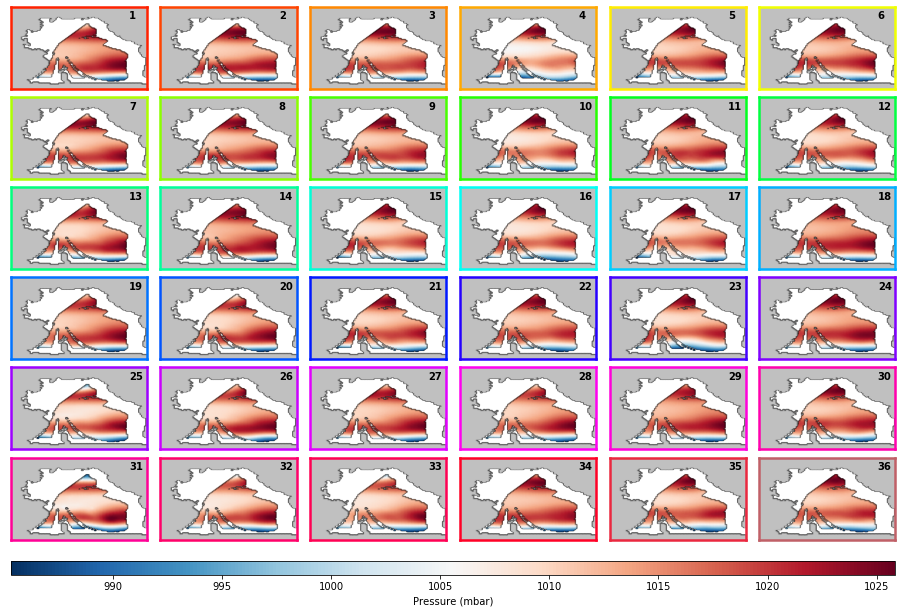

In [26]:
# Plot DWTs (data mean)
pred.Plot_DWTs('SLP', kind='mean', show=True);


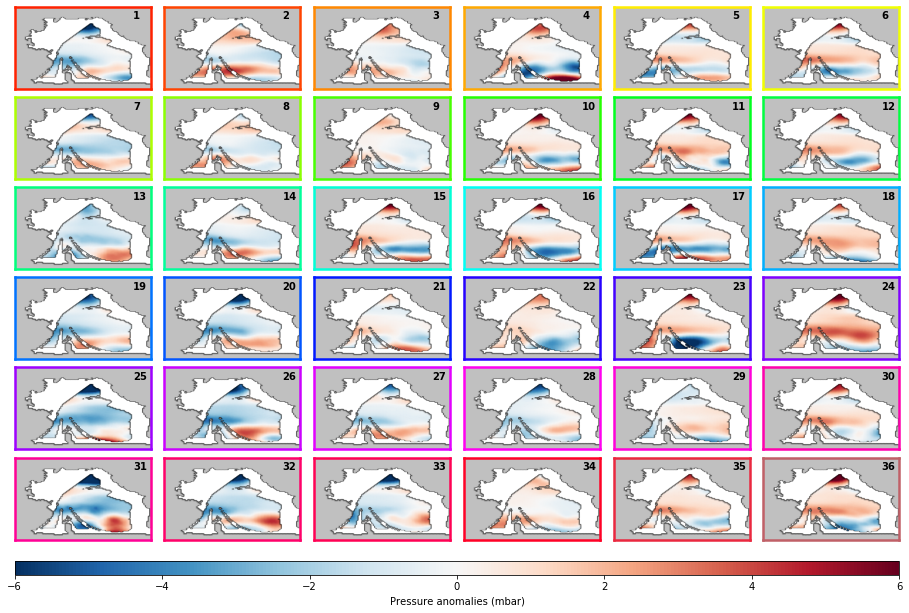

In [27]:
# Plot DWTs (data anomalies)
pred.Plot_DWTs('SLP', kind='anom', show=True);


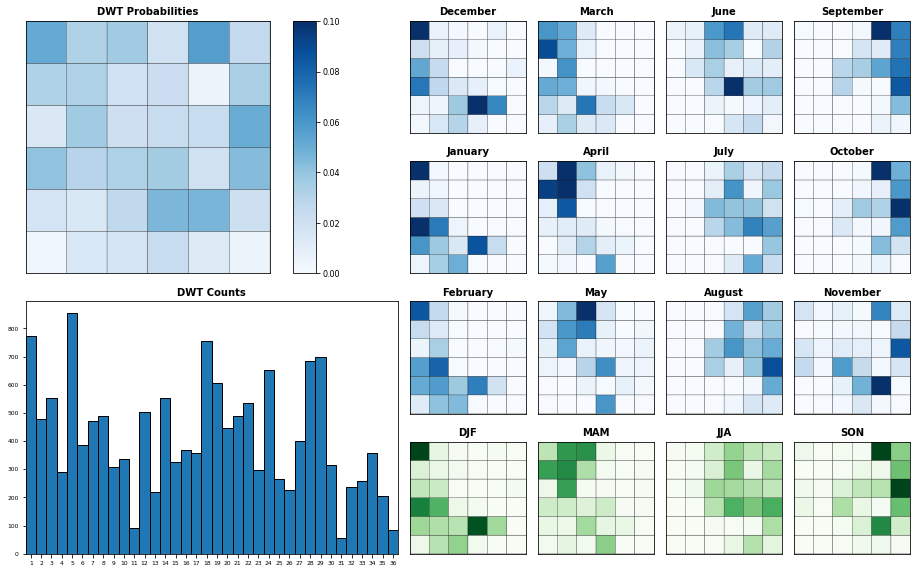

In [25]:
# Plot DWTs Probabilities
pred.Plot_DWTs_Probs();


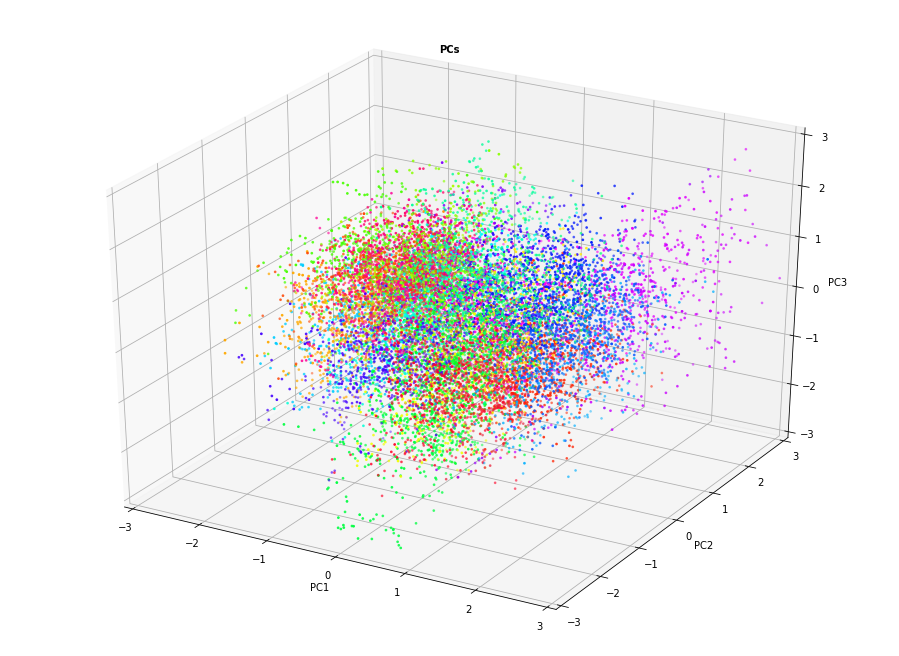

In [28]:
# Plot PC1, PC2, PC3 (3D)
pred.Plot_PCs_3D();


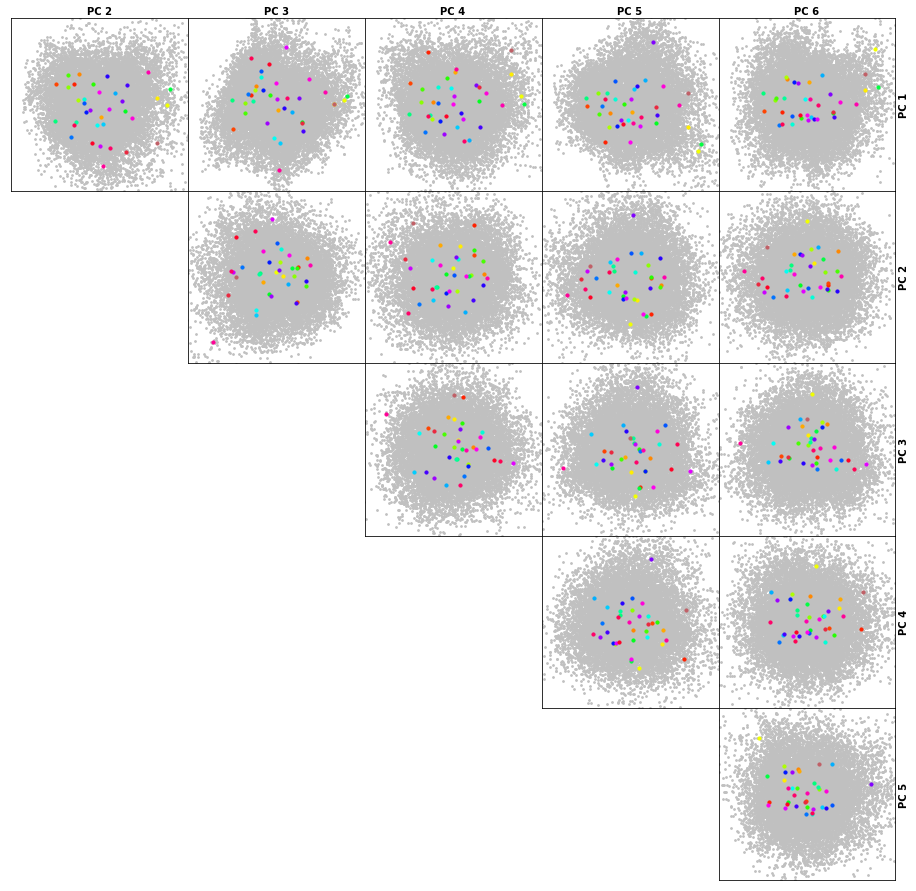

In [17]:
# Plot PCs DWT centroids
pred.Plot_DWT_PCs(n=6);



## ESTELA Predictor - Add Historical TCs

In [4]:
# --------------------------------------
# use historical storms-parameters inside r1 to modify predictor KMA results 

storm_dates = TCs_r1_params.dmin_date.values[:]
storm_categs = TCs_r1_params.category.values[:]

# add r1 storms to predictor KMA
pred.Mod_KMA_AddStorms(storm_dates, storm_categs)

print(pred.KMA)

<xarray.Dataset>
Dimensions:             (n_clusters: 36, n_components: 14933, n_features: 152)
Dimensions without coordinates: n_clusters, n_components, n_features
Data variables:
    bmus                (n_components) int32 ...
    cenEOFs             (n_clusters, n_features) float64 ...
    centroids           (n_clusters, n_features) float64 ...
    group_size          (n_clusters) int64 ...
    sorted_order        (n_clusters) int64 ...
    sorted_bmus         (n_components) int64 0 27 0 0 0 0 ... 32 32 27 27 25 25
    sorted_cenEOFs      (n_clusters, n_features) float64 ...
    sorted_centroids    (n_clusters, n_features) float64 ...
    time                (n_components) datetime64[ns] 1979-02-13 ... 2020-01-01
    sorted_bmus_storms  (n_components) int64 0 27 0 0 0 0 ... 32 32 27 27 25 25
Attributes:
    method:   regression guided
    alpha:    0.4


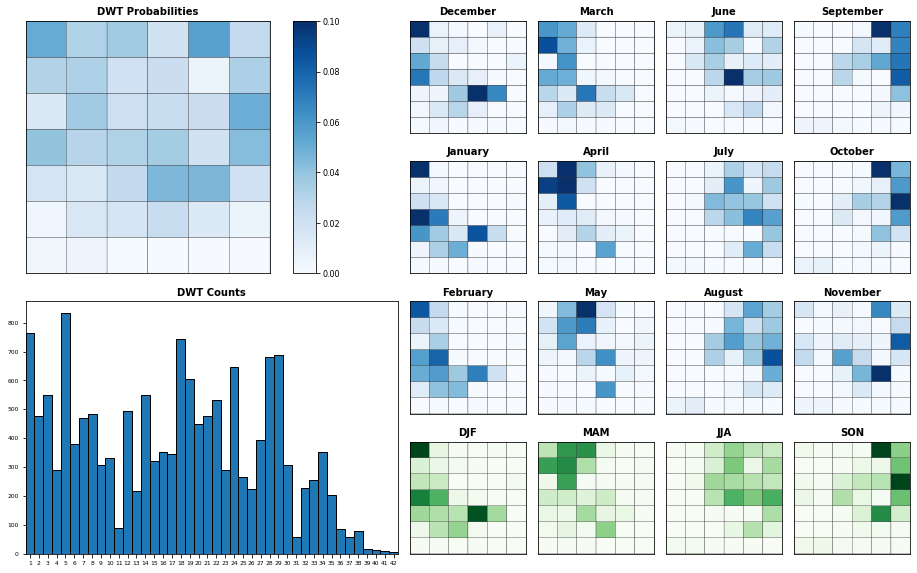

In [5]:
# Plot DWTs Probabilities with updated bmus
pred.Plot_DWTs_Probs(field='sorted_bmus_storms', n_clusters=42);


## Calculate hydrograps for nearshore waves at 3 locations (N, S, E)

In [6]:
# --------------------------------------
# Calculate intradaily MU TAU hydrographs

# add TWL proxy (runup instead of AWL)
WAVES_N = WAVES.copy(deep=True)
WAVES_S = WAVES.copy(deep=True)
WAVES_E = WAVES.copy(deep=True)
WAVES_N['runup'] = WAVES_runup_N.runup
WAVES_S['runup'] = WAVES_runup_S.runup
WAVES_E['runup'] = WAVES_runup_E.runup

# En realidad WAVES no se usa, sólo el runup, pero así modifico mínimamente la función
l_MU_TAU_N = pred.Calc_MU_TAU_Hydrographs(WAVES_N)
l_MU_TAU_S = pred.Calc_MU_TAU_Hydrographs(WAVES_S)
l_MU_TAU_E = pred.Calc_MU_TAU_Hydrographs(WAVES_E)

# store hydrographs MU TAU
db.Save_MU_TAU_hydrograms(l_MU_TAU_N, location='N')
db.Save_MU_TAU_hydrograms(l_MU_TAU_S, location='S')
db.Save_MU_TAU_hydrograms(l_MU_TAU_E, location='E')


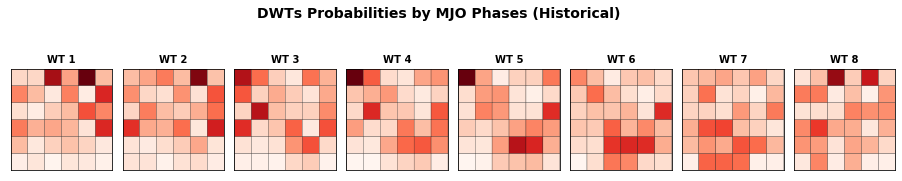

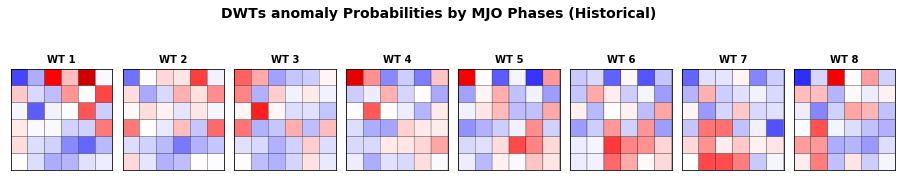

In [7]:
# Plot MJO phases / DWTs Probabilities 

# num. MJO phases and DWTs
MJO_ncs = 8
DWT_ncs = 36

# MJO, DWTs historical data
MJO_hist, DWT_hist = db.Load_MJO_DWTs_Plots_hist()

# categories to plot
MJO_phase = MJO_hist.phase.values[:]
DWT_bmus =  DWT_hist.bmus.values[:]

Plot_Probs_WT_WT(
    MJO_phase, DWT_bmus, MJO_ncs, DWT_ncs,
    wt_colors=False, ttl='DWTs Probabilities by MJO Phases (Historical)');


# plot DWTs conditional probabilities to each MJO, minus mean probabilities
Plot_Probs_WT_WT_anomaly(
    MJO_phase, DWT_bmus, MJO_ncs, DWT_ncs,
    wt_colors=False, ttl = 'DWTs anomaly Probabilities by MJO Phases (Historical)'
);


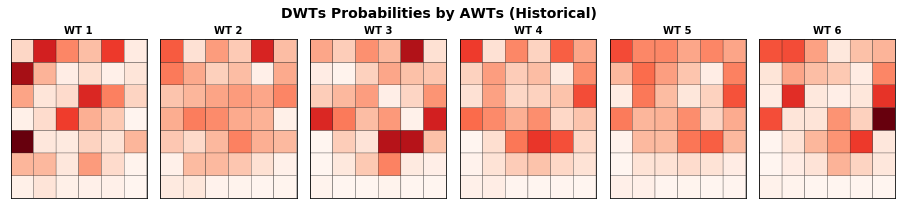

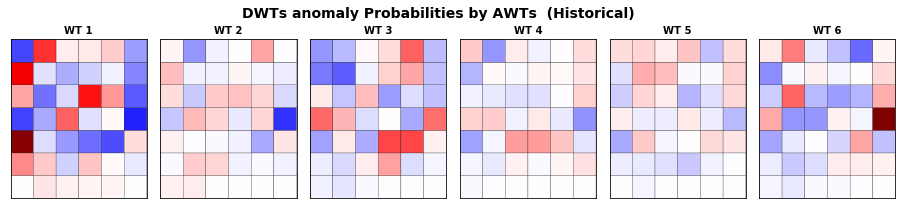

In [6]:
# Plot AWT / DWTs Probabilities 

# num. AWT phases and DWTs
AWT_ncs = 6
DWT_ncs = 42

# MJO, DWTs historical data
AWT_hist, DWT_hist = db.Load_AWTs_DWTs_Plots_hist()

# categories to plot
AWT_bmus = AWT_hist.bmus.values[:]
DWT_bmus =  DWT_hist.bmus.values[:]

Plot_Probs_WT_WT(
    AWT_bmus, DWT_bmus, AWT_ncs, DWT_ncs,
    wt_colors=False, ttl='DWTs Probabilities by AWTs (Historical)');


# plot DWTs conditional probabilities to each AWT, minus mean probabilities
Plot_Probs_WT_WT_anomaly(
    AWT_bmus, DWT_bmus, AWT_ncs, DWT_ncs,
    wt_colors=False, ttl = 'DWTs anomaly Probabilities by AWTs  (Historical)'
);

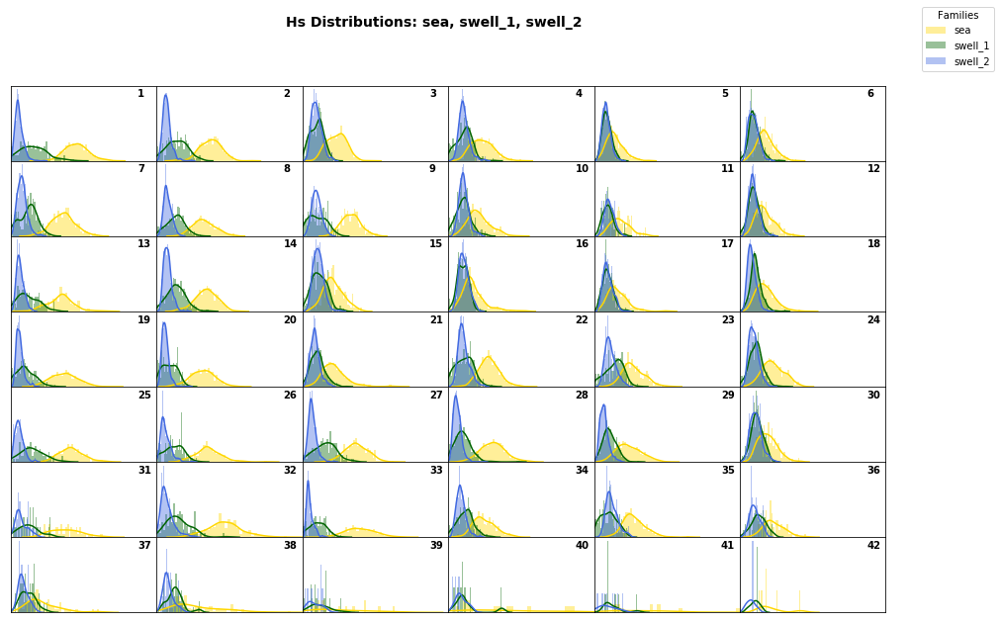

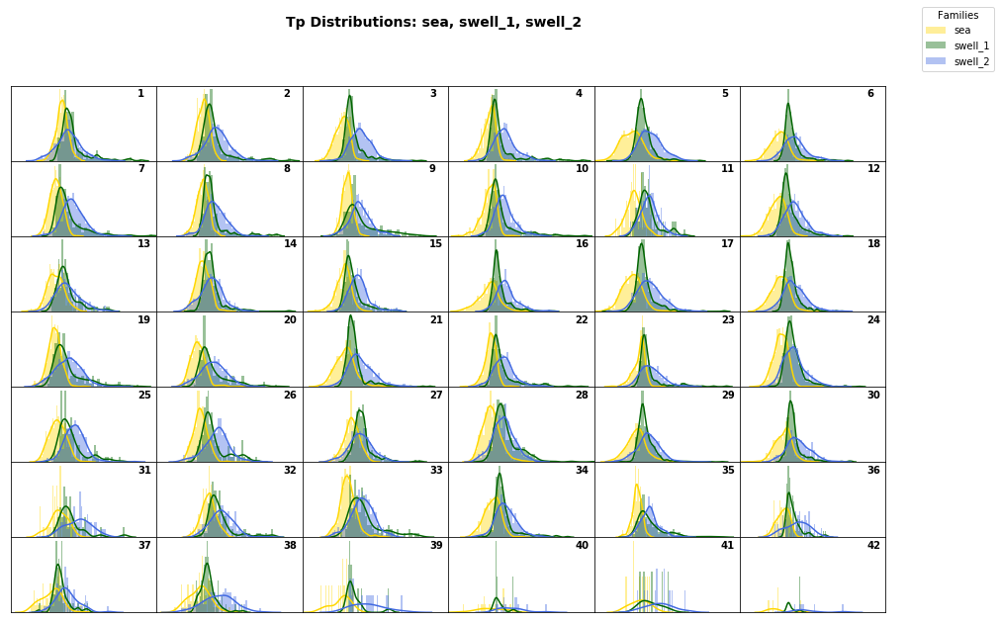

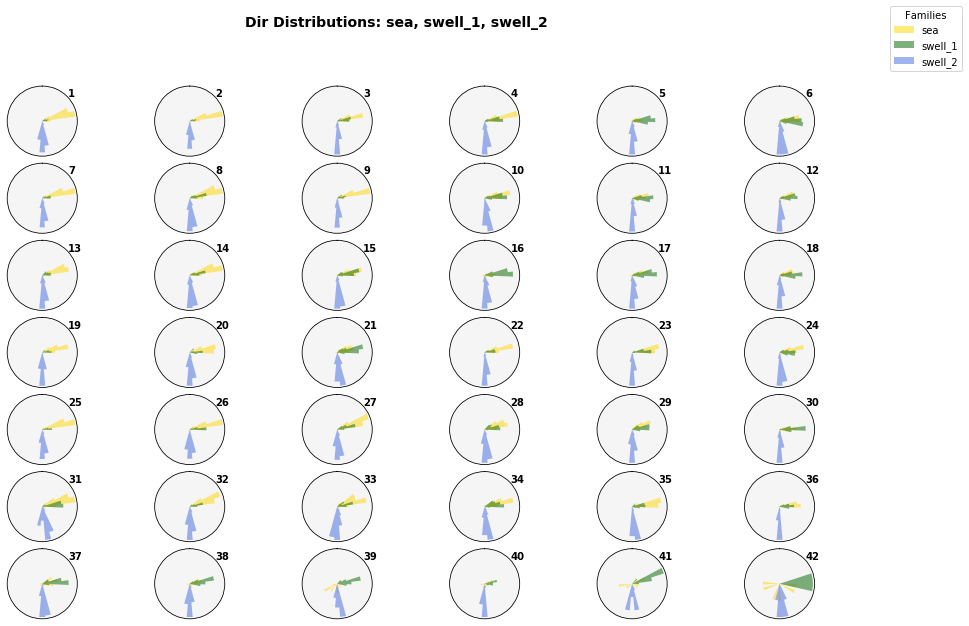

In [10]:
# Plot Waves Families by DWTs

# DWTs bmus
DWTs = pred.KMA
BMUS = xr.Dataset(
    {'bmus':(('time',), DWTs['sorted_bmus_storms'].values[:])},
    coords = {'time': DWTs.time.values[:]}
)
n_clusters = 42

# common dates
dates_common= xds_common_dates_daily([WAVES_d, DWTs])

# waves and bmus at common dates
WAVES_sel = WAVES_d.sel(time=dates_common)
bmus_sel = BMUS.sel(time=dates_common).bmus.values[:]

# Plot Waves Families by DWTs
Plot_Waves_DWTs(WAVES_sel, bmus_sel, n_clusters);
